In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd ### Used only for reading the data

In [3]:
## Reading data
data1 = pd.read_csv('datasets/sonar.all-data.csv',header =None)
data = data1

In [4]:
data_l = data[60]
data_f = np.empty([data.shape[0],data.shape[1]-1])
for i in range(0,data_f.shape[1]):
    data_f[:,i] = data[i]

In [5]:
y = np.empty([data_l.shape[0],1])
for i in range(0,data_l.shape[0]):
    if(data_l[i]=='R'):
        y[i] = 1
    else:
        y[i] = -1
x = data_f

In [6]:
## Creating the features and labels in train and test set
x_train1 = x[:int(x.shape[0]*0.9)]
y_train1 = y[:int(x.shape[0]*0.9)]
x_test1 = x[int(x.shape[0]*0.9):]
y_test1 = y[int(x.shape[0]*0.9):]
print(x_train1.shape,y_train1.shape,x_test1.shape,y_test1.shape)

(187, 60) (187, 1) (21, 60) (21, 1)


In [7]:
# Normalisation of train set
x_train = np.empty(x_train1.shape)
m = []
v = []
for i in range(0,x_train1.shape[1]):
    mean = np.mean(x_train1[:,i])
    var = np.var(x_train1[:,i])
    m.append(mean)
    v.append(var)
    x_train[:,i] = x_train1[:,i] - mean*np.ones(x_train1[:,i].shape)
    x_train[:,i] = x_train[:,i]/var
y_train = y_train1
y_test = y_test1
# x_train = x_train1
# x_test = x_test1
# y_train = y_train1
# y_test = y_test1

In [8]:
## Function used in perceptron to return 1 or -1 based on input
def func(x):
    res = np.empty(x.shape)
    for i in range(0,x.shape[0]):
        for j in range(0,x.shape[1]):
            if(x[i][j]>0):
                res[i][j] = 1
            else:
                res[i][j] = -1
    return res

In [10]:
## Training
w = np.zeros([x_train.shape[1],1])
con = 1
lr = 1   ## Learning rate
loss = []
ep = 0
M1 = []
epochs = 300000   ## Maximum number of epochs
while(con!=0 and ep<=epochs):
    y_hat = func(x_train@w)
    M = []
    for i in range(0,y_hat.shape[0]):
        if(y_hat[i]!=y_train[i]):
            M.append(i)
    con = len(M)
    l1 = 0
    for i in range(0,len(M)):
        l1 = l1 + x_train[M[i]]@w*y_train[M[i]]
    l1 = -l1
    loss.append(l1)
    M1.append(len(M))
    print("Epoch",ep,"Loss",l1,"M",sum(M1)/len(M1))
    for i in range(0,len(M)):
        w = w + lr*y_train[M[i]]*(x_train[M[i]].reshape(x_train.shape[1],1))    ## Updating weights
    ep+=1

Epoch 0 Loss [-0.] M 97.0
Epoch 1 Loss [1.07857993e+08] M 85.0
Epoch 2 Loss [1.61351353e+08] M 90.0
Epoch 3 Loss [3.09455445e+08] M 85.75
Epoch 4 Loss [1.05000637e+08] M 81.8
Epoch 5 Loss [1.11750323e+08] M 82.66666666666667
Epoch 6 Loss [2.58110561e+08] M 81.0
Epoch 7 Loss [64581700.8979392] M 77.375
Epoch 8 Loss [1.03052633e+08] M 78.55555555555556
Epoch 9 Loss [2.61481964e+08] M 77.7
Epoch 10 Loss [66581371.95278387] M 75.36363636363636
Epoch 11 Loss [1.00861094e+08] M 76.33333333333333
Epoch 12 Loss [2.56696552e+08] M 75.76923076923077
Epoch 13 Loss [65860950.46388648] M 74.07142857142857
Epoch 14 Loss [87332705.11843818] M 74.53333333333333
Epoch 15 Loss [2.42466035e+08] M 74.1875
Epoch 16 Loss [57088504.5324944] M 73.0
Epoch 17 Loss [85072093.01384856] M 73.38888888888889
Epoch 18 Loss [2.38867272e+08] M 73.10526315789474
Epoch 19 Loss [54334356.13315233] M 72.05
Epoch 20 Loss [84927641.39861818] M 72.33333333333333
Epoch 21 Loss [2.33515296e+08] M 72.13636363636364
Epoch 22 Loss

Epoch 252 Loss [64522431.00871778] M 55.10671936758893
Epoch 253 Loss [1.97700691e+08] M 55.145669291338585
Epoch 254 Loss [31895567.62426622] M 55.07058823529412
Epoch 255 Loss [50974248.79036137] M 55.0703125
Epoch 256 Loss [1.46362554e+08] M 55.08949416342413
Epoch 257 Loss [21145653.03111443] M 55.02713178294574
Epoch 258 Loss [13890680.64814405] M 54.93050193050193
Epoch 259 Loss [13794447.53430289] M 54.83461538461538
Epoch 260 Loss [26593959.8266949] M 54.793103448275865
Epoch 261 Loss [1.05564664e+08] M 54.79770992366412
Epoch 262 Loss [30235128.99372737] M 54.756653992395435
Epoch 263 Loss [83505552.57923073] M 54.746212121212125
Epoch 264 Loss [43298650.41891561] M 54.72075471698113
Epoch 265 Loss [1.20369747e+08] M 54.725563909774436
Epoch 266 Loss [21428204.52961097] M 54.640449438202246
Epoch 267 Loss [23402440.49960558] M 54.57835820895522
Epoch 268 Loss [56816400.93873397] M 54.613382899628256
Epoch 269 Loss [1.94482399e+08] M 54.65555555555556
Epoch 270 Loss [32540553.6

Epoch 508 Loss [1.58950263e+08] M 50.18860510805501
Epoch 509 Loss [21992548.54264639] M 50.14509803921569
Epoch 510 Loss [26929100.25592147] M 50.12133072407045
Epoch 511 Loss [71951756.28477874] M 50.1171875
Epoch 512 Loss [35314836.33436861] M 50.10136452241716
Epoch 513 Loss [82799614.48311557] M 50.099221789883266
Epoch 514 Loss [26395149.54258139] M 50.071844660194174
Epoch 515 Loss [66469495.71536476] M 50.06395348837209
Epoch 516 Loss [35489780.90870389] M 50.04642166344294
Epoch 517 Loss [71812386.33966604] M 50.04247104247104
Epoch 518 Loss [34332030.75001721] M 50.02312138728324
Epoch 519 Loss [69427547.79826799] M 50.01346153846154
Epoch 520 Loss [28684552.0385037] M 49.990403071017276
Epoch 521 Loss [67364695.54677965] M 49.980842911877396
Epoch 522 Loss [36850200.95928689] M 49.96367112810707
Epoch 523 Loss [70121149.41593367] M 49.958015267175576
Epoch 524 Loss [35181838.35560997] M 49.94095238095238
Epoch 525 Loss [72529852.24635482] M 49.93916349809886
Epoch 526 Loss [

Epoch 733 Loss [69674963.40464708] M 47.98910081743869
Epoch 734 Loss [33135318.91233943] M 47.98095238095238
Epoch 735 Loss [68159293.8001487] M 47.97961956521739
Epoch 736 Loss [30531640.53969933] M 47.97014925373134
Epoch 737 Loss [69708379.46539034] M 47.96883468834688
Epoch 738 Loss [32274725.18410952] M 47.95940460081191
Epoch 739 Loss [68049243.2136153] M 47.95945945945946
Epoch 740 Loss [34411173.90581375] M 47.95141700404859
Epoch 741 Loss [70032619.58744088] M 47.95283018867924
Epoch 742 Loss [31413479.67665902] M 47.9421265141319
Epoch 743 Loss [65013841.41109575] M 47.93817204301075
Epoch 744 Loss [28651530.40636759] M 47.92348993288591
Epoch 745 Loss [56540178.87398055] M 47.9142091152815
Epoch 746 Loss [31262978.69761642] M 47.90629183400268
Epoch 747 Loss [70053062.06497425] M 47.905080213903744
Epoch 748 Loss [31176926.42768075] M 47.89719626168224
Epoch 749 Loss [69906358.60191108] M 47.896
Epoch 750 Loss [31106613.66706942] M 47.88814913448735
Epoch 751 Loss [73182737

Epoch 954 Loss [27644688.3658419] M 46.51413612565445
Epoch 955 Loss [61313214.28959121] M 46.50941422594142
Epoch 956 Loss [29851330.93513717] M 46.50574712643678
Epoch 957 Loss [66066471.89507204] M 46.5062630480167
Epoch 958 Loss [28209627.85172877] M 46.496350364963504
Epoch 959 Loss [59614681.40856393] M 46.49270833333333
Epoch 960 Loss [29431167.82409049] M 46.488033298647245
Epoch 961 Loss [63806695.29634915] M 46.486486486486484
Epoch 962 Loss [30562240.5512029] M 46.4797507788162
Epoch 963 Loss [59883988.62932222] M 46.476141078838175
Epoch 964 Loss [30279878.69770251] M 46.47046632124352
Epoch 965 Loss [63513786.33361059] M 46.46894409937888
Epoch 966 Loss [28356772.69123921] M 46.45915201654602
Epoch 967 Loss [57831010.9428789] M 46.453512396694215
Epoch 968 Loss [26707540.6705285] M 46.44582043343653
Epoch 969 Loss [62025322.53322724] M 46.442268041237114
Epoch 970 Loss [26698317.23297267] M 46.4346035015448
Epoch 971 Loss [54694870.30728827] M 46.42695473251029
Epoch 972 L

Epoch 1196 Loss [20517230.09270491] M 45.19966583124478
Epoch 1197 Loss [30160401.75970499] M 45.186978297161936
Epoch 1198 Loss [35475092.05624529] M 45.18765638031693
Epoch 1199 Loss [96589796.05271251] M 45.19166666666667
Epoch 1200 Loss [15963798.39300083] M 45.174021648626145
Epoch 1201 Loss [14948209.75920236] M 45.15474209650582
Epoch 1202 Loss [14393215.22304225] M 45.13965087281795
Epoch 1203 Loss [21880635.90304604] M 45.12624584717608
Epoch 1204 Loss [33034441.21924965] M 45.12448132780083
Epoch 1205 Loss [86435208.54387139] M 45.12852404643449
Epoch 1206 Loss [18294935.81497569] M 45.11847555923778
Epoch 1207 Loss [27912826.96346616] M 45.104304635761586
Epoch 1208 Loss [32627621.01510577] M 45.10339123242349
Epoch 1209 Loss [94936702.1355744] M 45.107438016528924
Epoch 1210 Loss [15791198.40473313] M 45.09000825763832
Epoch 1211 Loss [16411937.76877488] M 45.07095709570957
Epoch 1212 Loss [18573616.14116033] M 45.06265457543281
Epoch 1213 Loss [51209321.67221829] M 45.0584

Epoch 1454 Loss [25978730.74373338] M 43.96426116838488
Epoch 1455 Loss [54171791.51570356] M 43.96153846153846
Epoch 1456 Loss [29318684.89755869] M 43.95744680851064
Epoch 1457 Loss [57922013.44390486] M 43.95541838134431
Epoch 1458 Loss [25138361.30029766] M 43.947224126113774
Epoch 1459 Loss [48573610.26399311] M 43.942465753424656
Epoch 1460 Loss [27866125.75712005] M 43.93976728268309
Epoch 1461 Loss [56413356.55044821] M 43.9391244870041
Epoch 1462 Loss [28598536.907414] M 43.93438140806562
Epoch 1463 Loss [61200186.1439286] M 43.93374316939891
Epoch 1464 Loss [26640425.74103386] M 43.9296928327645
Epoch 1465 Loss [52421637.6796798] M 43.927012278308325
Epoch 1466 Loss [28439023.26969829] M 43.92365371506476
Epoch 1467 Loss [58194263.00152776] M 43.92302452316076
Epoch 1468 Loss [26665479.55548737] M 43.91899251191287
Epoch 1469 Loss [49258239.13753955] M 43.914965986394556
Epoch 1470 Loss [29652588.11122712] M 43.90890550645819
Epoch 1471 Loss [59410918.38777422] M 43.908288043

Epoch 1601 Loss [58930939.10637246] M 43.342696629213485
Epoch 1602 Loss [28216383.1296496] M 43.34061135371179
Epoch 1603 Loss [57858533.10911167] M 43.34164588528678
Epoch 1604 Loss [29839147.51976378] M 43.337694704049845
Epoch 1605 Loss [60903359.41953637] M 43.33748443337485
Epoch 1606 Loss [23290605.98357549] M 43.33105164903547
Epoch 1607 Loss [40470460.22310062] M 43.32587064676617
Epoch 1608 Loss [29939422.93402944] M 43.321939092604104
Epoch 1609 Loss [64294704.56914527] M 43.322360248447204
Epoch 1610 Loss [23911925.0128033] M 43.31657355679702
Epoch 1611 Loss [44202671.04393919] M 43.312655086848636
Epoch 1612 Loss [31250120.60761499] M 43.30874147551147
Epoch 1613 Loss [58683799.82479694] M 43.30855018587361
Epoch 1614 Loss [25318226.72744836] M 43.304643962848296
Epoch 1615 Loss [52963229.37976125] M 43.303836633663366
Epoch 1616 Loss [29732461.97359739] M 43.30055658627087
Epoch 1617 Loss [62857032.79270359] M 43.30098887515451
Epoch 1618 Loss [24930985.36753342] M 43.29

Epoch 1767 Loss [58811390.19074922] M 42.862556561085974
Epoch 1768 Loss [23180405.06898732] M 42.856981345392875
Epoch 1769 Loss [44252169.90838288] M 42.85254237288136
Epoch 1770 Loss [26559187.25961671] M 42.84923771880294
Epoch 1771 Loss [54450918.51025017] M 42.84932279909707
Epoch 1772 Loss [28017554.86304006] M 42.84602368866328
Epoch 1773 Loss [58983091.03373501] M 42.846674182638104
Epoch 1774 Loss [26761682.38247165] M 42.84281690140845
Epoch 1775 Loss [49485625.20289177] M 42.840653153153156
Epoch 1776 Loss [24856131.04220229] M 42.83680360157569
Epoch 1777 Loss [54764140.67426798] M 42.83520809898763
Epoch 1778 Loss [24885991.91410271] M 42.83136593591905
Epoch 1779 Loss [49678702.68199157] M 42.82921348314607
Epoch 1780 Loss [27134739.17017538] M 42.82594048287479
Epoch 1781 Loss [56714953.23669329] M 42.82603815937149
Epoch 1782 Loss [23444369.21032963] M 42.821648906337636
Epoch 1783 Loss [49306393.01538391] M 42.81894618834081
Epoch 1784 Loss [26685854.42145039] M 42.81

Epoch 1936 Loss [26214275.37353972] M 42.40939597315436
Epoch 1937 Loss [53824405.36775202] M 42.408668730650156
Epoch 1938 Loss [24611189.83550601] M 42.40484785972151
Epoch 1939 Loss [54563449.59765286] M 42.404639175257735
Epoch 1940 Loss [25394540.76838833] M 42.40133951571355
Epoch 1941 Loss [46998395.41600635] M 42.399073120494336
Epoch 1942 Loss [25503120.99501578] M 42.395265054040145
Epoch 1943 Loss [52071285.94384001] M 42.39300411522634
Epoch 1944 Loss [23283199.43151876] M 42.38920308483291
Epoch 1945 Loss [45425779.09608663] M 42.386433710174714
Epoch 1946 Loss [26592925.7743378] M 42.38315356959425
Epoch 1947 Loss [58008704.84884176] M 42.38347022587269
Epoch 1948 Loss [22435094.94107632] M 42.37916880451514
Epoch 1949 Loss [39207528.92175553] M 42.37230769230769
Epoch 1950 Loss [19349831.08868514] M 42.36750384418247
Epoch 1951 Loss [33383294.81214655] M 42.36065573770492
Epoch 1952 Loss [22611040.63828715] M 42.3584229390681
Epoch 1953 Loss [52180607.72589813] M 42.3582

Epoch 2165 Loss [44565975.8518801] M 41.772853185595565
Epoch 2166 Loss [20852466.16738055] M 41.767881864328565
Epoch 2167 Loss [38462297.12324347] M 41.76291512915129
Epoch 2168 Loss [20629473.26769838] M 41.75933609958506
Epoch 2169 Loss [41467219.52644478] M 41.75529953917051
Epoch 2170 Loss [22192728.20679818] M 41.750345462920315
Epoch 2171 Loss [46444457.16653872] M 41.74815837937385
Epoch 2172 Loss [25651624.96844488] M 41.74689369535205
Epoch 2173 Loss [59002337.21318358] M 41.747930082796685
Epoch 2174 Loss [24242200.12635055] M 41.74528735632184
Epoch 2175 Loss [47709239.5167698] M 41.744485294117645
Epoch 2176 Loss [27219598.53174596] M 41.74230592558567
Epoch 2177 Loss [58677994.40821923] M 41.74288337924702
Epoch 2178 Loss [21562540.79251699] M 41.73932996787517
Epoch 2179 Loss [39063307.2665648] M 41.73440366972477
Epoch 2180 Loss [20245446.6982215] M 41.72948188904172
Epoch 2181 Loss [36663174.27104657] M 41.723189734188814
Epoch 2182 Loss [18410931.54777981] M 41.71827

Epoch 2386 Loss [23604562.67539119] M 41.13280268118978
Epoch 2387 Loss [50372588.51143698] M 41.131909547738694
Epoch 2388 Loss [21390730.27393644] M 41.12766848053579
Epoch 2389 Loss [44113649.20652969] M 41.12510460251046
Epoch 2390 Loss [19124456.70287038] M 41.12086992890004
Epoch 2391 Loss [33252395.57428363] M 41.11538461538461
Epoch 2392 Loss [19743463.73461374] M 41.11199331383201
Epoch 2393 Loss [37926796.599672] M 41.109022556390975
Epoch 2394 Loss [20483210.58536686] M 41.10605427974948
Epoch 2395 Loss [45493788.95394647] M 41.104757929883135
Epoch 2396 Loss [24456617.9321395] M 41.10179390905298
Epoch 2397 Loss [50397951.66360069] M 41.102168473728106
Epoch 2398 Loss [26136655.1937544] M 41.10129220508545
Epoch 2399 Loss [59515805.09136583] M 41.1025
Epoch 2400 Loss [22339492.49637476] M 41.09912536443149
Epoch 2401 Loss [40396175.86942378] M 41.09658617818484
Epoch 2402 Loss [24521331.07854651] M 41.094465251768625
Epoch 2403 Loss [55805302.53357944] M 41.09484193011647
E

Epoch 2643 Loss [30384784.55995118] M 40.38199697428139
Epoch 2644 Loss [27653752.32070456] M 40.38336483931947
Epoch 2645 Loss [75937239.98290072] M 40.385109599395314
Epoch 2646 Loss [16354042.61209037] M 40.37929731771817
Epoch 2647 Loss [17588752.20644896] M 40.373111782477345
Epoch 2648 Loss [13801808.09470456] M 40.367308418271044
Epoch 2649 Loss [17388772.9346784] M 40.36150943396226
Epoch 2650 Loss [13915673.02821634] M 40.35760090531875
Epoch 2651 Loss [21073471.92119287] M 40.3525641025641
Epoch 2652 Loss [14828100.67027918] M 40.34828496042216
Epoch 2653 Loss [23257595.75269899] M 40.34287867370008
Epoch 2654 Loss [13991535.22196628] M 40.33898305084746
Epoch 2655 Loss [17143536.26148394] M 40.33283132530121
Epoch 2656 Loss [15017470.09066126] M 40.328566051938274
Epoch 2657 Loss [19768800.68311092] M 40.323175319789314
Epoch 2658 Loss [14995533.67882684] M 40.320045129748024
Epoch 2659 Loss [33245593.96972709] M 40.31691729323308
Epoch 2660 Loss [22301952.86319886] M 40.315

Epoch 2898 Loss [22685981.72650998] M 39.7357709555019
Epoch 2899 Loss [49370899.95107883] M 39.73551724137931
Epoch 2900 Loss [21031274.39426215] M 39.733540158566015
Epoch 2901 Loss [39218146.40402264] M 39.731909028256375
Epoch 2902 Loss [19189752.82758623] M 39.72786772304512
Epoch 2903 Loss [18811642.69275984] M 39.722451790633606
Epoch 2904 Loss [15515914.16022186] M 39.7184165232358
Epoch 2905 Loss [19067582.18393269] M 39.7136958017894
Epoch 2906 Loss [15504034.88223094] M 39.71035431716546
Epoch 2907 Loss [24157686.43193411] M 39.707015130674
Epoch 2908 Loss [22614835.68384337] M 39.70608456514266
Epoch 2909 Loss [54435912.68861278] M 39.707560137457044
Epoch 2910 Loss [26068667.45847743] M 39.70628649948471
Epoch 2911 Loss [57091553.8254199] M 39.707074175824175
Epoch 2912 Loss [21018289.4022893] M 39.70545829042224
Epoch 2913 Loss [44944499.70907044] M 39.70487302676733
Epoch 2914 Loss [24397082.45198159] M 39.703259005145796
Epoch 2915 Loss [55345181.33622143] M 39.70404663

Epoch 3149 Loss [52584915.83309178] M 39.1552380952381
Epoch 3150 Loss [18557890.14458536] M 39.15296731196445
Epoch 3151 Loss [52489028.90592222] M 39.15323604060914
Epoch 3152 Loss [21063970.1883878] M 39.152870282270854
Epoch 3153 Loss [54384794.59627707] M 39.15282181357007
Epoch 3154 Loss [18683249.81094404] M 39.149920760697306
Epoch 3155 Loss [41340180.28556015] M 39.14860583016477
Epoch 3156 Loss [18849041.64748733] M 39.14697497624327
Epoch 3157 Loss [48970121.12772445] M 39.146928435718806
Epoch 3158 Loss [22385603.64760169] M 39.14529914529915
Epoch 3159 Loss [52687398.63500731] M 39.14525316455696
Epoch 3160 Loss [19673380.7134859] M 39.14362543498893
Epoch 3161 Loss [40113936.83013231] M 39.14231499051233
Epoch 3162 Loss [21126269.58748558] M 39.14005690799873
Epoch 3163 Loss [47546030.53023264] M 39.14001264222503
Epoch 3164 Loss [19269114.05412674] M 39.13838862559242
Epoch 3165 Loss [54765533.9073892] M 39.13929248262792
Epoch 3166 Loss [19759737.11140469] M 39.13703820

Epoch 3385 Loss [25204712.48642825] M 38.666568222090966
Epoch 3386 Loss [30324410.13943462] M 38.667552406259226
Epoch 3387 Loss [75482990.90413164] M 38.66971664698937
Epoch 3388 Loss [15329750.62336502] M 38.66538802006492
Epoch 3389 Loss [15251088.98294025] M 38.66017699115044
Epoch 3390 Loss [13434126.03855523] M 38.655853730462994
Epoch 3391 Loss [15722565.219363] M 38.651238207547166
Epoch 3392 Loss [13989123.41774082] M 38.647804302976716
Epoch 3393 Loss [22766536.66561361] M 38.64525633470831
Epoch 3394 Loss [20579734.23212936] M 38.64506627393225
Epoch 3395 Loss [57534000.61222925] M 38.64605418138987
Epoch 3396 Loss [18293941.23962229] M 38.6443921106859
Epoch 3397 Loss [34918275.68003547] M 38.643025309005296
Epoch 3398 Loss [24063764.09266974] M 38.64371874080612
Epoch 3399 Loss [63127300.62812193] M 38.645
Epoch 3400 Loss [18703960.47280624] M 38.642164069391356
Epoch 3401 Loss [28448420.3970075] M 38.64050558495003
Epoch 3402 Loss [30490634.4254312] M 38.6411989421099
Ep

Epoch 3611 Loss [45983356.93853584] M 38.2109634551495
Epoch 3612 Loss [17780649.49125066] M 38.20869083863825
Epoch 3613 Loss [36085983.20788846] M 38.207802988378525
Epoch 3614 Loss [25439444.29370373] M 38.20774550484094
Epoch 3615 Loss [67175718.54842679] M 38.20934734513274
Epoch 3616 Loss [16113993.63521129] M 38.20680121647774
Epoch 3617 Loss [24542626.45761603] M 38.204809286898836
Epoch 3618 Loss [32564530.94265981] M 38.20641061066593
Epoch 3619 Loss [79424302.83429848] M 38.20828729281768
Epoch 3620 Loss [14322546.10531943] M 38.2040872687103
Epoch 3621 Loss [14042259.70023107] M 38.19933738266151
Epoch 3622 Loss [11320268.37305144] M 38.19459011868617
Epoch 3623 Loss [10984283.9437] M 38.18984547461368
Epoch 3624 Loss [10646389.51634266] M 38.18537931034483
Epoch 3625 Loss [11900066.8211498] M 38.18063982349697
Epoch 3626 Loss [14411893.75457026] M 38.178108629721535
Epoch 3627 Loss [35256156.00397637] M 38.17668136714443
Epoch 3628 Loss [22986306.73547612] M 38.17745935519

Epoch 3843 Loss [12841092.37245794] M 37.778876170655565
Epoch 3844 Loss [11980096.43593732] M 37.774512353706115
Epoch 3845 Loss [14244462.78110358] M 37.77015080603224
Epoch 3846 Loss [13638512.23962313] M 37.76709123992722
Epoch 3847 Loss [20134627.41609264] M 37.764553014553016
Epoch 3848 Loss [15925980.15081007] M 37.76331514679138
Epoch 3849 Loss [42124382.67938143] M 37.762337662337664
Epoch 3850 Loss [20585909.00930966] M 37.76162035834848
Epoch 3851 Loss [58495668.16015828] M 37.76246105919003
Epoch 3852 Loss [15399959.02392284] M 37.76018686737607
Epoch 3853 Loss [25750586.76270884] M 37.75843279709393
Epoch 3854 Loss [29737541.42336702] M 37.75953307392996
Epoch 3855 Loss [76477315.63318528] M 37.761410788381745
Epoch 3856 Loss [14252105.19480967] M 37.75758361420793
Epoch 3857 Loss [13828124.94761467] M 37.752980819077244
Epoch 3858 Loss [12538863.23575022] M 37.7496760818865
Epoch 3859 Loss [15598596.684483] M 37.74585492227979
Epoch 3860 Loss [12648697.84928668] M 37.7425

Epoch 4091 Loss [12641321.20430539] M 37.329423264907135
Epoch 4092 Loss [13082212.57881868] M 37.32616662594674
Epoch 4093 Loss [20000185.60819348] M 37.32437713727406
Epoch 4094 Loss [26102086.0958104] M 37.325274725274724
Epoch 4095 Loss [72961575.03581344] M 37.32666015625
Epoch 4096 Loss [12964626.69211868] M 37.32340737124726
Epoch 4097 Loss [16062607.67063437] M 37.32015617374329
Epoch 4098 Loss [13241765.92563985] M 37.318126372285924
Epoch 4099 Loss [22822885.26367979] M 37.31658536585366
Epoch 4100 Loss [33408672.22982178] M 37.318215069495245
Epoch 4101 Loss [78202050.62529975] M 37.31984397854705
Epoch 4102 Loss [12568779.5823195] M 37.31611016329515
Epoch 4103 Loss [13086049.18908933] M 37.31237816764133
Epoch 4104 Loss [13192633.7220629] M 37.309622411693056
Epoch 4105 Loss [21888783.08739486] M 37.30784218217243
Epoch 4106 Loss [35787705.07819165] M 37.30995860725591
Epoch 4107 Loss [82709184.60430104] M 37.31207400194742
Epoch 4108 Loss [12019244.91775753] M 37.30810416

Epoch 4359 Loss [9984793.09798096] M 36.91467889908257
Epoch 4360 Loss [8263788.19365269] M 36.911029580371476
Epoch 4361 Loss [8710488.53495645] M 36.90738193489225
Epoch 4362 Loss [9220163.0481107] M 36.90488196195278
Epoch 4363 Loss [15325481.40936016] M 36.90238313473877
Epoch 4364 Loss [18524723.41541354] M 36.90263459335624
Epoch 4365 Loss [66268934.04670338] M 36.90357306459001
Epoch 4366 Loss [12554393.98869013] M 36.90107625372109
Epoch 4367 Loss [20111211.80828281] M 36.89995421245421
Epoch 4368 Loss [40043350.71444237] M 36.90203707942321
Epoch 4369 Loss [77435527.62502685] M 36.90366132723112
Epoch 4370 Loss [12071595.41955807] M 36.90025165865934
Epoch 4371 Loss [13819711.06181836] M 36.896843549862766
Epoch 4372 Loss [12279785.80834132] M 36.893894351703636
Epoch 4373 Loss [16015537.12462256] M 36.890946502057616
Epoch 4374 Loss [12703596.51398685] M 36.888685714285714
Epoch 4375 Loss [25629986.06076391] M 36.887340036563074
Epoch 4376 Loss [37843074.8930866] M 36.8889650

Epoch 4562 Loss [12195185.04275856] M 36.6232741617357
Epoch 4563 Loss [25698959.33474616] M 36.62248028045574
Epoch 4564 Loss [36929344.76189637] M 36.62431544359255
Epoch 4565 Loss [76832048.58961247] M 36.626149802890936
Epoch 4566 Loss [11381894.61108416] M 36.62316619224874
Epoch 4567 Loss [14386958.24797087] M 36.6199649737303
Epoch 4568 Loss [11642243.62549784] M 36.61807835412563
Epoch 4569 Loss [18828304.22163564] M 36.616411378555796
Epoch 4570 Loss [41043994.50609139] M 36.61824546051192
Epoch 4571 Loss [84896857.00060163] M 36.62029746281715
Epoch 4572 Loss [12051781.29370043] M 36.61666302208616
Epoch 4573 Loss [11228252.64543088] M 36.61303017052908
Epoch 4574 Loss [10945829.336206] M 36.61005464480874
Epoch 4575 Loss [16652794.18486438] M 36.60751748251748
Epoch 4576 Loss [13238788.31984083] M 36.6058553637754
Epoch 4577 Loss [27713576.44662018] M 36.60484927916121
Epoch 4578 Loss [32272834.34182993] M 36.6058091286307
Epoch 4579 Loss [70059563.47576386] M 36.60764192139

Epoch 4831 Loss [69858897.59760931] M 36.26903973509934
Epoch 4832 Loss [11983321.81673619] M 36.266087316366644
Epoch 4833 Loss [14063656.7912472] M 36.26292925113778
Epoch 4834 Loss [10219908.88217626] M 36.259979317476734
Epoch 4835 Loss [16235641.28618228] M 36.25765095119934
Epoch 4836 Loss [16887662.55482081] M 36.258011163944595
Epoch 4837 Loss [60833695.40298222] M 36.258784621744525
Epoch 4838 Loss [14711897.60219137] M 36.257077908658815
Epoch 4839 Loss [30560151.84009158] M 36.256404958677685
Epoch 4840 Loss [31503056.73789342] M 36.25779797562487
Epoch 4841 Loss [70482533.56872928] M 36.259190417182985
Epoch 4842 Loss [13278759.37286892] M 36.25624612843279
Epoch 4843 Loss [13126847.03977342] M 36.25330305532618
Epoch 4844 Loss [11167119.65885777] M 36.250773993808046
Epoch 4845 Loss [13724984.67214944] M 36.248039620305406
Epoch 4846 Loss [13380650.14815921] M 36.24613162781102
Epoch 4847 Loss [25736622.15195392] M 36.245255775577554
Epoch 4848 Loss [36327841.15155211] M 3

Epoch 5108 Loss [10451397.2061477] M 35.92327265609708
Epoch 5109 Loss [17968056.31805334] M 35.92172211350294
Epoch 5110 Loss [31079959.96993664] M 35.92232439835649
Epoch 5111 Loss [68022108.62800883] M 35.92351330203443
Epoch 5112 Loss [12219247.8295252] M 35.9211813025621
Epoch 5113 Loss [13938140.87981531] M 35.91806804849433
Epoch 5114 Loss [9892245.23518195] M 35.915347018572824
Epoch 5115 Loss [12348871.398492] M 35.91262705238468
Epoch 5116 Loss [12519180.33673424] M 35.9108852843463
Epoch 5117 Loss [29964522.28131214] M 35.91031652989449
Epoch 5118 Loss [32663507.45490728] M 35.91131080289119
Epoch 5119 Loss [68765318.40373024] M 35.9125
Epoch 5120 Loss [11953338.4276214] M 35.91017379418082
Epoch 5121 Loss [13334899.79877539] M 35.90726278797345
Epoch 5122 Loss [10616178.20903571] M 35.904548116338084
Epoch 5123 Loss [15307237.27513591] M 35.902419984387194
Epoch 5124 Loss [14062865.20123861] M 35.90126829268293
Epoch 5125 Loss [28981178.26635493] M 35.900312134217714
Epoch 

Epoch 5380 Loss [9951386.42576249] M 35.59840178405501
Epoch 5381 Loss [13591744.2030807] M 35.5958751393534
Epoch 5382 Loss [10788818.47257265] M 35.593906743451605
Epoch 5383 Loss [27217481.27656845] M 35.5934249628529
Epoch 5384 Loss [37396917.63649201] M 35.594800371402044
Epoch 5385 Loss [74428300.45401454] M 35.5959896026736
Epoch 5386 Loss [10182906.20072964] M 35.59309448672731
Epoch 5387 Loss [9150837.01929627] M 35.59001484780995
Epoch 5388 Loss [8569615.85101958] M 35.58749304138059
Epoch 5389 Loss [11483431.32132094] M 35.58460111317254
Epoch 5390 Loss [12502172.5314528] M 35.58263772954925
Epoch 5391 Loss [24589031.92876169] M 35.5821587537092
Epoch 5392 Loss [41941353.84345659] M 35.58427591322084
Epoch 5393 Loss [78592780.73391464] M 35.586021505376344
Epoch 5394 Loss [10386220.56033216] M 35.583873957367935
Epoch 5395 Loss [12527325.70926975] M 35.58098591549296
Epoch 5396 Loss [9114656.41106917] M 35.57828423198073
Epoch 5397 Loss [11305222.86990069] M 35.5752130418673

Epoch 5534 Loss [10100590.58448354] M 35.417344173441734
Epoch 5535 Loss [20848242.28125559] M 35.416546242774565
Epoch 5536 Loss [43530605.39280279] M 35.41863825176088
Epoch 5537 Loss [84203074.4997772] M 35.42036836403034
Epoch 5538 Loss [9630566.34417742] M 35.41776493951977
Epoch 5539 Loss [9447186.79941468] M 35.41480144404332
Epoch 5540 Loss [8039435.63414329] M 35.41219996390543
Epoch 5541 Loss [9730217.80997917] M 35.40923854204259
Epoch 5542 Loss [7537972.26605954] M 35.406639004149376
Epoch 5543 Loss [8529106.72662886] M 35.40367965367965
Epoch 5544 Loss [8533141.08558745] M 35.40144274120829
Epoch 5545 Loss [16746111.09949385] M 35.39956725567977
Epoch 5546 Loss [27747383.32362751] M 35.400396610780604
Epoch 5547 Loss [72341484.72352558] M 35.40158615717375
Epoch 5548 Loss [9571430.52578431] M 35.399531447107584
Epoch 5549 Loss [11580500.69214153] M 35.39711711711712
Epoch 5550 Loss [12894141.17537905] M 35.39524410016213
Epoch 5551 Loss [24030122.11120011] M 35.39481268011

Epoch 5682 Loss [10897197.08804077] M 35.252507478444485
Epoch 5683 Loss [9319217.04570559] M 35.25070372976777
Epoch 5684 Loss [15648434.00454795] M 35.24854881266491
Epoch 5685 Loss [21193226.46703735] M 35.24868097080549
Epoch 5686 Loss [64187438.43572726] M 35.249692280640055
Epoch 5687 Loss [12695147.31970435] M 35.24789029535865
Epoch 5688 Loss [25752378.52403283] M 35.247495166110035
Epoch 5689 Loss [37894865.12796756] M 35.24885764499121
Epoch 5690 Loss [65606167.94722596] M 35.24986821296785
Epoch 5691 Loss [12211034.19655449] M 35.248243148278284
Epoch 5692 Loss [14983951.37571521] M 35.24626734586334
Epoch 5693 Loss [12636017.98856688] M 35.244819107832804
Epoch 5694 Loss [31040069.21614578] M 35.24442493415277
Epoch 5695 Loss [29003611.65823181] M 35.24525983146067
Epoch 5696 Loss [67581834.72009484] M 35.24609443566789
Epoch 5697 Loss [11349596.48645543] M 35.24394524394524
Epoch 5698 Loss [13147967.42733553] M 35.241445867696086
Epoch 5699 Loss [10427979.19322916] M 35.23

Epoch 5953 Loss [15445518.87133759] M 34.96288209606987
Epoch 5954 Loss [15874363.5476379] M 34.96221662468514
Epoch 5955 Loss [49467704.05043498] M 34.96222296843519
Epoch 5956 Loss [13105734.14893277] M 34.96105422192379
Epoch 5957 Loss [22492963.25533888] M 34.96055723397113
Epoch 5958 Loss [41894038.03609439] M 34.962241986910556
Epoch 5959 Loss [85565273.64441179] M 34.96392617449664
Epoch 5960 Loss [9599448.08508105] M 34.961080355645024
Epoch 5961 Loss [7796824.65577594] M 34.958235491445826
Epoch 5962 Loss [8170189.95720546] M 34.956230085527416
Epoch 5963 Loss [10121864.1488452] M 34.953386988598254
Epoch 5964 Loss [8499746.2040447] M 34.95088013411568
Epoch 5965 Loss [12610325.99087524] M 34.94820650351995
Epoch 5966 Loss [10708902.59872307] M 34.94670688788336
Epoch 5967 Loss [27149950.95277377] M 34.94638069705094
Epoch 5968 Loss [37330203.37160628] M 34.94789747026302
Epoch 5969 Loss [74894656.41715321] M 34.949078726968175
Epoch 5970 Loss [8788031.49627381] M 34.946910065

Epoch 6223 Loss [7511079.46322657] M 34.69232005141388
Epoch 6224 Loss [8254174.34274994] M 34.69060240963855
Epoch 6225 Loss [12631612.91238257] M 34.68856408609059
Epoch 6226 Loss [16651439.38625131] M 34.68813232696323
Epoch 6227 Loss [61251996.00500205] M 34.688824662813104
Epoch 6228 Loss [11302205.56132703] M 34.68759030341949
Epoch 6229 Loss [18863313.0340841] M 34.686998394863565
Epoch 6230 Loss [41700492.81346077] M 34.68849301877708
Epoch 6231 Loss [77581539.27461822] M 34.689826700898585
Epoch 6232 Loss [10282156.86388498] M 34.68763035456441
Epoch 6233 Loss [11075831.21816584] M 34.685274302213664
Epoch 6234 Loss [9180290.83675082] M 34.68340016038493
Epoch 6235 Loss [17982042.82652537] M 34.68216805644644
Epoch 6236 Loss [24395219.50105432] M 34.683020683020686
Epoch 6237 Loss [70524856.0052416] M 34.68435395960244
Epoch 6238 Loss [10432172.10227322] M 34.68248116685366
Epoch 6239 Loss [14235233.4251726] M 34.67996794871795
Epoch 6240 Loss [8840156.56677612] M 34.678256689

Epoch 6487 Loss [9784362.2548556] M 34.46562885326757
Epoch 6488 Loss [12803560.5911911] M 34.46370781322238
Epoch 6489 Loss [10678695.08604081] M 34.462249614791986
Epoch 6490 Loss [22000151.05194706] M 34.461716222461874
Epoch 6491 Loss [39328698.7212413] M 34.46318545902649
Epoch 6492 Loss [80549678.79529856] M 34.46450023101802
Epoch 6493 Loss [9380285.82075468] M 34.46196489066831
Epoch 6494 Loss [7294856.77685802] M 34.45958429561201
Epoch 6495 Loss [7564822.01673148] M 34.456896551724135
Epoch 6496 Loss [8338379.98586238] M 34.45436355240881
Epoch 6497 Loss [8078638.72468398] M 34.45260080024623
Epoch 6498 Loss [11233131.62698542] M 34.45022311124789
Epoch 6499 Loss [12551524.01287855] M 34.44907692307692
Epoch 6500 Loss [28271520.13687973] M 34.448854022458086
Epoch 6501 Loss [33683021.65010732] M 34.449707782220855
Epoch 6502 Loss [65437100.41119727] M 34.45071505459019
Epoch 6503 Loss [10808059.33875192] M 34.44910824108241
Epoch 6504 Loss [15676429.80232066] M 34.44780937740

Epoch 6752 Loss [67142592.4145736] M 34.2569228491041
Epoch 6753 Loss [11097937.244767] M 34.25540420491561
Epoch 6754 Loss [13747671.77691981] M 34.25358993338268
Epoch 6755 Loss [9504819.5286035] M 34.25177619893428
Epoch 6756 Loss [12567082.52496735] M 34.24951901731538
Epoch 6757 Loss [7959086.62480671] M 34.24770642201835
Epoch 6758 Loss [10419564.99087047] M 34.24559846131084
Epoch 6759 Loss [9686221.65414239] M 34.24423076923077
Epoch 6760 Loss [21905059.75447869] M 34.2438988315338
Epoch 6761 Loss [40323154.98563915] M 34.245341614906835
Epoch 6762 Loss [78673854.98660068] M 34.246488244861744
Epoch 6763 Loss [8380007.50718863] M 34.24438202247191
Epoch 6764 Loss [7601889.02081234] M 34.2419807834442
Epoch 6765 Loss [7439998.96081057] M 34.23972805202483
Epoch 6766 Loss [8025476.86229106] M 34.237328210432985
Epoch 6767 Loss [8114497.25824551] M 34.235963356974
Epoch 6768 Loss [14228364.61279898] M 34.23445117447186
Epoch 6769 Loss [22347172.43994525] M 34.23500738552437
Epoch 

Epoch 7042 Loss [68057070.84358814] M 34.031520658810166
Epoch 7043 Loss [10608539.53196092] M 34.02981260647359
Epoch 7044 Loss [12467205.07239482] M 34.027821149751595
Epoch 7045 Loss [8312913.24707374] M 34.025546409310245
Epoch 7046 Loss [7283644.01830752] M 34.02355612317298
Epoch 7047 Loss [9469226.45716826] M 34.02185017026107
Epoch 7048 Loss [12622686.59208697] M 34.01957724499929
Epoch 7049 Loss [13394585.26770411] M 34.01872340425532
Epoch 7050 Loss [29802653.20414338] M 34.01857892497518
Epoch 7051 Loss [30255448.57141259] M 34.01985252410664
Epoch 7052 Loss [67445468.27126987] M 34.02084219481072
Epoch 7053 Loss [10489139.85799029] M 34.01927984122484
Epoch 7054 Loss [12998914.47142443] M 34.017717930545714
Epoch 7055 Loss [10014373.70863159] M 34.016723356009074
Epoch 7056 Loss [21586877.90140647] M 34.0161541731614
Epoch 7057 Loss [34070488.93560378] M 34.017427033153865
Epoch 7058 Loss [69222710.02947766] M 34.01841620626151
Epoch 7059 Loss [10511348.47495826] M 34.01699

Epoch 7301 Loss [8128620.12531179] M 33.82580115036976
Epoch 7302 Loss [12232217.64487539] M 33.823907983020675
Epoch 7303 Loss [9972042.69858565] M 33.82297371303395
Epoch 7304 Loss [27899435.77312455] M 33.822861054072554
Epoch 7305 Loss [32737116.53516104] M 33.82384341637011
Epoch 7306 Loss [65945000.93871431] M 33.824825509785136
Epoch 7307 Loss [10114343.87248759] M 33.82348111658457
Epoch 7308 Loss [14844960.55235664] M 33.82213709125735
Epoch 7309 Loss [14070707.36813747] M 33.82147742818057
Epoch 7310 Loss [33142428.97086972] M 33.821365066338394
Epoch 7311 Loss [23334645.32087597] M 33.82193654266958
Epoch 7312 Loss [64460051.34170102] M 33.822781348283876
Epoch 7313 Loss [11193004.65513228] M 33.821438337435055
Epoch 7314 Loss [12673359.46390275] M 33.819685577580316
Epoch 7315 Loss [9381502.64752039] M 33.818206670311646
Epoch 7316 Loss [16472697.24733008] M 33.81727483941506
Epoch 7317 Loss [30867674.34488791] M 33.818393003552885
Epoch 7318 Loss [68585488.55311698] M 33.8

Epoch 7575 Loss [7234683.35695732] M 33.62605596620908
Epoch 7576 Loss [7455415.93205027] M 33.623861686683384
Epoch 7577 Loss [8443599.46157079] M 33.62245975191343
Epoch 7578 Loss [15915015.597349] M 33.621454017680435
Epoch 7579 Loss [24520201.79560028] M 33.6221635883905
Epoch 7580 Loss [64790535.70331] M 33.62313678934178
Epoch 7581 Loss [10189398.09552728] M 33.62173568979161
Epoch 7582 Loss [13839970.51850313] M 33.620071211921406
Epoch 7583 Loss [11634018.82833555] M 33.61933016877637
Epoch 7584 Loss [28117313.7972663] M 33.61924851680949
Epoch 7585 Loss [31378015.70165831] M 33.620485104139206
Epoch 7586 Loss [66874985.67498504] M 33.62158956109134
Epoch 7587 Loss [11036503.37325195] M 33.62005798629415
Epoch 7588 Loss [13251602.99778948] M 33.61839504546054
Epoch 7589 Loss [14130913.54396372] M 33.61778656126482
Epoch 7590 Loss [32330444.2338909] M 33.61770517718351
Epoch 7591 Loss [24084969.38647231] M 33.618282402528976
Epoch 7592 Loss [63437395.32616736] M 33.6191228763334

Epoch 7831 Loss [8528454.68711356] M 33.459397344228805
Epoch 7832 Loss [10316598.44627063] M 33.457679050172345
Epoch 7833 Loss [7879841.20687672] M 33.45596119479193
Epoch 7834 Loss [8485906.55475776] M 33.454116145500954
Epoch 7835 Loss [7398260.46081104] M 33.45227156712608
Epoch 7836 Loss [8004899.138693] M 33.45029985964017
Epoch 7837 Loss [8533854.99219005] M 33.44909415667262
Epoch 7838 Loss [16058988.24276145] M 33.44801632861334
Epoch 7839 Loss [18190638.28247915] M 33.44808673469388
Epoch 7840 Loss [63120311.04042386] M 33.44879479658207
Epoch 7841 Loss [10026541.11271863] M 33.44771741902576
Epoch 7842 Loss [16753890.53604073] M 33.44664031620553
Epoch 7843 Loss [21709858.85992641] M 33.447093319734826
Epoch 7844 Loss [64404331.39489613] M 33.447928616953476
Epoch 7845 Loss [10933407.06502479] M 33.44672444557737
Epoch 7846 Loss [15381200.64638715] M 33.44526570663948
Epoch 7847 Loss [16162914.0603336] M 33.44469928644241
Epoch 7848 Loss [44725823.68104144] M 33.44477003439

Epoch 8096 Loss [8669676.83093885] M 33.28652587378041
Epoch 8097 Loss [7079353.72773793] M 33.28500864410966
Epoch 8098 Loss [8714345.57034034] M 33.28312137300902
Epoch 8099 Loss [7616358.66233019] M 33.28172839506173
Epoch 8100 Loss [11456334.11256523] M 33.280088877916306
Epoch 8101 Loss [10685580.31879597] M 33.27931374969143
Epoch 8102 Loss [27465460.43349992] M 33.279155868196966
Epoch 8103 Loss [32633596.94305163] M 33.28010858835143
Epoch 8104 Loss [64800693.95760359] M 33.28106107341147
Epoch 8105 Loss [10327681.48611407] M 33.27966938070565
Epoch 8106 Loss [16385798.60172376] M 33.278401381522144
Epoch 8107 Loss [13565617.3296287] M 33.27799703996053
Epoch 8108 Loss [33772980.9393416] M 33.27796275743002
Epoch 8109 Loss [22024443.94345878] M 33.2786683107275
Epoch 8110 Loss [66548652.8023265] M 33.279620268770806
Epoch 8111 Loss [10220630.72301481] M 33.27835305719921
Epoch 8112 Loss [12463067.20304045] M 33.276839640083814
Epoch 8113 Loss [9080862.14734881] M 33.27581957111

Epoch 8362 Loss [62697486.69699553] M 33.125911754155204
Epoch 8363 Loss [10638312.58323858] M 33.124820659971306
Epoch 8364 Loss [12523162.98947492] M 33.12325164375373
Epoch 8365 Loss [9219701.54517007] M 33.122041596939994
Epoch 8366 Loss [14627706.02973152] M 33.12071232221824
Epoch 8367 Loss [12164637.34952153] M 33.12033938814532
Epoch 8368 Loss [30184526.0148281] M 33.12032500896164
Epoch 8369 Loss [27336237.79638523] M 33.12102747909199
Epoch 8370 Loss [64926422.60318621] M 33.121968701469356
Epoch 8371 Loss [9891621.83774544] M 33.12064022933588
Epoch 8372 Loss [13097299.99827478] M 33.119192643019225
Epoch 8373 Loss [8668711.30878453] M 33.11798423692381
Epoch 8374 Loss [9564324.31481466] M 33.11594029850746
Epoch 8375 Loss [7624094.38558829] M 33.11449379178605
Epoch 8376 Loss [9298939.76707949] M 33.11268950698341
Epoch 8377 Loss [8895241.344634] M 33.11184053473383
Epoch 8378 Loss [21208572.39211848] M 33.111588495047144
Epoch 8379 Loss [35217273.81903658] M 33.11252983293

Epoch 8647 Loss [15297651.8655362] M 32.95779370952822
Epoch 8648 Loss [33893301.59632701] M 32.95779858943231
Epoch 8649 Loss [21460250.41864397] M 32.95838150289018
Epoch 8650 Loss [64910286.61174544] M 32.95907987515894
Epoch 8651 Loss [8870653.57589369] M 32.95781322237633
Epoch 8652 Loss [12142312.70891725] M 32.95643129550445
Epoch 8653 Loss [10115063.06376292] M 32.955743009013176
Epoch 8654 Loss [20295718.1779296] M 32.955517042172154
Epoch 8655 Loss [34867481.63803165] M 32.956330868761555
Epoch 8656 Loss [67344649.99801587] M 32.957260020792425
Epoch 8657 Loss [9278150.28688549] M 32.95587895587896
Epoch 8658 Loss [11708027.95809118] M 32.95461369673173
Epoch 8659 Loss [10587371.33909431] M 32.953810623556585
Epoch 8660 Loss [22707159.55661941] M 32.95358503636994
Epoch 8661 Loss [31549445.13629525] M 32.954513969060265
Epoch 8662 Loss [65423322.30081424] M 32.95555812074339
Epoch 8663 Loss [10145084.26662957] M 32.95440904893813
Epoch 8664 Loss [13724122.2720182] M 32.953029

Epoch 8921 Loss [11736500.25251721] M 32.806993947545394
Epoch 8922 Loss [24485873.94552641] M 32.80690350778886
Epoch 8923 Loss [30257754.54111344] M 32.808045719408334
Epoch 8924 Loss [65525672.53775081] M 32.80918767507003
Epoch 8925 Loss [11361780.09035087] M 32.808088729554115
Epoch 8926 Loss [11887976.78910735] M 32.806541951383444
Epoch 8927 Loss [7819187.70345758] M 32.804883512544805
Epoch 8928 Loss [7554473.79841449] M 32.80344943442715
Epoch 8929 Loss [7737591.76015741] M 32.80179171332587
Epoch 8930 Loss [8129743.61443369] M 32.800022393908854
Epoch 8931 Loss [8571930.6981526] M 32.79881325570981
Epoch 8932 Loss [15291242.03608188] M 32.7974924437479
Epoch 8933 Loss [12693463.09868292] M 32.79729124692187
Epoch 8934 Loss [34778014.1405325] M 32.797313933967544
Epoch 8935 Loss [20125768.44261757] M 32.79800805729633
Epoch 8936 Loss [64821226.21352141] M 32.79881391965984
Epoch 8937 Loss [9532472.45548365] M 32.79782949205639
Epoch 8938 Loss [13202285.39574562] M 32.796062199

Epoch 9179 Loss [14484959.85638633] M 32.65795206971678
Epoch 9180 Loss [33173876.09583481] M 32.65798932578151
Epoch 9181 Loss [21656753.50947726] M 32.658788934872575
Epoch 9182 Loss [64878118.98197722] M 32.65958836981379
Epoch 9183 Loss [9520532.20300763] M 32.65842770034843
Epoch 9184 Loss [12708662.42745943] M 32.657049537289055
Epoch 9185 Loss [11936979.7715613] M 32.65665142608317
Epoch 9186 Loss [26518860.64433392] M 32.656688799390444
Epoch 9187 Loss [29997820.76471125] M 32.65748802786243
Epoch 9188 Loss [62697936.59461975] M 32.658178256611166
Epoch 9189 Loss [10161061.95271322] M 32.65701849836779
Epoch 9190 Loss [13197516.55554028] M 32.655532586225654
Epoch 9191 Loss [11421084.36256643] M 32.655134899912966
Epoch 9192 Loss [27118647.05035788] M 32.6551724137931
Epoch 9193 Loss [28751113.248316] M 32.65608005220796
Epoch 9194 Loss [63029176.702151] M 32.65698749320283
Epoch 9195 Loss [11682914.98170338] M 32.655937364071335
Epoch 9196 Loss [12812172.96555209] M 32.6544525

Epoch 9439 Loss [8993086.20507168] M 32.52701271186441
Epoch 9440 Loss [17790291.70653154] M 32.52653320622815
Epoch 9441 Loss [25512052.88685925] M 32.527218809574244
Epoch 9442 Loss [63465755.11450411] M 32.527904267711534
Epoch 9443 Loss [8699945.91447951] M 32.52647183396866
Epoch 9444 Loss [9877662.70481353] M 32.52472207517205
Epoch 9445 Loss [7939350.38931052] M 32.52318441668431
Epoch 9446 Loss [8089672.38762233] M 32.52164708373029
Epoch 9447 Loss [7181909.60805276] M 32.52032176121931
Epoch 9448 Loss [8849237.86787099] M 32.51878505661975
Epoch 9449 Loss [9219944.90547984] M 32.518095238095235
Epoch 9450 Loss [22065597.86727591] M 32.51804041900328
Epoch 9451 Loss [35559748.76637627] M 32.51893779094372
Epoch 9452 Loss [63584833.94097992] M 32.51972918650164
Epoch 9453 Loss [9038196.66138396] M 32.518616458641844
Epoch 9454 Loss [13953602.30627262] M 32.51729243786357
Epoch 9455 Loss [12040024.18838475] M 32.51692047377327
Epoch 9456 Loss [29659917.2149326] M 32.5169715554615

Epoch 9690 Loss [7711381.32770341] M 32.38891755236818
Epoch 9691 Loss [7317317.79287266] M 32.38784564589352
Epoch 9692 Loss [9446055.64696969] M 32.386154957185596
Epoch 9693 Loss [8844519.10533327] M 32.385289870022696
Epoch 9694 Loss [16614137.12840556] M 32.38452810727179
Epoch 9695 Loss [18595159.04127021] M 32.38490099009901
Epoch 9696 Loss [63999569.18010011] M 32.385480045374855
Epoch 9697 Loss [7554589.31390874] M 32.383893586306456
Epoch 9698 Loss [9179160.05845842] M 32.38220435096402
Epoch 9699 Loss [7242942.82380255] M 32.380721649484535
Epoch 9700 Loss [7766440.61227398] M 32.379239253685185
Epoch 9701 Loss [6982846.62056698] M 32.37786023500309
Epoch 9702 Loss [8275809.85207367] M 32.376378439657834
Epoch 9703 Loss [8018339.98487121] M 32.37551525144271
Epoch 9704 Loss [14343808.81424358] M 32.37424008243173
Epoch 9705 Loss [12285302.97818405] M 32.37399546672162
Epoch 9706 Loss [32429415.57043094] M 32.37405995673225
Epoch 9707 Loss [21279653.10663467] M 32.37443345694

Epoch 9956 Loss [12602968.33579194] M 32.24716280004017
Epoch 9957 Loss [11772680.9436759] M 32.24663587065676
Epoch 9958 Loss [27397915.27276606] M 32.24651069384476
Epoch 9959 Loss [21782748.60167241] M 32.2468875502008
Epoch 9960 Loss [56168464.52489336] M 32.247264330890474
Epoch 9961 Loss [9450651.66344134] M 32.24623569564344
Epoch 9962 Loss [12764943.73324138] M 32.24490615276523
Epoch 9963 Loss [11871608.39401674] M 32.24448012846246
Epoch 9964 Loss [23972600.13849107] M 32.244455594581034
Epoch 9965 Loss [31415399.18778062] M 32.24533413606261
Epoch 9966 Loss [61546412.8199784] M 32.24601183906893
Epoch 9967 Loss [10334180.31510328] M 32.244883627608345
Epoch 9968 Loss [12798297.83071964] M 32.24375564249173
Epoch 9969 Loss [9591967.45381718] M 32.24282848545637
Epoch 9970 Loss [15573031.60010678] M 32.241901514391735
Epoch 9971 Loss [13656396.55710399] M 32.24167669474529
Epoch 9972 Loss [28515113.3171672] M 32.24175273237742
Epoch 9973 Loss [26359389.73147987] M 32.242430318

Epoch 10222 Loss [21996783.43702691] M 32.11307835273403
Epoch 10223 Loss [29338728.3480433] M 32.113849765258216
Epoch 10224 Loss [62339856.75659838] M 32.114621026894866
Epoch 10225 Loss [10077554.89371854] M 32.11372970858596
Epoch 10226 Loss [12106728.94390211] M 32.112447443042925
Epoch 10227 Loss [13490959.95007748] M 32.11224090731326
Epoch 10228 Loss [31625670.73511971] M 32.112327695766936
Epoch 10229 Loss [21440515.94500634] M 32.112805474095794
Epoch 10230 Loss [60208122.26582299] M 32.113576385495065
Epoch 10231 Loss [10378730.38558921] M 32.11268569194684
Epoch 10232 Loss [12179191.38512322] M 32.11140428026972
Epoch 10233 Loss [7820590.75731023] M 32.11002540551104
Epoch 10234 Loss [6274143.74113468] M 32.1085490962384
Epoch 10235 Loss [8047115.14941418] M 32.10736615865572
Epoch 10236 Loss [12811869.90217116] M 32.10618345218326
Epoch 10237 Loss [13669244.49870814] M 32.105977730025394
Epoch 10238 Loss [33816262.18881825] M 32.10606504541459
Epoch 10239 Loss [19123630.29

Epoch 10444 Loss [33198512.80782589] M 32.00488271900431
Epoch 10445 Loss [19987739.16601705] M 32.00536090369519
Epoch 10446 Loss [61751592.852152] M 32.006126160620276
Epoch 10447 Loss [10077155.32856287] M 32.00526416539051
Epoch 10448 Loss [13158349.39282594] M 32.00401952339937
Epoch 10449 Loss [11017795.1382251] M 32.00344497607656
Epoch 10450 Loss [23927912.96716344] M 32.00344464644532
Epoch 10451 Loss [29650168.7170701] M 32.00440107156525
Epoch 10452 Loss [65431153.43502276] M 32.00535731368985
Epoch 10453 Loss [9723867.89254772] M 32.00440022957719
Epoch 10454 Loss [12948502.19890412] M 32.00315638450502
Epoch 10455 Loss [11199101.30965619] M 32.00258224942617
Epoch 10456 Loss [25782569.72456241] M 32.00239074304294
Epoch 10457 Loss [23119958.24305424] M 32.00286861732645
Epoch 10458 Loss [59415900.6288375] M 32.003537623099724
Epoch 10459 Loss [9615154.81261503] M 32.00267686424474
Epoch 10460 Loss [12499728.04572064] M 32.00143389733295
Epoch 10461 Loss [11880545.65694657]

Epoch 10725 Loss [7673167.08494108] M 31.880384113369384
Epoch 10726 Loss [6410633.72369644] M 31.87890370094155
Epoch 10727 Loss [8065335.48944575] M 31.877982848620434
Epoch 10728 Loss [14025538.29451338] M 31.876875757293316
Epoch 10729 Loss [11588340.32450137] M 31.876794035414726
Epoch 10730 Loss [30859522.02898839] M 31.876898704687353
Epoch 10731 Loss [22719871.79788171] M 31.877469250838615
Epoch 10732 Loss [60872092.13228084] M 31.878132861268984
Epoch 10733 Loss [9687871.90873979] M 31.877212595490963
Epoch 10734 Loss [13580366.99212992] M 31.87601304145319
Epoch 10735 Loss [11060938.27145348] M 31.875558867362145
Epoch 10736 Loss [23241480.90303703] M 31.87547732141194
Epoch 10737 Loss [27638173.6428022] M 31.8761408083442
Epoch 10738 Loss [62619731.46200674] M 31.87689729025049
Epoch 10739 Loss [9142007.42051295] M 31.875791433891994
Epoch 10740 Loss [10844206.97634848] M 31.874313378642583
Epoch 10741 Loss [7162009.48948584] M 31.87292869111897
Epoch 10742 Loss [6303501.95

Epoch 10997 Loss [21561155.70605578] M 31.750954719039825
Epoch 10998 Loss [58954176.42301992] M 31.75161378307119
Epoch 10999 Loss [9855582.04085219] M 31.75090909090909
Epoch 11000 Loss [13742849.08706933] M 31.749840923552405
Epoch 11001 Loss [11120540.5766422] M 31.749409198327577
Epoch 11002 Loss [24645110.69815309] M 31.749431973098247
Epoch 11003 Loss [27921986.94735295] M 31.75018175209015
Epoch 11004 Loss [63361379.62505218] M 31.750931394820537
Epoch 11005 Loss [8428723.97037863] M 31.749681991640923
Epoch 11006 Loss [10049901.70556077] M 31.7483419642046
Epoch 11007 Loss [7338229.62244038] M 31.747093023255815
Epoch 11008 Loss [7262000.09851035] M 31.74575347443001
Epoch 11009 Loss [8283436.54970755] M 31.74477747502271
Epoch 11010 Loss [12277270.23476014] M 31.743529198074654
Epoch 11011 Loss [12043826.32580706] M 31.743280058118415
Epoch 11012 Loss [27102120.6998747] M 31.743303368746027
Epoch 11013 Loss [26452673.64626621] M 31.743871436353732
Epoch 11014 Loss [58641727.4

Epoch 11238 Loss [61763863.71182457] M 31.65308301450307
Epoch 11239 Loss [8806183.7058919] M 31.652046263345195
Epoch 11240 Loss [9994917.19176103] M 31.65092073658927
Epoch 11241 Loss [8687089.05600564] M 31.650240170788116
Epoch 11242 Loss [12099286.03018515] M 31.649115004891932
Epoch 11243 Loss [12250969.78563685] M 31.648790466026327
Epoch 11244 Loss [25525780.70611662] M 31.648732770120052
Epoch 11245 Loss [24319167.10973468] M 31.649208607504892
Epoch 11246 Loss [59475591.79388189] M 31.649684360273852
Epoch 11247 Loss [8398050.86707918] M 31.648559743954483
Epoch 11248 Loss [10435112.48634022] M 31.647168637212197
Epoch 11249 Loss [6975450.48315312] M 31.645866666666667
Epoch 11250 Loss [6610658.28691046] M 31.644653808550352
Epoch 11251 Loss [9378618.04418752] M 31.643974404550303
Epoch 11252 Loss [11938405.15153582] M 31.642673064960455
Epoch 11253 Loss [11957298.45904603] M 31.642349386884664
Epoch 11254 Loss [27597295.8904781] M 31.642381163927144
Epoch 11255 Loss [2350323

Epoch 11382 Loss [21716370.21347872] M 31.583062461565493
Epoch 11383 Loss [27873482.3525505] M 31.58380182712579
Epoch 11384 Loss [61642590.30882458] M 31.584628897672378
Epoch 11385 Loss [9869068.36443586] M 31.583787106973475
Epoch 11386 Loss [12738722.21344446] M 31.582594186352857
Epoch 11387 Loss [9064195.03164437] M 31.581577098700386
Epoch 11388 Loss [11864378.87887918] M 31.580560189656687
Epoch 11389 Loss [8722527.00600489] M 31.579543459174715
Epoch 11390 Loss [13190792.93216016] M 31.578526907207443
Epoch 11391 Loss [11523246.86910651] M 31.578212780898877
Epoch 11392 Loss [26340081.46152074] M 31.57833757570438
Epoch 11393 Loss [28809998.17127659] M 31.578988941548182
Epoch 11394 Loss [60740015.19582149] M 31.579640193067135
Epoch 11395 Loss [8881813.27749599] M 31.578624078624077
Epoch 11396 Loss [11028859.30714468] M 31.577344915328595
Epoch 11397 Loss [9026361.24903606] M 31.576241445867694
Epoch 11398 Loss [10766088.06056719] M 31.575225897008508
Epoch 11399 Loss [8195

Epoch 11629 Loss [7061898.02080435] M 31.475666380051592
Epoch 11630 Loss [6105407.94185703] M 31.47442180380019
Epoch 11631 Loss [8541853.59719077] M 31.47369325997249
Epoch 11632 Loss [12372000.23347186] M 31.472620992005503
Epoch 11633 Loss [12437235.62169439] M 31.47215059308922
Epoch 11634 Loss [25126260.4021663] M 31.472195960464116
Epoch 11635 Loss [27385587.85965852] M 31.472756961155035
Epoch 11636 Loss [58810013.44310339] M 31.473317865429234
Epoch 11637 Loss [8645053.27829769] M 31.47224609039354
Epoch 11638 Loss [9770425.82703904] M 31.47100266345906
Epoch 11639 Loss [7359316.6465479] M 31.46975945017182
Epoch 11640 Loss [7319433.99867626] M 31.468516450476763
Epoch 11641 Loss [7676063.19213065] M 31.4674454561072
Epoch 11642 Loss [10876992.55046755] M 31.46637464570987
Epoch 11643 Loss [14681852.2274946] M 31.46607694950189
Epoch 11644 Loss [28586253.35564364] M 31.466122799484758
Epoch 11645 Loss [23810941.43166593] M 31.466683839945045
Epoch 11646 Loss [60291763.91848913

Epoch 11895 Loss [7445520.38575865] M 31.37188971082717
Epoch 11896 Loss [8666864.64286035] M 31.370513574850804
Epoch 11897 Loss [6958909.91883555] M 31.36938981341402
Epoch 11898 Loss [6867377.08619] M 31.36818220018489
Epoch 11899 Loss [7913556.09354209] M 31.367478991596638
Epoch 11900 Loss [14487362.52536579] M 31.366523821527604
Epoch 11901 Loss [10679665.81960574] M 31.366240967904552
Epoch 11902 Loss [26369673.11277958] M 31.36629421154331
Epoch 11903 Loss [25377989.48051899] M 31.36676747311828
Epoch 11904 Loss [56049002.84428924] M 31.36732465350693
Epoch 11905 Loss [9565452.03308994] M 31.366537880060473
Epoch 11906 Loss [12841530.48824983] M 31.365583270345176
Epoch 11907 Loss [14322745.28703672] M 31.36555256970104
Epoch 11908 Loss [31129809.13625386] M 31.365689814426066
Epoch 11909 Loss [20543340.57581612] M 31.36607892527288
Epoch 11910 Loss [58482687.52134889] M 31.366635882797414
Epoch 11911 Loss [9245745.28872128] M 31.365933512424444
Epoch 11912 Loss [11522487.88443

Epoch 12055 Loss [7505369.67666428] M 31.304246848042467
Epoch 12056 Loss [9154849.90152445] M 31.303060462801692
Epoch 12057 Loss [6381663.49719453] M 31.301957206833638
Epoch 12058 Loss [6989861.65915424] M 31.300688282610498
Epoch 12059 Loss [9330612.07282911] M 31.30016583747927
Epoch 12060 Loss [17390385.74616017] M 31.29972639084653
Epoch 12061 Loss [16836882.90643091] M 31.29995025700547
Epoch 12062 Loss [48135976.84846868] M 31.30033988228467
Epoch 12063 Loss [11492946.37436212] M 31.299983421750664
Epoch 12064 Loss [22054371.75566052] M 31.299958557811852
Epoch 12065 Loss [29203685.37756811] M 31.300679595557767
Epoch 12066 Loss [63520400.70568474] M 31.301317643159027
Epoch 12067 Loss [8214203.49798139] M 31.300049718263175
Epoch 12068 Loss [8579324.6056427] M 31.298864860386114
Epoch 12069 Loss [7221496.74536279] M 31.297763048881524
Epoch 12070 Loss [7601373.56946962] M 31.296661419932068
Epoch 12071 Loss [6800134.33934915] M 31.29572564612326
Epoch 12072 Loss [8023274.0775

Epoch 12306 Loss [33356905.84604386] M 31.189404403997724
Epoch 12307 Loss [18451510.15549165] M 31.18971400714982
Epoch 12308 Loss [44589544.81682622] M 31.190104801364853
Epoch 12309 Loss [13007955.96904349] M 31.189845653939887
Epoch 12310 Loss [26374045.22932371] M 31.18974900495492
Epoch 12311 Loss [21490070.10776264] M 31.190139701104613
Epoch 12312 Loss [55797196.50999186] M 31.190692763745634
Epoch 12313 Loss [10192244.72885967] M 31.189946402468735
Epoch 12314 Loss [12330651.6231028] M 31.188956557044254
Epoch 12315 Loss [12547278.39461188] M 31.188697629100357
Epoch 12316 Loss [20126845.91115019] M 31.188601120402694
Epoch 12317 Loss [29431377.39763676] M 31.18931644747524
Epoch 12318 Loss [59573744.78634088] M 31.189869307573666
Epoch 12319 Loss [8643971.56337512] M 31.18887987012987
Epoch 12320 Loss [10326004.9635765] M 31.187647106566025
Epoch 12321 Loss [7959776.69196322] M 31.1868203213764
Epoch 12322 Loss [9453021.64572676] M 31.185669074089102
Epoch 12323 Loss [6596602

Epoch 12575 Loss [17288470.30578751] M 31.084685114503817
Epoch 12576 Loss [43469103.48167681] M 31.084837401606105
Epoch 12577 Loss [10277073.53017421] M 31.084353633328032
Epoch 12578 Loss [14892777.68140534] M 31.08347245409015
Epoch 12579 Loss [9654506.06174757] M 31.082988871224167
Epoch 12580 Loss [17250058.03899628] M 31.08250536523329
Epoch 12581 Loss [19123828.76633186] M 31.082498807820695
Epoch 12582 Loss [38129704.37551368] M 31.082730668362075
Epoch 12583 Loss [13286001.5030038] M 31.082565162110615
Epoch 12584 Loss [24870187.9099784] M 31.082479141835517
Epoch 12585 Loss [21717789.34075931] M 31.082869855394883
Epoch 12586 Loss [57147905.61096499] M 31.083498848017797
Epoch 12587 Loss [10083577.69406225] M 31.082777248172864
Epoch 12588 Loss [12108449.30865279] M 31.081738025260147
Epoch 12589 Loss [8755716.10672136] M 31.080937251787134
Epoch 12590 Loss [11297358.99851203] M 31.07989834008419
Epoch 12591 Loss [10322674.89869142] M 31.079574332909782
Epoch 12592 Loss [182

Epoch 12856 Loss [58295592.60048316] M 30.985688729874777
Epoch 12857 Loss [8807443.58846366] M 30.984756571784104
Epoch 12858 Loss [9843776.71224853] M 30.98359125904036
Epoch 12859 Loss [7177150.72233134] M 30.982503888024883
Epoch 12860 Loss [6166345.57405006] M 30.98141668610528
Epoch 12861 Loss [7710278.84984184] M 30.980485150054424
Epoch 12862 Loss [9771926.50391584] M 30.979242789395943
Epoch 12863 Loss [7482577.44191344] M 30.978544776119403
Epoch 12864 Loss [10703045.53749254] M 30.977613680528567
Epoch 12865 Loss [12956750.33557687] M 30.97738224778486
Epoch 12866 Loss [26334245.95550128] M 30.97746172378954
Epoch 12867 Loss [24252190.08842298] M 30.97792974821262
Epoch 12868 Loss [58978549.80545326] M 30.978475406014454
Epoch 12869 Loss [8610082.28664814] M 30.977700077700078
Epoch 12870 Loss [11099649.12081162] M 30.97669178773988
Epoch 12871 Loss [9792836.15222112] M 30.97599440646364
Epoch 12872 Loss [15499063.61052363] M 30.97521945156529
Epoch 12873 Loss [12190987.6162

Epoch 13111 Loss [7421303.55823988] M 30.895744356314825
Epoch 13112 Loss [14509450.9476694] M 30.894989704873026
Epoch 13113 Loss [13586279.8199535] M 30.89499771236846
Epoch 13114 Loss [34845595.7977163] M 30.895081967213116
Epoch 13115 Loss [13936800.88730169] M 30.895089966453188
Epoch 13116 Loss [32496051.92670259] M 30.89517420141801
Epoch 13117 Loss [16049217.67805837] M 30.895487116938558
Epoch 13118 Loss [46770406.23964077] M 30.895876210076988
Epoch 13119 Loss [11151365.14470704] M 30.895426829268292
Epoch 13120 Loss [15075747.11609314] M 30.894672662144654
Epoch 13121 Loss [10781037.84545182] M 30.89445206523396
Epoch 13122 Loss [18984912.5210837] M 30.89430770403109
Epoch 13123 Loss [22426600.84804267] M 30.894696738799148
Epoch 13124 Loss [56356820.2888583] M 30.895161904761906
Epoch 13125 Loss [8983562.73099547] M 30.894408045101326
Epoch 13126 Loss [11243618.0660275] M 30.89327340595719
Epoch 13127 Loss [8723963.86723781] M 30.892443631931748
Epoch 13128 Loss [11450823.0

Epoch 13256 Loss [29352648.20302727] M 30.852229011088482
Epoch 13257 Loss [16397019.71030179] M 30.85224015688641
Epoch 13258 Loss [28416761.81282186] M 30.852175880533977
Epoch 13259 Loss [15374699.32916516] M 30.852187028657617
Epoch 13260 Loss [29751213.64636745] M 30.852198175099918
Epoch 13261 Loss [15801804.95367636] M 30.85220931986126
Epoch 13262 Loss [29775817.21406372] M 30.85229586066501
Epoch 13263 Loss [15153193.18627175] M 30.85230699638118
Epoch 13264 Loss [29849235.68361371] M 30.852242744063325
Epoch 13265 Loss [15186412.24404376] M 30.852329262777022
Epoch 13266 Loss [30279519.27079449] M 30.85234039345745
Epoch 13267 Loss [14236051.27638285] M 30.852351522460054
Epoch 13268 Loss [29613835.06274726] M 30.8522872861557
Epoch 13269 Loss [15515802.1448338] M 30.852449133383573
Epoch 13270 Loss [30597214.76623357] M 30.85238489940472
Epoch 13271 Loss [14561053.76589789] M 30.852471368294154
Epoch 13272 Loss [30384828.00943673] M 30.852482483236646
Epoch 13273 Loss [14158

Epoch 13525 Loss [9177424.16227941] M 30.75395534526098
Epoch 13526 Loss [9992979.74123853] M 30.753012493531454
Epoch 13527 Loss [7411108.48551096] M 30.751848018923713
Epoch 13528 Loss [6658079.97369113] M 30.750831547047085
Epoch 13529 Loss [7340682.14246022] M 30.74988913525499
Epoch 13530 Loss [9900519.356835] M 30.748725149656345
Epoch 13531 Loss [8478787.53864752] M 30.7480786284363
Epoch 13532 Loss [13869089.43991595] M 30.747358309317963
Epoch 13533 Loss [12849108.14302667] M 30.747303088517807
Epoch 13534 Loss [30167484.9709537] M 30.747543405984484
Epoch 13535 Loss [21828932.09797528] M 30.748079196217493
Epoch 13536 Loss [59621478.2771918] M 30.748688778902267
Epoch 13537 Loss [8564908.83729788] M 30.74804254690501
Epoch 13538 Loss [11204502.80923581] M 30.747100967575154
Epoch 13539 Loss [10321502.69470973] M 30.746602658788774
Epoch 13540 Loss [17333760.82173695] M 30.746325972970975
Epoch 13541 Loss [21198624.16719747] M 30.746640082705657
Epoch 13542 Loss [56992900.9327

Epoch 13806 Loss [6143827.3216075] M 30.665966538712247
Epoch 13807 Loss [10124803.76167288] M 30.66555619930475
Epoch 13808 Loss [17066244.61436666] M 30.665073502788037
Epoch 13809 Loss [14387482.84106962] M 30.66502534395366
Epoch 13810 Loss [33957386.9814852] M 30.66526681630584
Epoch 13811 Loss [16448804.73963273] M 30.66558065450333
Epoch 13812 Loss [44836779.53937139] M 30.665966842829217
Epoch 13813 Loss [11796104.60840164] M 30.665701462284638
Epoch 13814 Loss [16877544.56478849] M 30.665291349981903
Epoch 13815 Loss [14988375.71048738] M 30.6651708164447
Epoch 13816 Loss [26359170.40490626] M 30.665267424187594
Epoch 13817 Loss [22584304.88455873] M 30.665798234187292
Epoch 13818 Loss [59495489.44031325] M 30.666401331500108
Epoch 13819 Loss [9140049.36002354] M 30.665557163531115
Epoch 13820 Loss [10082474.85092775] M 30.664496056725273
Epoch 13821 Loss [7353462.36280642] M 30.663507451888293
Epoch 13822 Loss [6868838.28150654] M 30.662591333285103
Epoch 13823 Loss [8177928.

Epoch 14069 Loss [14662127.95515773] M 30.592395167022033
Epoch 14070 Loss [27355323.57819176] M 30.5922819984365
Epoch 14071 Loss [16316464.83359022] M 30.592524161455373
Epoch 14072 Loss [33374263.45643427] M 30.592624173950117
Epoch 14073 Loss [13984417.06351667] M 30.59251101321586
Epoch 14074 Loss [29241396.87816757] M 30.59246891651865
Epoch 14075 Loss [13840351.46764282] M 30.5924978687127
Epoch 14076 Loss [29432751.37402439] M 30.59245577893017
Epoch 14077 Loss [15068578.49904946] M 30.59255576076147
Epoch 14078 Loss [29859501.46046913] M 30.5926557283898
Epoch 14079 Loss [15279015.69427533] M 30.592755681818183
Epoch 14080 Loss [31230123.59443897] M 30.592784603366237
Epoch 14081 Loss [15281624.32530529] M 30.593026558727452
Epoch 14082 Loss [33071305.157306] M 30.59326847972733
Epoch 14083 Loss [14718392.26791624] M 30.593297358704913
Epoch 14084 Loss [30184781.75336386] M 30.59325523606674
Epoch 14085 Loss [12930107.37040637] M 30.593000141984948
Epoch 14086 Loss [21144392.5

Epoch 14340 Loss [59182178.40901651] M 30.508402482393137
Epoch 14341 Loss [8870343.88827959] M 30.507739506345
Epoch 14342 Loss [10060737.65322775] M 30.506728020637244
Epoch 14343 Loss [8449682.75599347] M 30.50606525376464
Epoch 14344 Loss [8260847.33326181] M 30.50505402579296
Epoch 14345 Loss [6760766.51935535] M 30.50411264463962
Epoch 14346 Loss [8700126.2837591] M 30.503101693733882
Epoch 14347 Loss [6341027.58611562] M 30.502230275996656
Epoch 14348 Loss [7339981.87979675] M 30.50114990591679
Epoch 14349 Loss [7238634.94070149] M 30.5004181184669
Epoch 14350 Loss [9358406.5657187] M 30.499407706780016
Epoch 14351 Loss [9528717.13457827] M 30.49916387959866
Epoch 14352 Loss [17442333.97506836] M 30.498571727165054
Epoch 14353 Loss [11541742.08176653] M 30.498467326180855
Epoch 14354 Loss [30853713.62236611] M 30.49864158829676
Epoch 14355 Loss [18769586.97564554] M 30.499164112566174
Epoch 14356 Loss [60142677.20670528] M 30.499756216479767
Epoch 14357 Loss [8688120.35410005] M

Epoch 14620 Loss [30334921.76700308] M 30.423363655016757
Epoch 14621 Loss [16453838.94315948] M 30.42340309123239
Epoch 14622 Loss [27143537.79633363] M 30.423305751213842
Epoch 14623 Loss [15399349.23771049] M 30.42320842450766
Epoch 14624 Loss [28403815.07331334] M 30.42317948717949
Epoch 14625 Loss [14290144.87311919] M 30.423150553808288
Epoch 14626 Loss [28100583.49457134] M 30.423189991112327
Epoch 14627 Loss [16336500.19045254] M 30.42322942302434
Epoch 14628 Loss [29255995.28340571] M 30.423337206917765
Epoch 14629 Loss [15442600.17481362] M 30.423444976076556
Epoch 14630 Loss [30612635.03760653] M 30.423552730503726
Epoch 14631 Loss [14941496.04901617] M 30.42359212684527
Epoch 14632 Loss [27951268.39387839] M 30.423563179115696
Epoch 14633 Loss [14650761.53218774] M 30.423534235342352
Epoch 14634 Loss [26467587.7427858] M 30.423436966176972
Epoch 14635 Loss [14012015.24436702] M 30.423339710303363
Epoch 14636 Loss [24599054.5004102] M 30.423310787729726
Epoch 14637 Loss [195

Epoch 14765 Loss [8075693.7226661] M 30.37010700257348
Epoch 14766 Loss [10070063.18740794] M 30.369133879596397
Epoch 14767 Loss [8407429.68560795] M 30.368431744312026
Epoch 14768 Loss [11030331.20783459] M 30.367661994718667
Epoch 14769 Loss [9220075.9732259] M 30.36709546377793
Epoch 14770 Loss [12639716.95059808] M 30.3663259088755
Epoch 14771 Loss [11667949.79070009] M 30.3660980232873
Epoch 14772 Loss [23991223.64132702] M 30.36614093278278
Epoch 14773 Loss [22807188.12251627] M 30.366589955326926
Epoch 14774 Loss [58777192.81053788] M 30.367106598984773
Epoch 14775 Loss [8450983.87898096] M 30.36640498105035
Epoch 14776 Loss [11034660.21087167] M 30.365500439872775
Epoch 14777 Loss [9700285.83881872] M 30.365340370821492
Epoch 14778 Loss [19593257.15328588] M 30.3651126598552
Epoch 14779 Loss [17301988.21229637] M 30.36495263870095
Epoch 14780 Loss [27212949.54244931] M 30.36499560246262
Epoch 14781 Loss [20638641.73286981] M 30.36537680963334
Epoch 14782 Loss [56777956.3212716

Epoch 15048 Loss [57732180.20376217] M 30.271978204531862
Epoch 15049 Loss [8436444.80809148] M 30.271362126245847
Epoch 15050 Loss [10176592.89843283] M 30.270413925984986
Epoch 15051 Loss [8058052.02205148] M 30.26973159712995
Epoch 15052 Loss [11293480.29122641] M 30.26891649505082
Epoch 15053 Loss [10814598.34959197] M 30.26869934901023
Epoch 15054 Loss [26214898.97316842] M 30.268814347392894
Epoch 15055 Loss [23439753.31018049] M 30.26932784272051
Epoch 15056 Loss [61113940.37797801] M 30.269907684133624
Epoch 15057 Loss [8097651.56330723] M 30.269026431132954
Epoch 15058 Loss [8411349.12026238] M 30.268012484228702
Epoch 15059 Loss [7016156.35601232] M 30.26726427622842
Epoch 15060 Loss [7206961.1031598] M 30.266383374277936
Epoch 15061 Loss [6818079.67769113] M 30.265568981542955
Epoch 15062 Loss [8835278.17797892] M 30.264489145588527
Epoch 15063 Loss [7661305.28102228] M 30.2638741370154
Epoch 15064 Loss [9263162.39665096] M 30.26292731496847
Epoch 15065 Loss [9581710.6400699

Epoch 15328 Loss [9907476.70797762] M 30.195381303411835
Epoch 15329 Loss [10160799.30597305] M 30.195368558382256
Epoch 15330 Loss [21527390.82958434] M 30.19529058769813
Epoch 15331 Loss [16121881.04162953] M 30.195343073310724
Epoch 15332 Loss [39108624.55043894] M 30.195656427313637
Epoch 15333 Loss [12647970.84274069] M 30.195513238554845
Epoch 15334 Loss [19939173.59568965] M 30.195239647864362
Epoch 15335 Loss [13830590.44559185] M 30.19509650495566
Epoch 15336 Loss [26190505.48382201] M 30.195148986112017
Epoch 15337 Loss [18681280.51272958] M 30.195397053070806
Epoch 15338 Loss [56144257.1827364] M 30.195905860877502
Epoch 15339 Loss [9073003.86560679] M 30.195306388526728
Epoch 15340 Loss [10066919.13541087] M 30.194381070334398
Epoch 15341 Loss [8615361.57027954] M 30.193455872767565
Epoch 15342 Loss [7410324.54360038] M 30.19259597210454
Epoch 15343 Loss [7226962.11549413] M 30.191931699687174
Epoch 15344 Loss [8046143.35537982] M 30.190941674812642
Epoch 15345 Loss [636080

Epoch 15601 Loss [25081014.92984256] M 30.110049993590565
Epoch 15602 Loss [59010641.14743931] M 30.110555662372622
Epoch 15603 Loss [8108176.516427] M 30.109779543706743
Epoch 15604 Loss [7994795.83056865] M 30.10887536046139
Epoch 15605 Loss [7514418.12246482] M 30.108035371011148
Epoch 15606 Loss [7683653.79548583] M 30.107067341577498
Epoch 15607 Loss [6721998.88274868] M 30.10635571501794
Epoch 15608 Loss [6849372.3591034] M 30.10538791722724
Epoch 15609 Loss [6804862.07094921] M 30.104676489429853
Epoch 15610 Loss [9152960.02246661] M 30.103837037986036
Epoch 15611 Loss [9989432.66218929] M 30.103574173712527
Epoch 15612 Loss [20499788.47600664] M 30.103503490680843
Epoch 15613 Loss [17738395.36404027] M 30.103881132317152
Epoch 15614 Loss [59486350.83670747] M 30.104450848543067
Epoch 15615 Loss [7784618.78707815] M 30.10361168032787
Epoch 15616 Loss [7547982.32719474] M 30.102772619581227
Epoch 15617 Loss [8442576.27767368] M 30.10225380970675
Epoch 15618 Loss [13000535.4089755

Epoch 15753 Loss [13794475.59216315] M 30.075155516059414
Epoch 15754 Loss [24564713.83821544] M 30.075150745794986
Epoch 15755 Loss [19509932.35094601] M 30.075463315562324
Epoch 15756 Loss [41922642.51679188] M 30.075775845655897
Epoch 15757 Loss [10903200.36789603] M 30.0752633582942
Epoch 15758 Loss [14317453.52267275] M 30.074497112760962
Epoch 15759 Loss [8923881.23999195] M 30.074111675126904
Epoch 15760 Loss [11646765.83805333] M 30.073345599898484
Epoch 15761 Loss [9729104.38281855] M 30.07283339677706
Epoch 15762 Loss [13447984.50688307] M 30.0720674998414
Epoch 15763 Loss [9438262.24113276] M 30.07168231413347
Epoch 15764 Loss [15726555.32237052] M 30.07117031398668
Epoch 15765 Loss [12128811.06676972] M 30.071102372193327
Epoch 15766 Loss [24726290.57788699] M 30.070971015411935
Epoch 15767 Loss [15085507.80795313] M 30.0710933536276
Epoch 15768 Loss [33158313.08728098] M 30.07127909188915
Epoch 15769 Loss [14891669.20520856] M 30.071337983513
Epoch 15770 Loss [29453304.321

Epoch 16014 Loss [28784251.90459947] M 30.001373712144865
Epoch 16015 Loss [23016268.27213081] M 30.001748251748253
Epoch 16016 Loss [56971445.95211434] M 30.002247611912342
Epoch 16017 Loss [8211211.50196755] M 30.001560744162816
Epoch 16018 Loss [7805223.74150551] M 30.000749110431364
Epoch 16019 Loss [7885506.72686722] M 30.0
Epoch 16020 Loss [8930714.78561776] M 29.999126146932152
Epoch 16021 Loss [7309953.22336379] M 29.99862688802896
Epoch 16022 Loss [13081327.06623623] M 29.997940460587905
Epoch 16023 Loss [10422649.60291523] M 29.997690963554668
Epoch 16024 Loss [24925835.61804622] M 29.997691107644307
Epoch 16025 Loss [14285011.18122769] M 29.997878447522776
Epoch 16026 Loss [37287496.36274429] M 29.99812815873214
Epoch 16027 Loss [11577297.29762478] M 29.998065884701774
Epoch 16028 Loss [27747811.25678943] M 29.998066005365274
Epoch 16029 Loss [15568672.40599702] M 29.998378041172803
Epoch 16030 Loss [36475880.47837479] M 29.998565279770446
Epoch 16031 Loss [11649756.30044708

Epoch 16163 Loss [13549001.84421547] M 29.96776787923781
Epoch 16164 Loss [24968125.65056052] M 29.967769873182803
Epoch 16165 Loss [15600847.61598654] M 29.967833725102064
Epoch 16166 Loss [27226430.65732108] M 29.96795942351704
Epoch 16167 Loss [19267944.47223358] M 29.968270658090056
Epoch 16168 Loss [45171271.61502674] M 29.96858185416538
Epoch 16169 Loss [9283984.09932898] M 29.968027210884355
Epoch 16170 Loss [10192707.58555438] M 29.967163440727226
Epoch 16171 Loss [7980184.9682611] M 29.96660895374722
Epoch 16172 Loss [8917718.54075361] M 29.965683546651828
Epoch 16173 Loss [6589148.08159519] M 29.964820081612466
Epoch 16174 Loss [6350663.86650241] M 29.964080370942813
Epoch 16175 Loss [7940625.64850335] M 29.963526211671613
Epoch 16176 Loss [10647056.53582553] M 29.962724856277433
Epoch 16177 Loss [11743030.41515434] M 29.962479910990233
Epoch 16178 Loss [22841484.02323986] M 29.962358613016875
Epoch 16179 Loss [13074158.66894861] M 29.962360939431395
Epoch 16180 Loss [3387118

Epoch 16446 Loss [29008840.89736956] M 29.882166960539916
Epoch 16447 Loss [19546542.67920986] M 29.882417315175097
Epoch 16448 Loss [56910065.62534659] M 29.882971609216366
Epoch 16449 Loss [8873294.38722749] M 29.882492401215806
Epoch 16450 Loss [11880331.93542576] M 29.88195246489575
Epoch 16451 Loss [12001806.47590894] M 29.88183807439825
Epoch 16452 Loss [27004934.75681157] M 29.8820275937519
Epoch 16453 Loss [20911332.20801585] M 29.882399416555245
Epoch 16454 Loss [57253674.67005037] M 29.882892737769676
Epoch 16455 Loss [8504740.14865607] M 29.882231404958677
Epoch 16456 Loss [9164712.8026858] M 29.881327094853255
Epoch 16457 Loss [7776851.24204878] M 29.880483655365172
Epoch 16458 Loss [7440021.72778621] M 29.879579561334225
Epoch 16459 Loss [7316375.52280898] M 29.878857837181044
Epoch 16460 Loss [9347832.34813412] M 29.878075451066156
Epoch 16461 Loss [7471223.70369388] M 29.877536143846434
Epoch 16462 Loss [9659270.25088428] M 29.87669319079147
Epoch 16463 Loss [8360747.217

Epoch 16592 Loss [23121468.78511584] M 29.845838606641355
Epoch 16593 Loss [10252575.36628809] M 29.845486320356756
Epoch 16594 Loss [16360256.35206049] M 29.845013558300693
Epoch 16595 Loss [11337067.39380659] M 29.844962641600386
Epoch 16596 Loss [25459225.79035949] M 29.844971982888474
Epoch 16597 Loss [17404220.53104502] M 29.84522231594168
Epoch 16598 Loss [43414372.64313576] M 29.845593108018555
Epoch 16599 Loss [10923179.15832155] M 29.845421686746988
Epoch 16600 Loss [16389282.33578309] M 29.84488886211674
Epoch 16601 Loss [9566013.6796384] M 29.844476569088062
Epoch 16602 Loss [12859905.42638541] M 29.84388363548756
Epoch 16603 Loss [10116011.90999204] M 29.84347145266201
Epoch 16604 Loss [13572952.37124792] M 29.84281842818428
Epoch 16605 Loss [9508405.56892218] M 29.842346139949417
Epoch 16606 Loss [14089738.74829189] M 29.841813693021017
Epoch 16607 Loss [10603727.89492161] M 29.841522157996145
Epoch 16608 Loss [22733336.27700277] M 29.841531699680896
Epoch 16609 Loss [1822

Epoch 16843 Loss [8883023.71827159] M 29.792210876276418
Epoch 16844 Loss [13890121.8978424] M 29.791629563668746
Epoch 16845 Loss [8963709.90561093] M 29.791167042621392
Epoch 16846 Loss [12047529.61805724] M 29.79046714548584
Epoch 16847 Loss [9847842.18237653] M 29.790301519468187
Epoch 16848 Loss [18721944.05551881] M 29.790017211703958
Epoch 16849 Loss [13275477.99977664] M 29.790029673590503
Epoch 16850 Loss [29947930.00043522] M 29.790160821316242
Epoch 16851 Loss [16101862.76339373] M 29.790291953477332
Epoch 16852 Loss [40763070.02453054] M 29.790541743309795
Epoch 16853 Loss [10212185.45086467] M 29.790316838732647
Epoch 16854 Loss [12411603.95147843] M 29.789676653811924
Epoch 16855 Loss [10664320.84568331] M 29.789392501186523
Epoch 16856 Loss [15888652.49562844] M 29.788989737201163
Epoch 16857 Loss [12182546.06326034] M 29.788942935104995
Epoch 16858 Loss [29629943.79043422] M 29.789074085058427
Epoch 16859 Loss [16446572.70075991] M 29.78950177935943
Epoch 16860 Loss [57

Epoch 17118 Loss [57000799.6938531] M 29.71201588877855
Epoch 17119 Loss [8030895.49024929] M 29.71139018691589
Epoch 17120 Loss [8336823.19031656] M 29.710589334735122
Epoch 17121 Loss [8983675.14394887] M 29.710314215629015
Epoch 17122 Loss [16148216.19660498] M 29.709980727676225
Epoch 17123 Loss [12913087.96382324] M 29.70993926652651
Epoch 17124 Loss [29490155.80338009] M 29.710131386861313
Epoch 17125 Loss [17676724.81470816] M 29.710440266261823
Epoch 17126 Loss [56602780.0088833] M 29.710982658959537
Epoch 17127 Loss [8369480.93590128] M 29.710357309668378
Epoch 17128 Loss [8242272.14298759] M 29.709440130772375
Epoch 17129 Loss [8238531.44037258] M 29.7086981903094
Epoch 17130 Loss [8010435.4347071] M 29.707839589049094
Epoch 17131 Loss [6462508.32046772] M 29.707097828624796
Epoch 17132 Loss [6073726.14856539] M 29.706356154789002
Epoch 17133 Loss [7472997.03903534] M 29.70578965798996
Epoch 17134 Loss [9123026.59774631] M 29.704931426903997
Epoch 17135 Loss [7076253.4359163]

Epoch 17388 Loss [16428420.41981397] M 29.632468802116282
Epoch 17389 Loss [10532674.92102028] M 29.63225991949396
Epoch 17390 Loss [19705214.87219366] M 29.632051060893566
Epoch 17391 Loss [14752740.80213429] M 29.632072217111315
Epoch 17392 Loss [27433506.6995919] M 29.63209337089634
Epoch 17393 Loss [15633268.3629891] M 29.632229504426814
Epoch 17394 Loss [34380335.11428976] M 29.63236562230526
Epoch 17395 Loss [12448775.62732613] M 29.632329271096804
Epoch 17396 Loss [24316605.97841296] M 29.632292924067368
Epoch 17397 Loss [15232663.19517887] M 29.632256581216232
Epoch 17398 Loss [26039853.66787152] M 29.632220242542676
Epoch 17399 Loss [15928384.51192531] M 29.632298850574713
Epoch 17400 Loss [28626339.05741845] M 29.632434917533477
Epoch 17401 Loss [13970827.13851865] M 29.63251350419492
Epoch 17402 Loss [29003425.34746029] M 29.632592081824974
Epoch 17403 Loss [16038692.27490105] M 29.63284302459205
Epoch 17404 Loss [35775802.63112237] M 29.633093938523412
Epoch 17405 Loss [136

Epoch 17531 Loss [7894701.11954051] M 29.604095368469086
Epoch 17532 Loss [8292862.24155913] M 29.603319454742486
Epoch 17533 Loss [6357843.12533875] M 29.602600661571802
Epoch 17534 Loss [5350814.28733183] M 29.6018249215854
Epoch 17535 Loss [5581291.24544234] M 29.60104927007299
Epoch 17536 Loss [7209196.03234619] M 29.600273707019443
Epoch 17537 Loss [6723166.66093194] M 29.599669289542707
Epoch 17538 Loss [9567197.15353492] M 29.598836877815156
Epoch 17539 Loss [6659676.93149681] M 29.59823261117446
Epoch 17540 Loss [6117042.5554301] M 29.59740037626133
Epoch 17541 Loss [6746359.17652789] M 29.596853266446242
Epoch 17542 Loss [9432898.16561825] M 29.59613521062532
Epoch 17543 Loss [11055692.26902339] M 29.59621523027816
Epoch 17544 Loss [32980187.59800719] M 29.59646622969507
Epoch 17545 Loss [15785210.05492715] M 29.596717200501537
Epoch 17546 Loss [44402026.6422414] M 29.597082122300108
Epoch 17547 Loss [10133389.51305523] M 29.59676316389332
Epoch 17548 Loss [14572712.48217971] 

Epoch 17821 Loss [14552798.88750029] M 29.53338570306363
Epoch 17822 Loss [28154370.9835767] M 29.53335577624418
Epoch 17823 Loss [13577183.36038719] M 29.533325852782763
Epoch 17824 Loss [27329002.66073182] M 29.533295932678822
Epoch 17825 Loss [14409586.63968888] M 29.533434309435656
Epoch 17826 Loss [28626067.12170172] M 29.53357267066809
Epoch 17827 Loss [14663248.14029367] M 29.533654924837336
Epoch 17828 Loss [28384729.03076253] M 29.533737169779574
Epoch 17829 Loss [14852195.75951754] M 29.533875490745935
Epoch 17830 Loss [34394851.72785736] M 29.534069878301835
Epoch 17831 Loss [12816040.18208442] M 29.53387169134141
Epoch 17832 Loss [19866597.77405297] M 29.533729602422476
Epoch 17833 Loss [14531541.96895127] M 29.53364360210833
Epoch 17834 Loss [22988612.65309775] M 29.53350154191197
Epoch 17835 Loss [13722224.20570771] M 29.533527696793
Epoch 17836 Loss [28619847.49266613] M 29.533609911980715
Epoch 17837 Loss [16316325.2844229] M 29.533860298239713
Epoch 17838 Loss [4231230

Epoch 18081 Loss [10012304.73757729] M 29.465545846698372
Epoch 18082 Loss [28570677.02780842] M 29.46574130398717
Epoch 18083 Loss [19465821.2531905] M 29.46615792966158
Epoch 18084 Loss [55912526.85780101] M 29.466629803704727
Epoch 18085 Loss [8439797.64605202] M 29.4661063806259
Epoch 18086 Loss [9175556.71058357] M 29.46525128545364
Epoch 18087 Loss [7043249.3485751] M 29.46467271118974
Epoch 18088 Loss [6080480.78377587] M 29.46398363646415
Epoch 18089 Loss [7241932.33947317] M 29.463460475400773
Epoch 18090 Loss [10035134.88345667] M 29.46277154386159
Epoch 18091 Loss [10170800.35486947] M 29.46263541896971
Epoch 18092 Loss [26086332.97913215] M 29.462720389100756
Epoch 18093 Loss [16898763.12184316] M 29.462971150657676
Epoch 18094 Loss [44048056.44278898] M 29.463277148383533
Epoch 18095 Loss [10184177.69149312] M 29.462975243147657
Epoch 18096 Loss [10215332.89202017] M 29.462286566834283
Epoch 18097 Loss [8542858.57919] M 29.46192949497182
Epoch 18098 Loss [12066138.39307851

Epoch 18363 Loss [11680621.15151417] M 29.40927902417774
Epoch 18364 Loss [19111720.32851255] M 29.40903893275252
Epoch 18365 Loss [12365747.90491186] M 29.408962212784495
Epoch 18366 Loss [23770210.42770806] M 29.408831055697718
Epoch 18367 Loss [12824448.84291273] M 29.40897212543554
Epoch 18368 Loss [30241402.5618264] M 29.409113179813815
Epoch 18369 Loss [14617218.38876867] M 29.40936309199782
Epoch 18370 Loss [30377259.40603324] M 29.409504109738176
Epoch 18371 Loss [14276090.12655296] M 29.409590681471805
Epoch 18372 Loss [28657685.96064752] M 29.409622816088827
Epoch 18373 Loss [12241747.27186162] M 29.409600522477415
Epoch 18374 Loss [24656564.93444221] M 29.409523809523808
Epoch 18375 Loss [12251637.57360085] M 29.4095015237266
Epoch 18376 Loss [26850094.32681985] M 29.40958807204658
Epoch 18377 Loss [17906832.86159315] M 29.40989226248776
Epoch 18378 Loss [57547538.15056986] M 29.410468469448826
Epoch 18379 Loss [9229374.95497313] M 29.410010881392818
Epoch 18380 Loss [978112

Epoch 18510 Loss [16856527.8105622] M 29.371886986116362
Epoch 18511 Loss [12451418.68115762] M 29.371866897147797
Epoch 18512 Loss [28767577.66843544] M 29.37195484254308
Epoch 18513 Loss [14165593.16979923] M 29.37215080479637
Epoch 18514 Loss [36071903.83791351] M 29.372346745881718
Epoch 18515 Loss [10808063.91428506] M 29.372326636422553
Epoch 18516 Loss [19571052.46135305] M 29.372144515850298
Epoch 18517 Loss [12771424.54052277] M 29.37223242250783
Epoch 18518 Loss [29980491.56233612] M 29.37242831686376
Epoch 18519 Loss [14509558.20790565] M 29.372516198704105
Epoch 18520 Loss [28345232.42109574] M 29.37255007828951
Epoch 18521 Loss [12445543.57183606] M 29.37258395421661
Epoch 18522 Loss [28017497.95838431] M 29.37256383955083
Epoch 18523 Loss [13207258.9603632] M 29.37259771107752
Epoch 18524 Loss [31160876.25365171] M 29.372739541160595
Epoch 18525 Loss [13788417.23139391] M 29.37266544316096
Epoch 18526 Loss [23942088.89057307] M 29.37253737788093
Epoch 18527 Loss [8926409.

Epoch 18772 Loss [11606556.34017986] M 29.309700101209184
Epoch 18773 Loss [11932911.02899158] M 29.309736870139556
Epoch 18774 Loss [30677246.02986133] M 29.30993342210386
Epoch 18775 Loss [15681585.19501668] M 29.310183212611847
Epoch 18776 Loss [43624377.50000244] M 29.310539489801354
Epoch 18777 Loss [10295402.35611947] M 29.31020342954521
Epoch 18778 Loss [14985052.79841513] M 29.309814154108313
Epoch 18779 Loss [9845801.71932529] M 29.309637912673058
Epoch 18780 Loss [18073097.25084346] M 29.309408444704754
Epoch 18781 Loss [13304352.44048429] M 29.3093919710361
Epoch 18782 Loss [27868130.57048778] M 29.309588457647873
Epoch 18783 Loss [18376881.11036433] M 29.309944633730836
Epoch 18784 Loss [55674913.33189426] M 29.310407239819003
Epoch 18785 Loss [8638383.49250237] M 29.309805174065794
Epoch 18786 Loss [7982746.2281955] M 29.309043487517965
Epoch 18787 Loss [6946026.75557403] M 29.30822865658931
Epoch 18788 Loss [6566389.73078213] M 29.307467135025814
Epoch 18789 Loss [7889819

Epoch 18924 Loss [6119611.47197118] M 29.27455746367239
Epoch 18925 Loss [6153735.3054702] M 29.273908908380005
Epoch 18926 Loss [7317342.52446473] M 29.27310191789507
Epoch 18927 Loss [7521566.54451224] M 29.27287616229924
Epoch 18928 Loss [13151699.2000575] M 29.272386285593534
Epoch 18929 Loss [9869623.29822626] M 29.272107765451665
Epoch 18930 Loss [21065183.69328643] M 29.272040568379907
Epoch 18931 Loss [15818604.01912545] M 29.272237481512782
Epoch 18932 Loss [42258826.37671088] M 29.27259282733851
Epoch 18933 Loss [10958366.17369842] M 29.272525615295237
Epoch 18934 Loss [22310629.86902066] M 29.272352785846316
Epoch 18935 Loss [10253004.61389972] M 29.272232784114912
Epoch 18936 Loss [25615748.87102079] M 29.272271215081588
Epoch 18937 Loss [13817518.47818458] M 29.272415249762382
Epoch 18938 Loss [32639871.58118075] M 29.2725592692328
Epoch 18939 Loss [12313003.49005083] M 29.27243928194298
Epoch 18940 Loss [21403132.23196891] M 29.2722665117998
Epoch 18941 Loss [10814449.366

Epoch 19195 Loss [16345551.10876186] M 29.222025421962908
Epoch 19196 Loss [43389716.32356225] M 29.222326405167475
Epoch 19197 Loss [9851793.27447606] M 29.22205438066465
Epoch 19198 Loss [10402023.71281715] M 29.221313610083858
Epoch 19199 Loss [6997994.81515495] M 29.22072916666667
Epoch 19200 Loss [8507633.51111765] M 29.220040622884223
Epoch 19201 Loss [8109238.34482218] M 29.219560462451827
Epoch 19202 Loss [9788110.15290331] M 29.218872051241995
Epoch 19203 Loss [7375733.94665691] M 29.21828785669652
Epoch 19204 Loss [6491353.09402326] M 29.217443374121324
Epoch 19205 Loss [6223833.78939369] M 29.21685931479746
Epoch 19206 Loss [8672216.89693973] M 29.216223251939397
Epoch 19207 Loss [7521305.93661769] M 29.21579550187422
Epoch 19208 Loss [9082997.17692719] M 29.215055442761205
Epoch 19209 Loss [6719055.3730613] M 29.214471629359707
Epoch 19210 Loss [5874643.65664143] M 29.213835823226276
Epoch 19211 Loss [6554848.73280848] M 29.213304184884446
Epoch 19212 Loss [7582414.60403588

Epoch 19474 Loss [18370343.78136251] M 29.161694480102696
Epoch 19475 Loss [10519276.6179971] M 29.16168617785993
Epoch 19476 Loss [20251422.71486366] M 29.161523848641988
Epoch 19477 Loss [11741505.37574492] M 29.161361536092002
Epoch 19478 Loss [16193324.41619589] M 29.161045228194467
Epoch 19479 Loss [10972196.96432877] M 29.161139630390142
Epoch 19480 Loss [24350972.08732931] M 29.161234022894103
Epoch 19481 Loss [19036186.10262517] M 29.161533723437017
Epoch 19482 Loss [53514270.19515877] M 29.161884720012317
Epoch 19483 Loss [7686528.08358165] M 29.16115787312667
Epoch 19484 Loss [6240688.93353316] M 29.160328457788044
Epoch 19485 Loss [6408743.04075855] M 29.15975572205686
Epoch 19486 Loss [7287279.55302947] M 29.158926463796377
Epoch 19487 Loss [6341163.88138469] M 29.158405172413794
Epoch 19488 Loss [6659384.17605269] M 29.15762737954744
Epoch 19489 Loss [6558114.59286246] M 29.157106208311955
Epoch 19490 Loss [9162687.7231052] M 29.156328561900363
Epoch 19491 Loss [6282594.71

Epoch 19727 Loss [9022021.81196496] M 29.094789132197892
Epoch 19728 Loss [11242115.30089765] M 29.094226772771048
Epoch 19729 Loss [8463358.95325016] M 29.093968575772934
Epoch 19730 Loss [14263014.36252176] M 29.09355835994121
Epoch 19731 Loss [9592971.72164882] M 29.093300222988038
Epoch 19732 Loss [17457290.97965839] M 29.093042112197843
Epoch 19733 Loss [10512127.66250097] M 29.092986723421507
Epoch 19734 Loss [25747495.70236363] M 29.093134025842414
Epoch 19735 Loss [16876336.9292897] M 29.09333198216457
Epoch 19736 Loss [38840784.88172135] M 29.093580584688656
Epoch 19737 Loss [10529318.97037739] M 29.09347451616172
Epoch 19738 Loss [18961930.39744088] M 29.09326713612645
Epoch 19739 Loss [11440630.53893134] M 29.093262411347517
Epoch 19740 Loss [22068779.79192608] M 29.09315637505699
Epoch 19741 Loss [11753602.9456609] M 29.092949042650186
Epoch 19742 Loss [21096795.91313016] M 29.092792382110115
Epoch 19743 Loss [12416181.27944857] M 29.09283833063209
Epoch 19744 Loss [2688047

Epoch 19999 Loss [12279673.50200791] M 29.0355
Epoch 20000 Loss [24251344.76047443] M 29.035398230088497
Epoch 20001 Loss [11647946.83673345] M 29.035296470352964
Epoch 20002 Loss [27394632.48084323] M 29.03529470579413
Epoch 20003 Loss [13418225.47648985] M 29.035442911417718
Epoch 20004 Loss [27677549.51230147] M 29.035591102224444
Epoch 20005 Loss [17130297.49944062] M 29.036039188243528
Epoch 20006 Loss [59964712.4093181] M 29.036587194481932
Epoch 20007 Loss [8137914.24849226] M 29.0359356257497
Epoch 20008 Loss [7333420.42938542] M 29.035284122145036
Epoch 20009 Loss [7500934.8850201] M 29.034782608695654
Epoch 20010 Loss [10321391.82454209] M 29.03423117285493
Epoch 20011 Loss [8685046.05216264] M 29.033879672196683
Epoch 20012 Loss [11330913.08263683] M 29.03332833658122
Epoch 20013 Loss [9020401.21861129] M 29.033026881183172
Epoch 20014 Loss [19227624.3299925] M 29.032925306020484
Epoch 20015 Loss [16304405.44655964] M 29.033173461231016
Epoch 20016 Loss [58295350.38402278] M

Epoch 20262 Loss [8102128.95510791] M 28.979568671963676
Epoch 20263 Loss [7143383.54631119] M 28.979125542834584
Epoch 20264 Loss [10010854.18595967] M 28.978485072785592
Epoch 20265 Loss [6916969.07123292] M 28.977795322214547
Epoch 20266 Loss [7209600.49599301] M 28.9771549810036
Epoch 20267 Loss [6873879.89709324] M 28.976761397276494
Epoch 20268 Loss [9334044.90633792] M 28.976022497409836
Epoch 20269 Loss [6068333.0813639] M 28.975382338431178
Epoch 20270 Loss [5791024.49785847] M 28.9746929110552
Epoch 20271 Loss [5502359.294941] M 28.974052880820835
Epoch 20272 Loss [6865405.09418157] M 28.973314260346275
Epoch 20273 Loss [6540204.23249596] M 28.972871658281544
Epoch 20274 Loss [9047910.76259735] M 28.972231812577064
Epoch 20275 Loss [6560014.00768932] M 28.97169066877096
Epoch 20276 Loss [8314691.125901] M 28.971050944419787
Epoch 20277 Loss [7882094.79005328] M 28.97090442844462
Epoch 20278 Loss [18687711.38193409] M 28.97085655111199
Epoch 20279 Loss [14882591.04476635] M 28

Epoch 20525 Loss [13835875.62834524] M 28.909772970866218
Epoch 20526 Loss [25235269.2996151] M 28.90987479904516
Epoch 20527 Loss [18912939.50366784] M 28.910220187061576
Epoch 20528 Loss [54905181.43110135] M 28.91061425300794
Epoch 20529 Loss [7443025.41839509] M 28.90993667803215
Epoch 20530 Loss [6868168.20361894] M 28.90930787589499
Epoch 20531 Loss [7831778.74183459] M 28.90887395285408
Epoch 20532 Loss [8461781.79366655] M 28.908147859543174
Epoch 20533 Loss [6768729.38924774] M 28.90756793610597
Epoch 20534 Loss [6071411.147072] M 28.906841977112247
Epoch 20535 Loss [6964810.02718436] M 28.906310868718347
Epoch 20536 Loss [9226773.84146328] M 28.90563373423577
Epoch 20537 Loss [6335705.0450258] M 28.90505404615834
Epoch 20538 Loss [6156290.8662802] M 28.90432835094211
Epoch 20539 Loss [5640242.12319209] M 28.903748782862706
Epoch 20540 Loss [7308556.39803386] M 28.903071904970545
Epoch 20541 Loss [8364299.38598281] M 28.902735858241652
Epoch 20542 Loss [16971605.07302616] M 28

Epoch 20802 Loss [13627412.67614958] M 28.859058789597654
Epoch 20803 Loss [9092134.70896659] M 28.858825225918093
Epoch 20804 Loss [13950022.68562058] M 28.858399423215573
Epoch 20805 Loss [9040739.16116364] M 28.858165913678747
Epoch 20806 Loss [15464895.15101095] M 28.85788436583842
Epoch 20807 Loss [8980229.68824879] M 28.857698961937718
Epoch 20808 Loss [19896434.25213587] M 28.85760968811572
Epoch 20809 Loss [13895421.80560491] M 28.85752042287362
Epoch 20810 Loss [25786852.37350937] M 28.857479217721398
Epoch 20811 Loss [11778514.44083517] M 28.85767826254084
Epoch 20812 Loss [33198516.0615829] M 28.857877288233315
Epoch 20813 Loss [12484578.00231965] M 28.857980205630824
Epoch 20814 Loss [26074629.30897383] M 28.858083113139564
Epoch 20815 Loss [13795156.01198711] M 28.858186010760953
Epoch 20816 Loss [27831653.36211019] M 28.85819282317337
Epoch 20817 Loss [12575671.79375946] M 28.85829570563935
Epoch 20818 Loss [32414705.98136177] M 28.85844661126855
Epoch 20819 Loss [1179002

Epoch 21063 Loss [10636997.39895528] M 28.800417774401822
Epoch 21064 Loss [23335889.06018718] M 28.800379776881083
Epoch 21065 Loss [10269047.27985349] M 28.800341782967816
Epoch 21066 Loss [23973307.14200637] M 28.80035126026487
Epoch 21067 Loss [10348824.95394673] M 28.80040820201253
Epoch 21068 Loss [25250390.14369883] M 28.80041767525749
Epoch 21069 Loss [12471069.9874967] M 28.800427147603227
Epoch 21070 Loss [27905946.28066067] M 28.800484077642256
Epoch 21071 Loss [13328680.38398147] M 28.800588458618073
Epoch 21072 Loss [28092644.93103256] M 28.800740283775447
Epoch 21073 Loss [16114644.28037284] M 28.80112935370599
Epoch 21074 Loss [46111261.38753087] M 28.801423487544483
Epoch 21075 Loss [8493023.88053572] M 28.80095843613589
Epoch 21076 Loss [7911538.34478185] M 28.800208758362196
Epoch 21077 Loss [7476849.18809644] M 28.799696365879115
Epoch 21078 Loss [10384329.13466072] M 28.79918402201243
Epoch 21079 Loss [7516129.26123228] M 28.798576850094875
Epoch 21080 Loss [6386051

Epoch 21346 Loss [9000856.9079337] M 28.74043191080714
Epoch 21347 Loss [6055605.95035908] M 28.73992879895072
Epoch 21348 Loss [6506029.60099237] M 28.73933205302356
Epoch 21349 Loss [5534983.69143516] M 28.73873536299766
Epoch 21350 Loss [5849692.75908361] M 28.738091892651397
Epoch 21351 Loss [5876141.36651671] M 28.737588984638442
Epoch 21352 Loss [6499980.85051483] M 28.73689879642205
Epoch 21353 Loss [9146163.68214473] M 28.73672379881989
Epoch 21354 Loss [19172184.02892921] M 28.73673612737064
Epoch 21355 Loss [17233768.81888372] M 28.736935755759504
Epoch 21356 Loss [42419023.09900534] M 28.737275834620966
Epoch 21357 Loss [10735277.46672166] M 28.736960389549584
Epoch 21358 Loss [17463670.57370867] M 28.73673861135821
Epoch 21359 Loss [9913325.64638517] M 28.736704119850188
Epoch 21360 Loss [19845103.79391235] M 28.736622817283834
Epoch 21361 Loss [13601221.97374408] M 28.736588334425615
Epoch 21362 Loss [25964072.8548652] M 28.736553854795673
Epoch 21363 Loss [9802276.0991864

Epoch 21622 Loss [20810937.99908742] M 28.678351755075614
Epoch 21623 Loss [12226159.06463628] M 28.678412874583795
Epoch 21624 Loss [29504168.7390275] M 28.67856647398844
Epoch 21625 Loss [14350258.86649913] M 28.678766299824286
Epoch 21626 Loss [38490720.45351125] M 28.679012345679013
Epoch 21627 Loss [10280869.88538615] M 28.6787497688182
Epoch 21628 Loss [14067520.07794897] M 28.678394747792314
Epoch 21629 Loss [9722236.67364581] M 28.67831715210356
Epoch 21630 Loss [17203428.33847798] M 28.678193333641534
Epoch 21631 Loss [13801942.05453327] M 28.67820821005917
Epoch 21632 Loss [27786237.7383847] M 28.678315536448945
Epoch 21633 Loss [13837789.5662281] M 28.67856152352778
Epoch 21634 Loss [33972711.87067383] M 28.678761266466374
Epoch 21635 Loss [11485035.29705981] M 28.678868552412645
Epoch 21636 Loss [26791331.268661] M 28.678883394185885
Epoch 21637 Loss [13363864.05288251] M 28.678990664571586
Epoch 21638 Loss [26495622.1866009] M 28.679005499329914
Epoch 21639 Loss [13545714.

Epoch 21884 Loss [8495649.10730931] M 28.625405528901073
Epoch 21885 Loss [19035112.85932356] M 28.625331261993967
Epoch 21886 Loss [13001828.53476491] M 28.625485447982822
Epoch 21887 Loss [32999139.9486471] M 28.625685307017545
Epoch 21888 Loss [11375461.05910546] M 28.625839462743844
Epoch 21889 Loss [30996693.78694813] M 28.625993604385563
Epoch 21890 Loss [12787018.27039662] M 28.626147731944634
Epoch 21891 Loss [32535159.173126] M 28.626301845422987
Epoch 21892 Loss [11308661.0801495] M 28.62613620792034
Epoch 21893 Loss [16922286.7135958] M 28.625833561706404
Epoch 21894 Loss [7928209.96397415] M 28.625576615665675
Epoch 21895 Loss [11771510.22644511] M 28.62504567044209
Epoch 21896 Loss [7989659.98279685] M 28.624743115495274
Epoch 21897 Loss [8444968.17991051] M 28.62407525801443
Epoch 21898 Loss [6937120.07784137] M 28.623772775012558
Epoch 21899 Loss [11082280.27319879] M 28.623287671232877
Epoch 21900 Loss [8709315.50187621] M 28.623076571846035
Epoch 21901 Loss [18307892.1

Epoch 22030 Loss [8923277.11039365] M 28.599019563342562
Epoch 22031 Loss [16103133.86484206] M 28.598720043572985
Epoch 22032 Loss [8864897.12980655] M 28.59860209685472
Epoch 22033 Loss [20233042.53984775] M 28.59852954524825
Epoch 22034 Loss [13564173.40125024] M 28.598638529611982
Epoch 22035 Loss [29654941.09626427] M 28.59879288437103
Epoch 22036 Loss [14372985.81663709] M 28.598992603348915
Epoch 22037 Loss [44061981.33860543] M 28.599283056538706
Epoch 22038 Loss [8739409.25635934] M 28.59898361994646
Epoch 22039 Loss [9848568.39550874] M 28.59845735027223
Epoch 22040 Loss [8262889.24598108] M 28.598067238328568
Epoch 22041 Loss [8626085.93258801] M 28.59745032211233
Epoch 22042 Loss [6860339.65922885] M 28.596924193621557
Epoch 22043 Loss [6925884.18851915] M 28.596216657593903
Epoch 22044 Loss [5424400.99263593] M 28.595690632796554
Epoch 22045 Loss [8127195.04086045] M 28.59502857661254
Epoch 22046 Loss [6565998.94654591] M 28.594411938132172
Epoch 22047 Loss [5066949.544826

Epoch 22174 Loss [12008701.01006865] M 28.567756482525365
Epoch 22175 Loss [24589309.73003477] M 28.567775974025974
Epoch 22176 Loss [11000626.22527711] M 28.56761509672183
Epoch 22177 Loss [19826387.67505403] M 28.567454233925513
Epoch 22178 Loss [11266021.07638489] M 28.567428648721762
Epoch 22179 Loss [24541147.11564645] M 28.56735798016231
Epoch 22180 Loss [10158273.2350466] M 28.567287317974845
Epoch 22181 Loss [20622642.93229421] M 28.567216662158508
Epoch 22182 Loss [13041738.14367084] M 28.5672361718433
Epoch 22183 Loss [24482292.61667504] M 28.567210602235846
Epoch 22184 Loss [12548044.54002563] M 28.567185034933512
Epoch 22185 Loss [24054740.3567322] M 28.567069322996485
Epoch 22186 Loss [8763639.15149986] M 28.566683192860683
Epoch 22187 Loss [11929460.60748317] M 28.56625202812331
Epoch 22188 Loss [7482969.65898831] M 28.56573076749741
Epoch 22189 Loss [6545920.7871263] M 28.564984227129337
Epoch 22190 Loss [8571992.18955141] M 28.564778513811905
Epoch 22191 Loss [12417443.

Epoch 22451 Loss [18419364.48825727] M 28.513718154284696
Epoch 22452 Loss [10690632.24603653] M 28.51378434953013
Epoch 22453 Loss [30108369.4551477] M 28.513939609869066
Epoch 22454 Loss [13647314.52082052] M 28.514139389890893
Epoch 22455 Loss [34788537.59507905] M 28.5143391521197
Epoch 22456 Loss [10813606.75579446] M 28.51418266019504
Epoch 22457 Loss [19852486.90455432] M 28.514070709769346
Epoch 22458 Loss [13310877.75577608] M 28.514225922792644
Epoch 22459 Loss [31983577.84044418] M 28.514425645592162
Epoch 22460 Loss [12954622.24469301] M 28.514491785761987
Epoch 22461 Loss [26249879.42840036] M 28.51455792004274
Epoch 22462 Loss [13095361.94224587] M 28.514668566086453
Epoch 22463 Loss [26373346.34211931] M 28.514734686609685
Epoch 22464 Loss [13687004.81016792] M 28.514800801246384
Epoch 22465 Loss [26624415.68927263] M 28.51482239829075
Epoch 22466 Loss [13050592.56570658] M 28.514843993412562
Epoch 22467 Loss [26620462.11830903] M 28.51486558661207
Epoch 22468 Loss [1303

Epoch 22735 Loss [8522066.21048385] M 28.45359781843772
Epoch 22736 Loss [6531580.6545654] M 28.453094075735585
Epoch 22737 Loss [6673184.63845462] M 28.452546398100097
Epoch 22738 Loss [6464023.00602435] M 28.45217467786622
Epoch 22739 Loss [9272563.3680009] M 28.451627088830254
Epoch 22740 Loss [6000900.33824764] M 28.451035574512993
Epoch 22741 Loss [5613052.23994808] M 28.450356169202358
Epoch 22742 Loss [6168498.03458987] M 28.450072549795543
Epoch 22743 Loss [8694733.23876864] M 28.449525149489975
Epoch 22744 Loss [6358470.12338809] M 28.449153660145086
Epoch 22745 Loss [13649060.63340941] M 28.448914094785895
Epoch 22746 Loss [12670667.41666889] M 28.44907020706027
Epoch 22747 Loss [36963813.86484431] M 28.449358185334976
Epoch 22748 Loss [12681145.6205441] M 28.449382390434746
Epoch 22749 Loss [29799304.42683645] M 28.449538461538463
Epoch 22750 Loss [14167508.83880103] M 28.449738473034152
Epoch 22751 Loss [44323058.57828288] M 28.450026371308017
Epoch 22752 Loss [8841916.9110

Epoch 23005 Loss [20531370.6893122] M 28.40033034860471
Epoch 23006 Loss [10887723.10530113] M 28.40039987829791
Epoch 23007 Loss [23254747.50139616] M 28.400339012517385
Epoch 23008 Loss [10015137.07739879] M 28.4001043070103
Epoch 23009 Loss [14932067.54455281] M 28.399782703172534
Epoch 23010 Loss [8736015.79126053] M 28.399634957194387
Epoch 23011 Loss [12184136.29870603] M 28.399183034938293
Epoch 23012 Loss [6839830.50597] M 28.39877460565767
Epoch 23013 Loss [6361793.19714862] M 28.398105500999392
Epoch 23014 Loss [8068492.83948639] M 28.397784053877906
Epoch 23015 Loss [11238068.26747187] M 28.397332290580465
Epoch 23016 Loss [7388966.70908656] M 28.396967458834773
Epoch 23017 Loss [12811503.47597597] M 28.396602658788773
Epoch 23018 Loss [8852494.58088584] M 28.396411659933097
Epoch 23019 Loss [16593582.5816812] M 28.396264118158122
Epoch 23020 Loss [10450765.17442656] M 28.396333782198862
Epoch 23021 Loss [29831929.96919768] M 28.396533750325776
Epoch 23022 Loss [14667473.414

Epoch 23271 Loss [6356475.79186256] M 28.351968030250944
Epoch 23272 Loss [9438711.53043652] M 28.351394319597816
Epoch 23273 Loss [5709974.43893941] M 28.350863624645527
Epoch 23274 Loss [5155005.65742191] M 28.350247046186897
Epoch 23275 Loss [5125549.55590016] M 28.349759408833133
Epoch 23276 Loss [7296600.12054179] M 28.349099969927398
Epoch 23277 Loss [6309823.7631589] M 28.34869834178194
Epoch 23278 Loss [6508944.14858507] M 28.348081962283604
Epoch 23279 Loss [5993572.53776028] M 28.347594501718213
Epoch 23280 Loss [6409142.09083137] M 28.34710708302908
Epoch 23281 Loss [7362511.90679242] M 28.346834464393094
Epoch 23282 Loss [16507828.4280877] M 28.34664776875832
Epoch 23283 Loss [10583988.87704705] M 28.34671877684247
Epoch 23284 Loss [34424613.8369753] M 28.347004509340778
Epoch 23285 Loss [14845358.27328318] M 28.347161384522888
Epoch 23286 Loss [35805227.15759058] M 28.34744707347447
Epoch 23287 Loss [12837896.74297857] M 28.347346272758504
Epoch 23288 Loss [25324466.778623

Epoch 23545 Loss [13853373.60238439] M 28.30107024547694
Epoch 23546 Loss [30927159.09769216] M 28.301227332568903
Epoch 23547 Loss [12241665.36060274] M 28.301299473416
Epoch 23548 Loss [25812795.44284349] M 28.301244214191687
Epoch 23549 Loss [9036408.96745035] M 28.301061571125267
Epoch 23550 Loss [16482883.83551621] M 28.300878943569277
Epoch 23551 Loss [10147321.88496486] M 28.30069633152174
Epoch 23552 Loss [17110017.96371803] M 28.30047127754426
Epoch 23553 Loss [8879655.22110294] M 28.300373609577992
Epoch 23554 Loss [15470222.28446916] M 28.300106134578645
Epoch 23555 Loss [9301363.76511192] M 28.29992358634743
Epoch 23556 Loss [19847850.61425705] M 28.299910854523073
Epoch 23557 Loss [13364695.47782503] M 28.299983020629934
Epoch 23558 Loss [29403602.51485179] M 28.300097627233754
Epoch 23559 Loss [13366850.4864932] M 28.30021222410866
Epoch 23560 Loss [27555692.20836695] M 28.300284368235644
Epoch 23561 Loss [13992506.0863508] M 28.30044138867668
Epoch 23562 Loss [29469239.3

Epoch 23822 Loss [14006275.87120124] M 28.24812156319523
Epoch 23823 Loss [8224345.15822162] M 28.247775352585627
Epoch 23824 Loss [13564924.12393015] M 28.247429171038824
Epoch 23825 Loss [8634555.94250028] M 28.247250902375555
Epoch 23826 Loss [13935288.9092866] M 28.24698871028665
Epoch 23827 Loss [9095167.01445923] M 28.246810475071346
Epoch 23828 Loss [15938899.31419501] M 28.24659028914348
Epoch 23829 Loss [11176402.61211258] M 28.24653797733949
Epoch 23830 Loss [24843550.06185418] M 28.246527632075868
Epoch 23831 Loss [8687182.82220779] M 28.246391406512252
Epoch 23832 Loss [14714229.48988394] M 28.246087357865147
Epoch 23833 Loss [8230662.40601494] M 28.245909205336915
Epoch 23834 Loss [16237740.45818757] M 28.24564715754143
Epoch 23835 Loss [8378843.60193035] M 28.245469038429267
Epoch 23836 Loss [14955394.44332206] M 28.245207031086128
Epoch 23837 Loss [10566769.2402318] M 28.245028945381325
Epoch 23838 Loss [22705284.98213744] M 28.244976718822098
Epoch 23839 Loss [10288488.

Epoch 23968 Loss [12848659.89599874] M 28.214443656389502
Epoch 23969 Loss [10839008.95963497] M 28.21439299123905
Epoch 23970 Loss [22840702.95440017] M 28.214384047390595
Epoch 23971 Loss [10585051.44243257] M 28.214249958284665
Epoch 23972 Loss [22454554.91707174] M 28.21415759395987
Epoch 23973 Loss [9721432.04241258] M 28.21414866104947
Epoch 23974 Loss [23401565.60196483] M 28.21409801876955
Epoch 23975 Loss [9416109.66345546] M 28.21388054721388
Epoch 23976 Loss [18434917.29079116] M 28.2137882137048
Epoch 23977 Loss [9847218.09801885] M 28.21377929768955
Epoch 23978 Loss [22707772.7916945] M 28.21372867926102
Epoch 23979 Loss [9958350.29930831] M 28.213594662218515
Epoch 23980 Loss [19285517.32267845] M 28.21354405571077
Epoch 23981 Loss [14014578.79214033] M 28.21366024518389
Epoch 23982 Loss [33980481.24598389] M 28.213859817370636
Epoch 23983 Loss [10898264.67132614] M 28.21393428952635
Epoch 23984 Loss [25622020.13281664] M 28.21392537002293
Epoch 23985 Loss [10717667.05159

Epoch 24226 Loss [6818110.64967168] M 28.16258719610352
Epoch 24227 Loss [6757498.20388416] M 28.162332838038633
Epoch 24228 Loss [11544123.67653138] M 28.161954682405383
Epoch 24229 Loss [8009078.15693399] M 28.161659100288897
Epoch 24230 Loss [18792350.87654201] M 28.161569889810572
Epoch 24231 Loss [9134171.73471849] M 28.16160448993067
Epoch 24232 Loss [30875132.44501484] M 28.161762885321668
Epoch 24233 Loss [12571719.8679219] M 28.161921267640505
Epoch 24234 Loss [36783541.23984013] M 28.16216216216216
Epoch 24235 Loss [11593586.1630236] M 28.161907905594983
Epoch 24236 Loss [16161181.0147977] M 28.161653670008665
Epoch 24237 Loss [6887947.94848044] M 28.161234425282615
Epoch 24238 Loss [6973140.14422402] M 28.160608936012213
Epoch 24239 Loss [6532173.89435238] M 28.160272277227723
Epoch 24240 Loss [9298675.8944911] M 28.159770636524897
Epoch 24241 Loss [5616726.54156835] M 28.15931028793004
Epoch 24242 Loss [4846869.18878363] M 28.158726230252032
Epoch 24243 Loss [4833720.352106

Epoch 24372 Loss [30755230.67388469] M 28.135026463709842
Epoch 24373 Loss [12320546.15689448] M 28.13502092393534
Epoch 24374 Loss [23072422.35035632] M 28.134892307692308
Epoch 24375 Loss [8072930.25718864] M 28.13472267804398
Epoch 24376 Loss [14660496.91086601] M 28.13442999548755
Epoch 24377 Loss [7526918.23988753] M 28.134096316350806
Epoch 24378 Loss [11782360.03734072] M 28.13372164567866
Epoch 24379 Loss [6757069.16028626] M 28.13334700574241
Epoch 24380 Loss [8349581.97489707] M 28.13276731881383
Epoch 24381 Loss [5797835.19444325] M 28.132392748749076
Epoch 24382 Loss [7497468.35690104] M 28.13177213632449
Epoch 24383 Loss [6150826.02442376] M 28.13127460629921
Epoch 24384 Loss [6002965.37516885] M 28.13069509944638
Epoch 24385 Loss [4514693.94832703] M 28.13011564012138
Epoch 24386 Loss [4494008.78721388] M 28.129536228318365
Epoch 24387 Loss [4560830.76207102] M 28.128915860259145
Epoch 24388 Loss [5233830.56206655] M 28.12825454098159
Epoch 24389 Loss [6061429.92968049] M

Epoch 24643 Loss [10569088.45169294] M 28.07807174160039
Epoch 24644 Loss [15766357.64205415] M 28.07778454047474
Epoch 24645 Loss [9096722.75254681] M 28.077619086261464
Epoch 24646 Loss [13694143.75518035] M 28.077331926806508
Epoch 24647 Loss [8599224.81157161] M 28.077085361895488
Epoch 24648 Loss [13612911.55568042] M 28.076717108199116
Epoch 24649 Loss [8254610.89296185] M 28.076511156186612
Epoch 24650 Loss [14901141.04848127] M 28.07626465457791
Epoch 24651 Loss [9722740.33632967] M 28.07605873762778
Epoch 24652 Loss [17984711.74895399] M 28.07593396341216
Epoch 24653 Loss [11388972.95140493] M 28.075971444795975
Epoch 24654 Loss [27269874.07245273] M 28.076008923139323
Epoch 24655 Loss [11186335.84500532] M 28.076168072680076
Epoch 24656 Loss [28314823.36474445] M 28.07620554000892
Epoch 24657 Loss [10836688.40535435] M 28.07620244950929
Epoch 24658 Loss [26954522.49622118] M 28.076239912405207
Epoch 24659 Loss [12290401.53065962] M 28.07639902676399
Epoch 24660 Loss [32196114

Epoch 24925 Loss [8317746.99290592] M 28.02082163203081
Epoch 24926 Loss [10316540.34827147] M 28.020339391021782
Epoch 24927 Loss [8097816.10570674] M 28.02017811296534
Epoch 24928 Loss [14587464.91028979] M 28.019936620000802
Epoch 24929 Loss [9166538.55488289] M 28.019655034095468
Epoch 24930 Loss [14639685.08182567] M 28.019333360073805
Epoch 24931 Loss [7827621.5593665] M 28.01917214824322
Epoch 24932 Loss [12236741.72599763] M 28.018810411903903
Epoch 24933 Loss [8913006.42383218] M 28.018569022218657
Epoch 24934 Loss [17044701.44569547] M 28.018367756166032
Epoch 24935 Loss [9882918.67808824] M 28.018286814244465
Epoch 24936 Loss [20569688.11808778] M 28.01828608092393
Epoch 24937 Loss [12556478.89261449] M 28.01832544710883
Epoch 24938 Loss [27264937.83895701] M 28.01840490797546
Epoch 24939 Loss [10469140.62190028] M 28.01852445870088
Epoch 24940 Loss [25376496.37905721] M 28.01864399983962
Epoch 24941 Loss [14703431.99946474] M 28.01864325234544
Epoch 24942 Loss [26810410.330

Epoch 25182 Loss [12624622.31888449] M 27.975936147401026
Epoch 25183 Loss [8028122.01135705] M 27.975698856416773
Epoch 25184 Loss [10052993.43351296] M 27.975263053404806
Epoch 25185 Loss [5906454.10078484] M 27.974668466608435
Epoch 25186 Loss [6677799.39062011] M 27.974113630047245
Epoch 25187 Loss [7192226.01416562] M 27.973836747657614
Epoch 25188 Loss [10446369.40676847] M 27.97340108777641
Epoch 25189 Loss [5933868.81562915] M 27.97292576419214
Epoch 25190 Loss [6671905.99668181] M 27.97241078162836
Epoch 25191 Loss [5538592.56136117] M 27.97205462051445
Epoch 25192 Loss [8258781.44079303] M 27.971539713412454
Epoch 25193 Loss [5470683.60841926] M 27.97098515519568
Epoch 25194 Loss [4943193.85546843] M 27.970390950585433
Epoch 25195 Loss [4737725.85864377] M 27.969995237339262
Epoch 25196 Loss [6364174.31828474] M 27.96948049370957
Epoch 25197 Loss [6163831.75358811] M 27.969203905071833
Epoch 25198 Loss [11670119.84480496] M 27.969006706615342
Epoch 25199 Loss [13119954.461523

Epoch 25466 Loss [7588954.68319882] M 27.924451250638082
Epoch 25467 Loss [5863094.98394674] M 27.9241400973771
Epoch 25468 Loss [6919002.59198702] M 27.923475597785544
Epoch 25469 Loss [5756540.97538771] M 27.923085983510013
Epoch 25470 Loss [8573380.32106305] M 27.922539358486123
Epoch 25471 Loss [5301696.08486151] M 27.92211055276382
Epoch 25472 Loss [6369761.37822385] M 27.921524751697877
Epoch 25473 Loss [5383351.15205274] M 27.92113527518254
Epoch 25474 Loss [6311647.63572768] M 27.920510304219825
Epoch 25475 Loss [7019929.64319001] M 27.92023865598995
Epoch 25476 Loss [12596673.83768874] M 27.919967029085058
Epoch 25477 Loss [10925746.6053678] M 27.920048669440302
Epoch 25478 Loss [33282065.91670705] M 27.920326543427922
Epoch 25479 Loss [15331998.01414573] M 27.92056514913658
Epoch 25480 Loss [41774098.12450822] M 27.920882225972292
Epoch 25481 Loss [10615369.71501107] M 27.92064987049682
Epoch 25482 Loss [15099585.54838585] M 27.92037829140996
Epoch 25483 Loss [7679151.5777919

Epoch 25739 Loss [9002452.95587417] M 27.872882672882675
Epoch 25740 Loss [14792563.52011529] M 27.872654520026416
Epoch 25741 Loss [7536821.91424194] M 27.872270996814546
Epoch 25742 Loss [8039840.77367094] M 27.87177096686478
Epoch 25743 Loss [6499193.42980686] M 27.871465195773773
Epoch 25744 Loss [9333450.23110695] M 27.87096523596815
Epoch 25745 Loss [6028010.72956719] M 27.87058183795541
Epoch 25746 Loss [8808239.94458708] M 27.87012079077174
Epoch 25747 Loss [6585511.40332867] M 27.869776293304334
Epoch 25748 Loss [8682696.77851656] M 27.86927647675638
Epoch 25749 Loss [5107511.21823267] M 27.868776699029127
Epoch 25750 Loss [5448946.50636386] M 27.868238126674694
Epoch 25751 Loss [4876609.92737887] M 27.867777260018638
Epoch 25752 Loss [6432612.36226137] M 27.867199937871316
Epoch 25753 Loss [5793219.34764666] M 27.86689446299604
Epoch 25754 Loss [9337020.87791626] M 27.8664725296059
Epoch 25755 Loss [5594507.41603023] M 27.865934151265723
Epoch 25756 Loss [4780855.90296595] M 

Epoch 26019 Loss [10042552.88337645] M 27.823750960799384
Epoch 26020 Loss [24475884.68978802] M 27.8238345951347
Epoch 26021 Loss [12234491.395566] M 27.82380293597725
Epoch 26022 Loss [27450302.25028432] M 27.823924989432424
Epoch 26023 Loss [11864021.41412588] M 27.824047033507533
Epoch 26024 Loss [28085228.5329963] M 27.824169068203652
Epoch 26025 Loss [13355486.40685276] M 27.8244063628679
Epoch 26026 Loss [34636267.84562022] M 27.824605217658586
Epoch 26027 Loss [10285995.46122855] M 27.824381435377287
Epoch 26028 Loss [15390948.81246105] M 27.82408083291713
Epoch 26029 Loss [7283831.75707954] M 27.823857087975412
Epoch 26030 Loss [10587731.7643993] M 27.823441281548924
Epoch 26031 Loss [6348715.64006656] M 27.822871850030733
Epoch 26032 Loss [5892551.58993772] M 27.82230246225944
Epoch 26033 Loss [5485132.75289305] M 27.821886763463162
Epoch 26034 Loss [7764231.40772345] M 27.82135586710198
Epoch 26035 Loss [5578435.15526907] M 27.820940236595483
Epoch 26036 Loss [7506182.586876

Epoch 26282 Loss [17814253.49061882] M 27.78027622417532
Epoch 26283 Loss [9283310.97325442] M 27.780170445898644
Epoch 26284 Loss [15650233.11389636] M 27.779950542134298
Epoch 26285 Loss [6512925.72531036] M 27.77942631058358
Epoch 26286 Loss [6181417.50228898] M 27.778902118918097
Epoch 26287 Loss [4464042.66161921] M 27.77833992696287
Epoch 26288 Loss [4443307.76608556] M 27.77777777777778
Epoch 26289 Loss [4590381.92959765] M 27.777367820464054
Epoch 26290 Loss [6010558.87940576] M 27.77680575101746
Epoch 26291 Loss [6009165.85938876] M 27.77650996500837
Epoch 26292 Loss [9320102.77870665] M 27.776024036815883
Epoch 26293 Loss [5092967.51899937] M 27.77550011409447
Epoch 26294 Loss [5247651.25204115] M 27.774976231222666
Epoch 26295 Loss [4669062.97987772] M 27.774528445390935
Epoch 26296 Loss [5896982.75896482] M 27.773966612161082
Epoch 26297 Loss [5714842.56610835] M 27.77367100159708
Epoch 26298 Loss [7965226.31130831] M 27.773147267956958
Epoch 26299 Loss [5413068.42624187] M

Epoch 26559 Loss [8228670.08111263] M 27.729969879518073
Epoch 26560 Loss [21980951.15819045] M 27.72994239674711
Epoch 26561 Loss [9740905.11222299] M 27.729877268277992
Epoch 26562 Loss [23686836.25476886] M 27.72981214471257
Epoch 26563 Loss [7903220.16349776] M 27.729709381117303
Epoch 26564 Loss [15453809.60199043] M 27.729456051195182
Epoch 26565 Loss [7399568.13158095] M 27.72916509824588
Epoch 26566 Loss [12411158.09821664] M 27.72887416719991
Epoch 26567 Loss [9791095.12752222] M 27.728884372177056
Epoch 26568 Loss [26277866.38565418] M 27.728969852083257
Epoch 26569 Loss [10400695.42709518] M 27.729017689123072
Epoch 26570 Loss [29939519.12360701] M 27.729178427609046
Epoch 26571 Loss [12513586.19168467] M 27.729339153996687
Epoch 26572 Loss [28536097.92983414] M 27.729537500470403
Epoch 26573 Loss [14523890.48977264] M 27.72969820124934
Epoch 26574 Loss [31510023.68561228] M 27.729821260583254
Epoch 26575 Loss [9861113.40430727] M 27.7296432871764
Epoch 26576 Loss [15212366.

Epoch 26825 Loss [5255435.19111923] M 27.67807351077313
Epoch 26826 Loss [6684575.67133091] M 27.677526372684238
Epoch 26827 Loss [6086826.4580989] M 27.677165647830623
Epoch 26828 Loss [10324223.46200453] M 27.67676767676768
Epoch 26829 Loss [7609835.720888] M 27.676593365635483
Epoch 26830 Loss [18255245.47043578] M 27.67649360813984
Epoch 26831 Loss [8845593.9764277] M 27.676542933810374
Epoch 26832 Loss [29574884.01063479] M 27.676704058435508
Epoch 26833 Loss [13111232.1407205] M 27.676865171051652
Epoch 26834 Loss [33505540.61910617] M 27.67706353642631
Epoch 26835 Loss [12259962.82760215] M 27.67729915039499
Epoch 26836 Loss [30013184.0887263] M 27.677460222826696
Epoch 26837 Loss [12582801.74863734] M 27.677658543855728
Epoch 26838 Loss [34162565.61492349] M 27.677819590893847
Epoch 26839 Loss [9535054.94846219] M 27.677608047690015
Epoch 26840 Loss [12207048.76144201] M 27.677247494504677
Epoch 26841 Loss [6371162.65681733] M 27.67692422323225
Epoch 26842 Loss [9273338.6769135

Epoch 27099 Loss [6108341.06634189] M 27.62372693726937
Epoch 27100 Loss [11467837.74447583] M 27.62348252831999
Epoch 27101 Loss [10251250.14136305] M 27.623607113866136
Epoch 27102 Loss [35528712.96246052] M 27.62384237907243
Epoch 27103 Loss [11590875.83942943] M 27.623930047225503
Epoch 27104 Loss [25994494.64321541] M 27.623907028223574
Epoch 27105 Loss [8829123.46911199] M 27.623773334317125
Epoch 27106 Loss [21958045.67441901] M 27.62375032279485
Epoch 27107 Loss [9973290.76319858] M 27.623837981407704
Epoch 27108 Loss [27140035.7135422] M 27.623925633553434
Epoch 27109 Loss [10929939.81478066] M 27.62412393950572
Epoch 27110 Loss [35964909.83885708] M 27.624322230828813
Epoch 27111 Loss [8729976.44066102] M 27.624041015048686
Epoch 27112 Loss [12520834.86097964] M 27.62375982001254
Epoch 27113 Loss [9118735.36615183] M 27.623773696245483
Epoch 27114 Loss [19780038.6283949] M 27.623750691499172
Epoch 27115 Loss [12076874.27874683] M 27.623838324236612
Epoch 27116 Loss [27617860.

Epoch 27384 Loss [13427386.67628981] M 27.577067737812673
Epoch 27385 Loss [9098030.7598509] M 27.577010151172132
Epoch 27386 Loss [18830017.15985197] M 27.576952568736992
Epoch 27387 Loss [11494721.29713693] M 27.577077552212646
Epoch 27388 Loss [31689885.64965244] M 27.57723903756983
Epoch 27389 Loss [10531307.87028798] M 27.577437020810514
Epoch 27390 Loss [29038486.31331403] M 27.577634989595122
Epoch 27391 Loss [14763579.87107407] M 27.57786945093458
Epoch 27392 Loss [42806764.42257886] M 27.57814040083233
Epoch 27393 Loss [8685063.65287367] M 27.57786376578813
Epoch 27394 Loss [11542143.27285758] M 27.57758715093995
Epoch 27395 Loss [7640085.7776084] M 27.577420061322822
Epoch 27396 Loss [12110358.07681909] M 27.577143482863086
Epoch 27397 Loss [7389809.55353916] M 27.576866924593038
Epoch 27398 Loss [10450468.30545489] M 27.576444395780868
Epoch 27399 Loss [5474965.83109355] M 27.575985401459853
Epoch 27400 Loss [6464158.82703636] M 27.575489945622422
Epoch 27401 Loss [5608973.2

Epoch 27638 Loss [7142800.74992241] M 27.52653858677955
Epoch 27639 Loss [5846165.82475724] M 27.52619392185239
Epoch 27640 Loss [10472212.66749831] M 27.5259578162874
Epoch 27641 Loss [9738719.62090094] M 27.526047319296723
Epoch 27642 Loss [31313872.41021599] M 27.52631769344861
Epoch 27643 Loss [16966717.66169498] M 27.526588048039358
Epoch 27644 Loss [55940841.36684792] M 27.526930728884064
Epoch 27645 Loss [7532918.89623481] M 27.52654995297692
Epoch 27646 Loss [7258395.91324694] M 27.526060693746157
Epoch 27647 Loss [6646578.50516432] M 27.525752314814813
Epoch 27648 Loss [8033958.16256901] M 27.52533545517017
Epoch 27649 Loss [6116661.02877352] M 27.52491862567812
Epoch 27650 Loss [6274241.177308] M 27.52442949622075
Epoch 27651 Loss [5192992.83802322] M 27.52415738463764
Epoch 27652 Loss [7746701.53045928] M 27.523668318084837
Epoch 27653 Loss [5744129.73712884] M 27.52321544803645
Epoch 27654 Loss [5356442.57610144] M 27.522617971433736
Epoch 27655 Loss [4854180.37426672] M 27

Epoch 27893 Loss [4912733.75627142] M 27.47798809779881
Epoch 27894 Loss [6041350.51927364] M 27.477540777917188
Epoch 27895 Loss [5915357.13261209] M 27.477272727272727
Epoch 27896 Loss [11743106.13676697] M 27.477040541993762
Epoch 27897 Loss [11597114.42773986] M 27.477130977130976
Epoch 27898 Loss [33883197.63534136] M 27.477400623678268
Epoch 27899 Loss [14071061.84139833] M 27.477562724014337
Epoch 27900 Loss [35263810.95595664] M 27.477832335758574
Epoch 27901 Loss [12202698.86110337] M 27.47770769120493
Epoch 27902 Loss [22020390.31725106] M 27.477690570906354
Epoch 27903 Loss [9071317.87259251] M 27.477709288990827
Epoch 27904 Loss [23084551.95599239] M 27.477656333990325
Epoch 27905 Loss [8504261.00566018] M 27.477352540672257
Epoch 27906 Loss [17877006.26628078] M 27.477156269036442
Epoch 27907 Loss [6709613.44569742] M 27.476960011466247
Epoch 27908 Loss [12505253.37381824] M 27.476692106488947
Epoch 27909 Loss [9354954.82673808] M 27.47663919742028
Epoch 27910 Loss [235595

Epoch 28171 Loss [6693742.59199357] M 27.42776515689337
Epoch 28172 Loss [7012919.68084987] M 27.42732403364924
Epoch 28173 Loss [6526692.4215113] M 27.427060410307377
Epoch 28174 Loss [12522899.18938194] M 27.42690328305235
Epoch 28175 Loss [9331752.74652201] M 27.42678165814878
Epoch 28176 Loss [21769500.41582799] M 27.426872981509742
Epoch 28177 Loss [11136590.78117574] M 27.427070764426148
Epoch 28178 Loss [35998502.81467167] M 27.42730402072465
Epoch 28179 Loss [10966230.72134271] M 27.427253371185238
Epoch 28180 Loss [21702406.42249504] M 27.42720272524041
Epoch 28181 Loss [9469572.19018188] M 27.427187566531828
Epoch 28182 Loss [22323689.65661856] M 27.427172408898983
Epoch 28183 Loss [9563852.28348568] M 27.427015327845584
Epoch 28184 Loss [15196821.75336096] M 27.426787298208268
Epoch 28185 Loss [8269172.05601761] M 27.426594763357695
Epoch 28186 Loss [13346013.58204979] M 27.426366764820663
Epoch 28187 Loss [8515315.30188474] M 27.426138782460622
Epoch 28188 Loss [18544775.50

Epoch 28438 Loss [8145438.2068027] M 27.385597243222335
Epoch 28439 Loss [5081913.77397933] M 27.385161744022504
Epoch 28440 Loss [5654721.9989452] M 27.3846911149397
Epoch 28441 Loss [4868707.77740292] M 27.384290837493847
Epoch 28442 Loss [6770170.49457682] M 27.383785114087825
Epoch 28443 Loss [5884017.93087804] M 27.38352552383631
Epoch 28444 Loss [10338753.11516783] M 27.383336262963613
Epoch 28445 Loss [13756484.62683138] M 27.383428250017577
Epoch 28446 Loss [33945161.03661304] M 27.383695996062855
Epoch 28447 Loss [13994994.96091813] M 27.383928571428573
Epoch 28448 Loss [37858921.50964361] M 27.384231431684768
Epoch 28449 Loss [12148149.86287752] M 27.38407732864675
Epoch 28450 Loss [17881009.74256339] M 27.3839935327405
Epoch 28451 Loss [11061517.01150479] M 27.384015183466893
Epoch 28452 Loss [25778838.13305997] M 27.384036832671423
Epoch 28453 Loss [7823252.43326636] M 27.38377732480495
Epoch 28454 Loss [10999228.71151918] M 27.38348269196978
Epoch 28455 Loss [6687584.84601

Epoch 28719 Loss [5118071.87538149] M 27.339275766016712
Epoch 28720 Loss [7176822.12466064] M 27.338811322725533
Epoch 28721 Loss [5868638.74493568] M 27.33855581087668
Epoch 28722 Loss [11205151.35404362] M 27.338265501514467
Epoch 28723 Loss [9259214.43958919] M 27.33801002645871
Epoch 28724 Loss [16624720.12501073] M 27.33792863359443
Epoch 28725 Loss [10395574.64586687] M 27.33802130474135
Epoch 28726 Loss [31612151.06147359] M 27.338288021721723
Epoch 28727 Loss [15428198.12785963] M 27.338519910888333
Epoch 28728 Loss [39085701.59750537] M 27.33878659194542
Epoch 28729 Loss [10175365.36722955] M 27.338600765750087
Epoch 28730 Loss [19333108.86188331] M 27.338554174932998
Epoch 28731 Loss [11947501.80849176] M 27.3387164137547
Epoch 28732 Loss [31040855.64326037] M 27.338913444471512
Epoch 28733 Loss [11865829.74210477] M 27.339006055543955
Epoch 28734 Loss [28289337.73426175] M 27.339063859404906
Epoch 28735 Loss [9846140.62163445] M 27.338912861915368
Epoch 28736 Loss [14010300

Epoch 28986 Loss [27431276.03566212] M 27.288715631144996
Epoch 28987 Loss [8891996.82883096] M 27.28863667724576
Epoch 28988 Loss [18766555.24096187] M 27.28852323295043
Epoch 28989 Loss [9525068.26820689] M 27.28858226974819
Epoch 28990 Loss [26045324.77698902] M 27.28867579593667
Epoch 28991 Loss [10008808.96984399] M 27.288631346578367
Epoch 28992 Loss [18851466.07673831] M 27.288517918118167
Epoch 28993 Loss [9890154.35405042] M 27.28850796716562
Epoch 28994 Loss [23276416.05624199] M 27.288498016899464
Epoch 28995 Loss [8009850.81736641] M 27.288315629742034
Epoch 28996 Loss [15754599.69943723] M 27.28813325516433
Epoch 28997 Loss [7061999.88730211] M 27.287950893165046
Epoch 28998 Loss [12198785.58418898] M 27.28776854374289
Epoch 28999 Loss [8341427.60725895] M 27.28751724137931
Epoch 29000 Loss [13040522.03026307] M 27.28726595634633
Epoch 29001 Loss [7823003.77447303] M 27.287014688642163
Epoch 29002 Loss [12382184.27974557] M 27.28676343826501
Epoch 29003 Loss [9424440.00420

Epoch 29249 Loss [14317968.04907238] M 27.246324786324788
Epoch 29250 Loss [37798478.2001335] M 27.24658986017572
Epoch 29251 Loss [11508575.872198] M 27.24644468754273
Epoch 29252 Loss [22067922.94784241] M 27.246367893891225
Epoch 29253 Loss [9470186.78902921] M 27.24642783892801
Epoch 29254 Loss [22526808.42617967] M 27.246385233293456
Epoch 29255 Loss [8987463.5188414] M 27.24620590648072
Epoch 29256 Loss [13041901.65422717] M 27.245992412072326
Epoch 29257 Loss [8454944.34856904] M 27.24591564700253
Epoch 29258 Loss [15166688.03211701] M 27.245702177107898
Epoch 29259 Loss [8045831.77577892] M 27.24542036910458
Epoch 29260 Loss [11427473.61232697] M 27.24513858036294
Epoch 29261 Loss [7289578.951428] M 27.244822636866925
Epoch 29262 Loss [11675221.29376975] M 27.244472542118032
Epoch 29263 Loss [6590906.9954976] M 27.244190814652814
Epoch 29264 Loss [9858123.28478484] M 27.243840765419442
Epoch 29265 Loss [6484472.82869423] M 27.24345657076471
Epoch 29266 Loss [8083900.16153707] M

Epoch 29519 Loss [3551346.43096279] M 27.196646341463413
Epoch 29520 Loss [4193141.53534045] M 27.19613156735883
Epoch 29521 Loss [4787831.42763013] M 27.195786193347335
Epoch 29522 Loss [5825936.26266973] M 27.195339227043323
Epoch 29523 Loss [5537713.20220205] M 27.19496003251592
Epoch 29524 Loss [6265518.73046389] M 27.194513124470788
Epoch 29525 Loss [4644742.40715289] M 27.194032378242905
Epoch 29526 Loss [5045099.82789447] M 27.19361939919396
Epoch 29527 Loss [6080207.34874982] M 27.19340964508263
Epoch 29528 Loss [15642132.15235151] M 27.193335365234176
Epoch 29529 Loss [11683397.03710557] M 27.193362682018286
Epoch 29530 Loss [32413022.74348934] M 27.19359317327554
Epoch 29531 Loss [14743169.53029073] M 27.193789787349317
Epoch 29532 Loss [37700989.14352663] M 27.194054108962856
Epoch 29533 Loss [10331686.88353844] M 27.19384438274531
Epoch 29534 Loss [13830576.22128539] M 27.19366852886406
Epoch 29535 Loss [8002969.3919967] M 27.193391115926328
Epoch 29536 Loss [10656378.19714

Epoch 29772 Loss [21965838.01676747] M 27.148087193094415
Epoch 29773 Loss [9113799.3026723] M 27.14801504668503
Epoch 29774 Loss [23956770.26452336] M 27.148043660789252
Epoch 29775 Loss [9227889.86376064] M 27.14817302525524
Epoch 29776 Loss [31924877.50455911] M 27.148369546965778
Epoch 29777 Loss [11498788.20901512] M 27.14833098260461
Epoch 29778 Loss [19834782.19193352] M 27.148326001544714
Epoch 29779 Loss [11428443.3854169] M 27.148455339153795
Epoch 29780 Loss [32710714.28712499] M 27.148651824989088
Epoch 29781 Loss [10596844.81063421] M 27.148478947014976
Epoch 29782 Loss [15377933.49669539] M 27.14820535204647
Epoch 29783 Loss [6110994.56135225] M 27.147931775449905
Epoch 29784 Loss [8005878.16129281] M 27.147523921436964
Epoch 29785 Loss [5520854.59463848] M 27.147183240448534
Epoch 29786 Loss [7799839.10640752] M 27.14674186725753
Epoch 29787 Loss [5087703.48515948] M 27.14653551765812
Epoch 29788 Loss [8184401.39549107] M 27.146027056967338
Epoch 29789 Loss [4593583.0889

Epoch 29917 Loss [8632435.18885145] M 27.121565612674644
Epoch 29918 Loss [21751053.93804793] M 27.12156154951703
Epoch 29919 Loss [9283668.24124058] M 27.121457219251337
Epoch 29920 Loss [18597843.29650732] M 27.12138631730223
Epoch 29921 Loss [10060332.48115006] M 27.121482521221843
Epoch 29922 Loss [29776576.05590924] M 27.12164555692945
Epoch 29923 Loss [12379772.1743358] M 27.12180858174041
Epoch 29924 Loss [39802392.8271559] M 27.122071846282374
Epoch 29925 Loss [9473673.74336539] M 27.12200093564125
Epoch 29926 Loss [15605186.24316321] M 27.121829785812142
Epoch 29927 Loss [7823814.98957466] M 27.1214915797915
Epoch 29928 Loss [8092041.9005097] M 27.121053159143305
Epoch 29929 Loss [5067454.79638634] M 27.120681590377547
Epoch 29930 Loss [8210853.15115346] M 27.120310046440146
Epoch 29931 Loss [6090386.75791818] M 27.120005345449687
Epoch 29932 Loss [8450784.83236714] M 27.119600440984865
Epoch 29933 Loss [4784352.41980805] M 27.11916215674484
Epoch 29934 Loss [4355673.32550758]

Epoch 30182 Loss [28301105.61582991] M 27.074810323692144
Epoch 30183 Loss [12135650.38621552] M 27.075006626027033
Epoch 30184 Loss [33984923.52918965] M 27.07516978631771
Epoch 30185 Loss [8880212.39314479] M 27.0749685284569
Epoch 30186 Loss [12471679.89946893] M 27.074734157087487
Epoch 30187 Loss [8158424.47579982] M 27.074599178481517
Epoch 30188 Loss [14157439.80575283] M 27.07443108416973
Epoch 30189 Loss [6662533.13980637] M 27.07406425968864
Epoch 30190 Loss [6157365.54280091] M 27.07363121460038
Epoch 30191 Loss [5186488.81811091] M 27.07336380498145
Epoch 30192 Loss [7940341.23728232] M 27.07286457125824
Epoch 30193 Loss [4565981.12148907] M 27.072431608928927
Epoch 30194 Loss [4290553.33412517] M 27.07196555721146
Epoch 30195 Loss [3849811.03033034] M 27.071466419393296
Epoch 30196 Loss [4429626.53754531] M 27.07100043050634
Epoch 30197 Loss [3418030.89946936] M 27.07050135770581
Epoch 30198 Loss [4754863.18791932] M 27.07006854531607
Epoch 30199 Loss [5821033.61741044] M 

Epoch 30447 Loss [5891240.92967624] M 27.038064897530216
Epoch 30448 Loss [13286852.30261392] M 27.037932280206245
Epoch 30449 Loss [9986279.41910913] M 27.037799671592776
Epoch 30450 Loss [21077887.06375746] M 27.037765590620996
Epoch 30451 Loss [10303260.32508858] M 27.037862866150007
Epoch 30452 Loss [32586161.39530409] M 27.038091485239548
Epoch 30453 Loss [13397265.3067592] M 27.038320089315032
Epoch 30454 Loss [41747127.87756798] M 27.03858151370875
Epoch 30455 Loss [8934586.44305184] M 27.038350407144733
Epoch 30456 Loss [11829041.37167253] M 27.038119315756642
Epoch 30457 Loss [9800874.39964929] M 27.03801956792961
Epoch 30458 Loss [17979258.98381267] M 27.03801831970846
Epoch 30459 Loss [13123834.32182097] M 27.038148391332896
Epoch 30460 Loss [32128744.12867126] M 27.038344112143395
Epoch 30461 Loss [10661646.74478752] M 27.03844133674742
Epoch 30462 Loss [26033389.9582215] M 27.038472901552705
Epoch 30463 Loss [7246594.66081265] M 27.038209033613445
Epoch 30464 Loss [9651997

Epoch 30701 Loss [6843238.89815668] M 26.990880072959417
Epoch 30702 Loss [11028500.29031889] M 26.990587239032017
Epoch 30703 Loss [7059436.9527972] M 26.990392131318394
Epoch 30704 Loss [12035434.30796196] M 26.990197036313305
Epoch 30705 Loss [9676322.31502808] M 26.990164788640655
Epoch 30706 Loss [25730798.23042855] M 26.990230240661738
Epoch 30707 Loss [7495691.29882688] M 26.990100299596197
Epoch 30708 Loss [11634315.60664199] M 26.989840112019277
Epoch 30709 Loss [9199971.04952729] M 26.989742754802997
Epoch 30710 Loss [18655048.47529364] M 26.98961284230406
Epoch 30711 Loss [8117431.27245168] M 26.989548059390465
Epoch 30712 Loss [17208330.00058439] M 26.98945072119298
Epoch 30713 Loss [7407479.81573189] M 26.989255714006642
Epoch 30714 Loss [14051113.34151381] M 26.98906071951815
Epoch 30715 Loss [8829844.52432483] M 26.988865737726268
Epoch 30716 Loss [15111267.0935508] M 26.988638213367192
Epoch 30717 Loss [5731357.41244805] M 26.98831304121362
Epoch 30718 Loss [10874753.12

Epoch 30976 Loss [8378415.21593503] M 26.935694224747394
Epoch 30977 Loss [4531092.36290861] M 26.935308928917298
Epoch 30978 Loss [6122983.15676203] M 26.934923657961846
Epoch 30979 Loss [4896065.62415141] M 26.93453841187863
Epoch 30980 Loss [5888003.71700753] M 26.934153190665246
Epoch 30981 Loss [5102391.32010208] M 26.933832547931058
Epoch 30982 Loss [7298793.22468491] M 26.933479650130717
Epoch 30983 Loss [5086060.09613916] M 26.933126775109734
Epoch 30984 Loss [7101722.16593007] M 26.93274164918509
Epoch 30985 Loss [5122714.9037996] M 26.932517911314786
Epoch 30986 Loss [12930331.19126448] M 26.932261916287477
Epoch 30987 Loss [6543620.09562198] M 26.932135020007745
Epoch 30988 Loss [16410292.85995615] M 26.932072670947754
Epoch 30989 Loss [9833467.42586986] M 26.932010325911584
Epoch 30990 Loss [24859125.06079547] M 26.932141589493725
Epoch 30991 Loss [9273168.93969315] M 26.932240578213733
Epoch 30992 Loss [32577586.78833546] M 26.932468621946892
Epoch 30993 Loss [10525607.920

Epoch 31221 Loss [9110083.68923421] M 26.89398501056947
Epoch 31222 Loss [29201255.77164664] M 26.894212599686128
Epoch 31223 Loss [14657187.12286871] M 26.894408147578787
Epoch 31224 Loss [41092300.90267007] M 26.89466773418735
Epoch 31225 Loss [8746199.00215137] M 26.894510984436046
Epoch 31226 Loss [13041416.84112774] M 26.894354244724116
Epoch 31227 Loss [8605637.45130321] M 26.894261560138336
Epoch 31228 Loss [18289440.38246436] M 26.89423292452528
Epoch 31229 Loss [12498714.31039278] M 26.894396413704772
Epoch 31230 Loss [34265535.7852312] M 26.89462393135026
Epoch 31231 Loss [10817643.62149751] M 26.89475537909836
Epoch 31232 Loss [30301817.92054225] M 26.8949188358467
Epoch 31233 Loss [11500905.4048636] M 26.89489018377409
Epoch 31234 Loss [24739747.1428246] M 26.894861533536098
Epoch 31235 Loss [6586205.86519322] M 26.894576770393137
Epoch 31236 Loss [8410369.86168453] M 26.89426001216506
Epoch 31237 Loss [7142957.84180884] M 26.894071323388182
Epoch 31238 Loss [12896860.07636

Epoch 31366 Loss [15841299.94836968] M 26.87496413428125
Epoch 31367 Loss [8546293.77986838] M 26.87487248150982
Epoch 31368 Loss [19251506.25031671] M 26.874844591794446
Epoch 31369 Loss [11167015.65042323] M 26.874880459037296
Epoch 31370 Loss [28689353.06364614] M 26.874948200567403
Epoch 31371 Loss [8157124.30786307] M 26.874920311105445
Epoch 31372 Loss [15889519.28314949] M 26.874796799796002
Epoch 31373 Loss [6321853.8699452] M 26.87441830815325
Epoch 31374 Loss [5849687.21091926] M 26.87397609561753
Epoch 31375 Loss [4336969.16472415] M 26.873565782763897
Epoch 31376 Loss [5497174.28270487] M 26.87312362558562
Epoch 31377 Loss [4563885.01704058] M 26.87277710497801
Epoch 31378 Loss [6164343.89133345] M 26.872398738009498
Epoch 31379 Loss [5178877.06885714] M 26.87208413001912
Epoch 31380 Loss [8329949.43034686] M 26.871737675663617
Epoch 31381 Loss [4873165.34388431] M 26.871423108788477
Epoch 31382 Loss [5225533.19619586] M 26.870949240034413
Epoch 31383 Loss [4164227.95771743

Epoch 31623 Loss [5830135.42512423] M 26.83044523146977
Epoch 31624 Loss [11478559.73193039] M 26.8301976284585
Epoch 31625 Loss [8089398.78974651] M 26.830076519319547
Epoch 31626 Loss [16966417.76010007] M 26.82992379928542
Epoch 31627 Loss [6729311.64586105] M 26.8296446186923
Epoch 31628 Loss [11254561.1908596] M 26.829428688861487
Epoch 31629 Loss [9979845.04934684] M 26.82952892823269
Epoch 31630 Loss [33642353.97934192] M 26.829755619487212
Epoch 31631 Loss [12225299.33588225] M 26.829887455741023
Epoch 31632 Loss [27027313.31337406] M 26.829987671102963
Epoch 31633 Loss [8586548.25710267] M 26.829898210785863
Epoch 31634 Loss [17169702.53356389] M 26.829745535008694
Epoch 31635 Loss [6679398.76018802] M 26.82956125932482
Epoch 31636 Loss [10895483.21967753] M 26.82928216961153
Epoch 31637 Loss [5257622.0818153] M 26.828876667298818
Epoch 31638 Loss [6036967.09157051] M 26.828471190619172
Epoch 31639 Loss [4455406.50439006] M 26.828128950695323
Epoch 31640 Loss [5431111.71468344

Epoch 31889 Loss [5453499.32424922] M 26.784352461586703
Epoch 31890 Loss [5598609.03619931] M 26.78392022827757
Epoch 31891 Loss [4580493.05524206] M 26.783519377900415
Epoch 31892 Loss [5961798.70522722] M 26.78302448813219
Epoch 31893 Loss [5443124.42797224] M 26.782780460274658
Epoch 31894 Loss [10193544.91111376] M 26.782505094842453
Epoch 31895 Loss [6417533.90813077] M 26.7822297466767
Epoch 31896 Loss [10068954.6069949] M 26.78198576668652
Epoch 31897 Loss [5905304.26281834] M 26.781679102138064
Epoch 31898 Loss [8328630.20699386] M 26.781278409981503
Epoch 31899 Loss [4132225.20540365] M 26.780846394984327
Epoch 31900 Loss [4068934.63136815] M 26.7804457540516
Epoch 31901 Loss [3719222.94826583] M 26.779982446241615
Epoch 31902 Loss [4178323.19364284] M 26.77955051249099
Epoch 31903 Loss [4333742.96494834] M 26.779087261785357
Epoch 31904 Loss [5467204.80241106] M 26.778655383168783
Epoch 31905 Loss [4415739.72538259] M 26.77825487369147
Epoch 31906 Loss [4427299.75643131] M 2

Epoch 32139 Loss [4888573.21602005] M 26.741350342252645
Epoch 32140 Loss [5924656.92222564] M 26.740922808873403
Epoch 32141 Loss [5718189.56507546] M 26.740744197623048
Epoch 32142 Loss [11916630.74897117] M 26.740565597486235
Epoch 32143 Loss [10005161.65843027] M 26.740480338476853
Epoch 32144 Loss [26920094.39658375] M 26.74064395706953
Epoch 32145 Loss [12055209.07451961] M 26.740807565482488
Epoch 32146 Loss [35294322.07783288] M 26.74103337792018
Epoch 32147 Loss [10626684.79932955] M 26.7409792211024
Epoch 32148 Loss [20078921.62904547] M 26.740925067653738
Epoch 32149 Loss [10305165.14471503] M 26.740964230171073
Epoch 32150 Loss [26160807.77665809] M 26.741034493483873
Epoch 32151 Loss [7390482.08800083] M 26.740824832047775
Epoch 32152 Loss [11957931.57592436] M 26.740584082356236
Epoch 32153 Loss [8856094.00694328] M 26.740498849287803
Epoch 32154 Loss [15003021.97046396] M 26.740351422795833
Epoch 32155 Loss [7387798.5078335] M 26.740141808682672
Epoch 32156 Loss [1542129

Epoch 32387 Loss [5344490.82035911] M 26.70019760405088
Epoch 32388 Loss [7166921.70163682] M 26.699743740158695
Epoch 32389 Loss [4302848.50180429] M 26.699382525470824
Epoch 32390 Loss [4729840.88646344] M 26.69892871476645
Epoch 32391 Loss [5051926.9894027] M 26.69866016300321
Epoch 32392 Loss [11596849.26690989] M 26.698484240422314
Epoch 32393 Loss [9350462.95097219] M 26.698617027844662
Epoch 32394 Loss [32609962.9422066] M 26.69887328291403
Epoch 32395 Loss [14266850.25750139] M 26.69903691813804
Epoch 32396 Loss [41096221.74942498] M 26.699293144426953
Epoch 32397 Loss [8480160.11981751] M 26.699086363355764
Epoch 32398 Loss [12042186.40042019] M 26.698941325349548
Epoch 32399 Loss [10080831.07134281] M 26.698950617283952
Epoch 32400 Loss [26108459.48590869] M 26.698990771889758
Epoch 32401 Loss [7049206.0329436] M 26.698784025677426
Epoch 32402 Loss [12195990.21623017] M 26.698577292226027
Epoch 32403 Loss [8637799.90646094] M 26.69843229230959
Epoch 32404 Loss [15676971.76478

Epoch 32652 Loss [22420724.11697429] M 26.662634367439438
Epoch 32653 Loss [11376273.5276444] M 26.662644698964904
Epoch 32654 Loss [23975367.42532051] M 26.662655029857603
Epoch 32655 Loss [7915065.56268493] M 26.6624816266536
Epoch 32656 Loss [12442003.64941111] M 26.662308234069265
Epoch 32657 Loss [8059421.80736526] M 26.662196092840958
Epoch 32658 Loss [12210919.86295106] M 26.66202271961787
Epoch 32659 Loss [7313530.63564956] M 26.661849357011636
Epoch 32660 Loss [11767720.90557684] M 26.661614769909065
Epoch 32661 Loss [8235847.09825559] M 26.66153328026453
Epoch 32662 Loss [22865920.85969873] M 26.66154364265377
Epoch 32663 Loss [9134686.03260474] M 26.661676463384765
Epoch 32664 Loss [29457969.1191223] M 26.66187050359712
Epoch 32665 Loss [13271233.40283247] M 26.662003306189924
Epoch 32666 Loss [35381567.78518034] M 26.6621973245171
Epoch 32667 Loss [9230269.99114121] M 26.662207664993264
Epoch 32668 Loss [19876924.80234551] M 26.66221800483639
Epoch 32669 Loss [10935624.8650

Epoch 32901 Loss [5091962.45374114] M 26.629080299069965
Epoch 32902 Loss [7195192.14761057] M 26.62869647144637
Epoch 32903 Loss [4918920.28782727] M 26.62846462436178
Epoch 32904 Loss [7938429.23958339] M 26.628141619814617
Epoch 32905 Loss [5124272.38869864] M 26.62784902449401
Epoch 32906 Loss [6355945.06791507] M 26.62749566961437
Epoch 32907 Loss [4753456.76513336] M 26.62714233621004
Epoch 32908 Loss [6648181.1284128] M 26.626819411103344
Epoch 32909 Loss [4753681.08565772] M 26.626496505621393
Epoch 32910 Loss [6646513.60107695] M 26.626143234784724
Epoch 32911 Loss [4302868.59485321] M 26.6258203694701
Epoch 32912 Loss [5406745.96118179] M 26.625467140643515
Epoch 32913 Loss [4690547.44303354] M 26.625083551072493
Epoch 32914 Loss [5649479.55431622] M 26.624730366094486
Epoch 32915 Loss [4643161.84382457] M 26.624377202576255
Epoch 32916 Loss [6140661.92067352] M 26.62405443995504
Epoch 32917 Loss [4895831.67603033] M 26.623670939911296
Epoch 32918 Loss [6727425.70421083] M 26

Epoch 33169 Loss [4868455.63705187] M 26.584383479047332
Epoch 33170 Loss [5759177.10798078] M 26.583943806336862
Epoch 33171 Loss [3988865.47137013] M 26.583654889665983
Epoch 33172 Loss [5487361.43217668] M 26.58327555542158
Epoch 33173 Loss [4673990.65658992] M 26.582986676312775
Epoch 33174 Loss [5177947.52897346] M 26.58257724189902
Epoch 33175 Loss [4347863.7923203] M 26.582167832167833
Epoch 33176 Loss [4876923.4724042] M 26.58178858847997
Epoch 33177 Loss [5536099.43083521] M 26.581590210380373
Epoch 33178 Loss [13144842.96492575] M 26.581391844238826
Epoch 33179 Loss [6032623.63751415] M 26.581163351416517
Epoch 33180 Loss [8899831.40012746] M 26.580814321449022
Epoch 33181 Loss [4283268.91446689] M 26.580525586161173
Epoch 33182 Loss [7116775.85501669] M 26.580176596449988
Epoch 33183 Loss [5706249.46018637] M 26.57985776277724
Epoch 33184 Loss [8822943.04796759] M 26.579569082416754
Epoch 33185 Loss [5271124.67394495] M 26.579280419453987
Epoch 33186 Loss [7822120.70454093] 

Epoch 33435 Loss [3314151.13552414] M 26.54019619571719
Epoch 33436 Loss [4287744.9865923] M 26.539761342225678
Epoch 33437 Loss [3920810.94569369] M 26.53953585740774
Epoch 33438 Loss [8547281.31209344] M 26.53925057567511
Epoch 33439 Loss [5712760.75186021] M 26.538995215311004
Epoch 33440 Loss [10628962.20459621] M 26.53876977363117
Epoch 33441 Loss [9927831.58729389] M 26.538933078165183
Epoch 33442 Loss [37335544.16068439] M 26.539186077804025
Epoch 33443 Loss [9414268.66335623] M 26.539199856476497
Epoch 33444 Loss [21264986.33374216] M 26.53918373448946
Epoch 33445 Loss [8981861.46060298] M 26.539018118758595
Epoch 33446 Loss [19536761.94203294] M 26.538972105121534
Epoch 33447 Loss [7843105.45958218] M 26.539075580004784
Epoch 33448 Loss [26075300.07113088] M 26.539208944960986
Epoch 33449 Loss [9914277.09986225] M 26.539043348281016
Epoch 33450 Loss [13654366.49342649] M 26.53890765597441
Epoch 33451 Loss [7287164.31446322] M 26.538771971780463
Epoch 33452 Loss [11505572.17645

Epoch 33579 Loss [4977019.93747933] M 26.513579511614054
Epoch 33580 Loss [13079729.20922569] M 26.513504660373425
Epoch 33581 Loss [10309246.04234459] M 26.513548925019357
Epoch 33582 Loss [34982485.51546418] M 26.513801625822587
Epoch 33583 Loss [11660029.23588228] M 26.513964983325394
Epoch 33584 Loss [38732196.69771791] M 26.514247431889235
Epoch 33585 Loss [10266361.7903281] M 26.51411302328351
Epoch 33586 Loss [15433402.22584769] M 26.513978622681396
Epoch 33587 Loss [8467269.73317633] M 26.513933547695604
Epoch 33588 Loss [24114693.89952345] M 26.514007561999463
Epoch 33589 Loss [8342276.47807066] M 26.513902947305745
Epoch 33590 Loss [14328167.25726705] M 26.513768568961925
Epoch 33591 Loss [7920952.72703475] M 26.513544891640866
Epoch 33592 Loss [13251822.00297363] M 26.51335099574316
Epoch 33593 Loss [6411082.34922541] M 26.513097576948265
Epoch 33594 Loss [9601895.18489937] M 26.512844173240065
Epoch 33595 Loss [6782008.58047852] M 26.51268008096202
Epoch 33596 Loss [1217917

Epoch 33822 Loss [13722758.57486479] M 26.478047482482335
Epoch 33823 Loss [7486508.76562039] M 26.477915089877012
Epoch 33824 Loss [19508402.21444026] M 26.477930524759792
Epoch 33825 Loss [11465247.00047809] M 26.47815290013599
Epoch 33826 Loss [39021155.03260419] M 26.47843438673249
Epoch 33827 Loss [9954909.07583704] M 26.478301998344566
Epoch 33828 Loss [13792104.21143337] M 26.478110496910933
Epoch 33829 Loss [6642679.27069708] M 26.477978125923737
Epoch 33830 Loss [13289400.62599076] M 26.477845762761962
Epoch 33831 Loss [8710534.21323258] M 26.477742965240008
Epoch 33832 Loss [19542130.21410262] M 26.477728844619158
Epoch 33833 Loss [10554900.3844518] M 26.477892061240173
Epoch 33834 Loss [32686394.8486999] M 26.478084823407713
Epoch 33835 Loss [11789492.20073148] M 26.478070693935454
Epoch 33836 Loss [18472560.13872236] M 26.478027011850934
Epoch 33837 Loss [10957988.01371768] M 26.47816064779242
Epoch 33838 Loss [28833052.55434366] M 26.478264724134874
Epoch 33839 Loss [88201

Epoch 34062 Loss [12333137.42219927] M 26.44282652731703
Epoch 34063 Loss [9349641.21567037] M 26.44287224048849
Epoch 34064 Loss [29518202.05615374] M 26.443064729194187
Epoch 34065 Loss [14776521.17538248] M 26.44322785181706
Epoch 34066 Loss [42436838.13789189] M 26.443508380544223
Epoch 34067 Loss [7742095.34991958] M 26.44331924386521
Epoch 34068 Loss [10904053.4583887] M 26.44307141389533
Epoch 34069 Loss [6022158.92944844] M 26.442941003815672
Epoch 34070 Loss [10634441.82656053] M 26.44269319949517
Epoch 34071 Loss [7778923.04874283] M 26.442504108945762
Epoch 34072 Loss [11689127.20436593] M 26.442285680744284
Epoch 34073 Loss [8590996.84883363] M 26.442096613253508
Epoch 34074 Loss [14559658.12493367] M 26.441966250917094
Epoch 34075 Loss [8532358.10105517] M 26.44186524239934
Epoch 34076 Loss [15722331.11570236] M 26.441676203891188
Epoch 34077 Loss [6178021.72324859] M 26.441487176477494
Epoch 34078 Loss [10232648.19725092] M 26.441268816573256
Epoch 34079 Loss [5266247.827

Epoch 34340 Loss [19259415.53114536] M 26.398066451180803
Epoch 34341 Loss [8449416.70065308] M 26.398083978801466
Epoch 34342 Loss [22425844.35216994] M 26.39813062341671
Epoch 34343 Loss [9383746.44821857] M 26.398206382483114
Epoch 34344 Loss [29383293.57581699] M 26.398311253457564
Epoch 34345 Loss [7608060.55027919] M 26.398212310021545
Epoch 34346 Loss [14226546.32190499] M 26.39805514309838
Epoch 34347 Loss [7737501.00053802] M 26.397868871550017
Epoch 34348 Loss [14214073.17914379] M 26.39774083670558
Epoch 34349 Loss [7684484.69441378] M 26.39764192139738
Epoch 34350 Loss [16734684.67613939] M 26.3975721230823
Epoch 34351 Loss [7046896.8160315] M 26.397444108057755
Epoch 34352 Loss [12293584.29775259] M 26.39722877186854
Epoch 34353 Loss [6217770.05452855] M 26.396984339523783
Epoch 34354 Loss [14093809.97603941] M 26.39682724494251
Epoch 34355 Loss [6611098.41041819] M 26.396553731517056
Epoch 34356 Loss [7224757.75501755] M 26.39622202171319
Epoch 34357 Loss [5338555.9412231

Epoch 34543 Loss [11444138.8606415] M 26.365533811949977
Epoch 34544 Loss [33419094.44961822] M 26.36572586481401
Epoch 34545 Loss [10667139.55662575] M 26.365628437445725
Epoch 34546 Loss [15339114.36475474] M 26.365473123570787
Epoch 34547 Loss [6637311.24936479] M 26.365317818687043
Epoch 34548 Loss [12985115.22106715] M 26.365162522793714
Epoch 34549 Loss [7605429.5511166] M 26.36492040520984
Epoch 34550 Loss [11357134.41775128] M 26.364736187085757
Epoch 34551 Loss [9970527.14871425] M 26.36475457281778
Epoch 34552 Loss [25998009.96680306] M 26.364830839579778
Epoch 34553 Loss [9332695.42092519] M 26.364733460670255
Epoch 34554 Loss [15714190.49352468] M 26.364607148024888
Epoch 34555 Loss [6870568.64362572] M 26.36453871975923
Epoch 34556 Loss [14510531.6540884] M 26.364354544665336
Epoch 34557 Loss [6329287.36757665] M 26.364083569651022
Epoch 34558 Loss [8146232.65568893] M 26.363754738273677
Epoch 34559 Loss [5027422.70520397] M 26.36351273148148
Epoch 34560 Loss [9240940.4956

Epoch 34794 Loss [5876252.27025311] M 26.32996120132203
Epoch 34795 Loss [4765993.93500011] M 26.329693068168755
Epoch 34796 Loss [6077970.5162319] M 26.329309997988332
Epoch 34797 Loss [4810534.31311436] M 26.328955687108454
Epoch 34798 Loss [5770073.35227515] M 26.32857266013391
Epoch 34799 Loss [3780335.73666155] M 26.328247126436782
Epoch 34800 Loss [4492573.61087766] M 26.327921611447948
Epoch 34801 Loss [4396517.72100611] M 26.327567381184988
Epoch 34802 Loss [6941876.83167814] M 26.327213171278338
Epoch 34803 Loss [4950319.291355] M 26.326887714055857
Epoch 34804 Loss [5921205.05542303] M 26.32653354403103
Epoch 34805 Loss [4494330.79348282] M 26.326265586393152
Epoch 34806 Loss [6970531.3535603] M 26.325911454592468
Epoch 34807 Loss [4692927.94495972] M 26.325528614111697
Epoch 34808 Loss [4846003.1174721] M 26.32520325203252
Epoch 34809 Loss [5192585.54424553] M 26.32496409077851
Epoch 34810 Loss [9420485.93570587] M 26.324811122920917
Epoch 34811 Loss [11910610.15391407] M 26

Epoch 35027 Loss [5954904.81466705] M 26.28879753340185
Epoch 35028 Loss [12264881.22012526] M 26.288589454452026
Epoch 35029 Loss [6904143.5191281] M 26.28849557522124
Epoch 35030 Loss [15024470.58694336] M 26.288344609060545
Epoch 35031 Loss [5500377.01864574] M 26.28810801552866
Epoch 35032 Loss [10176114.20005834] M 26.28789998001884
Epoch 35033 Loss [9302408.5427129] M 26.288005937089686
Epoch 35034 Loss [36110917.21727745] M 26.28822605965463
Epoch 35035 Loss [9148907.19920225] M 26.288274917227994
Epoch 35036 Loss [18986727.56006807] M 26.28829523075606
Epoch 35037 Loss [12955749.99817655] M 26.288458245333636
Epoch 35038 Loss [37385679.27875438] M 26.288735409115557
Epoch 35039 Loss [11402960.61052024] M 26.288755707762558
Epoch 35040 Loss [24138938.76030414] M 26.28877600525099
Epoch 35041 Loss [9125328.51825203] M 26.28868215284516
Epoch 35042 Loss [16690206.58716389] M 26.288588305795738
Epoch 35043 Loss [8996631.43636158] M 26.28849446410227
Epoch 35044 Loss [17256422.28368

Epoch 35273 Loss [4260327.05834197] M 26.24873844758179
Epoch 35274 Loss [5840561.52112935] M 26.248447909284195
Epoch 35275 Loss [5068330.44664675] M 26.248157387458896
Epoch 35276 Loss [6503403.98543369] M 26.247895229186156
Epoch 35277 Loss [4589452.78808508] M 26.247604739497703
Epoch 35278 Loss [5608609.41869538] M 26.247285920802742
Epoch 35279 Loss [4473009.59543022] M 26.24702380952381
Epoch 35280 Loss [7409675.80060715] M 26.246733369235567
Epoch 35281 Loss [6014833.70907469] M 26.246556317669068
Epoch 35282 Loss [13079559.75074734] M 26.246350933877505
Epoch 35283 Loss [5726400.7433501] M 26.246202244643463
Epoch 35284 Loss [12016411.0292998] M 26.246053563837325
Epoch 35285 Loss [7527509.2212511] M 26.245961571161367
Epoch 35286 Loss [21718156.51808605] M 26.246011278941253
Epoch 35287 Loss [10967186.37905878] M 26.246117660394468
Epoch 35288 Loss [30840492.36690584] M 26.24628071070305
Epoch 35289 Loss [9557983.35473891] M 26.246302068574668
Epoch 35290 Loss [21850698.29090

Epoch 35552 Loss [13411624.46706454] M 26.20794307090822
Epoch 35553 Loss [7586006.39106829] M 26.207880969792427
Epoch 35554 Loss [14112208.65853837] M 26.207734495851497
Epoch 35555 Loss [6749010.72308718] M 26.207475531555854
Epoch 35556 Loss [9809171.09074446] M 26.207188457968893
Epoch 35557 Loss [4685383.51904814] M 26.206929523595253
Epoch 35558 Loss [6858254.91322744] M 26.20661435923395
Epoch 35559 Loss [5284886.464129] M 26.20632733408324
Epoch 35560 Loss [6730426.19422185] M 26.205984083687184
Epoch 35561 Loss [4949663.67645937] M 26.205753332208538
Epoch 35562 Loss [8248068.55684557] M 26.20549447459438
Epoch 35563 Loss [6052273.32189262] M 26.205291868181305
Epoch 35564 Loss [11786995.52402962] M 26.205117390693097
Epoch 35565 Loss [7626738.67668543] M 26.204971039757073
Epoch 35566 Loss [17387242.98838305] M 26.20490904490117
Epoch 35567 Loss [7408729.04958982] M 26.204875168690958
Epoch 35568 Loss [20175635.60084604] M 26.204869408754814
Epoch 35569 Loss [9196049.1709149

Epoch 35826 Loss [10108491.10201326] M 26.169201998492756
Epoch 35827 Loss [9457400.9995608] M 26.169225187004578
Epoch 35828 Loss [29505464.69264282] M 26.169443746685644
Epoch 35829 Loss [12761046.6217974] M 26.16960647502093
Epoch 35830 Loss [41535633.13254352] M 26.169880829449358
Epoch 35831 Loss [8865579.41755334] M 26.169792364367048
Epoch 35832 Loss [15059777.97729132] M 26.16964808974967
Epoch 35833 Loss [7380641.84681618] M 26.169503823184684
Epoch 35834 Loss [12605993.27025684] M 26.16935956467141
Epoch 35835 Loss [7408834.54950215] M 26.169187409309075
Epoch 35836 Loss [14624991.8877007] M 26.169043167675866
Epoch 35837 Loss [6497737.01392655] M 26.168898934092304
Epoch 35838 Loss [11209422.06058144] M 26.16867100086498
Epoch 35839 Loss [6740030.76939857] M 26.1685546875
Epoch 35840 Loss [15188630.99805918] M 26.168438380625542
Epoch 35841 Loss [7495634.91876651] M 26.16823837955471
Epoch 35842 Loss [9090474.63339118] M 26.167982590742962
Epoch 35843 Loss [5022597.99390894]

Epoch 36070 Loss [17120219.81058746] M 26.134651104765602
Epoch 36071 Loss [12022557.7206165] M 26.134758261255268
Epoch 36072 Loss [32863029.4517216] M 26.134920854933053
Epoch 36073 Loss [10490149.96796704] M 26.13497255641182
Epoch 36074 Loss [24069924.73530236] M 26.135051975051976
Epoch 36075 Loss [10344286.96718362] M 26.13518682780796
Epoch 36076 Loss [31566455.26256535] M 26.135349391579123
Epoch 36077 Loss [9269116.64330401] M 26.135290204556792
Epoch 36078 Loss [16588040.32050516] M 26.13517558690651
Epoch 36079 Loss [6931943.5709706] M 26.135005543237252
Epoch 36080 Loss [13882230.36876901] M 26.134807793575565
Epoch 36081 Loss [6382389.45813099] M 26.134554625575078
Epoch 36082 Loss [8262326.11940743] M 26.134190616079593
Epoch 36083 Loss [4267822.52495391] M 26.133882052987474
Epoch 36084 Loss [5916690.17351545] M 26.133518082305667
Epoch 36085 Loss [4572916.7659734] M 26.133348112841546
Epoch 36086 Loss [8424943.45714569] M 26.133039598747473
Epoch 36087 Loss [3973549.801

Epoch 36308 Loss [27376379.13836079] M 26.093668236525378
Epoch 36309 Loss [8338140.00420507] M 26.09361057559901
Epoch 36310 Loss [21190199.86831952] M 26.09360799757649
Epoch 36311 Loss [9947017.14969459] M 26.093715576118086
Epoch 36312 Loss [28577881.0908169] M 26.093905763776057
Epoch 36313 Loss [12416492.94718891] M 26.09409594095941
Epoch 36314 Loss [39208144.08610054] M 26.09431364449952
Epoch 36315 Loss [7656576.21997768] M 26.094173367110916
Epoch 36316 Loss [11718265.46901227] M 26.093978026819396
Epoch 36317 Loss [5936582.80498877] M 26.093727628173358
Epoch 36318 Loss [8686319.2356017] M 26.093449709518435
Epoch 36319 Loss [5257863.6786363] M 26.093116740088107
Epoch 36320 Loss [5593817.47463464] M 26.092728724429392
Epoch 36321 Loss [3729383.06797945] M 26.0923682616596
Epoch 36322 Loss [4009702.5681192] M 26.09203534950307
Epoch 36323 Loss [3157328.83686047] M 26.09167492566898
Epoch 36324 Loss [4428402.23141172] M 26.091314521679283
Epoch 36325 Loss [5234382.55002597] M

Epoch 36565 Loss [4137588.91093811] M 26.05669200897008
Epoch 36566 Loss [5199576.27972401] M 26.056362293871523
Epoch 36567 Loss [4058817.26092716] M 26.056032596805952
Epoch 36568 Loss [4070377.1786847] M 26.055675572205967
Epoch 36569 Loss [3537034.97502831] M 26.055345911949686
Epoch 36570 Loss [5152850.41540333] M 26.054934237510597
Epoch 36571 Loss [3584200.46616921] M 26.054577272230123
Epoch 36572 Loss [4961109.45335859] M 26.054275011620593
Epoch 36573 Loss [4295893.84960702] M 26.053918083884728
Epoch 36574 Loss [4983044.19605317] M 26.053615857826383
Epoch 36575 Loss [4509099.95698812] M 26.05336832895888
Epoch 36576 Loss [6063657.77383244] M 26.053066134456078
Epoch 36577 Loss [4244832.18800552] M 26.052681939963914
Epoch 36578 Loss [4186272.37017907] M 26.052297766478034
Epoch 36579 Loss [3900930.40283198] M 26.05202296336796
Epoch 36580 Loss [6102548.28701663] M 26.05172083868675
Epoch 36581 Loss [4339553.54862946] M 26.0515007380679
Epoch 36582 Loss [7788211.37138427] M 

Epoch 36816 Loss [6448221.75906816] M 26.016486948963795
Epoch 36817 Loss [4138784.27577548] M 26.01616057363246
Epoch 36818 Loss [5354394.0980859] M 26.015861375920043
Epoch 36819 Loss [5115798.02235033] M 26.01567083107007
Epoch 36820 Loss [13258063.02659846] M 26.01558893023003
Epoch 36821 Loss [9354564.74620397] M 26.01566997990332
Epoch 36822 Loss [36068047.5564673] M 26.015941123754175
Epoch 36823 Loss [11375846.40222958] M 26.016130784271127
Epoch 36824 Loss [34493778.67550236] M 26.016347589952478
Epoch 36825 Loss [10589595.49794366] M 26.01626568185521
Epoch 36826 Loss [16536309.95124135] M 26.01618377820621
Epoch 36827 Loss [7743116.33947054] M 26.016074725752144
Epoch 36828 Loss [15702300.29561121] M 26.01599283173586
Epoch 36829 Loss [6352728.29629384] M 26.015720879717623
Epoch 36830 Loss [6834869.02808351] M 26.015394640384457
Epoch 36831 Loss [4839212.19854285] M 26.01523132059079
Epoch 36832 Loss [7786296.32575223] M 26.014932261830424
Epoch 36833 Loss [5143263.12697016

Epoch 37084 Loss [4555984.13134668] M 25.984198462990427
Epoch 37085 Loss [4317603.03309703] M 25.9839292455374
Epoch 37086 Loss [6160551.17490057] M 25.983579151724324
Epoch 37087 Loss [4365513.63898663] M 25.98328300258844
Epoch 37088 Loss [4792722.76943007] M 25.982932945078055
Epoch 37089 Loss [4341696.00105345] M 25.98263682933405
Epoch 37090 Loss [6192454.10980616] M 25.9823137688388
Epoch 37091 Loss [3868261.45155624] M 25.981936805780222
Epoch 37092 Loss [4990565.25591286] M 25.98158682231149
Epoch 37093 Loss [4203338.67792882] M 25.981317733326144
Epoch 37094 Loss [7732814.7120994] M 25.981048658848902
Epoch 37095 Loss [4405870.94661552] M 25.980752641794265
Epoch 37096 Loss [5876816.42351913] M 25.98045664069871
Epoch 37097 Loss [4257558.96187674] M 25.980133699929915
Epoch 37098 Loss [5288492.19777949] M 25.979810776570798
Epoch 37099 Loss [3870228.55071448] M 25.979460916442047
Epoch 37100 Loss [4789600.13387161] M 25.979164982075954
Epoch 37101 Loss [4508976.82396978] M 25

Epoch 37362 Loss [7010758.5447328] M 25.94168027192677
Epoch 37363 Loss [4059682.95718386] M 25.941360668022696
Epoch 37364 Loss [4571629.49914387] M 25.941041081225745
Epoch 37365 Loss [4974190.16164375] M 25.940855323020926
Epoch 37366 Loss [10163205.99845533] M 25.940776621082772
Epoch 37367 Loss [11141258.79661175] M 25.94088524941126
Epoch 37368 Loss [34388997.09881553] M 25.94112767266986
Epoch 37369 Loss [11177621.30313695] M 25.94123628579074
Epoch 37370 Loss [35546174.34738989] M 25.941451927965534
Epoch 37371 Loss [8814785.75235919] M 25.941399978593598
Epoch 37372 Loss [19438651.10317043] M 25.94137478928638
Epoch 37373 Loss [9895791.18434103] M 25.941483384170812
Epoch 37374 Loss [34565245.99292031] M 25.941672240802674
Epoch 37375 Loss [8457825.23693855] M 25.941540025684933
Epoch 37376 Loss [14636975.76383758] M 25.941381063220696
Epoch 37377 Loss [5922672.63231145] M 25.941141848145968
Epoch 37378 Loss [8230951.9056209] M 25.940849139891384
Epoch 37379 Loss [4689586.5187

Epoch 37611 Loss [9546935.18850888] M 25.907768797192386
Epoch 37612 Loss [28441994.27799162] M 25.907904182064712
Epoch 37613 Loss [10264095.11188009] M 25.908039559738395
Epoch 37614 Loss [27737325.42152014] M 25.90817493021401
Epoch 37615 Loss [9339589.40504661] M 25.908124202467036
Epoch 37616 Loss [17175251.72401635] M 25.90802030996624
Epoch 37617 Loss [6771112.76660715] M 25.907916422988993
Epoch 37618 Loss [12186182.02550667] M 25.907759376910604
Epoch 37619 Loss [5733554.85171649] M 25.9075225943647
Epoch 37620 Loss [7584034.11129432] M 25.907206081709685
Epoch 37621 Loss [5479899.72473613] M 25.907049067035246
Epoch 37622 Loss [10307243.45942921] M 25.906785742763734
Epoch 37623 Loss [5627546.86949579] M 25.906575590048906
Epoch 37624 Loss [10104531.72692866] M 25.90636544850498
Epoch 37625 Loss [6248113.16882908] M 25.906128740764366
Epoch 37626 Loss [10855908.93278581] M 25.905918622265926
Epoch 37627 Loss [4904330.37870459] M 25.905708514935686
Epoch 37628 Loss [9061601.50

Epoch 37873 Loss [7561033.94837867] M 25.87080847019063
Epoch 37874 Loss [12743663.18623759] M 25.87062706270627
Epoch 37875 Loss [6633371.09122645] M 25.87052487063048
Epoch 37876 Loss [11349232.20172081] M 25.870369881458405
Epoch 37877 Loss [6182139.03307303] M 25.870162099371665
Epoch 37878 Loss [8647302.97253984] M 25.86990152855144
Epoch 37879 Loss [5191328.9719551] M 25.869640971488913
Epoch 37880 Loss [8788499.32044622] M 25.869433225099655
Epoch 37881 Loss [8808853.43928656] M 25.869542262816115
Epoch 37882 Loss [36032523.08800207] M 25.869756883034608
Epoch 37883 Loss [8764097.68132825] M 25.869654735508394
Epoch 37884 Loss [15773281.82126115] M 25.869526197703575
Epoch 37885 Loss [5987018.04272928] M 25.869371271709866
Epoch 37886 Loss [10186495.28586168] M 25.869216353894476
Epoch 37887 Loss [5507622.27717507] M 25.868982263513512
Epoch 37888 Loss [10196426.0495112] M 25.86880097125815
Epoch 37889 Loss [8340903.41684666] M 25.868857218263393
Epoch 37890 Loss [27319014.62624

Epoch 38129 Loss [7287184.27280375] M 25.830815630736954
Epoch 38130 Loss [9906659.64419153] M 25.830610264614094
Epoch 38131 Loss [5077216.07204882] M 25.83037868456939
Epoch 38132 Loss [9526284.35279034] M 25.83009466865969
Epoch 38133 Loss [4435658.98661784] M 25.82981066764567
Epoch 38134 Loss [5649781.65036917] M 25.829500458896028
Epoch 38135 Loss [3918782.28554673] M 25.829216488357456
Epoch 38136 Loss [5023120.40798315] M 25.828880090201118
Epoch 38137 Loss [3701129.02079622] M 25.828517489118465
Epoch 38138 Loss [5319476.80140694] M 25.828154907050525
Epoch 38139 Loss [3564441.0690649] M 25.82787100157315
Epoch 38140 Loss [4381540.06698693] M 25.82753467397289
Epoch 38141 Loss [3896849.1038367] M 25.82714592837292
Epoch 38142 Loss [4256572.32247846] M 25.82680963741709
Epoch 38143 Loss [4782456.64173138] M 25.826604446308725
Epoch 38144 Loss [11199488.59643455] M 25.826477913225848
Epoch 38145 Loss [7737368.56861512] M 25.826456247050803
Epoch 38146 Loss [25637101.81746459] M 

Epoch 38396 Loss [3649385.23515117] M 25.79154621454801
Epoch 38397 Loss [3955165.31323032] M 25.791239127037866
Epoch 38398 Loss [6542196.33320715] M 25.790906013177427
Epoch 38399 Loss [4618846.85910856] M 25.790572916666665
Epoch 38400 Loss [4813644.29951077] M 25.79023983750423
Epoch 38401 Loss [3801417.07830482] M 25.789932815999165
Epoch 38402 Loss [6036699.12642257] M 25.789625810483557
Epoch 38403 Loss [3932046.11013025] M 25.789266743047598
Epoch 38404 Loss [4858352.88350238] M 25.78895977086317
Epoch 38405 Loss [4125776.12026382] M 25.78873092745925
Epoch 38406 Loss [7210713.58614743] M 25.78852813289244
Epoch 38407 Loss [5109778.30021335] M 25.7882993126432
Epoch 38408 Loss [10401955.08673606] M 25.78817464656721
Epoch 38409 Loss [12706349.84797309] M 25.78828430096329
Epoch 38410 Loss [45661763.6833151] M 25.788602223321444
Epoch 38411 Loss [8296523.65415031] M 25.788477559096115
Epoch 38412 Loss [15408414.33005455] M 25.78840496706844
Epoch 38413 Loss [7751824.88138944] M 

Epoch 38655 Loss [9086450.51836185] M 25.753725165562916
Epoch 38656 Loss [15816883.05030539] M 25.75365393072406
Epoch 38657 Loss [7427966.83734364] M 25.753686171038336
Epoch 38658 Loss [21922561.63447075] M 25.753770144080292
Epoch 38659 Loss [11775583.73453593] M 25.75390584583549
Epoch 38660 Loss [28533594.19216459] M 25.75401567471095
Epoch 38661 Loss [10117414.23875439] M 25.75412549790492
Epoch 38662 Loss [25456037.07016708] M 25.754209450896205
Epoch 38663 Loss [9464505.16602432] M 25.754138216428718
Epoch 38664 Loss [15301299.70562892] M 25.754015259278418
Epoch 38665 Loss [6323275.10710865] M 25.753840583458334
Epoch 38666 Loss [9771061.99352717] M 25.753665916673132
Epoch 38667 Loss [5447022.63946206] M 25.7533878142133
Epoch 38668 Loss [6674727.54670706] M 25.75305800512038
Epoch 38669 Loss [4724885.81289231] M 25.752883372123094
Epoch 38670 Loss [9208217.00203275] M 25.75268288898658
Epoch 38671 Loss [4633238.07589104] M 25.752327265204798
Epoch 38672 Loss [5050686.306020

Epoch 38910 Loss [4152748.61733602] M 25.71640410166791
Epoch 38911 Loss [3233582.67113928] M 25.716128700657894
Epoch 38912 Loss [4723098.87251617] M 25.715776218744377
Epoch 38913 Loss [3937390.87686502] M 25.7154751503315
Epoch 38914 Loss [6027450.72034214] M 25.71514840035976
Epoch 38915 Loss [3628446.36763364] M 25.71489875629561
Epoch 38916 Loss [6523479.95957905] M 25.714649125061026
Epoch 38917 Loss [5323111.69123387] M 25.714527981910685
Epoch 38918 Loss [13358455.88821112] M 25.714432539376656
Epoch 38919 Loss [5579232.3977303] M 25.714234326824254
Epoch 38920 Loss [12363506.16513612] M 25.71411320366897
Epoch 38921 Loss [7988142.6029896] M 25.7140434715585
Epoch 38922 Loss [22423525.75285655] M 25.714153585283764
Epoch 38923 Loss [12052856.12758241] M 25.714366457712465
Epoch 38924 Loss [43783951.86547681] M 25.71465639049454
Epoch 38925 Loss [8896872.20743813] M 25.714663720906334
Epoch 38926 Loss [22076445.99851652] M 25.71472242916228
Epoch 38927 Loss [7591249.95951603] M

Epoch 39156 Loss [40935223.89219804] M 25.68067012283883
Epoch 39157 Loss [8499230.08405906] M 25.68057612748353
Epoch 39158 Loss [14735138.16498606] M 25.680456600015322
Epoch 39159 Loss [5695952.22371093] M 25.68026046986721
Epoch 39160 Loss [10287138.17220447] M 25.68011542095452
Epoch 39161 Loss [6844399.68264365] M 25.679970379449465
Epoch 39162 Loss [12452671.69736896] M 25.679825345351478
Epoch 39163 Loss [7049436.36143704] M 25.679705852313347
Epoch 39164 Loss [13568494.11811969] M 25.679560832375845
Epoch 39165 Loss [6027773.42193034] M 25.67933922279528
Epoch 39166 Loss [9159514.53687037] M 25.67914315622846
Epoch 39167 Loss [5007066.05371498] M 25.678972630718953
Epoch 39168 Loss [8316411.64211531] M 25.678725522734815
Epoch 39169 Loss [4184621.58293442] M 25.678427367883586
Epoch 39170 Loss [6778223.58533582] M 25.678180286436394
Epoch 39171 Loss [5061212.91039239] M 25.678009802920453
Epoch 39172 Loss [9481691.51669887] M 25.677839328108647
Epoch 39173 Loss [4911973.245926

Epoch 39410 Loss [8171297.36970241] M 25.646114029078177
Epoch 39411 Loss [6440930.21718315] M 25.645920024358063
Epoch 39412 Loss [10062422.95564651] M 25.645700657143582
Epoch 39413 Loss [4787588.38110068] M 25.645379814279192
Epoch 39414 Loss [5721109.72915906] M 25.64508435874667
Epoch 39415 Loss [3839744.18458108] M 25.644763547797847
Epoch 39416 Loss [5222935.28638035] M 25.64441738336251
Epoch 39417 Loss [3204432.14705657] M 25.64409660561165
Epoch 39418 Loss [4090871.1795189] M 25.643801212613205
Epoch 39419 Loss [3702409.8239659] M 25.643531202435312
Epoch 39420 Loss [5659828.13111883] M 25.643235838766138
Epoch 39421 Loss [4238276.51329621] M 25.64294049008168
Epoch 39422 Loss [5140078.94036789] M 25.642645156380794
Epoch 39423 Loss [3816422.83244412] M 25.64237520292208
Epoch 39424 Loss [5430654.96092168] M 25.642054533925176
Epoch 39425 Loss [3845483.32545602] M 25.64170851722214
Epoch 39426 Loss [4083691.87815733] M 25.64138788140107
Epoch 39427 Loss [3114005.01277378] M 2

Epoch 39665 Loss [3692066.35709133] M 25.611001865577574
Epoch 39666 Loss [4159274.90020603] M 25.610633524088033
Epoch 39667 Loss [3804183.92704537] M 25.610366038116364
Epoch 39668 Loss [5822740.18018341] M 25.610073357029417
Epoch 39669 Loss [3902252.70345969] M 25.609831106629695
Epoch 39670 Loss [3953965.33625718] M 25.609488039121775
Epoch 39671 Loss [3428454.39779201] M 25.60919540229885
Epoch 39672 Loss [4693766.72228811] M 25.608827162049757
Epoch 39673 Loss [3663826.30297126] M 25.608534556636588
Epoch 39674 Loss [5045640.3787372] M 25.608191556395717
Epoch 39675 Loss [3575069.87844661] M 25.607924185905837
Epoch 39676 Loss [4218311.96454052] M 25.607556014819668
Epoch 39677 Loss [3313463.70988951] M 25.607238268057866
Epoch 39678 Loss [4055870.21849752] M 25.60692053731193
Epoch 39679 Loss [3385751.67771028] M 25.60657762096774
Epoch 39680 Loss [4338215.08704277] M 25.606285123862804
Epoch 39681 Loss [3707327.24839281] M 25.60601784184265
Epoch 39682 Loss [4752504.44227736] 

Epoch 39919 Loss [3311269.49473885] M 25.575501002004007
Epoch 39920 Loss [3658866.39119891] M 25.575236091280278
Epoch 39921 Loss [3950867.70970709] M 25.574946144982718
Epoch 39922 Loss [6482511.78142617] M 25.57468126142825
Epoch 39923 Loss [4537580.14888621] M 25.574491533914436
Epoch 39924 Loss [10240357.46503766] M 25.574376956793987
Epoch 39925 Loss [10164134.7655906] M 25.574487802434504
Epoch 39926 Loss [35368273.94398313] M 25.57474891677311
Epoch 39927 Loss [11539809.74987933] M 25.57488479262673
Epoch 39928 Loss [46866175.0094594] M 25.575170928397906
Epoch 39929 Loss [7015011.40225719] M 25.57505634861007
Epoch 39930 Loss [13639773.35250016] M 25.57494177456112
Epoch 39931 Loss [6558452.92718799] M 25.57477712110588
Epoch 39932 Loss [10457293.70017488] M 25.574612475897126
Epoch 39933 Loss [7025990.9654929] M 25.574573045525117
Epoch 39934 Loss [22691027.31012762] M 25.574633779892324
Epoch 39935 Loss [10135580.00200066] M 25.57471955128205
Epoch 39936 Loss [32312645.72005

Epoch 40180 Loss [3993238.79841933] M 25.5398322590279
Epoch 40181 Loss [3175978.44691617] M 25.539470409636156
Epoch 40182 Loss [3822655.41006009] M 25.53913346440037
Epoch 40183 Loss [3289304.28062966] M 25.53882142146128
Epoch 40184 Loss [3971544.56649185] M 25.538484509145203
Epoch 40185 Loss [3639922.21091173] M 25.538222266460956
Epoch 40186 Loss [6867888.27440023] M 25.53796003682783
Epoch 40187 Loss [5263676.17067836] M 25.53782223549318
Epoch 40188 Loss [14211513.85882016] M 25.537759088307745
Epoch 40189 Loss [8794760.0549936] M 25.537695944264744
Epoch 40190 Loss [24570831.02869403] M 25.537806971710083
Epoch 40191 Loss [9105455.38563954] M 25.53796775477707
Epoch 40192 Loss [32724077.06852383] M 25.538153409797726
Epoch 40193 Loss [10698572.73200867] M 25.538239538239537
Epoch 40194 Loss [29619849.26859847] M 25.538375419828338
Epoch 40195 Loss [8856457.65761212] M 25.53841178226689
Epoch 40196 Loss [19823829.35768956] M 25.538473020374656
Epoch 40197 Loss [13426145.2228479

Epoch 40451 Loss [4481319.71902937] M 25.505314941164837
Epoch 40452 Loss [7367891.26260448] M 25.505079969347143
Epoch 40453 Loss [4194941.66842098] M 25.50482028971177
Epoch 40454 Loss [6195169.95561227] M 25.50456062291435
Epoch 40455 Loss [3623341.77750476] M 25.50420209610441
Epoch 40456 Loss [3827571.03305918] M 25.50386830461972
Epoch 40457 Loss [3063090.43118771] M 25.503559246626132
Epoch 40458 Loss [3810379.06255788] M 25.50325020391013
Epoch 40459 Loss [3651332.70529538] M 25.50296589223925
Epoch 40460 Loss [4739462.61270484] M 25.502656879464176
Epoch 40461 Loss [3510541.76679689] M 25.502347881963324
Epoch 40462 Loss [3607564.70626059] M 25.50203889973556
Epoch 40463 Loss [3525252.9188561] M 25.50175464610518
Epoch 40464 Loss [6441554.50910422] M 25.50151983195354
Epoch 40465 Loss [5011059.29860365] M 25.501383877823358
Epoch 40466 Loss [11760232.36073378] M 25.501297353399067
Epoch 40467 Loss [7321006.11665311] M 25.501309676781656
Epoch 40468 Loss [24816697.4856095] M 25

Epoch 40722 Loss [7965046.80227878] M 25.468408516072
Epoch 40723 Loss [4811329.83835854] M 25.46815145859935
Epoch 40724 Loss [6208717.67842499] M 25.46794352363413
Epoch 40725 Loss [4359387.89291922] M 25.46771104454157
Epoch 40726 Loss [7258610.47705213] M 25.467503130601322
Epoch 40727 Loss [4420571.23860215] M 25.467368886269888
Epoch 40728 Loss [13191185.15789033] M 25.46725920106067
Epoch 40729 Loss [5213960.66477147] M 25.467124969310092
Epoch 40730 Loss [13043424.59215725] M 25.467039846799736
Epoch 40731 Loss [8213645.27836132] M 25.467077482077972
Epoch 40732 Loss [30384465.8334517] M 25.46728696634179
Epoch 40733 Loss [11760808.22002327] M 25.467496440320126
Epoch 40734 Loss [45255024.25518348] M 25.46780409966859
Epoch 40735 Loss [8163773.19373469] M 25.467743519245875
Epoch 40736 Loss [16285407.34119789] M 25.467682941797385
Epoch 40737 Loss [8269541.18465236] M 25.467671461534685
Epoch 40738 Loss [21577379.16832749] M 25.46770907484229
Epoch 40739 Loss [9092708.70934161]

Epoch 40974 Loss [4513480.49220513] M 25.43397193410616
Epoch 40975 Loss [4639406.08260368] M 25.4338393205779
Epoch 40976 Loss [10454734.95791651] M 25.433731117456134
Epoch 40977 Loss [8976143.58011336] M 25.433769339645664
Epoch 40978 Loss [29536154.73001944] M 25.43395397642695
Epoch 40979 Loss [8485261.46180241] M 25.43389458272328
Epoch 40980 Loss [16263213.41479495] M 25.433835191918206
Epoch 40981 Loss [6837979.37202029] M 25.433727002098482
Epoch 40982 Loss [14646306.02747204] M 25.433643217919624
Epoch 40983 Loss [7514287.88414275] M 25.433583837595158
Epoch 40984 Loss [16094154.90287529] M 25.433524460168353
Epoch 40985 Loss [7405101.5389156] M 25.433440687063875
Epoch 40986 Loss [18978326.51872924] M 25.433454509966573
Epoch 40987 Loss [9825750.12695017] M 25.43356592173319
Epoch 40988 Loss [29031312.8082447] M 25.43370172485301
Epoch 40989 Loss [8109187.00727747] M 25.4337155403757
Epoch 40990 Loss [17768233.81734204] M 25.43372935522432
Epoch 40991 Loss [13822311.04233694

Epoch 41242 Loss [14460924.3823298] M 25.400528574545984
Epoch 41243 Loss [5936737.01362113] M 25.400421879546116
Epoch 41244 Loss [10716585.85487169] M 25.400242453630742
Epoch 41245 Loss [5547192.16715466] M 25.40001454686515
Epoch 41246 Loss [9399154.42291999] M 25.399835139525297
Epoch 41247 Loss [4775678.84899985] M 25.399534522885958
Epoch 41248 Loss [5208444.20331148] M 25.399233920822322
Epoch 41249 Loss [3416790.53055702] M 25.398957575757574
Epoch 41250 Loss [4372896.94388745] M 25.39860851858137
Epoch 41251 Loss [3005160.17242537] M 25.39830796082614
Epoch 41252 Loss [4884598.89660924] M 25.398031658303637
Epoch 41253 Loss [3235831.88412439] M 25.397755369176323
Epoch 41254 Loss [3735832.00293103] M 25.397454853957097
Epoch 41255 Loss [3144538.59466186] M 25.397105875509016
Epoch 41256 Loss [3936363.29597001] M 25.396756913978233
Epoch 41257 Loss [3490314.91431486] M 25.39643220708711
Epoch 41258 Loss [4794799.39125735] M 25.396155990208197
Epoch 41259 Loss [3785670.22937608

Epoch 41490 Loss [16241452.07992245] M 25.36607939071124
Epoch 41491 Loss [10320141.49386387] M 25.366094668851826
Epoch 41492 Loss [25350023.98939003] M 25.366134046706673
Epoch 41493 Loss [7750905.22034899] M 25.3662457222731
Epoch 41494 Loss [25339204.89807131] M 25.366357392456923
Epoch 41495 Loss [9218392.01138882] M 25.366348563716986
Epoch 41496 Loss [18708811.07272844] M 25.366315637274983
Epoch 41497 Loss [8076746.58031617] M 25.366427297701094
Epoch 41498 Loss [30357588.28807918] M 25.366587146678235
Epoch 41499 Loss [12110228.49303262] M 25.36667469879518
Epoch 41500 Loss [28265900.70011415] M 25.36676224669285
Epoch 41501 Loss [8031005.51365874] M 25.366801599922894
Epoch 41502 Loss [20890321.94581921] M 25.366865045900298
Epoch 41503 Loss [9970505.57941063] M 25.366952582883577
Epoch 41504 Loss [30695685.11172123] M 25.36706420913143
Epoch 41505 Loss [6808426.86091073] M 25.366958993880402
Epoch 41506 Loss [12707280.09207476] M 25.36680559905558
Epoch 41507 Loss [6031450.2

Epoch 41755 Loss [11109204.50586657] M 25.3332215729476
Epoch 41756 Loss [9677952.8949438] M 25.33330938525277
Epoch 41757 Loss [28525291.12942652] M 25.333421140859237
Epoch 41758 Loss [9264977.56966179] M 25.333580784980484
Epoch 41759 Loss [29837457.08612664] M 25.33376436781609
Epoch 41760 Loss [10226230.96209216] M 25.333828212925937
Epoch 41761 Loss [25792749.01081888] M 25.33389205497821
Epoch 41762 Loss [6984158.18236573] M 25.333860115413163
Epoch 41763 Loss [14198706.6400181] M 25.333732401111003
Epoch 41764 Loss [6789859.13645622] M 25.333556805937988
Epoch 41765 Loss [8746565.47129575] M 25.33340516209357
Epoch 41766 Loss [8143542.36456232] M 25.333373237244714
Epoch 41767 Loss [18223340.54491216] M 25.33331737215093
Epoch 41768 Loss [6801751.53444146] M 25.33314180373004
Epoch 41769 Loss [11427284.72637132] M 25.332966243715585
Epoch 41770 Loss [4468312.43689259] M 25.33271887194465
Epoch 41771 Loss [8301912.7873137] M 25.33247151201762
Epoch 41772 Loss [4724413.94590667] 

Epoch 42021 Loss [35365235.3817333] M 25.29515491885203
Epoch 42022 Loss [14502006.85959814] M 25.295338267139424
Epoch 42023 Loss [45703729.79701666] M 25.29564058633162
Epoch 42024 Loss [7561440.91734409] M 25.295538370017848
Epoch 42025 Loss [13879136.76025157] M 25.295436158568506
Epoch 42026 Loss [5905379.07646757] M 25.29526256930069
Epoch 42027 Loss [9522979.6142843] M 25.295088988293518
Epoch 42028 Loss [5280263.89287786] M 25.294844036260677
Epoch 42029 Loss [8500713.33758208] M 25.294646680942183
Epoch 42030 Loss [5170937.16097841] M 25.294496918940784
Epoch 42031 Loss [8383700.85471919] M 25.294370955462504
Epoch 42032 Loss [11062033.75790361] M 25.29450669711893
Epoch 42033 Loss [40053097.24346403] M 25.29480896417186
Epoch 42034 Loss [11487912.82287756] M 25.294944688949684
Epoch 42035 Loss [33844427.6198755] M 25.295127985536208
Epoch 42036 Loss [9259730.96097128] M 25.295025810595426
Epoch 42037 Loss [12529040.54645374] M 25.29489985251439
Epoch 42038 Loss [7231417.03467

Epoch 42262 Loss [3666463.55254827] M 25.2643446986726
Epoch 42263 Loss [6220014.06091962] M 25.2640781752792
Epoch 42264 Loss [3455620.73153533] M 25.263764344019876
Epoch 42265 Loss [3843400.61728019] M 25.263403208252495
Epoch 42266 Loss [3281039.25187581] M 25.26308940781224
Epoch 42267 Loss [4796094.68016346] M 25.26277562222012
Epoch 42268 Loss [3505805.72163225] M 25.262438193475123
Epoch 42269 Loss [4334470.69783949] M 25.262124438135793
Epoch 42270 Loss [2979411.31791756] M 25.26181069764141
Epoch 42271 Loss [3654784.14448554] M 25.261567940953825
Epoch 42272 Loss [3631897.0424892] M 25.261348851512786
Epoch 42273 Loss [5332713.13714617] M 25.261035151629844
Epoch 42274 Loss [3420531.25831463] M 25.260768775872265
Epoch 42275 Loss [5663472.92534594] M 25.26047875863374
Epoch 42276 Loss [3497233.58141284] M 25.260212408638267
Epoch 42277 Loss [5893919.75567722] M 25.259969724206442
Epoch 42278 Loss [4024095.22569455] M 25.259750703659027
Epoch 42279 Loss [7359544.40533194] M 25

Epoch 42524 Loss [22431806.64032958] M 25.23296884185773
Epoch 42525 Loss [8468004.39963369] M 25.233127968772045
Epoch 42526 Loss [32616763.79217013] M 25.233357631622262
Epoch 42527 Loss [12788633.42883362] M 25.23346971407073
Epoch 42528 Loss [32043208.16724082] M 25.233605304615676
Epoch 42529 Loss [7995449.678592] M 25.233599811897484
Epoch 42530 Loss [16729389.15877807] M 25.23357080717594
Epoch 42531 Loss [9251226.59186124] M 25.2335418038183
Epoch 42532 Loss [19646586.88018996] M 25.233512801824467
Epoch 42533 Loss [5498937.11775642] M 25.23336624817793
Epoch 42534 Loss [8541198.25341597] M 25.23312566122017
Epoch 42535 Loss [5062869.70095576] M 25.23290859507241
Epoch 42536 Loss [8020650.11587337] M 25.232668030185486
Epoch 42537 Loss [5270077.90637259] M 25.232498001786638
Epoch 42538 Loss [9138434.45402458] M 25.23232798138179
Epoch 42539 Loss [4356347.47214659] M 25.23215796897038
Epoch 42540 Loss [8558017.7834207] M 25.232011471286523
Epoch 42541 Loss [4996609.2659982] M 2

Epoch 42782 Loss [9319665.71988683] M 25.20157539209499
Epoch 42783 Loss [6409886.57641465] M 25.201453814510096
Epoch 42784 Loss [15690655.68110813] M 25.201425733317752
Epoch 42785 Loss [6866424.61882919] M 25.20137428130697
Epoch 42786 Loss [14403821.22311915] M 25.20129946011639
Epoch 42787 Loss [6363104.99852261] M 25.201131158268673
Epoch 42788 Loss [13584722.92559414] M 25.201009605272382
Epoch 42789 Loss [5417770.91109106] M 25.200888057957467
Epoch 42790 Loss [10578954.84629073] M 25.20074314692342
Epoch 42791 Loss [3987497.34830332] M 25.200481398392224
Epoch 42792 Loss [6381994.13032117] M 25.20026639871007
Epoch 42793 Loss [3762842.07282347] M 25.19998130579053
Epoch 42794 Loss [5888948.12142487] M 25.19976632784204
Epoch 42795 Loss [4161206.08229097] M 25.199504626600618
Epoch 42796 Loss [5732234.65924728] M 25.19926630371288
Epoch 42797 Loss [3827300.9288713] M 25.19898126080658
Epoch 42798 Loss [4710254.88066538] M 25.19871959625225
Epoch 42799 Loss [3893619.80182283] M 

Epoch 43046 Loss [11322851.42317365] M 25.16876901990847
Epoch 43047 Loss [6217313.69222517] M 25.168672179892212
Epoch 43048 Loss [15771749.38238245] M 25.16859857371832
Epoch 43049 Loss [6061312.67396579] M 25.16847851335656
Epoch 43050 Loss [10983110.85793728] M 25.168358458572392
Epoch 43051 Loss [9633794.8234562] M 25.168447458886927
Epoch 43052 Loss [38146224.77679534] M 25.168675818177594
Epoch 43053 Loss [9063881.9198141] M 25.168811260277792
Epoch 43054 Loss [31168822.36012024] M 25.16899314829869
Epoch 43055 Loss [11513606.11145241] M 25.169151802303976
Epoch 43056 Loss [34589114.43004768] M 25.169333673967067
Epoch 43057 Loss [8684146.54765733] M 25.169329741279206
Epoch 43058 Loss [17134967.00222501] M 25.169302584825473
Epoch 43059 Loss [8794077.29921286] M 25.169321876451463
Epoch 43060 Loss [22695827.39372547] M 25.16934116718144
Epoch 43061 Loss [7947095.15053575] M 25.1692443453625
Epoch 43062 Loss [12889901.16133072] M 25.169124306248985
Epoch 43063 Loss [5844405.5159

Epoch 43291 Loss [10688978.94785136] M 25.137115402383813
Epoch 43292 Loss [37347128.61438083] M 25.13734321945811
Epoch 43293 Loss [9453167.86385422] M 25.13745553656396
Epoch 43294 Loss [33539471.69249981] M 25.137637140547408
Epoch 43295 Loss [9366844.61701328] M 25.137680155210642
Epoch 43296 Loss [22415609.14649987] M 25.137746264175348
Epoch 43297 Loss [8989756.98329857] M 25.13781237008638
Epoch 43298 Loss [27605894.98541066] M 25.137947758608743
Epoch 43299 Loss [9803075.64260544] M 25.137967667436488
Epoch 43300 Loss [21101754.31514374] M 25.13798757534468
Epoch 43301 Loss [7579799.27696913] M 25.138076763198004
Epoch 43302 Loss [26873592.85404921] M 25.138189040020322
Epoch 43303 Loss [7064432.26021577] M 25.13804729355256
Epoch 43304 Loss [11366967.64095763] M 25.13790555363122
Epoch 43305 Loss [7358708.22694522] M 25.13790236918672
Epoch 43306 Loss [16681052.20941937] M 25.137899184889278
Epoch 43307 Loss [7605324.56237254] M 25.137780548628427
Epoch 43308 Loss [14874925.77

Epoch 43540 Loss [29527512.3310263] M 25.107599733584436
Epoch 43541 Loss [9067839.98174321] M 25.107735060401453
Epoch 43542 Loss [30606730.02867613] M 25.107893346806605
Epoch 43543 Loss [8996584.03945634] M 25.10798273011207
Epoch 43544 Loss [27016312.33393324] M 25.108072109312207
Epoch 43545 Loss [5867489.021127] M 25.108000734855096
Epoch 43546 Loss [13151639.75023323] M 25.10788343628723
Epoch 43547 Loss [6874282.60993033] M 25.107697253605217
Epoch 43548 Loss [11461044.91194748] M 25.107534042113482
Epoch 43549 Loss [5906827.8136672] M 25.107416762342137
Epoch 43550 Loss [11243133.70751494] M 25.10729948795665
Epoch 43551 Loss [6945847.44015804] M 25.107205180014695
Epoch 43552 Loss [15862826.07049296] M 25.107110876403464
Epoch 43553 Loss [5098183.33646864] M 25.107016577122653
Epoch 43554 Loss [10788324.43047643] M 25.10687636321892
Epoch 43555 Loss [5622645.11549842] M 25.10675911470291
Epoch 43556 Loss [11126187.31042721] M 25.106641871570584
Epoch 43557 Loss [5855409.63687

Epoch 43794 Loss [10105035.17747621] M 25.075031396278114
Epoch 43795 Loss [3603703.22554479] M 25.07477851858617
Epoch 43796 Loss [4466477.1420171] M 25.074479987213735
Epoch 43797 Loss [3704772.03791158] M 25.07418146947349
Epoch 43798 Loss [6086852.84503165] M 25.0739286285075
Epoch 43799 Loss [3825866.12698792] M 25.073675799086757
Epoch 43800 Loss [4594276.97890762] M 25.07340015068149
Epoch 43801 Loss [3412982.96938397] M 25.073147344870097
Epoch 43802 Loss [5176655.32303047] M 25.07284889162843
Epoch 43803 Loss [3496904.60669949] M 25.072550452013516
Epoch 43804 Loss [4151663.98476317] M 25.072206369135944
Epoch 43805 Loss [2791564.10134242] M 25.07195361366023
Epoch 43806 Loss [4694306.77709468] M 25.071678042322002
Epoch 43807 Loss [3585337.2007073] M 25.071356829802777
Epoch 43808 Loss [4371942.46362891] M 25.071058458307654
Epoch 43809 Loss [3059709.76633572] M 25.07080575211139
Epoch 43810 Loss [5368836.51776126] M 25.070575882769166
Epoch 43811 Loss [3241674.32868873] M 25

Epoch 44041 Loss [8005846.73222338] M 25.04195994732301
Epoch 44042 Loss [32762427.41678236] M 25.04214063528824
Epoch 44043 Loss [7854095.85393551] M 25.042116973935155
Epoch 44044 Loss [20049948.45975327] M 25.04216142581451
Epoch 44045 Loss [10907785.65342985] M 25.042319393361485
Epoch 44046 Loss [36764422.34677829] M 25.042522759779327
Epoch 44047 Loss [8131516.09356966] M 25.042430984380676
Epoch 44048 Loss [13869118.81072564] M 25.042339213148992
Epoch 44049 Loss [5861637.79513632] M 25.042202043132804
Epoch 44050 Loss [9259916.06120025] M 25.042042178384147
Epoch 44051 Loss [4454610.65611715] M 25.041768818668846
Epoch 44052 Loss [7061523.24982406] M 25.0415408712233
Epoch 44053 Loss [3931997.5081034] M 25.04126753529759
Epoch 44054 Loss [5629195.81357449] M 25.041016910679833
Epoch 44055 Loss [3506733.88779213] M 25.040743599055748
Epoch 44056 Loss [5016129.37365876] M 25.040447601970175
Epoch 44057 Loss [3282434.24635278] M 25.040242407735256
Epoch 44058 Loss [5651365.9061304

Epoch 44295 Loss [3281429.81021922] M 25.01081361748239
Epoch 44296 Loss [4489846.64780954] M 25.010519899767477
Epoch 44297 Loss [3292232.60818032] M 25.010226195313557
Epoch 44298 Loss [4746252.22780393] M 25.009932504119732
Epoch 44299 Loss [2740019.794959] M 25.00961625282167
Epoch 44300 Loss [3823206.84198282] M 25.00934516150877
Epoch 44301 Loss [2752234.3096991] M 25.009096654778567
Epoch 44302 Loss [4783822.23501281] M 25.00887073110173
Epoch 44303 Loss [3663803.77681844] M 25.008689960274467
Epoch 44304 Loss [7918999.16906068] M 25.008554339239364
Epoch 44305 Loss [8979467.48059101] M 25.008644427391324
Epoch 44306 Loss [35313502.80635494] M 25.008915069853522
Epoch 44307 Loss [12679612.54862879] M 25.00907285366074
Epoch 44308 Loss [44508074.28474993] M 25.00936604301609
Epoch 44309 Loss [8375452.00151008] M 25.009275558564656
Epoch 44310 Loss [13713017.78064864] M 25.009207645956987
Epoch 44311 Loss [6037168.51206913] M 25.009072034663298
Epoch 44312 Loss [10289240.67801992]

Epoch 44531 Loss [3352855.4543124] M 24.98369711668014
Epoch 44532 Loss [4803143.7869512] M 24.98336065389711
Epoch 44533 Loss [3036001.37768078] M 24.983114025239143
Epoch 44534 Loss [5000867.57790563] M 24.982844953407433
Epoch 44535 Loss [3125801.83408786] M 24.982620801149633
Epoch 44536 Loss [6202420.37028663] M 24.98235175247547
Epoch 44537 Loss [4179942.2494338] M 24.982105168620055
Epoch 44538 Loss [5747508.35214309] M 24.981903500303105
Epoch 44539 Loss [4329471.51306859] M 24.981679389312976
Epoch 44540 Loss [7708169.34090752] M 24.98145528838598
Epoch 44541 Loss [3658449.08496521] M 24.981231197521442
Epoch 44542 Loss [3819540.70429258] M 24.980939766068744
Epoch 44543 Loss [3346400.43299668] M 24.98071569683908
Epoch 44544 Loss [6107686.9377967] M 24.980514086878436
Epoch 44545 Loss [3933207.27261436] M 24.98026758856014
Epoch 44546 Loss [5564467.24476849] M 24.979998653107952
Epoch 44547 Loss [3451621.11421088] M 24.979752177426597
Epoch 44548 Loss [6964868.0727966] M 24.9

Epoch 44800 Loss [7725087.50443999] M 24.94993415325551
Epoch 44801 Loss [5289039.86034657] M 24.949756707289854
Epoch 44802 Loss [9507510.15213877] M 24.949623909113228
Epoch 44803 Loss [5733949.20446913] M 24.94951343630033
Epoch 44804 Loss [13371594.21048176] M 24.949402968418703
Epoch 44805 Loss [4599418.22637506] M 24.94915859483105
Epoch 44806 Loss [5797986.64245737] M 24.948981185975406
Epoch 44807 Loss [4390333.05200078] M 24.948781467595072
Epoch 44808 Loss [10785942.90265095] M 24.94869334285523
Epoch 44809 Loss [7735650.8512754] M 24.948806070073644
Epoch 44810 Loss [31056662.93170037] M 24.948963424159246
Epoch 44811 Loss [8818942.30918024] M 24.948964563063466
Epoch 44812 Loss [17712893.15198136] M 24.948965701916855
Epoch 44813 Loss [8612106.48506029] M 24.948989155174722
Epoch 44814 Loss [23877373.14932077] M 24.949057235300682
Epoch 44815 Loss [7770356.83099789] M 24.94921456622635
Epoch 44816 Loss [32015837.73606967] M 24.949416516054175
Epoch 44817 Loss [11846300.8112

Epoch 45031 Loss [6566508.40342443] M 24.927584828566353
Epoch 45032 Loss [8012588.73301411] M 24.927408789110206
Epoch 45033 Loss [5330244.35500306] M 24.927210552027358
Epoch 45034 Loss [8267088.34794878] M 24.926990118796493
Epoch 45035 Loss [4427985.24039602] M 24.92681410427214
Epoch 45036 Loss [7207424.03811259] M 24.92654928170171
Epoch 45037 Loss [3727775.42033671] M 24.926262267418625
Epoch 45038 Loss [4491268.56468973] M 24.92597526588068
Epoch 45039 Loss [3781841.72802444] M 24.925710479573713
Epoch 45040 Loss [6591398.71342341] M 24.92549010901179
Epoch 45041 Loss [4799701.52422177] M 24.925314151236623
Epoch 45042 Loss [9343570.64034358] M 24.925204804298115
Epoch 45043 Loss [6159657.54224782] M 24.925095462214724
Epoch 45044 Loss [13441205.77033107] M 24.925052725052726
Epoch 45045 Loss [5165629.27292199] M 24.924854593082628
Epoch 45046 Loss [8098070.93175565] M 24.924656469909205
Epoch 45047 Loss [4136170.14734461] M 24.9244361569881
Epoch 45048 Loss [7138524.42313566] 

Epoch 45287 Loss [4743687.41314872] M 24.89297385620915
Epoch 45288 Loss [11689738.81058674] M 24.89286581730663
Epoch 45289 Loss [5595899.79223061] M 24.892757783175092
Epoch 45290 Loss [14829445.26497129] M 24.892715992139717
Epoch 45291 Loss [7031971.49099612] M 24.89271836085843
Epoch 45292 Loss [24869127.80641412] M 24.89280904334003
Epoch 45293 Loss [10454919.55515044] M 24.892988033735154
Epoch 45294 Loss [37858224.53951956] M 24.89323324870295
Epoch 45295 Loss [10011044.34143312] M 24.893345990815966
Epoch 45296 Loss [26504582.84502892] M 24.893480804468286
Epoch 45297 Loss [9456970.45057325] M 24.893571460108614
Epoch 45298 Loss [25486930.29211198] M 24.8936841872889
Epoch 45299 Loss [8026575.06175475] M 24.893708609271524
Epoch 45300 Loss [21095978.00827315] M 24.893733030175934
Epoch 45301 Loss [7187354.61478116] M 24.89371330184098
Epoch 45302 Loss [12936008.99471219] M 24.89362735359689
Epoch 45303 Loss [6009640.96160988] M 24.893453116722586
Epoch 45304 Loss [8252942.2792

Epoch 45565 Loss [5362946.33739506] M 24.863933634727648
Epoch 45566 Loss [9367232.19502963] M 24.863739109443237
Epoch 45567 Loss [3975337.18050783] M 24.86354459269663
Epoch 45568 Loss [6763960.05860542] M 24.863306195000987
Epoch 45569 Loss [3646063.52388366] M 24.863023919245116
Epoch 45570 Loss [4661942.85464819] M 24.862719712097604
Epoch 45571 Loss [3056208.78984631] M 24.86250329149478
Epoch 45572 Loss [5347536.12505818] M 24.862286880389703
Epoch 45573 Loss [4272709.26389336] M 24.862026594110677
Epoch 45574 Loss [4710113.20287782] M 24.861766319253977
Epoch 45575 Loss [3007864.79074689] M 24.861549938564156
Epoch 45576 Loss [4876121.09576285] M 24.86131162647827
Epoch 45577 Loss [3179341.29011499] M 24.86105138443986
Epoch 45578 Loss [4225488.8276078] M 24.860791153820838
Epoch 45579 Loss [2910425.42997146] M 24.86053093462045
Epoch 45580 Loss [3537749.41759054] M 24.860226848906343
Epoch 45581 Loss [3623790.58371621] M 24.860032468957044
Epoch 45582 Loss [8389798.15282173] M

Epoch 45815 Loss [3898117.19371506] M 24.833617077003666
Epoch 45816 Loss [5641937.43480827] M 24.83338062291289
Epoch 45817 Loss [3880687.74857396] M 24.833166004627003
Epoch 45818 Loss [7119852.98999955] M 24.832951395709202
Epoch 45819 Loss [3625515.04223608] M 24.832736796158883
Epoch 45820 Loss [6794397.06616043] M 24.832544030029897
Epoch 45821 Loss [3959935.7661619] M 24.832263978001833
Epoch 45822 Loss [5514235.66194834] M 24.83207123060472
Epoch 45823 Loss [4011979.96793021] M 24.831878491620113
Epoch 45824 Loss [7328725.35366787] M 24.831685761047464
Epoch 45825 Loss [4584638.00092621] M 24.831536682232795
Epoch 45826 Loss [10408299.00063875] M 24.831431252318502
Epoch 45827 Loss [9592070.10067747] M 24.831500392772977
Epoch 45828 Loss [34154011.91599221] M 24.831744092168716
Epoch 45829 Loss [13525649.53623405] M 24.83196596116081
Epoch 45830 Loss [45868819.27022655] M 24.832253278348716
Epoch 45831 Loss [6908366.50297621] M 24.832169663117472
Epoch 45832 Loss [10977177.0767

Epoch 46088 Loss [11031259.13222357] M 24.800624877953524
Epoch 46089 Loss [7116519.04465149] M 24.800650900412236
Epoch 46090 Loss [25619301.03322475] M 24.800698617951443
Epoch 46091 Loss [7231260.80688948] M 24.80072463768116
Epoch 46092 Loss [24236862.41893077] M 24.80081574208665
Epoch 46093 Loss [9025317.6596653] M 24.800863452943982
Epoch 46094 Loss [22378070.23109499] M 24.800889467404275
Epoch 46095 Loss [6337082.18864473] M 24.800872093023255
Epoch 46096 Loss [14422957.8641801] M 24.80076794585331
Epoch 46097 Loss [5566469.18623591] M 24.80059872445659
Epoch 46098 Loss [10588111.73038091] M 24.80042951040153
Epoch 46099 Loss [4360021.98320879] M 24.800216919739697
Epoch 46100 Loss [6551063.0354744] M 24.799960955293813
Epoch 46101 Loss [3637417.6822725] M 24.799705001952194
Epoch 46102 Loss [4748984.13684762] M 24.799427369151683
Epoch 46103 Loss [2908151.17720513] M 24.799171438486898
Epoch 46104 Loss [4880333.24669374] M 24.798893829302678
Epoch 46105 Loss [3177430.81278689

Epoch 46342 Loss [4682575.46089922] M 24.77224176250998
Epoch 46343 Loss [3232140.36869887] M 24.77198774382876
Epoch 46344 Loss [4284727.51970795] M 24.771690581508253
Epoch 46345 Loss [2612743.82709224] M 24.771393432011394
Epoch 46346 Loss [2377174.83671852] M 24.771074718967785
Epoch 46347 Loss [2255944.69442801] M 24.770799171485287
Epoch 46348 Loss [3914180.40039918] M 24.7705236358929
Epoch 46349 Loss [3484074.44657769] M 24.77022653721683
Epoch 46350 Loss [4262477.73352627] M 24.769972600375397
Epoch 46351 Loss [3516649.19433167] M 24.769761822575077
Epoch 46352 Loss [7909225.67962464] M 24.76959420102259
Epoch 46353 Loss [3739456.18450136] M 24.769318721145964
Epoch 46354 Loss [4801512.42838772] M 24.769064825800886
Epoch 46355 Loss [2960066.44227102] M 24.768810941409956
Epoch 46356 Loss [3352058.92156234] M 24.76851392454214
Epoch 46357 Loss [2880051.03312225] M 24.768324776737565
Epoch 46358 Loss [8943246.01383734] M 24.76820034944671
Epoch 46359 Loss [10148771.03673582] M 

Epoch 46602 Loss [4453727.4715864] M 24.74263459433942
Epoch 46603 Loss [2667154.30085325] M 24.742382628100593
Epoch 46604 Loss [3598551.18140829] M 24.74208775882416
Epoch 46605 Loss [2614817.06277499] M 24.741814358666264
Epoch 46606 Loss [4433471.57240085] M 24.74151951423606
Epoch 46607 Loss [2619035.74495049] M 24.741246138002058
Epoch 46608 Loss [2458244.59331565] M 24.740929863331115
Epoch 46609 Loss [3189546.31403156] M 24.740635056854753
Epoch 46610 Loss [3990640.55628167] M 24.740340263028042
Epoch 46611 Loss [2893624.57749235] M 24.740066935553077
Epoch 46612 Loss [3751681.49605061] M 24.739772166562975
Epoch 46613 Loss [2974881.96762922] M 24.739541768567385
Epoch 46614 Loss [5541865.70870315] M 24.739311380456936
Epoch 46615 Loss [3660498.63973432] M 24.739081002230993
Epoch 46616 Loss [7341740.26432258] M 24.738872085290772
Epoch 46617 Loss [3840580.66069401] M 24.738663177313484
Epoch 46618 Loss [5790767.9857694] M 24.73847572878011
Epoch 46619 Loss [4114558.0916075] M 

Epoch 46845 Loss [3685384.16549714] M 24.713572129957733
Epoch 46846 Loss [5622180.92618641] M 24.713300744978334
Epoch 46847 Loss [3439146.64218698] M 24.71307206284153
Epoch 46848 Loss [6130422.21783947] M 24.712886080812826
Epoch 46849 Loss [3803641.85172516] M 24.712700106723585
Epoch 46850 Loss [7025892.43772888] M 24.712514140573308
Epoch 46851 Loss [4177448.0504508] M 24.712328182361478
Epoch 46852 Loss [8994362.8611252] M 24.71218491878855
Epoch 46853 Loss [4131517.71421034] M 24.712063004225893
Epoch 46854 Loss [10857278.24703157] M 24.711962437306585
Epoch 46855 Loss [6407694.26953933] M 24.71190455864777
Epoch 46856 Loss [19158016.23129864] M 24.71191070704484
Epoch 46857 Loss [8314478.31278731] M 24.711980878398567
Epoch 46858 Loss [28573352.33023798] M 24.712115068610085
Epoch 46859 Loss [6979487.15834998] M 24.712099871959026
Epoch 46860 Loss [13518255.54797213] M 24.712020656836174
Epoch 46861 Loss [6475539.97763621] M 24.71189876659127
Epoch 46862 Loss [13070349.7914004

Epoch 47105 Loss [9806719.59534222] M 24.685751284337453
Epoch 47106 Loss [4031660.23153643] M 24.685545672617657
Epoch 47107 Loss [7509939.00421143] M 24.685318841810307
Epoch 47108 Loss [4043700.98751694] M 24.68507079326668
Epoch 47109 Loss [5159653.44251977] M 24.684822755253663
Epoch 47110 Loss [3285073.67641365] M 24.684638407166055
Epoch 47111 Loss [8058334.27032035] M 24.684454066904397
Epoch 47112 Loss [4528046.75660291] M 24.684248508904123
Epoch 47113 Loss [4776984.70240998] M 24.683958059175616
Epoch 47114 Loss [2634018.71659358] M 24.683667621776504
Epoch 47115 Loss [4089528.84866698] M 24.683398420918582
Epoch 47116 Loss [3065070.57911362] M 24.683086783963326
Epoch 47117 Loss [3807418.03944845] M 24.682817606859373
Epoch 47118 Loss [3130662.56101083] M 24.682590886903373
Epoch 47119 Loss [6211583.72351346] M 24.68240662139219
Epoch 47120 Loss [3243800.53897905] M 24.682158697820505
Epoch 47121 Loss [4142060.65773609] M 24.681910784771443
Epoch 47122 Loss [3487307.7671859

Epoch 47368 Loss [6470054.77773245] M 24.654879773691654
Epoch 47369 Loss [26329274.34303202] M 24.6549926113574
Epoch 47370 Loss [8841005.8512168] M 24.654999894450192
Epoch 47371 Loss [19930637.70248688] M 24.655007177235497
Epoch 47372 Loss [5607160.74750587] M 24.654972241572203
Epoch 47373 Loss [15885720.47934281] M 24.654937307383797
Epoch 47374 Loss [5710912.67474349] M 24.654796833773087
Epoch 47375 Loss [8999105.90944954] M 24.654614150624788
Epoch 47376 Loss [3790354.40443426] M 24.654368153323343
Epoch 47377 Loss [4547535.96400645] M 24.654101059563512
Epoch 47378 Loss [3386418.16587349] M 24.65391840266785
Epoch 47379 Loss [7240435.42718739] M 24.653714647530602
Epoch 47380 Loss [3849377.17581163] M 24.65344758447479
Epoch 47381 Loss [5148199.5036272] M 24.65318053269174
Epoch 47382 Loss [2469188.2214732] M 24.65289238756516
Epoch 47383 Loss [3501899.70326774] M 24.652646462941078
Epoch 47384 Loss [3256742.11440014] M 24.652484963596073
Epoch 47385 Loss [6663381.70696781] M

Epoch 47624 Loss [8150635.96692807] M 24.627632545931757
Epoch 47625 Loss [23112873.01050463] M 24.627682358375676
Epoch 47626 Loss [6948797.42877326] M 24.62754320028555
Epoch 47627 Loss [11041084.26429498] M 24.627383051986225
Epoch 47628 Loss [4006738.70762812] M 24.627138927964054
Epoch 47629 Loss [6468469.8571845] M 24.626894814192735
Epoch 47630 Loss [3583088.30089963] M 24.626650710671623
Epoch 47631 Loss [4604733.39762869] M 24.626364628820962
Epoch 47632 Loss [2944908.8744888] M 24.62612054667982
Epoch 47633 Loss [4665861.52117824] M 24.625897468194985
Epoch 47634 Loss [3408187.65096863] M 24.625653406108952
Epoch 47635 Loss [6259825.2933101] M 24.62543034679654
Epoch 47636 Loss [2592507.9734449] M 24.625144320591136
Epoch 47637 Loss [4123655.62742214] M 24.624900289684707
Epoch 47638 Loss [3113456.15755717] M 24.624677260227966
Epoch 47639 Loss [5161988.78714026] M 24.62445424013434
Epoch 47640 Loss [3183968.94527638] M 24.624189248756323
Epoch 47641 Loss [4397389.59393096] M

Epoch 47887 Loss [6360328.3592286] M 24.594971600400935
Epoch 47888 Loss [4404065.89888793] M 24.594792123452148
Epoch 47889 Loss [6342070.25832252] M 24.594612653998748
Epoch 47890 Loss [3033043.76449434] M 24.594349669040113
Epoch 47891 Loss [5257917.28236168] M 24.59417021632005
Epoch 47892 Loss [3920841.58919575] M 24.593928131459712
Epoch 47893 Loss [5668904.10617284] M 24.59376957447697
Epoch 47894 Loss [3627915.97524115] M 24.593569266102932
Epoch 47895 Loss [6051296.56049045] M 24.593431601803907
Epoch 47896 Loss [3822664.87183908] M 24.59325218698457
Epoch 47897 Loss [7851129.2231042] M 24.593135412752098
Epoch 47898 Loss [5521581.92796031] M 24.593018643395478
Epoch 47899 Loss [15434252.94518402] M 24.59302713987474
Epoch 47900 Loss [6876684.83682227] M 24.59295213043569
Epoch 47901 Loss [16542663.92501524] M 24.592918876038578
Epoch 47902 Loss [5496412.31397077] M 24.592885623029872
Epoch 47903 Loss [21261918.47754925] M 24.59295674682699
Epoch 47904 Loss [11093268.89551883]

Epoch 48134 Loss [13686272.00949182] M 24.569273917108134
Epoch 48135 Loss [5262118.33583376] M 24.569137443908925
Epoch 48136 Loss [10663320.23365253] M 24.569000976379915
Epoch 48137 Loss [4458803.92410435] M 24.56876064647472
Epoch 48138 Loss [5356063.93782698] M 24.568520326554353
Epoch 48139 Loss [2826693.44000586] M 24.568280016618196
Epoch 48140 Loss [3794652.9320277] M 24.56799817203631
Epoch 48141 Loss [2880928.8495975] M 24.567737111046487
Epoch 48142 Loss [4952464.44984174] M 24.567476060901896
Epoch 48143 Loss [2791675.92691467] M 24.567256563642406
Epoch 48144 Loss [4879558.73824846] M 24.56703707550109
Epoch 48145 Loss [3016928.02095495] M 24.566776056162507
Epoch 48146 Loss [5320526.39247501] M 24.566577356844665
Epoch 48147 Loss [3313147.54092719] M 24.566316357896486
Epoch 48148 Loss [4235239.2574568] M 24.56607613865293
Epoch 48149 Loss [2767222.27757341] M 24.56583592938733
Epoch 48150 Loss [4110723.87204366] M 24.565595730099062
Epoch 48151 Loss [2905791.64372615] M

Epoch 48389 Loss [7429832.85503261] M 24.540772886960116
Epoch 48390 Loss [3135767.98061723] M 24.540513731892293
Epoch 48391 Loss [5598188.70128901] M 24.5403165812531
Epoch 48392 Loss [3669708.52102985] M 24.540119438761803
Epoch 48393 Loss [7793432.29688541] M 24.539963631855187
Epoch 48394 Loss [4476658.10430839] M 24.539787168095877
Epoch 48395 Loss [7466821.58648112] M 24.53959004876436
Epoch 48396 Loss [3516926.0808361] M 24.539330950265512
Epoch 48397 Loss [4714300.83693063] M 24.539071862473655
Epoch 48398 Loss [2354508.6232341] M 24.538812785388128
Epoch 48399 Loss [2311157.64246426] M 24.538471074380166
Epoch 48400 Loss [2885366.40506593] M 24.538170698952502
Epoch 48401 Loss [3184853.88005973] M 24.53791165654312
Epoch 48402 Loss [3291493.795264] M 24.53773526434312
Epoch 48403 Loss [9016964.3212129] M 24.537641517229982
Epoch 48404 Loss [4966553.47527447] M 24.537506455944634
Epoch 48405 Loss [12916017.78219154] M 24.537454034623806
Epoch 48406 Loss [4971230.35654701] M 24

Epoch 48631 Loss [5781468.51031841] M 24.512872182924824
Epoch 48632 Loss [2742422.60025829] M 24.51257376678387
Epoch 48633 Loss [3579217.64611096] M 24.512316486408686
Epoch 48634 Loss [3039382.55138327] M 24.5120797779377
Epoch 48635 Loss [5137861.85334829] M 24.511863640101982
Epoch 48636 Loss [2903902.97126851] M 24.51156526923947
Epoch 48637 Loss [4519112.54576089] M 24.511308030757842
Epoch 48638 Loss [2845670.36751912] M 24.51109192212011
Epoch 48639 Loss [5052811.50051046] M 24.51089638157895
Epoch 48640 Loss [2932002.50921177] M 24.510639172714377
Epoch 48641 Loss [4718642.17733937] M 24.51042309115579
Epoch 48642 Loss [3157594.38153865] M 24.510248134366712
Epoch 48643 Loss [6399720.23697072] M 24.51011429981087
Epoch 48644 Loss [3378852.7908184] M 24.5098571281735
Epoch 48645 Loss [4732374.44838597] M 24.50959996710932
Epoch 48646 Loss [2634209.75174078] M 24.50936337286986
Epoch 48647 Loss [4661775.17755986] M 24.509106232527543
Epoch 48648 Loss [2615216.26579312] M 24.508

Epoch 48875 Loss [3934699.09098563] M 24.48054259759391
Epoch 48876 Loss [2729095.77051526] M 24.48032817071424
Epoch 48877 Loss [5680917.16695069] M 24.480154670813043
Epoch 48878 Loss [4440868.62068243] M 24.479981178011005
Epoch 48879 Loss [6334371.95225626] M 24.479787234042554
Epoch 48880 Loss [3365244.54401662] M 24.479572840162845
Epoch 48881 Loss [5589579.15657864] M 24.479399369911214
Epoch 48882 Loss [4398880.31603759] M 24.47926682077614
Epoch 48883 Loss [11315176.59228679] M 24.4791751902463
Epoch 48884 Loss [5753883.38377996] M 24.479144931983225
Epoch 48885 Loss [19631530.37697836] M 24.47919649797488
Epoch 48886 Loss [5991053.78994336] M 24.479145785178062
Epoch 48887 Loss [15418424.65690762] M 24.4790950744559
Epoch 48888 Loss [6956446.80273082] M 24.47902391130929
Epoch 48889 Loss [15323198.91783617] M 24.47897320515443
Epoch 48890 Loss [5527638.01406962] M 24.47890204741159
Epoch 48891 Loss [12764793.34966365] M 24.478830892579563
Epoch 48892 Loss [6727043.94549109] M

Epoch 49121 Loss [20494640.03169578] M 24.457127152803224
Epoch 49122 Loss [8595740.56793064] M 24.457219632351443
Epoch 49123 Loss [33844828.54838179] M 24.457413891376923
Epoch 49124 Loss [8307470.35316133] M 24.457445292620864
Epoch 49125 Loss [18816344.84679283] M 24.457456336766683
Epoch 49126 Loss [7986911.58511167] M 24.457426669652126
Epoch 49127 Loss [17827033.52899115] M 24.457397003745317
Epoch 49128 Loss [5645833.40479006] M 24.457285920739277
Epoch 49129 Loss [10310537.23224833] M 24.45717484225524
Epoch 49130 Loss [6749001.63328237] M 24.45720624452993
Epoch 49131 Loss [21597312.54740418] M 24.457257998860214
Epoch 49132 Loss [7627113.80831947] M 24.457289398164168
Epoch 49133 Loss [26269973.66040288] M 24.457402206211583
Epoch 49134 Loss [9723523.75384961] M 24.45753536175842
Epoch 49135 Loss [27056975.64638164] M 24.4576481602084
Epoch 49136 Loss [6350465.6254214] M 24.457557441439242
Epoch 49137 Loss [14054372.02616353] M 24.45746672636249
Epoch 49138 Loss [3812590.830

Epoch 49373 Loss [13444456.54077316] M 24.430307449264795
Epoch 49374 Loss [5861979.70420104] M 24.43019746835443
Epoch 49375 Loss [8446302.9515833] M 24.4300064808814
Epoch 49376 Loss [3915950.32505773] M 24.429795248800048
Epoch 49377 Loss [6742106.61118292] M 24.429584025274412
Epoch 49378 Loss [3999187.20282087] M 24.42941331335183
Epoch 49379 Loss [5928276.92210872] M 24.429222357229648
Epoch 49380 Loss [3467105.46500414] M 24.42905165954517
Epoch 49381 Loss [7627443.03333] M 24.428921469361306
Epoch 49382 Loss [5206834.42672208] M 24.42881153433368
Epoch 49383 Loss [11335525.28355795] M 24.42874210270533
Epoch 49384 Loss [6291324.08600676] M 24.42863217576187
Epoch 49385 Loss [13838797.43507393] M 24.428603247884016
Epoch 49386 Loss [5805322.9565725] M 24.428533824690707
Epoch 49387 Loss [12007350.50234414] M 24.428464404308738
Epoch 49388 Loss [8136846.91597942] M 24.428496223855515
Epoch 49389 Loss [31565438.73256512] M 24.42864952419518
Epoch 49390 Loss [7416518.07216513] M 24

Epoch 49613 Loss [4578388.77120275] M 24.4038376264764
Epoch 49614 Loss [2917943.05484463] M 24.40362793510027
Epoch 49615 Loss [4863224.48395258] M 24.403418252176717
Epoch 49616 Loss [3220208.3837946] M 24.40314811455751
Epoch 49617 Loss [4432085.76416717] M 24.402918295779756
Epoch 49618 Loss [2431029.2215968] M 24.402668332695136
Epoch 49619 Loss [3490435.07448025] M 24.402398226521562
Epoch 49620 Loss [3229916.3109178] M 24.402228895024283
Epoch 49621 Loss [9631871.16621012] M 24.4021200274072
Epoch 49622 Loss [8341263.3772138] M 24.402192531688936
Epoch 49623 Loss [38034248.92748209] M 24.402446396904722
Epoch 49624 Loss [10674856.80664669] M 24.402539042821157
Epoch 49625 Loss [36970539.18600522] M 24.402732438641035
Epoch 49626 Loss [8189159.50737916] M 24.402764624095756
Epoch 49627 Loss [19318759.52816736] M 24.402816958168774
Epoch 49628 Loss [9899777.48017007] M 24.402889439642145
Epoch 49629 Loss [32691613.55445034] M 24.40308281281483
Epoch 49630 Loss [8791841.10509744] M

Epoch 49860 Loss [2877673.35848442] M 24.380076612984094
Epoch 49861 Loss [3416887.59852011] M 24.379828326180256
Epoch 49862 Loss [2623319.45244614] M 24.379559994384614
Epoch 49863 Loss [5015434.55644024] M 24.379291673351517
Epoch 49864 Loss [2303290.7618442] M 24.379023363080318
Epoch 49865 Loss [2123754.66858621] M 24.378735009826336
Epoch 49866 Loss [2207025.27893322] M 24.378426614795355
Epoch 49867 Loss [2741580.55665338] M 24.378178390952115
Epoch 49868 Loss [3257548.65818696] M 24.377990334676852
Epoch 49869 Loss [6788173.25600899] M 24.377822338079007
Epoch 49870 Loss [3244573.65838256] M 24.377574141284516
Epoch 49871 Loss [6663450.79861206] M 24.3773861084376
Epoch 49872 Loss [3873164.23724327] M 24.377218134060513
Epoch 49873 Loss [7434542.60432455] M 24.37701006536472
Epoch 49874 Loss [3104663.05584912] M 24.376761904761906
Epoch 49875 Loss [4583310.93255202] M 24.376533803833507
Epoch 49876 Loss [2376357.01026434] M 24.376305712051646
Epoch 49877 Loss [2526542.09102399]

Epoch 50086 Loss [5677242.17779802] M 24.353804380378143
Epoch 50087 Loss [10577668.49055531] M 24.353697492413353
Epoch 50088 Loss [6401930.67724482] M 24.35369043103276
Epoch 50089 Loss [16671125.8775543] M 24.353683369934117
Epoch 50090 Loss [6585048.68252203] M 24.35363638178515
Epoch 50091 Loss [14327719.75505534] M 24.353609358779845
Epoch 50092 Loss [5333742.08637914] M 24.35346255963907
Epoch 50093 Loss [10645717.84573879] M 24.353355691300354
Epoch 50094 Loss [6108442.79768672] M 24.35332867551652
Epoch 50095 Loss [15857912.633691] M 24.35326173746407
Epoch 50096 Loss [3336871.78578788] M 24.35311495698345
Epoch 50097 Loss [8733468.49274366] M 24.35298814323925
Epoch 50098 Loss [3971003.56949639] M 24.352801453122815
Epoch 50099 Loss [6639637.83039964] M 24.352654690618763
Epoch 50100 Loss [3298934.87734828] M 24.352408135566158
Epoch 50101 Loss [5045527.95837469] M 24.352201508921798
Epoch 50102 Loss [2645472.20961337] M 24.351935013871426
Epoch 50103 Loss [3879168.72881889] 

Epoch 50340 Loss [2553503.72503757] M 24.323215669136488
Epoch 50341 Loss [4388001.48013098] M 24.322970879186364
Epoch 50342 Loss [2695276.68768293] M 24.322686371491567
Epoch 50343 Loss [4191936.15353203] M 24.322461465119975
Epoch 50344 Loss [2583385.90750654] M 24.32223656768299
Epoch 50345 Loss [4246561.8977314] M 24.32197195407778
Epoch 50346 Loss [2397999.33636355] M 24.321747075297434
Epoch 50347 Loss [2528965.79055961] M 24.321482481925795
Epoch 50348 Loss [2930934.08566817] M 24.321178176329223
Epoch 50349 Loss [3913645.79554391] M 24.320893743793444
Epoch 50350 Loss [2346236.39206876] M 24.320609322555658
Epoch 50351 Loss [3787973.03387617] M 24.32034477279949
Epoch 50352 Loss [2874588.41677144] M 24.320179532500546
Epoch 50353 Loss [6566444.80552985] M 24.319974579973785
Epoch 50354 Loss [3990343.83737199] M 24.319829212590605
Epoch 50355 Loss [7877457.41906136] M 24.319723568194455
Epoch 50356 Loss [11301290.39071396] M 24.319856226542488
Epoch 50357 Loss [39184166.2390493

Epoch 50572 Loss [2505625.83196748] M 24.296165938346547
Epoch 50573 Loss [5349525.56714301] M 24.296001898208566
Epoch 50574 Loss [3836438.07639982] M 24.29581809194266
Epoch 50575 Loss [6224235.30867959] M 24.29563429294527
Epoch 50576 Loss [3385359.54390288] M 24.295450501215967
Epoch 50577 Loss [7013481.92649312] M 24.29530625963858
Epoch 50578 Loss [8678828.98908444] M 24.29541904743075
Epoch 50579 Loss [40839249.84851114] M 24.295650454725187
Epoch 50580 Loss [7195381.62672502] M 24.295684150174967
Epoch 50581 Loss [23496801.20904747] M 24.295816693685502
Epoch 50582 Loss [13607280.09977507] M 24.29600854041872
Epoch 50583 Loss [41742920.21732526] M 24.296239917760555
Epoch 50584 Loss [8066145.55261287] M 24.2961945240684
Epoch 50585 Loss [14105012.28210167] M 24.296129363855613
Epoch 50586 Loss [5198246.09464398] M 24.296004902445294
Epoch 50587 Loss [9704081.22158427] M 24.29588044595556
Epoch 50588 Loss [4469752.13295432] M 24.295775761529185
Epoch 50589 Loss [11006985.2763495

Epoch 50806 Loss [2652657.73468301] M 24.271931033125355
Epoch 50807 Loss [5240527.13204794] M 24.2717288615966
Epoch 50808 Loss [2777897.51406526] M 24.271467653368497
Epoch 50809 Loss [5294494.23460366] M 24.271304861247785
Epoch 50810 Loss [3657131.29073367] M 24.27108303320147
Epoch 50811 Loss [5691749.2628749] M 24.27092025505786
Epoch 50812 Loss [3239601.39576593] M 24.270777163324347
Epoch 50813 Loss [6978462.50196263] M 24.270594717991106
Epoch 50814 Loss [3816712.15357594] M 24.270431959067203
Epoch 50815 Loss [8035942.07870139] M 24.27028888539043
Epoch 50816 Loss [4540196.47833479] M 24.27018517425271
Epoch 50817 Loss [12757580.72274725] M 24.270120823330316
Epoch 50818 Loss [4195207.70210496] M 24.269977764222045
Epoch 50819 Loss [10127505.86527636] M 24.26987406532861
Epoch 50820 Loss [5894660.52620975] M 24.269947462663072
Epoch 50821 Loss [30198093.23286127] M 24.270119239699344
Epoch 50822 Loss [10338544.80911187] M 24.2702910099758
Epoch 50823 Loss [39610669.82343891] 

Epoch 51056 Loss [2466581.4393524] M 24.248291125604716
Epoch 51057 Loss [2178000.61861507] M 24.24799247914137
Epoch 51058 Loss [2382132.64367914] M 24.24771342956188
Epoch 51059 Loss [2654806.22475713] M 24.24743439091265
Epoch 51060 Loss [3668381.18030118] M 24.2472924541235
Epoch 51061 Loss [7638556.73655085] M 24.24717010692883
Epoch 51062 Loss [5096433.37553455] M 24.247028180874604
Epoch 51063 Loss [11140407.89957552] M 24.2469450101833
Epoch 51064 Loss [6610883.47866066] M 24.246901008518556
Epoch 51065 Loss [19178230.45454545] M 24.246935338581444
Epoch 51066 Loss [9458576.81235947] M 24.247067577887872
Epoch 51067 Loss [36200574.15111883] M 24.247297720686145
Epoch 51068 Loss [10845464.71580849] M 24.247429947717794
Epoch 51069 Loss [33427098.02169554] M 24.247620912473078
Epoch 51070 Loss [9403727.12848223] M 24.247674805662705
Epoch 51071 Loss [21711045.23921132] M 24.247709116541355
Epoch 51072 Loss [6914928.59193745] M 24.24768468662503
Epoch 51073 Loss [14827415.51056915

Epoch 51302 Loss [18219433.4581615] M 24.223885542755784
Epoch 51303 Loss [6630282.69849443] M 24.22388117885545
Epoch 51304 Loss [19871550.04393402] M 24.223896306402885
Epoch 51305 Loss [5168239.98007255] M 24.223833469769616
Epoch 51306 Loss [12109566.32943618] M 24.223770635585787
Epoch 51307 Loss [7954946.8375953] M 24.22378576440321
Epoch 51308 Loss [20485657.35688132] M 24.223820382389054
Epoch 51309 Loss [8701110.85704716] M 24.223913467160397
Epoch 51310 Loss [27267531.26142019] M 24.224045526300404
Epoch 51311 Loss [8965623.65061336] M 24.22404115996258
Epoch 51312 Loss [15367943.12645989] M 24.223958840839554
Epoch 51313 Loss [3933634.40302136] M 24.223740109911525
Epoch 51314 Loss [5339593.21422004] M 24.223521387508526
Epoch 51315 Loss [2768084.69663779] M 24.223263699430976
Epoch 51316 Loss [4669165.41711268] M 24.22302550811622
Epoch 51317 Loss [2814082.45022721] M 24.222787326084415
Epoch 51318 Loss [4887531.26714621] M 24.22256863929539
Epoch 51319 Loss [2464462.899124

Epoch 51539 Loss [6351952.30020879] M 24.200737291424137
Epoch 51540 Loss [3958094.89488155] M 24.200578180477677
Epoch 51541 Loss [5160186.90842911] M 24.20039967405223
Epoch 51542 Loss [3284051.11798347] M 24.20018237200008
Epoch 51543 Loss [5952586.65860111] M 24.20002328108024
Epoch 51544 Loss [2876220.20214041] M 24.19982539528567
Epoch 51545 Loss [5795719.88581003] M 24.199685717611455
Epoch 51546 Loss [3491290.43357621] M 24.199468446272334
Epoch 51547 Loss [5503864.35027028] M 24.199328780942036
Epoch 51548 Loss [3655880.33415889] M 24.199169722012066
Epoch 51549 Loss [10018654.7087343] M 24.19910766246363
Epoch 51550 Loss [7819570.00975826] M 24.199181393183448
Epoch 51551 Loss [31881749.5566211] M 24.199352110490377
Epoch 51552 Loss [9807760.70060459] M 24.199387038581655
Epoch 51553 Loss [21912487.73528974] M 24.199460759591883
Epoch 51554 Loss [7797052.15937174] M 24.199515080981477
Epoch 51555 Loss [23894420.54232223] M 24.19956940026379
Epoch 51556 Loss [6828920.3647278] 

Epoch 51775 Loss [2915051.51237037] M 24.176143386897404
Epoch 51776 Loss [4698448.96394408] M 24.17590822179732
Epoch 51777 Loss [2299661.0168698] M 24.175653752559
Epoch 51778 Loss [2178659.23531013] M 24.175360667452058
Epoch 51779 Loss [2637167.70606181] M 24.175086906141367
Epoch 51780 Loss [4189831.95068549] M 24.174871091713175
Epoch 51781 Loss [2487317.5267529] M 24.174655285620485
Epoch 51782 Loss [4168832.62444585] M 24.174400865148794
Epoch 51783 Loss [1972012.36200691] M 24.17416576548741
Epoch 51784 Loss [2082807.71946683] M 24.1738920536835
Epoch 51785 Loss [2583783.02169219] M 24.17369559340362
Epoch 51786 Loss [5202178.54213218] M 24.17361499990345
Epoch 51787 Loss [16592733.56262105] M 24.173611647485902
Epoch 51788 Loss [4438773.375267] M 24.17347313135994
Epoch 51789 Loss [9253631.70462322] M 24.17337323807685
Epoch 51790 Loss [6721574.25156057] M 24.17338919889556
Epoch 51791 Loss [33887541.95241819] M 24.173598239110287
Epoch 51792 Loss [9865978.31301826] M 24.1737

Epoch 52038 Loss [3122675.68787118] M 24.14719729433694
Epoch 52039 Loss [6871070.2174395] M 24.14705995388163
Epoch 52040 Loss [5951511.57335597] M 24.147057128033666
Epoch 52041 Loss [15877034.89513972] M 24.14703508704508
Epoch 52042 Loss [5530139.67657618] M 24.1468785427435
Epoch 52043 Loss [8345254.96750278] M 24.14677964799016
Epoch 52044 Loss [6326819.02360467] M 24.146719185320396
Epoch 52045 Loss [15625742.93169722] M 24.14673558006379
Epoch 52046 Loss [5721597.70759631] M 24.146655907160834
Epoch 52047 Loss [15108202.85702584] M 24.146576237319398
Epoch 52048 Loss [2993764.7674267] M 24.14634286921939
Epoch 52049 Loss [5596637.23793218] M 24.146147934678194
Epoch 52050 Loss [3082157.96083744] M 24.14593379570037
Epoch 52051 Loss [4744958.2059566] M 24.14570045339276
Epoch 52052 Loss [2248644.87932832] M 24.14540948648493
Epoch 52053 Loss [2287436.18152438] M 24.145137741576054
Epoch 52054 Loss [2663794.94254687] M 24.144846796657383
Epoch 52055 Loss [4653087.36047997] M 24.1

Epoch 52274 Loss [2497365.96577822] M 24.121224294595887
Epoch 52275 Loss [3696880.60086568] M 24.12103068329635
Epoch 52276 Loss [5385423.31905908] M 24.12089446601756
Epoch 52277 Loss [9756466.6191101] M 24.12081563946593
Epoch 52278 Loss [7572526.97650252] M 24.12085158476635
Epoch 52279 Loss [31799026.64814783] M 24.121002295332822
Epoch 52280 Loss [8372546.41375476] M 24.12105736309558
Epoch 52281 Loss [31782644.16917185] M 24.121246318044452
Epoch 52282 Loss [9060045.09961595] M 24.121339632385286
Epoch 52283 Loss [28317839.37598341] M 24.121490322087062
Epoch 52284 Loss [10424032.81169664] M 24.121545376302954
Epoch 52285 Loss [20183173.65227268] M 24.12158130283441
Epoch 52286 Loss [6691365.88415014] M 24.121578977566127
Epoch 52287 Loss [15536691.55885512] M 24.121538402692778
Epoch 52288 Loss [5781043.8364243] M 24.121421331446385
Epoch 52289 Loss [12208732.65884348] M 24.121304264677757
Epoch 52290 Loss [4459744.47998646] M 24.121187202386643
Epoch 52291 Loss [9773208.757387

Epoch 52502 Loss [3012117.29731233] M 24.10087042645182
Epoch 52503 Loss [4479023.77563266] M 24.10063995124181
Epoch 52504 Loss [2405505.72214513] M 24.10040948481097
Epoch 52505 Loss [2131207.53865754] M 24.1001028453891
Epoch 52506 Loss [2613629.05459638] M 24.099777172567467
Epoch 52507 Loss [3799514.5673374] M 24.099508646301516
Epoch 52508 Loss [2326045.50326899] M 24.099259174617686
Epoch 52509 Loss [2345587.38432108] M 24.098971624452485
Epoch 52510 Loss [2547998.11388775] M 24.09872217249719
Epoch 52511 Loss [3989463.69484369] M 24.098491773308957
Epoch 52512 Loss [3616646.16337324] M 24.098337554510312
Epoch 52513 Loss [10361870.57426205] M 24.09824046920821
Epoch 52514 Loss [6215701.53895893] M 24.098276682852518
Epoch 52515 Loss [23885982.95243689] M 24.09837002056516
Epoch 52516 Loss [10004138.14167901] M 24.098482396176475
Epoch 52517 Loss [33186466.57001681] M 24.098670931870977
Epoch 52518 Loss [8742434.33734607] M 24.09874521601706
Epoch 52519 Loss [25148288.69684684] 

Epoch 52718 Loss [8859530.95774015] M 24.07957282953015
Epoch 52719 Loss [3672596.06781548] M 24.079343702579667
Epoch 52720 Loss [5123578.89574416] M 24.079171487642494
Epoch 52721 Loss [2807488.53864445] M 24.078885474754372
Epoch 52722 Loss [4012833.50658203] M 24.078637406824345
Epoch 52723 Loss [2469347.77220366] M 24.078427281693347
Epoch 52724 Loss [4894975.15899796] M 24.078236130867708
Epoch 52725 Loss [2418144.39897144] M 24.078007055342717
Epoch 52726 Loss [3964313.74685827] M 24.0777590228915
Epoch 52727 Loss [2304641.30113269] M 24.07751099984828
Epoch 52728 Loss [1968240.26494719] M 24.077206091524587
Epoch 52729 Loss [2803304.38260994] M 24.07693912383842
Epoch 52730 Loss [4094699.48447862] M 24.076729058807913
Epoch 52731 Loss [2361030.53151807] M 24.07653796556171
Epoch 52732 Loss [4212904.70796074] M 24.076308952648247
Epoch 52733 Loss [2486630.73190974] M 24.076060985322563
Epoch 52734 Loss [3680458.02699968] M 24.075831990139378
Epoch 52735 Loss [5278676.44754585] M

Epoch 52921 Loss [14478606.45790151] M 24.05695174029704
Epoch 52922 Loss [3912885.15692239] M 24.056780605785764
Epoch 52923 Loss [3468385.49485604] M 24.05655279268385
Epoch 52924 Loss [3843799.3152417] M 24.056343882853096
Epoch 52925 Loss [5273105.94171991] M 24.05615387522201
Epoch 52926 Loss [3826781.89758556] M 24.056001662667448
Epoch 52927 Loss [7604771.20410404] M 24.055830562273275
Epoch 52928 Loss [4393585.22638503] M 24.05569725481305
Epoch 52929 Loss [7897529.33167257] M 24.055582845267335
Epoch 52930 Loss [4555818.36312622] M 24.05552511760594
Epoch 52931 Loss [11496996.86300877] M 24.055429607798686
Epoch 52932 Loss [4684348.24270024] M 24.05535299340676
Epoch 52933 Loss [14079987.20983567] M 24.055295273359278
Epoch 52934 Loss [4868883.40297891] M 24.05510531784264
Epoch 52935 Loss [5749364.67430379] M 24.05495315097476
Epoch 52936 Loss [4508174.76018626] M 24.054857660993257
Epoch 52937 Loss [10481182.92642932] M 24.054799954663945
Epoch 52938 Loss [5533640.60440259] 

Epoch 53143 Loss [23580101.01621822] M 24.035130964925486
Epoch 53144 Loss [7596683.98958014] M 24.035092670994448
Epoch 53145 Loss [14779683.51336235] M 24.03499793022993
Epoch 53146 Loss [3451808.79314195] M 24.034771482868273
Epoch 53147 Loss [5260712.61855785] M 24.034563859411456
Epoch 53148 Loss [2484060.21643946] M 24.03431861370863
Epoch 53149 Loss [4596789.45360298] M 24.03409219190969
Epoch 53150 Loss [2747036.74623554] M 24.033903407273616
Epoch 53151 Loss [6804157.93938276] M 24.0337522576761
Epoch 53152 Loss [3846680.29454205] M 24.03356348653886
Epoch 53153 Loss [7360972.85738746] M 24.033449975542762
Epoch 53154 Loss [3479420.72582113] M 24.033374094628915
Epoch 53155 Loss [11218477.95018078] M 24.033279404018362
Epoch 53156 Loss [5049649.1416024] M 24.03320352916831
Epoch 53157 Loss [15948410.67266281] M 24.03318409270477
Epoch 53158 Loss [6847820.63490868] M 24.033164656972478
Epoch 53159 Loss [15044769.20374298] M 24.03308878856283
Epoch 53160 Loss [3023217.46389492] 

Epoch 53386 Loss [18774336.88019161] M 24.00861632981812
Epoch 53387 Loss [10694875.78638799] M 24.008728553232935
Epoch 53388 Loss [36114968.48272426] M 24.00895315514432
Epoch 53389 Loss [10542767.77744365] M 24.00908409814572
Epoch 53390 Loss [33297930.01834872] M 24.00925249573898
Epoch 53391 Loss [8290041.65258844] M 24.00925232244531
Epoch 53392 Loss [16837880.22297478] M 24.00923342011125
Epoch 53393 Loss [6082559.69893611] M 24.009195789789114
Epoch 53394 Loss [11269930.00522781] M 24.009101975840434
Epoch 53395 Loss [4050791.59699196] M 24.008877069443404
Epoch 53396 Loss [5047495.0390449] M 24.008670899114183
Epoch 53397 Loss [2644237.33797264] M 24.00842728192067
Epoch 53398 Loss [4859876.29310889] M 24.008221127736473
Epoch 53399 Loss [2270416.71483642] M 24.00797752808989
Epoch 53400 Loss [4001047.56424077] M 24.007752663807793
Epoch 53401 Loss [2315395.59591567] M 24.007490356166436
Epoch 53402 Loss [3877379.56054169] M 24.007246783888547
Epoch 53403 Loss [2437210.0649424

Epoch 53614 Loss [3313441.12869973] M 23.983791849295905
Epoch 53615 Loss [3487610.32553364] M 23.98364294240525
Epoch 53616 Loss [9095800.95450291] M 23.983568644273273
Epoch 53617 Loss [7255061.67279459] M 23.98358760117871
Epoch 53618 Loss [23860364.80728267] M 23.98371845800929
Epoch 53619 Loss [11045215.27712076] M 23.983867959716523
Epoch 53620 Loss [36358277.23219119] M 23.984092053486506
Epoch 53621 Loss [10078402.94370667] M 23.984166946402595
Epoch 53622 Loss [20470504.61513555] M 23.98420453909703
Epoch 53623 Loss [6518687.2965555] M 23.98418618529017
Epoch 53624 Loss [15044480.2615064] M 23.98416783216783
Epoch 53625 Loss [5650933.49912737] M 23.984056241375452
Epoch 53626 Loss [9103176.32629556] M 23.983907360098456
Epoch 53627 Loss [4533324.41506587] M 23.983795778324755
Epoch 53628 Loss [9619430.53461311] M 23.9836842007123
Epoch 53629 Loss [5495234.876539] M 23.98364721238113
Epoch 53630 Loss [15077266.3754099] M 23.98359157949693
Epoch 53631 Loss [4396221.51879051] M 2

Epoch 53848 Loss [2789612.91140472] M 23.961540604282344
Epoch 53849 Loss [4210799.61298081] M 23.961318477251623
Epoch 53850 Loss [2241998.49710024] M 23.96105921895601
Epoch 53851 Loss [2114740.45061529] M 23.960781400876478
Epoch 53852 Loss [2749390.05194034] M 23.96050359311459
Epoch 53853 Loss [4014920.38605635] M 23.96026293311546
Epoch 53854 Loss [1968821.80320993] M 23.959966576919506
Epoch 53855 Loss [1895457.44633264] M 23.95968879976233
Epoch 53856 Loss [3313007.57866163] M 23.95952243905156
Epoch 53857 Loss [5729355.60353584] M 23.95935608451855
Epoch 53858 Loss [2870258.86032082] M 23.959115468166882
Epoch 53859 Loss [5160065.01877706] M 23.95896769402154
Epoch 53860 Loss [3463110.68115183] M 23.958782792744287
Epoch 53861 Loss [6475191.69642376] M 23.958653596227396
Epoch 53862 Loss [3439758.27954772] M 23.958505838887547
Epoch 53863 Loss [11025542.95880807] M 23.95839521758503
Epoch 53864 Loss [4987524.13568681] M 23.95830316532071
Epoch 53865 Loss [12723555.21781163] M 

Epoch 54083 Loss [32890312.68993666] M 23.935174913098145
Epoch 54084 Loss [9270939.09120019] M 23.935305537579737
Epoch 54085 Loss [33697909.67545544] M 23.935528602595866
Epoch 54086 Loss [12828616.98445174] M 23.935696193170262
Epoch 54087 Loss [37437647.39531348] M 23.935882265936993
Epoch 54088 Loss [6579024.56411671] M 23.93582798720627
Epoch 54089 Loss [12065605.42556242] M 23.935718247365504
Epoch 54090 Loss [3484574.36409681] M 23.935479100035128
Epoch 54091 Loss [4875802.22936325] M 23.935295422613326
Epoch 54092 Loss [3194496.22196175] M 23.935111751982696
Epoch 54093 Loss [6542252.83100642] M 23.934946574481458
Epoch 54094 Loss [5178132.93504075] M 23.934892319068307
Epoch 54095 Loss [14609505.29632654] M 23.934819580005914
Epoch 54096 Loss [3181438.56709181] M 23.934598961125385
Epoch 54097 Loss [4733523.33394918] M 23.93439683537284
Epoch 54098 Loss [2322983.27275232] M 23.934194717092737
Epoch 54099 Loss [5022210.38959195] M 23.934029574861366
Epoch 54100 Loss [3147231.9

Epoch 54300 Loss [3188848.72562022] M 23.913887405388483
Epoch 54301 Loss [5067292.58415562] M 23.913704835917645
Epoch 54302 Loss [3003832.56859976] M 23.91346702760437
Epoch 54303 Loss [4274676.75373062] M 23.9132292280495
Epoch 54304 Loss [1975040.68770173] M 23.912954608231285
Epoch 54305 Loss [1913539.30706897] M 23.91269841269841
Epoch 54306 Loss [3627005.46486508] M 23.912460640433093
Epoch 54307 Loss [2758240.79599217] M 23.91224129041762
Epoch 54308 Loss [4044887.9074451] M 23.912058774788708
Epoch 54309 Loss [4471658.81578875] M 23.911894678696374
Epoch 54310 Loss [7072019.83947773] M 23.911749001123162
Epoch 54311 Loss [3949278.54324465] M 23.911640153188984
Epoch 54312 Loss [10226998.25656584] M 23.911568132859536
Epoch 54313 Loss [6429537.05232184] M 23.911606583937843
Epoch 54314 Loss [27768868.1874266] M 23.911718678081563
Epoch 54315 Loss [7480566.98972292] M 23.911701892628322
Epoch 54316 Loss [15396638.50386637] M 23.911666697350736
Epoch 54317 Loss [4415306.19474265]

Epoch 54549 Loss [4200071.63757837] M 23.88511457378552
Epoch 54550 Loss [2482428.4493996] M 23.88497002804715
Epoch 54551 Loss [4496407.09975159] M 23.88478882534096
Epoch 54552 Loss [3621748.41306657] M 23.88460762927795
Epoch 54553 Loss [7471545.33424601] M 23.88448143124244
Epoch 54554 Loss [4897588.69524344] M 23.884391898084502
Epoch 54555 Loss [12149934.18072557] M 23.884320697998387
Epoch 54556 Loss [3900748.27788095] M 23.88423117106879
Epoch 54557 Loss [12014264.35039614] M 23.88415997653873
Epoch 54558 Loss [4436262.27943061] M 23.884088784618488
Epoch 54559 Loss [13539292.03371739] M 23.884054252199412
Epoch 54560 Loss [4995233.97941775] M 23.883964736716703
Epoch 54561 Loss [8943131.43180761] M 23.883838568967413
Epoch 54562 Loss [3095139.16040023] M 23.883584113776735
Epoch 54563 Loss [4170164.65295288] M 23.883366322117148
Epoch 54564 Loss [2146105.28522554] M 23.883166865206633
Epoch 54565 Loss [2720220.9126414] M 23.88293076274603
Epoch 54566 Loss [1951141.95765234] M 

Epoch 54787 Loss [2433892.57724893] M 23.857505293129883
Epoch 54788 Loss [5767969.50632427] M 23.857361879209332
Epoch 54789 Loss [2950252.58186012] M 23.857181967512318
Epoch 54790 Loss [5719195.16608706] M 23.85705681590042
Epoch 54791 Loss [3545469.49275801] M 23.856931668856767
Epoch 54792 Loss [12539544.93318227] M 23.856879528406914
Epoch 54793 Loss [4212989.75435766] M 23.85679088951345
Epoch 54794 Loss [13934591.69575147] M 23.856775253216533
Epoch 54795 Loss [5401537.81573522] M 23.856686619461275
Epoch 54796 Loss [17174312.53219714] M 23.856689234812126
Epoch 54797 Loss [4820446.651713] M 23.856600605861527
Epoch 54798 Loss [12259477.41268322] M 23.856511980145623
Epoch 54799 Loss [4272416.47152087] M 23.856423357664234
Epoch 54800 Loss [10215269.42242646] M 23.85631649057499
Epoch 54801 Loss [4538464.25225605] M 23.85619137987665
Epoch 54802 Loss [10685361.04221271] M 23.856139262449137
Epoch 54803 Loss [6203935.54281872] M 23.85614188745347
Epoch 54804 Loss [24354316.42797

Epoch 55048 Loss [3418768.61640593] M 23.82711765881306
Epoch 55049 Loss [7165879.10443235] M 23.826993642143506
Epoch 55050 Loss [4721588.75765023] M 23.82694228987666
Epoch 55051 Loss [18443809.30819717] M 23.827036256630095
Epoch 55052 Loss [9419689.8647397] M 23.82711205565546
Epoch 55053 Loss [34028062.29689629] M 23.82731499981836
Epoch 55054 Loss [12587801.69934925] M 23.82748160929979
Epoch 55055 Loss [37054214.33493619] M 23.827684539378087
Epoch 55056 Loss [8541392.74061214] M 23.827760321121747
Epoch 55057 Loss [26127428.58775565] M 23.82789058810709
Epoch 55058 Loss [9393518.48363968] M 23.827893714015875
Epoch 55059 Loss [19452805.29925373] M 23.827951325826373
Epoch 55060 Loss [9882547.61445345] M 23.828008935544215
Epoch 55061 Loss [29533719.99223865] M 23.828121027205697
Epoch 55062 Loss [8166705.09494808] M 23.828178631749086
Epoch 55063 Loss [20901013.85692924] M 23.828254394885953
Epoch 55064 Loss [9886786.20745608] M 23.828348315626986
Epoch 55065 Loss [31736125.714

Epoch 55285 Loss [2478812.19043277] M 23.807383424375068
Epoch 55286 Loss [5887868.90241521] M 23.807242208837522
Epoch 55287 Loss [3791167.49821405] M 23.807082911300824
Epoch 55288 Loss [6905494.87160184] M 23.806941706306862
Epoch 55289 Loss [5568428.27959306] M 23.806927111593417
Epoch 55290 Loss [20165101.25175907] M 23.80702103416469
Epoch 55291 Loss [9901901.9294569] M 23.80716921073573
Epoch 55292 Loss [40956072.30282851] M 23.807407809306785
Epoch 55293 Loss [8314607.88598145] M 23.807429377509315
Epoch 55294 Loss [18475527.81694692] M 23.807469029749527
Epoch 55295 Loss [7878073.31036397] M 23.807508680555557
Epoch 55296 Loss [24057187.22282776] M 23.807620666582274
Epoch 55297 Loss [8404588.05622622] M 23.807642229375386
Epoch 55298 Loss [17782060.32265736] M 23.807663791388634
Epoch 55299 Loss [7298464.11569666] M 23.8077034358047
Epoch 55300 Loss [23165687.90703682] M 23.807797327353935
Epoch 55301 Loss [8718434.74345403] M 23.807855050450254
Epoch 55302 Loss [19193316.673

Epoch 55535 Loss [5768428.94786778] M 23.783581820800922
Epoch 55536 Loss [3540554.97947868] M 23.783477681545637
Epoch 55537 Loss [11557317.77476774] M 23.783391551730347
Epoch 55538 Loss [4441144.83143646] M 23.783305425016653
Epoch 55539 Loss [14413685.3646045] M 23.78329132157004
Epoch 55540 Loss [4496948.63451381] M 23.7831871950451
Epoch 55541 Loss [8545419.06611613] M 23.783065067876564
Epoch 55542 Loss [3317972.71331733] M 23.782888932898835
Epoch 55543 Loss [6809139.91631441] M 23.782748811752846
Epoch 55544 Loss [3977311.43766892] M 23.782608695652176
Epoch 55545 Loss [7780211.99738269] M 23.78252259388615
Epoch 55546 Loss [4460121.71216511] M 23.782418492447835
Epoch 55547 Loss [14752840.79021772] M 23.78238640455102
Epoch 55548 Loss [4221217.15457729] M 23.782318313561
Epoch 55549 Loss [17451362.67592936] M 23.782358235823583
Epoch 55550 Loss [7390669.42374367] M 23.782416158124967
Epoch 55551 Loss [30107270.98276886] M 23.78254608294931
Epoch 55552 Loss [8064724.02949096] 

Epoch 55788 Loss [3052697.77615149] M 23.76050834393877
Epoch 55789 Loss [4526646.77116245] M 23.76029754436279
Epoch 55790 Loss [2207252.6609785] M 23.760050904267715
Epoch 55791 Loss [2307075.38013507] M 23.759768425580727
Epoch 55792 Loss [2086360.32540958] M 23.759521803810514
Epoch 55793 Loss [3158444.84087169] M 23.75927519088074
Epoch 55794 Loss [2942440.71344052] M 23.75913612330854
Epoch 55795 Loss [6250848.26808377] M 23.7589970607212
Epoch 55796 Loss [4368040.39989294] M 23.75884008100794
Epoch 55797 Loss [8012290.91470101] M 23.75873687228933
Epoch 55798 Loss [3626903.16729293] M 23.75859782433377
Epoch 55799 Loss [6763096.62486256] M 23.758458781362005
Epoch 55800 Loss [3928464.48644053] M 23.75837350585115
Epoch 55801 Loss [11158738.51457645] M 23.75828823339665
Epoch 55802 Loss [5228977.46482089] M 23.758256724548858
Epoch 55803 Loss [20458858.09654695] M 23.758314816142214
Epoch 55804 Loss [8312470.75583955] M 23.758408744736133
Epoch 55805 Loss [31829269.44518278] M 23

Epoch 56035 Loss [5647441.05670728] M 23.73931044328646
Epoch 56036 Loss [3124901.0580517] M 23.739118796509448
Epoch 56037 Loss [4701581.46424895] M 23.73889146650487
Epoch 56038 Loss [2000405.57702166] M 23.738664144613573
Epoch 56039 Loss [1880722.25217836] M 23.73838329764454
Epoch 56040 Loss [2559586.97176531] M 23.738138148855302
Epoch 56041 Loss [4081949.39503566] M 23.737946540094928
Epoch 56042 Loss [2239552.56955071] M 23.737737094730832
Epoch 56043 Loss [4374028.72868258] M 23.737491970594533
Epoch 56044 Loss [1897040.93094144] M 23.737246855205637
Epoch 56045 Loss [2072221.69279964] M 23.73700174856368
Epoch 56046 Loss [2704671.4639472] M 23.736828019340912
Epoch 56047 Loss [5901394.27931305] M 23.73668998001713
Epoch 56048 Loss [3288131.42622941] M 23.736516262555977
Epoch 56049 Loss [7849910.55836058] M 23.736396074933097
Epoch 56050 Loss [4133000.21653236] M 23.736275891598723
Epoch 56051 Loss [9103941.47518886] M 23.736173553129237
Epoch 56052 Loss [3576438.84467585] M 

Epoch 56263 Loss [3727035.56543266] M 23.71429333143751
Epoch 56264 Loss [9619627.90715886] M 23.714209544121566
Epoch 56265 Loss [5599461.29903762] M 23.714250168840863
Epoch 56266 Loss [20335024.49063326] M 23.714379654148967
Epoch 56267 Loss [17712382.75236821] M 23.714633539489586
Epoch 56268 Loss [58101290.74864582] M 23.714905187581085
Epoch 56269 Loss [3789752.41454291] M 23.714732539541497
Epoch 56270 Loss [2429092.57169848] M 23.71450658420856
Epoch 56271 Loss [3553490.05147548] M 23.714280636906455
Epoch 56272 Loss [3070514.65046579] M 23.71409023865797
Epoch 56273 Loss [5077043.6168844] M 23.713917617372143
Epoch 56274 Loss [3541026.10945776] M 23.713762772101287
Epoch 56275 Loss [6119154.51004025] M 23.713590162769208
Epoch 56276 Loss [4038071.04723948] M 23.71347086731702
Epoch 56277 Loss [10607411.64181723] M 23.713404882902733
Epoch 56278 Loss [6828345.51932035] M 23.713356669450416
Epoch 56279 Loss [20731338.27153078] M 23.713432835820896
Epoch 56280 Loss [10447010.6783

Epoch 56490 Loss [2574322.61875895] M 23.692464286346496
Epoch 56491 Loss [7243360.96898885] M 23.69234581887701
Epoch 56492 Loss [8383556.44339869] M 23.69238666737472
Epoch 56493 Loss [30428975.16980571] M 23.692533720395087
Epoch 56494 Loss [6674955.57937508] M 23.692592264802194
Epoch 56495 Loss [29330889.68453595] M 23.69272160860946
Epoch 56496 Loss [6235247.84238443] M 23.692709347398978
Epoch 56497 Loss [14595367.97011778] M 23.69267938688095
Epoch 56498 Loss [4723460.75077282] M 23.692507831997027
Epoch 56499 Loss [6167107.4306155] M 23.692389380530972
Epoch 56500 Loss [6108436.72677507] M 23.692359427266773
Epoch 56501 Loss [14533480.98575816] M 23.69231177657428
Epoch 56502 Loss [3752431.46323874] M 23.692157938516537
Epoch 56503 Loss [7528257.32912031] M 23.692039501628205
Epoch 56504 Loss [4810937.90688627] M 23.69197416157862
Epoch 56505 Loss [14223651.03505393] M 23.69196191554879
Epoch 56506 Loss [4878134.73942239] M 23.691878882262376
Epoch 56507 Loss [12023888.7249101

Epoch 56733 Loss [5211729.9934105] M 23.669457468184863
Epoch 56734 Loss [13016235.71756649] M 23.66941041685027
Epoch 56735 Loss [3500774.4514123] M 23.669187112239143
Epoch 56736 Loss [4646051.27340511] M 23.668963815499584
Epoch 56737 Loss [2068550.05796659] M 23.66877577637562
Epoch 56738 Loss [2111122.44659809] M 23.668499621071927
Epoch 56739 Loss [1997762.9138204] M 23.66824109975326
Epoch 56740 Loss [3794388.75439158] M 23.668017835427644
Epoch 56741 Loss [2138832.69036892] M 23.667812202601247
Epoch 56742 Loss [4509774.64878669] M 23.667606577022717
Epoch 56743 Loss [1818447.09531515] M 23.667365712674467
Epoch 56744 Loss [1862086.218068] M 23.66708961141951
Epoch 56745 Loss [2417225.41377528] M 23.666848764670636
Epoch 56746 Loss [4320110.22229099] M 23.666643170564083
Epoch 56747 Loss [2047892.98321859] M 23.66643758370339
Epoch 56748 Loss [1953590.02742266] M 23.66619676117641
Epoch 56749 Loss [2581998.07791675] M 23.665973568281938
Epoch 56750 Loss [4470323.03831718] M 23.

Epoch 56979 Loss [4179012.43055763] M 23.64001404001404
Epoch 56980 Loss [1914824.81266936] M 23.639792211438902
Epoch 56981 Loss [2593005.09174546] M 23.63957039064968
Epoch 56982 Loss [4097283.3950625] M 23.6394538722075
Epoch 56983 Loss [8072849.64880443] M 23.63935490664046
Epoch 56984 Loss [8044434.08106466] M 23.639396332368168
Epoch 56985 Loss [30903721.9798505] M 23.639560593830062
Epoch 56986 Loss [6673540.07921336] M 23.63963711021812
Epoch 56987 Loss [27354225.43654494] M 23.639783814136308
Epoch 56988 Loss [9897523.02001838] M 23.63987787116812
Epoch 56989 Loss [30840750.43018691] M 23.640042112651344
Epoch 56990 Loss [8294876.37268895] M 23.640083521959607
Epoch 56991 Loss [22147355.30309362] M 23.640177568781585
Epoch 56992 Loss [8776054.0151726] M 23.64023652027442
Epoch 56993 Loss [20490143.91835106] M 23.640277923992
Epoch 56994 Loss [5867673.28238077] M 23.640231599263092
Epoch 56995 Loss [11790715.00440481] M 23.640167731068846
Epoch 56996 Loss [4906064.42574996] M 2

Epoch 57219 Loss [10928852.35911055] M 23.618629849702902
Epoch 57220 Loss [5289505.18015431] M 23.618531657957742
Epoch 57221 Loss [14132079.66114268] M 23.61850337282863
Epoch 57222 Loss [4450440.58282326] M 23.61833528476312
Epoch 57223 Loss [5664910.88477568] M 23.61820215294282
Epoch 57224 Loss [3694723.70543171] M 23.61808650065531
Epoch 57225 Loss [9082599.09390412] M 23.61800580155873
Epoch 57226 Loss [6177806.70486814] M 23.61806489943558
Epoch 57227 Loss [27764155.19256674] M 23.61819389110226
Epoch 57228 Loss [8684146.61460372] M 23.618235509968724
Epoch 57229 Loss [23802567.98434126] M 23.618329547440155
Epoch 57230 Loss [10349961.96446781] M 23.618476000768815
Epoch 57231 Loss [36499050.71107088] M 23.618639921722114
Epoch 57232 Loss [7066844.08691595] M 23.618611640137683
Epoch 57233 Loss [14458408.03755524] M 23.618548415277633
Epoch 57234 Loss [3696877.05529442] M 23.61841530532017
Epoch 57235 Loss [4060383.88636373] M 23.618194842406876
Epoch 57236 Loss [3783283.466338

Epoch 57464 Loss [2563414.04543962] M 23.59340468111024
Epoch 57465 Loss [4347666.56376506] M 23.593202937389066
Epoch 57466 Loss [1820479.13909497] M 23.592983799397917
Epoch 57467 Loss [3042267.090303] M 23.5927646690332
Epoch 57468 Loss [2927203.26836] M 23.592667351093635
Epoch 57469 Loss [11173779.51823295] M 23.592587436923612
Epoch 57470 Loss [4787097.66834842] M 23.592577125854778
Epoch 57471 Loss [16185254.50202108] M 23.592601614699333
Epoch 57472 Loss [6531810.59846523] M 23.592591303742626
Epoch 57473 Loss [16022875.14947005] M 23.592546194801127
Epoch 57474 Loss [3710555.14521425] M 23.592379295345804
Epoch 57475 Loss [3362501.34103062] M 23.592160205999026
Epoch 57476 Loss [4242573.43188511] M 23.591993319066756
Epoch 57477 Loss [7238637.13153762] M 23.59186123386339
Epoch 57478 Loss [3039163.22499177] M 23.591729153255972
Epoch 57479 Loss [8359669.31558969] M 23.591631871955464
Epoch 57480 Loss [3356360.64417067] M 23.591499799933892
Epoch 57481 Loss [7782504.52516932] M

Epoch 57704 Loss [2354445.79362458] M 23.57398838922104
Epoch 57705 Loss [4815314.69151015] M 23.573805150244343
Epoch 57706 Loss [2919232.41321589] M 23.573656575458784
Epoch 57707 Loss [6995134.36987303] M 23.573542663062312
Epoch 57708 Loss [4237563.22286906] M 23.573411426293994
Epoch 57709 Loss [8889462.13535687] M 23.573332178132038
Epoch 57710 Loss [6203680.03549913] M 23.57335689903138
Epoch 57711 Loss [23238744.10434629] M 23.573502911006376
Epoch 57712 Loss [13529446.21184693] M 23.573683572158785
Epoch 57713 Loss [46609017.64255507] M 23.573950861142876
Epoch 57714 Loss [5775162.165541] M 23.5738369574634
Epoch 57715 Loss [9181062.01462783] M 23.57374038394899
Epoch 57716 Loss [3502406.05410029] M 23.573591836027514
Epoch 57717 Loss [7049317.24001845] M 23.573443293253405
Epoch 57718 Loss [3810031.77717211] M 23.57327743030891
Epoch 57719 Loss [5244333.96167325] M 23.573094248094247
Epoch 57720 Loss [2555131.34468298] M 23.572876422792397
Epoch 57721 Loss [2376741.09053089] 

Epoch 57946 Loss [61421434.60094219] M 23.54881184530692
Epoch 57947 Loss [2797748.44284681] M 23.548612549182025
Epoch 57948 Loss [2779509.8236778] M 23.548396003382283
Epoch 57949 Loss [3509039.73764901] M 23.548213977566867
Epoch 57950 Loss [4722370.24739853] M 23.548031958033512
Epoch 57951 Loss [2453177.08122211] M 23.547815433462176
Epoch 57952 Loss [2162135.85262872] M 23.547581661001157
Epoch 57953 Loss [2447083.37899718] M 23.547365151672015
Epoch 57954 Loss [4136504.34230644] M 23.547165904581142
Epoch 57955 Loss [2024232.70372426] M 23.54689764649044
Epoch 57956 Loss [4090174.0326537] M 23.546698414341666
Epoch 57957 Loss [1875556.92908055] M 23.54648193519445
Epoch 57958 Loss [3549830.70730875] M 23.546299970668922
Epoch 57959 Loss [2485144.69268338] M 23.546083505866115
Epoch 57960 Loss [5086961.04151966] M 23.545918807473992
Epoch 57961 Loss [2934747.80522717] M 23.545805872813222
Epoch 57962 Loss [9368767.26679419] M 23.545727446819523
Epoch 57963 Loss [6424140.59812675]

Epoch 58198 Loss [1796954.38682084] M 23.52303304180484
Epoch 58199 Loss [2955471.79243756] M 23.522817869415807
Epoch 58200 Loss [4817959.56711544] M 23.522637068091612
Epoch 58201 Loss [1872350.90910849] M 23.522387546819697
Epoch 58202 Loss [2024188.89411669] M 23.52213803412195
Epoch 58203 Loss [2014072.33671254] M 23.521871349048176
Epoch 58204 Loss [3736020.1747247] M 23.521673395756377
Epoch 58205 Loss [2091715.85034769] M 23.52149262962581
Epoch 58206 Loss [5738868.66926931] M 23.521380589963407
Epoch 58207 Loss [3348719.34230044] M 23.52121701484332
Epoch 58208 Loss [6812928.97961525] M 23.52115652218729
Epoch 58209 Loss [3486023.41798361] M 23.521061673252017
Epoch 58210 Loss [12112585.66761446] M 23.521001185342975
Epoch 58211 Loss [3836070.98179891] M 23.520889163746308
Epoch 58212 Loss [8597428.65824726] M 23.52081150258533
Epoch 58213 Loss [3854645.36205839] M 23.52066513209881
Epoch 58214 Loss [7396218.4729549] M 23.520535944344243
Epoch 58215 Loss [3693422.16538665] M 2

Epoch 58431 Loss [3959285.97487559] M 23.502464403066814
Epoch 58432 Loss [6447466.74540358] M 23.50230178152756
Epoch 58433 Loss [4599255.85766712] M 23.502207618852037
Epoch 58434 Loss [11384448.85216099] M 23.502130572430907
Epoch 58435 Loss [3337321.40848365] M 23.501933739475664
Epoch 58436 Loss [4780912.83264516] M 23.501754025702894
Epoch 58437 Loss [1895208.06714159] M 23.501505869468495
Epoch 58438 Loss [1918142.60511242] M 23.5012406098667
Epoch 58439 Loss [2070863.36295513] M 23.500975359342917
Epoch 58440 Loss [3881330.18074568] M 23.50076145172054
Epoch 58441 Loss [2116757.31673211] M 23.5005475514185
Epoch 58442 Loss [2620982.62966901] M 23.500316547747378
Epoch 58443 Loss [2086813.76023252] M 23.50010266237766
Epoch 58444 Loss [3536977.28533306] M 23.49990589443066
Epoch 58445 Loss [2505619.42500593] M 23.499709133216985
Epoch 58446 Loss [5502265.32222991] M 23.499563707290367
Epoch 58447 Loss [2734819.14849936] M 23.499418286339996
Epoch 58448 Loss [9419709.49615122] M 

Epoch 58667 Loss [9578273.63167744] M 23.47825049430695
Epoch 58668 Loss [2479023.88839293] M 23.477986670984677
Epoch 58669 Loss [4022403.59411058] M 23.477773990114198
Epoch 58670 Loss [2119785.13922097] M 23.47752722810247
Epoch 58671 Loss [2267131.63445263] M 23.47728047450232
Epoch 58672 Loss [2094675.60956465] M 23.477033729313312
Epoch 58673 Loss [3136253.98292925] M 23.476821079183285
Epoch 58674 Loss [2648976.19357282] M 23.47669365146996
Epoch 58675 Loss [6514206.93387846] M 23.476566228100076
Epoch 58676 Loss [3777606.44476047] M 23.47645585152615
Epoch 58677 Loss [9663326.64004911] M 23.476396605201266
Epoch 58678 Loss [6691614.49085679] M 23.476422570255117
Epoch 58679 Loss [27055662.03463523] M 23.476550783912746
Epoch 58680 Loss [9246367.16211062] M 23.476661951909477
Epoch 58681 Loss [32311251.3313557] M 23.47684128011997
Epoch 58682 Loss [8804417.37641912] M 23.476952439377673
Epoch 58683 Loss [31027056.22231568] M 23.477114716106605
Epoch 58684 Loss [9437104.55308735]

Epoch 58912 Loss [3023393.16236861] M 23.451750886901024
Epoch 58913 Loss [8119016.79092849] M 23.451658349458533
Epoch 58914 Loss [3439688.71972109] M 23.4515148943393
Epoch 58915 Loss [7328668.42149951] M 23.451422364043722
Epoch 58916 Loss [4894777.0938727] M 23.451363782948896
Epoch 58917 Loss [14742296.15977668] M 23.45135612206796
Epoch 58918 Loss [3085623.21890909] M 23.451127819548873
Epoch 58919 Loss [4177406.14958874] M 23.45093346911066
Epoch 58920 Loss [1847586.19760986] M 23.45068820963663
Epoch 58921 Loss [1728091.75772704] M 23.450442958487493
Epoch 58922 Loss [2734968.15429758] M 23.450214686964344
Epoch 58923 Loss [5001016.69000795] M 23.450054307243228
Epoch 58924 Loss [2460021.15798277] M 23.449893932965633
Epoch 58925 Loss [7314083.9490384] M 23.449767505006278
Epoch 58926 Loss [4083466.60020364] M 23.449675021636942
Epoch 58927 Loss [13541315.87050753] M 23.449650420852567
Epoch 58928 Loss [3617165.94657604] M 23.449490064314684
Epoch 58929 Loss [5870036.39187566] 

Epoch 59146 Loss [20740601.89607887] M 23.429032748913723
Epoch 59147 Loss [6475772.77043515] M 23.42905930885237
Epoch 59148 Loss [21546426.10432788] M 23.42915349371925
Epoch 59149 Loss [11176550.08568348] M 23.429281487743026
Epoch 59150 Loss [35583403.13696852] M 23.429460195093913
Epoch 59151 Loss [7223563.74020089] M 23.429503651609412
Epoch 59152 Loss [21454017.94502351] M 23.429597822595642
Epoch 59153 Loss [9642322.6748365] M 23.429675085370388
Epoch 59154 Loss [31974806.64476336] M 23.42983686924182
Epoch 59155 Loss [7804274.75620167] M 23.429914125363446
Epoch 59156 Loss [21470194.04941434] M 23.42997447470291
Epoch 59157 Loss [8297996.66111118] M 23.430034822002096
Epoch 59158 Loss [18968673.44245182] M 23.43004445646478
Epoch 59159 Loss [5049503.98545439] M 23.429935767410413
Epoch 59160 Loss [8468253.71297886] M 23.42981017900306
Epoch 59161 Loss [3023062.85300428] M 23.42966769209966
Epoch 59162 Loss [6264290.2505663] M 23.42955901492487
Epoch 59163 Loss [3675103.0236397

Epoch 59375 Loss [6795122.81951174] M 23.40960994341148
Epoch 59376 Loss [15910139.25177433] M 23.409586203412097
Epoch 59377 Loss [4194890.84272398] M 23.409461416686316
Epoch 59378 Loss [7126973.7267664] M 23.409336634163594
Epoch 59379 Loss [5129823.36597851] M 23.40931289996632
Epoch 59380 Loss [16419953.62675093] M 23.40928916656843
Epoch 59381 Loss [3327680.10899333] M 23.409113872890774
Epoch 59382 Loss [5121238.10770787] M 23.408972264789586
Epoch 59383 Loss [2654562.19624723] M 23.408780142799408
Epoch 59384 Loss [3322618.5895042] M 23.408604866548792
Epoch 59385 Loss [4425183.88813441] M 23.40848011315798
Epoch 59386 Loss [8574765.48604531] M 23.408405880074763
Epoch 59387 Loss [7087208.83099661] M 23.40844951842123
Epoch 59388 Loss [27487323.39994299] M 23.40857734597316
Epoch 59389 Loss [7698742.28798175] M 23.408570466408488
Epoch 59390 Loss [17340198.12270523] M 23.408563587075484
Epoch 59391 Loss [4211955.11545744] M 23.408455684267242
Epoch 59392 Loss [6476636.45182338]

Epoch 59623 Loss [10818907.21231294] M 23.387243391922716
Epoch 59624 Loss [37421650.36948676] M 23.38740461215933
Epoch 59625 Loss [6512292.85284774] M 23.387347801294737
Epoch 59626 Loss [12139271.17282239] M 23.38725745048384
Epoch 59627 Loss [2566904.45815209] M 23.387066478835447
Epoch 59628 Loss [2100684.06682566] M 23.386791661775312
Epoch 59629 Loss [1906916.09289474] M 23.386567164179105
Epoch 59630 Loss [3746192.60775361] M 23.38634267411246
Epoch 59631 Loss [1966017.83375796] M 23.386118191574994
Epoch 59632 Loss [2043180.79822656] M 23.385860178089313
Epoch 59633 Loss [2054247.716562] M 23.385652480128787
Epoch 59634 Loss [3941257.46201942] M 23.3854447891339
Epoch 59635 Loss [2032997.9087698] M 23.38527064189416
Epoch 59636 Loss [2593787.79495769] M 23.38502942803964
Epoch 59637 Loss [2442388.77766497] M 23.38480499010698
Epoch 59638 Loss [3345864.5941243] M 23.38458055970087
Epoch 59639 Loss [2118017.53442364] M 23.384389671361504
Epoch 59640 Loss [4699898.14619551] M 23.

Epoch 59879 Loss [4309737.02952362] M 23.36068804275217
Epoch 59880 Loss [1698084.68410664] M 23.360431522519665
Epoch 59881 Loss [1695043.43224952] M 23.360191710363715
Epoch 59882 Loss [2073017.93648518] M 23.359985304677455
Epoch 59883 Loss [4794657.47581821] M 23.35986240064124
Epoch 59884 Loss [3685080.40191032] M 23.35975619938215
Epoch 59885 Loss [13143988.59821714] M 23.359716795244296
Epoch 59886 Loss [3245479.87114497] M 23.35959390184848
Epoch 59887 Loss [7634468.04827806] M 23.35945431472081
Epoch 59888 Loss [3494190.94898748] M 23.359331429811817
Epoch 59889 Loss [8920403.76972586] M 23.359241943563198
Epoch 59890 Loss [5899098.20768942] M 23.35921924830108
Epoch 59891 Loss [25094188.91169721] M 23.359363521004475
Epoch 59892 Loss [12263577.53211151] M 23.359541181774166
Epoch 59893 Loss [46149598.11232417] M 23.35976892510101
Epoch 59894 Loss [4980356.07756484] M 23.359662743133818
Epoch 59895 Loss [9043137.28055601] M 23.359573260317884
Epoch 59896 Loss [3303923.40299239

Epoch 60116 Loss [4369193.22038382] M 23.338390139228505
Epoch 60117 Loss [12763557.51273034] M 23.338351242556307
Epoch 60118 Loss [5511754.76398623] M 23.338312347178096
Epoch 60119 Loss [11978798.99885528] M 23.338256819693946
Epoch 60120 Loss [4465502.19895769] M 23.338201294056987
Epoch 60121 Loss [11368319.7778412] M 23.338162403113667
Epoch 60122 Loss [4446025.45437041] M 23.33807361575437
Epoch 60123 Loss [11974252.91806083] M 23.338018095935066
Epoch 60124 Loss [4318411.005969] M 23.337945945945947
Epoch 60125 Loss [10637756.64265693] M 23.337873798356785
Epoch 60126 Loss [6204388.46095166] M 23.337868179021072
Epoch 60127 Loss [23528709.08527327] M 23.33796234699308
Epoch 60128 Loss [9798837.32044054] M 23.338106404563522
Epoch 60129 Loss [35247436.29052474] M 23.338316979876932
Epoch 60130 Loss [10524511.20328808] M 23.3384776571153
Epoch 60131 Loss [37810540.28084426] M 23.33867158917049
Epoch 60132 Loss [8215978.32959578] M 23.3386825869323
Epoch 60133 Loss [13549270.61009

Epoch 60345 Loss [5737096.49014128] M 23.315016736817686
Epoch 60346 Loss [2976483.17751244] M 23.314812666743997
Epoch 60347 Loss [5996586.82101797] M 23.31470802677802
Epoch 60348 Loss [3166274.77376171] M 23.314570249714162
Epoch 60349 Loss [5925010.81856398] M 23.31446561723281
Epoch 60350 Loss [2672210.29195483] M 23.314261569816573
Epoch 60351 Loss [5130682.97965662] M 23.314156945917286
Epoch 60352 Loss [3174843.93507107] M 23.314019187115804
Epoch 60353 Loss [8137867.74607084] M 23.313964277429832
Epoch 60354 Loss [8441607.69161176] M 23.31405848728357
Epoch 60355 Loss [35305096.3919019] M 23.314252104181854
Epoch 60356 Loss [8027971.53059452] M 23.314313169972
Epoch 60357 Loss [29198559.1065992] M 23.314457072798966
Epoch 60358 Loss [7253331.72431779] M 23.314501565632302
Epoch 60359 Loss [23169213.90090145] M 23.314595758780648
Epoch 60360 Loss [7491544.72562407] M 23.314689948808006
Epoch 60361 Loss [25893423.50293819] M 23.314833835856994
Epoch 60362 Loss [9128514.26975751]

Epoch 60590 Loss [14319002.45271667] M 23.2934759287683
Epoch 60591 Loss [4379492.61692958] M 23.29335555848957
Epoch 60592 Loss [7804297.40508529] M 23.29326819929695
Epoch 60593 Loss [4710920.15361887] M 23.29321384955606
Epoch 60594 Loss [16321650.47593476] M 23.293209010644443
Epoch 60595 Loss [2854104.25529698] M 23.293022641758533
Epoch 60596 Loss [3011209.74022632] M 23.292803274089476
Epoch 60597 Loss [2945993.90773785] M 23.2926169180501
Epoch 60598 Loss [6494588.92785292] M 23.292496575851086
Epoch 60599 Loss [3039294.2644217] M 23.292376237623763
Epoch 60600 Loss [6826362.11935721] M 23.292239401990066
Epoch 60601 Loss [3561892.16358209] M 23.292086069766675
Epoch 60602 Loss [6173054.80120193] M 23.29199874593667
Epoch 60603 Loss [3330649.91718369] M 23.29192792554947
Epoch 60604 Loss [11542158.39032528] M 23.291873607788137
Epoch 60605 Loss [4278777.24046675] M 23.29186879186879
Epoch 60606 Loss [16745526.80170994] M 23.291929975085385
Epoch 60607 Loss [7660402.29863702] M 

Epoch 60849 Loss [3860933.18538501] M 23.271207888249794
Epoch 60850 Loss [7654335.08287889] M 23.27110482983024
Epoch 60851 Loss [3550212.30860845] M 23.270968908170644
Epoch 60852 Loss [7063744.56728846] M 23.27088229010895
Epoch 60853 Loss [4590704.51492826] M 23.270795674894007
Epoch 60854 Loss [12395110.95869728] M 23.27075836003615
Epoch 60855 Loss [3964031.87174574] M 23.270638885237283
Epoch 60856 Loss [11747424.11094667] M 23.270585142218643
Epoch 60857 Loss [4071510.26397901] M 23.27051496927273
Epoch 60858 Loss [13370863.07458243] M 23.270477661479813
Epoch 60859 Loss [4486997.23376214] M 23.27040749260598
Epoch 60860 Loss [13940327.85591862] M 23.27033732603802
Epoch 60861 Loss [2635108.60594585] M 23.270168578094705
Epoch 60862 Loss [3212597.70562472] M 23.269934114322332
Epoch 60863 Loss [2438664.96824992] M 23.269716088328074
Epoch 60864 Loss [3657498.24614703] M 23.269514499301735
Epoch 60865 Loss [2000286.66045686] M 23.26928005783196
Epoch 60866 Loss [2049873.83610384

Epoch 61103 Loss [11316087.03511998] M 23.243813825608797
Epoch 61104 Loss [39149341.71484526] M 23.24402258407659
Epoch 61105 Loss [7592807.60009411] M 23.244067685660983
Epoch 61106 Loss [20598386.67447829] M 23.24417824471828
Epoch 61107 Loss [15646566.27841806] M 23.244386986973883
Epoch 61108 Loss [57164338.70200188] M 23.244612086599354
Epoch 61109 Loss [3404367.792829] M 23.244444444444444
Epoch 61110 Loss [3664749.08025939] M 23.244276807776014
Epoch 61111 Loss [3590875.47830065] M 23.244109176593795
Epoch 61112 Loss [5529279.45907917] M 23.243974277158706
Epoch 61113 Loss [2931460.01132079] M 23.243855745001145
Epoch 61114 Loss [7034094.21056297] M 23.24375357931768
Epoch 61115 Loss [4385763.95317321] M 23.24365141697755
Epoch 61116 Loss [9859258.33104045] M 23.24356562004025
Epoch 61117 Loss [4235886.94357098] M 23.24344710232665
Epoch 61118 Loss [9271971.05192092] M 23.24337767306402
Epoch 61119 Loss [6114881.1193736] M 23.24339005235602
Epoch 61120 Loss [18218045.27431592] 

Epoch 61342 Loss [4843406.52057973] M 23.222372560846388
Epoch 61343 Loss [14654011.33939313] M 23.222336332811686
Epoch 61344 Loss [2414221.27385713] M 23.222088189746515
Epoch 61345 Loss [1852692.4527767] M 23.221856355752617
Epoch 61346 Loss [1710724.85595142] M 23.221624529316838
Epoch 61347 Loss [1567185.46962472] M 23.221376409988917
Epoch 61348 Loss [1862694.6068265] M 23.22116089911816
Epoch 61349 Loss [3916427.66358497] M 23.220977995110026
Epoch 61350 Loss [2234073.18272028] M 23.220843996022886
Epoch 61351 Loss [4681703.12968619] M 23.220693701916808
Epoch 61352 Loss [5259564.80285241] M 23.220608609195963
Epoch 61353 Loss [11324549.41579792] M 23.22057241581641
Epoch 61354 Loss [6826876.04793992] M 23.220617716567517
Epoch 61355 Loss [26691074.02078624] M 23.220760805789165
Epoch 61356 Loss [10122726.73701991] M 23.22090389034666
Epoch 61357 Loss [35376998.75402626] M 23.221112161413345
Epoch 61358 Loss [10386021.8796591] M 23.221238938053098
Epoch 61359 Loss [32702279.9762

Epoch 61599 Loss [12106194.96623423] M 23.2
Epoch 61600 Loss [4150676.8460667] M 23.19994805279135
Epoch 61601 Loss [8398215.42675384] M 23.199847407551704
Epoch 61602 Loss [3664956.08838742] M 23.199746765579597
Epoch 61603 Loss [8857792.2746862] M 23.19966235958704
Epoch 61604 Loss [2582196.31122832] M 23.199464329194058
Epoch 61605 Loss [4184232.34850367] M 23.199282537415186
Epoch 61606 Loss [1832114.29520003] M 23.19905205577288
Epoch 61607 Loss [1844702.50594533] M 23.198821581612776
Epoch 61608 Loss [2182169.09692535] M 23.19860734632927
Epoch 61609 Loss [3998438.6621462] M 23.198425580262946
Epoch 61610 Loss [1799607.27774432] M 23.198227589229194
Epoch 61611 Loss [4127453.40184083] M 23.198029604622477
Epoch 61612 Loss [1763699.86357692] M 23.197799165760472
Epoch 61613 Loss [1947313.29362768] M 23.19758496445613
Epoch 61614 Loss [1780999.06896942] M 23.19738699991885
Epoch 61615 Loss [4399235.18730003] M 23.197221500908856
Epoch 61616 Loss [1801790.09908358] M 23.196974860833

Epoch 61843 Loss [4642012.20295064] M 23.178303473255287
Epoch 61844 Loss [19682071.7891776] M 23.178397606920527
Epoch 61845 Loss [9528639.37412048] M 23.17854024512499
Epoch 61846 Loss [38945477.99551402] M 23.178747554448883
Epoch 61847 Loss [7373636.19547716] M 23.178809339024706
Epoch 61848 Loss [23554258.42953532] M 23.178935795243255
Epoch 61849 Loss [11771159.87392702] M 23.179126919967665
Epoch 61850 Loss [42463873.142529] M 23.17933420639925
Epoch 61851 Loss [6867369.36766815] M 23.1792666364871
Epoch 61852 Loss [10769705.90037273] M 23.179166734030687
Epoch 61853 Loss [3129418.38340083] M 23.17898599928865
Epoch 61854 Loss [4957447.37740978] M 23.178837604074044
Epoch 61855 Loss [2251128.99663981] M 23.178624547335748
Epoch 61856 Loss [3561725.54816264] M 23.17844383012432
Epoch 61857 Loss [2268814.49456479] M 23.178246952698114
Epoch 61858 Loss [3982410.95874762] M 23.178082413230086
Epoch 61859 Loss [2343546.9308448] M 23.177950210151955
Epoch 61860 Loss [6684528.29483717]

Epoch 62098 Loss [4275165.86202466] M 23.155558060516274
Epoch 62099 Loss [11886928.08964272] M 23.15550724637681
Epoch 62100 Loss [3624398.50545737] M 23.155392022672743
Epoch 62101 Loss [8363275.00269881] M 23.155325110302407
Epoch 62102 Loss [3401498.24535721] M 23.155177688678485
Epoch 62103 Loss [7752090.81237706] M 23.155094679891793
Epoch 62104 Loss [4224302.78684886] M 23.155027775541424
Epoch 62105 Loss [14658385.52273768] M 23.155009177857213
Epoch 62106 Loss [2789253.5203034] M 23.15482956832563
Epoch 62107 Loss [5505482.44121962] M 23.154714368519354
Epoch 62108 Loss [3290362.09489716] M 23.154583071696532
Epoch 62109 Loss [7472901.16149996] M 23.154483980035423
Epoch 62110 Loss [3486302.42796137] M 23.15432049073433
Epoch 62111 Loss [6956442.97684349] M 23.15423750643998
Epoch 62112 Loss [3178059.29044535] M 23.154138425128394
Epoch 62113 Loss [12637438.50394999] M 23.154071545867275
Epoch 62114 Loss [2794246.25294931] M 23.153875875392416
Epoch 62115 Loss [4352018.6503654

Epoch 62341 Loss [2303608.81551174] M 23.130265310705465
Epoch 62342 Loss [2909380.77316935] M 23.130102818279518
Epoch 62343 Loss [4620550.74919655] M 23.12994033106634
Epoch 62344 Loss [1854331.05144996] M 23.12972972972973
Epoch 62345 Loss [1991162.9595499] M 23.129519135149007
Epoch 62346 Loss [2375589.25740328] M 23.129324586587966
Epoch 62347 Loss [3759075.36346016] M 23.129130044267658
Epoch 62348 Loss [1613131.36212862] M 23.128903430688542
Epoch 62349 Loss [3380963.48844683] M 23.128724939855655
Epoch 62350 Loss [2538468.66755327] M 23.128578531218423
Epoch 62351 Loss [7327803.10506589] M 23.12851231716705
Epoch 62352 Loss [5388641.15435265] M 23.128446105239522
Epoch 62353 Loss [16656081.5382774] M 23.12846008275331
Epoch 62354 Loss [5013429.78612818] M 23.128474059818778
Epoch 62355 Loss [21252761.09047501] M 23.128568221181602
Epoch 62356 Loss [12565106.50986182] M 23.12877463636801
Epoch 62357 Loss [52064395.80323855] M 23.129013117803648
Epoch 62358 Loss [3861469.58142945

Epoch 62581 Loss [1752486.64559674] M 23.10713943306382
Epoch 62582 Loss [2017255.1752367] M 23.10689803940367
Epoch 62583 Loss [2773204.64800704] M 23.106720567557204
Epoch 62584 Loss [5170359.93514097] M 23.106607014460334
Epoch 62585 Loss [3041356.33545118] M 23.10647748697792
Epoch 62586 Loss [9732964.82758358] M 23.10637991915254
Epoch 62587 Loss [4296721.23416537] M 23.106330286955966
Epoch 62588 Loss [11213059.08182584] M 23.106264679096967
Epoch 62589 Loss [4616139.5886153] M 23.106215050327528
Epoch 62590 Loss [9620921.5364187] M 23.106133469668162
Epoch 62591 Loss [5553229.88820413] M 23.1061956799591
Epoch 62592 Loss [21300727.62018865] M 23.10627386448964
Epoch 62593 Loss [6644756.3864975] M 23.106320094577754
Epoch 62594 Loss [24814363.33385011] M 23.106430226056393
Epoch 62595 Loss [9452713.85320132] M 23.10652437855454
Epoch 62596 Loss [25951434.95083656] M 23.106634503250955
Epoch 62597 Loss [8354954.07106973] M 23.10672864947762
Epoch 62598 Loss [26196741.65331121] M 2

Epoch 62825 Loss [1540253.82435612] M 23.079712221054976
Epoch 62826 Loss [1751209.5171977] M 23.079488118165756
Epoch 62827 Loss [1856737.05287998] M 23.079279938880752
Epoch 62828 Loss [4670792.87236264] M 23.079119514873703
Epoch 62829 Loss [1616468.14428969] M 23.078895432118415
Epoch 62830 Loss [1724136.33337472] M 23.078671356496
Epoch 62831 Loss [1548282.76218538] M 23.07844728800611
Epoch 62832 Loss [3634154.23385065] M 23.078286887463594
Epoch 62833 Loss [2468303.01189913] M 23.078158321927617
Epoch 62834 Loss [7801785.13237345] M 23.07810933396992
Epoch 62835 Loss [11966460.40031525] M 23.07821949201095
Epoch 62836 Loss [31082302.93665379] M 23.078377389117875
Epoch 62837 Loss [5768766.43449285] M 23.078392055762436
Epoch 62838 Loss [17085211.80371097] M 23.07839080825602
Epoch 62839 Loss [4771833.11939109] M 23.078278166772755
Epoch 62840 Loss [7676852.44776081] M 23.078181442052163
Epoch 62841 Loss [4239782.67057129] M 23.078132459183347
Epoch 62842 Loss [13647705.25376193]

Epoch 63056 Loss [15913149.77791858] M 23.05823302726105
Epoch 63057 Loss [6092073.45906896] M 23.058311395857782
Epoch 63058 Loss [32741060.4114861] M 23.058484910956405
Epoch 63059 Loss [7336896.09415777] M 23.058563273073265
Epoch 63060 Loss [25890483.11561438] M 23.058705063351358
Epoch 63061 Loss [9595594.12408216] M 23.058799276902096
Epoch 63062 Loss [27740832.47926204] M 23.05894105894106
Epoch 63063 Loss [7214247.1098862] M 23.059003551947228
Epoch 63064 Loss [18586705.22884423] M 23.059050186315705
Epoch 63065 Loss [6942594.32421826] M 23.05911267560968
Epoch 63066 Loss [17947780.00212336] M 23.059127594463032
Epoch 63067 Loss [5489724.55668144] M 23.059079089237013
Epoch 63068 Loss [10006043.99347698] M 23.058983018598678
Epoch 63069 Loss [6039622.40602297] M 23.058934517203106
Epoch 63070 Loss [12201318.91346291] M 23.058854307050783
Epoch 63071 Loss [4103346.57870006] M 23.0587899543379
Epoch 63072 Loss [11195217.02570709] M 23.058741458310212
Epoch 63073 Loss [4095981.228

Epoch 63299 Loss [3310416.36171035] M 23.03345971563981
Epoch 63300 Loss [6373049.2003875] M 23.033380199364938
Epoch 63301 Loss [2296993.5124996] M 23.03323749644561
Epoch 63302 Loss [7398430.98077948] M 23.03317378323302
Epoch 63303 Loss [9673400.83006585] M 23.033283836724376
Epoch 63304 Loss [39344690.02605856] M 23.03348866598215
Epoch 63305 Loss [7307196.78498542] M 23.03356711844059
Epoch 63306 Loss [29877691.42900489] M 23.033724548628115
Epoch 63307 Loss [6978009.54557511] M 23.033755607506162
Epoch 63308 Loss [17956013.74000226] M 23.033786665403024
Epoch 63309 Loss [5895284.33615244] M 23.033738745853736
Epoch 63310 Loss [12929160.43530696] M 23.03369082781823
Epoch 63311 Loss [3770091.96135295] M 23.033611321708364
Epoch 63312 Loss [9078653.18209622] M 23.033500229020895
Epoch 63313 Loss [2512850.77109114] M 23.033325962662285
Epoch 63314 Loss [4274489.82027632] M 23.033183289899707
Epoch 63315 Loss [2340937.14936399] M 23.032993240255227
Epoch 63316 Loss [4118744.3690453] 

Epoch 63541 Loss [3582410.70169721] M 23.012999276069372
Epoch 63542 Loss [11553222.92612005] M 23.01293612199613
Epoch 63543 Loss [3741823.92076563] M 23.012810021402494
Epoch 63544 Loss [4466766.60764646] M 23.01266818789834
Epoch 63545 Loss [2888725.15133408] M 23.01251062222642
Epoch 63546 Loss [4734201.45346434] M 23.01236879789762
Epoch 63547 Loss [1831996.31835968] M 23.0121640334865
Epoch 63548 Loss [1961936.10364051] M 23.011927803741994
Epoch 63549 Loss [1853683.7259294] M 23.011691581431943
Epoch 63550 Loss [2804831.13881011] M 23.011502572736855
Epoch 63551 Loss [2944927.22379395] M 23.011376510574017
Epoch 63552 Loss [8762035.59908496] M 23.011297657073623
Epoch 63553 Loss [6181458.67693465] M 23.011344683261477
Epoch 63554 Loss [29751046.55286479] M 23.01148611438911
Epoch 63555 Loss [8163554.14342991] M 23.011580338599032
Epoch 63556 Loss [27628311.41843972] M 23.011721761568356
Epoch 63557 Loss [8878494.36398345] M 23.011815979105698
Epoch 63558 Loss [28219762.37026848]

Epoch 63778 Loss [3355808.13590627] M 22.994590695997115
Epoch 63779 Loss [6898725.63449173] M 22.994481028535592
Epoch 63780 Loss [4338771.01135754] M 22.994387043163325
Epoch 63781 Loss [11713575.82364403] M 22.9943557743564
Epoch 63782 Loss [5551356.66231548] M 22.994308828371196
Epoch 63783 Loss [12626260.45596032] M 22.99427756177098
Epoch 63784 Loss [3329135.29350575] M 22.994120874813827
Epoch 63785 Loss [6290516.514976] M 22.994026902455083
Epoch 63786 Loss [3526675.14612517] M 22.993979964569583
Epoch 63787 Loss [10042049.51954808] M 22.993917351225935
Epoch 63788 Loss [4043680.3303319] M 22.993823386477292
Epoch 63789 Loss [9062059.55170769] M 22.993745101113028
Epoch 63790 Loss [2664758.49461119] M 22.993572761047798
Epoch 63791 Loss [4997383.8475452] M 22.99341610233258
Epoch 63792 Loss [2035887.94386793] M 22.993212421425547
Epoch 63793 Loss [2097479.1902087] M 22.9930087469041
Epoch 63794 Loss [1982617.27664471] M 22.992789403558273
Epoch 63795 Loss [3708588.8735859] M 22

Epoch 64022 Loss [4231889.49348619] M 22.969917061056183
Epoch 64023 Loss [1704894.22585726] M 22.969698862926403
Epoch 64024 Loss [4002942.96501478] M 22.969527528309253
Epoch 64025 Loss [1584897.55700502] M 22.969309343079374
Epoch 64026 Loss [1701798.87657489] M 22.969091164664906
Epoch 64027 Loss [1462745.61281429] M 22.968826138564378
Epoch 64028 Loss [1875136.89365157] M 22.968639210357807
Epoch 64029 Loss [4410450.69723126] M 22.968483523348432
Epoch 64030 Loss [1540036.43510567] M 22.9682653714607
Epoch 64031 Loss [1945062.3158431] M 22.96806284357821
Epoch 64032 Loss [5832993.95345756] M 22.967954023706525
Epoch 64033 Loss [4685937.52942079] M 22.967923290751788
Epoch 64034 Loss [21183609.12046529] M 22.968033106894666
Epoch 64035 Loss [13633769.48002761] M 22.968189768255357
Epoch 64036 Loss [44912141.99554706] M 22.968408888611272
Epoch 64037 Loss [5694434.83000418] M 22.968315687560512
Epoch 64038 Loss [7202393.37543313] M 22.96822248942051
Epoch 64039 Loss [3439149.5887625

Epoch 64250 Loss [2812306.18948815] M 22.952654433394034
Epoch 64251 Loss [3363121.9861508] M 22.952499533088464
Epoch 64252 Loss [6700610.6466328] M 22.952391328031375
Epoch 64253 Loss [4773367.7578924] M 22.95232981604258
Epoch 64254 Loss [12491599.50259833] M 22.952268305968406
Epoch 64255 Loss [2976812.35972844] M 22.952097858565736
Epoch 64256 Loss [3017736.07776071] M 22.951911853961438
Epoch 64257 Loss [2831549.14306724] M 22.951725855146442
Epoch 64258 Loss [6366880.65421915] M 22.951617672232683
Epoch 64259 Loss [4997096.76215216] M 22.951571739807033
Epoch 64260 Loss [13273242.66546759] M 22.951541370349045
Epoch 64261 Loss [3387660.4874766] M 22.951386511468677
Epoch 64262 Loss [5246626.76749947] M 22.951262779515428
Epoch 64263 Loss [1963989.47767547] M 22.95104568654301
Epoch 64264 Loss [2086628.31611373] M 22.95084416089629
Epoch 64265 Loss [1936268.97943751] M 22.9506115208664
Epoch 64266 Loss [2318514.18944199] M 22.950410008246845
Epoch 64267 Loss [3680287.80137031] M 

Epoch 64493 Loss [3029091.88494845] M 22.930660216454243
Epoch 64494 Loss [6724786.82866402] M 22.930583766183425
Epoch 64495 Loss [2825731.16349097] M 22.930429794095758
Epoch 64496 Loss [5558461.03031999] M 22.93032234057398
Epoch 64497 Loss [2365176.65177156] M 22.9301528729573
Epoch 64498 Loss [4977112.38243759] M 22.93002992294454
Epoch 64499 Loss [2200838.30721371] M 22.92984496124031
Epoch 64500 Loss [4107061.47285179] M 22.92967550890684
Epoch 64501 Loss [1807227.26091163] M 22.929475055037052
Epoch 64502 Loss [2087536.87225714] M 22.929274607382602
Epoch 64503 Loss [1774443.8313294] M 22.92905866302865
Epoch 64504 Loss [1722490.34082795] M 22.928842725370128
Epoch 64505 Loss [1657492.71916351] M 22.92861129197284
Epoch 64506 Loss [1935054.83701259] M 22.928364363557442
Epoch 64507 Loss [1918456.58627279] M 22.92816394865753
Epoch 64508 Loss [3104202.8842806] M 22.927979041684107
Epoch 64509 Loss [2922819.81494856] M 22.9278561463339
Epoch 64510 Loss [6239034.25658144] M 22.927

Epoch 64717 Loss [2065943.81462064] M 22.910256806452608
Epoch 64718 Loss [2034562.05704002] M 22.910057324742347
Epoch 64719 Loss [4626880.64686725] M 22.909904202719407
Epoch 64720 Loss [1490381.42828563] M 22.909658379814896
Epoch 64721 Loss [1511677.67957442] M 22.909428015203485
Epoch 64722 Loss [3796265.02730019] M 22.90924400908487
Epoch 64723 Loss [1661938.11531048] M 22.909029108213335
Epoch 64724 Loss [1993982.75245972] M 22.908814213982232
Epoch 64725 Loss [2438653.4740409] M 22.90863022587523
Epoch 64726 Loss [4742923.19036548] M 22.908492591963167
Epoch 64727 Loss [1697195.39006719] M 22.908262266716104
Epoch 64728 Loss [2426208.45433972] M 22.908078295663458
Epoch 64729 Loss [2169079.17427875] M 22.907894330295072
Epoch 64730 Loss [4088257.15102098] M 22.90771037061068
Epoch 64731 Loss [1582890.7923958] M 22.90751096830007
Epoch 64732 Loss [1763825.23150881] M 22.907296124078908
Epoch 64733 Loss [3199295.2877011] M 22.90712762999351
Epoch 64734 Loss [2561408.57708962] M 2

Epoch 64944 Loss [2805253.28342531] M 22.887196858880593
Epoch 64945 Loss [1798329.10453201] M 22.887013826871556
Epoch 64946 Loss [3083195.10513838] M 22.88686159483887
Epoch 64947 Loss [3337196.54846481] M 22.886740161359857
Epoch 64948 Loss [9809099.84793721] M 22.8866649217078
Epoch 64949 Loss [5631242.97640989] M 22.88674364896074
Epoch 64950 Loss [31132398.1939824] M 22.886899354898308
Epoch 64951 Loss [6367301.35212526] M 22.886931888163566
Epoch 64952 Loss [23369571.7501113] M 22.887056794913246
Epoch 64953 Loss [11892900.22593597] M 22.887227884348924
Epoch 64954 Loss [38142369.008721] M 22.88744515433762
Epoch 64955 Loss [9155890.53162661] M 22.88755465238007
Epoch 64956 Loss [30394863.57009583] M 22.887679541850762
Epoch 64957 Loss [7031056.51886021] M 22.88761969272453
Epoch 64958 Loss [10222894.23987012] M 22.887544451115318
Epoch 64959 Loss [3379641.01833877] M 22.88739224137931
Epoch 64960 Loss [5278877.64364346] M 22.887255430181185
Epoch 64961 Loss [3640171.89447749] M

Epoch 65183 Loss [3785670.5729151] M 22.868265218458518
Epoch 65184 Loss [11050291.02578668] M 22.868205875584874
Epoch 65185 Loss [4315746.40294562] M 22.868131193814623
Epoch 65186 Loss [9064881.25547636] M 22.86807185481768
Epoch 65187 Loss [7748991.09997908] M 22.868058538381298
Epoch 65188 Loss [16017450.19386991] M 22.868045222353466
Epoch 65189 Loss [3807126.66872382] M 22.867878508973767
Epoch 65190 Loss [2523877.1511041] M 22.867681121627218
Epoch 65191 Loss [2709049.62531625] M 22.867483740336237
Epoch 65192 Loss [4435341.37452992] M 22.86731704324084
Epoch 65193 Loss [1612250.10165587] M 22.867073657085008
Epoch 65194 Loss [1997282.5598523] M 22.866860955594753
Epoch 65195 Loss [3654572.7107551] M 22.866709614086755
Epoch 65196 Loss [1908769.14884699] M 22.866527600963234
Epoch 65197 Loss [5218493.7702895] M 22.866406944998314
Epoch 65198 Loss [2396492.87475524] M 22.866270955075997
Epoch 65199 Loss [5355160.41469251] M 22.866150306748466
Epoch 65200 Loss [2307862.98630578] 

Epoch 65416 Loss [28109885.59271913] M 22.84633963648593
Epoch 65417 Loss [6268009.85209965] M 22.846372558011556
Epoch 65418 Loss [16415242.51554175] M 22.8463596202938
Epoch 65419 Loss [3690295.73465975] M 22.8462091103638
Epoch 65420 Loss [6032195.26178066] M 22.846119747481694
Epoch 65421 Loss [2992846.0547356] M 22.845999816575464
Epoch 65422 Loss [6564951.20323019] M 22.845910459624292
Epoch 65423 Loss [4713878.69808479] M 22.84583639031548
Epoch 65424 Loss [11746634.14559183] M 22.845792892625145
Epoch 65425 Loss [2715613.99233187] M 22.84561183627304
Epoch 65426 Loss [2044113.32927644] M 22.845384932825898
Epoch 65427 Loss [1921983.03017151] M 22.845173320291007
Epoch 65428 Loss [4316947.81488556] M 22.84502284919531
Epoch 65429 Loss [1667663.61126686] M 22.844811248662694
Epoch 65430 Loss [3903872.77859141] M 22.84464550442451
Epoch 65431 Loss [1690693.64331684] M 22.844433916126665
Epoch 65432 Loss [1722737.86874059] M 22.844222334296152
Epoch 65433 Loss [2121309.1512365] M 2

Epoch 65655 Loss [23892256.37429525] M 22.8239155598879
Epoch 65656 Loss [11186513.46314973] M 22.82410100979332
Epoch 65657 Loss [40591372.33481332] M 22.824301684486276
Epoch 65658 Loss [7453970.02198729] M 22.824350051021185
Epoch 65659 Loss [18768266.15905892] M 22.824428876028023
Epoch 65660 Loss [9951663.89868373] M 22.824553387855804
Epoch 65661 Loss [37868550.30607666] M 22.82470835490847
Epoch 65662 Loss [6153435.70583561] M 22.824665336643164
Epoch 65663 Loss [11942977.09420484] M 22.824607090643276
Epoch 65664 Loss [3551995.21906165] M 22.824472702352853
Epoch 65665 Loss [6232344.13196034] M 22.824384003898516
Epoch 65666 Loss [5468164.40081919] M 22.824356221542022
Epoch 65667 Loss [15665259.89288078] M 22.824358896266066
Epoch 65668 Loss [2363320.27051061] M 22.8241636083997
Epoch 65669 Loss [4230273.5394658] M 22.824029237094564
Epoch 65670 Loss [1997073.11556484] M 22.82384918761706
Epoch 65671 Loss [2108970.82619429] M 22.823623462053842
Epoch 65672 Loss [2165347.212316

Epoch 65886 Loss [2674146.62047675] M 22.803117458679253
Epoch 65887 Loss [4948714.96704655] M 22.803014205925205
Epoch 65888 Loss [3013563.09095454] M 22.802880602224953
Epoch 65889 Loss [5647556.31198323] M 22.802777356199726
Epoch 65890 Loss [4714976.41544436] M 22.80273481962635
Epoch 65891 Loss [14685899.07239896] M 22.802707460693256
Epoch 65892 Loss [3140322.82164885] M 22.80255869363969
Epoch 65893 Loss [4348253.58573517] M 22.802409931101465
Epoch 65894 Loss [3427547.24689836] M 22.80226117307838
Epoch 65895 Loss [6911472.82378416] M 22.802157945854074
Epoch 65896 Loss [3975717.84076065] M 22.802069896960408
Epoch 65897 Loss [12551449.97630888] M 22.802042550608515
Epoch 65898 Loss [2878009.58356919] M 22.801893807189792
Epoch 65899 Loss [5388395.79796045] M 22.801775417298938
Epoch 65900 Loss [1745857.00771171] M 22.801550811065084
Epoch 65901 Loss [1702229.26691621] M 22.8013262116476
Epoch 65902 Loss [1675382.49222003] M 22.801101619046175
Epoch 65903 Loss [1682400.61350902

Epoch 66115 Loss [13794568.07924123] M 22.784303345634946
Epoch 66116 Loss [45946254.34582538] M 22.784533478530484
Epoch 66117 Loss [4691742.58966404] M 22.784521612873952
Epoch 66118 Loss [8941165.87393088] M 22.78443412634795
Epoch 66119 Loss [7619353.60896958] M 22.784422262552933
Epoch 66120 Loss [17560356.89041799] M 22.78442552290498
Epoch 66121 Loss [4099978.98807256] M 22.784307794682558
Epoch 66122 Loss [2819793.61194602] M 22.78412957669797
Epoch 66123 Loss [3294751.08468627] M 22.783981610307908
Epoch 66124 Loss [6398032.77432982] M 22.783879017013234
Epoch 66125 Loss [5251232.83861625] M 22.783821794755468
Epoch 66126 Loss [12474133.34246589] M 22.78380994147625
Epoch 66127 Loss [3417399.0375963] M 22.783677111057344
Epoch 66128 Loss [6297887.69805156] M 22.783589650531535
Epoch 66129 Loss [5949899.60329306] M 22.783592923030394
Epoch 66130 Loss [19174695.70899561] M 22.783671802936595
Epoch 66131 Loss [12246486.04546132] M 22.783841408092904
Epoch 66132 Loss [39402541.663

Epoch 66369 Loss [1726648.65502726] M 22.76147355733012
Epoch 66370 Loss [3649831.55583289] M 22.76131141613054
Epoch 66371 Loss [1530595.75341163] M 22.761134213222444
Epoch 66372 Loss [2865586.57378792] M 22.760941949286607
Epoch 66373 Loss [3012555.94305328] M 22.760825021845903
Epoch 66374 Loss [6647936.42998563] M 22.76075329566855
Epoch 66375 Loss [3030161.10012868] M 22.760636374593226
Epoch 66376 Loss [7492618.37263878] M 22.760564653419106
Epoch 66377 Loss [9011166.71834587] M 22.760658651963
Epoch 66378 Loss [30802172.26202086] M 22.76079784269121
Epoch 66379 Loss [7125067.72398552] M 22.760861705332932
Epoch 66380 Loss [25317627.04442652] M 22.761000888808546
Epoch 66381 Loss [10856994.30163468] M 22.761109939441415
Epoch 66382 Loss [34932591.98717804] M 22.76127924317973
Epoch 66383 Loss [7496736.20938505] M 22.761312966979997
Epoch 66384 Loss [15043060.86053352] M 22.761271371544776
Epoch 66385 Loss [3315648.76487996] M 22.7611243334438
Epoch 66386 Loss [4952708.38805198] 

Epoch 66615 Loss [19368312.16253155] M 22.74078299507626
Epoch 66616 Loss [6973082.92136878] M 22.740816908596905
Epoch 66617 Loss [21095963.25118763] M 22.7408808430154
Epoch 66618 Loss [6459871.24741638] M 22.74085471111845
Epoch 66619 Loss [10868877.46364512] M 22.740798558991294
Epoch 66620 Loss [2851073.83849044] M 22.74066735713964
Epoch 66621 Loss [6033783.8437374] M 22.740536159226682
Epoch 66622 Loss [4261381.70442847] M 22.74048001440944
Epoch 66623 Loss [11801756.107406] M 22.740438880883765
Epoch 66624 Loss [2801860.27087971] M 22.740262664165105
Epoch 66625 Loss [2195743.50003323] M 22.740071443580582
Epoch 66626 Loss [2752228.54912269] M 22.739880228736098
Epoch 66627 Loss [2287437.52670637] M 22.739674010926336
Epoch 66628 Loss [3011653.10548689] M 22.739587867144937
Epoch 66629 Loss [8203315.55451315] M 22.73951673420381
Epoch 66630 Loss [2869827.44527065] M 22.739340547192747
Epoch 66631 Loss [5049662.74584997] M 22.739239404490334
Epoch 66632 Loss [3622526.27107729] M

Epoch 66843 Loss [1983118.10785617] M 22.717970199269942
Epoch 66844 Loss [2966804.67721211] M 22.717839778592264
Epoch 66845 Loss [4387005.16805637] M 22.717709361816713
Epoch 66846 Loss [9326344.35552806] M 22.717683665684323
Epoch 66847 Loss [6509801.47582214] M 22.717717807563428
Epoch 66848 Loss [28270794.11340494] M 22.717856662029348
Epoch 66849 Loss [8454360.25799686] M 22.71792071802543
Epoch 66850 Loss [27148656.64907751] M 22.718044606662577
Epoch 66851 Loss [7626584.5819752] M 22.718123616346556
Epoch 66852 Loss [25116797.2887474] M 22.718262456434267
Epoch 66853 Loss [10803287.21276671] M 22.718386334400336
Epoch 66854 Loss [29175063.41265757] M 22.718495250916163
Epoch 66855 Loss [5601113.80897671] M 22.718454588967333
Epoch 66856 Loss [9566839.92584934] M 22.71835409904722
Epoch 66857 Loss [2182342.31841082] M 22.718163869693978
Epoch 66858 Loss [2083560.01817892] M 22.717928775482733
Epoch 66859 Loss [1981258.3068381] M 22.717723601555488
Epoch 66860 Loss [2666013.36982

Epoch 67075 Loss [7483726.74202219] M 22.699281412129526
Epoch 67076 Loss [3220074.9486251] M 22.69918153763585
Epoch 67077 Loss [8687533.47169532] M 22.699111482155104
Epoch 67078 Loss [5351836.91151704] M 22.699101059944244
Epoch 67079 Loss [23060771.25138783] M 22.6992397137746
Epoch 67080 Loss [12636641.64706158] M 22.699378363471027
Epoch 67081 Loss [38766374.56541777] M 22.699576637548077
Epoch 67082 Loss [7084470.26402771] M 22.69962583665012
Epoch 67083 Loss [16863268.84200688] M 22.69964522091706
Epoch 67084 Loss [4984717.34612465] M 22.699545352910487
Epoch 67085 Loss [7346663.1377139] M 22.69946039412098
Epoch 67086 Loss [3633054.48438171] M 22.699345625829146
Epoch 67087 Loss [8839445.18227634] M 22.69926067254949
Epoch 67088 Loss [2518477.4151716] M 22.699071382790024
Epoch 67089 Loss [4168903.80340949] M 22.698926814726487
Epoch 67090 Loss [1609344.39103578] M 22.69872263045714
Epoch 67091 Loss [1767968.76932668] M 22.698488642461097
Epoch 67092 Loss [1490574.04840345] M 

Epoch 67309 Loss [4598759.92255376] M 22.67936413608676
Epoch 67310 Loss [13406643.84986565] M 22.679354043172737
Epoch 67311 Loss [2958869.38121259] M 22.679180532445923
Epoch 67312 Loss [2164438.87296395] M 22.678977314931736
Epoch 67313 Loss [3479368.02679439] M 22.678892949460735
Epoch 67314 Loss [11594491.41650353] M 22.678853153086237
Epoch 67315 Loss [3504938.78201999] M 22.678724226038387
Epoch 67316 Loss [8908014.54753245] M 22.678669578264035
Epoch 67317 Loss [6953886.62325147] M 22.678763480792657
Epoch 67318 Loss [29315174.78334422] M 22.678931653767883
Epoch 67319 Loss [8138145.52595545] M 22.679010695187166
Epoch 67320 Loss [24610934.34141168] M 22.679119442670192
Epoch 67321 Loss [10218398.42023679] M 22.6792578948932
Epoch 67322 Loss [37013842.41849326] M 22.67942605053251
Epoch 67323 Loss [6320220.59163509] M 22.679371398015565
Epoch 67324 Loss [9260350.48962778] M 22.679272187151874
Epoch 67325 Loss [2456802.44909023] M 22.679083860618483
Epoch 67326 Loss [1963078.704

Epoch 67537 Loss [8822081.73433983] M 22.662989724303355
Epoch 67538 Loss [6598397.28758179] M 22.66303913294541
Epoch 67539 Loss [22046417.86882556] M 22.663162570328694
Epoch 67540 Loss [14219405.68981494] M 22.66334522734339
Epoch 67541 Loss [52317240.17049669] M 22.663587101359155
Epoch 67542 Loss [3180426.91449965] M 22.663444028248673
Epoch 67543 Loss [5362080.80589948] M 22.66331576453867
Epoch 67544 Loss [3362957.88782825] M 22.663172699681695
Epoch 67545 Loss [4870244.64440528] M 22.663044443786458
Epoch 67546 Loss [2198945.85093171] M 22.662871778169276
Epoch 67547 Loss [1995544.61271756] M 22.66265470480251
Epoch 67548 Loss [1642797.07817716] M 22.662422833794725
Epoch 67549 Loss [1869131.903331] M 22.66219096965211
Epoch 67550 Loss [3467922.10981022] M 22.662018326893755
Epoch 67551 Loss [1683220.87171965] M 22.66181608242539
Epoch 67552 Loss [3730059.93376896] M 22.661673056711027
Epoch 67553 Loss [1682254.75299241] M 22.661515232258637
Epoch 67554 Loss [4069692.67791789] 

Epoch 67780 Loss [7919286.97531245] M 22.640356442070786
Epoch 67781 Loss [28970165.552842] M 22.640479773391167
Epoch 67782 Loss [6023636.02946863] M 22.640440818494312
Epoch 67783 Loss [10303357.17333961] M 22.640372359258823
Epoch 67784 Loss [3066186.22196275] M 22.640244891937744
Epoch 67785 Loss [5175441.22067453] M 22.64011742837754
Epoch 67786 Loss [4030715.88105271] M 22.640034224851373
Epoch 67787 Loss [10647993.67910186] M 22.639965775653508
Epoch 67788 Loss [2688498.03555584] M 22.639823570195755
Epoch 67789 Loss [2094577.17075644] M 22.639637114618676
Epoch 67790 Loss [4336585.19390526] M 22.63953917186647
Epoch 67791 Loss [8750065.55515076] M 22.639455983006844
Epoch 67792 Loss [2254858.3944745] M 22.639299042674022
Epoch 67793 Loss [2974762.78620423] M 22.639156857539014
Epoch 67794 Loss [3132467.49519757] M 22.63902942694889
Epoch 67795 Loss [7478010.08824839] M 22.638946250516256
Epoch 67796 Loss [4377022.46338021] M 22.63886307653731
Epoch 67797 Loss [12809531.62504922

Epoch 68020 Loss [10522191.62147028] M 22.62176386704106
Epoch 68021 Loss [3554847.58030275] M 22.621622416277088
Epoch 68022 Loss [4845065.6234713] M 22.62148096967202
Epoch 68023 Loss [1598581.28316071] M 22.621280724450195
Epoch 68024 Loss [1607410.71829004] M 22.621051084160236
Epoch 68025 Loss [1508012.56916009] M 22.620821450621822
Epoch 68026 Loss [1833922.43487711] M 22.620621223925795
Epoch 68027 Loss [1616545.03914449] M 22.620421003116363
Epoch 68028 Loss [3621709.58435196] M 22.62026488703347
Epoch 68029 Loss [1807256.55754819] M 22.62006467734823
Epoch 68030 Loss [1978669.94603417] M 22.61984977436757
Epoch 68031 Loss [2290147.97869458] M 22.619678974600188
Epoch 68032 Loss [4218667.02127543] M 22.61953757735217
Epoch 68033 Loss [1722301.6381331] M 22.61932269159538
Epoch 68034 Loss [2293842.65018304] M 22.619137208789592
Epoch 68035 Loss [1932569.74140488] M 22.618951731436297
Epoch 68036 Loss [4126720.236359] M 22.61882505107515
Epoch 68037 Loss [1544691.84942372] M 22.6

Epoch 68264 Loss [17067021.96543083] M 22.601274445176884
Epoch 68265 Loss [3509162.21097408] M 22.60114844871532
Epoch 68266 Loss [5616437.85541478] M 22.601066401042964
Epoch 68267 Loss [4721857.52526418] M 22.6009843557743
Epoch 68268 Loss [11674135.05168077] M 22.60094625671974
Epoch 68269 Loss [4194420.69565204] M 22.60087886333675
Epoch 68270 Loss [7662904.65258102] M 22.6007821769126
Epoch 68271 Loss [3202264.19087393] M 22.600700140614016
Epoch 68272 Loss [9965571.53111465] M 22.600632753797257
Epoch 68273 Loss [3699841.6852629] M 22.60059466268272
Epoch 68274 Loss [10645218.59591962] M 22.600512632735263
Epoch 68275 Loss [2578208.12980676] M 22.600328080145292
Epoch 68276 Loss [4011959.70927768] M 22.60018747162295
Epoch 68277 Loss [1846193.06107518] M 22.599988283195174
Epoch 68278 Loss [1986577.46189701] M 22.59977445481041
Epoch 68279 Loss [2037185.60676742] M 22.599575278265963
Epoch 68280 Loss [3629828.08270498] M 22.599405398280634
Epoch 68281 Loss [1656814.11852941] M 2

Epoch 68497 Loss [14404073.43253435] M 22.578790621623988
Epoch 68498 Loss [3977085.1227716] M 22.57866538197638
Epoch 68499 Loss [3732194.55940642] M 22.578525547445256
Epoch 68500 Loss [3865703.42242442] M 22.57838571699683
Epoch 68501 Loss [6586798.5286751] M 22.578289684972702
Epoch 68502 Loss [4101842.82425385] M 22.578222851553946
Epoch 68503 Loss [13040289.27041055] M 22.578199813149595
Epoch 68504 Loss [3012970.08414295] M 22.57804539814612
Epoch 68505 Loss [2102591.05991775] M 22.57786179312761
Epoch 68506 Loss [3693145.14840957] M 22.577751178711665
Epoch 68507 Loss [8046790.56489359] M 22.57766976119577
Epoch 68508 Loss [2690861.89071046] M 22.57755915281204
Epoch 68509 Loss [7954289.4474822] M 22.57746314406656
Epoch 68510 Loss [2981678.31634035] M 22.577337945731344
Epoch 68511 Loss [7577375.05245467] M 22.57728573096684
Epoch 68512 Loss [3810221.07419937] M 22.577189730416126
Epoch 68513 Loss [10706264.64279959] M 22.577166710453337
Epoch 68514 Loss [4610061.45547693] M 2

Epoch 68739 Loss [5773308.7081116] M 22.557855688100087
Epoch 68740 Loss [3414112.35323404] M 22.5577602886196
Epoch 68741 Loss [9534049.28998663] M 22.557723080503912
Epoch 68742 Loss [6194440.64388799] M 22.55778770202057
Epoch 68743 Loss [29902130.45636424] M 22.55793960200163
Epoch 68744 Loss [6875112.28139109] M 22.55797512546367
Epoch 68745 Loss [22958146.80709513] M 22.558097925697496
Epoch 68746 Loss [12506942.78013804] M 22.558235268448076
Epoch 68747 Loss [37145921.71937716] M 22.558416244836213
Epoch 68748 Loss [8337363.46563968] M 22.5584372136322
Epoch 68749 Loss [15263746.12462743] M 22.5584
Epoch 68750 Loss [3250168.0963622] M 22.55824642550654
Epoch 68751 Loss [2285016.99917178] M 22.5580346753549
Epoch 68752 Loss [3340524.44831684] M 22.557866565822582
Epoch 68753 Loss [5614850.51919467] M 22.557800273438637
Epoch 68754 Loss [4470023.55240823] M 22.557719438586286
Epoch 68755 Loss [9323098.4760619] M 22.557667694455755
Epoch 68756 Loss [2435631.38799] M 22.557485056067

Epoch 68980 Loss [5423438.73121741] M 22.53943839608008
Epoch 68981 Loss [24343200.23182048] M 22.539561044910265
Epoch 68982 Loss [11254466.83351767] M 22.53968369018454
Epoch 68983 Loss [30591350.35824277] M 22.539835324133133
Epoch 68984 Loss [5536212.43704877] M 22.539827498731608
Epoch 68985 Loss [12543311.3704206] M 22.539790682167396
Epoch 68986 Loss [3467837.92779806] M 22.539652398277937
Epoch 68987 Loss [6095467.2171236] M 22.539557604221024
Epoch 68988 Loss [5509269.99105189] M 22.539549783298785
Epoch 68989 Loss [16329447.03177142] M 22.53952746774895
Epoch 68990 Loss [2498261.57424915] M 22.539345711759506
Epoch 68991 Loss [1837092.67397473] M 22.539163961038962
Epoch 68992 Loss [1558245.61078267] M 22.538938732914932
Epoch 68993 Loss [2613954.5745778] M 22.53875699336174
Epoch 68994 Loss [2840992.99293195] M 22.53863323429234
Epoch 68995 Loss [6321480.11023206] M 22.53855295959186
Epoch 68996 Loss [4465082.62017864] M 22.538530660753366
Epoch 68997 Loss [16573760.34130965

Epoch 69201 Loss [5372752.30766013] M 22.51820756625531
Epoch 69202 Loss [18163288.08938218] M 22.518243428753088
Epoch 69203 Loss [5162926.56607219] M 22.51823594011907
Epoch 69204 Loss [12090472.72604075] M 22.51819955205549
Epoch 69205 Loss [4285611.01107268] M 22.518134265815103
Epoch 69206 Loss [11624752.03912606] M 22.51808343086682
Epoch 69207 Loss [2905589.84187455] M 22.51794590220784
Epoch 69208 Loss [2535443.77743974] M 22.51776503055961
Epoch 69209 Loss [2934582.35913554] M 22.517613061696288
Epoch 69210 Loss [6661785.76557681] M 22.517518891505684
Epoch 69211 Loss [4593400.82940201] M 22.517453620759404
Epoch 69212 Loss [12190922.715258] M 22.51741724820482
Epoch 69213 Loss [3270656.05416701] M 22.5172941890369
Epoch 69214 Loss [5356818.88488353] M 22.517214476630787
Epoch 69215 Loss [2059879.95485249] M 22.51704808136847
Epoch 69216 Loss [2236807.12280457] M 22.516867243596227
Epoch 69217 Loss [3733010.17808451] M 22.516744199485682
Epoch 69218 Loss [9876629.50679385] M 2

Epoch 69439 Loss [6077265.47284182] M 22.499049539170507
Epoch 69440 Loss [4700224.49692807] M 22.49901355107213
Epoch 69441 Loss [17781928.58757365] M 22.49904956654474
Epoch 69442 Loss [5300193.44214597] M 22.499013579482455
Epoch 69443 Loss [13271789.83962557] M 22.498977593456598
Epoch 69444 Loss [3303485.5974536] M 22.49891280869753
Epoch 69445 Loss [8878691.43620237] M 22.49884802580422
Epoch 69446 Loss [4589190.9967408] M 22.498768845306493
Epoch 69447 Loss [10765376.98626521] M 22.49873286487732
Epoch 69448 Loss [3673837.96172908] M 22.498653688318047
Epoch 69449 Loss [8750887.24065903] M 22.49858891288697
Epoch 69450 Loss [3082649.1270432] M 22.49849534203971
Epoch 69451 Loss [8338081.23848399] M 22.498401773887
Epoch 69452 Loss [2233131.89915055] M 22.49823621729803
Epoch 69453 Loss [4150656.34128663] M 22.498085063495264
Epoch 69454 Loss [1480457.02053493] M 22.497876322798934
Epoch 69455 Loss [1752638.1233157] M 22.497681985717577
Epoch 69456 Loss [2088993.2303959] M 22.497

Epoch 69681 Loss [40513326.8826545] M 22.47504377027066
Epoch 69682 Loss [5361954.04093541] M 22.475022602356386
Epoch 69683 Loss [11663116.84581598] M 22.4749727340566
Epoch 69684 Loss [3874038.29236048] M 22.47492286718806
Epoch 69685 Loss [12006541.28604219] M 22.474887351835378
Epoch 69686 Loss [3326131.90122998] M 22.474751388350768
Epoch 69687 Loss [7347902.7483397] M 22.474701526805188
Epoch 69688 Loss [4855669.98315937] M 22.474680365624415
Epoch 69689 Loss [11565526.17476145] M 22.4746161572679
Epoch 69690 Loss [2432197.29549857] M 22.474465856423354
Epoch 69691 Loss [2059847.49283405] M 22.47427251334443
Epoch 69692 Loss [1920736.91158273] M 22.47403612988392
Epoch 69693 Loss [2924737.27248186] M 22.473871495394153
Epoch 69694 Loss [2258401.23610978] M 22.47374991032355
Epoch 69695 Loss [6626521.37307474] M 22.473685720844813
Epoch 69696 Loss [4417566.18762998] M 22.473635881027878
Epoch 69697 Loss [15016692.56872202] M 22.47365778071107
Epoch 69698 Loss [2928167.39576929] M 

Epoch 69903 Loss [1560733.35516492] M 22.455839436942092
Epoch 69904 Loss [1514823.38929202] M 22.455618339174595
Epoch 69905 Loss [1323449.29342832] M 22.45539724773267
Epoch 69906 Loss [1651519.56486391] M 22.4552047720543
Epoch 69907 Loss [4206673.3692561] M 22.455069519940494
Epoch 69908 Loss [1584223.13226681] M 22.454877054456507
Epoch 69909 Loss [1934688.5839731] M 22.454670290373336
Epoch 69910 Loss [1980423.65152482] M 22.45449214000658
Epoch 69911 Loss [4168985.33439724] M 22.454356905824465
Epoch 69912 Loss [1625270.67173979] M 22.4541358545621
Epoch 69913 Loss [2146269.91755807] M 22.453957719483938
Epoch 69914 Loss [1417719.22778675] M 22.45375098333691
Epoch 69915 Loss [2944283.71542048] M 22.45358716173694
Epoch 69916 Loss [1833732.93952872] M 22.453423344823147
Epoch 69917 Loss [4692179.25535119] M 22.453331044938356
Epoch 69918 Loss [3520383.90147618] M 22.453210143165663
Epoch 69919 Loss [11260534.73209996] M 22.453175057208238
Epoch 69920 Loss [4434031.12612069] M 22

Epoch 70138 Loss [3329416.15802622] M 22.433781491039223
Epoch 70139 Loss [10904174.3783546] M 22.433746792130027
Epoch 70140 Loss [4766287.41902974] M 22.43376912219672
Epoch 70141 Loss [21363994.25850999] M 22.433905505973595
Epoch 70142 Loss [15072388.60972913] M 22.434098912222176
Epoch 70143 Loss [51333608.85121362] M 22.434306569343065
Epoch 70144 Loss [3568970.50236979] M 22.43417207213629
Epoch 70145 Loss [1954681.22533881] M 22.433966298862373
Epoch 70146 Loss [2807402.23563356] M 22.43383181034114
Epoch 70147 Loss [6053259.5718263] M 22.43375434795005
Epoch 70148 Loss [5238927.76593945] M 22.433762419991734
Epoch 70149 Loss [17139747.47819053] M 22.433813257305772
Epoch 70150 Loss [5366215.09208153] M 22.43379281834899
Epoch 70151 Loss [18969156.17017729] M 22.433815144258183
Epoch 70152 Loss [4161605.15782807] M 22.433723433067723
Epoch 70153 Loss [6975328.29140404] M 22.433617470137126
Epoch 70154 Loss [3395329.44008979] M 22.433525764378874
Epoch 70155 Loss [11375556.19403

Epoch 70365 Loss [1675088.21316469] M 22.41547053974931
Epoch 70366 Loss [2885495.12892215] M 22.415322523341906
Epoch 70367 Loss [2058841.87824213] M 22.415217144156436
Epoch 70368 Loss [5554705.18521046] M 22.415154400375165
Epoch 70369 Loss [6480440.23617635] M 22.4151769219838
Epoch 70370 Loss [24497618.58943537] M 22.415298915746543
Epoch 70371 Loss [10829477.12279178] M 22.41544932643665
Epoch 70372 Loss [39534004.38638261] M 22.41564236283802
Epoch 70373 Loss [6692469.57980759] M 22.4156648762327
Epoch 70374 Loss [17529130.62511876] M 22.415658969804618
Epoch 70375 Loss [3701036.77286923] M 22.41555359781744
Epoch 70376 Loss [3931562.89001221] M 22.415377182886456
Epoch 70377 Loss [2097100.95104191] M 22.415186563983063
Epoch 70378 Loss [3478007.37712571] M 22.415038576848207
Epoch 70379 Loss [1633131.03541224] M 22.41486217675476
Epoch 70380 Loss [1778641.26871675] M 22.41462894815362
Epoch 70381 Loss [1909654.7787311] M 22.414424142536443
Epoch 70382 Loss [2461301.30801084] M 

Epoch 70589 Loss [9470059.03346064] M 22.39669924918544
Epoch 70590 Loss [24794401.89752264] M 22.39682112450596
Epoch 70591 Loss [7526836.79507957] M 22.396928830462375
Epoch 70592 Loss [29405916.73877154] M 22.397064864788295
Epoch 70593 Loss [6567463.87763505] M 22.397045074652237
Epoch 70594 Loss [12761517.70906849] M 22.397025285076847
Epoch 70595 Loss [4901492.81374911] M 22.39694883562808
Epoch 70596 Loss [9330398.34977038] M 22.396886553252973
Epoch 70597 Loss [2504095.66429095] M 22.396725119691776
Epoch 70598 Loss [4277665.48196966] M 22.396592019716994
Epoch 70599 Loss [1624168.99024104] M 22.396359773371106
Epoch 70600 Loss [1749196.75125896] M 22.39615586181499
Epoch 70601 Loss [1391316.13545685] M 22.395937792130535
Epoch 70602 Loss [1489227.52084471] M 22.39573389232752
Epoch 70603 Loss [1517978.7992302] M 22.39552999830038
Epoch 70604 Loss [3673650.13714786] M 22.395396926563276
Epoch 70605 Loss [1792515.08939505] M 22.395249695493302
Epoch 70606 Loss [4458366.68957169]

Epoch 70828 Loss [12006953.25518829] M 22.378954947832103
Epoch 70829 Loss [40092074.04433186] M 22.37911901736552
Epoch 70830 Loss [4190187.91061178] M 22.37902895624797
Epoch 70831 Loss [6818938.74691918] M 22.37893889767337
Epoch 70832 Loss [4079972.73392076] M 22.37883472392811
Epoch 70833 Loss [8408963.78444106] M 22.37878702318096
Epoch 70834 Loss [3192877.03656564] M 22.378654619891297
Epoch 70835 Loss [5212905.38153878] M 22.37852222033994
Epoch 70836 Loss [1819971.4967789] M 22.37836159069413
Epoch 70837 Loss [1981049.54700497] M 22.378158615432394
Epoch 70838 Loss [1664924.61241602] M 22.37795564590127
Epoch 70839 Loss [3445196.66679803] M 22.377809147374364
Epoch 70840 Loss [1710989.04676646] M 22.37763442074505
Epoch 70841 Loss [4163552.32424064] M 22.377487930888456
Epoch 70842 Loss [1538035.59871001] M 22.37728498228477
Epoch 70843 Loss [1566815.9109438] M 22.377067923889108
Epoch 70844 Loss [1703831.97956205] M 22.376893217587693
Epoch 70845 Loss [1842816.56703489] M 22.

Epoch 71069 Loss [2862848.24983938] M 22.35455185028845
Epoch 71070 Loss [2084112.5066277] M 22.35433580504003
Epoch 71071 Loss [2598288.71317468] M 22.354176046825753
Epoch 71072 Loss [2608383.70860529] M 22.354002223066423
Epoch 71073 Loss [2666165.78375295] M 22.353898753411936
Epoch 71074 Loss [5787631.82264649] M 22.353809356313754
Epoch 71075 Loss [5788190.03689753] M 22.35380437841184
Epoch 71076 Loss [21431583.91855564] M 22.353883816143057
Epoch 71077 Loss [7474284.3035654] M 22.353977320689946
Epoch 71078 Loss [29434791.59241648] M 22.3541270980177
Epoch 71079 Loss [6293870.16381142] M 22.354178390545865
Epoch 71080 Loss [17829248.27796536] M 22.35418747625948
Epoch 71081 Loss [4413410.06198919] M 22.354098083903096
Epoch 71082 Loss [7096616.24433518] M 22.35400869406187
Epoch 71083 Loss [3862054.71284727] M 22.353947442462438
Epoch 71084 Loss [9897259.11879098] M 22.353900260251812
Epoch 71085 Loss [4504596.69045564] M 22.353895281771376
Epoch 71086 Loss [10277850.37991379] 

Epoch 71292 Loss [1462687.57846254] M 22.33679323355729
Epoch 71293 Loss [1543148.19710808] M 22.33659213959099
Epoch 71294 Loss [1915386.97540831] M 22.33646118241111
Epoch 71295 Loss [4502499.92790698] M 22.33633022890485
Epoch 71296 Loss [1299806.16598346] M 22.336129149894106
Epoch 71297 Loss [1582640.32478687] M 22.335928076523885
Epoch 71298 Loss [2325396.97819381] M 22.335769085120408
Epoch 71299 Loss [1737686.95132452] M 22.335638148667602
Epoch 71300 Loss [4236838.5192072] M 22.335549291033786
Epoch 71301 Loss [3525884.44932196] M 22.3354604358924
Epoch 71302 Loss [13796642.84248744] M 22.33544170652006
Epoch 71303 Loss [2677393.62853757] M 22.3352827330865
Epoch 71304 Loss [2168943.47745127] M 22.33510973984994
Epoch 71305 Loss [3029279.68445246] M 22.3349788236614
Epoch 71306 Loss [9102087.97919383] M 22.334932054356514
Epoch 71307 Loss [2702418.59922779] M 22.33481516800359
Epoch 71308 Loss [4793143.80939877] M 22.334684261453674
Epoch 71309 Loss [4868615.43955954] M 22.334

Epoch 71538 Loss [2270194.1590784] M 22.312752484658716
Epoch 71539 Loss [1690910.30059977] M 22.312552418227565
Epoch 71540 Loss [1542203.25829926] M 22.312338379390837
Epoch 71541 Loss [1645464.23100199] M 22.312124346537697
Epoch 71542 Loss [1660186.38396597] M 22.311938274883637
Epoch 71543 Loss [2668881.64431336] M 22.311780163256177
Epoch 71544 Loss [2922991.47394249] M 22.311663987700047
Epoch 71545 Loss [4977408.87400069] M 22.311561792413272
Epoch 71546 Loss [6951304.10302608] M 22.311571414594603
Epoch 71547 Loss [19352796.33724339] M 22.311636943031253
Epoch 71548 Loss [5584272.85987218] M 22.311632587457545
Epoch 71549 Loss [14827094.18907718] M 22.3116142557652
Epoch 71550 Loss [3678622.9743049] M 22.311512068314908
Epoch 71551 Loss [7522911.46802063] M 22.311451811270125
Epoch 71552 Loss [3869519.83839499] M 22.311391555909605
Epoch 71553 Loss [11169259.86302004] M 22.311359253151466
Epoch 71554 Loss [4491463.24424316] M 22.311326951296206
Epoch 71555 Loss [15216097.10775

Epoch 71757 Loss [6014728.67054295] M 22.294015998216228
Epoch 71758 Loss [25559613.80773513] M 22.294137320754192
Epoch 71759 Loss [9205463.08431575] M 22.294258639910815
Epoch 71760 Loss [30456056.12956028] M 22.29442176112373
Epoch 71761 Loss [7975369.32311971] M 22.294487333128956
Epoch 71762 Loss [17017597.85936686] M 22.29448322951939
Epoch 71763 Loss [3266139.07260463] M 22.294367649517863
Epoch 71764 Loss [5335158.38253026] M 22.29427994147565
Epoch 71765 Loss [6228615.18009701] M 22.294275840927458
Epoch 71766 Loss [17858561.36929223] M 22.294327476416736
Epoch 71767 Loss [3852692.64854685] M 22.29428157396054
Epoch 71768 Loss [9658497.43985637] M 22.294235672783515
Epoch 71769 Loss [5026784.3895656] M 22.294189772885606
Epoch 71770 Loss [12866995.83466539] M 22.294157807470985
Epoch 71771 Loss [3196275.9382892] M 22.294111909937023
Epoch 71772 Loss [11235612.28550631] M 22.294066013682027
Epoch 71773 Loss [3747668.77822331] M 22.293978320840417
Epoch 71774 Loss [4697807.68949

Epoch 72014 Loss [1524232.63741867] M 22.2730403388183
Epoch 72015 Loss [1762862.53388399] M 22.272842146189735
Epoch 72016 Loss [2168761.71826283] M 22.272657844675564
Epoch 72017 Loss [4198864.68251115] M 22.272529089949735
Epoch 72018 Loss [1568481.47282847] M 22.272330912675823
Epoch 72019 Loss [1589044.92710779] M 22.272132740905302
Epoch 72020 Loss [1880657.53608441] M 22.271976229155385
Epoch 72021 Loss [4026895.23907217] M 22.271847491044404
Epoch 72022 Loss [1299543.64191408] M 22.271663218694027
Epoch 72023 Loss [1389363.62066717] M 22.271423414417416
Epoch 72024 Loss [1272876.90073926] M 22.271225269003818
Epoch 72025 Loss [1211300.69680294] M 22.270999361341737
Epoch 72026 Loss [1203409.24821676] M 22.270787343635025
Epoch 72027 Loss [1297251.63034757] M 22.270603098794915
Epoch 72028 Loss [4400195.27736682] M 22.270488275555678
Epoch 72029 Loss [1607557.08849665] M 22.270331806191866
Epoch 72030 Loss [3304927.49378962] M 22.270189224084074
Epoch 72031 Loss [2402145.4053815

Epoch 72240 Loss [42116070.48927147] M 22.25423236112457
Epoch 72241 Loss [6278505.95138505] M 22.25421499958473
Epoch 72242 Loss [10700276.30458096] M 22.254169954182412
Epoch 72243 Loss [2966078.3589429] M 22.254014174187475
Epoch 72244 Loss [2011971.42286743] M 22.25381687314001
Epoch 72245 Loss [2691760.72826368] M 22.2536887855383
Epoch 72246 Loss [5275251.88564917] M 22.253602225697954
Epoch 72247 Loss [2990708.87792234] M 22.253501827040196
Epoch 72248 Loss [8931120.18542042] M 22.25345679524976
Epoch 72249 Loss [4178878.62596878] M 22.253439446366784
Epoch 72250 Loss [14352136.64736916] M 22.25344977924181
Epoch 72251 Loss [3415423.13737352] M 22.25334938825223
Epoch 72252 Loss [5982074.20676425] M 22.253276680553057
Epoch 72253 Loss [3380312.44368178] M 22.253203974866445
Epoch 72254 Loss [10215264.45954911] M 22.253172790810325
Epoch 72255 Loss [3509411.34102323] M 22.253127767936228
Epoch 72256 Loss [11142860.22503997] M 22.253082746308316
Epoch 72257 Loss [2650286.4069789] 

Epoch 72464 Loss [6694465.86115975] M 22.234044021251638
Epoch 72465 Loss [3482262.1050356] M 22.233985593243727
Epoch 72466 Loss [10698961.55974042] M 22.233954765617455
Epoch 72467 Loss [2682126.73970139] M 22.23384114367721
Epoch 72468 Loss [4896704.73833622] M 22.233741323876416
Epoch 72469 Loss [1923839.54228707] M 22.233572512763903
Epoch 72470 Loss [3391464.80728691] M 22.23340370631011
Epoch 72471 Loss [1339527.06367055] M 22.233193509217354
Epoch 72472 Loss [1700863.24062392] M 22.233010914409505
Epoch 72473 Loss [2118327.22877646] M 22.232869718795705
Epoch 72474 Loss [7306430.30087956] M 22.23279751638496
Epoch 72475 Loss [6154309.63979117] M 22.232821899663335
Epoch 72476 Loss [27662984.95592983] M 22.23297045959408
Epoch 72477 Loss [8854896.31566483] M 22.233063826264523
Epoch 72478 Loss [27303476.50583406] M 22.233184784558286
Epoch 72479 Loss [6744399.2146688] M 22.23325055187638
Epoch 72480 Loss [23686565.13166428] M 22.23335770753715
Epoch 72481 Loss [8415994.95734661]

Epoch 72689 Loss [7298910.44525439] M 22.217210070160956
Epoch 72690 Loss [16046845.84404972] M 22.21719332517093
Epoch 72691 Loss [3419144.12574808] M 22.217135310625654
Epoch 72692 Loss [9128466.49889033] M 22.217063541193788
Epoch 72693 Loss [2129207.35793839] M 22.21688172338845
Epoch 72694 Loss [4179954.99777273] M 22.216754935002406
Epoch 72695 Loss [1674670.17736211] M 22.216586882359415
Epoch 72696 Loss [1799379.56783582] M 22.216377567162333
Epoch 72697 Loss [1693792.60046621] M 22.216182013260337
Epoch 72698 Loss [3714395.87493593] M 22.216041486127732
Epoch 72699 Loss [1481283.33062131] M 22.215832187070152
Epoch 72700 Loss [1458924.48056748] M 22.215622893770373
Epoch 72701 Loss [1247898.94701462] M 22.215399851448378
Epoch 72702 Loss [1629570.9262356] M 22.215231833624472
Epoch 72703 Loss [3868381.39471905] M 22.215091329225352
Epoch 72704 Loss [1474341.80980449] M 22.21489581184238
Epoch 72705 Loss [1356278.47878134] M 22.214700299837702
Epoch 72706 Loss [1780386.22274346

Epoch 72914 Loss [2884556.18960764] M 22.19836796269629
Epoch 72915 Loss [3670049.47048754] M 22.19822809808547
Epoch 72916 Loss [1755538.06430424] M 22.198047094641854
Epoch 72917 Loss [1722010.97648958] M 22.19785238212787
Epoch 72918 Loss [1394187.44520952] M 22.197657674954403
Epoch 72919 Loss [3987835.22622762] M 22.19750411409764
Epoch 72920 Loss [1364105.17789576] M 22.197295703569615
Epoch 72921 Loss [1375869.0958881] M 22.197087298757577
Epoch 72922 Loss [1412067.489946] M 22.19689261275592
Epoch 72923 Loss [1484966.64838894] M 22.196697932093688
Epoch 72924 Loss [1578991.065915] M 22.19648954405211
Epoch 72925 Loss [1444049.77644003] M 22.196322299317117
Epoch 72926 Loss [4522113.23853992] M 22.196196196196198
Epoch 72927 Loss [1340103.21084666] M 22.196015247915753
Epoch 72928 Loss [1408875.48297783] M 22.195806880664755
Epoch 72929 Loss [2033199.17881853] M 22.1956533662416
Epoch 72930 Loss [4552190.02256282] M 22.195540990799522
Epoch 72931 Loss [1612649.89984006] M 22.195

Epoch 73146 Loss [3664926.72036101] M 22.17574199898834
Epoch 73147 Loss [1720036.54222635] M 22.175602887296986
Epoch 73148 Loss [4663502.73694669] M 22.175491120862898
Epoch 73149 Loss [5578645.07851682] M 22.175447710184553
Epoch 73150 Loss [14401213.49465076] M 22.1754453117524
Epoch 73151 Loss [3792474.26273671] M 22.17538823272091
Epoch 73152 Loss [13656204.03869735] M 22.175358495208673
Epoch 73153 Loss [2543569.66353339] M 22.175205730377012
Epoch 73154 Loss [1834019.40103514] M 22.17501196090493
Epoch 73155 Loss [1397227.29021302] M 22.174818196730275
Epoch 73156 Loss [1516241.73780261] M 22.174624437852838
Epoch 73157 Loss [1357267.69159281] M 22.174417015227316
Epoch 73158 Loss [2568330.42155449] M 22.174264273705216
Epoch 73159 Loss [2970314.91922159] M 22.174138873701477
Epoch 73160 Loss [7468000.48167401] M 22.174081819548668
Epoch 73161 Loss [3053545.14512897] M 22.173970093764524
Epoch 73162 Loss [11266521.09807502] M 22.17395404781105
Epoch 73163 Loss [3601665.58019034

Epoch 73377 Loss [1567703.48008315] M 22.152934121943908
Epoch 73378 Loss [2608575.89727371] M 22.152782131127434
Epoch 73379 Loss [2411796.05270931] M 22.152643772144998
Epoch 73380 Loss [4177296.92313542] M 22.15255992695657
Epoch 73381 Loss [3319789.07052491] M 22.152448829413206
Epoch 73382 Loss [9049693.3627326] M 22.152405870569478
Epoch 73383 Loss [6460645.62964583] M 22.152444674588466
Epoch 73384 Loss [20988059.33677162] M 22.152537984601757
Epoch 73385 Loss [11754279.30347038] M 22.152685798381164
Epoch 73386 Loss [38817960.56904101] M 22.152901740090208
Epoch 73387 Loss [9453509.3495912] M 22.153022292472883
Epoch 73388 Loss [32703589.75652377] M 22.15315646759051
Epoch 73389 Loss [6163806.77987095] M 22.153195258209564
Epoch 73390 Loss [19285653.86353613] M 22.153234047771527
Epoch 73391 Loss [4025960.43119846] M 22.153163832570307
Epoch 73392 Loss [7374382.59541605] M 22.153079994004877
Epoch 73393 Loss [3457072.81223657] M 22.153009782816035
Epoch 73394 Loss [10686560.500

Epoch 73616 Loss [1597030.46308081] M 22.134316801825666
Epoch 73617 Loss [1371442.55981584] M 22.13412480643321
Epoch 73618 Loss [1596665.78135578] M 22.133932816256674
Epoch 73619 Loss [1503254.66214117] M 22.133767997826677
Epoch 73620 Loss [3824278.5304373] M 22.13364393311691
Epoch 73621 Loss [1420950.00356712] M 22.133479123088208
Epoch 73622 Loss [2288014.09786031] M 22.13328715211279
Epoch 73623 Loss [1224296.31985004] M 22.13308160382484
Epoch 73624 Loss [1183832.84956826] M 22.132889643463496
Epoch 73625 Loss [1193781.04768742] M 22.132670523999675
Epoch 73626 Loss [1111989.96633858] M 22.132451410488
Epoch 73627 Loss [1114560.25996356] M 22.1322187211387
Epoch 73628 Loss [1155356.97676245] M 22.131999619715057
Epoch 73629 Loss [1832731.12807987] M 22.1318348499253
Epoch 73630 Loss [2259322.49869648] M 22.13169724708343
Epoch 73631 Loss [5844818.06149629] M 22.131654715341156
Epoch 73632 Loss [5253527.02653499] M 22.13161218475412
Epoch 73633 Loss [15858514.81806187] M 22.131

Epoch 73845 Loss [1652859.830048] M 22.115117948162393
Epoch 73846 Loss [1842224.87738989] M 22.114980974176337
Epoch 73847 Loss [5855106.96623404] M 22.114925251868705
Epoch 73848 Loss [4689504.31723495] M 22.11485598992539
Epoch 73849 Loss [12607003.94616122] M 22.114813811780635
Epoch 73850 Loss [2443374.28836445] M 22.114636226997604
Epoch 73851 Loss [2269146.51679133] M 22.114458647023778
Epoch 73852 Loss [3458323.78854169] M 22.114321693093036
Epoch 73853 Loss [4783959.0290579] M 22.114211823327103
Epoch 73854 Loss [1454832.44525516] M 22.114034256313047
Epoch 73855 Loss [1974152.32657626] M 22.1138431542461
Epoch 73856 Loss [1545008.65467867] M 22.113652057354077
Epoch 73857 Loss [2290803.31711731] M 22.113488044626173
Epoch 73858 Loss [2937250.72669349] M 22.113391732896464
Epoch 73859 Loss [10501653.48734664] M 22.11337665854319
Epoch 73860 Loss [4077710.07914173] M 22.113415740377196
Epoch 73861 Loss [20674383.90080844] M 22.113536053721806
Epoch 73862 Loss [14883693.14957841

Epoch 74065 Loss [9660309.30561938] M 22.097143088596656
Epoch 74066 Loss [4346453.09231733] M 22.09707427059284
Epoch 74067 Loss [9047201.04468855] M 22.097045957768536
Epoch 74068 Loss [7827436.907258] M 22.0970851503328
Epoch 74069 Loss [20833363.15540979] M 22.097164844066423
Epoch 74070 Loss [7278879.6969869] M 22.097231035087955
Epoch 74071 Loss [32239750.52550583] M 22.097391726968354
Epoch 74072 Loss [8774152.84823675] M 22.097471413335494
Epoch 74073 Loss [22771645.22278554] M 22.097605097605097
Epoch 74074 Loss [11415471.60729804] M 22.097765777927776
Epoch 74075 Loss [40429130.76717028] M 22.09793995356121
Epoch 74076 Loss [5945431.67617944] M 22.097884633556973
Epoch 74077 Loss [9051158.37469697] M 22.097802316477228
Epoch 74078 Loss [2505761.27118634] M 22.097652506108343
Epoch 74079 Loss [2003581.13200301] M 22.097448704103673
Epoch 74080 Loss [2736962.1630664] M 22.09731240129048
Epoch 74081 Loss [4365388.4942803] M 22.097203099268377
Epoch 74082 Loss [1712696.57194458] 

Epoch 74290 Loss [2440190.7638151] M 22.079969309876027
Epoch 74291 Loss [3663397.67961569] M 22.079847089861627
Epoch 74292 Loss [1505331.44824857] M 22.079657572045818
Epoch 74293 Loss [1626661.86446981] M 22.079468059331845
Epoch 74294 Loss [1284256.98805988] M 22.079251632007537
Epoch 74295 Loss [1535959.0659584] M 22.079062129858944
Epoch 74296 Loss [4004452.67936971] M 22.07892647078617
Epoch 74297 Loss [1334721.06718133] M 22.078777356052655
Epoch 74298 Loss [1899388.44399364] M 22.078587867939003
Epoch 74299 Loss [1703930.27739443] M 22.078452220726785
Epoch 74300 Loss [4550726.77402684] M 22.078330035934915
Epoch 74301 Loss [1336901.63956307] M 22.078127102904364
Epoch 74302 Loss [1417237.37529162] M 22.077937633742916
Epoch 74303 Loss [1655835.52419849] M 22.077775086132643
Epoch 74304 Loss [1357176.41612499] M 22.077558710719334
Epoch 74305 Loss [1389963.83122891] M 22.07734234112992
Epoch 74306 Loss [1330566.99618079] M 22.077152892728815
Epoch 74307 Loss [3227281.33872003]

Epoch 74508 Loss [4716020.64491354] M 22.05673140157565
Epoch 74509 Loss [17129362.87153184] M 22.05679774526909
Epoch 74510 Loss [7100213.05186994] M 22.056904349693333
Epoch 74511 Loss [37075621.18319903] M 22.0571048958557
Epoch 74512 Loss [7706584.62246257] M 22.05717123186558
Epoch 74513 Loss [25114856.73499233] M 22.05729124728239
Epoch 74514 Loss [9322476.42193208] M 22.05737099912769
Epoch 74515 Loss [25150443.95398481] M 22.05749100864244
Epoch 74516 Loss [9752004.8214311] M 22.05758417542306
Epoch 74517 Loss [25314220.48658832] M 22.057677339703158
Epoch 74518 Loss [7670962.26905674] M 22.05774366269005
Epoch 74519 Loss [25527973.83924163] M 22.057877079978528
Epoch 74520 Loss [9586807.89476885] M 22.057956817541363
Epoch 74521 Loss [25730093.70192504] M 22.05806339067658
Epoch 74522 Loss [7422762.5320752] M 22.05808944889497
Epoch 74523 Loss [15827971.41371191] M 22.058102087917987
Epoch 74524 Loss [5176838.23822003] M 22.058061053337806
Epoch 74525 Loss [9742368.58434931] M

Epoch 74733 Loss [3507279.58979234] M 22.0426981026039
Epoch 74734 Loss [8438338.05816036] M 22.042644008831203
Epoch 74735 Loss [2488402.64395185] M 22.042523014343825
Epoch 74736 Loss [2008235.58613779] M 22.042375262587473
Epoch 74737 Loss [3057445.56391143] M 22.042281035082556
Epoch 74738 Loss [6737482.11043324] M 22.042200189994514
Epoch 74739 Loss [3867027.0216717] M 22.042159486218893
Epoch 74740 Loss [12779721.1399852] M 22.0421321630698
Epoch 74741 Loss [2681965.49181715] M 22.041971047068582
Epoch 74742 Loss [2688469.81868875] M 22.041823314557885
Epoch 74743 Loss [2882174.56696596] M 22.041729102001497
Epoch 74744 Loss [6983894.27390171] M 22.04166164960867
Epoch 74745 Loss [3896525.97047078] M 22.041580820378346
Epoch 74746 Loss [11521693.47725423] M 22.041566885627518
Epoch 74747 Loss [3294340.74282537] M 22.041499438112055
Epoch 74748 Loss [6346444.02260463] M 22.041418614295843
Epoch 74749 Loss [9026946.03118072] M 22.04151170568562
Epoch 74750 Loss [30015348.61370551] 

Epoch 74952 Loss [2310218.13361028] M 22.02382826571318
Epoch 74953 Loss [4591670.88052501] M 22.02372121567895
Epoch 74954 Loss [1610651.25827979] M 22.02354746181042
Epoch 74955 Loss [2194276.01754429] M 22.023387053738194
Epoch 74956 Loss [1761292.93357031] M 22.02318662699948
Epoch 74957 Loss [3566600.54363863] M 22.023039568825208
Epoch 74958 Loss [1339020.07953973] M 22.0228391520698
Epoch 74959 Loss [1447559.35473943] M 22.022652081109925
Epoch 74960 Loss [3537166.54224046] M 22.022531716492576
Epoch 74961 Loss [1700688.51825722] M 22.02238467490195
Epoch 74962 Loss [2435632.53634789] M 22.02222429732001
Epoch 74963 Loss [1411746.94347529] M 22.022077263753268
Epoch 74964 Loss [2876264.24200745] M 22.021956913226173
Epoch 74965 Loss [3085881.25724675] M 22.021876584051437
Epoch 74966 Loss [12216124.8150069] M 22.021849613830085
Epoch 74967 Loss [2938310.26330339] M 22.021755949204994
Epoch 74968 Loss [4073400.54317705] M 22.021608931691766
Epoch 74969 Loss [3627599.59840034] M 2

Epoch 75170 Loss [8377171.68586779] M 22.003724840696545
Epoch 75171 Loss [20618187.57830842] M 22.00380460809876
Epoch 75172 Loss [8630152.72903284] M 22.003897676027297
Epoch 75173 Loss [27191559.74728395] M 22.004030648894563
Epoch 75174 Loss [7800817.75096898] M 22.004097106750915
Epoch 75175 Loss [18459034.31143621] M 22.00413695860381
Epoch 75176 Loss [4380003.29559588] M 22.004070393870467
Epoch 75177 Loss [4923056.60984025] M 22.003950623852724
Epoch 75178 Loss [4576667.73034626] M 22.003897364955638
Epoch 75179 Loss [9923634.56017495] M 22.003830806065444
Epoch 75180 Loss [3676820.12104819] M 22.003777550178903
Epoch 75181 Loss [5873704.79281928] M 22.00368439254077
Epoch 75182 Loss [5611791.49592976] M 22.003684343535106
Epoch 75183 Loss [11862861.68063464] M 22.003631091721644
Epoch 75184 Loss [2938252.7654465] M 22.00356454079936
Epoch 75185 Loss [4368106.29291034] M 22.003418189556566
Epoch 75186 Loss [3484885.58177521] M 22.003311742721483
Epoch 75187 Loss [7439872.293598

Epoch 75397 Loss [4327928.36396309] M 21.98387225125335
Epoch 75398 Loss [1278400.19096969] M 21.983660260746163
Epoch 75399 Loss [1277119.27599911] M 21.9834350132626
Epoch 75400 Loss [1467573.1610951] M 21.98323629660084
Epoch 75401 Loss [1448447.7691675] M 21.983077371952998
Epoch 75402 Loss [4787595.61180577] M 21.9829847618795
Epoch 75403 Loss [1845047.01505875] M 21.982905416158292
Epoch 75404 Loss [9414696.88753392] M 21.982865857701743
Epoch 75405 Loss [5049657.73887017] M 21.982892608015277
Epoch 75406 Loss [24570048.25001908] M 21.983025448565783
Epoch 75407 Loss [9642442.49766704] M 21.983145024400596
Epoch 75408 Loss [31689818.97437567] M 21.98329111909719
Epoch 75409 Loss [4627653.57996121] M 21.983264818989525
Epoch 75410 Loss [9920040.50980844] M 21.983198737584704
Epoch 75411 Loss [3314525.96765144] M 21.983079615976237
Epoch 75412 Loss [2307202.12481185] M 21.982907456274116
Epoch 75413 Loss [2841625.84031011] M 21.98273530113772
Epoch 75414 Loss [3001828.23902728] M 2

Epoch 75619 Loss [5069962.5471007] M 21.96810367627612
Epoch 75620 Loss [14004968.73835482] M 21.968090874228057
Epoch 75621 Loss [3249888.54961583] M 21.96799873052815
Epoch 75622 Loss [7115981.44879589] M 21.96791981275538
Epoch 75623 Loss [3823651.59392368] M 21.967867343700412
Epoch 75624 Loss [11498085.53361572] M 21.967828099173552
Epoch 75625 Loss [2835686.3426949] M 21.96772274085632
Epoch 75626 Loss [7409090.33484478] M 21.967657053697753
Epoch 75627 Loss [3851849.93117274] M 21.96760459089226
Epoch 75628 Loss [5711956.65312359] M 21.96752568459189
Epoch 75629 Loss [9819832.83160133] M 21.967645114372605
Epoch 75630 Loss [32169536.93276123] M 21.967804207269506
Epoch 75631 Loss [4601227.227589] M 21.967778189126296
Epoch 75632 Loss [10486132.46336062] M 21.9677125064456
Epoch 75633 Loss [2757880.43778689] M 21.967554274532617
Epoch 75634 Loss [3693671.50475331] M 21.967422489588152
Epoch 75635 Loss [1907300.8023765] M 21.967290708128406
Epoch 75636 Loss [2010286.22733352] M 21

Epoch 75851 Loss [8380066.79332451] M 21.94890049042873
Epoch 75852 Loss [2862850.33535319] M 21.948795696940135
Epoch 75853 Loss [7505522.73323268] M 21.948743639096158
Epoch 75854 Loss [3229348.98453436] M 21.94866521653154
Epoch 75855 Loss [9692799.4959274] M 21.948639527525838
Epoch 75856 Loss [3867069.34174341] M 21.94861383919744
Epoch 75857 Loss [14048505.40122007] M 21.94864088164729
Epoch 75858 Loss [3758239.24670905] M 21.9485756469239
Epoch 75859 Loss [11187205.39528243] M 21.948549960453466
Epoch 75860 Loss [4226948.7584819] M 21.948577002675947
Epoch 75861 Loss [22199966.80356252] M 21.948709498826815
Epoch 75862 Loss [13438432.54682886] M 21.94888153645387
Epoch 75863 Loss [43089397.92818686] M 21.949093113993463
Epoch 75864 Loss [5645931.69750262] M 21.949080603703948
Epoch 75865 Loss [10620439.6105604] M 21.949028550338756
Epoch 75866 Loss [2805373.06147082] M 21.948897412577274
Epoch 75867 Loss [2002646.83139451] M 21.948713555122055
Epoch 75868 Loss [2087809.4579102] 

Epoch 76072 Loss [5626953.88475211] M 21.931342263352306
Epoch 76073 Loss [20536201.70705089] M 21.931435181533768
Epoch 76074 Loss [9573381.19607062] M 21.931554387117977
Epoch 76075 Loss [30792227.34951998] M 21.931686734318312
Epoch 76076 Loss [5992144.81948991] M 21.931713921421718
Epoch 76077 Loss [14861272.80864212] M 21.931714819001552
Epoch 76078 Loss [4416065.60649427] M 21.93168942809448
Epoch 76079 Loss [10474645.60381881] M 21.931624605678234
Epoch 76080 Loss [3514060.00124702] M 21.931520353307658
Epoch 76081 Loss [3516575.07432048] M 21.9313503851108
Epoch 76082 Loss [3124378.72872944] M 21.931219852003732
Epoch 76083 Loss [4777645.04777296] M 21.93110246569581
Epoch 76084 Loss [2692080.88979729] M 21.931024512058883
Epoch 76085 Loss [6687546.90605431] M 21.930933417448678
Epoch 76086 Loss [3403039.79823053] M 21.930842325232955
Epoch 76087 Loss [7417323.69883133] M 21.93079066344233
Epoch 76088 Loss [2801960.77568034] M 21.930699575497115
Epoch 76089 Loss [9966751.833507

Epoch 76295 Loss [1379552.86163509] M 21.90989042675894
Epoch 76296 Loss [1343884.10770164] M 21.909681900992176
Epoch 76297 Loss [1283444.68897563] M 21.909473380691498
Epoch 76298 Loss [1266778.60015013] M 21.909291078520035
Epoch 76299 Loss [1182903.23087991] M 21.909095674967233
Epoch 76300 Loss [1183557.10199385] M 21.908887170548223
Epoch 76301 Loss [1105247.3425557] M 21.908691777410816
Epoch 76302 Loss [1062262.60928744] M 21.90847017810571
Epoch 76303 Loss [1078617.89138223] M 21.908274795554625
Epoch 76304 Loss [1110635.62476003] M 21.908066312823536
Epoch 76305 Loss [1427077.55809903] M 21.907910256074228
Epoch 76306 Loss [2126505.75786603] M 21.907741098457546
Epoch 76307 Loss [1319596.26322548] M 21.907571945274416
Epoch 76308 Loss [3467169.64544378] M 21.90746831959533
Epoch 76309 Loss [1541561.85544048] M 21.907312278862534
Epoch 76310 Loss [4127815.02644163] M 21.907208659302068
Epoch 76311 Loss [1731785.22964581] M 21.90703952196247
Epoch 76312 Loss [3928688.14932113] 

Epoch 76531 Loss [4771869.2425289] M 21.891195839648773
Epoch 76532 Loss [3046704.75058462] M 21.891092731240118
Epoch 76533 Loss [9335065.20595682] M 21.89105495596728
Epoch 76534 Loss [5067516.71370777] M 21.891056379434247
Epoch 76535 Loss [15880813.36466773] M 21.89105780286401
Epoch 76536 Loss [3536338.55758188] M 21.890980832799823
Epoch 76537 Loss [4738025.07556808] M 21.890864668530664
Epoch 76538 Loss [3888621.6548486] M 21.890800768235803
Epoch 76539 Loss [7863446.57189713] M 21.89073686961066
Epoch 76540 Loss [6008020.46666532] M 21.89075136201513
Epoch 76541 Loss [22567327.00625813] M 21.89085730709937
Epoch 76542 Loss [12486396.40636705] M 21.891015507623166
Epoch 76543 Loss [35570581.46387614] M 21.89118676839465
Epoch 76544 Loss [5985564.06917511] M 21.891240446796
Epoch 76545 Loss [11477634.59268172] M 21.891189611475454
Epoch 76546 Loss [4067472.02830356] M 21.891086522006088
Epoch 76547 Loss [7063175.66567909] M 21.891022626325967
Epoch 76548 Loss [4094642.35086189] M

Epoch 76762 Loss [13721133.67799993] M 21.872347354845434
Epoch 76763 Loss [2541905.45997396] M 21.87220572143192
Epoch 76764 Loss [2005939.5687297] M 21.872025011398424
Epoch 76765 Loss [2326779.58729229] M 21.87185733267332
Epoch 76766 Loss [3983037.07980965] M 21.871728737608606
Epoch 76767 Loss [1294941.76436673] M 21.87157409337224
Epoch 76768 Loss [1227840.90914669] M 21.871380374890908
Epoch 76769 Loss [1533197.7205459] M 21.87122573922105
Epoch 76770 Loss [2126169.12314504] M 21.87104505607586
Epoch 76771 Loss [1524876.4977079] M 21.87086437763768
Epoch 76772 Loss [2438734.01375177] M 21.87073580555664
Epoch 76773 Loss [2478482.89875887] M 21.870620262067888
Epoch 76774 Loss [4851545.69024814] M 21.870543796808857
Epoch 76775 Loss [1921344.64636818] M 21.8704412837345
Epoch 76776 Loss [5953346.95474048] M 21.870364822798493
Epoch 76777 Loss [4159367.82990713] M 21.870340462111542
Epoch 76778 Loss [17482562.03371555] M 21.870381224032613
Epoch 76779 Loss [5648553.41077346] M 21.

Epoch 76993 Loss [1236640.38615004] M 21.854676987817232
Epoch 76994 Loss [1312573.54272112] M 21.854484057406324
Epoch 76995 Loss [1330879.49199566] M 21.8543171073822
Epoch 76996 Loss [1750683.18656179] M 21.854150161694612
Epoch 76997 Loss [1201630.5354543] M 21.853970232993063
Epoch 76998 Loss [1722973.9682345] M 21.853790308965053
Epoch 76999 Loss [1674029.49327996] M 21.853623376623375
Epoch 77000 Loss [4892369.87803948] M 21.853508395994858
Epoch 77001 Loss [1443961.42480728] M 21.853354458325757
Epoch 77002 Loss [1763571.20709886] M 21.853174551640844
Epoch 77003 Loss [1544871.58631445] M 21.853033608643706
Epoch 77004 Loss [4605650.70169384] M 21.852931627816375
Epoch 77005 Loss [1556405.75029064] M 21.852777705633326
Epoch 77006 Loss [2211497.58719925] M 21.852610801615437
Epoch 77007 Loss [1412329.19159278] M 21.852456887596095
Epoch 77008 Loss [4262629.27115836] M 21.852341934059655
Epoch 77009 Loss [1288007.48129818] M 21.85214907154915
Epoch 77010 Loss [1176141.167444] M 

Epoch 77222 Loss [6330121.21961675] M 21.836201649767556
Epoch 77223 Loss [4280297.25203141] M 21.836164922821922
Epoch 77224 Loss [11334741.14125998] M 21.836115247652963
Epoch 77225 Loss [2665659.52529649] M 21.835974930722813
Epoch 77226 Loss [1833903.61208397] M 21.835795770909137
Epoch 77227 Loss [1549929.77276103] M 21.83564251307816
Epoch 77228 Loss [3178911.07009692] M 21.8355151562237
Epoch 77229 Loss [1573121.66229596] M 21.83536190599508
Epoch 77230 Loss [4675608.86389849] M 21.83527340057749
Epoch 77231 Loss [1488610.56027747] M 21.83510720944686
Epoch 77232 Loss [1679840.28770161] M 21.834928074786685
Epoch 77233 Loss [1717057.29914268] M 21.83477484009633
Epoch 77234 Loss [3987217.36481741] M 21.83464750436978
Epoch 77235 Loss [1209756.34136115] M 21.834468382619505
Epoch 77236 Loss [1323133.321392] M 21.834250424019576
Epoch 77237 Loss [1142103.06388371] M 21.83404541805847
Epoch 77238 Loss [1405804.48132937] M 21.833866311060476
Epoch 77239 Loss [1310089.5676254] M 21.8

Epoch 77437 Loss [2725463.03838966] M 21.818383739249462
Epoch 77438 Loss [2360779.18923545] M 21.81825695063211
Epoch 77439 Loss [3846946.35612069] M 21.818143078512396
Epoch 77440 Loss [1176981.66529808] M 21.81795173099521
Epoch 77441 Loss [1412965.81913303] M 21.81776038841972
Epoch 77442 Loss [1635782.05968332] M 21.817581963508644
Epoch 77443 Loss [1516460.13418132] M 21.817403543205412
Epoch 77444 Loss [1420885.3053444] M 21.817225127509847
Epoch 77445 Loss [1203884.0236687] M 21.817059628644476
Epoch 77446 Loss [3628444.85801178] M 21.81694578227691
Epoch 77447 Loss [1895643.32854338] M 21.816831938849294
Epoch 77448 Loss [3898307.51737428] M 21.816692274916395
Epoch 77449 Loss [4708135.80189003] M 21.81666881859264
Epoch 77450 Loss [15821549.52982553] M 21.816697008431138
Epoch 77451 Loss [3704949.2103908] M 21.816673552651967
Epoch 77452 Loss [13716408.74203422] M 21.816663008534206
Epoch 77453 Loss [2495412.33905951] M 21.81652335579828
Epoch 77454 Loss [4213293.48229754] M 

Epoch 77660 Loss [2622487.05058946] M 21.79769768609727
Epoch 77661 Loss [4826465.53065685] M 21.797623033143623
Epoch 77662 Loss [6992986.80954842] M 21.7976900197005
Epoch 77663 Loss [24098143.33493095] M 21.797847136382366
Epoch 77664 Loss [9705282.51321712] M 21.79797849739265
Epoch 77665 Loss [35552844.50798371] M 21.79816135760822
Epoch 77666 Loss [6729207.74695902] M 21.79820258282153
Epoch 77667 Loss [18028576.32565508] M 21.798256682288716
Epoch 77668 Loss [5461209.70914868] M 21.798246404614453
Epoch 77669 Loss [13701491.55185184] M 21.798223252220936
Epoch 77670 Loss [2526255.85414604] M 21.798084227060293
Epoch 77671 Loss [1821309.97291896] M 21.797906581522298
Epoch 77672 Loss [1526953.83734512] M 21.797728940558496
Epoch 77673 Loss [4189029.12249029] M 21.797615675773102
Epoch 77674 Loss [1428313.38107456] M 21.79741229481815
Epoch 77675 Loss [1626558.85761955] M 21.797221793089243
Epoch 77676 Loss [1257317.11189956] M 21.79704417008896
Epoch 77677 Loss [1634512.27578031]

Epoch 77873 Loss [5395906.77814999] M 21.778282867195728
Epoch 77874 Loss [19007079.22702726] M 21.778349919743178
Epoch 77875 Loss [5545366.5688652] M 21.778378447788793
Epoch 77876 Loss [19388460.46093487] M 21.778458338148617
Epoch 77877 Loss [10101606.64214054] M 21.778563907650426
Epoch 77878 Loss [33584590.262639] M 21.778707995736976
Epoch 77879 Loss [5165589.09850987] M 21.778685156651257
Epoch 77880 Loss [9493592.69379128] M 21.77862379784543
Epoch 77881 Loss [3457437.3591591] M 21.77856244061529
Epoch 77882 Loss [5112834.16333319] M 21.778475405415815
Epoch 77883 Loss [7262707.11011816] M 21.778516768527552
Epoch 77884 Loss [20788596.04099035] M 21.778609488348206
Epoch 77885 Loss [4726832.1833616] M 21.778586652286677
Epoch 77886 Loss [11525331.65102502] M 21.778538138585386
Epoch 77887 Loss [2523968.81197112] M 21.77841259244043
Epoch 77888 Loss [1889979.98089506] M 21.7782356943856
Epoch 77889 Loss [1842145.04872052] M 21.778058800873026
Epoch 77890 Loss [2842531.141201] M

Epoch 78101 Loss [2805290.082008] M 21.761773065990628
Epoch 78102 Loss [2873308.32689212] M 21.76160966928287
Epoch 78103 Loss [1596167.63465776] M 21.761420669876063
Epoch 78104 Loss [2286587.46354668] M 21.761295691697075
Epoch 78105 Loss [3020130.8922093] M 21.76120912605946
Epoch 78106 Loss [12454648.54803596] M 21.76118657738743
Epoch 78107 Loss [2615165.5584095] M 21.761087212577458
Epoch 78108 Loss [2658456.16820488] M 21.760923837201858
Epoch 78109 Loss [1876802.99208535] M 21.76078607092562
Epoch 78110 Loss [2874240.60761697] M 21.760661110470995
Epoch 78111 Loss [2018991.37213088] M 21.760561757476445
Epoch 78112 Loss [6382864.33038792] M 21.76051361489125
Epoch 78113 Loss [4013316.42472427] M 21.760491077143662
Epoch 78114 Loss [15799199.32274579] M 21.760532548166164
Epoch 78115 Loss [5688139.59053787] M 21.760586819601617
Epoch 78116 Loss [32000725.54343091] M 21.760730698823558
Epoch 78117 Loss [6582121.57132578] M 21.760784966332984
Epoch 78118 Loss [23469433.97654519] 

Epoch 78312 Loss [39949713.38534349] M 21.7468364128561
Epoch 78313 Loss [8316641.03748069] M 21.746916260183365
Epoch 78314 Loss [25250286.13463818] M 21.747034412309265
Epoch 78315 Loss [9391991.83117052] M 21.747152561417845
Epoch 78316 Loss [34208335.11733165] M 21.747334550608425
Epoch 78317 Loss [7488010.32336609] M 21.74736331366991
Epoch 78318 Loss [15965502.0609986] M 21.747353771115566
Epoch 78319 Loss [3229198.0960282] M 21.747229315628193
Epoch 78320 Loss [2583929.53629878] M 21.747053791448014
Epoch 78321 Loss [2560786.67063488] M 21.74692934296877
Epoch 78322 Loss [2585190.49052675] M 21.746779362383975
Epoch 78323 Loss [2264949.69199491] M 21.746642153107604
Epoch 78324 Loss [3659323.61299204] M 21.746517714650494
Epoch 78325 Loss [1336828.1945942] M 21.746354977912826
Epoch 78326 Loss [3176890.65134572] M 21.746217779309816
Epoch 78327 Loss [1731012.52957119] M 21.746080584209988
Epoch 78328 Loss [1842107.09715237] M 21.745892325958458
Epoch 78329 Loss [1385919.62425468

Epoch 78537 Loss [2335996.47569725] M 21.728437189640683
Epoch 78538 Loss [5980469.8727621] M 21.728389717210558
Epoch 78539 Loss [11303163.22949137] M 21.728533231474408
Epoch 78540 Loss [40355377.81647976] M 21.728753135305126
Epoch 78541 Loss [7840015.98214717] M 21.72882024903873
Epoch 78542 Loss [24980657.71274614] M 21.72891282482207
Epoch 78543 Loss [8083274.20398063] M 21.729005398248116
Epoch 78544 Loss [28812354.97655915] M 21.72913616398243
Epoch 78545 Loss [6698765.38037089] M 21.729152343849464
Epoch 78546 Loss [13884510.92404594] M 21.72913032961157
Epoch 78547 Loss [2995138.21602826] M 21.7289810052452
Epoch 78548 Loss [2352274.04527858] M 21.728806222867256
Epoch 78549 Loss [1609553.915646] M 21.728669637173773
Epoch 78550 Loss [2715640.88575673] M 21.728533054957925
Epoch 78551 Loss [2265714.73594585] M 21.72838374579896
Epoch 78552 Loss [1972248.68819319] M 21.728221710182932
Epoch 78553 Loss [1337814.06141282] M 21.72802148840288
Epoch 78554 Loss [1700127.32575797] M

Epoch 78773 Loss [1674630.99156538] M 21.706844898062812
Epoch 78774 Loss [1373929.08824933] M 21.706645509362108
Epoch 78775 Loss [1363499.89600492] M 21.706458819945162
Epoch 78776 Loss [1386623.06071155] M 21.70627213526791
Epoch 78777 Loss [3627356.62154977] M 21.70616161872604
Epoch 78778 Loss [1437854.09096403] M 21.705987636299014
Epoch 78779 Loss [1902430.31254874] M 21.705839045443007
Epoch 78780 Loss [1578870.13803453] M 21.70569045835925
Epoch 78781 Loss [3694989.89599252] M 21.70556726155721
Epoch 78782 Loss [1104551.03479055] M 21.705380602414227
Epoch 78783 Loss [1070811.94680974] M 21.705168562144596
Epoch 78784 Loss [1081975.74486238] M 21.70495652725773
Epoch 78785 Loss [1323084.29757777] M 21.704769882974134
Epoch 78786 Loss [1301609.99967089] M 21.70460862832701
Epoch 78787 Loss [3866131.5900729] M 21.704510839214095
Epoch 78788 Loss [2052222.89682471] M 21.704400360456408
Epoch 78789 Loss [3771751.07849102] M 21.704277192537123
Epoch 78790 Loss [5088069.02886257] M 

Epoch 78989 Loss [8693085.25776775] M 21.6910494999367
Epoch 78990 Loss [3397945.75865511] M 21.690977453127573
Epoch 78991 Loss [9281801.999865] M 21.690930727162243
Epoch 78992 Loss [5109951.06514391] M 21.69094729912777
Epoch 78993 Loss [13624311.72043968] M 21.690900574727195
Epoch 78994 Loss [1772056.4148791] M 21.690727261219063
Epoch 78995 Loss [1638000.10665957] M 21.690541293230037
Epoch 78996 Loss [1272957.35916742] M 21.690355329949238
Epoch 78997 Loss [1522574.6777853] M 21.69016937137649
Epoch 78998 Loss [1404177.66008671] M 21.690008734287776
Epoch 78999 Loss [4413289.12453104] M 21.689898734177216
Epoch 79000 Loss [1238644.70857759] M 21.689687472310478
Epoch 79001 Loss [1522880.01213205] M 21.68951418951419
Epoch 79002 Loss [1131601.58504997] M 21.68930293786312
Epoch 79003 Loss [1166475.74563931] M 21.689142321907752
Epoch 79004 Loss [1614384.03209957] M 21.68896905259161
Epoch 79005 Loss [1726123.89559035] M 21.688833759461307
Epoch 79006 Loss [4196488.47343024] M 21.

Epoch 79223 Loss [9947710.62040989] M 21.672435120670503
Epoch 79224 Loss [3779491.324312] M 21.67242663300726
Epoch 79225 Loss [9879642.12934176] M 21.672367657082273
Epoch 79226 Loss [4912460.11580222] M 21.672346548525123
Epoch 79227 Loss [10679867.82445133] M 21.672338062301208
Epoch 79228 Loss [4555719.77275969] M 21.672316954650444
Epoch 79229 Loss [21063987.5809888] M 21.672384197904833
Epoch 79230 Loss [6027532.58925911] M 21.672413575494442
Epoch 79231 Loss [15519954.58915658] M 21.67244295234249
Epoch 79232 Loss [3886661.49672653] M 21.672409223429632
Epoch 79233 Loss [10832095.18106092] M 21.67237549536815
Epoch 79234 Loss [3406421.49151755] M 21.6723039061021
Epoch 79235 Loss [7123437.09829464] M 21.672244939169065
Epoch 79236 Loss [3548007.13834722] M 21.672148112624154
Epoch 79237 Loss [9619228.019742] M 21.672114389560566
Epoch 79238 Loss [3486963.66491364] M 21.672042807203525
Epoch 79239 Loss [5616769.95404366] M 21.67198384654215
Epoch 79240 Loss [3127272.5348704] M 2

Epoch 79439 Loss [12006305.67541414] M 21.654972306143
Epoch 79440 Loss [42072707.53552163] M 21.65515288075427
Epoch 79441 Loss [5808529.65138624] M 21.655132046020995
Epoch 79442 Loss [10699074.54106524] M 21.65509862417079
Epoch 79443 Loss [3153387.71106024] M 21.65500226574694
Epoch 79444 Loss [2187256.27770406] M 21.6548303858015
Epoch 79445 Loss [2037217.50823422] M 21.654671097349144
Epoch 79446 Loss [2339598.19174039] M 21.654524399914408
Epoch 79447 Loss [1873094.40562777] M 21.65441546672037
Epoch 79448 Loss [4711282.01782867] M 21.654331709650215
Epoch 79449 Loss [3004355.25070037] M 21.654222781623663
Epoch 79450 Loss [7063999.86489803] M 21.654176788209085
Epoch 79451 Loss [3277335.96276757] M 21.654130795952273
Epoch 79452 Loss [15001502.62666525] M 21.654135149081846
Epoch 79453 Loss [2402778.39594712] M 21.653988471316737
Epoch 79454 Loss [1507522.94787088] M 21.653804040022653
Epoch 79455 Loss [1454194.87375027] M 21.653607027788965
Epoch 79456 Loss [1449626.42572368] 

Epoch 79655 Loss [17297547.43801135] M 21.634490810485087
Epoch 79656 Loss [9581925.83254256] M 21.634633491093062
Epoch 79657 Loss [39476157.99914801] M 21.634838936453338
Epoch 79658 Loss [7890086.8301451] M 21.634868627524824
Epoch 79659 Loss [18585658.50125999] M 21.634898317850865
Epoch 79660 Loss [3918890.6565675] M 21.63482758187821
Epoch 79661 Loss [3813065.32525] M 21.6346689764254
Epoch 79662 Loss [2889940.502678] M 21.6345354807125
Epoch 79663 Loss [4789081.03155817] M 21.634452199236794
Epoch 79664 Loss [4923768.45654774] M 21.634394024979603
Epoch 79665 Loss [11197993.12107504] M 21.634335852182865
Epoch 79666 Loss [2497144.85162456] M 21.63420236735411
Epoch 79667 Loss [1540213.66838876] M 21.63403122960285
Epoch 79668 Loss [1290797.39503921] M 21.633834992280562
Epoch 79669 Loss [1454103.21753481] M 21.633638759884523
Epoch 79670 Loss [1238686.93668774] M 21.633455084033088
Epoch 79671 Loss [2531061.89630017] M 21.63334672155839
Epoch 79672 Loss [2952278.0690232] M 21.63

Epoch 79872 Loss [3396586.56726124] M 21.61754284927322
Epoch 79873 Loss [11635363.49926271] M 21.61753511781055
Epoch 79874 Loss [3299374.89916057] M 21.617464788732395
Epoch 79875 Loss [8113641.95957889] M 21.61740698082027
Epoch 79876 Loss [4843493.64630497] M 21.617386732100606
Epoch 79877 Loss [17101072.85170338] M 21.617416560254387
Epoch 79878 Loss [2589436.02481313] M 21.617321198312446
Epoch 79879 Loss [3709921.80539942] M 21.61721331997997
Epoch 79880 Loss [2631068.75351713] M 21.617092925727018
Epoch 79881 Loss [5268320.75767187] M 21.617010089882577
Epoch 79882 Loss [1539185.42500075] M 21.616852146263913
Epoch 79883 Loss [1649257.25926127] M 21.61666917029693
Epoch 79884 Loss [1226114.93265293] M 21.616473680916318
Epoch 79885 Loss [1147457.51795127] M 21.616278196429914
Epoch 79886 Loss [1180636.5273846] M 21.616095234518756
Epoch 79887 Loss [1578395.50540639] M 21.615912277188063
Epoch 79888 Loss [1142759.81804121] M 21.6157668765412
Epoch 79889 Loss [2946883.40268228] M

Epoch 80097 Loss [2324434.55696067] M 21.59926589927339
Epoch 80098 Loss [11816345.61465738] M 21.599233448607347
Epoch 80099 Loss [2376891.75722508] M 21.599101123595506
Epoch 80100 Loss [2154595.01599909] M 21.59894383341032
Epoch 80101 Loss [1486661.88254424] M 21.598774063069587
Epoch 80102 Loss [2939010.55452433] M 21.598666716602374
Epoch 80103 Loss [2031374.87486507] M 21.598584340357537
Epoch 80104 Loss [6754303.12790604] M 21.598526933399913
Epoch 80105 Loss [2960025.75518905] M 21.5984195940379
Epoch 80106 Loss [7012506.90303473] M 21.598387157177275
Epoch 80107 Loss [3721020.68026479] M 21.59831727168323
Epoch 80108 Loss [12455940.6715983] M 21.598297319901633
Epoch 80109 Loss [2867507.0564877] M 21.598239920109847
Epoch 80110 Loss [5483669.36752432] M 21.59818252175107
Epoch 80111 Loss [11210900.61812562] M 21.598337327741163
Epoch 80112 Loss [47075074.94782577] M 21.598554541709834
Epoch 80113 Loss [3728274.45558468] M 21.598497141573258
Epoch 80114 Loss [4346114.76161351]

Epoch 80336 Loss [5373584.85419948] M 21.580180987589777
Epoch 80337 Loss [20017218.5863163] M 21.580273345116883
Epoch 80338 Loss [4996117.7675108] M 21.58029101681624
Epoch 80339 Loss [18438234.28626994] M 21.58030868807568
Epoch 80340 Loss [3219120.15614544] M 21.580251677225824
Epoch 80341 Loss [7715365.53807602] M 21.580182221005202
Epoch 80342 Loss [2485748.99446915] M 21.580075426608417
Epoch 80343 Loss [5137626.17049345] M 21.580005974310463
Epoch 80344 Loss [2175655.1317887] M 21.579899184765697
Epoch 80345 Loss [5453294.77347903] M 21.579829736390113
Epoch 80346 Loss [2228492.91067152] M 21.579722951697015
Epoch 80347 Loss [2666912.87592796] M 21.579603723801462
Epoch 80348 Loss [2705786.89050581] M 21.579484498873665
Epoch 80349 Loss [6355368.99856114] M 21.57942750466708
Epoch 80350 Loss [3610252.81070326] M 21.57937051187913
Epoch 80351 Loss [12632318.8706172] M 21.579375746714458
Epoch 80352 Loss [2682166.0975018] M 21.57926897564497
Epoch 80353 Loss [5016152.12026451] M 

Epoch 80553 Loss [1545086.81180215] M 21.56054323807632
Epoch 80554 Loss [4303444.16474364] M 21.560436968530816
Epoch 80555 Loss [1044977.01982867] M 21.560268633000646
Epoch 80556 Loss [1257094.88904357] M 21.560075474508732
Epoch 80557 Loss [1003966.72917546] M 21.559894734228756
Epoch 80558 Loss [1541619.63095713] M 21.559726411698257
Epoch 80559 Loss [1327876.25618651] M 21.559545680238333
Epoch 80560 Loss [3724316.31867639] M 21.55945184394434
Epoch 80561 Loss [1715285.56122753] M 21.559358009979892
Epoch 80562 Loss [6726402.74451589] M 21.559313828928914
Epoch 80563 Loss [4573638.5753816] M 21.55928206146666
Epoch 80564 Loss [14453601.59126138] M 21.559312356482344
Epoch 80565 Loss [3153373.69507438] M 21.559293002010772
Epoch 80566 Loss [16142634.959743] M 21.55931088410888
Epoch 80567 Loss [3246201.9274961] M 21.55922947075762
Epoch 80568 Loss [4482486.55764081] M 21.559135647705695
Epoch 80569 Loss [6084453.69493825] M 21.55916594265856
Epoch 80570 Loss [23179443.18643593] M 

Epoch 80776 Loss [12379064.36205712] M 21.541453631603055
Epoch 80777 Loss [2834815.60947358] M 21.541372650969322
Epoch 80778 Loss [3101358.89531277] M 21.541254533975415
Epoch 80779 Loss [1505847.24871063] M 21.54112404060411
Epoch 80780 Loss [4366062.19254469] M 21.54104306705785
Epoch 80781 Loss [1289867.94659867] M 21.540887821544402
Epoch 80782 Loss [2213614.64052336] M 21.540757337558645
Epoch 80783 Loss [1280165.92404784] M 21.54062685680333
Epoch 80784 Loss [3477743.76046813] M 21.54053351488519
Epoch 80785 Loss [1439564.9270693] M 21.54036590498354
Epoch 80786 Loss [3942700.6670408] M 21.540260190377165
Epoch 80787 Loss [1067395.40744851] M 21.540080209932167
Epoch 80788 Loss [1134146.49649756] M 21.539875478097265
Epoch 80789 Loss [1218148.5626881] M 21.53975739571729
Epoch 80790 Loss [5541579.9277949] M 21.53970120434207
Epoch 80791 Loss [3148997.79862674] M 21.53960788196851
Epoch 80792 Loss [7547340.1020919] M 21.539564071144778
Epoch 80793 Loss [9698433.73305861] M 21.53

Epoch 80990 Loss [1183765.09247729] M 21.527749996913236
Epoch 80991 Loss [1122374.99571116] M 21.527558277360725
Epoch 80992 Loss [1110260.95301823] M 21.527366562542444
Epoch 80993 Loss [1060763.06543532] M 21.527174852458206
Epoch 80994 Loss [1167491.59784544] M 21.526970800666707
Epoch 80995 Loss [1224041.32909974] M 21.52680379277989
Epoch 80996 Loss [4203396.93428089] M 21.52669851969826
Epoch 80997 Loss [1161901.34935627] M 21.52653151929677
Epoch 80998 Loss [1123031.68977929] M 21.526339831355944
Epoch 80999 Loss [1214475.01363748] M 21.52614814814815
Epoch 81000 Loss [1187196.24566833] M 21.52599350625301
Epoch 81001 Loss [1482646.07761666] M 21.525838868176095
Epoch 81002 Loss [1750148.3280704] M 21.52573361480439
Epoch 81003 Loss [4938628.7025361] M 21.525628364031405
Epoch 81004 Loss [1157643.56139572] M 21.525473736189124
Epoch 81005 Loss [1899024.36149386] M 21.525306767399947
Epoch 81006 Loss [1001631.43321184] M 21.525127458120902
Epoch 81007 Loss [1438884.31155695] M 2

Epoch 81219 Loss [11753803.15666906] M 21.504887958630878
Epoch 81220 Loss [3793922.85609457] M 21.504807869885866
Epoch 81221 Loss [6114879.86636284] M 21.50476471891852
Epoch 81222 Loss [4220111.74494333] M 21.504721569013704
Epoch 81223 Loss [14259801.44340645] M 21.50473997833153
Epoch 81224 Loss [2357239.7098428] M 21.50459833795014
Epoch 81225 Loss [1924957.92704131] M 21.50448132371408
Epoch 81226 Loss [2339560.01827184] M 21.504388934713827
Epoch 81227 Loss [7146023.46822424] M 21.504333481065643
Epoch 81228 Loss [3440806.98906535] M 21.504265717908627
Epoch 81229 Loss [6868638.42511795] M 21.50422257786532
Epoch 81230 Loss [9646364.05666889] M 21.504314855166133
Epoch 81231 Loss [33905347.67401642] M 21.504456371873154
Epoch 81232 Loss [3870448.52895767] M 21.50443785161203
Epoch 81233 Loss [7965291.31259912] M 21.504370091341062
Epoch 81234 Loss [5574678.34069145] M 21.50435157259802
Epoch 81235 Loss [16696348.03358] M 21.50438229356443
Epoch 81236 Loss [4051202.23235025] M 2

Epoch 81438 Loss [2666394.80327531] M 21.48527118456759
Epoch 81439 Loss [6216421.32008395] M 21.485216110019646
Epoch 81440 Loss [4202381.47416718] M 21.48518559447944
Epoch 81441 Loss [14202543.60566803] M 21.48520419439601
Epoch 81442 Loss [2606539.91263628] M 21.48510000859497
Epoch 81443 Loss [1948441.11101159] M 21.484946711851087
Epoch 81444 Loss [2278680.86503207] M 21.484830253545336
Epoch 81445 Loss [6176599.80843872] M 21.484787466542247
Epoch 81446 Loss [5950735.08572054] M 21.484806070205163
Epoch 81447 Loss [21989064.41995907] M 21.484947451134467
Epoch 81448 Loss [15465236.38050734] M 21.48513793907844
Epoch 81449 Loss [47402257.95271415] M 21.485328422344995
Epoch 81450 Loss [3845845.87155797] M 21.485261077212066
Epoch 81451 Loss [6744037.95757242] M 21.485206010902125
Epoch 81452 Loss [3895457.71794134] M 21.485150945944287
Epoch 81453 Loss [11205893.33072988] M 21.485132712942274
Epoch 81454 Loss [3919591.35336965] M 21.485077650236327
Epoch 81455 Loss [10058759.4152

Epoch 81661 Loss [14211264.51803161] M 21.46834512992579
Epoch 81662 Loss [47250702.49807227] M 21.46853532199405
Epoch 81663 Loss [3941870.52636785] M 21.468456112852664
Epoch 81664 Loss [6222412.34657768] M 21.468389150798995
Epoch 81665 Loss [3660333.55992995] M 21.468334435383145
Epoch 81666 Loss [11771167.98301992] M 21.468316455851202
Epoch 81667 Loss [3697521.56766648] M 21.46827398736347
Epoch 81668 Loss [9463539.42542054] M 21.46824376446387
Epoch 81669 Loss [1641581.03494141] M 21.468091098322517
Epoch 81670 Loss [1959401.7842246] M 21.467926191671463
Epoch 81671 Loss [1145400.89842381] M 21.46774904496033
Epoch 81672 Loss [1199757.87363438] M 21.467584146535575
Epoch 81673 Loss [2342580.13860832] M 21.467468227342852
Epoch 81674 Loss [2333218.07085734] M 21.46737679828589
Epoch 81675 Loss [8915013.11164743] M 21.467346588961263
Epoch 81676 Loss [4243221.85022251] M 21.467365353771562
Epoch 81677 Loss [18066287.11797181] M 21.467420847719094
Epoch 81678 Loss [7062568.56535552

Epoch 81889 Loss [1092477.08159062] M 21.45061668091342
Epoch 81890 Loss [1032682.01456753] M 21.450415796607686
Epoch 81891 Loss [1085952.11640675] M 21.45021491720803
Epoch 81892 Loss [1253673.48491886] M 21.450050675881943
Epoch 81893 Loss [4051101.63089388] M 21.449947493100836
Epoch 81894 Loss [1324281.02485641] M 21.44980768056658
Epoch 81895 Loss [1883497.18713418] M 21.449655660838136
Epoch 81896 Loss [1440001.71563818] M 21.449528065741113
Epoch 81897 Loss [4599016.26434463] M 21.449437104691203
Epoch 81898 Loss [1616630.27671664] M 21.449321725539995
Epoch 81899 Loss [3117544.49466026] M 21.449194139194137
Epoch 81900 Loss [2612447.39117555] M 21.449078765827036
Epoch 81901 Loss [4781130.21484122] M 21.44898781470538
Epoch 81902 Loss [1221217.68872708] M 21.448848027544777
Epoch 81903 Loss [1489593.30016265] M 21.448683824965812
Epoch 81904 Loss [1316390.69377669] M 21.448519626396436
Epoch 81905 Loss [1443354.69657358] M 21.448355431836497
Epoch 81906 Loss [1114699.34547836]

Epoch 82106 Loss [2648162.98026483] M 21.430852424275642
Epoch 82107 Loss [2182049.86918289] M 21.430737565158083
Epoch 82108 Loss [3144534.11329515] M 21.430634887771134
Epoch 82109 Loss [4883885.11734451] M 21.430629643161613
Epoch 82110 Loss [17052700.23279692] M 21.430660934588545
Epoch 82111 Loss [3087545.95505848] M 21.43060697583788
Epoch 82112 Loss [5638344.29953318] M 21.430540840061866
Epoch 82113 Loss [9809653.88530524] M 21.430681735148696
Epoch 82114 Loss [42568731.0572409] M 21.430871338975827
Epoch 82115 Loss [5774792.70487993] M 21.430902625554094
Epoch 82116 Loss [17111827.26462751] M 21.430921733623975
Epoch 82117 Loss [3402291.72968211] M 21.43085559804184
Epoch 82118 Loss [7474329.88953321] M 21.430789464070433
Epoch 82119 Loss [2733366.87526575] M 21.430711154408183
Epoch 82120 Loss [6945291.64002086] M 21.430620669499884
Epoch 82121 Loss [2379367.15771213] M 21.430505832785368
Epoch 82122 Loss [4118218.86356033] M 21.43040317572422
Epoch 82123 Loss [1553341.796271

Epoch 82341 Loss [1138179.90042402] M 21.41161254280926
Epoch 82342 Loss [1671226.0340606] M 21.411461812175897
Epoch 82343 Loss [1225465.52055855] M 21.411274652676575
Epoch 82344 Loss [1210188.48695678] M 21.411099641751168
Epoch 82345 Loss [1018982.02107142] M 21.410912491195685
Epoch 82346 Loss [1025716.91623704] M 21.410713201452392
Epoch 82347 Loss [1394811.63336172] M 21.41056249089231
Epoch 82348 Loss [5058036.01816702] M 21.41049678806057
Epoch 82349 Loss [5017163.70834912] M 21.410467516697025
Epoch 82350 Loss [14520437.25632457] M 21.41046253233112
Epoch 82351 Loss [2430032.7847612] M 21.410323975131146
Epoch 82352 Loss [1445572.88757711] M 21.41016113559919
Epoch 82353 Loss [1152803.82971725] M 21.409974014619813
Epoch 82354 Loss [1367469.03865246] M 21.409799040738267
Epoch 82355 Loss [969682.5597328] M 21.409611928699793
Epoch 82356 Loss [965951.27513099] M 21.409412678946538
Epoch 82357 Loss [1111446.33566557] M 21.40924986036572
Epoch 82358 Loss [1580651.97612148] M 21.

Epoch 82563 Loss [26426721.037572] M 21.39507533549731
Epoch 82564 Loss [8919746.01695211] M 21.395167443832133
Epoch 82565 Loss [30938658.08923289] M 21.395295884504517
Epoch 82566 Loss [4696707.80011359] M 21.39526687417491
Epoch 82567 Loss [8705012.52808201] M 21.395225753318478
Epoch 82568 Loss [4620901.86012407] M 21.395184633458076
Epoch 82569 Loss [11030574.39896911] M 21.395155625529853
Epoch 82570 Loss [2462937.00014677] M 21.395029731988227
Epoch 82571 Loss [1814346.31118948] M 21.394855398924577
Epoch 82572 Loss [1764084.60684945] M 21.39472951206811
Epoch 82573 Loss [4293856.53809369] M 21.394627848959722
Epoch 82574 Loss [1204322.0540567] M 21.394441416893734
Epoch 82575 Loss [1440282.14200424] M 21.39426709939934
Epoch 82576 Loss [1259867.04137676] M 21.394117005945965
Epoch 82577 Loss [1833935.02119912] M 21.393954806364892
Epoch 82578 Loss [1143819.92537734] M 21.39378050109592
Epoch 82579 Loss [1353556.68415684] M 21.39360620004844
Epoch 82580 Loss [1246318.87372717] M

Epoch 82780 Loss [5770327.82233827] M 21.37803360674551
Epoch 82781 Loss [4523132.15049981] M 21.378029040129498
Epoch 82782 Loss [16520359.84400528] M 21.378048633173478
Epoch 82783 Loss [3128015.34373091] M 21.37798366834171
Epoch 82784 Loss [6742841.77323759] M 21.377918705079423
Epoch 82785 Loss [3613886.24703839] M 21.37782958471239
Epoch 82786 Loss [5484159.61668759] M 21.37776462488072
Epoch 82787 Loss [6102991.92790076] M 21.377772140889984
Epoch 82788 Loss [16433153.89955115] M 21.377827972315163
Epoch 82789 Loss [8643075.25243919] M 21.377932117405482
Epoch 82790 Loss [33793230.40299217] M 21.378084574410263
Epoch 82791 Loss [5391155.73731339] M 21.37805585080684
Epoch 82792 Loss [8970978.91079968] M 21.378002971265687
Epoch 82793 Loss [3473309.39030591] M 21.377962171171824
Epoch 82794 Loss [5908326.39567387] M 21.37789721601546
Epoch 82795 Loss [8698411.97130163] M 21.37801343060051
Epoch 82796 Loss [31270697.43876071] M 21.378165875575203
Epoch 82797 Loss [4489260.34474023

Epoch 82998 Loss [1418816.56207266] M 21.35813684502223
Epoch 82999 Loss [959208.87594236] M 21.35797590361446
Epoch 83000 Loss [4267972.72458203] M 21.35788725437043
Epoch 83001 Loss [957969.04915102] M 21.357726319847714
Epoch 83002 Loss [992894.45756632] M 21.35752924593087
Epoch 83003 Loss [1347632.7086833] M 21.35741651004771
Epoch 83004 Loss [5537038.47976085] M 21.35735196674899
Epoch 83005 Loss [5780288.34379167] M 21.357359708936702
Epoch 83006 Loss [17454582.92612536] M 21.357403592468106
Epoch 83007 Loss [8719765.44049246] M 21.35748361603701
Epoch 83008 Loss [28875032.44166616] M 21.357623872110253
Epoch 83009 Loss [6948796.32153467] M 21.357715937838815
Epoch 83010 Loss [28362015.98713132] M 21.35784414113792
Epoch 83011 Loss [7293063.57374938] M 21.357900062641544
Epoch 83012 Loss [19473434.01331124] M 21.357980075409877
Epoch 83013 Loss [8690943.4638294] M 21.35806008625051
Epoch 83014 Loss [25964774.55327631] M 21.358176233210866
Epoch 83015 Loss [8305347.31337211] M 21

Epoch 83213 Loss [969337.03884903] M 21.34305525512534
Epoch 83214 Loss [975403.73299503] M 21.342882893709067
Epoch 83215 Loss [1123360.17965484] M 21.342686502595654
Epoch 83216 Loss [1002249.39785836] M 21.342526166528472
Epoch 83217 Loss [1913954.19787928] M 21.342389867576728
Epoch 83218 Loss [1644541.35430748] M 21.342277604873885
Epoch 83219 Loss [6083690.77896925] M 21.342237442922375
Epoch 83220 Loss [9014168.03071081] M 21.3423534925079
Epoch 83221 Loss [35644383.33029883] M 21.342505587464853
Epoch 83222 Loss [5742638.97199367] M 21.34252550376699
Epoch 83223 Loss [18152469.70096789] M 21.34260549841392
Epoch 83224 Loss [8489401.00430454] M 21.342697506758785
Epoch 83225 Loss [30616133.50710185] M 21.342825559320406
Epoch 83226 Loss [4981384.32860511] M 21.342785394162952
Epoch 83227 Loss [7892041.80559582] M 21.34270918440909
Epoch 83228 Loss [2387891.05611333] M 21.342572901272394
Epoch 83229 Loss [1761440.57928206] M 21.342400576715125
Epoch 83230 Loss [1822147.29600685] 

Epoch 83422 Loss [6675248.7652643] M 21.324874435107823
Epoch 83423 Loss [14881681.04583993] M 21.324870540851553
Epoch 83424 Loss [3468876.32004154] M 21.324746778543602
Epoch 83425 Loss [2518567.74444507] M 21.324623019202647
Epoch 83426 Loss [2554579.20468588] M 21.324511249355723
Epoch 83427 Loss [3784983.6925481] M 21.324411468571704
Epoch 83428 Loss [1244304.64277308] M 21.32425175898069
Epoch 83429 Loss [1639688.93504761] M 21.324092053218266
Epoch 83430 Loss [1505983.38083602] M 21.323956323189222
Epoch 83431 Loss [3616964.46207428] M 21.32384456803145
Epoch 83432 Loss [1138338.14142601] M 21.32370884422231
Epoch 83433 Loss [1719261.95745305] M 21.32356113814512
Epoch 83434 Loss [1703676.32958538] M 21.323425420986396
Epoch 83435 Loss [4274834.81165078] M 21.32332566278345
Epoch 83436 Loss [1127690.49181813] M 21.32315399642844
Epoch 83437 Loss [1444070.63197021] M 21.32298233418826
Epoch 83438 Loss [960572.87556257] M 21.32281067606275
Epoch 83439 Loss [1001125.56591983] M 21.

Epoch 83646 Loss [4239748.16750349] M 21.306992480304135
Epoch 83647 Loss [5733049.68373184] M 21.307000765110942
Epoch 83648 Loss [13512638.44700156] M 21.30700904971966
Epoch 83649 Loss [3036400.43290845] M 21.306957561267186
Epoch 83650 Loss [6764488.28575291] M 21.30694193733488
Epoch 83651 Loss [11476853.00718541] M 21.307069765217808
Epoch 83652 Loss [37331537.16173572] M 21.3072334524763
Epoch 83653 Loss [4479613.88914336] M 21.30725368780931
Epoch 83654 Loss [8551052.00593899] M 21.30720219950989
Epoch 83655 Loss [4601978.50145083] M 21.307150712441427
Epoch 83656 Loss [10778700.93631839] M 21.307123133748522
Epoch 83657 Loss [3495945.38860821] M 21.307059695426616
Epoch 83658 Loss [5573691.83661316] M 21.30698430533475
Epoch 83659 Loss [4869936.48117359] M 21.306944776476215
Epoch 83660 Loss [10712828.75692214] M 21.306929154564255
Epoch 83661 Loss [2255317.13274231] M 21.30681791016232
Epoch 83662 Loss [2636808.5395786] M 21.306682762989613
Epoch 83663 Loss [2412688.18633029]

Epoch 83861 Loss [6920812.22118322] M 21.289570961818225
Epoch 83862 Loss [3388259.64990671] M 21.289507887864733
Epoch 83863 Loss [10558753.98430036] M 21.28946866355051
Epoch 83864 Loss [2617013.0168899] M 21.289405592320993
Epoch 83865 Loss [3040750.64051431] M 21.289294827462857
Epoch 83866 Loss [1465434.97369322] M 21.28912444704115
Epoch 83867 Loss [3535595.36226015] M 21.28901368817666
Epoch 83868 Loss [1186129.77061067] M 21.288843315170087
Epoch 83869 Loss [1581881.83612629] M 21.2886848694408
Epoch 83870 Loss [1268882.06608994] M 21.288526427489835
Epoch 83871 Loss [4025974.0756568] M 21.28842760396795
Epoch 83872 Loss [1134662.48938891] M 21.28830493722652
Epoch 83873 Loss [2029363.63655779] M 21.288146505472493
Epoch 83874 Loss [1174892.63266248] M 21.288
Epoch 83875 Loss [1093025.32741291] M 21.287829653297724
Epoch 83876 Loss [971913.26209021] M 21.287659310657272
Epoch 83877 Loss [1094330.98511031] M 21.287477050001193
Epoch 83878 Loss [950636.56370925] M 21.287282871755

Epoch 84092 Loss [2892092.66657435] M 21.27399426825063
Epoch 84093 Loss [2159713.58401149] M 21.273836421147763
Epoch 84094 Loss [1754590.95139624] M 21.27367857779892
Epoch 84095 Loss [4008282.6897534] M 21.273568302891935
Epoch 84096 Loss [1352120.24638198] M 21.27341046648513
Epoch 84097 Loss [1636006.02283601] M 21.273240742942757
Epoch 84098 Loss [1201304.66935527] M 21.273071023436664
Epoch 84099 Loss [1544046.04512742] M 21.272901307966706
Epoch 84100 Loss [1172688.61794579] M 21.27273159653274
Epoch 84101 Loss [1540502.689017] M 21.27256188913462
Epoch 84102 Loss [1136455.56521923] M 21.272404075954483
Epoch 84103 Loss [2864184.72721929] M 21.272305716731665
Epoch 84104 Loss [2002195.01767796] M 21.272183580048747
Epoch 84105 Loss [2007627.75827491] M 21.27204955651202
Epoch 84106 Loss [1396936.88514565] M 21.27190364654547
Epoch 84107 Loss [2383845.80394182] M 21.271769629523945
Epoch 84108 Loss [1874285.66169128] M 21.27168317302548
Epoch 84109 Loss [5948971.88164577] M 21.2

Epoch 84325 Loss [1221439.41659202] M 21.252199796029693
Epoch 84326 Loss [984060.21007458] M 21.252030784920606
Epoch 84327 Loss [863622.46785684] M 21.25186177781994
Epoch 84328 Loss [979523.53415912] M 21.251680916410724
Epoch 84329 Loss [1580265.64725815] M 21.25153563381952
Epoch 84330 Loss [1563443.34737909] M 21.251437786816236
Epoch 84331 Loss [6871002.93940456] M 21.251411089503392
Epoch 84332 Loss [9714988.92706315] M 21.251538543630605
Epoch 84333 Loss [39424522.32478686] M 21.251713425190314
Epoch 84334 Loss [6128243.25542083] M 21.251781585344162
Epoch 84335 Loss [23018287.69730486] M 21.25188531587934
Epoch 84336 Loss [10744754.04533555] M 21.25201275833857
Epoch 84337 Loss [30225434.24557168] M 21.252152054827004
Epoch 84338 Loss [5491845.3930598] M 21.252196492725787
Epoch 84339 Loss [18633522.22760009] M 21.252240929570785
Epoch 84340 Loss [4459032.01059105] M 21.25222608221387
Epoch 84341 Loss [12959882.23359466] M 21.252211235209028
Epoch 84342 Loss [3260203.48617418

Epoch 84537 Loss [1015571.32409619] M 21.237337055525327
Epoch 84538 Loss [955013.22449799] M 21.237156815197718
Epoch 84539 Loss [1165879.01555802] M 21.23698840785427
Epoch 84540 Loss [2221951.15196734] M 21.236855490235506
Epoch 84541 Loss [1229464.72209193] M 21.23671074732086
Epoch 84542 Loss [1429932.96458701] M 21.236554179529943
Epoch 84543 Loss [1130480.26079845] M 21.236409443603332
Epoch 84544 Loss [4041029.9201358] M 21.236312023182922
Epoch 84545 Loss [1049663.47348355] M 21.2361318099023
Epoch 84546 Loss [1407556.26586433] M 21.23597525636628
Epoch 84547 Loss [1395976.09868223] M 21.235830534134458
Epoch 84548 Loss [1980671.34103173] M 21.235685815326026
Epoch 84549 Loss [1196205.63443586] M 21.23552927261975
Epoch 84550 Loss [3749881.14979568] M 21.23542004234131
Epoch 84551 Loss [986986.6278209] M 21.23525167943987
Epoch 84552 Loss [931160.03507439] M 21.235083320520857
Epoch 84553 Loss [1119704.60926362] M 21.234914965584125
Epoch 84554 Loss [1383034.04210514] M 21.234

Epoch 84757 Loss [4664932.38130905] M 21.219625286108688
Epoch 84758 Loss [11059732.15701193] M 21.219599098620794
Epoch 84759 Loss [3351676.96239702] M 21.219502123643228
Epoch 84760 Loss [2990297.47143607] M 21.219405150953857
Epoch 84761 Loss [2570682.91149625] M 21.219296382813052
Epoch 84762 Loss [5136572.24468993] M 21.21921121243939
Epoch 84763 Loss [3108279.30796185] M 21.21914963899769
Epoch 84764 Loss [9729435.20902162] M 21.21913525629682
Epoch 84765 Loss [2782300.82927041] M 21.21906188802114
Epoch 84766 Loss [7804561.89576242] M 21.2190239126075
Epoch 84767 Loss [6321872.89949185] M 21.219092110230275
Epoch 84768 Loss [32020442.84721325] M 21.21923108683599
Epoch 84769 Loss [4122694.85311735] M 21.219204907396485
Epoch 84770 Loss [8477578.49489201] M 21.21914333911361
Epoch 84771 Loss [5236680.90186503] M 21.219164346718255
Epoch 84772 Loss [13899064.92868005] M 21.219161761409882
Epoch 84773 Loss [2599790.44272471] M 21.219053011536555
Epoch 84774 Loss [2341293.72810053] 

Epoch 84990 Loss [970787.80586181] M 21.199997646809663
Epoch 84991 Loss [1266525.07856381] M 21.199830572289155
Epoch 84992 Loss [961563.28489432] M 21.19966350170014
Epoch 84993 Loss [1383581.52581704] M 21.199508200578865
Epoch 84994 Loss [1429719.80954964] M 21.199376433907876
Epoch 84995 Loss [4674696.04447727] M 21.199303496635135
Epoch 84996 Loss [1420332.60611229] M 21.199171735473016
Epoch 84997 Loss [2142904.04031796] M 21.199039977411232
Epoch 84998 Loss [1118651.04933637] M 21.19888469276109
Epoch 84999 Loss [3261758.30009535] M 21.198776470588236
Epoch 85000 Loss [1175944.03646037] M 21.198609428124374
Epoch 85001 Loss [1280340.87308589] M 21.198442389590834
Epoch 85002 Loss [989334.08840928] M 21.198298883568814
Epoch 85003 Loss [3895887.34321532] M 21.198202437532352
Epoch 85004 Loss [1032999.08308122] M 21.198035409681783
Epoch 85005 Loss [1105637.00376699] M 21.197844858010022
Epoch 85006 Loss [1011850.92758199] M 21.197677838295668
Epoch 85007 Loss [1417642.75603297] 

Epoch 85212 Loss [4002134.22783972] M 21.181146069261732
Epoch 85213 Loss [1130885.43879557] M 21.181003121552795
Epoch 85214 Loss [1641379.768062] M 21.180871912222027
Epoch 85215 Loss [1918631.6060347] M 21.18074070597071
Epoch 85216 Loss [4204696.18746795] M 21.18064470704202
Epoch 85217 Loss [1187457.14401931] M 21.180501771926117
Epoch 85218 Loss [2215393.54892168] M 21.18035884016475
Epoch 85219 Loss [1039009.08082889] M 21.18020417742314
Epoch 85220 Loss [1042845.49599796] M 21.180026049917274
Epoch 85221 Loss [942449.19299108] M 21.179847926591727
Epoch 85222 Loss [1101339.14654983] M 21.17968154136794
Epoch 85223 Loss [3572017.56077104] M 21.179585562752276
Epoch 85224 Loss [1029355.35895592] M 21.179430918157816
Epoch 85225 Loss [1615179.25866475] M 21.17928801070096
Epoch 85226 Loss [1546839.06889183] M 21.179156839968556
Epoch 85227 Loss [4062636.56648144] M 21.179084338480312
Epoch 85228 Loss [1881086.30590427] M 21.178988372502317
Epoch 85229 Loss [6771322.35008326] M 21.

Epoch 85423 Loss [5040233.92969601] M 21.163209402509832
Epoch 85424 Loss [3426049.82792428] M 21.163160667251976
Epoch 85425 Loss [15353524.96558611] M 21.16318216936296
Epoch 85426 Loss [4045913.10790567] M 21.163180259168648
Epoch 85427 Loss [15500733.79408261] M 21.16322517207473
Epoch 85428 Loss [8289651.22700688] M 21.163316906436926
Epoch 85429 Loss [29758174.99916428] M 21.16344375512115
Epoch 85430 Loss [6026651.99511893] M 21.1634769580129
Epoch 85431 Loss [17374609.87139285] M 21.163533570559043
Epoch 85432 Loss [8363416.2980112] M 21.163625297016374
Epoch 85433 Loss [31043352.73242186] M 21.163752136151885
Epoch 85434 Loss [4731793.24864903] M 21.163726809855447
Epoch 85435 Loss [9067037.65978732] M 21.163666370148416
Epoch 85436 Loss [2097566.15138871] M 21.16353570467128
Epoch 85437 Loss [1587773.69064826] M 21.163369929071372
Epoch 85438 Loss [2003828.76164892] M 21.163227565865704
Epoch 85439 Loss [3300697.33948969] M 21.16312031835206
Epoch 85440 Loss [1169345.4651522]

Epoch 85647 Loss [1947646.47072281] M 21.14645992901177
Epoch 85648 Loss [1108752.84586513] M 21.14630643673598
Epoch 85649 Loss [1075310.80420657] M 21.1461646234676
Epoch 85650 Loss [1214260.79461661] M 21.145976112362963
Epoch 85651 Loss [942704.03019682] M 21.14582263111194
Epoch 85652 Loss [1025012.99264722] M 21.145669153444715
Epoch 85653 Loss [1414569.19983839] M 21.145504004483154
Epoch 85654 Loss [926567.35290682] M 21.14532718463604
Epoch 85655 Loss [1095464.10756996] M 21.14513869431213
Epoch 85656 Loss [910804.35537929] M 21.14496188285838
Epoch 85657 Loss [1021935.09442856] M 21.14476172686731
Epoch 85658 Loss [947464.62688595] M 21.144608272335656
Epoch 85659 Loss [3034848.97855178] M 21.144489843567595
Epoch 85660 Loss [2139005.65894016] M 21.1443947654125
Epoch 85661 Loss [6551515.32023401] M 21.144346384627955
Epoch 85662 Loss [9621718.52334342] M 21.14442641513839
Epoch 85663 Loss [27420675.45350369] M 21.144553137840866
Epoch 85664 Loss [7946906.42698468] M 21.14462

Epoch 85870 Loss [24548904.20322479] M 21.129985676188703
Epoch 85871 Loss [10550976.67996631] M 21.130088969629217
Epoch 85872 Loss [32199572.96299615] M 21.130250486183083
Epoch 85873 Loss [5508204.53209232] M 21.130237324452104
Epoch 85874 Loss [9641740.90517738] M 21.13018922852984
Epoch 85875 Loss [2858182.11290322] M 21.13011784433369
Epoch 85876 Loss [2297969.92259576] M 21.129964949870164
Epoch 85877 Loss [1652423.37399024] M 21.129835347819
Epoch 85878 Loss [4680166.71978638] M 21.12974068165675
Epoch 85879 Loss [2204127.17326478] M 21.12963437354448
Epoch 85880 Loss [7777254.1441025] M 21.129597932022218
Epoch 85881 Loss [2191180.5851461] M 21.129526559698192
Epoch 85882 Loss [8859533.04746566] M 21.129490120279915
Epoch 85883 Loss [3458258.47268179] M 21.129465325322528
Epoch 85884 Loss [14804971.39466045] M 21.129463817896024
Epoch 85885 Loss [2577160.34888755] M 21.12934587709289
Epoch 85886 Loss [1509961.15275475] M 21.12920465262496
Epoch 85887 Loss [1861983.72925415] M 

Epoch 86089 Loss [1431231.38711137] M 21.1111975839238
Epoch 86090 Loss [1302036.8637749] M 21.11108013613502
Epoch 86091 Loss [5146975.47780516] M 21.110997537518003
Epoch 86092 Loss [2185564.59791929] M 21.11091494081981
Epoch 86093 Loss [4243081.98764838] M 21.110820730829094
Epoch 86094 Loss [6597607.92694746] M 21.11085428886695
Epoch 86095 Loss [26718910.01022427] M 21.1109923805984
Epoch 86096 Loss [9234363.54752307] M 21.11111885431548
Epoch 86097 Loss [34239012.96307624] M 21.111256939766314
Epoch 86098 Loss [4711564.60306699] M 21.111244033031742
Epoch 86099 Loss [10078944.51565691] M 21.111207897793264
Epoch 86100 Loss [2784463.30130577] M 21.111136920593257
Epoch 86101 Loss [2277769.12109465] M 21.11100787438155
Epoch 86102 Loss [2560550.70283095] M 21.11091367315889
Epoch 86103 Loss [4274090.60962877] M 21.11083108798662
Epoch 86104 Loss [1948109.58402343] M 21.11072527727774
Epoch 86105 Loss [6545702.22713825] M 21.110665923396745
Epoch 86106 Loss [2819999.70242844] M 21.

Epoch 86310 Loss [2604375.11087367] M 21.094970513607766
Epoch 86311 Loss [1110115.74953294] M 21.094795625173788
Epoch 86312 Loss [977375.57287727] M 21.094609155051963
Epoch 86313 Loss [1184000.95713955] M 21.094457446069004
Epoch 86314 Loss [1539629.42980956] M 21.094294155129468
Epoch 86315 Loss [1000186.96757823] M 21.09414245331109
Epoch 86316 Loss [891780.57145544] M 21.09395599939757
Epoch 86317 Loss [871904.04821189] M 21.09376954980421
Epoch 86318 Loss [1021505.70520321] M 21.093583104530868
Epoch 86319 Loss [952853.17259657] M 21.093431417979613
Epoch 86320 Loss [1678006.51244305] M 21.0933029042759
Epoch 86321 Loss [1110867.39743823] M 21.09310488635574
Epoch 86322 Loss [1155234.42533241] M 21.092930041819677
Epoch 86323 Loss [977716.48381361] M 21.09277836986238
Epoch 86324 Loss [1076879.37408087] M 21.092591949029828
Epoch 86325 Loss [878994.27622897] M 21.09242870050738
Epoch 86326 Loss [1204537.90053896] M 21.092265455767027
Epoch 86327 Loss [915374.64103018] M 21.09209

Epoch 86526 Loss [1253216.13102533] M 21.077259121430306
Epoch 86527 Loss [1015557.60726877] M 21.077073317307693
Epoch 86528 Loss [1233838.48280367] M 21.076945301575194
Epoch 86529 Loss [3647087.45763348] M 21.076863515543742
Epoch 86530 Loss [1561501.56274471] M 21.07673550519467
Epoch 86531 Loss [3065188.28601584] M 21.07660749780428
Epoch 86532 Loss [1126943.18850439] M 21.0764563808027
Epoch 86533 Loss [2130424.8189455] M 21.07635149189914
Epoch 86534 Loss [2892839.74513383] M 21.07628127347316
Epoch 86535 Loss [9601880.89259437] M 21.07625728020708
Epoch 86536 Loss [4536749.8214433] M 21.0762795104984
Epoch 86537 Loss [16564755.58431817] M 21.076324851510318
Epoch 86538 Loss [5290126.33578056] M 21.07638174695802
Epoch 86539 Loss [25825253.1868992] M 21.07653108389184
Epoch 86540 Loss [10820321.22545963] M 21.076680417374423
Epoch 86541 Loss [39788396.56181353] M 21.076841302488965
Epoch 86542 Loss [4840074.33672577] M 21.076817304692465
Epoch 86543 Loss [9005907.75749333] M 21.

Epoch 86753 Loss [3042802.10472928] M 21.057980035502684
Epoch 86754 Loss [1791197.1286681] M 21.057887153478184
Epoch 86755 Loss [4589957.08866671] M 21.057805800175203
Epoch 86756 Loss [1526287.90520076] M 21.057666816510483
Epoch 86757 Loss [2135190.47834857] M 21.057539362364277
Epoch 86758 Loss [1148252.11408821] M 21.057377332611026
Epoch 86759 Loss [969564.4871051] M 21.0572153065929
Epoch 86760 Loss [1002827.10461384] M 21.057030232477725
Epoch 86761 Loss [1300591.0231943] M 21.05687973997833
Epoch 86762 Loss [4059903.8811194] M 21.05678687919966
Epoch 86763 Loss [1084115.43589159] M 21.056636392974045
Epoch 86764 Loss [1334778.51480303] M 21.056462859447933
Epoch 86765 Loss [893102.5647092] M 21.05628932992186
Epoch 86766 Loss [1005627.12611559] M 21.056127329514677
Epoch 86767 Loss [1725671.42389078] M 21.05601143278628
Epoch 86768 Loss [1517055.97698134] M 21.05589553872927
Epoch 86769 Loss [4164346.63907058] M 21.055814221505127
Epoch 86770 Loss [1142478.76101619] M 21.0556

Epoch 86975 Loss [979344.46063541] M 21.041218267108167
Epoch 86976 Loss [1085123.94948136] M 21.041033836531497
Epoch 86977 Loss [988679.1259441] M 21.040872404516083
Epoch 86978 Loss [2804087.28829063] M 21.04076846135274
Epoch 86979 Loss [1808583.80435968] M 21.040664520579444
Epoch 86980 Loss [6700750.84509545] M 21.040618066014417
Epoch 86981 Loss [9612575.44517295] M 21.040709572095377
Epoch 86982 Loss [27984407.64640068] M 21.040835565570283
Epoch 86983 Loss [7167188.63123792] M 21.040915570679665
Epoch 86984 Loss [28831560.24028762] M 21.0410185664195
Epoch 86985 Loss [5632372.92057833] M 21.041029590968662
Epoch 86986 Loss [13709520.57232334] M 21.041029119293686
Epoch 86987 Loss [3605657.66029229] M 21.040936680921508
Epoch 86988 Loss [2659250.16648509] M 21.040809757555554
Epoch 86989 Loss [2116268.94641232] M 21.040694332681916
Epoch 86990 Loss [3034241.9430724] M 21.040578910462003
Epoch 86991 Loss [1277708.00113673] M 21.040429004965972
Epoch 86992 Loss [1314378.00347793]

Epoch 87190 Loss [9581184.42299701] M 21.02578247754929
Epoch 87191 Loss [31859903.57751771] M 21.0259083402147
Epoch 87192 Loss [6035874.47621178] M 21.025919511887423
Epoch 87193 Loss [12272505.64156968] M 21.025896277266785
Epoch 87194 Loss [2700320.53610666] M 21.025792763346523
Epoch 87195 Loss [2233374.2550794] M 21.025654846552595
Epoch 87196 Loss [1966790.41459679] M 21.025505464637543
Epoch 87197 Loss [2868481.71316348] M 21.02541342691346
Epoch 87198 Loss [1699815.74867778] M 21.025286987236093
Epoch 87199 Loss [4103798.57115771] M 21.02519495412844
Epoch 87200 Loss [1249072.86473213] M 21.025068519856422
Epoch 87201 Loss [1273645.65564903] M 21.024896217976654
Epoch 87202 Loss [1135829.26300697] M 21.024746855039393
Epoch 87203 Loss [3787808.49276636] M 21.02465483234714
Epoch 87204 Loss [1019781.34248953] M 21.024516942835845
Epoch 87205 Loss [1152102.39413899] M 21.024344655184276
Epoch 87206 Loss [1008709.28745917] M 21.024183838453336
Epoch 87207 Loss [1234462.88920631] 

Epoch 87398 Loss [976886.66907895] M 21.00921063170059
Epoch 87399 Loss [1464379.42413664] M 21.009073226544622
Epoch 87400 Loss [1468187.3777396] M 21.0089358245329
Epoch 87401 Loss [1589603.6599549] M 21.008786984279535
Epoch 87402 Loss [1024366.15788627] M 21.00863814743201
Epoch 87403 Loss [1300136.81776217] M 21.008466431742253
Epoch 87404 Loss [872874.62497201] M 21.008271837995537
Epoch 87405 Loss [1173796.60042431] M 21.008145893874563
Epoch 87406 Loss [4614381.1523174] M 21.00807715629183
Epoch 87407 Loss [1100360.27796994] M 21.007962657880284
Epoch 87408 Loss [2964286.11001315] M 21.00784816208857
Epoch 87409 Loss [3208036.6601368] M 21.00779087060977
Epoch 87410 Loss [13303651.60936273] M 21.007802221688348
Epoch 87411 Loss [4214200.53297789] M 21.007813572507207
Epoch 87412 Loss [21488958.12963556] M 21.00791644263439
Epoch 87413 Loss [8280255.59082735] M 21.00800787059281
Epoch 87414 Loss [29444113.88159183] M 21.00813361551221
Epoch 87415 Loss [5456304.98257684] M 21.008

Epoch 87619 Loss [1555844.25917222] M 20.992216388952293
Epoch 87620 Loss [4296669.76589474] M 20.992125175471635
Epoch 87621 Loss [1045872.1239377] M 20.991965488119423
Epoch 87622 Loss [1051388.85014084] M 20.99179439188341
Epoch 87623 Loss [1231220.1972492] M 20.991623299552636
Epoch 87624 Loss [1040486.73252072] M 20.99147503566334
Epoch 87625 Loss [3019973.60066211] M 20.991383835847806
Epoch 87626 Loss [1653868.18673265] M 20.991269814098395
Epoch 87627 Loss [2588657.78497272] M 20.991167206828866
Epoch 87628 Loss [2972524.76790338] M 20.991098837142953
Epoch 87629 Loss [7256588.40382472] M 20.99106470386854
Epoch 87630 Loss [7664304.17456005] M 20.991087628807158
Epoch 87631 Loss [15650257.31615391] M 20.99112196457915
Epoch 87632 Loss [6798768.75565742] M 20.991133477114786
Epoch 87633 Loss [13562266.06614754] M 20.99115640048383
Epoch 87634 Loss [4809405.64363197] M 20.99112226850003
Epoch 87635 Loss [13281464.78364272] M 20.991122369802365
Epoch 87636 Loss [3146923.81868022] 

Epoch 87854 Loss [19655756.8214153] M 20.973387968812247
Epoch 87855 Loss [8356529.40569487] M 20.9734907120743
Epoch 87856 Loss [29669760.38640298] M 20.973604835129812
Epoch 87857 Loss [5541868.38987002] M 20.97362789956521
Epoch 87858 Loss [14346668.3328073] M 20.97365096347557
Epoch 87859 Loss [3776214.57884962] M 20.973628499886182
Epoch 87860 Loss [10548747.01750156] M 20.97360603680814
Epoch 87861 Loss [3259065.74830221] M 20.973606337210626
Epoch 87862 Loss [5508720.55681821] M 20.973538349475888
Epoch 87863 Loss [8657066.38381973] M 20.973629700446143
Epoch 87864 Loss [34472932.35282635] M 20.97375519262505
Epoch 87865 Loss [3395855.60130616] M 20.973687205517493
Epoch 87866 Loss [3224256.39179992] M 20.973573696609648
Epoch 87867 Loss [1875921.79061744] M 20.97346019028543
Epoch 87868 Loss [4912316.89650495] M 20.973403589434273
Epoch 87869 Loss [3750412.52970299] M 20.973346989871402
Epoch 87870 Loss [13530960.67076386] M 20.973347293191154
Epoch 87871 Loss [2871867.39198686

Epoch 88080 Loss [3249371.76968921] M 20.956869245353708
Epoch 88081 Loss [8980071.13287799] M 20.956824322790126
Epoch 88082 Loss [4634013.25898246] M 20.95683616588899
Epoch 88083 Loss [14022064.73308302] M 20.95685936151855
Epoch 88084 Loss [5595361.33714719] M 20.956837145938582
Epoch 88085 Loss [12502985.01645428] M 20.956826283404855
Epoch 88086 Loss [3049823.13090282] M 20.95671324940116
Epoch 88087 Loss [3615806.13384978] M 20.956600217963853
Epoch 88088 Loss [2794519.76414317] M 20.956532597713675
Epoch 88089 Loss [5126264.50044897] M 20.956442274946077
Epoch 88090 Loss [1633897.21349064] M 20.956306546639272
Epoch 88091 Loss [1915384.06234362] M 20.956182173182583
Epoch 88092 Loss [1109209.8381997] M 20.956046450909835
Epoch 88093 Loss [2463525.63588214] M 20.955933434740164
Epoch 88094 Loss [1967958.7155094] M 20.955843123900333
Epoch 88095 Loss [6219842.21546355] M 20.955786868870323
Epoch 88096 Loss [3484782.41322082] M 20.955741966241757
Epoch 88097 Loss [14472594.9683531

Epoch 88298 Loss [1364997.06641282] M 20.938730902954735
Epoch 88299 Loss [1516987.00658919] M 20.93858437146093
Epoch 88300 Loss [1028943.68885749] M 20.93840386858586
Epoch 88301 Loss [1185889.839945] M 20.93824601934271
Epoch 88302 Loss [1178728.07760646] M 20.938088173674732
Epoch 88303 Loss [1366987.556145] M 20.93794165609712
Epoch 88304 Loss [1095872.49188883] M 20.937772493063814
Epoch 88305 Loss [1113522.59915386] M 20.937603333861798
Epoch 88306 Loss [970588.24891179] M 20.937434178490946
Epoch 88307 Loss [920071.96042827] M 20.937265026951124
Epoch 88308 Loss [990997.57837646] M 20.937141174738702
Epoch 88309 Loss [4787943.95029575] M 20.937051296568907
Epoch 88310 Loss [1595184.01346811] M 20.9369614204346
Epoch 88311 Loss [4759985.67083436] M 20.93689419331461
Epoch 88312 Loss [7597077.55826429] M 20.936940201329364
Epoch 88313 Loss [20440918.6526722] M 20.937031501234234
Epoch 88314 Loss [8552401.89245017] M 20.93715676838589
Epoch 88315 Loss [36751999.81002957] M 20.9373

Epoch 88516 Loss [1048930.60779031] M 20.92069320017624
Epoch 88517 Loss [1355642.82044175] M 20.92053593619377
Epoch 88518 Loss [861528.28022642] M 20.920389972774206
Epoch 88519 Loss [1097874.58651157] M 20.920232715770446
Epoch 88520 Loss [1304637.38423571] M 20.920109352583005
Epoch 88521 Loss [4371823.99127455] M 20.920065068570526
Epoch 88522 Loss [2123836.28223582] M 20.919975599561695
Epoch 88523 Loss [5358974.22812102] M 20.919920021689034
Epoch 88524 Loss [11300499.6807661] M 20.920045184975997
Epoch 88525 Loss [36947658.98401191] M 20.92021552990082
Epoch 88526 Loss [7012689.43513848] M 20.92027291108927
Epoch 88527 Loss [22267063.73950248] M 20.920352882703778
Epoch 88528 Loss [5733995.57111124] M 20.920387669577202
Epoch 88529 Loss [20074017.55285114] M 20.920456342482773
Epoch 88530 Loss [4971401.06892991] M 20.920457240966442
Epoch 88531 Loss [15215302.50729359] M 20.920469434780646
Epoch 88532 Loss [2700808.94393849] M 20.92040256175663
Epoch 88533 Loss [2964763.3580078

Epoch 88749 Loss [2151553.43103053] M 20.903335211267606
Epoch 88750 Loss [1783394.47540378] M 20.903178555734584
Epoch 88751 Loss [1909617.19221812] M 20.903033171083468
Epoch 88752 Loss [2225240.11611807] M 20.902921591382828
Epoch 88753 Loss [1941706.30831422] M 20.902821281294365
Epoch 88754 Loss [4430711.35515357] M 20.902732240437157
Epoch 88755 Loss [1291226.6365162] M 20.902598134210645
Epoch 88756 Loss [1669721.71155449] M 20.902441497572024
Epoch 88757 Loss [1010687.87464556] M 20.902296131052974
Epoch 88758 Loss [2119844.66721094] M 20.90218456719882
Epoch 88759 Loss [2197867.23928778] M 20.902118071203244
Epoch 88760 Loss [12720082.02857039] M 20.902119173961538
Epoch 88761 Loss [3738694.71898456] M 20.902075212365652
Epoch 88762 Loss [7778201.31577569] M 20.902053783671125
Epoch 88763 Loss [6228453.92128261] M 20.902111216258845
Epoch 88764 Loss [18185715.60969899] M 20.9021799132541
Epoch 88765 Loss [7957017.89488216] M 20.90229367100016
Epoch 88766 Loss [33738098.3786903

Epoch 88971 Loss [957153.31189574] M 20.886256350312458
Epoch 88972 Loss [2484669.24066335] M 20.886156474436063
Epoch 88973 Loss [2249094.6962621] M 20.886067840043157
Epoch 88974 Loss [3873030.74927678] M 20.885956729418375
Epoch 88975 Loss [2383684.04538626] M 20.885845621291136
Epoch 88976 Loss [4213414.19942751] M 20.885756993380312
Epoch 88977 Loss [1965670.01878276] M 20.88564588999528
Epoch 88978 Loss [2580467.76338742] M 20.88552355050068
Epoch 88979 Loss [1127578.20676305] M 20.88535625983367
Epoch 88980 Loss [2249519.40987635] M 20.885256403052338
Epoch 88981 Loss [2433527.76188521] M 20.885179024971343
Epoch 88982 Loss [7771461.80092999] M 20.88514660103615
Epoch 88983 Loss [1859737.87952107] M 20.885069225928255
Epoch 88984 Loss [7455029.54053194] M 20.88502556610665
Epoch 88985 Loss [6574552.85379041] M 20.885083046771403
Epoch 88986 Loss [24804861.54814775] M 20.885219189319788
Epoch 88987 Loss [11497151.73825674] M 20.88537780374882
Epoch 88988 Loss [44705961.78111106] 

Epoch 89172 Loss [38472232.53616347] M 20.870790485909414
Epoch 89173 Loss [5961520.07146445] M 20.870791934868908
Epoch 89174 Loss [13275434.70229441] M 20.87075974208018
Epoch 89175 Loss [2063578.85656583] M 20.87063783977752
Epoch 89176 Loss [1338329.66906497] M 20.87047108559382
Epoch 89177 Loss [982913.69532036] M 20.870304335149925
Epoch 89178 Loss [1476113.85222936] M 20.870148801847968
Epoch 89179 Loss [905699.4000391] M 20.86997084548105
Epoch 89180 Loss [1017141.91778354] M 20.869804106255817
Epoch 89181 Loss [1369510.34866104] M 20.869648583794937
Epoch 89182 Loss [858166.49833771] M 20.86949306482177
Epoch 89183 Loss [1075967.0762457] M 20.869337549336205
Epoch 89184 Loss [1316381.45919653] M 20.869182037338117
Epoch 89185 Loss [900275.13126931] M 20.869048953871683
Epoch 89186 Loss [1101124.41674319] M 20.868882236200342
Epoch 89187 Loss [975847.69678957] M 20.868737946808988
Epoch 89188 Loss [1104329.17185163] M 20.868571236363227
Epoch 89189 Loss [1064090.311009] M 20.86

Epoch 89388 Loss [8385594.22003423] M 20.85598899193413
Epoch 89389 Loss [24261730.76370544] M 20.856091285378678
Epoch 89390 Loss [8788524.21921984] M 20.856204763343065
Epoch 89391 Loss [29792869.98190288] M 20.856329425451943
Epoch 89392 Loss [5837228.7695075] M 20.856342219189422
Epoch 89393 Loss [15392594.38802079] M 20.856366199073765
Epoch 89394 Loss [3317811.22217669] M 20.85627831534202
Epoch 89395 Loss [2661867.42288498] M 20.85614568884514
Epoch 89396 Loss [3123028.84656312] M 20.856057809546183
Epoch 89397 Loss [5651009.21431486] M 20.856003490010963
Epoch 89398 Loss [2761998.4236184] M 20.85594917169096
Epoch 89399 Loss [11257636.94376945] M 20.85592841163311
Epoch 89400 Loss [2377266.02457766] M 20.85581816758202
Epoch 89401 Loss [1217983.46270673] M 20.855651998836716
Epoch 89402 Loss [952301.14098677] M 20.855485833808707
Epoch 89403 Loss [951813.27579078] M 20.855319672497874
Epoch 89404 Loss [1195694.06110931] M 20.855164699960852
Epoch 89405 Loss [1255616.94848367] M

Epoch 89614 Loss [872238.6844695] M 20.837638788149306
Epoch 89615 Loss [874761.59726669] M 20.83746206034637
Epoch 89616 Loss [991324.79086388] M 20.83731881227892
Epoch 89617 Loss [3892078.80876465] M 20.837242518244103
Epoch 89618 Loss [1208684.7295643] M 20.837110434171326
Epoch 89619 Loss [2276752.36672613] M 20.836978353046195
Epoch 89620 Loss [932112.66312622] M 20.83680164247219
Epoch 89621 Loss [943996.72621045] M 20.836647251790854
Epoch 89622 Loss [1125630.58415052] M 20.836470548854646
Epoch 89623 Loss [927776.06668962] M 20.836316165312862
Epoch 89624 Loss [2400422.55709411] M 20.836228730822874
Epoch 89625 Loss [2290719.83140755] M 20.83616361323723
Epoch 89626 Loss [10662462.46478438] M 20.836154283865355
Epoch 89627 Loss [3007461.34633006] M 20.836111483018698
Epoch 89628 Loss [5669980.21262684] M 20.836046368920773
Epoch 89629 Loss [8405393.44949443] M 20.836159767934845
Epoch 89630 Loss [33813890.92261622] M 20.836306634981202
Epoch 89631 Loss [3312225.22638483] M 20.

Epoch 89832 Loss [1124422.4864308] M 20.821112508766266
Epoch 89833 Loss [1127360.03957255] M 20.820936393792994
Epoch 89834 Loss [871833.32076911] M 20.82078254577837
Epoch 89835 Loss [824005.62369773] M 20.820606438398862
Epoch 89836 Loss [1479000.23542736] M 20.820497122566426
Epoch 89837 Loss [6075644.60642128] M 20.820465727197845
Epoch 89838 Loss [4989885.07841137] M 20.82043433252819
Epoch 89839 Loss [13334130.31078888] M 20.82044746215494
Epoch 89840 Loss [3667021.26352576] M 20.82047172226489
Epoch 89841 Loss [16062774.64602584] M 20.82052937378954
Epoch 89842 Loss [5119237.94323642] M 20.82058702403081
Epoch 89843 Loss [24982689.24793732] M 20.8207114554116
Epoch 89844 Loss [10164650.27337955] M 20.82084701430241
Epoch 89845 Loss [41905907.32438513] M 20.821027090799813
Epoch 89846 Loss [4196799.19491419] M 20.821006822709716
Epoch 89847 Loss [4635257.35549228] M 20.82094203543763
Epoch 89848 Loss [4506184.27518895] M 20.82092176874534
Epoch 89849 Loss [11655363.86642761] M 2

Epoch 90043 Loss [16569215.52489509] M 20.807860601483718
Epoch 90044 Loss [2998556.72261689] M 20.807807207507356
Epoch 90045 Loss [2642853.09056509] M 20.807676076671925
Epoch 90046 Loss [1619590.6958918] M 20.807556054060658
Epoch 90047 Loss [2525132.1714337] M 20.807447139303484
Epoch 90048 Loss [1940000.52156576] M 20.807338226965317
Epoch 90049 Loss [2666837.71090172] M 20.807218212104388
Epoch 90050 Loss [1718130.53767444] M 20.807064885453798
Epoch 90051 Loss [2022204.64978587] M 20.8069448762937
Epoch 90052 Loss [1591900.31543151] M 20.80683597437065
Epoch 90053 Loss [4355996.4513457] M 20.80676038821152
Epoch 90054 Loss [1131990.03025272] M 20.806640386430516
Epoch 90055 Loss [1399460.83304137] M 20.80648707470907
Epoch 90056 Loss [1403639.15316801] M 20.80635597454945
Epoch 90057 Loss [2307227.69762551] M 20.806235981256524
Epoch 90058 Loss [2062672.58410454] M 20.80614930212416
Epoch 90059 Loss [6057153.60523354] M 20.806095936042638
Epoch 90060 Loss [9539373.22688169] M 20

Epoch 90248 Loss [17073830.88526452] M 20.791155580671255
Epoch 90249 Loss [5462732.09904688] M 20.79119113573407
Epoch 90250 Loss [19079039.40679333] M 20.791271010847524
Epoch 90251 Loss [7267840.2984775] M 20.791350884190933
Epoch 90252 Loss [29197269.05515751] M 20.791475075620756
Epoch 90253 Loss [6256596.3377112] M 20.791521705409178
Epoch 90254 Loss [17916907.31454135] M 20.791568334164314
Epoch 90255 Loss [4186641.06402589] M 20.791548484311292
Epoch 90256 Loss [8366377.20726316] M 20.79148431700588
Epoch 90257 Loss [1787223.09258031] M 20.791386913071417
Epoch 90258 Loss [4882708.70840132] M 20.7913338282055
Epoch 90259 Loss [1508098.91704847] M 20.791203190782184
Epoch 90260 Loss [1857327.86275994] M 20.791072556253532
Epoch 90261 Loss [1062447.20578555] M 20.7909197669008
Epoch 90262 Loss [1046283.41235915] M 20.790744823460333
Epoch 90263 Loss [1383325.17200186] M 20.790603119737657
Epoch 90264 Loss [4080647.54073875] M 20.79051681161026
Epoch 90265 Loss [1144914.80302597] 

Epoch 90469 Loss [44488330.88012814] M 20.77511882391953
Epoch 90470 Loss [4785456.90691885] M 20.77511025632523
Epoch 90471 Loss [7782245.86716447] M 20.775068529489786
Epoch 90472 Loss [5742263.69906936] M 20.775104174726163
Epoch 90473 Loss [21445308.4760676] M 20.77518403077127
Epoch 90474 Loss [6532822.8170849] M 20.775263885051118
Epoch 90475 Loss [30069727.28527577] M 20.775376895530307
Epoch 90476 Loss [4812461.95832744] M 20.77537937818451
Epoch 90477 Loss [10900052.59171936] M 20.775337651141715
Epoch 90478 Loss [2050110.03187952] M 20.775218559002642
Epoch 90479 Loss [1529442.12170136] M 20.775077365163572
Epoch 90480 Loss [1978312.9416504] M 20.77494722648954
Epoch 90481 Loss [3927315.82222084] M 20.77485024645786
Epoch 90482 Loss [1057834.37905438] M 20.774686957771074
Epoch 90483 Loss [1056342.2424189] M 20.774523672693515
Epoch 90484 Loss [1195622.59289831] M 20.77437144278057
Epoch 90485 Loss [1131309.25836992] M 20.774230267665715
Epoch 90486 Loss [3762360.6757209] M 2

Epoch 90691 Loss [2004202.56865893] M 20.758787985709876
Epoch 90692 Loss [2009912.78691519] M 20.758658330852438
Epoch 90693 Loss [1825457.08131466] M 20.75852867885417
Epoch 90694 Loss [3855823.69308859] M 20.758421081647278
Epoch 90695 Loss [1101342.21915013] M 20.75829143512393
Epoch 90696 Loss [1733204.59910438] M 20.758161791459475
Epoch 90697 Loss [962865.72000455] M 20.75799907384948
Epoch 90698 Loss [979007.77037857] M 20.75783635982756
Epoch 90699 Loss [1300313.10367851] M 20.75768467475193
Epoch 90700 Loss [969384.99145077] M 20.757521967784257
Epoch 90701 Loss [1490361.66449132] M 20.757392339749952
Epoch 90702 Loss [1328226.47051902] M 20.7572737395676
Epoch 90703 Loss [4238756.87251076] M 20.7571992414888
Epoch 90704 Loss [1086954.2248838] M 20.757036547048124
Epoch 90705 Loss [1222733.89776374] M 20.756884880823762
Epoch 90706 Loss [975110.46459057] M 20.756733217943488
Epoch 90707 Loss [4226541.45941615] M 20.75666975349473
Epoch 90708 Loss [1498393.32660848] M 20.75657

Epoch 90904 Loss [1175282.0846127] M 20.74045432044442
Epoch 90905 Loss [1437211.67004365] M 20.740325171055815
Epoch 90906 Loss [3274710.51842845] M 20.740251025773592
Epoch 90907 Loss [1442752.19035373] M 20.74013288159458
Epoch 90908 Loss [1811702.63634242] M 20.73999273999274
Epoch 90909 Loss [1043908.42780108] M 20.739852601473984
Epoch 90910 Loss [2462358.42572945] M 20.739767464883236
Epoch 90911 Loss [2063430.70191545] M 20.739682330165433
Epoch 90912 Loss [5886345.06310758] M 20.739641195428597
Epoch 90913 Loss [4566916.75732806] M 20.73962206040874
Epoch 90914 Loss [17600816.69129796] M 20.739690920090194
Epoch 90915 Loss [5621836.50334785] M 20.739759778256854
Epoch 90916 Loss [28069529.50309504] M 20.73988363012418
Epoch 90917 Loss [7252775.29348319] M 20.7399414857344
Epoch 90918 Loss [18213211.24025871] M 20.739977342469672
Epoch 90919 Loss [3889048.64545555] M 20.73993620765508
Epoch 90920 Loss [7028540.33537854] M 20.73988407518615
Epoch 90921 Loss [2726283.82864509] M 

Epoch 91117 Loss [908411.50789476] M 20.724028183234925
Epoch 91118 Loss [998673.25098725] M 20.72384464271996
Epoch 91119 Loss [854382.3148504] M 20.723683055311678
Epoch 91120 Loss [810037.7468039] M 20.72352147145005
Epoch 91121 Loss [848902.39381575] M 20.72338183973135
Epoch 91122 Loss [2307881.81432351] M 20.723286107788375
Epoch 91123 Loss [2894810.03002219] M 20.72321232606119
Epoch 91124 Loss [5894927.32752732] M 20.72317146776406
Epoch 91125 Loss [10252987.80107399] M 20.72326229616136
Epoch 91126 Loss [30403343.80082469] M 20.723386043653363
Epoch 91127 Loss [5052700.92903653] M 20.72343297340005
Epoch 91128 Loss [20691921.2232856] M 20.723501849027205
Epoch 91129 Loss [6081162.54464085] M 20.72352682980358
Epoch 91130 Loss [17684499.82157094] M 20.723584729674865
Epoch 91131 Loss [7103295.37512987] M 20.723642628275467
Epoch 91132 Loss [23498225.36277027] M 20.7237444174997
Epoch 91133 Loss [10171665.43982537] M 20.723857177343252
Epoch 91134 Loss [32408395.47744378] M 20.7

Epoch 91332 Loss [10014254.95145704] M 20.709688721491684
Epoch 91333 Loss [4668907.1123657] M 20.709691900059124
Epoch 91334 Loss [13003969.33340876] M 20.709706027262275
Epoch 91335 Loss [6193074.91816495] M 20.70974205132697
Epoch 91336 Loss [21670819.72697037] M 20.70984376539628
Epoch 91337 Loss [9329880.84722969] M 20.709978322275504
Epoch 91338 Loss [36603172.98088191] M 20.710123824434252
Epoch 91339 Loss [5285677.4771665] M 20.71012699802934
Epoch 91340 Loss [12147110.16340774] M 20.710119223568825
Epoch 91341 Loss [2572850.15806216] M 20.71005670994723
Epoch 91342 Loss [6064186.24688862] M 20.71000514544081
Epoch 91343 Loss [3079125.53102476] M 20.709942634436853
Epoch 91344 Loss [6913382.29508114] M 20.70989107230828
Epoch 91345 Loss [3363417.47091794] M 20.709806669148076
Epoch 91346 Loss [5740708.315572] M 20.709744162369866
Epoch 91347 Loss [8382590.53915152] M 20.709813022726276
Epoch 91348 Loss [27607261.46317953] M 20.709936616711733
Epoch 91349 Loss [6902770.27495784]

Epoch 91539 Loss [3729600.12779535] M 20.695652173913043
Epoch 91540 Loss [6755014.30128696] M 20.695611802361782
Epoch 91541 Loss [3095486.31440541] M 20.6955495837976
Epoch 91542 Loss [8569288.66556865] M 20.69552013807719
Epoch 91543 Loss [1632428.97016159] M 20.695414227038363
Epoch 91544 Loss [1439675.61596337] M 20.69526462395543
Epoch 91545 Loss [1065875.81193505] M 20.695093177200533
Epoch 91546 Loss [945623.03998574] M 20.69492173419118
Epoch 91547 Loss [886807.27758929] M 20.69473937169572
Epoch 91548 Loss [884411.05307312] M 20.694589782520836
Epoch 91549 Loss [937111.98856396] M 20.694407427635173
Epoch 91550 Loss [1103668.25438739] M 20.694257845353956
Epoch 91551 Loss [2750314.41854726] M 20.69415195735757
Epoch 91552 Loss [1795450.76764727] M 20.694056994309307
Epoch 91553 Loss [4912035.34075485] M 20.69399480088254
Epoch 91554 Loss [6825844.38859051] M 20.694030910381738
Epoch 91555 Loss [17028085.60986228] M 20.694088863646293
Epoch 91556 Loss [5552327.14956566] M 20.6

Epoch 91754 Loss [1150718.44034866] M 20.67973407443736
Epoch 91755 Loss [1690314.59736408] M 20.679595884737783
Epoch 91756 Loss [926390.08254624] M 20.679457698050285
Epoch 91757 Loss [1346306.75822437] M 20.67930861614246
Epoch 91758 Loss [912188.21789302] M 20.67915953748406
Epoch 91759 Loss [861876.76723316] M 20.67898866608544
Epoch 91760 Loss [1280164.87954721] M 20.678883185667114
Epoch 91761 Loss [2986901.87057306] M 20.678788605305026
Epoch 91762 Loss [3693485.17029452] M 20.678737617558276
Epoch 91763 Loss [13378134.80209331] M 20.6787738110806
Epoch 91764 Loss [4543826.13116556] M 20.67878820901215
Epoch 91765 Loss [20922207.18061145] M 20.678857093040996
Epoch 91766 Loss [6819058.42179534] M 20.678871489751216
Epoch 91767 Loss [15710028.55533232] M 20.6788967831924
Epoch 91768 Loss [4080663.22333416] M 20.678878488378427
Epoch 91769 Loss [11595980.97322252] M 20.678860193963168
Epoch 91770 Loss [2473980.2389836] M 20.678754726438637
Epoch 91771 Loss [1542953.73447214] M 20

Epoch 91994 Loss [14790852.15482494] M 20.65779661938149
Epoch 91995 Loss [4126836.44138807] M 20.657822079220836
Epoch 91996 Loss [19209318.03594676] M 20.657912758024718
Epoch 91997 Loss [7599239.69661585] M 20.65803604426183
Epoch 91998 Loss [36522319.67114151] M 20.658202806552246
Epoch 91999 Loss [6972604.07727255] M 20.658271739130434
Epoch 92000 Loss [23311666.01199915] M 20.65837327855132
Epoch 92001 Loss [10353438.43974142] M 20.65849655442273
Epoch 92002 Loss [34026635.80358388] M 20.65864156603589
Epoch 92003 Loss [5019542.71097286] M 20.65862353810704
Epoch 92004 Loss [9800089.43856334] M 20.658594641595567
Epoch 92005 Loss [3370675.06855807] M 20.658544007999478
Epoch 92006 Loss [3041788.11165957] M 20.6584172943363
Epoch 92007 Loss [2599926.42659872] M 20.658334057908007
Epoch 92008 Loss [4833724.78871547] M 20.658272560293014
Epoch 92009 Loss [3900630.06633587] M 20.658243669166396
Epoch 92010 Loss [14566127.92893776] M 20.65823651519927
Epoch 92011 Loss [2236191.6393066

Epoch 92212 Loss [31885064.27144183] M 20.6445620465661
Epoch 92213 Loss [6262410.47385647] M 20.644587589736915
Epoch 92214 Loss [13898782.60988302] M 20.644569755462776
Epoch 92215 Loss [2207640.67788825] M 20.644465168734275
Epoch 92216 Loss [1818359.66006545] M 20.644338896298947
Epoch 92217 Loss [1108980.03775187] M 20.644190938862263
Epoch 92218 Loss [1478892.82094921] M 20.644042984634403
Epoch 92219 Loss [925077.42255734] M 20.643884189980483
Epoch 92220 Loss [1139701.02533834] M 20.64373624228755
Epoch 92221 Loss [3491237.50771762] M 20.64365335820086
Epoch 92222 Loss [1382588.28928867] M 20.64352710278347
Epoch 92223 Loss [1496178.38681375] M 20.643379163775155
Epoch 92224 Loss [1005874.06693582] M 20.64320954188127
Epoch 92225 Loss [850304.7320134] M 20.64302908073645
Epoch 92226 Loss [862975.89118824] M 20.642870309128565
Epoch 92227 Loss [1149783.79282181] M 20.642733226352085
Epoch 92228 Loss [3920046.17326829] M 20.642661202008046
Epoch 92229 Loss [1182244.84880298] M 20

Epoch 92447 Loss [1402831.98179594] M 20.6291212357217
Epoch 92448 Loss [1711926.12399774] M 20.628962995813907
Epoch 92449 Loss [1203794.10139859] M 20.628837209302326
Epoch 92450 Loss [961438.15075532] M 20.628668159349278
Epoch 92451 Loss [931547.72809948] M 20.62849911305326
Epoch 92452 Loss [943370.01997491] M 20.628351703027484
Epoch 92453 Loss [1459378.03888086] M 20.62821511238021
Epoch 92454 Loss [1155498.47672849] M 20.628078524687687
Epoch 92455 Loss [3811776.96751636] M 20.627996019728304
Epoch 92456 Loss [1001806.17438119] M 20.627837805682642
Epoch 92457 Loss [1120266.71155909] M 20.62769041078111
Epoch 92458 Loss [1430206.23377513] M 20.627575465882174
Epoch 92459 Loss [4157651.01460144] M 20.627492969932945
Epoch 92460 Loss [895926.90460022] M 20.62734558354333
Epoch 92461 Loss [949867.00433149] M 20.627209015595596
Epoch 92462 Loss [1285439.49891426] M 20.62705082032813
Epoch 92463 Loss [956108.41688961] M 20.626892628482437
Epoch 92464 Loss [831777.01018607] M 20.6267

Epoch 92660 Loss [868105.94674386] M 20.610105653942867
Epoch 92661 Loss [1613386.58913848] M 20.6099803587231
Epoch 92662 Loss [1061570.69614684] M 20.609855066207654
Epoch 92663 Loss [1666942.89325283] M 20.609729776396442
Epoch 92664 Loss [915620.19425851] M 20.60956132304538
Epoch 92665 Loss [787642.33425861] M 20.609392873330023
Epoch 92666 Loss [808627.58641117] M 20.609213635922174
Epoch 92667 Loss [1171581.84355074] M 20.60906677601761
Epoch 92668 Loss [852894.98053045] M 20.60889833709223
Epoch 92669 Loss [1209011.40170248] M 20.608740692780835
Epoch 92670 Loss [839103.76490833] M 20.608583051871676
Epoch 92671 Loss [1052864.79139169] M 20.60845778660221
Epoch 92672 Loss [4384782.52247376] M 20.608375686553796
Epoch 92673 Loss [1384994.59593155] M 20.608272007251223
Epoch 92674 Loss [4157901.18188865] M 20.608200701375775
Epoch 92675 Loss [5710819.13827505] M 20.60821571928007
Epoch 92676 Loss [15054438.50246837] M 20.608252317187652
Epoch 92677 Loss [2557632.81448475] M 20.60

Epoch 92897 Loss [1313528.22802962] M 20.592822235139614
Epoch 92898 Loss [1490535.33027811] M 20.59267591685594
Epoch 92899 Loss [913042.65396133] M 20.592529601722283
Epoch 92900 Loss [1040483.57766915] M 20.59238328973854
Epoch 92901 Loss [1448334.25498612] M 20.592247744935523
Epoch 92902 Loss [885814.33362807] M 20.59207991130534
Epoch 92903 Loss [1004779.81207624] M 20.591922845087403
Epoch 92904 Loss [971568.50992092] M 20.591776545934017
Epoch 92905 Loss [1001435.39790863] M 20.591608722795083
Epoch 92906 Loss [1127682.20709569] M 20.591462430172108
Epoch 92907 Loss [1342333.97005058] M 20.591326904034098
Epoch 92908 Loss [1171563.64993778] M 20.591180617593558
Epoch 92909 Loss [1196735.68658946] M 20.59104509740609
Epoch 92910 Loss [989008.03886313] M 20.590898817147593
Epoch 92911 Loss [1045742.1888282] M 20.590752540037887
Epoch 92912 Loss [1511127.48194445] M 20.590649317103097
Epoch 92913 Loss [4648924.50659622] M 20.590567621671653
Epoch 92914 Loss [1301578.30210705] M 20

Epoch 93127 Loss [14435125.83745123] M 20.576056610256853
Epoch 93128 Loss [5830649.22103786] M 20.576061162473557
Epoch 93129 Loss [14632752.83063832] M 20.576065714592506
Epoch 93130 Loss [2666119.84193925] M 20.575984366107956
Epoch 93131 Loss [1915429.66926057] M 20.575860069578663
Epoch 93132 Loss [1864666.27691746] M 20.575735775718595
Epoch 93133 Loss [2717545.63809209] M 20.575643696179696
Epoch 93134 Loss [1547160.34840279] M 20.575530144414024
Epoch 93135 Loss [3629152.18200913] M 20.575459543033844
Epoch 93136 Loss [978100.81040857] M 20.575324521940797
Epoch 93137 Loss [1247622.90828404] M 20.575178766990916
Epoch 93138 Loss [1092047.35895473] M 20.57502227852994
Epoch 93139 Loss [1542797.31660806] M 20.574887266480566
Epoch 93140 Loss [1003702.63472447] M 20.574752257330285
Epoch 93141 Loss [1153609.86630538] M 20.57459577848876
Epoch 93142 Loss [918650.1547378] M 20.574482247726614
Epoch 93143 Loss [3306743.41011334] M 20.57440092759598
Epoch 93144 Loss [1624738.50234739]

Epoch 93351 Loss [1419727.72886343] M 20.56072714028623
Epoch 93352 Loss [1040737.41655299] M 20.560592589418658
Epoch 93353 Loss [1189314.85275617] M 20.560458041433684
Epoch 93354 Loss [951133.7297256] M 20.56029136093407
Epoch 93355 Loss [1240390.87081251] M 20.560135395689617
Epoch 93356 Loss [833687.01095347] M 20.559990145356
Epoch 93357 Loss [819867.57822724] M 20.559834186679236
Epoch 93358 Loss [2469450.14314898] M 20.559742499384097
Epoch 93359 Loss [1679018.02066932] M 20.559640102827764
Epoch 93360 Loss [4529355.13154572] M 20.559569841796897
Epoch 93361 Loss [3815271.93183983] M 20.559542426254794
Epoch 93362 Loss [13526430.91495228] M 20.559568565705902
Epoch 93363 Loss [4405548.33574532] M 20.55959470459706
Epoch 93364 Loss [24484944.69004121] M 20.559695817490493
Epoch 93365 Loss [9585442.17042862] M 20.559786217680955
Epoch 93366 Loss [25100140.92470042] M 20.55989803677959
Epoch 93367 Loss [8639645.07568091] M 20.55997772256019
Epoch 93368 Loss [22827650.80197263] M 2

Epoch 93563 Loss [5747747.92328511] M 20.545712025992902
Epoch 93564 Loss [9533468.05952138] M 20.545823758884197
Epoch 93565 Loss [31403184.17064707] M 20.545956864673066
Epoch 93566 Loss [3830744.92516457] M 20.54597240480084
Epoch 93567 Loss [18898590.54687464] M 20.546052069083448
Epoch 93568 Loss [7732556.75791346] M 20.546142418963544
Epoch 93569 Loss [28442949.67791539] M 20.546243454098537
Epoch 93570 Loss [5880464.93793951] M 20.546258990499194
Epoch 93571 Loss [11376342.59242301] M 20.546242465694867
Epoch 93572 Loss [2766575.39679193] M 20.54620456755688
Epoch 93573 Loss [5811091.47310661] M 20.54614529677047
Epoch 93574 Loss [4027177.55248735] M 20.546128773710926
Epoch 93575 Loss [15016331.9576445] M 20.546144310506968
Epoch 93576 Loss [3034492.59591686] M 20.546074355878048
Epoch 93577 Loss [6195097.83092588] M 20.54601508901665
Epoch 93578 Loss [2731378.92949002] M 20.545913078789045
Epoch 93579 Loss [2911729.32379541] M 20.54582175678564
Epoch 93580 Loss [2083970.033463

Epoch 93781 Loss [2669759.18218815] M 20.528139728306073
Epoch 93782 Loss [2712721.8097539] M 20.528048793491358
Epoch 93783 Loss [6772878.43232727] M 20.528011174614008
Epoch 93784 Loss [3198943.87463733] M 20.527962893852962
Epoch 93785 Loss [7747491.87286766] M 20.527935939265987
Epoch 93786 Loss [7471715.48572309] M 20.52801560983932
Epoch 93787 Loss [28941620.71520746] M 20.528148590438008
Epoch 93788 Loss [6766913.47911713] M 20.528206932582712
Epoch 93789 Loss [19291678.38302372] M 20.528254611365817
Epoch 93790 Loss [4528609.69062378] M 20.528248979113133
Epoch 93791 Loss [9513173.41868975] M 20.52822202320027
Epoch 93792 Loss [2715388.95886183] M 20.52814175897988
Epoch 93793 Loss [3746918.30636807] M 20.528050834808198
Epoch 93794 Loss [2546738.76015126] M 20.527949251026175
Epoch 93795 Loss [5119287.48408041] M 20.527879653716575
Epoch 93796 Loss [1588802.03467185] M 20.52774608996023
Epoch 93797 Loss [3898901.99005148] M 20.52767649630056
Epoch 93798 Loss [938479.39041983] 

Epoch 93992 Loss [1095187.41555281] M 20.51214452140053
Epoch 93993 Loss [1279621.03855478] M 20.51200076600634
Epoch 93994 Loss [898132.22222063] M 20.5118357359434
Epoch 93995 Loss [1244381.66451686] M 20.511702625643643
Epoch 93996 Loss [1408408.37532738] M 20.511569518176113
Epoch 93997 Loss [4019886.2888513] M 20.511489606161835
Epoch 93998 Loss [916907.18714102] M 20.511324588559454
Epoch 93999 Loss [959374.96095542] M 20.511148936170212
Epoch 94000 Loss [986636.85459343] M 20.510994563887618
Epoch 94001 Loss [1811659.63290485] M 20.510882747175593
Epoch 94002 Loss [1076732.96931679] M 20.510749656925842
Epoch 94003 Loss [1223174.31785257] M 20.510605931662482
Epoch 94004 Loss [902073.08425724] M 20.51047284718898
Epoch 94005 Loss [1398001.86530107] M 20.510350403165756
Epoch 94006 Loss [989594.97188243] M 20.51018541172466
Epoch 94007 Loss [886203.99121769] M 20.510041698578846
Epoch 94008 Loss [933475.59370736] M 20.509887351211056
Epoch 94009 Loss [1176229.6625452] M 20.509722

Epoch 94216 Loss [2587818.5422593] M 20.493987284672617
Epoch 94217 Loss [1856470.54057331] M 20.49385467745017
Epoch 94218 Loss [1299265.6809913] M 20.49371145947208
Epoch 94219 Loss [2567443.36817327] M 20.493621311823393
Epoch 94220 Loss [1630678.49552151] M 20.493520552743018
Epoch 94221 Loss [6538874.2490775] M 20.493462248731717
Epoch 94222 Loss [2715606.9270649] M 20.493403945957994
Epoch 94223 Loss [11480914.6967168] M 20.49339870945831
Epoch 94224 Loss [3347352.45088497] M 20.49339347306978
Epoch 94225 Loss [11442097.10510705] M 20.4934200751385
Epoch 94226 Loss [6216363.91788786] M 20.49347851465079
Epoch 94227 Loss [25863476.10007929] M 20.493590015706584
Epoch 94228 Loss [8160922.27973347] M 20.493669677063323
Epoch 94229 Loss [25091464.89717199] M 20.493781173723868
Epoch 94230 Loss [8814934.16263681] M 20.49385021914232
Epoch 94231 Loss [19594835.23836618] M 20.49390865098905
Epoch 94232 Loss [5593060.72464216] M 20.493935245614594
Epoch 94233 Loss [12491199.51540089] M 2

Epoch 94420 Loss [2163188.73618253] M 20.481736054479406
Epoch 94421 Loss [3785372.31803549] M 20.481625045010695
Epoch 94422 Loss [1723148.78513826] M 20.481524628533304
Epoch 94423 Loss [3346059.94652416] M 20.481434804710666
Epoch 94424 Loss [1284015.37320333] M 20.481313211543554
Epoch 94425 Loss [1538481.12419363] M 20.481181030648337
Epoch 94426 Loss [918601.8991167] M 20.481006491787305
Epoch 94427 Loss [877895.66796668] M 20.480831956623035
Epoch 94428 Loss [863674.13457275] M 20.480678605089537
Epoch 94429 Loss [918897.06655224] M 20.4805358466589
Epoch 94430 Loss [1412381.24406735] M 20.480403680994588
Epoch 94431 Loss [1180193.22888592] M 20.480282107760083
Epoch 94432 Loss [1613387.91296708] M 20.480149947581882
Epoch 94433 Loss [968518.89737507] M 20.48001779020268
Epoch 94434 Loss [989814.1751846] M 20.479853867739717
Epoch 94435 Loss [1008627.8189394] M 20.479742894658816
Epoch 94436 Loss [4260660.08341851] M 20.47967428020797
Epoch 94437 Loss [1002572.38484662] M 20.479

Epoch 94639 Loss [1115209.45880691] M 20.462806424344887
Epoch 94640 Loss [1249208.42273594] M 20.462674739277904
Epoch 94641 Loss [786489.13511939] M 20.462500792460006
Epoch 94642 Loss [1035684.18586657] M 20.462400811470474
Epoch 94643 Loss [4829845.99470541] M 20.46233253032416
Epoch 94644 Loss [1324502.61411115] M 20.46220085582968
Epoch 94645 Loss [3456647.82055582] M 20.462100881178284
Epoch 94646 Loss [2705438.49377845] M 20.4620326053652
Epoch 94647 Loss [9600941.36021227] M 20.462017158312907
Epoch 94648 Loss [5343965.38142092] M 20.462012276939006
Epoch 94649 Loss [10712889.32826123] M 20.461996830427893
Epoch 94650 Loss [4070260.64137731] M 20.461960253985694
Epoch 94651 Loss [10355467.33765627] M 20.461976503401935
Epoch 94652 Loss [2547459.32070832] M 20.461908233230854
Epoch 94653 Loss [3810994.5689582] M 20.46182939970841
Epoch 94654 Loss [4400859.06377582] M 20.461803391263008
Epoch 94655 Loss [10607359.65740333] M 20.46179851250845
Epoch 94656 Loss [3088507.55081247] 

Epoch 94852 Loss [7238743.09929261] M 20.445510421388885
Epoch 94853 Loss [33705751.52564909] M 20.445642777320934
Epoch 94854 Loss [3316112.39751523] M 20.44559590954615
Epoch 94855 Loss [6832217.31383642] M 20.445549042759552
Epoch 94856 Loss [2127837.36071253] M 20.44544946603835
Epoch 94857 Loss [4711445.29367483] M 20.445370975563474
Epoch 94858 Loss [989310.81994833] M 20.445239776932077
Epoch 94859 Loss [1585263.98262367] M 20.445119122917983
Epoch 94860 Loss [910625.35832554] M 20.4449457627476
Epoch 94861 Loss [1064363.38147787] M 20.444782947861103
Epoch 94862 Loss [837845.60721171] M 20.44462013640724
Epoch 94863 Loss [764324.29898865] M 20.4444573283859
Epoch 94864 Loss [852742.41408211] M 20.4443050650925
Epoch 94865 Loss [1311472.51607684] M 20.444163346193577
Epoch 94866 Loss [4806892.74859564] M 20.444084876722147
Epoch 94867 Loss [1082599.43135939] M 20.44396424505629
Epoch 94868 Loss [4123351.63088069] M 20.443885779337823
Epoch 94869 Loss [2689708.17420931] M 20.4438

Epoch 95079 Loss [6301085.03754735] M 20.428533866217922
Epoch 95080 Loss [20029367.4599944] M 20.42864505000999
Epoch 95081 Loss [7799025.01013637] M 20.42872467975011
Epoch 95082 Loss [30452787.30853776] M 20.428835859196703
Epoch 95083 Loss [5115468.11173422] M 20.42883134912288
Epoch 95084 Loss [11972217.78402452] M 20.428816322238
Epoch 95085 Loss [3145223.18854576] M 20.42873819489725
Epoch 95086 Loss [2246230.89571774] M 20.428618002460905
Epoch 95087 Loss [1248560.1599833] M 20.428497812552582
Epoch 95088 Loss [2723505.43719447] M 20.428409174562777
Epoch 95089 Loss [1596767.0897701] M 20.42831002208434
Epoch 95090 Loss [1898674.94940676] M 20.428189839206656
Epoch 95091 Loss [1847637.92684397] M 20.428069658856685
Epoch 95092 Loss [2905868.06159957] M 20.42799154511899
Epoch 95093 Loss [1172318.88796139] M 20.4278608534713
Epoch 95094 Loss [1329795.8390476] M 20.42773016457227
Epoch 95095 Loss [901097.25215974] M 20.42757844704299
Epoch 95096 Loss [784807.90846247] M 20.427426

Epoch 95310 Loss [788707.82467983] M 20.411159257588317
Epoch 95311 Loss [953456.66131765] M 20.411039533322143
Epoch 95312 Loss [4061874.10876224] M 20.410961778561163
Epoch 95313 Loss [865259.92384087] M 20.410821075602744
Epoch 95314 Loss [942778.37566414] M 20.410659392540524
Epoch 95315 Loss [1101861.61869072] M 20.410518695706912
Epoch 95316 Loss [998455.94858801] M 20.410357019209584
Epoch 95317 Loss [966043.96692094] M 20.410205837302502
Epoch 95318 Loss [765942.76507263] M 20.410044167479725
Epoch 95319 Loss [815752.58767964] M 20.409882501049097
Epoch 95320 Loss [1034414.121137] M 20.40978378321671
Epoch 95321 Loss [1740706.34923842] M 20.409685067455573
Epoch 95322 Loss [814494.96535442] M 20.409544391175267
Epoch 95323 Loss [3092242.69781865] M 20.409456170534177
Epoch 95324 Loss [1196690.16090666] M 20.409325990034095
Epoch 95325 Loss [1975964.62107296] M 20.409206302582717
Epoch 95326 Loss [886055.01233723] M 20.409044656812867
Epoch 95327 Loss [1157527.75820827] M 20.408

Epoch 95503 Loss [5041581.10847646] M 20.397533087619365
Epoch 95504 Loss [11904444.82061219] M 20.397518454531177
Epoch 95505 Loss [2475003.53367048] M 20.39740958683224
Epoch 95506 Loss [1741098.65392462] M 20.397269310102924
Epoch 95507 Loss [1416505.59535049] M 20.397139506638187
Epoch 95508 Loss [2084781.37516695] M 20.39702017610906
Epoch 95509 Loss [1188065.56535071] M 20.39691131818658
Epoch 95510 Loss [1462538.82528882] M 20.39677105254892
Epoch 95511 Loss [948843.68933759] M 20.396620319959794
Epoch 95512 Loss [889604.37778638] M 20.39649053008491
Epoch 95513 Loss [3193469.80655452] M 20.396413091274578
Epoch 95514 Loss [1606389.37864103] M 20.396325184525992
Epoch 95515 Loss [3319889.93111354] M 20.39624774906822
Epoch 95516 Loss [3563474.38644652] M 20.396222661934523
Epoch 95517 Loss [10074144.76909743] M 20.39621851378798
Epoch 95518 Loss [4323845.13075307] M 20.396224834849612
Epoch 95519 Loss [12379674.71789329] M 20.396231155778896
Epoch 95520 Loss [4707185.0870161] M 

Epoch 95719 Loss [1168559.68217827] M 20.384277058086084
Epoch 95720 Loss [1282286.67884791] M 20.384158126220996
Epoch 95721 Loss [4389336.16658639] M 20.38407053759846
Epoch 95722 Loss [1102274.61753067] M 20.38393071675564
Epoch 95723 Loss [1174407.95289381] M 20.383780452133216
Epoch 95724 Loss [901865.95805973] M 20.3836197440585
Epoch 95725 Loss [918991.63275285] M 20.383459039341453
Epoch 95726 Loss [919467.92997191] M 20.38330878435551
Epoch 95727 Loss [959137.29747834] M 20.383158532508777
Epoch 95728 Loss [1033553.21186176] M 20.383008283801146
Epoch 95729 Loss [886124.77995911] M 20.3828684842787
Epoch 95730 Loss [897142.63763928] M 20.382707795802823
Epoch 95731 Loss [1195320.90874408] M 20.382578448167802
Epoch 95732 Loss [3754606.72443733] M 20.38250133182915
Epoch 95733 Loss [1058443.55438271] M 20.382392880272423
Epoch 95734 Loss [1546653.68763364] M 20.382263539980155
Epoch 95735 Loss [1175923.08877265] M 20.382165538564387
Epoch 95736 Loss [2687840.10084741] M 20.3820

Epoch 95928 Loss [6395524.02768036] M 20.368188973094686
Epoch 95929 Loss [25157428.0241868] M 20.368299801938914
Epoch 95930 Loss [8919303.67740634] M 20.36841062847255
Epoch 95931 Loss [33264620.83100159] M 20.36852145269566
Epoch 95932 Loss [3799667.95235334] M 20.36848633942439
Epoch 95933 Loss [1721206.18031674] M 20.368357412387684
Epoch 95934 Loss [1986721.40938871] M 20.36824933548757
Epoch 95935 Loss [3954263.93762126] M 20.36817253168779
Epoch 95936 Loss [1208432.56254635] M 20.368064458967865
Epoch 95937 Loss [3909728.41878858] M 20.36798765869624
Epoch 95938 Loss [908880.3600778] M 20.36783789699705
Epoch 95939 Loss [1106176.25985102] M 20.367677715238692
Epoch 95940 Loss [1510243.37639885] M 20.367548806037043
Epoch 95941 Loss [842259.62302645] M 20.367419899522627
Epoch 95942 Loss [4033188.8481162] M 20.36733268711631
Epoch 95943 Loss [973945.18209944] M 20.36722463103477
Epoch 95944 Loss [1331794.82080894] M 20.36708530929178
Epoch 95945 Loss [797444.57691196] M 20.36693

Epoch 96138 Loss [964305.30537627] M 20.355246049990118
Epoch 96139 Loss [966400.56811621] M 20.355096733929685
Epoch 96140 Loss [857842.46994508] M 20.354947420975442
Epoch 96141 Loss [933712.08058922] M 20.35478770984585
Epoch 96142 Loss [1304646.10137608] M 20.354680007904893
Epoch 96143 Loss [4374833.50636614] M 20.3545931103345
Epoch 96144 Loss [1038217.49398757] M 20.3544542097873
Epoch 96145 Loss [1845391.225376] M 20.354346514675598
Epoch 96146 Loss [1057593.52137667] M 20.35422842106358
Epoch 96147 Loss [1181690.75275256] M 20.354068727378625
Epoch 96148 Loss [902729.95484563] M 20.35389863649128
Epoch 96149 Loss [1096158.50528796] M 20.353780551222048
Epoch 96150 Loss [3182786.20102731] M 20.35369366933261
Epoch 96151 Loss [1085229.06086582] M 20.35356518845162
Epoch 96152 Loss [1050899.76225417] M 20.35340550996849
Epoch 96153 Loss [854744.21075978] M 20.353256234790024
Epoch 96154 Loss [913065.68297669] M 20.35310696271645
Epoch 96155 Loss [857929.56357862] M 20.35298889304

Epoch 96347 Loss [1043150.97758861] M 20.340432598497113
Epoch 96348 Loss [1666530.95426354] M 20.340325275820195
Epoch 96349 Loss [872597.61796559] M 20.34016606123508
Epoch 96350 Loss [945264.64813128] M 20.340006849954854
Epoch 96351 Loss [902073.35381248] M 20.339889156426437
Epoch 96352 Loss [2916443.02921195] M 20.339812979357156
Epoch 96353 Loss [1373588.30595059] M 20.339674533491085
Epoch 96354 Loss [2411885.74149007] M 20.339567225364537
Epoch 96355 Loss [2298652.44394585] M 20.339491054008054
Epoch 96356 Loss [6324733.11996919] M 20.33945639652542
Epoch 96357 Loss [7906213.54614113] M 20.339535897382678
Epoch 96358 Loss [27294470.20945443] M 20.339656908021045
Epoch 96359 Loss [7379346.05341336] M 20.339767538397677
Epoch 96360 Loss [33304215.66490952] M 20.33990929940536
Epoch 96361 Loss [3140976.90945355] M 20.33988501691538
Epoch 96362 Loss [7376755.15355545] M 20.33983998007534
Epoch 96363 Loss [2510150.79495699] M 20.33977418953136
Epoch 96364 Loss [5703274.53913908] M 

Epoch 96558 Loss [9949013.09547181] M 20.326670740169224
Epoch 96559 Loss [2324351.08907198] M 20.32659486329743
Epoch 96560 Loss [3357067.76233298] M 20.32649827570137
Epoch 96561 Loss [2434683.73420667] M 20.32640169010584
Epoch 96562 Loss [4050818.3790543] M 20.326315462444207
Epoch 96563 Loss [1135470.86478919] M 20.326177457437556
Epoch 96564 Loss [1601704.46304601] M 20.32604981100813
Epoch 96565 Loss [1016564.84971247] M 20.325901455999006
Epoch 96566 Loss [987465.28167084] M 20.325753104062464
Epoch 96567 Loss [951492.19546168] M 20.32560475519841
Epoch 96568 Loss [970317.21096203] M 20.325435698826745
Epoch 96569 Loss [881174.45210838] M 20.3252666459563
Epoch 96570 Loss [848209.49606309] M 20.325107951662506
Epoch 96571 Loss [825556.91447196] M 20.324949260655263
Epoch 96572 Loss [883205.29900383] M 20.324790572934464
Epoch 96573 Loss [925722.04559903] M 20.32467330751548
Epoch 96574 Loss [4713030.41166344] M 20.32461817240487
Epoch 96575 Loss [1391202.64841335] M 20.32453197

Epoch 96794 Loss [5277476.7229466] M 20.308373366392892
Epoch 96795 Loss [1472193.94457133] M 20.3082358775156
Epoch 96796 Loss [1781031.50136552] M 20.308119053276446
Epoch 96797 Loss [943091.14006054] M 20.307981569867145
Epoch 96798 Loss [877778.5716311] M 20.307823427927975
Epoch 96799 Loss [908398.84195324] M 20.30767561983471
Epoch 96800 Loss [1385994.39474584] M 20.307538145267095
Epoch 96801 Loss [914915.88257645] M 20.307380012809652
Epoch 96802 Loss [929021.2872689] M 20.30726320465275
Epoch 96803 Loss [2675213.35886535] M 20.30719804966737
Epoch 96804 Loss [1981981.22302671] M 20.307091575848354
Epoch 96805 Loss [3466217.0727058] M 20.307016094043757
Epoch 96806 Loss [3645776.46350578] M 20.30697160329315
Epoch 96807 Loss [9442903.63091228] M 20.306958102636145
Epoch 96808 Loss [4839875.57259689] M 20.306965261494284
Epoch 96809 Loss [14070864.94980466] M 20.306993079227354
Epoch 96810 Loss [5216038.27207744] M 20.307000237576307
Epoch 96811 Loss [16339493.27592889] M 20.307

Epoch 97025 Loss [6207875.25428303] M 20.293045163152144
Epoch 97026 Loss [11615690.26772381] M 20.29300091727045
Epoch 97027 Loss [2083748.60372495] M 20.29289483448077
Epoch 97028 Loss [1501650.03039717] M 20.292768141483474
Epoch 97029 Loss [1647024.29065972] M 20.292662063279398
Epoch 97030 Loss [3396760.39231281] M 20.292566293246487
Epoch 97031 Loss [1838336.46799254] M 20.29244991343062
Epoch 97032 Loss [1761178.51714674] M 20.29232323024126
Epoch 97033 Loss [964225.19252231] M 20.292175938330896
Epoch 97034 Loss [953939.82760243] M 20.29205956613593
Epoch 97035 Loss [1628415.55038456] M 20.291932890885857
Epoch 97036 Loss [984519.87883754] M 20.291816523594093
Epoch 97037 Loss [1897154.67850288] M 20.291700158700714
Epoch 97038 Loss [1450034.4833606] M 20.2915941013407
Epoch 97039 Loss [1594249.69154012] M 20.29146743610882
Epoch 97040 Loss [894143.30321159] M 20.291320163642173
Epoch 97041 Loss [815920.05306725] M 20.291162589394283
Epoch 97042 Loss [1482366.180767] M 20.29107

Epoch 97250 Loss [749633.90326318] M 20.277035711715047
Epoch 97251 Loss [831469.07748543] M 20.276888907169003
Epoch 97252 Loss [1394111.16808952] M 20.27676267056029
Epoch 97253 Loss [976817.4983099] M 20.276626154194172
Epoch 97254 Loss [1253951.54488819] M 20.276499922883144
Epoch 97255 Loss [1047087.59920484] M 20.276363412025994
Epoch 97256 Loss [1126390.87323129] M 20.276237186012317
Epoch 97257 Loss [969677.40644107] M 20.276100680663802
Epoch 97258 Loss [873019.6158375] M 20.275953896297516
Epoch 97259 Loss [792928.50561823] M 20.275827678387827
Epoch 97260 Loss [805343.3227022] M 20.27566033662002
Epoch 97261 Loss [892212.60030352] M 20.275575250354713
Epoch 97262 Loss [1745049.73295213] M 20.275459321633097
Epoch 97263 Loss [990521.58263901] M 20.27532283270275
Epoch 97264 Loss [1123630.2843048] M 20.275196627769496
Epoch 97265 Loss [916580.12734624] M 20.275080706516153
Epoch 97266 Loss [1346838.14496541] M 20.274944225688053
Epoch 97267 Loss [832990.52680749] M 20.27479746

Epoch 97473 Loss [24206470.41556963] M 20.261095266430022
Epoch 97474 Loss [8915048.53519187] M 20.261195178250833
Epoch 97475 Loss [26515353.89168435] M 20.261325864828265
Epoch 97476 Loss [7563821.32320567] M 20.261394995742585
Epoch 97477 Loss [22056633.17322523] M 20.261464125238515
Epoch 97478 Loss [4216094.93370599] M 20.261410149878436
Epoch 97479 Loss [2818976.06745221] M 20.261274107509234
Epoch 97480 Loss [1208093.62039823] M 20.261148326340518
Epoch 97481 Loss [3816856.58253067] M 20.261063580968795
Epoch 97482 Loss [1707393.4617762] M 20.260968579136875
Epoch 97483 Loss [1903282.48226154] M 20.260863321160397
Epoch 97484 Loss [2239881.99618167] M 20.260768323331796
Epoch 97485 Loss [3053247.21353176] M 20.26068358533533
Epoch 97486 Loss [1397087.15567847] M 20.26054756018751
Epoch 97487 Loss [1392863.14728915] M 20.260411537830297
Epoch 97488 Loss [943732.96702028] M 20.26026526069608
Epoch 97489 Loss [1189505.33024393] M 20.260129244025027
Epoch 97490 Loss [972775.20771712

Epoch 97685 Loss [1630525.01742568] M 20.24545994308294
Epoch 97686 Loss [2929717.36551287] M 20.245365299374534
Epoch 97687 Loss [2294822.81232418] M 20.2452706576038
Epoch 97688 Loss [3905798.61461789] M 20.245186254337746
Epoch 97689 Loss [1184206.04405398] M 20.24506090695056
Epoch 97690 Loss [1451511.65741165] M 20.244935562129573
Epoch 97691 Loss [780219.6492723] M 20.244799983621995
Epoch 97692 Loss [891106.38094942] M 20.24464393559416
Epoch 97693 Loss [841930.30736427] M 20.244487890760947
Epoch 97694 Loss [1106370.32215914] M 20.244393264752546
Epoch 97695 Loss [3744967.51025446] M 20.244329348182116
Epoch 97696 Loss [1223646.3308505] M 20.244214254275974
Epoch 97697 Loss [1821436.85121708] M 20.244109398350016
Epoch 97698 Loss [2167036.49885465] M 20.24400454457057
Epoch 97699 Loss [3551384.5281047] M 20.243930399181167
Epoch 97700 Loss [870951.30965478] M 20.24379484345094
Epoch 97701 Loss [1212773.71472374] M 20.2436695257006
Epoch 97702 Loss [976558.72513342] M 20.2435135

Epoch 97860 Loss [880408.21417334] M 20.23305504746528
Epoch 97861 Loss [1539029.7762928] M 20.23295048128998
Epoch 97862 Loss [1221519.34759055] M 20.232825480518684
Epoch 97863 Loss [3899743.02014673] M 20.23274135535028
Epoch 97864 Loss [2016962.76047501] M 20.23264701374342
Epoch 97865 Loss [3348475.4969065] M 20.232552674064536
Epoch 97866 Loss [2637286.76494396] M 20.232488990160114
Epoch 97867 Loss [7052640.60661577] M 20.232466178934892
Epoch 97868 Loss [7825169.48786109] M 20.232514892356107
Epoch 97869 Loss [19543338.24460278] M 20.232584040053133
Epoch 97870 Loss [6672001.93310057] M 20.232622533743395
Epoch 97871 Loss [17600987.75383751] M 20.23269167892758
Epoch 97872 Loss [6409429.47971599] M 20.232760822698804
Epoch 97873 Loss [25530723.35903903] M 20.232870833929336
Epoch 97874 Loss [8245930.88647656] M 20.232950191570882
Epoch 97875 Loss [22218746.59989405] M 20.23307041562794
Epoch 97876 Loss [10443284.24079891] M 20.233190637228358
Epoch 97877 Loss [32693681.58938438

Epoch 98065 Loss [1736702.37698663] M 20.218291762690434
Epoch 98066 Loss [3583999.17009834] M 20.218228354084452
Epoch 98067 Loss [1278885.61545111] M 20.218103764734675
Epoch 98068 Loss [4318497.38922805] M 20.21803016243665
Epoch 98069 Loss [1229993.60726794] M 20.217895380850415
Epoch 98070 Loss [2241447.76393929] M 20.217801388789756
Epoch 98071 Loss [1396610.21558832] M 20.217707398645892
Epoch 98072 Loss [4717968.91177291] M 20.21763380339135
Epoch 98073 Loss [949902.57219073] M 20.217509227726
Epoch 98074 Loss [1241869.74982314] M 20.217374458322713
Epoch 98075 Loss [875436.1542863] M 20.217229495493292
Epoch 98076 Loss [805895.1295569] M 20.217064143479103
Epoch 98077 Loss [948079.7060687] M 20.216959970635617
Epoch 98078 Loss [4522967.90074104] M 20.21690677922899
Epoch 98079 Loss [878599.75094236] M 20.216741435562806
Epoch 98080 Loss [1258987.4055723] M 20.21664746485048
Epoch 98081 Loss [4148999.38221432] M 20.21658408270631
Epoch 98082 Loss [6317283.00284462] M 20.2166022

Epoch 98264 Loss [10952896.15327576] M 20.206472294306213
Epoch 98265 Loss [2272348.29681154] M 20.206368428551077
Epoch 98266 Loss [1167148.66022803] M 20.20621368312862
Epoch 98267 Loss [1038511.14976521] M 20.206069117108317
Epoch 98268 Loss [1273717.95934589] M 20.205924554030265
Epoch 98269 Loss [890253.63884178] M 20.205769817848783
Epoch 98270 Loss [859516.35346082] M 20.205615084816476
Epoch 98271 Loss [853478.45038385] M 20.205470530771734
Epoch 98272 Loss [834952.45408463] M 20.20532597966888
Epoch 98273 Loss [833554.48651974] M 20.20516108024503
Epoch 98274 Loss [951857.49141559] M 20.205016535232765
Epoch 98275 Loss [1597898.64725448] M 20.204892344010744
Epoch 98276 Loss [863790.18008482] M 20.204727454032987
Epoch 98277 Loss [946020.25518486] M 20.20460326827978
Epoch 98278 Loss [4177484.84951582] M 20.20452996062231
Epoch 98279 Loss [1551072.58044681] M 20.204436304436303
Epoch 98280 Loss [4358107.35875871] M 20.20435282506283
Epoch 98281 Loss [2891430.10437664] M 20.204

Epoch 98473 Loss [1199562.072466] M 20.189857221195442
Epoch 98474 Loss [1551389.9078889] M 20.18974358974359
Epoch 98475 Loss [944174.63522022] M 20.189579186806938
Epoch 98476 Loss [1175492.16616347] M 20.189465560486205
Epoch 98477 Loss [4049570.40278202] M 20.18938240012998
Epoch 98478 Loss [1122729.55244007] M 20.189238314767614
Epoch 98479 Loss [1180358.66343622] M 20.1891043866775
Epoch 98480 Loss [841328.66050193] M 20.188950152821356
Epoch 98481 Loss [947906.59146169] M 20.188836538656812
Epoch 98482 Loss [3162315.68604315] M 20.18875338890976
Epoch 98483 Loss [1262686.89772304] M 20.188639779050405
Epoch 98484 Loss [3721331.92891285] M 20.188546479159264
Epoch 98485 Loss [2020771.57875327] M 20.188453181162807
Epoch 98486 Loss [4321482.55217355] M 20.188380192309644
Epoch 98487 Loss [1722168.18931226] M 20.18828689789619
Epoch 98488 Loss [2601478.68591604] M 20.18819360537725
Epoch 98489 Loss [1892528.66096404] M 20.18809016143771
Epoch 98490 Loss [2392589.37588806] M 20.1880

Epoch 98675 Loss [14119391.63835052] M 20.17710486845839
Epoch 98676 Loss [2299859.12728509] M 20.17702200107421
Epoch 98677 Loss [1583027.4097554] M 20.176898599485195
Epoch 98678 Loss [1008984.45097643] M 20.176765066528848
Epoch 98679 Loss [1328318.82869589] M 20.17663153627888
Epoch 98680 Loss [849608.79251125] M 20.176467607746172
Epoch 98681 Loss [842615.01722827] M 20.176313816096147
Epoch 98682 Loss [1116955.47975331] M 20.17618029447828
Epoch 98683 Loss [993013.15926106] M 20.176087308986258
Epoch 98684 Loss [4860254.7128952] M 20.176014591883266
Epoch 98685 Loss [1197267.84147027] M 20.175901343655635
Epoch 98686 Loss [1555296.41024579] M 20.175788097723103
Epoch 98687 Loss [1003560.36517776] M 20.175664721141374
Epoch 98688 Loss [1257857.87024814] M 20.17552108137685
Epoch 98689 Loss [843412.44933768] M 20.175387577262136
Epoch 98690 Loss [821955.81656609] M 20.175243943216707
Epoch 98691 Loss [1009048.04252499] M 20.175130709682648
Epoch 98692 Loss [3983746.00055124] M 20.1

Epoch 98889 Loss [15330836.76334986] M 20.159965618363838
Epoch 98890 Loss [5741941.07378402] M 20.159994337199542
Epoch 98891 Loss [13096010.40403632] M 20.160012943413015
Epoch 98892 Loss [5159094.41028278] M 20.160021437311034
Epoch 98893 Loss [13751979.9200615] M 20.160019819200357
Epoch 98894 Loss [2140053.03075976] M 20.159927195510388
Epoch 98895 Loss [1738260.56579893] M 20.159814350428732
Epoch 98896 Loss [1711481.88173118] M 20.159711619159328
Epoch 98897 Loss [2477654.90300054] M 20.159639224251247
Epoch 98898 Loss [1314940.57035199] M 20.159516274178706
Epoch 98899 Loss [1603580.23065648] M 20.159393326592518
Epoch 98900 Loss [798652.13922416] M 20.159229937007716
Epoch 98901 Loss [1110034.92836356] M 20.159127216840915
Epoch 98902 Loss [4350038.18162754] M 20.15905483150157
Epoch 98903 Loss [966501.21657492] M 20.15892178273882
Epoch 98904 Loss [1530583.88364574] M 20.158808958091097
Epoch 98905 Loss [1007961.369595] M 20.158706246334905
Epoch 98906 Loss [4225664.55597616]

Epoch 99107 Loss [5790240.26952003] M 20.144680550510554
Epoch 99108 Loss [13807428.63951428] M 20.144709360401176
Epoch 99109 Loss [2548140.36168046] M 20.14463727171829
Epoch 99110 Loss [2415064.30950881] M 20.144514736003067
Epoch 99111 Loss [1650312.26713708] M 20.144392202760514
Epoch 99112 Loss [1866071.0843578] M 20.144299940471985
Epoch 99113 Loss [1859389.43907355] M 20.144207680045202
Epoch 99114 Loss [6292485.61323207] M 20.144165867931193
Epoch 99115 Loss [2908800.41170972] M 20.144093789095606
Epoch 99116 Loss [8918646.33765609] M 20.144092335320885
Epoch 99117 Loss [4597094.07145018] M 20.144121148530036
Epoch 99118 Loss [21379872.31093847] M 20.144210494456157
Epoch 99119 Loss [5497388.89313972] M 20.144249394673125
Epoch 99120 Loss [17088436.10713244] M 20.144288294105184
Epoch 99121 Loss [4245411.62552998] M 20.14429692701923
Epoch 99122 Loss [13547531.60036197] M 20.144315648235022
Epoch 99123 Loss [4260636.86320145] M 20.14433436907308
Epoch 99124 Loss [17141127.9503

Epoch 99340 Loss [3853840.01723042] M 20.127761951258794
Epoch 99341 Loss [880555.98447771] M 20.127619737875218
Epoch 99342 Loss [927219.71427251] M 20.127467461220217
Epoch 99343 Loss [756265.11772143] M 20.127335319697213
Epoch 99344 Loss [1637438.83372564] M 20.127233378630027
Epoch 99345 Loss [1019269.21722038] M 20.12712137378455
Epoch 99346 Loss [1277110.37139021] M 20.126989239735472
Epoch 99347 Loss [869969.12767567] M 20.12683697709063
Epoch 99348 Loss [730079.94706012] M 20.126684717510997
Epoch 99349 Loss [1522449.45893921] M 20.12659285354806
Epoch 99350 Loss [6954198.51339133] M 20.126561383378125
Epoch 99351 Loss [2799371.93107641] M 20.126499718173765
Epoch 99352 Loss [6493953.16057313] M 20.12646824957475
Epoch 99353 Loss [8704427.38203119] M 20.12655756184955
Epoch 99354 Loss [29853602.54222153] M 20.126687132001408
Epoch 99355 Loss [5629377.41936266] M 20.12672611618825
Epoch 99356 Loss [16368607.2597963] M 20.126765099590365
Epoch 99357 Loss [4753606.80396572] M 20.

Epoch 99568 Loss [8938824.66462705] M 20.1118721690486
Epoch 99569 Loss [5801860.02391293] M 20.111921261424122
Epoch 99570 Loss [23214291.1814469] M 20.112030611322574
Epoch 99571 Loss [7076593.34796532] M 20.112129916040654
Epoch 99572 Loss [30402979.06353025] M 20.112249304530344
Epoch 99573 Loss [4956188.10875496] M 20.11223813445277
Epoch 99574 Loss [9420394.46671978] M 20.11219683655536
Epoch 99575 Loss [2581487.18133385] M 20.1121254117458
Epoch 99576 Loss [2296579.16073263] M 20.11200377597236
Epoch 99577 Loss [1073309.78070438] M 20.11189218502079
Epoch 99578 Loss [2367991.56358774] M 20.11180068086645
Epoch 99579 Loss [1839508.24438362] M 20.111719220727053
Epoch 99580 Loss [7242708.35427081] M 20.111687972605218
Epoch 99581 Loss [2099148.40112968] M 20.11159647325822
Epoch 99582 Loss [4919027.95295106] M 20.111525059498106
Epoch 99583 Loss [1143659.78837061] M 20.111373312982003
Epoch 99584 Loss [1211476.25317482] M 20.111241652859366
Epoch 99585 Loss [831819.04639013] M 20.

Epoch 99790 Loss [825500.96539142] M 20.09687246344861
Epoch 99791 Loss [796733.84702156] M 20.09671115921116
Epoch 99792 Loss [776817.0372825] M 20.096549858206487
Epoch 99793 Loss [939711.4383419] M 20.096418622362066
Epoch 99794 Loss [2071618.53339899] M 20.09633749185831
Epoch 99795 Loss [2423487.42997566] M 20.09624634253878
Epoch 99796 Loss [4816139.08439445] M 20.09617523572853
Epoch 99797 Loss [853636.15902407] M 20.0960239684162
Epoch 99798 Loss [916973.30436227] M 20.095882724275793
Epoch 99799 Loss [1307136.71391176] M 20.09574148296593
Epoch 99800 Loss [838654.82354651] M 20.095590224546847
Epoch 99801 Loss [976329.60258818] M 20.095489068355345
Epoch 99802 Loss [4201969.76206805] M 20.095417973407613
Epoch 99803 Loss [1907339.73277565] M 20.09532684060759
Epoch 99804 Loss [4188378.49869605] M 20.095255748709985
Epoch 99805 Loss [3455805.79290424] M 20.095224735987816
Epoch 99806 Loss [10096623.44751961] M 20.095223781899065
Epoch 99807 Loss [4200272.81867711] M 20.09521280

Epoch 100006 Loss [3787576.9665572] M 20.081564290499664
Epoch 100007 Loss [2998770.75723951] M 20.08147348212143
Epoch 100008 Loss [5455532.66943978] M 20.081432671059606
Epoch 100009 Loss [2141031.3467014] M 20.08133186681332
Epoch 100010 Loss [5061598.24482614] M 20.081291057983623
Epoch 100011 Loss [2425287.63161942] M 20.08124025116986
Epoch 100012 Loss [12170571.09746594] M 20.081269434973454
Epoch 100013 Loss [4672006.35597044] M 20.081328613994042
Epoch 100014 Loss [29018891.93807747] M 20.08143778433235
Epoch 100015 Loss [5281047.17860339] M 20.081466965285554
Epoch 100016 Loss [13704240.49844656] M 20.08149614565524
Epoch 100017 Loss [4405915.35592835] M 20.08152532544142
Epoch 100018 Loss [16795289.57289061] M 20.081564502744477
Epoch 100019 Loss [4854085.97466561] M 20.08156368726255
Epoch 100020 Loss [14676799.37138312] M 20.081562871796923
Epoch 100021 Loss [2740887.78693484] M 20.081492071744215
Epoch 100022 Loss [2041136.82701558] M 20.081361286904013
Epoch 100023 Loss 

Epoch 100220 Loss [9342697.57438521] M 20.06587441753724
Epoch 100221 Loss [5088731.89647442] M 20.06587376025224
Epoch 100222 Loss [15444881.37818575] M 20.065922991728446
Epoch 100223 Loss [4462476.65028533] M 20.06596224457216
Epoch 100224 Loss [21336439.01060633] M 20.06604140683462
Epoch 100225 Loss [5485934.51816708] M 20.066090635164528
Epoch 100226 Loss [19040750.70938181] M 20.06615981721492
Epoch 100227 Loss [6090012.71486039] M 20.066228997884824
Epoch 100228 Loss [26733878.46047223] M 20.066348062935877
Epoch 100229 Loss [7503110.68064713] M 20.066407263294423
Epoch 100230 Loss [16722196.83903339] M 20.066446508565214
Epoch 100231 Loss [4098484.84437059] M 20.066405938223323
Epoch 100232 Loss [8552153.07109497] M 20.066375345445113
Epoch 100233 Loss [3430857.75775414] M 20.066364706586587
Epoch 100234 Loss [10809335.02304657] M 20.066344091385243
Epoch 100235 Loss [2259885.4037263] M 20.066263617861846
Epoch 100236 Loss [2356759.88433554] M 20.066153216876003
Epoch 100237 L

Epoch 100430 Loss [773986.08437787] M 20.051338730073383
Epoch 100431 Loss [890864.35954514] M 20.051178907121237
Epoch 100432 Loss [898416.90283518] M 20.05105891489849
Epoch 100433 Loss [3066575.88536572] M 20.050988709002926
Epoch 100434 Loss [2052105.67115999] M 20.050908547816995
Epoch 100435 Loss [5887381.4472056] M 20.050868214584412
Epoch 100436 Loss [9063921.77625876] M 20.050967273016916
Epoch 100437 Loss [31808084.91001745] M 20.051096198649912
Epoch 100438 Loss [4759703.29023003] M 20.051085733629368
Epoch 100439 Loss [9680563.31331863] M 20.051065312624452
Epoch 100440 Loss [4800258.90497248] M 20.05105484811979
Epoch 100441 Loss [13934398.21487199] M 20.051084207801516
Epoch 100442 Loss [3933624.40200949] M 20.05105383152634
Epoch 100443 Loss [11032040.4970087] M 20.051053323244794
Epoch 100444 Loss [3061705.70339879] M 20.051032903579074
Epoch 100445 Loss [9159891.92978492] M 20.0510025287219
Epoch 100446 Loss [3163003.76999064] M 20.050962198970602
Epoch 100447 Loss [84

Epoch 100648 Loss [860229.81764067] M 20.038241810648888
Epoch 100649 Loss [767390.50005295] M 20.038092399403876
Epoch 100650 Loss [1364077.08883439] M 20.037982732411997
Epoch 100651 Loss [5584167.03929605] M 20.037942614155703
Epoch 100652 Loss [1343675.57533707] M 20.03782301570743
Epoch 100653 Loss [2285837.41545015] M 20.03771335466052
Epoch 100654 Loss [2143526.16338661] M 20.03764343549749
Epoch 100655 Loss [5361998.64291293] M 20.037583452551264
Epoch 100656 Loss [2478392.38099534] M 20.0375036013392
Epoch 100657 Loss [3189214.54196895] M 20.03741381708359
Epoch 100658 Loss [3725692.16617336] M 20.037373707269097
Epoch 100659 Loss [10388366.02859179] M 20.03738327041526
Epoch 100660 Loss [4002705.77714886] M 20.037382899037365
Epoch 100661 Loss [10903523.72949418] M 20.037372593431485
Epoch 100662 Loss [4175652.15520476] M 20.037322551483662
Epoch 100663 Loss [9337181.8205849] M 20.03731224668203
Epoch 100664 Loss [3276932.2544508] M 20.037311876024436
Epoch 100665 Loss [11572

Epoch 100878 Loss [711032.57676317] M 20.021619960546793
Epoch 100879 Loss [687107.73390563] M 20.021461141950834
Epoch 100880 Loss [707629.73123781] M 20.021312239172886
Epoch 100881 Loss [1415425.72278527] M 20.021222814773697
Epoch 100882 Loss [5578776.50439375] M 20.021182954511662
Epoch 100883 Loss [4002149.85964422] M 20.02112327029063
Epoch 100884 Loss [6627898.03519207] M 20.02108341180552
Epoch 100885 Loss [7945680.70652701] M 20.021162500247804
Epoch 100886 Loss [28445463.50753487] M 20.021291147521485
Epoch 100887 Loss [6990697.81831121] M 20.021350408373642
Epoch 100888 Loss [17555801.93700427] M 20.021399756167668
Epoch 100889 Loss [5699435.91258175] M 20.021399544057886
Epoch 100890 Loss [14433382.50170292] M 20.021429067012914
Epoch 100891 Loss [5277104.81100111] M 20.021478412559965
Epoch 100892 Loss [19764216.26324433] M 20.02153766861923
Epoch 100893 Loss [4045017.54303537] M 20.021527543758797
Epoch 100894 Loss [6832293.65270667] M 20.021477773923387
Epoch 100895 Los

Epoch 101103 Loss [1016925.96175592] M 20.007615920240543
Epoch 101104 Loss [2571935.18292418] M 20.007507047129224
Epoch 101105 Loss [2054832.78974497] M 20.007427848001107
Epoch 101106 Loss [3272383.47052604] M 20.007358540951664
Epoch 101107 Loss [1180398.20267151] M 20.007229892787908
Epoch 101108 Loss [1368003.61950304] M 20.00711113748529
Epoch 101109 Loss [1012673.52748658] M 20.00697260409455
Epoch 101110 Loss [1025573.96552586] M 20.006834073444036
Epoch 101111 Loss [780531.73466173] M 20.006685655510722
Epoch 101112 Loss [1172466.50918589] M 20.006566910288488
Epoch 101113 Loss [1021168.24415188] M 20.00645805724232
Epoch 101114 Loss [1301287.6914411] M 20.006329426890176
Epoch 101115 Loss [780353.61708289] M 20.006171130187113
Epoch 101116 Loss [961962.18857594] M 20.00607217381845
Epoch 101117 Loss [4209811.51701364] M 20.006002887715344
Epoch 101118 Loss [1212455.90713373] M 20.005903934967712
Epoch 101119 Loss [4458614.67567685] M 20.005834651898734
Epoch 101120 Loss [254

Epoch 101323 Loss [4163393.55691397] M 19.99211440527417
Epoch 101324 Loss [13590723.67948785] M 19.992124352331608
Epoch 101325 Loss [4281350.69206218] M 19.99211456092217
Epoch 101326 Loss [11941967.42173402] M 19.992134376819603
Epoch 101327 Loss [2667954.34322616] M 19.992055502921207
Epoch 101328 Loss [2966990.15329335] M 19.991947024050372
Epoch 101329 Loss [2358028.22621361] M 19.99184841606632
Epoch 101330 Loss [3065259.17770542] M 19.991779415973394
Epoch 101331 Loss [1054448.83495706] M 19.991651205936922
Epoch 101332 Loss [1186403.42492636] M 19.991513129977402
Epoch 101333 Loss [881074.91852621] M 19.991384925099176
Epoch 101334 Loss [824406.16182853] M 19.99123698623378
Epoch 101335 Loss [845584.43590801] M 19.991098918449513
Epoch 101336 Loss [785453.74024984] M 19.990941117262203
Epoch 101337 Loss [768808.35819305] M 19.990793187155855
Epoch 101338 Loss [728021.33228067] M 19.990645259969014
Epoch 101339 Loss [723522.32897975] M 19.990487467929743
Epoch 101340 Loss [7324

Epoch 101539 Loss [4471447.4053309] M 19.975930667717154
Epoch 101540 Loss [13266226.73868723] M 19.97596044947361
Epoch 101541 Loss [3711011.22326042] M 19.975950838076855
Epoch 101542 Loss [12656255.52302326] M 19.975970771003418
Epoch 101543 Loss [4923942.85709418] M 19.975990703537384
Epoch 101544 Loss [14859094.75431295] M 19.976030331380176
Epoch 101545 Loss [4887950.27167151] M 19.97603056742757
Epoch 101546 Loss [15504261.49580321] M 19.976060346440565
Epoch 101547 Loss [2078396.31809024] M 19.976001496829085
Epoch 101548 Loss [1495532.85524174] M 19.975873716137038
Epoch 101549 Loss [1051178.93315803] M 19.975726243229936
Epoch 101550 Loss [940179.34391486] M 19.975608315033824
Epoch 101551 Loss [1296952.44201011] M 19.97548054198834
Epoch 101552 Loss [811406.58263398] M 19.975333077309386
Epoch 101553 Loss [801774.57248834] M 19.975185615534592
Epoch 101554 Loss [802614.45541466] M 19.975038156663878
Epoch 101555 Loss [1020590.88158265] M 19.97490054748119
Epoch 101556 Loss [

Epoch 101751 Loss [3052622.64997541] M 19.96039389889142
Epoch 101752 Loss [8921238.63399375] M 19.96038446040903
Epoch 101753 Loss [5553489.01236489] M 19.960404504982606
Epoch 101754 Loss [13881493.79603634] M 19.960434376689108
Epoch 101755 Loss [5289777.84975922] M 19.96046424780848
Epoch 101756 Loss [19281945.37351758] M 19.96053342767574
Epoch 101757 Loss [7206995.21617037] M 19.960592778946125
Epoch 101758 Loss [26141986.34143572] M 19.960701264752995
Epoch 101759 Loss [7715447.10453828] M 19.960770440251572
Epoch 101760 Loss [23338783.55566223] M 19.960888749127857
Epoch 101761 Loss [8425432.61516984] M 19.960977575126275
Epoch 101762 Loss [29251397.76006261] M 19.96107622613327
Epoch 101763 Loss [5193803.981118] M 19.96109626193939
Epoch 101764 Loss [11707315.15037216] M 19.961067164545767
Epoch 101765 Loss [1992792.2490993] M 19.960969282471552
Epoch 101766 Loss [1213517.20405881] M 19.96084192321676
Epoch 101767 Loss [1040517.27867719] M 19.960694913921863
Epoch 101768 Loss 

Epoch 101939 Loss [919439.08494325] M 19.95011771630371
Epoch 101940 Loss [972707.475061] M 19.949990680884042
Epoch 101941 Loss [887785.71042268] M 19.949844028957642
Epoch 101942 Loss [994870.13107765] M 19.94974642692485
Epoch 101943 Loss [4212835.68154459] M 19.949668445421015
Epoch 101944 Loss [986245.6539672] M 19.94954141939281
Epoch 101945 Loss [1450234.85815279] M 19.94942420497126
Epoch 101946 Loss [929768.08041806] M 19.94927756579399
Epoch 101947 Loss [738804.64562144] M 19.949140738415664
Epoch 101948 Loss [761264.36505115] M 19.948994104895586
Epoch 101949 Loss [1339267.29080966] M 19.948906326630702
Epoch 101950 Loss [4524517.19280713] M 19.948828358721347
Epoch 101951 Loss [882520.8482233] M 19.948691541117388
Epoch 101952 Loss [1754874.00630824] M 19.948593959961944
Epoch 101953 Loss [975231.14428773] M 19.9484669556859
Epoch 101954 Loss [879969.67018286] M 19.948320337403757
Epoch 101955 Loss [1073183.95786273] M 19.948222762760405
Epoch 101956 Loss [3290261.95289647]

Epoch 102158 Loss [828716.63947838] M 19.935747217572608
Epoch 102159 Loss [849693.25788236] M 19.935601018010964
Epoch 102160 Loss [1087253.59757373] M 19.935503763667153
Epoch 102161 Loss [4576157.18907056] M 19.935426087977916
Epoch 102162 Loss [907814.39542997] M 19.93528968413222
Epoch 102163 Loss [1253283.57400459] M 19.935172859324222
Epoch 102164 Loss [1086057.59447078] M 19.935046248715313
Epoch 102165 Loss [1338366.69900077] M 19.93491964058493
Epoch 102166 Loss [797884.30266647] M 19.934763671244138
Epoch 102167 Loss [801597.13774862] M 19.934627280557514
Epoch 102168 Loss [761730.7410573] M 19.934481104836106
Epoch 102169 Loss [792677.65875011] M 19.934334931976117
Epoch 102170 Loss [1324748.68722744] M 19.934218124516743
Epoch 102171 Loss [829305.37689575] M 19.934071957091962
Epoch 102172 Loss [1074279.29004205] M 19.933935579849862
Epoch 102173 Loss [784344.0128428] M 19.93378941805156
Epoch 102174 Loss [780310.03121707] M 19.93363347198434
Epoch 102175 Loss [1483145.164

Epoch 102349 Loss [875381.36540895] M 19.921895456766
Epoch 102350 Loss [4259141.62883661] M 19.921827827769146
Epoch 102351 Loss [1189182.77727259] M 19.921701578865093
Epoch 102352 Loss [3110127.69558606] M 19.921604642755952
Epoch 102353 Loss [2264199.21391152] M 19.921537018582566
Epoch 102354 Loss [8519675.76746078] M 19.921528015241073
Epoch 102355 Loss [6015749.78904856] M 19.921558091367384
Epoch 102356 Loss [16632321.98501292] M 19.92160770636107
Epoch 102357 Loss [6325556.25663018] M 19.921676859649466
Epoch 102358 Loss [25389129.02811782] M 19.921814398343088
Epoch 102359 Loss [9825139.1154076] M 19.921961703790544
Epoch 102360 Loss [38762589.06822662] M 19.922109006359843
Epoch 102361 Loss [5149535.71590576] M 19.922119536546766
Epoch 102362 Loss [10753016.02470197] M 19.922100759063333
Epoch 102363 Loss [2639895.13690404] M 19.922033136649603
Epoch 102364 Loss [2066612.77550512] M 19.92191667073707
Epoch 102365 Loss [1489983.81981044] M 19.921800207100013
Epoch 102366 Loss

Epoch 102565 Loss [1024474.44344931] M 19.906996470565293
Epoch 102566 Loss [850151.25499108] M 19.90686088118011
Epoch 102567 Loss [779861.37268958] M 19.9067155448093
Epoch 102568 Loss [811335.46837222] M 19.906589710341333
Epoch 102569 Loss [1552891.26645234] M 19.906473627766403
Epoch 102570 Loss [792095.6247681] M 19.90633804876622
Epoch 102571 Loss [802316.4521081] M 19.906192723160316
Epoch 102572 Loss [822903.763971] M 19.906047400388015
Epoch 102573 Loss [1096278.30585758] M 19.905931327626885
Epoch 102574 Loss [1127776.93171249] M 19.905834755057274
Epoch 102575 Loss [3975124.92548177] M 19.905767430978006
Epoch 102576 Loss [1490069.45276845] M 19.905670861889117
Epoch 102577 Loss [6361248.28142698] M 19.905632786757394
Epoch 102578 Loss [2850389.88847022] M 19.90559471236803
Epoch 102579 Loss [7265187.36113745] M 19.905546890232014
Epoch 102580 Loss [5540595.65549119] M 19.905567307786043
Epoch 102581 Loss [17175164.47619774] M 19.905626718137686
Epoch 102582 Loss [4355570.0

Epoch 102778 Loss [2141596.79989984] M 19.89356775216727
Epoch 102779 Loss [1645332.76166381] M 19.89346176298891
Epoch 102780 Loss [3648946.81238287] M 19.89338496414707
Epoch 102781 Loss [1051887.15240542] M 19.893259520149442
Epoch 102782 Loss [1499862.15761524] M 19.893134078592762
Epoch 102783 Loss [871847.66259836] M 19.892989181195517
Epoch 102784 Loss [924168.25996279] M 19.892883202801965
Epoch 102785 Loss [1076024.42572916] M 19.892757768567705
Epoch 102786 Loss [807546.75840323] M 19.892622607917342
Epoch 102787 Loss [748032.331948] M 19.892477721134764
Epoch 102788 Loss [883619.11103216] M 19.892323108503827
Epoch 102789 Loss [832426.60836359] M 19.892187956026852
Epoch 102790 Loss [1528987.35169431] M 19.892072263135876
Epoch 102791 Loss [746918.89870521] M 19.891907930578256
Epoch 102792 Loss [766799.93806228] M 19.891782514373546
Epoch 102793 Loss [938297.13603267] M 19.891657100608985
Epoch 102794 Loss [742746.5236611] M 19.891512233085265
Epoch 102795 Loss [724182.0759

Epoch 102989 Loss [1288761.7846075] M 19.879648509564035
Epoch 102990 Loss [807049.73291175] M 19.879523453505644
Epoch 102991 Loss [806300.75746159] M 19.87938869038372
Epoch 102992 Loss [1074376.31886682] M 19.87928305807191
Epoch 102993 Loss [3459693.34170611] M 19.879216265025146
Epoch 102994 Loss [802873.86373925] M 19.879071799601924
Epoch 102995 Loss [806817.67603763] M 19.87892733698396
Epoch 102996 Loss [730921.86055746] M 19.87878287717118
Epoch 102997 Loss [1127375.9261394] M 19.878657838016274
Epoch 102998 Loss [916278.10712605] M 19.878523092457208
Epoch 102999 Loss [1138136.41708928] M 19.878398058252426
Epoch 103000 Loss [796441.54320695] M 19.878263317831866
Epoch 103001 Loss [1186572.44145964] M 19.87814799712627
Epoch 103002 Loss [1086449.83174064] M 19.87802297020475
Epoch 103003 Loss [1082321.1767897] M 19.877907654071688
Epoch 103004 Loss [798616.20431173] M 19.877772923644482
Epoch 103005 Loss [780392.51844153] M 19.877618779488575
Epoch 103006 Loss [1188063.88195

Epoch 103200 Loss [1575011.62760128] M 19.863877288010777
Epoch 103201 Loss [3295148.72047627] M 19.86380108912618
Epoch 103202 Loss [3237847.17962409] M 19.86375396064068
Epoch 103203 Loss [8537222.19916718] M 19.86374559125615
Epoch 103204 Loss [5900061.55861101] M 19.863766290392906
Epoch 103205 Loss [14999885.98967346] M 19.863796678487684
Epoch 103206 Loss [4222400.88015586] M 19.863788308932534
Epoch 103207 Loss [12591198.6364871] M 19.863809007053717
Epoch 103208 Loss [3308011.39783455] M 19.863781259386293
Epoch 103209 Loss [9773512.9376514] M 19.86378257920744
Epoch 103210 Loss [6256581.0548669] M 19.863842032341513
Epoch 103211 Loss [23656902.9735967] M 19.863969305894663
Epoch 103212 Loss [12090976.08002403] M 19.864106265683585
Epoch 103213 Loss [39697087.83715528] M 19.864243222818608
Epoch 103214 Loss [3788200.93502023] M 19.864234849585817
Epoch 103215 Loss [8588357.09132234] M 19.86420709967447
Epoch 103216 Loss [3320764.74658274] M 19.86415997364775
Epoch 103217 Loss [

Epoch 103415 Loss [2040801.45008199] M 19.849559062427478
Epoch 103416 Loss [836889.7259113] M 19.849425142868196
Epoch 103417 Loss [954675.27209239] M 19.849281556402175
Epoch 103418 Loss [716063.50698341] M 19.849137972712946
Epoch 103419 Loss [803996.09728927] M 19.84903306903887
Epoch 103420 Loss [913750.80285816] M 19.848879821312885
Epoch 103421 Loss [773588.73527327] M 19.848726576550444
Epoch 103422 Loss [638481.07564096] M 19.848573334751457
Epoch 103423 Loss [718319.08528196] M 19.848478109529704
Epoch 103424 Loss [1469261.95310399] M 19.848373217307227
Epoch 103425 Loss [836334.84481672] M 19.848229652118423
Epoch 103426 Loss [862046.32257704] M 19.848086089705784
Epoch 103427 Loss [680536.75548155] M 19.84797153575434
Epoch 103428 Loss [803402.69024368] M 19.847837647081572
Epoch 103429 Loss [843242.84969655] M 19.84772309774727
Epoch 103430 Loss [1709517.89065149] M 19.847637555471763
Epoch 103431 Loss [730765.51439645] M 19.847503673911362
Epoch 103432 Loss [854679.222985

Epoch 103627 Loss [3749679.87229293] M 19.83601922260393
Epoch 103628 Loss [11478633.24657652] M 19.836020804987022
Epoch 103629 Loss [2677106.42757766] M 19.835964489047573
Epoch 103630 Loss [2826568.63869757] M 19.835859926083895
Epoch 103631 Loss [2394502.895334] M 19.835765014667285
Epoch 103632 Loss [4182782.66938869] M 19.83569905339033
Epoch 103633 Loss [1327816.98440726] M 19.835584846671942
Epoch 103634 Loss [1665010.55212604] M 19.83547064215757
Epoch 103635 Loss [891642.11927122] M 19.8353178432205
Epoch 103636 Loss [819708.65223061] M 19.83519399442284
Epoch 103637 Loss [2576248.27798693] M 19.835108743897027
Epoch 103638 Loss [1502197.08315494] M 19.835013846139002
Epoch 103639 Loss [3706277.18882638] M 19.83493824778078
Epoch 103640 Loss [2557159.58016212] M 19.834881948263718
Epoch 103641 Loss [6435489.91701227] M 19.834864244225315
Epoch 103642 Loss [6620582.63270038] M 19.83492372856826
Epoch 103643 Loss [26683954.68188655] M 19.8350314538227
Epoch 103644 Loss [7489382

Epoch 103846 Loss [3652724.68411148] M 19.821256271245197
Epoch 103847 Loss [13261027.9443531] M 19.821286880825824
Epoch 103848 Loss [4314831.10435147] M 19.82130786045123
Epoch 103849 Loss [16090075.00853122] M 19.821367356764565
Epoch 103850 Loss [8287578.72357695] M 19.8214557394729
Epoch 103851 Loss [28647851.25150951] M 19.821573007741787
Epoch 103852 Loss [5818142.2802397] M 19.821593983804032
Epoch 103853 Loss [12735641.53506439] M 19.82160533056021
Epoch 103854 Loss [3282544.3173046] M 19.821578161860288
Epoch 103855 Loss [5472557.42656257] M 19.821531736250193
Epoch 103856 Loss [8635043.32914386] M 19.82162974089373
Epoch 103857 Loss [35438851.93035462] M 19.821756629243776
Epoch 103858 Loss [2831015.09024112] M 19.82168131794067
Epoch 103859 Loss [1982288.18912358] M 19.82157712305026
Epoch 103860 Loss [1027911.06608483] M 19.82145367365999
Epoch 103861 Loss [1197473.29231224] M 19.82132059848645
Epoch 103862 Loss [1034235.37192389] M 19.82118752587543
Epoch 103863 Loss [242

Epoch 104043 Loss [7014448.47058706] M 19.808600207604474
Epoch 104044 Loss [7190702.12395627] M 19.80865010332068
Epoch 104045 Loss [21569155.4681152] M 19.808738442611922
Epoch 104046 Loss [7162140.51716091] M 19.808836391246263
Epoch 104047 Loss [30503356.61913403] M 19.80894394894664
Epoch 104048 Loss [4250367.8745568] M 19.80893617430249
Epoch 104049 Loss [8707442.61551555] M 19.808899567515617
Epoch 104050 Loss [2728310.2676577] M 19.808843740088996
Epoch 104051 Loss [2360099.75019405] M 19.808730250259487
Epoch 104052 Loss [1081889.66489463] M 19.80861676261136
Epoch 104053 Loss [2287707.79935469] M 19.80854171872297
Epoch 104054 Loss [1703695.0088583] M 19.808466676276968
Epoch 104055 Loss [7006847.37087921] M 19.808449296532636
Epoch 104056 Loss [2090384.67589744] M 19.808374256417157
Epoch 104057 Loss [6417593.61121531] M 19.808337657844664
Epoch 104058 Loss [2504650.8304299] M 19.80827223017711
Epoch 104059 Loss [4686625.9519723] M 19.808216413607536
Epoch 104060 Loss [63516

Epoch 104244 Loss [1148432.99586154] M 19.7959326586407
Epoch 104245 Loss [986698.8531805] M 19.795819503865857
Epoch 104246 Loss [2949854.46811744] M 19.795754314272834
Epoch 104247 Loss [1284307.21004763] M 19.79564116337963
Epoch 104248 Loss [1409395.84270021] M 19.795518422239063
Epoch 104249 Loss [910404.10824376] M 19.795395683453236
Epoch 104250 Loss [800287.76787047] M 19.79527294702209
Epoch 104251 Loss [800184.2475851] M 19.79513102866132
Epoch 104252 Loss [1035567.61063074] M 19.794998705073237
Epoch 104253 Loss [807244.30804947] M 19.794866384023635
Epoch 104254 Loss [764469.24866625] M 19.79471488178025
Epoch 104255 Loss [834647.32412093] M 19.79461134131369
Epoch 104256 Loss [1473430.84970111] M 19.794507802833383
Epoch 104257 Loss [758063.78413055] M 19.7943658999789
Epoch 104258 Loss [820106.09766534] M 19.794252774340823
Epoch 104259 Loss [1109688.81360249] M 19.79413965087282
Epoch 104260 Loss [1001076.64004837] M 19.794007346946604
Epoch 104261 Loss [1142043.45727583

Epoch 104455 Loss [19931590.163511] M 19.779524393045875
Epoch 104456 Loss [7486786.10871499] M 19.779583943632307
Epoch 104457 Loss [24074738.55111752] M 19.77968178598097
Epoch 104458 Loss [7430803.4158619] M 19.77972218765257
Epoch 104459 Loss [17950856.86032947] M 19.77979130767758
Epoch 104460 Loss [7735528.34058934] M 19.779869999329893
Epoch 104461 Loss [26610952.90996418] M 19.77996783519366
Epoch 104462 Loss [6647930.01109427] M 19.779989087045173
Epoch 104463 Loss [12400889.94015301] M 19.779991193138304
Epoch 104464 Loss [3138204.64486618] M 19.77995500885464
Epoch 104465 Loss [3727635.6873476] M 19.779890107786265
Epoch 104466 Loss [3595513.29936457] M 19.779825207960407
Epoch 104467 Loss [8094503.20959699] M 19.77979859861393
Epoch 104468 Loss [1733822.23429508] M 19.7797049842537
Epoch 104469 Loss [1819629.35127495] M 19.779601799559682
Epoch 104470 Loss [1475130.7384603] M 19.77948904480669
Epoch 104471 Loss [2603980.315127] M 19.779414579983154
Epoch 104472 Loss [113899

Epoch 104657 Loss [1578072.19621798] M 19.766544363546025
Epoch 104658 Loss [940849.47824919] M 19.766412826417223
Epoch 104659 Loss [804858.08753031] M 19.766281291802027
Epoch 104660 Loss [773207.85113932] M 19.766140205042948
Epoch 104661 Loss [872021.36641134] M 19.766046893810554
Epoch 104662 Loss [4508385.52860453] M 19.76598224778575
Epoch 104663 Loss [1321218.31455598] M 19.765908048612705
Epoch 104664 Loss [4310902.33609532] M 19.765843405149763
Epoch 104665 Loss [5956664.28618949] M 19.765855196529913
Epoch 104666 Loss [15104441.21465835] M 19.765914758233254
Epoch 104667 Loss [5289129.76903468] M 19.765955210761646
Epoch 104668 Loss [25401531.76875734] M 19.76606254000707
Epoch 104669 Loss [8125813.78453762] M 19.76613165185822
Epoch 104670 Loss [19991466.70224439] M 19.76622942362259
Epoch 104671 Loss [7133944.52350656] M 19.76629853255885
Epoch 104672 Loss [24389337.4815273] M 19.766415407984866
Epoch 104673 Loss [9148146.51148003] M 19.766494067294648
Epoch 104674 Loss [2

Epoch 104872 Loss [6490314.45519857] M 19.75280577460357
Epoch 104873 Loss [17747671.1313741] M 19.752855807921886
Epoch 104874 Loss [5598249.3846734] M 19.752877234803336
Epoch 104875 Loss [13949233.61744448] M 19.752908196346162
Epoch 104876 Loss [2989208.85604876] M 19.752872412445054
Epoch 104877 Loss [9915765.83560453] M 19.75285569900265
Epoch 104878 Loss [1909854.75079213] M 19.752772242298267
Epoch 104879 Loss [1563729.82559909] M 19.75265064836003
Epoch 104880 Loss [1285806.36670712] M 19.752529056740496
Epoch 104881 Loss [1727759.40218621] M 19.752455140062164
Epoch 104882 Loss [1448120.64893049] M 19.75236215592613
Epoch 104883 Loss [1874924.55015618] M 19.752259639220473
Epoch 104884 Loss [998624.19124269] M 19.75211898746246
Epoch 104885 Loss [903868.44702735] M 19.751997406708234
Epoch 104886 Loss [908490.69667787] M 19.751866294202333
Epoch 104887 Loss [901887.29295116] M 19.751725650217374
Epoch 104888 Loss [761491.68920735] M 19.751604076690597
Epoch 104889 Loss [72900

Epoch 105097 Loss [8700073.01220493] M 19.736969304839292
Epoch 105098 Loss [5267456.08419362] M 19.73700035204902
Epoch 105099 Loss [13476408.41728361] M 19.737031398667934
Epoch 105100 Loss [4589588.37427688] M 19.737043415381397
Epoch 105101 Loss [13010294.48147354] M 19.737093490133393
Epoch 105102 Loss [7614044.19480916] M 19.7371530784088
Epoch 105103 Loss [26529214.38461483] M 19.737260237479067
Epoch 105104 Loss [7053835.95165307] M 19.73731982303411
Epoch 105105 Loss [19749928.88765488] M 19.737398435864748
Epoch 105106 Loss [6425946.10236757] M 19.737458018971143
Epoch 105107 Loss [22284883.12728621] M 19.737536628991133
Epoch 105108 Loss [4431281.87740268] M 19.737529612116944
Epoch 105109 Loss [5306223.4543143] M 19.73750356769099
Epoch 105110 Loss [10148848.43558935] M 19.73760120253827
Epoch 105111 Loss [29338130.78423372] M 19.737727376512673
Epoch 105112 Loss [5591888.23762694] M 19.73779646665969
Epoch 105113 Loss [15684693.40270063] M 19.737846528530927
Epoch 105114 L

Epoch 105311 Loss [822208.24146743] M 19.723497797022183
Epoch 105312 Loss [1594411.4643671] M 19.723386476503375
Epoch 105313 Loss [889133.4369512] M 19.72325616727121
Epoch 105314 Loss [1178133.33682426] M 19.723182832455016
Epoch 105315 Loss [4848961.6931991] M 19.723128489498272
Epoch 105316 Loss [860833.3799021] M 19.722979196141175
Epoch 105317 Loss [1242899.13295901] M 19.72286788583148
Epoch 105318 Loss [945240.22970811] M 19.72273758770972
Epoch 105319 Loss [1076031.88728721] M 19.722607292062285
Epoch 105320 Loss [708703.32943872] M 19.72247699888911
Epoch 105321 Loss [1362625.95778778] M 19.722403676344925
Epoch 105322 Loss [6024464.15821799] M 19.722377828204667
Epoch 105323 Loss [3333968.31646452] M 19.72234248604307
Epoch 105324 Loss [13081600.76900243] M 19.722373605506764
Epoch 105325 Loss [4783269.91613012] M 19.722423713043312
Epoch 105326 Loss [21354882.07717153] M 19.72250230235362
Epoch 105327 Loss [6965944.35837896] M 19.72257139602005
Epoch 105328 Loss [22070831.

Epoch 105510 Loss [1194595.29006185] M 19.710921136184854
Epoch 105511 Loss [780893.84810969] M 19.710781712032755
Epoch 105512 Loss [783066.30796824] M 19.710651768028583
Epoch 105513 Loss [809503.11540252] M 19.71052182648748
Epoch 105514 Loss [870488.54889963] M 19.710382410083874
Epoch 105515 Loss [774665.73384795] M 19.710252473558512
Epoch 105516 Loss [892329.3466389] M 19.710132016641868
Epoch 105517 Loss [1036946.85780186] M 19.710030516120472
Epoch 105518 Loss [3810134.05217387] M 19.709957448421612
Epoch 105519 Loss [1420686.99111815] M 19.709865428354814
Epoch 105520 Loss [2673459.45329638] M 19.709773410032128
Epoch 105521 Loss [2484352.84002899] M 19.70972877693751
Epoch 105522 Loss [5691093.93148501] M 19.70969362129583
Epoch 105523 Loss [1634229.86587983] M 19.709601607217316
Epoch 105524 Loss [2262593.01756985] M 19.709481165600568
Epoch 105525 Loss [1189644.37796583] M 19.7093702026041
Epoch 105526 Loss [2359149.02755317] M 19.709287670454007
Epoch 105527 Loss [1467950

Epoch 105712 Loss [877991.92232239] M 19.700207164681732
Epoch 105713 Loss [816875.12873235] M 19.700058648807158
Epoch 105714 Loss [786877.75436723] M 19.699929054533417
Epoch 105715 Loss [889795.25029218] M 19.699818381323546
Epoch 105716 Loss [1435486.89114214] M 19.69970771020744
Epoch 105717 Loss [799887.25739975] M 19.699559204676593
Epoch 105718 Loss [1155624.8195006] M 19.699448538105734
Epoch 105719 Loss [4104318.17293322] M 19.69938516836928
Epoch 105720 Loss [1805169.45814145] M 19.699321799831633
Epoch 105721 Loss [5473821.92617933] M 19.699286808800437
Epoch 105722 Loss [6788915.07203527] M 19.69930857050973
Epoch 105723 Loss [14441591.43831223] M 19.699330331807346
Epoch 105724 Loss [3188011.02729463] M 19.69926696618586
Epoch 105725 Loss [2922032.18581485] M 19.699165768117588
Epoch 105726 Loss [2143079.57038262] M 19.699074030285548
Epoch 105727 Loss [3001343.15771051] M 19.6990106688862
Epoch 105728 Loss [1224075.07032389] M 19.698900017970473
Epoch 105729 Loss [116998

Epoch 105932 Loss [18297301.09782483] M 19.683205422295224
Epoch 105933 Loss [4340365.61298938] M 19.68318953310552
Epoch 105934 Loss [11491589.25672319] M 19.683192523717373
Epoch 105935 Loss [4051323.21841411] M 19.683214393596135
Epoch 105936 Loss [14686269.00753383] M 19.683255142207162
Epoch 105937 Loss [4084160.17326982] M 19.68325813211501
Epoch 105938 Loss [11526487.94774126] M 19.683242243177677
Epoch 105939 Loss [1689875.15877062] M 19.68315084009817
Epoch 105940 Loss [1131053.36034088] M 19.68301224266337
Epoch 105941 Loss [815053.37459339] M 19.682873647845046
Epoch 105942 Loss [855753.95907039] M 19.682744494681103
Epoch 105943 Loss [1378675.41884619] M 19.682643660801933
Epoch 105944 Loss [819544.2848408] M 19.68251451224692
Epoch 105945 Loss [1059204.02556212] M 19.682385366129914
Epoch 105946 Loss [894765.68043392] M 19.682265661132455
Epoch 105947 Loss [2558181.57501646] M 19.682193151357268
Epoch 105948 Loss [1564502.69164622] M 19.682111204447423
Epoch 105949 Loss [2

Epoch 106147 Loss [2029265.6517142] M 19.670497795530768
Epoch 106148 Loss [2350336.60914563] M 19.67039727175951
Epoch 106149 Loss [933731.97425749] M 19.670277908619877
Epoch 106150 Loss [858854.91641692] M 19.67013970664431
Epoch 106151 Loss [878966.76828879] M 19.6699920868189
Epoch 106152 Loss [812771.93224812] M 19.669853890139706
Epoch 106153 Loss [1051594.74011531] M 19.669734536616613
Epoch 106154 Loss [1068974.2654507] M 19.669634025717112
Epoch 106155 Loss [4164268.72024676] M 19.669571197106144
Epoch 106156 Loss [1437177.83727212] M 19.669480109648916
Epoch 106157 Loss [2707896.85244151] M 19.66939844382901
Epoch 106158 Loss [2052198.3366321] M 19.66931677954766
Epoch 106159 Loss [3629531.97432003] M 19.669235116804824
Epoch 106160 Loss [881111.4500217] M 19.669096937670144
Epoch 106161 Loss [873939.58246634] M 19.668949341572315
Epoch 106162 Loss [835694.49854533] M 19.668839426165423
Epoch 106163 Loss [1143836.88049762] M 19.668710674051468
Epoch 106164 Loss [822221.01370

Epoch 106365 Loss [784567.8349868] M 19.655510219431022
Epoch 106366 Loss [691928.11624181] M 19.655372436940027
Epoch 106367 Loss [1346506.04394784] M 19.65529106498195
Epoch 106368 Loss [5723607.79116225] M 19.655266101965797
Epoch 106369 Loss [3718383.2568874] M 19.655231738272068
Epoch 106370 Loss [12951530.48270507] M 19.655272583692923
Epoch 106371 Loss [4769711.78312337] M 19.655294626405446
Epoch 106372 Loss [20223632.39104224] M 19.655382474876145
Epoch 106373 Loss [6711285.59574402] M 19.65544211931487
Epoch 106374 Loss [20793990.15096593] M 19.655520564042302
Epoch 106375 Loss [5303735.36113797] M 19.65558020606152
Epoch 106376 Loss [21573929.59692417] M 19.655668048544328
Epoch 106377 Loss [6364304.95416125] M 19.6557276880558
Epoch 106378 Loss [24448828.96762013] M 19.655834328203873
Epoch 106379 Loss [8595348.34976336] M 19.655922165820645
Epoch 106380 Loss [26942771.13257051] M 19.65603820231056
Epoch 106381 Loss [6622548.72839717] M 19.65608843601361
Epoch 106382 Loss [

Epoch 106579 Loss [2541704.13032836] M 19.64178082191781
Epoch 106580 Loss [6557265.17447792] M 19.64175603531586
Epoch 106581 Loss [6127106.10236322] M 19.641834456099527
Epoch 106582 Loss [27397524.10823537] M 19.641950404848803
Epoch 106583 Loss [7046991.37147613] M 19.64201944006605
Epoch 106584 Loss [22637739.25809909] M 19.642126002720833
Epoch 106585 Loss [9465775.52884444] M 19.64223256337605
Epoch 106586 Loss [29031092.77611997] M 19.642339122031768
Epoch 106587 Loss [5261449.28535828] M 19.642361241415543
Epoch 106588 Loss [13469956.98201141] M 19.64236459672199
Epoch 106589 Loss [2910603.82946877] M 19.642311661506707
Epoch 106590 Loss [1761835.58968327] M 19.642202437353998
Epoch 106591 Loss [1428677.68360067] M 19.64210259681777
Epoch 106592 Loss [2200126.60418343] M 19.642002758154852
Epoch 106593 Loss [741879.93053713] M 19.641874777191962
Epoch 106594 Loss [1058709.96551431] M 19.64174679863033
Epoch 106595 Loss [1030350.48043753] M 19.64162820368494
Epoch 106596 Loss [

Epoch 106782 Loss [13290107.42742987] M 19.63141136697789
Epoch 106783 Loss [1744726.91601468] M 19.631311807012285
Epoch 106784 Loss [1150147.20091653] M 19.631193519689095
Epoch 106785 Loss [857446.64404504] M 19.631047141010995
Epoch 106786 Loss [1112644.29032816] M 19.630928858381637
Epoch 106787 Loss [859978.94468542] M 19.63080121361951
Epoch 106788 Loss [862852.58016579] M 19.630654842727246
Epoch 106789 Loss [1102551.34856828] M 19.630536567094296
Epoch 106790 Loss [2542938.87247362] M 19.6304463859314
Epoch 106791 Loss [1255990.86476398] M 19.630328114465502
Epoch 106792 Loss [1517886.3870726] M 19.630209845214573
Epoch 106793 Loss [810073.86052816] M 19.630072850534674
Epoch 106794 Loss [1179668.96723175] M 19.63000140456014
Epoch 106795 Loss [4250896.44363939] M 19.629929959923594
Epoch 106796 Loss [768540.58519095] M 19.62979297171269
Epoch 106797 Loss [899420.69167208] M 19.629655986067156
Epoch 106798 Loss [785323.10016492] M 19.629528366370472
Epoch 106799 Loss [1022861.

Epoch 106981 Loss [678893.41485135] M 19.6169636013535
Epoch 106982 Loss [810437.98306796] M 19.616855014348072
Epoch 106983 Loss [1331213.74764533] M 19.616746429372615
Epoch 106984 Loss [719084.90657183] M 19.616609805112866
Epoch 106985 Loss [762985.20449384] M 19.616501224459274
Epoch 106986 Loss [1306481.00410869] M 19.616392645835475
Epoch 106987 Loss [907934.27577372] M 19.616274722398774
Epoch 106988 Loss [832678.22864344] M 19.616147454411202
Epoch 106989 Loss [854795.96136418] M 19.616057575474343
Epoch 106990 Loss [1104656.47359301] M 19.615939658475945
Epoch 106991 Loss [727325.68246378] M 19.61580305069538
Epoch 106992 Loss [781461.39763282] M 19.615675791874235
Epoch 106993 Loss [1445516.59470033] M 19.615576574387347
Epoch 106994 Loss [705422.66562892] M 19.61543062759942
Epoch 106995 Loss [752823.38392972] M 19.61529402968335
Epoch 106996 Loss [761215.33622945] M 19.615213510659178
Epoch 106997 Loss [2812488.23371709] M 19.615170377016394
Epoch 106998 Loss [1911183.0070

Epoch 107178 Loss [784327.27413239] M 19.604978587223243
Epoch 107179 Loss [1454822.99040703] M 19.604851651427506
Epoch 107180 Loss [910612.97186806] M 19.60471538798854
Epoch 107181 Loss [717058.36948297] M 19.604579127092236
Epoch 107182 Loss [793202.86996958] M 19.604442868738513
Epoch 107183 Loss [784876.85795115] M 19.60435326168085
Epoch 107184 Loss [1724587.18274732] M 19.604263656295192
Epoch 107185 Loss [888518.22521104] M 19.60411807512175
Epoch 107186 Loss [917100.14836833] M 19.603991155643875
Epoch 107187 Loss [775896.38628213] M 19.603864238534165
Epoch 107188 Loss [807641.3203399] M 19.603727994477044
Epoch 107189 Loss [862910.46154268] M 19.603601082190504
Epoch 107190 Loss [1287070.81015539] M 19.603492830554803
Epoch 107191 Loss [834037.229278] M 19.60336592283006
Epoch 107192 Loss [899840.87040537] M 19.603239017473157
Epoch 107193 Loss [804428.24697306] M 19.603130772244715
Epoch 107194 Loss [2940128.77903065] M 19.603059844209152
Epoch 107195 Loss [1433758.4946198

Epoch 107407 Loss [731185.33257833] M 19.587423655593625
Epoch 107408 Loss [711371.47771469] M 19.587278533456228
Epoch 107409 Loss [1469076.87642894] M 19.587207894981844
Epoch 107410 Loss [8124578.00226805] M 19.58721173809014
Epoch 107411 Loss [5923318.61590785] M 19.587280750754104
Epoch 107412 Loss [20479071.88844938] M 19.58736838185322
Epoch 107413 Loss [7211201.68776865] M 19.587428082000486
Epoch 107414 Loss [23465447.33246639] M 19.587534329469815
Epoch 107415 Loss [8463181.53364359] M 19.58763126536084
Epoch 107416 Loss [31941625.8591418] M 19.5877468184738
Epoch 107417 Loss [3849103.47591635] M 19.587732037461134
Epoch 107418 Loss [8116539.09197493] M 19.587689328703487
Epoch 107419 Loss [1825766.19710677] M 19.587572146713832
Epoch 107420 Loss [1354842.36468902] M 19.587464276072648
Epoch 107421 Loss [1205376.02119715] M 19.58737502559997
Epoch 107422 Loss [3793912.28053249] M 19.587304394775792
Epoch 107423 Loss [1162341.53884728] M 19.58719652963956
Epoch 107424 Loss [14

Epoch 107603 Loss [1015540.13672873] M 19.575545518753948
Epoch 107604 Loss [766691.78588671] M 19.575410064588077
Epoch 107605 Loss [742364.38104062] M 19.575256026615616
Epoch 107606 Loss [756362.49318311] M 19.575129870733317
Epoch 107607 Loss [871470.54415077] M 19.57500371719575
Epoch 107608 Loss [771633.14588567] M 19.574886858905852
Epoch 107609 Loss [829408.69395076] M 19.57476070997119
Epoch 107610 Loss [772339.27634442] M 19.57462527065077
Epoch 107611 Loss [1202677.98022619] M 19.574517711779354
Epoch 107612 Loss [918749.84769417] M 19.574400862349343
Epoch 107613 Loss [1239423.63838325] M 19.574293307562215
Epoch 107614 Loss [798475.97473186] M 19.57416717000418
Epoch 107615 Loss [925183.17694328] M 19.574031742491822
Epoch 107616 Loss [760103.48058281] M 19.573905609708504
Epoch 107617 Loss [652452.83508243] M 19.57376089501756
Epoch 107618 Loss [1000596.58420583] M 19.573681227292578
Epoch 107619 Loss [2694915.25124697] M 19.573620144954468
Epoch 107620 Loss [2601218.5624

Epoch 107818 Loss [11155104.98331723] M 19.56092154444022
Epoch 107819 Loss [2397274.12703277] M 19.560879243183084
Epoch 107820 Loss [7807893.66661545] M 19.560855491972806
Epoch 107821 Loss [3510340.50297532] M 19.560859564838346
Epoch 107822 Loss [17777110.70723217] M 19.560928558841805
Epoch 107823 Loss [6833476.16704931] M 19.560997551565514
Epoch 107824 Loss [26143327.19296856] M 19.56110364015766
Epoch 107825 Loss [7670558.26569996] M 19.561191178379982
Epoch 107826 Loss [27158775.87567684] M 19.561297263208658
Epoch 107827 Loss [6079318.66347938] M 19.561329153837594
Epoch 107828 Loss [17441309.27752738] M 19.561370317818028
Epoch 107829 Loss [3402974.09881291] M 19.561328016321987
Epoch 107830 Loss [3137349.57152086] M 19.56123934675557
Epoch 107831 Loss [2802334.73327478] M 19.561159952518732
Epoch 107832 Loss [3776199.97681721] M 19.561089833353424
Epoch 107833 Loss [1332028.97153343] M 19.560991894949645
Epoch 107834 Loss [1380631.80111405] M 19.560875411508324
Epoch 107835

Epoch 108022 Loss [3831697.95970978] M 19.547827777417773
Epoch 108023 Loss [1430387.2481417] M 19.547748648448493
Epoch 108024 Loss [4197142.16851124] M 19.54769729229345
Epoch 108025 Loss [6448871.69663301] M 19.547738507396367
Epoch 108026 Loss [19517748.71234772] M 19.54782600646135
Epoch 108027 Loss [8052171.59385232] M 19.54793201762506
Epoch 108028 Loss [34147617.75247686] M 19.54805654037342
Epoch 108029 Loss [2778539.8478651] M 19.548014440433214
Epoch 108030 Loss [5620034.41052484] M 19.547981597874685
Epoch 108031 Loss [1674509.33889773] M 19.54790247334123
Epoch 108032 Loss [1738241.31936288] M 19.54780483741079
Epoch 108033 Loss [1276415.05863594] M 19.547707203287853
Epoch 108034 Loss [1878787.67002629] M 19.54760957097237
Epoch 108035 Loss [1132393.86184948] M 19.54751194046429
Epoch 108036 Loss [1929929.63345715] M 19.547414311763564
Epoch 108037 Loss [1310410.80148081] M 19.547335196875174
Epoch 108038 Loss [4690547.04202671] M 19.547274595285035
Epoch 108039 Loss [109

Epoch 108240 Loss [1891795.03719018] M 19.535684260123244
Epoch 108241 Loss [1375969.16671377] M 19.535605402708747
Epoch 108242 Loss [4198497.13455323] M 19.53554502369668
Epoch 108243 Loss [1358140.2628664] M 19.535466169025536
Epoch 108244 Loss [2882683.8753604] M 19.535368839207354
Epoch 108245 Loss [1751084.39480169] M 19.53527151118748
Epoch 108246 Loss [2092839.74948066] M 19.535192661228486
Epoch 108247 Loss [1242379.66278859] M 19.535113812726333
Epoch 108248 Loss [2942529.89005955] M 19.535034965680975
Epoch 108249 Loss [1673263.87687535] M 19.534937644341802
Epoch 108250 Loss [4933383.96259019] M 19.53488651375045
Epoch 108251 Loss [1282132.4687241] M 19.53477995787607
Epoch 108252 Loss [1265058.00963438] M 19.53466416635105
Epoch 108253 Loss [808967.72433943] M 19.53452066436344
Epoch 108254 Loss [706106.24181986] M 19.53437716502702
Epoch 108255 Loss [718529.75348944] M 19.53423366834171
Epoch 108256 Loss [668595.19701777] M 19.534108648863352
Epoch 108257 Loss [861659.130

Epoch 108454 Loss [6583068.78208182] M 19.521202341985155
Epoch 108455 Loss [6797436.19584582] M 19.521252858301985
Epoch 108456 Loss [24035289.77183438] M 19.521349474907105
Epoch 108457 Loss [5042828.68580443] M 19.521390768776854
Epoch 108458 Loss [21219006.29791514] M 19.521468942180917
Epoch 108459 Loss [5068708.83256051] M 19.52146413424304
Epoch 108460 Loss [11560907.96581167] M 19.52144088658596
Epoch 108461 Loss [1789059.46199546] M 19.521353100625102
Epoch 108462 Loss [1883977.65266526] M 19.521237657081215
Epoch 108463 Loss [1582253.64544112] M 19.521149874612775
Epoch 108464 Loss [1744814.43135853] M 19.52105287419905
Epoch 108465 Loss [1028296.53488481] M 19.520946656095
Epoch 108466 Loss [1385308.94226589] M 19.52083122055556
Epoch 108467 Loss [783141.45652252] M 19.520706567835674
Epoch 108468 Loss [774896.02670333] M 19.52056347896634
Epoch 108469 Loss [731755.93704582] M 19.520411173596386
Epoch 108470 Loss [741847.78905316] M 19.520277309142536
Epoch 108471 Loss [1075

Epoch 108663 Loss [6626776.75175327] M 19.507895899285874
Epoch 108664 Loss [20641367.70859983] M 19.507992453871992
Epoch 108665 Loss [7223713.92007215] M 19.508052196639245
Epoch 108666 Loss [24609020.68797239] M 19.508148748009976
Epoch 108667 Loss [8084077.5682098] M 19.508217690580484
Epoch 108668 Loss [19677954.48223135] M 19.508314238651316
Epoch 108669 Loss [7183977.17735081] M 19.508392380601823
Epoch 108670 Loss [28263820.20846094] M 19.508507329462322
Epoch 108671 Loss [5882260.42586523] M 19.508530256183747
Epoch 108672 Loss [10814199.24048983] M 19.50850717289483
Epoch 108673 Loss [2069254.85411888] M 19.508419677199697
Epoch 108674 Loss [1221113.5338647] M 19.508304577869794
Epoch 108675 Loss [1771095.32533045] M 19.508235488976407
Epoch 108676 Loss [4073838.11680735] M 19.508166401354472
Epoch 108677 Loss [1166366.11424231] M 19.508060509026667
Epoch 108678 Loss [1325704.89662957] M 19.507936215828266
Epoch 108679 Loss [883261.79416981] M 19.507821126242177
Epoch 108680 

Epoch 108867 Loss [4904396.08099848] M 19.49437851342911
Epoch 108868 Loss [10584406.36192244] M 19.49439234309124
Epoch 108869 Loss [2497497.95545506] M 19.494332690364654
Epoch 108870 Loss [3618833.8505235] M 19.49425466836899
Epoch 108871 Loss [2567640.66394334] M 19.494176647806597
Epoch 108872 Loss [5263046.67128013] M 19.494126183718645
Epoch 108873 Loss [1194320.03843482] M 19.494002241122764
Epoch 108874 Loss [997171.28166164] M 19.493869115958667
Epoch 108875 Loss [740599.86578087] M 19.493745178000662
Epoch 108876 Loss [742898.89467326] M 19.493612057643027
Epoch 108877 Loss [701499.01595932] M 19.493488124322635
Epoch 108878 Loss [764342.35744069] M 19.493355008771204
Epoch 108879 Loss [864697.32028804] M 19.49323108008817
Epoch 108880 Loss [1227083.16241112] M 19.49313470669814
Epoch 108881 Loss [887433.32093916] M 19.492992413805773
Epoch 108882 Loss [887116.3556775] M 19.492859307697252
Epoch 108883 Loss [717131.06981563] M 19.492735388119467
Epoch 108884 Loss [792959.603

Epoch 109060 Loss [926659.91904994] M 19.480272508045957
Epoch 109061 Loss [2667099.73876808] M 19.480194751609176
Epoch 109062 Loss [877338.17524722] M 19.48008948956108
Epoch 109063 Loss [1233165.70169366] M 19.479975060514928
Epoch 109064 Loss [685094.71080753] M 19.47985146472287
Epoch 109065 Loss [706433.6217313] M 19.479727871197255
Epoch 109066 Loss [715820.95514037] M 19.479613448614156
Epoch 109067 Loss [1028139.71369055] M 19.479489859537168
Epoch 109068 Loss [805188.74281343] M 19.479366272726438
Epoch 109069 Loss [717807.96769591] M 19.479242688181902
Epoch 109070 Loss [646087.9772816] M 19.479100769223717
Epoch 109071 Loss [653059.63983506] M 19.478986357635325
Epoch 109072 Loss [842579.32118298] M 19.478862779973046
Epoch 109073 Loss [692551.1323718] M 19.47873003648899
Epoch 109074 Loss [688112.95165075] M 19.478606463442585
Epoch 109075 Loss [686342.51288675] M 19.478492060581612
Epoch 109076 Loss [750016.88419395] M 19.47838682765386
Epoch 109077 Loss [5097281.29433182

Epoch 109269 Loss [803559.97802826] M 19.46868307861261
Epoch 109270 Loss [714150.64243507] M 19.468559819165193
Epoch 109271 Loss [784743.42899761] M 19.468418259023355
Epoch 109272 Loss [866565.66167556] M 19.468295004255395
Epoch 109273 Loss [1376750.25035776] M 19.468190054358768
Epoch 109274 Loss [751961.3443756] M 19.46805765271105
Epoch 109275 Loss [1055827.30802764] M 19.46794355576705
Epoch 109276 Loss [782997.17410244] M 19.467838611967753
Epoch 109277 Loss [955506.62851886] M 19.467706217170885
Epoch 109278 Loss [688511.75745697] M 19.46757382479708
Epoch 109279 Loss [661524.13370522] M 19.467441434846265
Epoch 109280 Loss [717368.05611968] M 19.46730904731838
Epoch 109281 Loss [1015821.89246058] M 19.467222415402354
Epoch 109282 Loss [4597671.8262101] M 19.467163236733985
Epoch 109283 Loss [1357007.28611167] M 19.467085758207972
Epoch 109284 Loss [3817110.42368593] M 19.467026581873085
Epoch 109285 Loss [5583918.17415906] M 19.46707721025566
Epoch 109286 Loss [22258500.4208

Epoch 109495 Loss [5753456.84052916] M 19.455185577555344
Epoch 109496 Loss [3456493.73171591] M 19.45517228782524
Epoch 109497 Loss [11994423.60772829] M 19.45517726351166
Epoch 109498 Loss [3248153.05516437] M 19.455154841596727
Epoch 109499 Loss [8463207.46763353] M 19.455141552511414
Epoch 109500 Loss [1147671.57372205] M 19.455046072638606
Epoch 109501 Loss [1596317.6628499] M 19.45495059450969
Epoch 109502 Loss [821895.66111874] M 19.45480032510525
Epoch 109503 Loss [957987.76600105] M 19.454668322618353
Epoch 109504 Loss [795031.53857357] M 19.454545454545453
Epoch 109505 Loss [692199.87211323] M 19.454404324877174
Epoch 109506 Loss [697773.5605676] M 19.454272329622764
Epoch 109507 Loss [1423189.43180581] M 19.45420425904957
Epoch 109508 Loss [8701454.06590464] M 19.454209243075912
Epoch 109509 Loss [4938694.16028351] M 19.4542416217697
Epoch 109510 Loss [15389606.80105137] M 19.454310525883244
Epoch 109511 Loss [7139762.74641372] M 19.454397691577178
Epoch 109512 Loss [3087737

Epoch 109699 Loss [1276117.51806666] M 19.44147675478578
Epoch 109700 Loss [795052.43236794] M 19.441354226488365
Epoch 109701 Loss [936489.64577903] M 19.441222584820697
Epoch 109702 Loss [667562.28025679] M 19.44110006107399
Epoch 109703 Loss [683896.53700921] M 19.440968424123096
Epoch 109704 Loss [1082444.72370233] M 19.44084590492685
Epoch 109705 Loss [3537989.08271329] M 19.440787194866278
Epoch 109706 Loss [952730.48780074] M 19.440664679555542
Epoch 109707 Loss [1134081.33576846] M 19.440560396689392
Epoch 109708 Loss [962352.33940972] M 19.44042877065692
Epoch 109709 Loss [801502.51153272] M 19.440297147023973
Epoch 109710 Loss [630592.1374874] M 19.440165525790487
Epoch 109711 Loss [1529309.06253892] M 19.440088595595743
Epoch 109712 Loss [9237972.11480262] M 19.440084584324556
Epoch 109713 Loss [4238649.25211919] M 19.4401079169477
Epoch 109714 Loss [12964623.25045314] M 19.440140363669506
Epoch 109715 Loss [5588048.37303618] M 19.440191038681686
Epoch 109716 Loss [24008967.

Epoch 109906 Loss [1121109.17411545] M 19.42977244397536
Epoch 109907 Loss [760026.64101766] M 19.42965025293882
Epoch 109908 Loss [843045.88528211] M 19.42950986725382
Epoch 109909 Loss [983097.3661223] M 19.42939677918297
Epoch 109910 Loss [2562613.56529431] M 19.42932918452202
Epoch 109911 Loss [1518179.5342504] M 19.429234296528133
Epoch 109912 Loss [2792138.6043887] M 19.42913941026084
Epoch 109913 Loss [1372130.35652403] M 19.42904452572011
Epoch 109914 Loss [2339602.04521672] M 19.4289587408452
Epoch 109915 Loss [917440.49996487] M 19.428854761818116
Epoch 109916 Loss [1381002.1311806] M 19.42875078468299
Epoch 109917 Loss [886339.11168769] M 19.428619516366748
Epoch 109918 Loss [1143488.03191264] M 19.42855193369663
Epoch 109919 Loss [4504380.42636489] M 19.42849344978166
Epoch 109920 Loss [956022.29596708] M 19.42839857715996
Epoch 109921 Loss [1484039.47028286] M 19.42830370626444
Epoch 109922 Loss [876760.72989822] M 19.428172447986316
Epoch 109923 Loss [863537.14098517] M 1

Epoch 110135 Loss [839773.9526047] M 19.413152829229315
Epoch 110136 Loss [658774.58708001] M 19.41302196355448
Epoch 110137 Loss [700853.72038812] M 19.412900179774464
Epoch 110138 Loss [1362320.55437645] M 19.41282379538583
Epoch 110139 Loss [5401653.46150367] M 19.412783729798438
Epoch 110140 Loss [1022833.87380423] M 19.41267103076965
Epoch 110141 Loss [2438644.90011996] M 19.412585571353343
Epoch 110142 Loss [1928914.62268303] M 19.412518271701334
Epoch 110143 Loss [7441557.05180788] M 19.412505447414294
Epoch 110144 Loss [6121019.46274572] M 19.41256525489128
Epoch 110145 Loss [26391770.40729902] M 19.412679534436112
Epoch 110146 Loss [7857006.41400629] M 19.41273933924664
Epoch 110147 Loss [21184955.42847772] M 19.412835457747757
Epoch 110148 Loss [6010394.74658829] M 19.41291341728023
Epoch 110149 Loss [27344581.13755996] M 19.413027689514298
Epoch 110150 Loss [6717593.74165084] M 19.413069332098665
Epoch 110151 Loss [13284122.9104205] M 19.41306558210473
Epoch 110152 Loss [240

Epoch 110341 Loss [12613028.3006987] M 19.402049990030996
Epoch 110342 Loss [3009767.911984] M 19.40201009579221
Epoch 110343 Loss [4284091.87802086] M 19.401952077140578
Epoch 110344 Loss [4231369.91934208] M 19.40193030948389
Epoch 110345 Loss [11301086.01466299] M 19.401926667029162
Epoch 110346 Loss [1897228.07306969] M 19.401832401424596
Epoch 110347 Loss [1469318.52282185] M 19.401729075289087
Epoch 110348 Loss [842555.37130604] M 19.401607626711616
Epoch 110349 Loss [807881.27788805] M 19.401477118260082
Epoch 110350 Loss [1131688.63411918] M 19.401364736160073
Epoch 110351 Loss [700070.11875635] M 19.401225170363926
Epoch 110352 Loss [698437.13982466] M 19.40109466892608
Epoch 110353 Loss [722851.07041118] M 19.400982293346864
Epoch 110354 Loss [897918.29778505] M 19.40086085813964
Epoch 110355 Loss [758082.50353936] M 19.40073036355069
Epoch 110356 Loss [684661.04817635] M 19.40059080982629
Epoch 110357 Loss [644271.33928521] M 19.400460320049294
Epoch 110358 Loss [753848.7052

Epoch 110535 Loss [2131531.48267678] M 19.389673952377507
Epoch 110536 Loss [1744095.34682654] M 19.38957091290699
Epoch 110537 Loss [1218273.71797987] M 19.389458828638116
Epoch 110538 Loss [2302399.32156161] M 19.38938293272058
Epoch 110539 Loss [923703.05073103] M 19.3892618056812
Epoch 110540 Loss [1239491.86771847] M 19.389167820084854
Epoch 110541 Loss [969082.25468688] M 19.389055743518302
Epoch 110542 Loss [1227881.20159453] M 19.388934622725998
Epoch 110543 Loss [829287.57800827] M 19.388813504125054
Epoch 110544 Loss [696795.57115442] M 19.38869238771541
Epoch 110545 Loss [781051.41315776] M 19.388562227489007
Epoch 110546 Loss [695721.99586622] M 19.388441115543614
Epoch 110547 Loss [857742.4200657] M 19.388310959945002
Epoch 110548 Loss [731232.16397536] M 19.3881808067011
Epoch 110549 Loss [623075.54705035] M 19.38805065581185
Epoch 110550 Loss [679657.22709462] M 19.387902416079456
Epoch 110551 Loss [629456.30865989] M 19.38778131558
Epoch 110552 Loss [783311.55021576] M 

Epoch 110731 Loss [1284799.99076704] M 19.376088212982697
Epoch 110732 Loss [777127.35171363] M 19.37595838638888
Epoch 110733 Loss [806831.57963197] M 19.375846623439955
Epoch 110734 Loss [1225543.70895658] M 19.375734862509596
Epoch 110735 Loss [721776.06709225] M 19.37561407311082
Epoch 110736 Loss [706732.7384266] M 19.375475225082855
Epoch 110737 Loss [1036341.64484989] M 19.37538153118171
Epoch 110738 Loss [3826328.44319795] M 19.375314929699563
Epoch 110739 Loss [1226848.88002018] M 19.375212208777317
Epoch 110740 Loss [2446568.13660862] M 19.375109489710226
Epoch 110741 Loss [1039056.98787981] M 19.37501580249589
Epoch 110742 Loss [4174075.72978154] M 19.374958236637983
Epoch 110743 Loss [1124923.23743708] M 19.37489164198512
Epoch 110744 Loss [1967065.70962765] M 19.374825048534923
Epoch 110745 Loss [1859506.09100115] M 19.37475845628736
Epoch 110746 Loss [3878223.50861281] M 19.3746918652424
Epoch 110747 Loss [927915.65159689] M 19.374562068840973
Epoch 110748 Loss [1098077.3

Epoch 110925 Loss [5020572.88269701] M 19.364657519427364
Epoch 110926 Loss [14434146.10757232] M 19.364699306751287
Epoch 110927 Loss [5483678.99968984] M 19.364723063608828
Epoch 110928 Loss [17442263.40514067] M 19.364791893914123
Epoch 110929 Loss [6381613.27071955] M 19.364851708284505
Epoch 110930 Loss [28371616.22064587] M 19.364974623865287
Epoch 110931 Loss [5333238.80760387] M 19.36498936285292
Epoch 110932 Loss [9959962.24469071] M 19.364959029324005
Epoch 110933 Loss [1984085.60681865] M 19.364892638866355
Epoch 110934 Loss [1346249.46001494] M 19.364781178167394
Epoch 110935 Loss [1933128.6746343] M 19.364705776303456
Epoch 110936 Loss [4291308.20333622] M 19.36463037579888
Epoch 110937 Loss [833065.05406191] M 19.364500892390343
Epoch 110938 Loss [779480.80719274] M 19.364371411316128
Epoch 110939 Loss [1151008.10957312] M 19.364259960338924
Epoch 110940 Loss [757453.47046533] M 19.364139497570783
Epoch 110941 Loss [953567.03928733] M 19.364019036974273
Epoch 110942 Loss 

Epoch 111129 Loss [35705236.48380932] M 19.35179519481688
Epoch 111130 Loss [3462837.07712937] M 19.35178303083748
Epoch 111131 Loss [3421373.95197377] M 19.351698880610446
Epoch 111132 Loss [1698159.40032659] M 19.351623730125166
Epoch 111133 Loss [4419711.73571485] M 19.35156657728508
Epoch 111134 Loss [944752.93922545] M 19.35145543708103
Epoch 111135 Loss [1246778.33066318] M 19.351353296861504
Epoch 111136 Loss [893197.37602732] M 19.351233162673097
Epoch 111137 Loss [1064057.1624588] M 19.351113030646584
Epoch 111138 Loss [718231.31559409] M 19.350992900781904
Epoch 111139 Loss [805700.60167285] M 19.350863775418393
Epoch 111140 Loss [735559.44634165] M 19.350752647537814
Epoch 111141 Loss [3121682.96064835] M 19.350695506649153
Epoch 111142 Loss [1380287.0648865] M 19.350602377117767
Epoch 111143 Loss [2092546.44669229] M 19.350509249262217
Epoch 111144 Loss [2473812.20936017] M 19.35044311484997
Epoch 111145 Loss [6635359.50345102] M 19.35043096467709
Epoch 111146 Loss [7448031

Epoch 111329 Loss [746081.70172942] M 19.33874068085871
Epoch 111330 Loss [866217.9044959] M 19.338629851523834
Epoch 111331 Loss [1295604.90297138] M 19.33851902417993
Epoch 111332 Loss [743319.56647027] M 19.3383902347013
Epoch 111333 Loss [749378.09270293] M 19.33827941150053
Epoch 111334 Loss [1062800.98148404] M 19.338168590290564
Epoch 111335 Loss [753617.48424918] M 19.33805777107135
Epoch 111336 Loss [1785097.95320935] M 19.337982880803327
Epoch 111337 Loss [2317969.15739133] M 19.337934936858932
Epoch 111338 Loss [4007926.75753769] M 19.3378690306182
Epoch 111339 Loss [3809919.60354119] M 19.337821088557572
Epoch 111340 Loss [8648801.58456923] M 19.337818054445354
Epoch 111341 Loss [3947344.01174492] M 19.337806039050854
Epoch 111342 Loss [9660225.90676975] M 19.337820967640535
Epoch 111343 Loss [6147880.95652919] M 19.33787182066389
Epoch 111344 Loss [24917926.60450044] M 19.33796757824779
Epoch 111345 Loss [3028244.87069417] M 19.337937599913783
Epoch 111346 Loss [5062007.20

Epoch 111540 Loss [719081.13112232] M 19.325620175540834
Epoch 111541 Loss [1035587.98121839] M 19.325518638719046
Epoch 111542 Loss [1291193.2130545] M 19.325408138565397
Epoch 111543 Loss [720299.70010464] M 19.32527971024887
Epoch 111544 Loss [1202433.95489161] M 19.325196109193598
Epoch 111545 Loss [4126387.8472765] M 19.325139404371292
Epoch 111546 Loss [966148.66619388] M 19.32502891157987
Epoch 111547 Loss [1157564.31306558] M 19.324900491268334
Epoch 111548 Loss [828262.60649717] M 19.32478103792952
Epoch 111549 Loss [655199.82016877] M 19.324643657552667
Epoch 111550 Loss [748126.31902436] M 19.324524208657923
Epoch 111551 Loss [662347.07551084] M 19.324404761904763
Epoch 111552 Loss [716946.79626131] M 19.32429428164191
Epoch 111553 Loss [812407.69138001] M 19.32417483909138
Epoch 111554 Loss [4703111.77620207] M 19.324127112186815
Epoch 111555 Loss [1565440.11452244] M 19.324052493814765
Epoch 111556 Loss [5417861.58991088] M 19.324013732889913
Epoch 111557 Loss [6230677.402

Epoch 111742 Loss [725323.67214339] M 19.313084488513823
Epoch 111743 Loss [1151992.81980113] M 19.31298324742268
Epoch 111744 Loss [3783822.23591111] M 19.312926752874848
Epoch 111745 Loss [1610273.61027183] M 19.312834463873426
Epoch 111746 Loss [3410734.16787925] M 19.312760074095948
Epoch 111747 Loss [1677463.04529966] M 19.31269463435587
Epoch 111748 Loss [3081296.67483064] M 19.31262024716105
Epoch 111749 Loss [1375556.60966154] M 19.312519015659955
Epoch 111750 Loss [1531959.40767065] M 19.312426734436382
Epoch 111751 Loss [751767.2235438] M 19.312307609707208
Epoch 111752 Loss [719964.92131397] M 19.31217059049869
Epoch 111753 Loss [723311.15397369] M 19.31205147019346
Epoch 111754 Loss [1274696.58547369] M 19.31195024831104
Epoch 111755 Loss [783779.65860167] M 19.31181323597838
Epoch 111756 Loss [842168.41691943] M 19.31172991400986
Epoch 111757 Loss [3293932.99332224] M 19.311664489343045
Epoch 111758 Loss [1071262.71614389] M 19.311572222371353
Epoch 111759 Loss [1237489.97

Epoch 111908 Loss [2446467.30356204] M 19.303988061728727
Epoch 111909 Loss [1719411.37551504] M 19.30387811634349
Epoch 111910 Loss [1864950.65269228] M 19.303803915611514
Epoch 111911 Loss [4467976.76649964] M 19.30374758739009
Epoch 111912 Loss [1134931.55300948] M 19.303664453638095
Epoch 111913 Loss [1315286.14149586] M 19.303554515074076
Epoch 111914 Loss [875709.15794269] M 19.303417772416566
Epoch 111915 Loss [809985.59838519] M 19.30329890274849
Epoch 111916 Loss [778447.65360095] M 19.303171100011618
Epoch 111917 Loss [1031985.5203048] M 19.30306116978502
Epoch 111918 Loss [877840.75659988] M 19.302978046623004
Epoch 111919 Loss [1350189.90381782] M 19.302868120085776
Epoch 111920 Loss [804238.48965719] M 19.302740325765495
Epoch 111921 Loss [966732.58973717] M 19.30263933811047
Epoch 111922 Loss [1215691.32308531] M 19.30252941754599
Epoch 111923 Loss [763840.19212556] M 19.302392695043064
Epoch 111924 Loss [748359.10422907] M 19.302273844092024
Epoch 111925 Loss [946162.152

Epoch 112082 Loss [5366882.1821104] M 19.290811273788176
Epoch 112083 Loss [15754197.94374041] M 19.290853288604975
Epoch 112084 Loss [6462038.53019539] M 19.290913146272917
Epoch 112085 Loss [20164859.48537729] M 19.29100868975608
Epoch 112086 Loss [7060686.05585768] M 19.291104231534433
Epoch 112087 Loss [31249186.48215555] M 19.29120869316965
Epoch 112088 Loss [3773331.8746847] M 19.29120609515653
Epoch 112089 Loss [7571560.50826073] M 19.29116781157998
Epoch 112090 Loss [1985181.58325511] M 19.291084922072244
Epoch 112091 Loss [1788898.92848784] M 19.290984191556934
Epoch 112092 Loss [1345566.6134996] M 19.290901305166244
Epoch 112093 Loss [4939473.07612319] M 19.29085410459079
Epoch 112094 Loss [1187309.81247769] M 19.290762299834963
Epoch 112095 Loss [2579377.85350312] M 19.29068833856694
Epoch 112096 Loss [1799344.3713686] M 19.29059653692784
Epoch 112097 Loss [4854447.67621731] M 19.290549340755412
Epoch 112098 Loss [869124.98721817] M 19.290421859249413
Epoch 112099 Loss [1064

Epoch 112240 Loss [3641243.37161831] M 19.28113612672731
Epoch 112241 Loss [963122.5016584] M 19.281026710144154
Epoch 112242 Loss [1374530.71698126] M 19.280935113993745
Epoch 112243 Loss [830764.48409172] M 19.2808078828267
Epoch 112244 Loss [897378.18828969] M 19.28067174484387
Epoch 112245 Loss [717177.52382286] M 19.280544518290185
Epoch 112246 Loss [788504.34903132] M 19.28046183862375
Epoch 112247 Loss [2967089.77387089] M 19.28042370465398
Epoch 112248 Loss [1323226.08121578] M 19.28033211877166
Epoch 112249 Loss [2571316.46052082] M 19.280249443207126
Epoch 112250 Loss [1989880.7058593] M 19.28015786050904
Epoch 112251 Loss [4949733.5293617] M 19.280119730606135
Epoch 112252 Loss [1853279.72339097] M 19.280028150695305
Epoch 112253 Loss [3500177.76946107] M 19.279963297521693
Epoch 112254 Loss [2472576.96046059] M 19.27989844550354
Epoch 112255 Loss [6008998.62380653] M 19.279869227480045
Epoch 112256 Loss [2689668.55887597] M 19.279848918107557
Epoch 112257 Loss [12662444.565

Epoch 112393 Loss [1030758.13294414] M 19.270726195348505
Epoch 112394 Loss [861311.73072516] M 19.270581431558345
Epoch 112395 Loss [679729.83799079] M 19.270445567457916
Epoch 112396 Loss [656784.16371152] M 19.270309705775066
Epoch 112397 Loss [661918.078201] M 19.270173846509724
Epoch 112398 Loss [870049.25677104] M 19.27010026779598
Epoch 112399 Loss [4459329.93057637] M 19.270035587188612
Epoch 112400 Loss [802221.36652284] M 19.269953114296136
Epoch 112401 Loss [1607762.18321345] M 19.269843952954574
Epoch 112402 Loss [920386.05930165] M 19.269734793555333
Epoch 112403 Loss [1085977.8529387] M 19.26962563609836
Epoch 112404 Loss [691413.1183824] M 19.26948979137939
Epoch 112405 Loss [653699.21818682] M 19.269371741721972
Epoch 112406 Loss [756759.0940035] M 19.269253694164956
Epoch 112407 Loss [971892.06396316] M 19.26918012952815
Epoch 112408 Loss [4432001.79595412] M 19.269124358369883
Epoch 112409 Loss [1196224.26007616] M 19.26905079619251
Epoch 112410 Loss [4047956.93248888

Epoch 112589 Loss [3140584.31471253] M 19.258069100275335
Epoch 112590 Loss [4030129.20735439] M 19.25800463624979
Epoch 112591 Loss [1962984.32100124] M 19.257904646866564
Epoch 112592 Loss [5595602.66108263] M 19.25787571163394
Epoch 112593 Loss [3615280.45853716] M 19.257891184254934
Epoch 112594 Loss [19805713.61890583] M 19.257959944935386
Epoch 112595 Loss [5029730.0109081] M 19.25800206046396
Epoch 112596 Loss [21837727.00765499] M 19.258088581400926
Epoch 112597 Loss [5310903.97550435] M 19.258104051581732
Epoch 112598 Loss [13901865.58366287] M 19.258119521487757
Epoch 112599 Loss [2971026.07349282] M 19.258063943161634
Epoch 112600 Loss [5006900.97040893] M 19.258008365822683
Epoch 112601 Loss [1714872.33353063] M 19.257926146960088
Epoch 112602 Loss [1457095.16983223] M 19.257826168041703
Epoch 112603 Loss [1302689.88129665] M 19.257708429540692
Epoch 112604 Loss [2430168.32530211] M 19.25762621553217
Epoch 112605 Loss [1076082.05820477] M 19.257526241940926
Epoch 112606 Los

Epoch 112787 Loss [946406.985132] M 19.245283186154555
Epoch 112788 Loss [5892285.77386278] M 19.24526327922049
Epoch 112789 Loss [3560194.84796116] M 19.245225640570972
Epoch 112790 Loss [6325984.68203246] M 19.245196868544475
Epoch 112791 Loss [8192678.8316396] M 19.245265621675298
Epoch 112792 Loss [24929310.31730165] M 19.24536983678065
Epoch 112793 Loss [5639891.79244902] M 19.245411989999468
Epoch 112794 Loss [15458639.07826763] M 19.24543641118844
Epoch 112795 Loss [3609503.23325849] M 19.245416504131352
Epoch 112796 Loss [7991158.95506168] M 19.245387731943225
Epoch 112797 Loss [1382828.64778899] M 19.245314633238177
Epoch 112798 Loss [1034061.17327584] M 19.245197209195116
Epoch 112799 Loss [691234.18871986] M 19.245062056737588
Epoch 112800 Loss [727385.829645] M 19.244944637015628
Epoch 112801 Loss [801482.18872643] M 19.244809489193454
Epoch 112802 Loss [659404.02404574] M 19.244692073792365
Epoch 112803 Loss [800377.19465632] M 19.244574660473035
Epoch 112804 Loss [789254.

Epoch 112993 Loss [7273094.01377028] M 19.234773527797937
Epoch 112994 Loss [20659541.59946672] M 19.23485994955529
Epoch 112995 Loss [6001048.61307172] M 19.234946369783
Epoch 112996 Loss [32079767.44468532] M 19.235041638273582
Epoch 112997 Loss [3050493.51884115] M 19.235013009079807
Epoch 112998 Loss [7039680.3639859] M 19.23497553075691
Epoch 112999 Loss [2397301.22866866] M 19.23491150442478
Epoch 113000 Loss [2816666.13614268] M 19.234829780267432
Epoch 113001 Loss [2447222.41757121] M 19.23477460575919
Epoch 113002 Loss [4745913.45838045] M 19.234728281550048
Epoch 113003 Loss [1393549.06890937] M 19.2346377119394
Epoch 113004 Loss [3884567.81512863] M 19.23457369142958
Epoch 113005 Loss [987744.71178911] M 19.234465426614516
Epoch 113006 Loss [1463461.9498883] M 19.234357163715522
Epoch 113007 Loss [800306.45755915] M 19.23423120487045
Epoch 113008 Loss [781446.08046264] M 19.234105248254565
Epoch 113009 Loss [732800.47397333] M 19.233988142642243
Epoch 113010 Loss [1015609.70

Epoch 113167 Loss [1614594.39789201] M 19.2235260851124
Epoch 113168 Loss [3504835.65353776] M 19.223479928248903
Epoch 113169 Loss [6461634.10282994] M 19.223530971105415
Epoch 113170 Loss [19323089.80842101] M 19.22361735780368
Epoch 113171 Loss [8211667.47483318] M 19.223712579083166
Epoch 113172 Loss [32062312.32506299] M 19.223807798679896
Epoch 113173 Loss [2986462.85471013] M 19.22378814922155
Epoch 113174 Loss [6026094.57752085] M 19.223759664236802
Epoch 113175 Loss [1459901.83447071] M 19.22365165759525
Epoch 113176 Loss [1325046.70867904] M 19.223552488579834
Epoch 113177 Loss [781300.58385426] M 19.223426814398557
Epoch 113178 Loss [678559.2876405] M 19.223301142438086
Epoch 113179 Loss [722926.39298217] M 19.223193143664957
Epoch 113180 Loss [2734028.45025892] M 19.223120488421202
Epoch 113181 Loss [1151828.27043354] M 19.223021328479792
Epoch 113182 Loss [1467714.42385153] M 19.222913335041483
Epoch 113183 Loss [728316.22745374] M 19.222787673169353
Epoch 113184 Loss [112

Epoch 113377 Loss [6495928.50384134] M 19.211266736051087
Epoch 113378 Loss [18232532.32974262] M 19.21134425246298
Epoch 113379 Loss [7712052.63030268] M 19.211448227200563
Epoch 113380 Loss [32101327.22867862] M 19.211552200104073
Epoch 113381 Loss [3689192.6581574] M 19.211523875041895
Epoch 113382 Loss [1536560.10687186] M 19.211416173500435
Epoch 113383 Loss [1709701.88070916] M 19.211352571791434
Epoch 113384 Loss [4207006.03930696] M 19.211288971204304
Epoch 113385 Loss [1107562.34885052] M 19.211207732877075
Epoch 113386 Loss [1558915.49316623] M 19.211108857276407
Epoch 113387 Loss [744646.10072679] M 19.21097470631813
Epoch 113388 Loss [1026529.84919039] M 19.210875834516575
Epoch 113389 Loss [2713360.35854024] M 19.210829879178057
Epoch 113390 Loss [1497432.41374561] M 19.2107486484818
Epoch 113391 Loss [2801009.63022766] M 19.210667419218286
Epoch 113392 Loss [1204468.21735836] M 19.210559734727894
Epoch 113393 Loss [2380333.6562357] M 19.210478508563064
Epoch 113394 Loss [

Epoch 113573 Loss [696054.70889006] M 19.198328842868968
Epoch 113574 Loss [927085.42168728] M 19.198203830068238
Epoch 113575 Loss [718390.86461363] M 19.198087624145945
Epoch 113576 Loss [575059.78279681] M 19.197962615670427
Epoch 113577 Loss [1434846.08096423] M 19.1978992410502
Epoch 113578 Loss [6700405.45021314] M 19.197897498657323
Epoch 113579 Loss [2979336.78308168] M 19.197869343194224
Epoch 113580 Loss [9336636.43148056] M 19.197876405384704
Epoch 113581 Loss [7640923.09492024] M 19.197945096934372
Epoch 113582 Loss [25494659.28663543] M 19.19804019967777
Epoch 113583 Loss [4447920.0476916] M 19.198064868291308
Epoch 113584 Loss [11910117.33716158] M 19.198080732491086
Epoch 113585 Loss [5964169.3942706] M 19.198149419822865
Epoch 113586 Loss [22652134.79008501] M 19.198244517418367
Epoch 113587 Loss [5232582.39480992] M 19.19826918336444
Epoch 113588 Loss [13950330.09289452] M 19.19831145621495
Epoch 113589 Loss [6186929.75097373] M 19.198353728321155
Epoch 113590 Loss [18

Epoch 113749 Loss [734384.24594689] M 19.188386813186813
Epoch 113750 Loss [846329.15898995] M 19.188279663475488
Epoch 113751 Loss [1312530.30534578] M 19.1881813067023
Epoch 113752 Loss [729354.16772353] M 19.188056578727593
Epoch 113753 Loss [686641.49890508] M 19.187967016544473
Epoch 113754 Loss [1399139.75565045] M 19.187868665113623
Epoch 113755 Loss [782808.46022157] M 19.18773515243152
Epoch 113756 Loss [626185.34967431] M 19.187610432764576
Epoch 113757 Loss [672991.7972095] M 19.187485715290354
Epoch 113758 Loss [1027325.57880776] M 19.187431324115014
Epoch 113759 Loss [5080764.96459778] M 19.18738572433193
Epoch 113760 Loss [1415713.76568272] M 19.18729617355684
Epoch 113761 Loss [3167325.65566741] M 19.18722420491904
Epoch 113762 Loss [3035555.76883149] M 19.187204978771657
Epoch 113763 Loss [11246247.29282058] M 19.187203333216132
Epoch 113764 Loss [2636857.43931769] M 19.18714015734189
Epoch 113765 Loss [1647916.05959917] M 19.18703303271628
Epoch 113766 Loss [1279974.42

Epoch 113941 Loss [4301552.06750552] M 19.177239297186286
Epoch 113942 Loss [1181336.82664058] M 19.177158754816006
Epoch 113943 Loss [1969016.94027962] M 19.177051885136557
Epoch 113944 Loss [1279831.21727904] M 19.176953793496864
Epoch 113945 Loss [3560257.62830154] M 19.17689080792656
Epoch 113946 Loss [1288885.89352926] M 19.176801495432088
Epoch 113947 Loss [2515297.96905824] M 19.176720960438093
Epoch 113948 Loss [2402702.25924177] M 19.17669308199282
Epoch 113949 Loss [8341579.86678466] M 19.17670030715226
Epoch 113950 Loss [5166716.55872189] M 19.176733859290398
Epoch 113951 Loss [19301464.15444871] M 19.176793737714124
Epoch 113952 Loss [4458156.89397536] M 19.17680096180004
Epoch 113953 Loss [15082896.88278954] M 19.176852063113188
Epoch 113954 Loss [5351127.18154563] M 19.176911938923258
Epoch 113955 Loss [15864440.67812028] M 19.176971813682474
Epoch 113956 Loss [6079468.37492515] M 19.177014136911293
Epoch 113957 Loss [16461332.86836422] M 19.17707400972288
Epoch 113958 Lo

Epoch 114137 Loss [1114249.79361778] M 19.16600956736582
Epoch 114138 Loss [981037.21329625] M 19.16590297794794
Epoch 114139 Loss [1010686.56113046] M 19.165778868056773
Epoch 114140 Loss [1999455.84987121] M 19.165698565808956
Epoch 114141 Loss [1296550.39213604] M 19.16558322090028
Epoch 114142 Loss [1148459.35217114] M 19.165467878012667
Epoch 114143 Loss [746046.10545361] M 19.16535253714606
Epoch 114144 Loss [678645.63326386] M 19.165245959087127
Epoch 114145 Loss [742219.03009132] M 19.165113100765687
Epoch 114146 Loss [818170.28034349] M 19.165006526671746
Epoch 114147 Loss [1438265.6678708] M 19.16491747555805
Epoch 114148 Loss [712675.76363559] M 19.16478462360599
Epoch 114149 Loss [720012.54145418] M 19.164651773981603
Epoch 114150 Loss [745023.99452369] M 19.164545207663533
Epoch 114151 Loss [763372.28383034] M 19.164412362464084
Epoch 114152 Loss [686723.27742591] M 19.164305800110377
Epoch 114153 Loss [2477169.32107705] M 19.16424304010372
Epoch 114154 Loss [1412885.97139

Epoch 114310 Loss [4114154.63439928] M 19.15464828406715
Epoch 114311 Loss [15582582.9152516] M 19.154681923157675
Epoch 114312 Loss [4134006.83647009] M 19.154689317925346
Epoch 114313 Loss [9308944.92708795] M 19.154661721224
Epoch 114314 Loss [1198489.72989574] M 19.15457289069676
Epoch 114315 Loss [1153222.70593589] M 19.15445781867805
Epoch 114316 Loss [725681.90546179] M 19.15433400106721
Epoch 114317 Loss [730349.8853352] M 19.154227680680208
Epoch 114318 Loss [1178409.62594598] M 19.15413010960558
Epoch 114319 Loss [776900.69516664] M 19.15399755073478
Epoch 114320 Loss [809940.02854191] M 19.153864994183046
Epoch 114321 Loss [661569.25153036] M 19.153741187173072
Epoch 114322 Loss [696295.6680991] M 19.153617382329013
Epoch 114323 Loss [1084125.78384939] M 19.153528567929744
Epoch 114324 Loss [2897707.54529275] M 19.153492237043515
Epoch 114325 Loss [1593970.43634892] M 19.153412172209297
Epoch 114326 Loss [3521807.65512079] M 19.15336709613652
Epoch 114327 Loss [5906133.59849

Epoch 114483 Loss [2266111.17026792] M 19.144928548967542
Epoch 114484 Loss [3540647.39943408] M 19.144866139668952
Epoch 114485 Loss [1120978.09296395] M 19.144777527383262
Epoch 114486 Loss [1380739.61048093] M 19.144662712797086
Epoch 114487 Loss [854841.32727913] M 19.14453916567675
Epoch 114488 Loss [682035.47473184] M 19.14439815178751
Epoch 114489 Loss [660454.58393682] M 19.14427460913617
Epoch 114490 Loss [632114.10820849] M 19.14415106864295
Epoch 114491 Loss [628309.65837894] M 19.1440362645425
Epoch 114492 Loss [814528.88333013] M 19.143921462447487
Epoch 114493 Loss [743376.42291371] M 19.143815396439987
Epoch 114494 Loss [1021338.8425729] M 19.14370933228525
Epoch 114495 Loss [602908.57397337] M 19.143568334264952
Epoch 114496 Loss [679943.49734492] M 19.143479741827296
Epoch 114497 Loss [3076829.57363388] M 19.14343481982218
Epoch 114498 Loss [1520821.842759] M 19.143337496397347
Epoch 114499 Loss [2326382.7313679] M 19.143257641921398
Epoch 114500 Loss [2039678.51122803

Epoch 114655 Loss [1024295.86598392] M 19.13653886408038
Epoch 114656 Loss [916874.84145799] M 19.136433013248208
Epoch 114657 Loss [1223001.27946189] M 19.13633588585184
Epoch 114658 Loss [884702.51180106] M 19.136203874096232
Epoch 114659 Loss [942776.68400463] M 19.136089307517878
Epoch 114660 Loss [765993.18899367] M 19.13598346429911
Epoch 114661 Loss [791076.62579171] M 19.13586018035618
Epoch 114662 Loss [725485.67082052] M 19.135745619772724
Epoch 114663 Loss [1151924.39279192] M 19.13563978232052
Epoch 114664 Loss [639467.32841396] M 19.13552522565735
Epoch 114665 Loss [618428.56835414] M 19.135393229030402
Epoch 114666 Loss [870275.40036545] M 19.135313560135
Epoch 114667 Loss [4680175.39880931] M 19.135268775944464
Epoch 114668 Loss [1266886.2033444] M 19.13519783027671
Epoch 114669 Loss [2730393.85790132] M 19.135109444492894
Epoch 114670 Loss [1135311.92298515] M 19.135012339649954
Epoch 114671 Loss [3762437.11572354] M 19.134950118599136
Epoch 114672 Loss [875091.82150341

Epoch 114842 Loss [7369851.90751715] M 19.12655538430727
Epoch 114843 Loss [16197070.90589353] M 19.12661523457908
Epoch 114844 Loss [4339508.82759764] M 19.126631546867518
Epoch 114845 Loss [13757428.90065991] M 19.126665273496684
Epoch 114846 Loss [2840316.00224402] M 19.12661192717267
Epoch 114847 Loss [1947596.33576715] M 19.12649763165227
Epoch 114848 Loss [1217081.98557611] M 19.126409459377093
Epoch 114849 Loss [1856164.45948138] M 19.126329995646497
Epoch 114850 Loss [1222284.69020422] M 19.126259240232997
Epoch 114851 Loss [1311312.47812674] M 19.126144951764008
Epoch 114852 Loss [872706.70757924] M 19.126030665285192
Epoch 114853 Loss [769216.52163581] M 19.12589896738468
Epoch 114854 Loss [818453.1409552] M 19.125793391667756
Epoch 114855 Loss [1150238.81310361] M 19.12568781778923
Epoch 114856 Loss [760054.7169683] M 19.12558224574906
Epoch 114857 Loss [786395.09252988] M 19.12546796914451
Epoch 114858 Loss [733013.47211317] M 19.125344988202926
Epoch 114859 Loss [734834.44

Epoch 115030 Loss [14385073.04798886] M 19.114908155192946
Epoch 115031 Loss [3530603.88431458] M 19.114889769803185
Epoch 115032 Loss [5594714.70503442] M 19.114853998417846
Epoch 115033 Loss [5668167.82139048] M 19.114861693064658
Epoch 115034 Loss [15380946.87407056] M 19.114895466597122
Epoch 115035 Loss [3161934.42760635] M 19.114859696095134
Epoch 115036 Loss [5843626.16020772] M 19.114832619070388
Epoch 115037 Loss [5692661.2261232] M 19.114849006415273
Epoch 115038 Loss [16667910.06833593] M 19.114917549700536
Epoch 115039 Loss [5983933.30819776] M 19.11501216968011
Epoch 115040 Loss [31704075.57559821] M 19.1151154805678
Epoch 115041 Loss [3776655.74667458] M 19.115097094974008
Epoch 115042 Loss [7961612.57783558] M 19.11507001729788
Epoch 115043 Loss [2979893.05521051] M 19.115042940092486
Epoch 115044 Loss [5903248.65948763] M 19.115007171106956
Epoch 115045 Loss [1435211.04699491] M 19.11490186534082
Epoch 115046 Loss [1080272.40242588] M 19.114787869305587
Epoch 115047 Los

Epoch 115231 Loss [654347.01617169] M 19.10195084698695
Epoch 115232 Loss [705488.86250009] M 19.101854503484244
Epoch 115233 Loss [756189.09445098] M 19.10172344967631
Epoch 115234 Loss [597430.39190167] M 19.101592398142927
Epoch 115235 Loss [618302.35471665] M 19.10147002672776
Epoch 115236 Loss [1211315.54396588] M 19.101382368510112
Epoch 115237 Loss [5557624.99408414] M 19.101346777972545
Epoch 115238 Loss [863119.11468879] M 19.101259122345734
Epoch 115239 Loss [1986530.05759311] M 19.101162790697675
Epoch 115240 Loss [1816773.15401162] M 19.101066460721444
Epoch 115241 Loss [3667925.24206124] M 19.101013519376615
Epoch 115242 Loss [1030122.776897] M 19.100917192367433
Epoch 115243 Loss [2102490.77105984] M 19.100820867029952
Epoch 115244 Loss [741565.55243226] M 19.10068983469999
Epoch 115245 Loss [761909.95614343] M 19.100584835916212
Epoch 115246 Loss [1294013.80698393] M 19.100488515970046
Epoch 115247 Loss [712639.23191019] M 19.100357489934748
Epoch 115248 Loss [660385.487

Epoch 115407 Loss [8807037.50421804] M 19.091614099542493
Epoch 115408 Loss [4397351.05782471] M 19.091604640885894
Epoch 115409 Loss [14655566.23129126] M 19.091629841434884
Epoch 115410 Loss [2552558.37893983] M 19.091594388749773
Epoch 115411 Loss [2131373.96393666] M 19.091489619796903
Epoch 115412 Loss [1943975.28554928] M 19.091410846265152
Epoch 115413 Loss [2837501.77859227] M 19.091340738558582
Epoch 115414 Loss [1261504.39956631] M 19.09122731014166
Epoch 115415 Loss [1409132.48459985] M 19.09112254800028
Epoch 115416 Loss [750909.08167969] M 19.09100045920445
Epoch 115417 Loss [698048.57569811] M 19.09086970836438
Epoch 115418 Loss [691388.47202395] M 19.09074762387475
Epoch 115419 Loss [707989.55754465] M 19.09063420551031
Epoch 115420 Loss [786869.52095188] M 19.090512125176527
Epoch 115421 Loss [920822.64532204] M 19.090398710817695
Epoch 115422 Loss [2900995.17277499] M 19.090337281131145
Epoch 115423 Loss [1121891.59110656] M 19.09024986138065
Epoch 115424 Loss [1295615

Epoch 115586 Loss [1080673.2587763] M 19.079377438639295
Epoch 115587 Loss [698594.50958849] M 19.079272934906736
Epoch 115588 Loss [830533.14847648] M 19.079159781640122
Epoch 115589 Loss [905121.55071683] M 19.079046630331344
Epoch 115590 Loss [2475503.32283518] M 19.07899403932832
Epoch 115591 Loss [1571657.20693663] M 19.078924146999793
Epoch 115592 Loss [3368107.77107033] M 19.07886290692343
Epoch 115593 Loss [3007328.773223] M 19.07880166790664
Epoch 115594 Loss [8101663.53841882] M 19.07880963709503
Epoch 115595 Loss [5193662.76570602] M 19.078869511055746
Epoch 115596 Loss [24685544.34227452] M 19.07897263769821
Epoch 115597 Loss [7431648.12741636] M 19.079015207875567
Epoch 115598 Loss [16483283.63058636] M 19.079092379691865
Epoch 115599 Loss [6041853.53540949] M 19.079143598615918
Epoch 115600 Loss [24643577.30981222] M 19.079264020207436
Epoch 115601 Loss [7973056.23394952] M 19.07933253749935
Epoch 115602 Loss [20654402.48348729] M 19.07941835419496
Epoch 115603 Loss [5923

Epoch 115774 Loss [2179689.63489559] M 19.070930684517382
Epoch 115775 Loss [1492918.58800058] M 19.070826423438362
Epoch 115776 Loss [1307000.01907889] M 19.07072216416041
Epoch 115777 Loss [2017764.99124522] M 19.070652455561504
Epoch 115778 Loss [1260062.57862068] M 19.070565473876954
Epoch 115779 Loss [2390010.32483096] M 19.070469856624634
Epoch 115780 Loss [1379034.09952694] M 19.070374241024002
Epoch 115781 Loss [2057676.67410196] M 19.07029590091724
Epoch 115782 Loss [925154.60621375] M 19.070183014777644
Epoch 115783 Loss [1122449.47476282] M 19.070087404131833
Epoch 115784 Loss [942157.85996165] M 19.06996588504556
Epoch 115785 Loss [937888.79746818] M 19.069844368058316
Epoch 115786 Loss [697513.64178766] M 19.06973148971819
Epoch 115787 Loss [643417.11356759] M 19.069609976854252
Epoch 115788 Loss [683988.74686474] M 19.06951437528608
Epoch 115789 Loss [750983.65759998] M 19.06939286639606
Epoch 115790 Loss [676868.30554038] M 19.0692799958546
Epoch 115791 Loss [843615.1480

Epoch 115963 Loss [633192.60955457] M 19.058388810320444
Epoch 115964 Loss [741129.29526655] M 19.058267580735567
Epoch 115965 Loss [666789.95750196] M 19.058163599675765
Epoch 115966 Loss [1201126.77381373] M 19.058059620409253
Epoch 115967 Loss [655401.49859626] M 19.057955642935983
Epoch 115968 Loss [620124.23846355] M 19.05784304426183
Epoch 115969 Loss [724549.48978834] M 19.057721824609814
Epoch 115970 Loss [662728.69213296] M 19.057617852739046
Epoch 115971 Loss [1415855.39192196] M 19.057531128203358
Epoch 115972 Loss [669962.72063875] M 19.05740991437662
Epoch 115973 Loss [720939.70081828] M 19.057288702640246
Epoch 115974 Loss [849072.5563586] M 19.05721922828196
Epoch 115975 Loss [3569869.28375363] M 19.057158377595364
Epoch 115976 Loss [1558978.03314922] M 19.057080283159593
Epoch 115977 Loss [3612301.8449193] M 19.057019434720377
Epoch 115978 Loss [2279846.26186887] M 19.056975831831625
Epoch 115979 Loss [7681990.83215372] M 19.0569839627522
Epoch 115980 Loss [5343268.4879

Epoch 116144 Loss [989231.33188769] M 19.045245167678335
Epoch 116145 Loss [2099560.56499137] M 19.04515006973981
Epoch 116146 Loss [603772.4567414] M 19.045011924543896
Epoch 116147 Loss [997735.03669887] M 19.04494265936564
Epoch 116148 Loss [6558503.74842123] M 19.044916443533737
Epoch 116149 Loss [2471856.23426528] M 19.04488161859664
Epoch 116150 Loss [7567035.82018193] M 19.044864013224164
Epoch 116151 Loss [7526373.89890361] M 19.044923892830084
Epoch 116152 Loss [21661183.33304682] M 19.045000990073436
Epoch 116153 Loss [3437433.64673935] M 19.044991993388088
Epoch 116154 Loss [9357989.10710465] M 19.04499160604365
Epoch 116155 Loss [6767999.43474199] M 19.04504287337718
Epoch 116156 Loss [27570662.41482737] M 19.045154403092365
Epoch 116157 Loss [5883958.04741961] M 19.045188450214365
Epoch 116158 Loss [12993241.26978402] M 19.045213887860605
Epoch 116159 Loss [4444609.12536229] M 19.045196280991735
Epoch 116160 Loss [8559761.80931383] M 19.04516145694338
Epoch 116161 Loss [14

Epoch 116328 Loss [2116790.5360422] M 19.03452277592002
Epoch 116329 Loss [1779581.4441797] M 19.03441932433594
Epoch 116330 Loss [1674829.48160609] M 19.034333066852344
Epoch 116331 Loss [3753485.80442723] M 19.03426400302582
Epoch 116332 Loss [947003.37884202] M 19.034160556333973
Epoch 116333 Loss [1528132.82560177] M 19.034057111420566
Epoch 116334 Loss [798511.35826405] M 19.03393647655478
Epoch 116335 Loss [638960.04272028] M 19.033807247971392
Epoch 116336 Loss [836821.21212215] M 19.033738191632928
Epoch 116337 Loss [4885752.3020601] M 19.03370351905654
Epoch 116338 Loss [1750193.33496647] M 19.033660251506372
Epoch 116339 Loss [7503373.01075876] M 19.033634175691937
Epoch 116340 Loss [5690550.95351116] M 19.033668268280312
Epoch 116341 Loss [16579026.89040684] M 19.033745337023603
Epoch 116342 Loss [7391191.32956092] M 19.033830999716358
Epoch 116343 Loss [29829657.93724308] M 19.033942446537853
Epoch 116344 Loss [4789327.61870989] M 19.03394215479823
Epoch 116345 Loss [113342

Epoch 116513 Loss [11815647.98538804] M 19.024709476972724
Epoch 116514 Loss [2904148.01178229] M 19.02466635197185
Epoch 116515 Loss [6865894.98742296] M 19.024640392735762
Epoch 116516 Loss [1659211.75606494] M 19.02457152175219
Epoch 116517 Loss [4606082.80307576] M 19.02452839904564
Epoch 116518 Loss [1025492.0079356] M 19.024416618748873
Epoch 116519 Loss [1360359.55432397] M 19.024313422588396
Epoch 116520 Loss [797918.89161198] M 19.024193063911227
Epoch 116521 Loss [707482.2499097] M 19.02406412522957
Epoch 116522 Loss [680095.23681253] M 19.023943770757704
Epoch 116523 Loss [676544.03927702] M 19.023814836428546
Epoch 116524 Loss [740694.13251264] M 19.02369448616177
Epoch 116525 Loss [752116.18013192] M 19.02359130151211
Epoch 116526 Loss [839706.94111721] M 19.023479536931355
Epoch 116527 Loss [697035.93555742] M 19.023367774268845
Epoch 116528 Loss [1388807.22806937] M 19.02327317663414
Epoch 116529 Loss [684356.27793533] M 19.023152836179523
Epoch 116530 Loss [746844.72294

Epoch 116707 Loss [1342163.98084711] M 19.013675155087913
Epoch 116708 Loss [4569687.2879175] M 19.01362362799784
Epoch 116709 Loss [985312.57342913] M 19.013529260560365
Epoch 116710 Loss [1300673.0588242] M 19.013434894739998
Epoch 116711 Loss [782812.0749467] M 19.013297690040442
Epoch 116712 Loss [866910.76266648] M 19.013186191769556
Epoch 116713 Loss [695151.37621529] M 19.01306612745686
Epoch 116714 Loss [665269.89852028] M 19.01293749732254
Epoch 116715 Loss [936532.49338226] M 19.012868844031665
Epoch 116716 Loss [4059268.26437625] M 19.01280875964941
Epoch 116717 Loss [868595.54430995] M 19.01272297332031
Epoch 116718 Loss [1657385.38961779] M 19.012628620875777
Epoch 116719 Loss [889091.22175236] M 19.012517135023987
Epoch 116720 Loss [1090909.41769059] M 19.012414218521087
Epoch 116721 Loss [717655.21970688] M 19.01229416905125
Epoch 116722 Loss [666991.61740449] M 19.012191256221996
Epoch 116723 Loss [852902.73231294] M 19.012071210719302
Epoch 116724 Loss [664403.10664328

Epoch 116906 Loss [35304628.63880514] M 18.99945255630544
Epoch 116907 Loss [3723266.39412161] M 18.999444007253565
Epoch 116908 Loss [3740543.79308665] M 18.99938413637958
Epoch 116909 Loss [1737454.54616028] M 18.99929005217689
Epoch 116910 Loss [4054931.56211115] M 18.999238737159036
Epoch 116911 Loss [970200.46892985] M 18.9991446558095
Epoch 116912 Loss [1245844.85182104] M 18.999050576069386
Epoch 116913 Loss [731956.78541724] M 18.998913731460732
Epoch 116914 Loss [841079.73734089] M 18.99881110208271
Epoch 116915 Loss [2131414.80533224] M 18.998734133908105
Epoch 116916 Loss [1478255.1551928] M 18.998665720126244
Epoch 116917 Loss [2763997.64611576] M 18.998597307514668
Epoch 116918 Loss [1492791.03033529] M 18.998494684354124
Epoch 116919 Loss [4074051.08862304] M 18.998451932945603
Epoch 116920 Loss [1537592.48561205] M 18.99838352391786
Epoch 116921 Loss [3211314.74341516] M 18.99831511606028
Epoch 116922 Loss [4329353.51313711] M 18.998298025196068
Epoch 116923 Loss [150175

Epoch 117095 Loss [628532.80425565] M 18.986318917811026
Epoch 117096 Loss [1100810.87063912] M 18.986216555505266
Epoch 117097 Loss [657045.17476932] M 18.986088575381306
Epoch 117098 Loss [480894.59850631] M 18.98595205766061
Epoch 117099 Loss [505993.05070847] M 18.98583262169086
Epoch 117100 Loss [779904.48489959] M 18.98573026703444
Epoch 117101 Loss [2002186.17645066] M 18.98566207238134
Epoch 117102 Loss [1081616.17158651] M 18.985568260420315
Epoch 117103 Loss [1038767.95726724] M 18.985482989479436
Epoch 117104 Loss [625763.32047839] M 18.985363562614747
Epoch 117105 Loss [652833.82252151] M 18.985244137789696
Epoch 117106 Loss [911884.11413663] M 18.98515033260181
Epoch 117107 Loss [797761.34342192] M 18.985047989889676
Epoch 117108 Loss [959363.11105744] M 18.984937109872
Epoch 117109 Loss [652990.43881651] M 18.984817692767482
Epoch 117110 Loss [531784.91486999] M 18.98472389442495
Epoch 117111 Loss [587631.24362374] M 18.98461302001503
Epoch 117112 Loss [1017931.44304494] 

Epoch 117271 Loss [869996.04981397] M 18.97703629169793
Epoch 117272 Loss [864141.13584357] M 18.976934162168615
Epoch 117273 Loss [1144697.70826917] M 18.976832034381022
Epoch 117274 Loss [698047.93965982] M 18.976721381368577
Epoch 117275 Loss [623128.53942838] M 18.97659367645554
Epoch 117276 Loss [836895.83420966] M 18.97648302736257
Epoch 117277 Loss [591436.85138965] M 18.97636385340814
Epoch 117278 Loss [520213.56378873] M 18.976270261513143
Epoch 117279 Loss [624734.6175478] M 18.976151091405185
Epoch 117280 Loss [609950.69287498] M 18.976048976390036
Epoch 117281 Loss [1237020.38940413] M 18.975955389573848
Epoch 117282 Loss [674332.27873035] M 18.97586180435357
Epoch 117283 Loss [4446123.29293002] M 18.975810852290167
Epoch 117284 Loss [1012796.47918636] M 18.975734322377114
Epoch 117285 Loss [3741028.70946073] M 18.975674846102688
Epoch 117286 Loss [2669495.66900415] M 18.975640949124795
Epoch 117287 Loss [8839941.74791933] M 18.975632630789168
Epoch 117288 Loss [4359637.494

Epoch 117474 Loss [1243952.81828804] M 18.966163013407108
Epoch 117475 Loss [716030.2920841] M 18.966052640539345
Epoch 117476 Loss [636135.98111136] M 18.9659337572461
Epoch 117477 Loss [602112.47472571] M 18.9658063637447
Epoch 117478 Loss [622734.05257029] M 18.96567897241209
Epoch 117479 Loss [884616.14224574] M 18.965602655771196
Epoch 117480 Loss [5463730.60714313] M 18.96556890050306
Epoch 117481 Loss [2248908.34384067] M 18.96551812192506
Epoch 117482 Loss [6924994.9094719] M 18.96549287982091
Epoch 117483 Loss [6409893.8252628] M 18.965510197133227
Epoch 117484 Loss [11563414.31714969] M 18.96551049070094
Epoch 117485 Loss [2721074.34218438] M 18.965451202696492
Epoch 117486 Loss [1646094.59078218] M 18.965357869381293
Epoch 117487 Loss [893512.75092704] M 18.96526453765491
Epoch 117488 Loss [1946735.9753098] M 18.965188230387525
Epoch 117489 Loss [846616.40246405] M 18.96508639033109
Epoch 117490 Loss [1179408.79165939] M 18.964993063298465
Epoch 117491 Loss [612488.88485483]

Epoch 117670 Loss [1241182.26606708] M 18.95457674363267
Epoch 117671 Loss [613394.28185147] M 18.95445815487117
Epoch 117672 Loss [625341.68015587] M 18.954331069999064
Epoch 117673 Loss [712648.24186684] M 18.954212485340857
Epoch 117674 Loss [709637.0981808] M 18.954119396643296
Epoch 117675 Loss [845711.18259888] M 18.954009313708827
Epoch 117676 Loss [597786.95871518] M 18.953882236970692
Epoch 117677 Loss [634229.05795024] M 18.953763660157378
Epoch 117678 Loss [831174.06305263] M 18.953662080745076
Epoch 117679 Loss [1481652.57751982] M 18.953577498300476
Epoch 117680 Loss [829516.92395577] M 18.953475922196446
Epoch 117681 Loss [1021417.82982939] M 18.953382845294946
Epoch 117682 Loss [607762.43906188] M 18.95328127257123
Epoch 117683 Loss [1037580.96257267] M 18.953179701573706
Epoch 117684 Loss [646113.76009008] M 18.953061137783067
Epoch 117685 Loss [652613.72051234] M 18.952959570382202
Epoch 117686 Loss [1007964.79281213] M 18.952849507592173
Epoch 117687 Loss [580098.1006

Epoch 117877 Loss [700134.15374119] M 18.941193437282614
Epoch 117878 Loss [706728.34511228] M 18.94110062012742
Epoch 117879 Loss [1342904.71731048] M 18.941007804546995
Epoch 117880 Loss [672877.26099563] M 18.940889541147428
Epoch 117881 Loss [602381.08721718] M 18.940779762813662
Epoch 117882 Loss [772611.60287634] M 18.94066150335502
Epoch 117883 Loss [742698.57269298] M 18.94056021173357
Epoch 117884 Loss [2387208.58469121] M 18.940501336047845
Epoch 117885 Loss [1399767.45662896] M 18.940417013046503
Epoch 117886 Loss [1619406.34807925] M 18.94030724337713
Epoch 117887 Loss [632862.49187307] M 18.940180510314875
Epoch 117888 Loss [798545.72247774] M 18.940096192180782
Epoch 117889 Loss [2732969.31918071] M 18.940054287895496
Epoch 117890 Loss [1022770.14799923] M 18.939953007439076
Epoch 117891 Loss [2295590.3755028] M 18.939868693380383
Epoch 117892 Loss [1537576.18924894] M 18.939792863019857
Epoch 117893 Loss [5678456.40077302] M 18.939776409316845
Epoch 117894 Loss [6161248.

Epoch 118076 Loss [1773567.43209951] M 18.927022197379674
Epoch 118077 Loss [1088969.95678277] M 18.926929656667628
Epoch 118078 Loss [987999.13763806] M 18.926811710803783
Epoch 118079 Loss [656612.2840933] M 18.92669376693767
Epoch 118080 Loss [599328.31822232] M 18.926567356306265
Epoch 118081 Loss [617723.34072567] M 18.92644941650717
Epoch 118082 Loss [581803.80636273] M 18.926331478705656
Epoch 118083 Loss [1071119.77198351] M 18.926238948545105
Epoch 118084 Loss [719713.47399918] M 18.92613795147563
Epoch 118085 Loss [920292.37577529] M 18.92603695611673
Epoch 118086 Loss [656321.14197669] M 18.92593596246835
Epoch 118087 Loss [730799.54944283] M 18.925818034008536
Epoch 118088 Loss [726537.67731434] M 18.925725512113743
Epoch 118089 Loss [2830211.59838863] M 18.925666864256076
Epoch 118090 Loss [2411024.87985516] M 18.9256166854375
Epoch 118091 Loss [5708015.35684641] M 18.925583443416997
Epoch 118092 Loss [5705624.98594555] M 18.925601009373967
Epoch 118093 Loss [16267953.6632

Epoch 118274 Loss [7274318.6458128] M 18.914927076727963
Epoch 118275 Loss [28834993.72311385] M 18.9150292536102
Epoch 118276 Loss [5335020.01157883] M 18.91507224566061
Epoch 118277 Loss [15902704.70115364] M 18.915106782326383
Epoch 118278 Loss [2869060.33821127] M 18.91508213630484
Epoch 118279 Loss [7794282.39449165] M 18.915049036185323
Epoch 118280 Loss [1295949.31566415] M 18.914956755522866
Epoch 118281 Loss [1140588.94678953] M 18.914856022049
Epoch 118282 Loss [704850.69911042] M 18.91472992737756
Epoch 118283 Loss [638140.16699253] M 18.914603834838186
Epoch 118284 Loss [715313.71111928] M 18.914486198588154
Epoch 118285 Loss [672068.54683478] M 18.914385472498857
Epoch 118286 Loss [783590.48688977] M 18.914276294098254
Epoch 118287 Loss [638356.41622979] M 18.914158663600702
Epoch 118288 Loss [716000.11625781] M 18.91403258122057
Epoch 118289 Loss [585495.2553115] M 18.91391495477217
Epoch 118290 Loss [617098.06372846] M 18.913788876584018
Epoch 118291 Loss [914602.6199484

Epoch 118465 Loss [1382471.96839327] M 18.90315364746003
Epoch 118466 Loss [742469.38638572] M 18.903061612094508
Epoch 118467 Loss [1754960.20180214] M 18.902994901576797
Epoch 118468 Loss [1766954.39693792] M 18.90291975115853
Epoch 118469 Loss [4956884.19046819] M 18.902895247742045
Epoch 118470 Loss [7301032.21517176] M 18.902946712697624
Epoch 118471 Loss [20952273.44596184] M 18.903031940036463
Epoch 118472 Loss [6289172.81564763] M 18.903117165936543
Epoch 118473 Loss [27242601.59746596] M 18.903219271738948
Epoch 118474 Loss [6857640.68466324] M 18.903262291622706
Epoch 118475 Loss [16290839.30954952] M 18.903313751308282
Epoch 118476 Loss [4927881.51897801] M 18.903331448297983
Epoch 118477 Loss [12303020.96097885] M 18.9033575853745
Epoch 118478 Loss [3525195.09113988] M 18.90334996075254
Epoch 118479 Loss [6239473.21733225] M 18.903317015530046
Epoch 118480 Loss [6537640.54183294] M 18.90335159223842
Epoch 118481 Loss [20385643.57478759] M 18.90341992876555
Epoch 118482 Loss

Epoch 118642 Loss [1166741.90289204] M 18.892147029323265
Epoch 118643 Loss [690915.05832864] M 18.892021509726575
Epoch 118644 Loss [570608.49674379] M 18.891912849256183
Epoch 118645 Loss [673287.38709461] M 18.89181261905163
Epoch 118646 Loss [608699.50764573] M 18.891695533810378
Epoch 118647 Loss [667618.83098431] M 18.89158687883487
Epoch 118648 Loss [503443.25071496] M 18.891452941027737
Epoch 118649 Loss [512152.2814539] M 18.891344289928362
Epoch 118650 Loss [1385767.73705605] M 18.89129463721334
Epoch 118651 Loss [9185441.33571027] M 18.891295553383003
Epoch 118652 Loss [4643789.80032404] M 18.891313325411073
Epoch 118653 Loss [11245932.0291132] M 18.891339525005478
Epoch 118654 Loss [6847467.42902885] M 18.891416290927477
Epoch 118655 Loss [25722455.27476241] M 18.8915436218986
Epoch 118656 Loss [8986049.08081843] M 18.8916625230707
Epoch 118657 Loss [32596222.63051169] M 18.891772994656915
Epoch 118658 Loss [3197883.97617236] M 18.891757051719633
Epoch 118659 Loss [7423106.

Epoch 118827 Loss [1047161.48847815] M 18.88275490625105
Epoch 118828 Loss [654242.29036156] M 18.88262124565552
Epoch 118829 Loss [676562.45977683] M 18.882504418076245
Epoch 118830 Loss [791456.52684404] M 18.88239600777575
Epoch 118831 Loss [600888.32039416] M 18.88227076881648
Epoch 118832 Loss [687936.66178181] M 18.882170777477636
Epoch 118833 Loss [1139172.98689975] M 18.882087618021778
Epoch 118834 Loss [803573.67701063] M 18.881970799848528
Epoch 118835 Loss [935123.96277093] M 18.88186239859975
Epoch 118836 Loss [627270.0280716] M 18.88175399917534
Epoch 118837 Loss [728834.45024715] M 18.881628771941635
Epoch 118838 Loss [591638.1618683] M 18.881520376307442
Epoch 118839 Loss [689810.68405027] M 18.881403567822282
Epoch 118840 Loss [579271.05354691] M 18.881295175907304
Epoch 118841 Loss [668561.22947931] M 18.881186785816464
Epoch 118842 Loss [767919.37563318] M 18.881078397549707
Epoch 118843 Loss [1064968.89136928] M 18.880986839890948
Epoch 118844 Loss [824078.98008299] 

Epoch 119027 Loss [1929950.58565263] M 18.868795577511175
Epoch 119028 Loss [3525067.27447596] M 18.868737870602963
Epoch 119029 Loss [5077446.5476423] M 18.86876417709821
Epoch 119030 Loss [16292510.0063239] M 18.86884089018827
Epoch 119031 Loss [6282020.31925284] M 18.86891760198938
Epoch 119032 Loss [29984123.60372364] M 18.86903631765981
Epoch 119033 Loss [4546159.96457477] M 18.869054219802745
Epoch 119034 Loss [10839480.32426536] M 18.86904691897341
Epoch 119035 Loss [2048591.44595874] M 18.868972411707382
Epoch 119036 Loss [977067.44179847] M 18.868855901946453
Epoch 119037 Loss [679091.96575437] M 18.868739394143045
Epoch 119038 Loss [593803.45823105] M 18.86861448768891
Epoch 119039 Loss [603198.19396548] M 18.868497983870967
Epoch 119040 Loss [700723.59143553] M 18.8683814820104
Epoch 119041 Loss [663017.28873736] M 18.86828178290015
Epoch 119042 Loss [1114796.3607223] M 18.868182085464916
Epoch 119043 Loss [599837.46188273] M 18.86806558919391
Epoch 119044 Loss [528786.82218

Epoch 119219 Loss [8494279.70132785] M 18.86056030867304
Epoch 119220 Loss [1373131.94584658] M 18.860477600422744
Epoch 119221 Loss [1012571.64791413] M 18.860361342705204
Epoch 119222 Loss [802637.84050919] M 18.860253474581246
Epoch 119223 Loss [894584.31637657] M 18.860128833120847
Epoch 119224 Loss [720653.51197551] M 18.86002096875655
Epoch 119225 Loss [871370.17469174] M 18.859904718769396
Epoch 119226 Loss [859270.59615321] M 18.859805245456148
Epoch 119227 Loss [1245440.95856389] M 18.85970577381152
Epoch 119228 Loss [678912.95620714] M 18.859589529393016
Epoch 119229 Loss [649781.64018543] M 18.859464899773545
Epoch 119230 Loss [663737.39820346] M 18.859348659325175
Epoch 119231 Loss [957412.15916938] M 18.85924919484702
Epoch 119232 Loss [1279737.88648168] M 18.859158118977128
Epoch 119233 Loss [620192.09335683] M 18.85903349715685
Epoch 119234 Loss [635208.31902719] M 18.858917264226108
Epoch 119235 Loss [1133018.57480194] M 18.858842966889195
Epoch 119236 Loss [3749937.317

Epoch 119401 Loss [4111663.79182149] M 18.848972379022126
Epoch 119402 Loss [716365.21937296] M 18.84885639389295
Epoch 119403 Loss [1062931.18553581] M 18.848757160564134
Epoch 119404 Loss [709912.33301447] M 18.848649554038776
Epoch 119405 Loss [655204.08758662] M 18.84853357452724
Epoch 119406 Loss [694776.65019537] M 18.848442721113503
Epoch 119407 Loss [1153495.28989454] M 18.84834349457323
Epoch 119408 Loss [614147.30293719] M 18.84820239680426
Epoch 119409 Loss [563370.37312272] M 18.84807805041454
Epoch 119410 Loss [576346.5590085] M 18.847962080545344
Epoch 119411 Loss [950390.47478249] M 18.847904733192642
Epoch 119412 Loss [8093892.87003781] M 18.84789763258607
Epoch 119413 Loss [4923092.78051491] M 18.847924029008325
Epoch 119414 Loss [12552531.88466925] M 18.847950424988486
Epoch 119415 Loss [4715085.53220006] M 18.84796844643934
Epoch 119416 Loss [12793782.01934958] M 18.847994841605466
Epoch 119417 Loss [3002220.79314108] M 18.84797936659465
Epoch 119418 Loss [7667598.10

Epoch 119564 Loss [983888.25738117] M 18.838113160205747
Epoch 119565 Loss [3596590.40340582] M 18.838055969088202
Epoch 119566 Loss [1620288.54038638] M 18.837998778927297
Epoch 119567 Loss [4224972.95650599] M 18.837941589723002
Epoch 119568 Loss [4347365.9723139] M 18.837934581705962
Epoch 119569 Loss [10002828.41767208] M 18.83793593710797
Epoch 119570 Loss [3713727.62311005] M 18.837920566023534
Epoch 119571 Loss [7637435.82143353] M 18.837913558358142
Epoch 119572 Loss [6139871.28084603] M 18.837973455545985
Epoch 119573 Loss [24176498.55775325] M 18.83807516684229
Epoch 119574 Loss [7418634.72791822] M 18.838151787581015
Epoch 119575 Loss [27806915.85884587] M 18.838253495684754
Epoch 119576 Loss [5777446.6012576] M 18.838263211152647
Epoch 119577 Loss [12268890.30474543] M 18.838264563715732
Epoch 119578 Loss [2337735.9695582] M 18.838215740221944
Epoch 119579 Loss [2048632.36349078] M 18.83811674193009
Epoch 119580 Loss [1175808.23414202] M 18.838034470359002
Epoch 119581 Loss

Epoch 119765 Loss [1197095.21700741] M 18.82809812467645
Epoch 119766 Loss [8116870.27373974] M 18.82809955997896
Epoch 119767 Loss [5403699.41400011] M 18.82813439316011
Epoch 119768 Loss [13986928.92456914] M 18.828169225759588
Epoch 119769 Loss [5675275.83057046] M 18.828187359104952
Epoch 119770 Loss [13835525.18315832] M 18.828213841414033
Epoch 119771 Loss [3502824.74721605] M 18.82820692649367
Epoch 119772 Loss [7097098.44380645] M 18.82820001168878
Epoch 119773 Loss [7326190.18641199] M 18.8282431913437
Epoch 119774 Loss [21019561.03207717] M 18.828336464203716
Epoch 119775 Loss [5951275.39307755] M 18.828371293080416
Epoch 119776 Loss [19682182.65613549] M 18.828431167920385
Epoch 119777 Loss [5493708.66520691] M 18.82846599542487
Epoch 119778 Loss [14329258.12959986] M 18.828475776221207
Epoch 119779 Loss [2135846.45147244] M 18.828410419101687
Epoch 119780 Loss [1106482.61399842] M 18.828320017365023
Epoch 119781 Loss [1619948.42490528] M 18.82824631413735
Epoch 119782 Loss 

Epoch 119999 Loss [1351736.79852634] M 18.814516666666666
Epoch 120000 Loss [663052.64981364] M 18.814401546653777
Epoch 120001 Loss [672497.02592597] M 18.814286428559523
Epoch 120002 Loss [913749.2596134] M 18.81417964550886
Epoch 120003 Loss [559290.43559468] M 18.81405619812673
Epoch 120004 Loss [555720.09431667] M 18.81394108578809
Epoch 120005 Loss [565950.85443499] M 18.813825975367898
Epoch 120006 Loss [1214548.62212479] M 18.81373586540785
Epoch 120007 Loss [588021.14774976] M 18.813604093060462
Epoch 120008 Loss [613295.1851933] M 18.813522319159397
Epoch 120009 Loss [1204418.57448856] M 18.813423881343223
Epoch 120010 Loss [680981.84710788] M 18.813308780028496
Epoch 120011 Loss [526264.93239807] M 18.813218678132188
Epoch 120012 Loss [843693.17104712] M 18.81312024530676
Epoch 120013 Loss [592368.76762294] M 18.812988484676787
Epoch 120014 Loss [769471.51307988] M 18.812898387701537
Epoch 120015 Loss [5384873.04507096] M 18.812858285561926
Epoch 120016 Loss [1103451.2617988

Epoch 120179 Loss [1114047.92716293] M 18.80460975203861
Epoch 120180 Loss [613659.66398228] M 18.804494886878956
Epoch 120181 Loss [748867.40481461] M 18.804413306485163
Epoch 120182 Loss [2996226.22019283] M 18.804365010026377
Epoch 120183 Loss [1209707.73862847] M 18.804283432070825
Epoch 120184 Loss [2225239.86431785] M 18.80420185547281
Epoch 120185 Loss [1583476.81110032] M 18.804128600668964
Epoch 120186 Loss [5008477.37637695] M 18.80410526928869
Epoch 120187 Loss [857603.68946754] M 18.804007055612875
Epoch 120188 Loss [2138501.33044619] M 18.803942124487264
Epoch 120189 Loss [2063779.45444307] M 18.80388551460188
Epoch 120190 Loss [6762411.5236884] M 18.80387882620163
Epoch 120191 Loss [6294726.16976004] M 18.803971978168263
Epoch 120192 Loss [35168249.20846054] M 18.80409008844109
Epoch 120193 Loss [2282429.99585993] M 18.80405843885718
Epoch 120194 Loss [4218431.99565514] M 18.804001830359
Epoch 120195 Loss [1107720.26633526] M 18.803911943825085
Epoch 120196 Loss [1257138.

Epoch 120368 Loss [1033858.90238536] M 18.792845333931496
Epoch 120369 Loss [5172507.80136148] M 18.792797208606796
Epoch 120370 Loss [705684.69492201] M 18.792682622890897
Epoch 120371 Loss [713133.4046578] M 18.79257634665869
Epoch 120372 Loss [845554.09209461] M 18.79247837970309
Epoch 120373 Loss [1183956.25601039] M 18.792388721817005
Epoch 120374 Loss [720604.65754154] M 18.792282450674975
Epoch 120375 Loss [658959.88179059] M 18.792159566691033
Epoch 120376 Loss [732387.399793] M 18.792086528157373
Epoch 120377 Loss [3732649.23940433] M 18.79203841233448
Epoch 120378 Loss [2023740.9683099] M 18.79198199021424
Epoch 120379 Loss [4878586.88821143] M 18.791942183086892
Epoch 120380 Loss [4989870.16599386] M 18.79196883229081
Epoch 120381 Loss [16699444.01985228] M 18.79204532239039
Epoch 120382 Loss [5733750.96368482] M 18.792096890757
Epoch 120383 Loss [25090832.48718897] M 18.79218999202552
Epoch 120384 Loss [6337413.16946375] M 18.792233251650952
Epoch 120385 Loss [13447100.6758

Epoch 120537 Loss [4059307.73048881] M 18.78280708158423
Epoch 120538 Loss [1253128.85456881] M 18.782725922730403
Epoch 120539 Loss [3409397.29621318] M 18.7826862452298
Epoch 120540 Loss [2098526.8611377] M 18.782638272455014
Epoch 120541 Loss [8976775.66387546] M 18.78264007565828
Epoch 120542 Loss [4111638.95975861] M 18.782675062011066
Epoch 120543 Loss [16781028.82663833] M 18.782768117865675
Epoch 120544 Loss [9876966.2164733] M 18.782894354805258
Epoch 120545 Loss [39153092.3684132] M 18.78304547641564
Epoch 120546 Loss [4485749.13766503] M 18.783055571685733
Epoch 120547 Loss [10597821.54105568] M 18.783049075886783
Epoch 120548 Loss [2214072.69067203] M 18.782992807903838
Epoch 120549 Loss [1558884.093672] M 18.78288676897553
Epoch 120550 Loss [1360724.99542356] M 18.782805617539463
Epoch 120551 Loss [3888363.26595839] M 18.78274935297631
Epoch 120552 Loss [931871.02892176] M 18.782643318706295
Epoch 120553 Loss [1335379.13904276] M 18.782553876271216
Epoch 120554 Loss [72582

Epoch 120727 Loss [574636.03656852] M 18.772563117089657
Epoch 120728 Loss [1056289.06912342] M 18.77246560478427
Epoch 120729 Loss [639603.16480007] M 18.77235152820343
Epoch 120730 Loss [510719.19851097] M 18.77221260488193
Epoch 120731 Loss [506962.1065522] M 18.772098532286385
Epoch 120732 Loss [865269.35161813] M 18.771992744320112
Epoch 120733 Loss [617763.67017064] M 18.77187039276426
Epoch 120734 Loss [474597.62977273] M 18.77175632583758
Epoch 120735 Loss [539660.79902323] M 18.77163397826663
Epoch 120736 Loss [609616.87010447] M 18.77152819765275
Epoch 120737 Loss [1679318.19913177] M 18.771455548377478
Epoch 120738 Loss [1049059.8612858] M 18.771382900305618
Epoch 120739 Loss [5556821.65683324] M 18.77135166473414
Epoch 120740 Loss [1108043.49148682] M 18.771245889962813
Epoch 120741 Loss [1541128.09960206] M 18.77115668118799
Epoch 120742 Loss [819754.32066057] M 18.77105090978359
Epoch 120743 Loss [858520.24184047] M 18.77093685814616
Epoch 120744 Loss [619669.10281172] M 

Epoch 120910 Loss [4594339.57600207] M 18.762015035852816
Epoch 120911 Loss [18862885.75854993] M 18.76209143840148
Epoch 120912 Loss [7014914.9608645] M 18.762167839686388
Epoch 120913 Loss [24827119.97936642] M 18.76226905073027
Epoch 120914 Loss [7758253.37491342] M 18.76233717901005
Epoch 120915 Loss [20293330.99052677] M 18.76239703595885
Epoch 120916 Loss [3381908.09756399] M 18.762415541239033
Epoch 120917 Loss [9459489.76685265] M 18.76240096594386
Epoch 120918 Loss [2112586.48025874] M 18.762328500897294
Epoch 120919 Loss [1847823.22869626] M 18.762222957327158
Epoch 120920 Loss [769494.70081707] M 18.762109145640544
Epoch 120921 Loss [1072593.30795444] M 18.762003605630074
Epoch 120922 Loss [666263.59110193] M 18.761881527914458
Epoch 120923 Loss [655353.75302854] M 18.76177599153187
Epoch 120924 Loss [609620.21544726] M 18.761645648129004
Epoch 120925 Loss [625364.44990753] M 18.761540115442504
Epoch 120926 Loss [574125.22592206] M 18.76140977614594
Epoch 120927 Loss [558511

Epoch 121101 Loss [6311540.34934019] M 18.753117206982544
Epoch 121102 Loss [18344156.33954277] M 18.753193562504645
Epoch 121103 Loss [5374437.0516002] M 18.753220372572333
Epoch 121104 Loss [16194935.16722132] M 18.753296725981585
Epoch 121105 Loss [5324183.98920147] M 18.753331791983882
Epoch 121106 Loss [15123166.75471382] M 18.753383371729132
Epoch 121107 Loss [4317707.23008415] M 18.753401922251214
Epoch 121108 Loss [10228702.25985309] M 18.75339570139296
Epoch 121109 Loss [3550581.20290743] M 18.753356452811495
Epoch 121110 Loss [6763235.39443326] M 18.75332546176648
Epoch 121111 Loss [2077164.62117808] M 18.753286214413105
Epoch 121112 Loss [2602442.76482007] M 18.75318917044413
Epoch 121113 Loss [1262219.56891712] M 18.75310864144525
Epoch 121114 Loss [3055352.09229513] M 18.75304462700739
Epoch 121115 Loss [1188017.23845768] M 18.752955843984278
Epoch 121116 Loss [1233024.08255697] M 18.752850549468697
Epoch 121117 Loss [724969.95579844] M 18.752753513102924
Epoch 121118 Loss

Epoch 121310 Loss [2221260.49465107] M 18.740683037811905
Epoch 121311 Loss [1982630.65581244] M 18.74059450013189
Epoch 121312 Loss [1352010.57642902] M 18.740505963911534
Epoch 121313 Loss [1922280.0875469] M 18.740442158365894
Epoch 121314 Loss [1125432.23425259] M 18.740353624860898
Epoch 121315 Loss [1877715.38054636] M 18.740256849879653
Epoch 121316 Loss [757783.4425312] M 18.740151833625955
Epoch 121317 Loss [604512.22482608] M 18.740030333503686
Epoch 121318 Loss [600221.13437539] M 18.739925320848343
Epoch 121319 Loss [730527.10958861] M 18.73981206726014
Epoch 121320 Loss [808353.43754528] M 18.739731785923293
Epoch 121321 Loss [3049120.73319379] M 18.739676233494336
Epoch 121322 Loss [2057252.45832635] M 18.739612439520947
Epoch 121323 Loss [5437820.20632054] M 18.73958985856055
Epoch 121324 Loss [7065807.12452025] M 18.739649701215743
Epoch 121325 Loss [20576159.1192961] M 18.73974251191006
Epoch 121326 Loss [6752974.27209845] M 18.739794110132124
Epoch 121327 Loss [222472

Epoch 121486 Loss [687880.65012167] M 18.730802472692552
Epoch 121487 Loss [643524.87789387] M 18.730689450809958
Epoch 121488 Loss [622491.95879315] M 18.730568199590085
Epoch 121489 Loss [579536.47512119] M 18.73045518149642
Epoch 121490 Loss [565642.19508337] M 18.73034216526327
Epoch 121491 Loss [591339.64117513] M 18.730212688901325
Epoch 121492 Loss [712852.10376191] M 18.730124369305226
Epoch 121493 Loss [2703711.79634088] M 18.730077205458706
Epoch 121494 Loss [1490513.06060014] M 18.730005350014405
Epoch 121495 Loss [2598571.45643518] M 18.729933495752945
Epoch 121496 Loss [2147819.57127829] M 18.729869873330205
Epoch 121497 Loss [6182818.12699636] M 18.72986386607187
Epoch 121498 Loss [7585550.5663287] M 18.729981316718657
Epoch 121499 Loss [35375018.11176906] M 18.730090534979425
Epoch 121500 Loss [1972919.0447895] M 18.730035143743674
Epoch 121501 Loss [1286499.18859747] M 18.72994683215091
Epoch 121502 Loss [1016688.61693317] M 18.729858522011803
Epoch 121503 Loss [2603506

Epoch 121673 Loss [3687759.93704808] M 18.719068987622663
Epoch 121674 Loss [3676047.20318314] M 18.719046640641054
Epoch 121675 Loss [9971234.78968286] M 18.719048949669613
Epoch 121676 Loss [3083928.3506414] M 18.719010166259853
Epoch 121677 Loss [5076492.29118947] M 18.718971383487567
Epoch 121678 Loss [5207694.66260604] M 18.71897369307769
Epoch 121679 Loss [13935444.30797723] M 18.719017094017094
Epoch 121680 Loss [4694564.12894262] M 18.719060494243145
Epoch 121681 Loss [22041339.36048315] M 18.719136766325338
Epoch 121682 Loss [6271586.68255151] M 18.719188382929413
Epoch 121683 Loss [17083651.87535118] M 18.71926465270701
Epoch 121684 Loss [9201199.16435025] M 18.719373792990098
Epoch 121685 Loss [33859682.66123402] M 18.71949114935161
Epoch 121686 Loss [3062497.85495433] M 18.719485236713865
Epoch 121687 Loss [7399712.23692002] M 18.719454670961802
Epoch 121688 Loss [2224829.84046198] M 18.719407670372835
Epoch 121689 Loss [2898526.68363264] M 18.719319582545815
Epoch 121690 L

Epoch 121903 Loss [1225276.04966293] M 18.706375508596928
Epoch 121904 Loss [2571639.48492753] M 18.706304089249826
Epoch 121905 Loss [1779174.56889447] M 18.706232671074435
Epoch 121906 Loss [3982792.59208397] M 18.706185862993923
Epoch 121907 Loss [1285903.0148398] M 18.70611444696
Epoch 121908 Loss [3764727.04450226] M 18.70606764061718
Epoch 121909 Loss [4656090.784419] M 18.70608645722254
Epoch 121910 Loss [12335442.3287034] M 18.706121678929712
Epoch 121911 Loss [4263117.75065967] M 18.706165102697028
Epoch 121912 Loss [21925946.00315167] M 18.70624133603471
Epoch 121913 Loss [5022566.17875561] M 18.70626835310137
Epoch 121914 Loss [13576282.18848131] M 18.70631997703318
Epoch 121915 Loss [5675270.57268645] M 18.706388004855803
Epoch 121916 Loss [28022649.77701461] M 18.70648884076872
Epoch 121917 Loss [5225886.81555951] M 18.706507652684593
Epoch 121918 Loss [12532225.15330691] M 18.706518262124852
Epoch 121919 Loss [2559189.10481044] M 18.706471456692913
Epoch 121920 Loss [1800

Epoch 122119 Loss [1585451.58925464] M 18.69398951850639
Epoch 122120 Loss [629501.7771143] M 18.693869195306295
Epoch 122121 Loss [627994.14418082] M 18.693748874076743
Epoch 122122 Loss [790929.57934691] M 18.693677685612048
Epoch 122123 Loss [1206773.5339597] M 18.69357374471848
Epoch 122124 Loss [691321.5394822] M 18.693461617195496
Epoch 122125 Loss [695467.36031771] M 18.69335767977335
Epoch 122126 Loss [750662.96341611] M 18.693253744053322
Epoch 122127 Loss [688746.00172393] M 18.693141621904886
Epoch 122128 Loss [573706.10232365] M 18.69302950159258
Epoch 122129 Loss [578022.91427863] M 18.692909195119952
Epoch 122130 Loss [618776.94923754] M 18.69280526647616
Epoch 122131 Loss [593685.51904454] M 18.692676775947337
Epoch 122132 Loss [523190.5565799] M 18.69255647531789
Epoch 122133 Loss [498637.56983589] M 18.692436176658425
Epoch 122134 Loss [633219.03554085] M 18.69234044295247
Epoch 122135 Loss [1212010.20360667] M 18.69225289840833
Epoch 122136 Loss [689737.08071441] M 18

Epoch 122348 Loss [1851923.62401872] M 18.679776704345766
Epoch 122349 Loss [756906.31637797] M 18.679656722517368
Epoch 122350 Loss [811125.32491959] M 18.679544915856837
Epoch 122351 Loss [692893.07384477] M 18.679433111023933
Epoch 122352 Loss [636951.20118622] M 18.679329481091596
Epoch 122353 Loss [611488.04009538] M 18.679225852853197
Epoch 122354 Loss [667707.85516419] M 18.679114053369293
Epoch 122355 Loss [602913.43493087] M 18.679002255712838
Epoch 122356 Loss [555162.15201444] M 18.678882287077975
Epoch 122357 Loss [657783.99437417] M 18.678786838621097
Epoch 122358 Loss [1865302.00276743] M 18.67869956439657
Epoch 122359 Loss [748570.9651143] M 18.678579601176857
Epoch 122360 Loss [590866.92826597] M 18.678467812456585
Epoch 122361 Loss [663349.18215101] M 18.678347853091648
Epoch 122362 Loss [803078.33812093] M 18.678268757712708
Epoch 122363 Loss [2706034.47417118] M 18.678230525317904
Epoch 122364 Loss [1476706.08851965] M 18.678151432190578
Epoch 122365 Loss [3168418.39

Epoch 122534 Loss [607689.93546391] M 18.668870118741584
Epoch 122535 Loss [589092.69504531] M 18.668758568910363
Epoch 122536 Loss [611650.23737152] M 18.668647020899808
Epoch 122537 Loss [748379.66414049] M 18.668576278378954
Epoch 122538 Loss [6255316.97209669] M 18.668570822350436
Epoch 122539 Loss [3365134.47209277] M 18.668565366410967
Epoch 122540 Loss [8503087.65498168] M 18.668551750026523
Epoch 122541 Loss [5282947.79520451] M 18.66854629433174
Epoch 122542 Loss [10824465.33717838] M 18.668565319928515
Epoch 122543 Loss [2255573.45420872] M 18.668510902206556
Epoch 122544 Loss [1806159.24513389] M 18.66840752376678
Epoch 122545 Loss [1073967.48311875] M 18.668328627617385
Epoch 122546 Loss [2024951.29743703] M 18.668257892890075
Epoch 122547 Loss [988811.65030137] M 18.668154519045597
Epoch 122548 Loss [967852.70110818] M 18.66805930688949
Epoch 122549 Loss [643121.44240515] M 18.66793145654835
Epoch 122550 Loss [605948.64829978] M 18.667811768161826
Epoch 122551 Loss [848048

Epoch 122740 Loss [17057341.87703473] M 18.657962701949632
Epoch 122741 Loss [5188152.24096975] M 18.65801437160874
Epoch 122742 Loss [22127560.60454332] M 18.658098628842378
Epoch 122743 Loss [3125829.78638864] M 18.658085120250277
Epoch 122744 Loss [6459507.80206247] M 18.658071611878285
Epoch 122745 Loss [2336624.13183883] M 18.658017369201442
Epoch 122746 Loss [6747675.82324959] M 18.658012008440124
Epoch 122747 Loss [2399568.24550325] M 18.65796591390491
Epoch 122748 Loss [5110678.34385602] M 18.657927966826612
Epoch 122749 Loss [1101895.00921868] M 18.657832993890022
Epoch 122750 Loss [1248685.77599235] M 18.657738022500833
Epoch 122751 Loss [743931.21699096] M 18.657618613138688
Epoch 122752 Loss [689766.38076602] M 18.657523645043298
Epoch 122753 Loss [767986.66866456] M 18.657404239373054
Epoch 122754 Loss [635658.55365334] M 18.65729298195593
Epoch 122755 Loss [620055.95657502] M 18.65718172635146
Epoch 122756 Loss [769991.38484076] M 18.657078618734573
Epoch 122757 Loss [134

Epoch 122955 Loss [5623822.49792392] M 18.643539152217052
Epoch 122956 Loss [10959672.4016536] M 18.643550184210742
Epoch 122957 Loss [3018972.54461164] M 18.643528684591487
Epoch 122958 Loss [9744814.94814256] M 18.643539716490864
Epoch 122959 Loss [3557373.7143317] M 18.64355888093689
Epoch 122960 Loss [13742445.26236299] M 18.64358617773115
Epoch 122961 Loss [3093683.91125078] M 18.643564678518565
Epoch 122962 Loss [5440204.1780968] M 18.64354317965567
Epoch 122963 Loss [5312380.98866931] M 18.643554210988583
Epoch 122964 Loss [15301325.60683268] M 18.643614036514457
Epoch 122965 Loss [6370891.86210779] M 18.64369012572581
Epoch 122966 Loss [28015248.06352567] M 18.643806875015247
Epoch 122967 Loss [6050945.6703984] M 18.643858564829873
Epoch 122968 Loss [17168787.0415744] M 18.643934650196393
Epoch 122969 Loss [7157118.07926481] M 18.64402699845491
Epoch 122970 Loss [31133089.29710594] M 18.644127477210073
Epoch 122971 Loss [3634656.27714235] M 18.644122239208926
Epoch 122972 Loss 

Epoch 123154 Loss [983083.86713881] M 18.634890991027568
Epoch 123155 Loss [1455489.2738567] M 18.634780278670952
Epoch 123156 Loss [684040.39328385] M 18.634677687829356
Epoch 123157 Loss [644361.43794362] M 18.63456697900258
Epoch 123158 Loss [894485.44410897] M 18.634472511144132
Epoch 123159 Loss [1179902.52907867] M 18.634378044819748
Epoch 123160 Loss [587958.85567864] M 18.634275460575996
Epoch 123161 Loss [630100.78217725] M 18.634180997385556
Epoch 123162 Loss [765353.07503021] M 18.634070297085977
Epoch 123163 Loss [586004.46917521] M 18.633967717839628
Epoch 123164 Loss [1140090.71097842] M 18.633881378638414
Epoch 123165 Loss [676049.059867] M 18.633778802591625
Epoch 123166 Loss [1035157.95718224] M 18.633684347268343
Epoch 123167 Loss [696869.69725471] M 18.63358177448688
Epoch 123168 Loss [654731.05960673] M 18.63347108444495
Epoch 123169 Loss [669360.09057582] M 18.633392871640822
Epoch 123170 Loss [3801072.43272812] M 18.63334713528347
Epoch 123171 Loss [1388093.531421

Epoch 123367 Loss [2934443.81798826] M 18.623265352441475
Epoch 123368 Loss [2954253.51306089] M 18.623179242759527
Epoch 123369 Loss [1218177.12852856] M 18.623093134473535
Epoch 123370 Loss [2381242.89178101] M 18.62301513321607
Epoch 123371 Loss [1271262.85773275] M 18.622937133223097
Epoch 123372 Loss [1819347.58759833] M 18.622842923492176
Epoch 123373 Loss [1664863.47168446] M 18.62277303159499
Epoch 123374 Loss [3420728.85253159] M 18.622719351570414
Epoch 123375 Loss [1778967.07192997] M 18.62266567241603
Epoch 123376 Loss [3093798.4233907] M 18.62260388889339
Epoch 123377 Loss [2996574.1040518] M 18.62256642189045
Epoch 123378 Loss [9055294.00383657] M 18.622577586137027
Epoch 123379 Loss [3545673.71268605] M 18.622596855243962
Epoch 123380 Loss [11197261.56462054] M 18.622616124038547
Epoch 123381 Loss [6829214.92933986] M 18.62269212689047
Epoch 123382 Loss [30567306.93108711] M 18.622800547887472
Epoch 123383 Loss [4474347.294596] M 18.622819814562668
Epoch 123384 Loss [880

Epoch 123577 Loss [16086383.81874895] M 18.61086115651653
Epoch 123578 Loss [5679358.17797637] M 18.610912857362496
Epoch 123579 Loss [23714261.00235501] M 18.61100501699304
Epoch 123580 Loss [6786175.26434283] M 18.611048623979414
Epoch 123581 Loss [15451418.0354238] M 18.611076046673464
Epoch 123582 Loss [2863266.70865732] M 18.6110063681898
Epoch 123583 Loss [2084578.77638632] M 18.610912415846713
Epoch 123584 Loss [1234727.23062592] M 18.610834648217825
Epoch 123585 Loss [2796016.39907228] M 18.610764973378863
Epoch 123586 Loss [1685766.4101591] M 18.61069529966744
Epoch 123587 Loss [1598403.72592418] M 18.610601352882156
Epoch 123588 Loss [1639487.8049694] M 18.610523590287162
Epoch 123589 Loss [3863240.20922967] M 18.610478194028644
Epoch 123590 Loss [1738848.94996378] M 18.610408524892588
Epoch 123591 Loss [3057467.79947825] M 18.610338856883942
Epoch 123592 Loss [1703571.00051828] M 18.610261098929552
Epoch 123593 Loss [2423878.71181293] M 18.610191433241095
Epoch 123594 Loss [

Epoch 123784 Loss [600290.67990184] M 18.59861857252494
Epoch 123785 Loss [845345.02106975] M 18.598516795114147
Epoch 123786 Loss [645986.47666142] M 18.59841501934775
Epoch 123787 Loss [597136.03500076] M 18.59829708857078
Epoch 123788 Loss [550710.3257257] M 18.59818723796137
Epoch 123789 Loss [1181961.40808576] M 18.59810970191453
Epoch 123790 Loss [589071.78720612] M 18.59799985459363
Epoch 123791 Loss [941946.98731309] M 18.5979061651803
Epoch 123792 Loss [593186.56779042] M 18.597804399279443
Epoch 123793 Loss [544228.59895123] M 18.597710712958627
Epoch 123794 Loss [563562.69621862] M 18.59759279453936
Epoch 123795 Loss [640057.26848227] M 18.597507189246826
Epoch 123796 Loss [1031631.97341655] M 18.597405429856945
Epoch 123797 Loss [563377.88148306] M 18.597295594436098
Epoch 123798 Loss [809190.4658366] M 18.597201916009016
Epoch 123799 Loss [3935938.71701102] M 18.597156704361876
Epoch 123800 Loss [1158097.44235377] M 18.597079183528404
Epoch 123801 Loss [2341509.40221271] M

Epoch 124008 Loss [5643698.61564069] M 18.58634453950923
Epoch 124009 Loss [1400965.13621624] M 18.586243044915733
Epoch 124010 Loss [1199796.40843827] M 18.586141551959102
Epoch 124011 Loss [815902.35499013] M 18.586031996903525
Epoch 124012 Loss [629198.38510191] M 18.585922443614784
Epoch 124013 Loss [599472.70355815] M 18.585804828487106
Epoch 124014 Loss [614270.79986875] M 18.58568721525622
Epoch 124015 Loss [766105.80984568] M 18.585585730873436
Epoch 124016 Loss [929994.39167016] M 18.585484248127273
Epoch 124017 Loss [583812.18712452] M 18.585366640326406
Epoch 124018 Loss [575515.87866566] M 18.585257097702772
Epoch 124019 Loss [632199.74533936] M 18.58513949363006
Epoch 124020 Loss [686116.04042694] M 18.585038017755057
Epoch 124021 Loss [1418259.79937706] M 18.584952669687635
Epoch 124022 Loss [820019.16697502] M 18.584843133934836
Epoch 124023 Loss [846742.00574226] M 18.584733599948397
Epoch 124024 Loss [616601.87754668] M 18.58462406772828
Epoch 124025 Loss [626858.71308

Epoch 124222 Loss [564712.2380013] M 18.57282467819969
Epoch 124223 Loss [490364.97751809] M 18.572739567233384
Epoch 124224 Loss [1207149.50727068] M 18.572654457637352
Epoch 124225 Loss [704394.95718721] M 18.57255324972228
Epoch 124226 Loss [789023.93132506] M 18.572484242555966
Epoch 124227 Loss [1977045.2428444] M 18.572407186785586
Epoch 124228 Loss [575093.46718037] M 18.572281834354296
Epoch 124229 Loss [552511.40282772] M 18.572188682282864
Epoch 124230 Loss [976310.08251027] M 18.572103581231737
Epoch 124231 Loss [735589.27223951] M 18.572018481550646
Epoch 124232 Loss [1181633.12493683] M 18.571933383239557
Epoch 124233 Loss [627213.09585565] M 18.571840236972164
Epoch 124234 Loss [548643.6849396] M 18.57173099368133
Epoch 124235 Loss [589970.16852909] M 18.571645899739206
Epoch 124236 Loss [1200366.59176999] M 18.571552758035047
Epoch 124237 Loss [593689.25635433] M 18.571443519696068
Epoch 124238 Loss [559553.18798449] M 18.57135038112026
Epoch 124239 Loss [550849.63725728

Epoch 124435 Loss [5145154.00490964] M 18.561766691311195
Epoch 124436 Loss [10579528.58560096] M 18.561778249234553
Epoch 124437 Loss [2334268.98605372] M 18.56174159018949
Epoch 124438 Loss [2162521.37093533] M 18.56164064320671
Epoch 124439 Loss [1313545.10249299] M 18.561571841851496
Epoch 124440 Loss [2400279.79938627] M 18.561503041602045
Epoch 124441 Loss [1642333.25411302] M 18.561418170714067
Epoch 124442 Loss [2203684.82562238] M 18.561333301190103
Epoch 124443 Loss [1374070.68111285] M 18.561256468773102
Epoch 124444 Loss [3459323.46277808] M 18.56120374462614
Epoch 124445 Loss [1057891.30956337] M 18.561110843257318
Epoch 124446 Loss [1511184.14669623] M 18.56100990783225
Epoch 124447 Loss [707049.32189927] M 18.560908974029314
Epoch 124448 Loss [589246.3615472] M 18.560791971008204
Epoch 124449 Loss [578937.9363624] M 18.560691040578547
Epoch 124450 Loss [733376.57152252] M 18.5605740411889
Epoch 124451 Loss [546372.49657713] M 18.560465078905924
Epoch 124452 Loss [636968.

Epoch 124646 Loss [678566.46650973] M 18.551782233026067
Epoch 124647 Loss [1838020.67817226] M 18.551713625569604
Epoch 124648 Loss [1062396.11489113] M 18.551636996686696
Epoch 124649 Loss [1136669.80198241] M 18.551536301644607
Epoch 124650 Loss [719454.52612122] M 18.55141956342107
Epoch 124651 Loss [591596.0519795] M 18.551334916407278
Epoch 124652 Loss [848398.1541202] M 18.551226203942143
Epoch 124653 Loss [589828.16870051] M 18.5511255154267
Epoch 124654 Loss [576250.84356891] M 18.551016806385626
Epoch 124655 Loss [588408.36714827] M 18.55090809908869
Epoch 124656 Loss [590297.88306909] M 18.550815437560665
Epoch 124657 Loss [1210708.68574216] M 18.550730799467342
Epoch 124658 Loss [640589.63059501] M 18.55061407519714
Epoch 124659 Loss [609117.21739012] M 18.55052141825766
Epoch 124660 Loss [721560.99517438] M 18.55040469753973
Epoch 124661 Loss [492405.87345496] M 18.55028797869439
Epoch 124662 Loss [493007.91585271] M 18.5501712617216
Epoch 124663 Loss [848426.72210932] M 1

Epoch 124827 Loss [577001.25124199] M 18.541080526804883
Epoch 124828 Loss [758330.13295266] M 18.541012104559037
Epoch 124829 Loss [5068126.90867747] M 18.54099174877834
Epoch 124830 Loss [3000586.54479932] M 18.540955371662488
Epoch 124831 Loss [7614374.52818865] M 18.540951038195335
Epoch 124832 Loss [5185912.71865372] M 18.5409867583091
Epoch 124833 Loss [15966077.55266806] M 18.541062531041224
Epoch 124834 Loss [9594800.98833931] M 18.54116233428125
Epoch 124835 Loss [31711210.28970613] M 18.54126213592233
Epoch 124836 Loss [3601548.57466038] M 18.541249789725804
Epoch 124837 Loss [6165105.34469198] M 18.541213412582707
Epoch 124838 Loss [1685858.97695792] M 18.541128974118664
Epoch 124839 Loss [1158392.63643632] M 18.54102851650112
Epoch 124840 Loss [675892.48176812] M 18.54093607068191
Epoch 124841 Loss [565991.01179024] M 18.5408276060941
Epoch 124842 Loss [590939.43203277] M 18.540719143243916
Epoch 124843 Loss [661292.22895632] M 18.54062670212425
Epoch 124844 Loss [1268400.2

Epoch 125014 Loss [624874.1508865] M 18.530520337559494
Epoch 125015 Loss [1859698.81156046] M 18.530452102130926
Epoch 125016 Loss [1222963.16017129] M 18.530375868881833
Epoch 125017 Loss [1955268.69926732] M 18.53030763570046
Epoch 125018 Loss [2141592.62658835] M 18.530263399963207
Epoch 125019 Loss [7952469.92556066] M 18.530259158534633
Epoch 125020 Loss [5388828.47450172] M 18.530286911798818
Epoch 125021 Loss [12043344.81348466] M 18.530306666026778
Epoch 125022 Loss [5376721.83910192] M 18.530334418467003
Epoch 125023 Loss [16203102.16371515] M 18.53037816739186
Epoch 125024 Loss [3030762.08746169] M 18.530373925214956
Epoch 125025 Loss [9388629.47413446] M 18.53037768144226
Epoch 125026 Loss [2869702.60707638] M 18.530357442792358
Epoch 125027 Loss [7769183.00238721] M 18.5303452026746
Epoch 125028 Loss [3388595.78957776] M 18.530356957185933
Epoch 125029 Loss [12572673.65967639] M 18.53038470767016
Epoch 125030 Loss [3819637.19134762] M 18.530396461677505
Epoch 125031 Loss [

Epoch 125197 Loss [456854.12237833] M 18.519592964743847
Epoch 125198 Loss [617986.07038598] M 18.519492967196225
Epoch 125199 Loss [1745697.61423564] M 18.519424920127797
Epoch 125200 Loss [1073346.02033413] M 18.519340899833068
Epoch 125201 Loss [4369540.82330074] M 18.519296816344788
Epoch 125202 Loss [1081015.91811462] M 18.51920481138631
Epoch 125203 Loss [1043645.67658433] M 18.519104820932238
Epoch 125204 Loss [628332.84607761] M 18.518988858272433
Epoch 125205 Loss [457855.75295637] M 18.518888871140362
Epoch 125206 Loss [828087.71357927] M 18.518780898831533
Epoch 125207 Loss [527800.59263002] M 18.51865695482717
Epoch 125208 Loss [560366.81620523] M 18.518564959387902
Epoch 125209 Loss [919063.83435651] M 18.5184729654181
Epoch 125210 Loss [565267.65831882] M 18.518357013361445
Epoch 125211 Loss [534808.26895899] M 18.518249049611857
Epoch 125212 Loss [1418675.92601394] M 18.51817303315151
Epoch 125213 Loss [829177.82023293] M 18.518065072595718
Epoch 125214 Loss [677799.2300

Epoch 125381 Loss [8245125.1525842] M 18.510775071381858
Epoch 125382 Loss [30423880.11411614] M 18.51087467998054
Epoch 125383 Loss [3793912.73871041] M 18.510894531997703
Epoch 125384 Loss [9477076.23425963] M 18.510882481955576
Epoch 125385 Loss [2164224.22197219] M 18.51080662912925
Epoch 125386 Loss [1112237.74165294] M 18.510722802204373
Epoch 125387 Loss [1306715.41688319] M 18.5106629023511
Epoch 125388 Loss [5986780.94434327] M 18.51065085454067
Epoch 125389 Loss [2323171.69922139] M 18.510630831804768
Epoch 125390 Loss [7726925.12592275] M 18.510618784442265
Epoch 125391 Loss [6151848.88839254] M 18.510654587214496
Epoch 125392 Loss [17996825.58433811] M 18.510730264049826
Epoch 125393 Loss [4679795.9011487] M 18.510758090498747
Epoch 125394 Loss [17675042.11332637] M 18.51080984090275
Epoch 125395 Loss [2942374.78863769] M 18.510797792593067
Epoch 125396 Loss [3431017.25033491] M 18.510721947096023
Epoch 125397 Loss [779734.80128878] M 18.51062217898212
Epoch 125398 Loss [75

Epoch 125565 Loss [908382.2265482] M 18.500939744835385
Epoch 125566 Loss [729882.64812793] M 18.500832225027278
Epoch 125567 Loss [977283.42414848] M 18.500740634556575
Epoch 125568 Loss [556874.65205035] M 18.50063311804665
Epoch 125569 Loss [541007.3417151] M 18.50051763956359
Epoch 125570 Loss [532722.3475707] M 18.500402162919784
Epoch 125571 Loss [1108137.8242496] M 18.500334469467717
Epoch 125572 Loss [5236651.49876699] M 18.50029863107515
Epoch 125573 Loss [1018501.27917055] M 18.500215012661858
Epoch 125574 Loss [1654501.5495233] M 18.50013139558033
Epoch 125575 Loss [1603827.92361267] M 18.50006370644072
Epoch 125576 Loss [7082327.50533463] M 18.50006768755425
Epoch 125577 Loss [6561328.71782523] M 18.50012741085222
Epoch 125578 Loss [20584786.33520105] M 18.500195096313874
Epoch 125579 Loss [5001440.67459546] M 18.500207039337475
Epoch 125580 Loss [11262955.33288878] M 18.50021101918284
Epoch 125581 Loss [1773665.41553606] M 18.500143332643212
Epoch 125582 Loss [2029904.1556

Epoch 125770 Loss [1053590.5259729] M 18.490160688871043
Epoch 125771 Loss [668968.67563676] M 18.49005343001622
Epoch 125772 Loss [558736.92878956] M 18.489954123699047
Epoch 125773 Loss [943019.24401639] M 18.489862769729832
Epoch 125774 Loss [707716.38525994] M 18.489755515802027
Epoch 125775 Loss [721421.60362407] M 18.48965621422211
Epoch 125776 Loss [733868.88851471] M 18.4895728153796
Epoch 125777 Loss [5301408.73965041] M 18.48953712095915
Epoch 125778 Loss [1192391.3724613] M 18.48946962529516
Epoch 125779 Loss [3639905.96124325] M 18.48941803148354
Epoch 125780 Loss [3827156.61794743] M 18.489430041103187
Epoch 125781 Loss [14464531.152871] M 18.489489752110796
Epoch 125782 Loss [6522077.10453545] M 18.489549462168974
Epoch 125783 Loss [25352079.58762925] M 18.489648921961457
Epoch 125784 Loss [7509730.40612086] M 18.489708629804827
Epoch 125785 Loss [16838064.19170413] M 18.489760386688502
Epoch 125786 Loss [4565386.10286082] M 18.48978034296072
Epoch 125787 Loss [17488749.1

Epoch 125963 Loss [8594934.20135664] M 18.478859039090533
Epoch 125964 Loss [3732403.2728557] M 18.478879053705395
Epoch 125965 Loss [13499267.36822514] M 18.478899068002477
Epoch 125966 Loss [3669141.98113024] M 18.478879389046337
Epoch 125967 Loss [8217197.44117106] M 18.478891464498922
Epoch 125968 Loss [3186277.93293913] M 18.478887662837682
Epoch 125969 Loss [9060963.7167269] M 18.478883861236802
Epoch 125970 Loss [2698406.17503711] M 18.478824491351183
Epoch 125971 Loss [2309035.61684824] M 18.478733369320167
Epoch 125972 Loss [981269.64636568] M 18.478650186944822
Epoch 125973 Loss [1975730.8122818] M 18.47858288218204
Epoch 125974 Loss [951746.68469589] M 18.478507640404843
Epoch 125975 Loss [1315672.84046067] M 18.478408585762367
Epoch 125976 Loss [800766.59859166] M 18.478285718821688
Epoch 125977 Loss [611464.04200589] M 18.47817079172554
Epoch 125978 Loss [623685.21761386] M 18.47806380428484
Epoch 125979 Loss [651797.91454272] M 18.477956818542626
Epoch 125980 Loss [617971

Epoch 126171 Loss [1733796.20360587] M 18.465111118156166
Epoch 126172 Loss [3436797.1749837] M 18.4650678037298
Epoch 126173 Loss [4729980.9937965] M 18.465072043368682
Epoch 126174 Loss [14481381.63050619] M 18.465139686942738
Epoch 126175 Loss [6899568.60195168] M 18.46525488206949
Epoch 126176 Loss [38051195.0770234] M 18.465378000744984
Epoch 126177 Loss [3161782.6040855] M 18.465350536543614
Epoch 126178 Loss [2775334.43392439] M 18.465275521283257
Epoch 126179 Loss [1298058.13430052] M 18.46520843239816
Epoch 126180 Loss [3934260.08933112] M 18.465165119946743
Epoch 126181 Loss [1095158.47501058] M 18.465066332757445
Epoch 126182 Loss [1262633.73925012] M 18.464975472131744
Epoch 126183 Loss [682923.13071731] M 18.464860838141128
Epoch 126184 Loss [533022.65157114] M 18.46474620596743
Epoch 126185 Loss [543151.29581159] M 18.464655350038832
Epoch 126186 Loss [736668.26097275] M 18.464548646057043
Epoch 126187 Loss [457076.29752007] M 18.46444986845025
Epoch 126188 Loss [697713.7

Epoch 126382 Loss [12682847.92660804] M 18.45445194369496
Epoch 126383 Loss [2181071.97641452] M 18.454400873528293
Epoch 126384 Loss [2507469.54191563] M 18.454310242512957
Epoch 126385 Loss [635347.94266365] M 18.454219612931812
Epoch 126386 Loss [800630.84625105] M 18.454113160372508
Epoch 126387 Loss [615808.39343837] M 18.453998797354178
Epoch 126388 Loss [949619.55344387] M 18.453900260307464
Epoch 126389 Loss [574297.70707153] M 18.45378590078329
Epoch 126390 Loss [543615.66133963] M 18.45367154306873
Epoch 126391 Loss [770872.97691752] M 18.453588834736376
Epoch 126392 Loss [2641946.75490791] M 18.45353777503501
Epoch 126393 Loss [2603995.49198034] M 18.45348671614159
Epoch 126394 Loss [4930559.66805708] M 18.4534593931722
Epoch 126395 Loss [6529222.68799109] M 18.453503275420108
Epoch 126396 Loss [18930815.71302185] M 18.45358671487456
Epoch 126397 Loss [8131303.5390427] M 18.453685976043925
Epoch 126398 Loss [30678027.06957239] M 18.453785235642687
Epoch 126399 Loss [3995426.

Epoch 126595 Loss [827664.60378659] M 18.44234414989415
Epoch 126596 Loss [4024482.09814124] M 18.44230116037505
Epoch 126597 Loss [729625.08784434] M 18.44219497938356
Epoch 126598 Loss [864452.61850774] M 18.442080901112963
Epoch 126599 Loss [565026.46624736] M 18.441958925750395
Epoch 126600 Loss [568875.81445919] M 18.441860648810042
Epoch 126601 Loss [598794.68687524] M 18.44175447465285
Epoch 126602 Loss [947162.94025938] M 18.44167989700086
Epoch 126603 Loss [4775964.77327978] M 18.441636915105367
Epoch 126604 Loss [639805.65228413] M 18.44154654239564
Epoch 126605 Loss [566523.25219833] M 18.441424577034265
Epoch 126606 Loss [534177.65307477] M 18.441318410514427
Epoch 126607 Loss [588452.6912509] M 18.44121224567168
Epoch 126608 Loss [845647.49723368] M 18.44112977750397
Epoch 126609 Loss [3450383.81810115] M 18.441078903720086
Epoch 126610 Loss [1433601.48242716] M 18.44102013253193
Epoch 126611 Loss [4568458.38037627] M 18.440977158563168
Epoch 126612 Loss [4972968.38177441]

Epoch 126814 Loss [624746.05434541] M 18.431400070969524
Epoch 126815 Loss [644958.50635836] M 18.431286273025485
Epoch 126816 Loss [605222.96152369] M 18.431188247632416
Epoch 126817 Loss [644390.25008932] M 18.43109022378527
Epoch 126818 Loss [1274553.71685535] M 18.431015857245367
Epoch 126819 Loss [637311.92370256] M 18.430917836303422
Epoch 126820 Loss [967847.11627741] M 18.430819816907295
Epoch 126821 Loss [572333.17687234] M 18.430721799056947
Epoch 126822 Loss [601304.4333859] M 18.43060801274217
Epoch 126823 Loss [591128.10224026] M 18.43049422822179
Epoch 126824 Loss [632202.62929664] M 18.430388330376502
Epoch 126825 Loss [631146.14722016] M 18.43029820383833
Epoch 126826 Loss [701238.21274078] M 18.430200193965007
Epoch 126827 Loss [596394.42788403] M 18.430102185637242
Epoch 126828 Loss [604162.93884671] M 18.42999629422293
Epoch 126829 Loss [570283.60145415] M 18.429906173618228
Epoch 126830 Loss [950808.61451826] M 18.429823938942373
Epoch 126831 Loss [933170.80427438] 

Epoch 127028 Loss [639605.42703978] M 18.419982838564422
Epoch 127029 Loss [1000171.1089511] M 18.419916555144454
Epoch 127030 Loss [2868321.34332923] M 18.41985814486228
Epoch 127031 Loss [1354937.10296419] M 18.419783991435228
Epoch 127032 Loss [2767415.4200784] M 18.41971771114592
Epoch 127033 Loss [1969382.95362101] M 18.41965930380843
Epoch 127034 Loss [3245719.62904679] M 18.419600897390485
Epoch 127035 Loss [1017766.34006628] M 18.419518876538934
Epoch 127036 Loss [1345160.76800143] M 18.41942111353385
Epoch 127037 Loss [549649.25492819] M 18.41930760874699
Epoch 127038 Loss [672683.19208778] M 18.41920197734554
Epoch 127039 Loss [575236.66448134] M 18.419104219143577
Epoch 127040 Loss [626499.95723477] M 18.41899859100605
Epoch 127041 Loss [583003.47242037] M 18.418892964531416
Epoch 127042 Loss [905945.45322762] M 18.418795211070268
Epoch 127043 Loss [534281.83704422] M 18.41868171657064
Epoch 127044 Loss [718255.02277803] M 18.418607579991342
Epoch 127045 Loss [1302108.035567

Epoch 127242 Loss [7121351.45687739] M 18.408069599113507
Epoch 127243 Loss [32116087.96382462] M 18.408176416962686
Epoch 127244 Loss [3330253.69292734] M 18.40818106801839
Epoch 127245 Loss [9889031.70730788] M 18.408177860207786
Epoch 127246 Loss [2670035.80775809] M 18.40816679371616
Epoch 127247 Loss [5439110.47063177] M 18.408140010059096
Epoch 127248 Loss [5924434.06550434] M 18.40817609568641
Epoch 127249 Loss [18971191.87695277] M 18.408243614931237
Epoch 127250 Loss [6210870.17695833] M 18.408326850083693
Epoch 127251 Loss [30061108.95389505] M 18.40842580077327
Epoch 127252 Loss [4555846.21489548] M 18.40843830793773
Epoch 127253 Loss [8384725.26914785] M 18.408419381709024
Epoch 127254 Loss [2473374.64618914] M 18.40837688106558
Epoch 127255 Loss [2382840.69707291] M 18.408287232036212
Epoch 127256 Loss [1132651.64812016] M 18.408205442529685
Epoch 127257 Loss [2236825.94482532] M 18.408155086517155
Epoch 127258 Loss [1101371.26377559] M 18.408065441344032
Epoch 127259 Loss

Epoch 127453 Loss [539465.21569656] M 18.397994570590175
Epoch 127454 Loss [525757.90321537] M 18.397889451178848
Epoch 127455 Loss [597124.21126983] M 18.397800025106704
Epoch 127456 Loss [1072786.67033826] M 18.397710600437794
Epoch 127457 Loss [608375.08610309] M 18.397605485728633
Epoch 127458 Loss [593926.801098] M 18.39750821832903
Epoch 127459 Loss [1255387.54478983] M 18.39742664365291
Epoch 127460 Loss [525047.19088848] M 18.397305842571452
Epoch 127461 Loss [625643.26891653] M 18.39722427076305
Epoch 127462 Loss [1428736.51048203] M 18.39714270023458
Epoch 127463 Loss [1017842.61953959] M 18.39704544028118
Epoch 127464 Loss [848005.54793872] M 18.396940336562977
Epoch 127465 Loss [590601.39646905] M 18.396827389264587
Epoch 127466 Loss [659981.72159527] M 18.396753669577222
Epoch 127467 Loss [2500334.80097236] M 18.39671133147143
Epoch 127468 Loss [1121432.89122059] M 18.396621923761856
Epoch 127469 Loss [2073097.10769848] M 18.396548207421354
Epoch 127470 Loss [1399593.62753

Epoch 127674 Loss [1644232.92766454] M 18.387687487761895
Epoch 127675 Loss [3068999.4570886] M 18.38762962498825
Epoch 127676 Loss [2835351.5774371] M 18.387571763121002
Epoch 127677 Loss [4742354.99541196] M 18.38752956656589
Epoch 127678 Loss [698142.79226683] M 18.387432545680966
Epoch 127679 Loss [1140835.89341418] M 18.387351190476192
Epoch 127680 Loss [781907.70197469] M 18.387254172508047
Epoch 127681 Loss [833815.10138113] M 18.387149324102065
Epoch 127682 Loss [615116.88764769] M 18.38704447733841
Epoch 127683 Loss [545068.99264863] M 18.386939632217036
Epoch 127684 Loss [595520.39710525] M 18.38683478873791
Epoch 127685 Loss [677727.19405999] M 18.38674561032533
Epoch 127686 Loss [1007589.18869148] M 18.386648601658745
Epoch 127687 Loss [598711.26225054] M 18.386535931332624
Epoch 127688 Loss [581172.83092595] M 18.386446757355763
Epoch 127689 Loss [1037450.64055102] M 18.386349753308796
Epoch 127690 Loss [674232.40248186] M 18.386229256564675
Epoch 127691 Loss [489216.62236

Epoch 127878 Loss [783383.10485184] M 18.376058617912246
Epoch 127879 Loss [4482225.80747211] M 18.376016578041913
Epoch 127880 Loss [892228.76239235] M 18.375919800439473
Epoch 127881 Loss [1495176.82257956] M 18.37583866376816
Epoch 127882 Loss [824449.695981] M 18.37574188907048
Epoch 127883 Loss [915522.37594285] M 18.37563729629977
Epoch 127884 Loss [682684.75270376] M 18.375532705164797
Epoch 127885 Loss [560005.06710142] M 18.375443754593935
Epoch 127886 Loss [772368.42244926] M 18.37534698601109
Epoch 127887 Loss [530280.9855421] M 18.3752267609158
Epoch 127888 Loss [573915.48475077] M 18.375122176262227
Epoch 127889 Loss [633275.38912726] M 18.37504105090312
Epoch 127890 Loss [2958953.26339] M 18.374991203446687
Epoch 127891 Loss [2182571.16178608] M 18.374933537672412
Epoch 127892 Loss [4508406.2298598] M 18.37490714894482
Epoch 127893 Loss [6901740.55926023] M 18.37498240730605
Epoch 127894 Loss [24166311.71562044] M 18.37508112123226
Epoch 127895 Loss [4572244.26027577] M 1

Epoch 128061 Loss [18224200.20912956] M 18.36604925739095
Epoch 128062 Loss [6997137.13959906] M 18.36614791157477
Epoch 128063 Loss [34014584.78006755] M 18.366269990004998
Epoch 128064 Loss [3149743.15228332] M 18.36625932143833
Epoch 128065 Loss [6591268.45749202] M 18.36622522761701
Epoch 128066 Loss [1706213.00222481] M 18.36615990067699
Epoch 128067 Loss [1100661.77819772] M 18.366063341349907
Epoch 128068 Loss [662734.19596485] M 18.365951166949067
Epoch 128069 Loss [581943.36390357] M 18.365862418989614
Epoch 128070 Loss [580164.43054376] M 18.365773672416083
Epoch 128071 Loss [1139186.23168996] M 18.365700543444312
Epoch 128072 Loss [701308.25235415] M 18.36561960756756
Epoch 128073 Loss [2711425.05676799] M 18.365554288926713
Epoch 128074 Loss [1710026.3042195] M 18.365488971305876
Epoch 128075 Loss [2394971.59130287] M 18.36541584684094
Epoch 128076 Loss [1426122.43619138] M 18.365327107911646
Epoch 128077 Loss [4395562.6660762] M 18.365285216821
Epoch 128078 Loss [764717.32

Epoch 128242 Loss [1382149.40673015] M 18.357360635668222
Epoch 128243 Loss [1975544.09480108] M 18.35728767037834
Epoch 128244 Loss [1572362.6339757] M 18.35720690865141
Epoch 128245 Loss [4347493.49740643] M 18.357172933268874
Epoch 128246 Loss [1232942.37401147] M 18.357084376242717
Epoch 128247 Loss [1810265.20782776] M 18.357003617990145
Epoch 128248 Loss [1187396.68627969] M 18.35693065832872
Epoch 128249 Loss [5706000.41141054] M 18.3569044834308
Epoch 128250 Loss [1609013.09642202] M 18.356854917310585
Epoch 128251 Loss [4946011.01570142] M 18.35682874341141
Epoch 128252 Loss [7113910.70918738] M 18.35688833789463
Epoch 128253 Loss [19186132.52821125] M 18.356979119559625
Epoch 128254 Loss [5994841.10782762] M 18.357046508908034
Epoch 128255 Loss [26794457.32286002] M 18.35714508483034
Epoch 128256 Loss [6225998.75857121] M 18.357189081297708
Epoch 128257 Loss [14619154.68713754] M 18.357233077079012
Epoch 128258 Loss [3877389.05184132] M 18.357245885279006
Epoch 128259 Loss [1

Epoch 128437 Loss [1324137.04770558] M 18.346221523225214
Epoch 128438 Loss [504636.60435638] M 18.34610204065743
Epoch 128439 Loss [462833.01916744] M 18.345982559950173
Epoch 128440 Loss [469554.16054839] M 18.3458708667793
Epoch 128441 Loss [779572.79790929] M 18.345798103424112
Epoch 128442 Loss [6389332.60043765] M 18.34579541119407
Epoch 128443 Loss [1688888.63968346] M 18.345746006041544
Epoch 128444 Loss [2972705.7920764] M 18.34568103079139
Epoch 128445 Loss [1307182.75199337] M 18.34562384192579
Epoch 128446 Loss [4635872.75389292] M 18.345590009887346
Epoch 128447 Loss [1073643.46264621] M 18.34550946686597
Epoch 128448 Loss [1219772.54092366] M 18.345428925098677
Epoch 128449 Loss [574493.00377512] M 18.34531724406384
Epoch 128450 Loss [529955.61562884] M 18.34521334983768
Epoch 128451 Loss [506275.27602151] M 18.34510945722916
Epoch 128452 Loss [484149.76888909] M 18.345013351186815
Epoch 128453 Loss [764934.72909513] M 18.344940601304746
Epoch 128454 Loss [2126116.4620818

Epoch 128656 Loss [28626266.45720426] M 18.333413650248335
Epoch 128657 Loss [5536797.22382691] M 18.333418831320245
Epoch 128658 Loss [10175351.73059921] M 18.333408467343908
Epoch 128659 Loss [2198829.97303617] M 18.33335146898803
Epoch 128660 Loss [1260704.238146] M 18.33326338206605
Epoch 128661 Loss [762616.35237213] M 18.333183068815966
Epoch 128662 Loss [3245953.82181123] M 18.333141618025383
Epoch 128663 Loss [2093967.70073646] M 18.333100167879127
Epoch 128664 Loss [8796937.45853765] M 18.333105351105583
Epoch 128665 Loss [5412395.4807926] M 18.33316493867844
Epoch 128666 Loss [23461781.02346386] M 18.333255613327427
Epoch 128667 Loss [7269694.13442952] M 18.333338514626792
Epoch 128668 Loss [24399660.95561975] M 18.333429186517343
Epoch 128669 Loss [6297676.6516518] M 18.33348876972099
Epoch 128670 Loss [23189519.97690858] M 18.333571667275454
Epoch 128671 Loss [5380580.96559441] M 18.333607933349914
Epoch 128672 Loss [13284470.40925822] M 18.333636427222494
Epoch 128673 Loss

Epoch 128855 Loss [588983.43949388] M 18.32225119513255
Epoch 128856 Loss [677359.91927169] M 18.322155567799964
Epoch 128857 Loss [513602.58951743] M 18.322059941951604
Epoch 128858 Loss [566995.46794815] M 18.32194879674683
Epoch 128859 Loss [472670.84399465] M 18.32184541362719
Epoch 128860 Loss [613620.09222766] M 18.32174979241198
Epoch 128861 Loss [588728.76634912] M 18.321646412441215
Epoch 128862 Loss [693064.11687889] M 18.32154303407495
Epoch 128863 Loss [438533.11263409] M 18.32141637695555
Epoch 128864 Loss [393355.81984708] M 18.321305241919838
Epoch 128865 Loss [383226.57706565] M 18.3212018686077
Epoch 128866 Loss [1272481.82729527] M 18.32113729659261
Epoch 128867 Loss [6306479.87294996] M 18.321134804606263
Epoch 128868 Loss [1943560.41369847] M 18.321085753749934
Epoch 128869 Loss [5064926.86276138] M 18.32105998292853
Epoch 128870 Loss [6360579.63820821] M 18.321111809483902
Epoch 128871 Loss [18865141.43124909] M 18.32120243342231
Epoch 128872 Loss [8474494.49323673

Epoch 129052 Loss [855563.23420047] M 18.311158981193774
Epoch 129053 Loss [432977.94992846] M 18.311055837091452
Epoch 129054 Loss [512516.88580608] M 18.31097594049049
Epoch 129055 Loss [1480609.64592963] M 18.310888296553433
Epoch 129056 Loss [567396.04837262] M 18.31077740843193
Epoch 129057 Loss [669713.28551441] M 18.310666522028857
Epoch 129058 Loss [493290.85668344] M 18.310563385738305
Epoch 129059 Loss [396199.43346984] M 18.310467999380133
Epoch 129060 Loss [642055.02956946] M 18.310388111048265
Epoch 129061 Loss [399846.08232097] M 18.310269482884195
Epoch 129062 Loss [391889.09547062] M 18.310158604712427
Epoch 129063 Loss [764537.46859526] M 18.31008646872869
Epoch 129064 Loss [2343271.80613743] M 18.310045325998527
Epoch 129065 Loss [3027675.6347933] M 18.310019679853717
Epoch 129066 Loss [9367492.92194895] M 18.31005601741731
Epoch 129067 Loss [4161762.68961961] M 18.310061363002447
Epoch 129068 Loss [9873207.16623638] M 18.310082204092385
Epoch 129069 Loss [6377096.435

Epoch 129257 Loss [3734861.15114676] M 18.30172987358616
Epoch 129258 Loss [1428047.53013922] M 18.301665648039982
Epoch 129259 Loss [3347145.64664326] M 18.301609159832896
Epoch 129260 Loss [2585361.34713646] M 18.301575881356325
Epoch 129261 Loss [8314827.03922316] M 18.301581284522907
Epoch 129262 Loss [3184541.80408611] M 18.301586687605887
Epoch 129263 Loss [12885852.71939234] M 18.30162303502909
Epoch 129264 Loss [3410649.31626008] M 18.30162070165938
Epoch 129265 Loss [15160219.51071449] M 18.301649312270822
Epoch 129266 Loss [2500789.77334237] M 18.301631506881108
Epoch 129267 Loss [2667625.90046131] M 18.30155955070087
Epoch 129268 Loss [946180.81352655] M 18.301479859827182
Epoch 129269 Loss [3435512.01609827] M 18.301431113173976
Epoch 129270 Loss [1080303.29789358] M 18.301351424526768
Epoch 129271 Loss [1924258.71064604] M 18.30126400148524
Epoch 129272 Loss [1426297.77868341] M 18.301207522065706
Epoch 129273 Loss [3370838.20304752] M 18.30116651453502
Epoch 129274 Loss [

Epoch 129449 Loss [1507205.08092168] M 18.290645036693704
Epoch 129450 Loss [3000839.81299974] M 18.290580992035597
Epoch 129451 Loss [1320895.18828153] M 18.29053239810895
Epoch 129452 Loss [5593241.69661271] M 18.29051470417835
Epoch 129453 Loss [3610128.4842588] M 18.29052018477606
Epoch 129454 Loss [10032271.90805214] M 18.290533389981075
Epoch 129455 Loss [7050794.08565282] M 18.290616116672847
Epoch 129456 Loss [31983928.29807401] M 18.290729740377113
Epoch 129457 Loss [3104291.29926411] M 18.290712045605524
Epoch 129458 Loss [5024754.68742497] M 18.290678902200696
Epoch 129459 Loss [2416089.6035923] M 18.290630310520623
Epoch 129460 Loss [5373663.77534056] M 18.290620341261075
Epoch 129461 Loss [1398765.42425837] M 18.290540853686796
Epoch 129462 Loss [1442072.81885577] M 18.290453643125836
Epoch 129463 Loss [774200.51669931] M 18.290343261447198
Epoch 129464 Loss [779559.2783933] M 18.290232881473756
Epoch 129465 Loss [578597.63869112] M 18.290122503205474
Epoch 129466 Loss [58

Epoch 129620 Loss [7073727.37451113] M 18.281513026438617
Epoch 129621 Loss [7820472.43917349] M 18.281588002036692
Epoch 129622 Loss [24688426.69037361] M 18.281686120518735
Epoch 129623 Loss [6006276.74126956] M 18.281745664383138
Epoch 129624 Loss [22108053.97571117] M 18.28181292189007
Epoch 129625 Loss [3755547.22284907] M 18.281803033342076
Epoch 129626 Loss [8786861.9203176] M 18.281785430504446
Epoch 129627 Loss [2130244.19197474] M 18.28173697040763
Epoch 129628 Loss [3000794.08905367] M 18.28165765376575
Epoch 129629 Loss [974035.98535691] M 18.281578338347604
Epoch 129630 Loss [2906103.66163811] M 18.281514452561503
Epoch 129631 Loss [1277319.43093662] M 18.281435139471736
Epoch 129632 Loss [1208820.48616102] M 18.281348113520476
Epoch 129633 Loss [718945.10161181] M 18.281245660860577
Epoch 129634 Loss [575188.31747235] M 18.28115863771358
Epoch 129635 Loss [644515.94831968] M 18.28104847418927
Epoch 129636 Loss [715493.48100002] M 18.28095374005878
Epoch 129637 Loss [66042

Epoch 129800 Loss [582489.01961478] M 18.27087618739455
Epoch 129801 Loss [574428.17423603] M 18.27078165205467
Epoch 129802 Loss [945089.19034973] M 18.27070252613576
Epoch 129803 Loss [638190.35111382] M 18.270607993590335
Epoch 129804 Loss [874322.56096047] M 18.270521166364933
Epoch 129805 Loss [589872.14834768] M 18.270449748085603
Epoch 129806 Loss [1190219.1919358] M 18.270362923417075
Epoch 129807 Loss [420602.96884648] M 18.270252989029952
Epoch 129808 Loss [1205002.79380284] M 18.27021238897149
Epoch 129809 Loss [9788080.9384014] M 18.27024112163932
Epoch 129810 Loss [7537387.72633606] M 18.27033148192372
Epoch 129811 Loss [31528514.87022743] M 18.270437247712074
Epoch 129812 Loss [3471015.4503807] M 18.27042746104011
Epoch 129813 Loss [8028491.88150078] M 18.270425377848305
Epoch 129814 Loss [4544442.75017416] M 18.270469514308825
Epoch 129815 Loss [18776730.82510988] M 18.270529056510753
Epoch 129816 Loss [3039513.33574185] M 18.270511566281765
Epoch 129817 Loss [8840451.95

Epoch 129993 Loss [9511448.94769658] M 18.258296536763236
Epoch 129994 Loss [3284094.54393659] M 18.258325320204623
Epoch 129995 Loss [15794683.86883516] M 18.258369488291947
Epoch 129996 Loss [3303020.39050566] M 18.25835980830327
Epoch 129997 Loss [7616053.34684507] M 18.258350128463515
Epoch 129998 Loss [3374244.07751284] M 18.258348141139546
Epoch 129999 Loss [8284614.12572185] M 18.258346153846155
Epoch 130000 Loss [6047405.7703084] M 18.25839032007446
Epoch 130001 Loss [24807211.71898595] M 18.258472946570052
Epoch 130002 Loss [3640705.50013415] M 18.258486342622863
Epoch 130003 Loss [6702576.1226702] M 18.25848435432756
Epoch 130004 Loss [6918610.89913666] M 18.258520826122073
Epoch 130005 Loss [20554036.14775012] M 18.258603449071583
Epoch 130006 Loss [5585184.55893828] M 18.258639919388955
Epoch 130007 Loss [19109273.10569938] M 18.25869946464833
Epoch 130008 Loss [3230747.42418111] M 18.258674399464653
Epoch 130009 Loss [6955557.39069501] M 18.258657026382586
Epoch 130010 Los

Epoch 130177 Loss [1892211.26448435] M 18.24967352394414
Epoch 130178 Loss [1079338.2647633] M 18.249587106983462
Epoch 130179 Loss [3551873.68739212] M 18.24955446305116
Epoch 130180 Loss [868071.57845039] M 18.24945268510766
Epoch 130181 Loss [1209924.94101162] M 18.249373953388332
Epoch 130182 Loss [697109.6572685] M 18.249272178395028
Epoch 130183 Loss [739483.65598071] M 18.249178086400786
Epoch 130184 Loss [831955.19037322] M 18.24909167722856
Epoch 130185 Loss [573594.55081265] M 18.248982225431305
Epoch 130186 Loss [738608.99646576] M 18.248888137832502
Epoch 130187 Loss [465755.92065998] M 18.24877868928012
Epoch 130188 Loss [489340.98743868] M 18.2486922858306
Epoch 130189 Loss [467467.19836376] M 18.24859820262693
Epoch 130190 Loss [693671.19473654] M 18.248511801891066
Epoch 130191 Loss [506866.78492237] M 18.24840235959199
Epoch 130192 Loss [490493.31554322] M 18.248308280783146
Epoch 130193 Loss [1070818.16210939] M 18.24822188426502
Epoch 130194 Loss [843087.27316736] M 

Epoch 130373 Loss [2930846.37141974] M 18.240554098209767
Epoch 130374 Loss [5943792.84553853] M 18.240521572387344
Epoch 130375 Loss [1551143.43354419] M 18.24043535620053
Epoch 130376 Loss [1042173.00702285] M 18.240341471271773
Epoch 130377 Loss [634665.45931801] M 18.240247587783216
Epoch 130378 Loss [553865.50144703] M 18.240130695894276
Epoch 130379 Loss [506240.09728004] M 18.240029145574475
Epoch 130380 Loss [499303.60423856] M 18.239935266641613
Epoch 130381 Loss [501482.47785906] M 18.239826049608073
Epoch 130382 Loss [622358.45379889] M 18.23973984338449
Epoch 130383 Loss [1313401.3639876] M 18.23965363848325
Epoch 130384 Loss [775187.54004071] M 18.239567434904323
Epoch 130385 Loss [839633.78259866] M 18.239481232647677
Epoch 130386 Loss [550043.25336055] M 18.23937969276078
Epoch 130387 Loss [921291.58122934] M 18.239293493266253
Epoch 130388 Loss [544221.6877242] M 18.2391996257353
Epoch 130389 Loss [589686.53224206] M 18.239098090344353
Epoch 130390 Loss [453448.9642615]

Epoch 130555 Loss [10908408.25342572] M 18.231663041147094
Epoch 130556 Loss [5346511.68620208] M 18.23170722366476
Epoch 130557 Loss [20409370.24755894] M 18.231782043229828
Epoch 130558 Loss [4079503.35597042] M 18.231787927297237
Epoch 130559 Loss [12107449.32732587] M 18.231801470588234
Epoch 130560 Loss [2238023.26033513] M 18.231746080376222
Epoch 130561 Loss [2054365.90925437] M 18.23166771342351
Epoch 130562 Loss [906831.09619644] M 18.23158934767124
Epoch 130563 Loss [2261286.49001692] M 18.231541619435678
Epoch 130564 Loss [909432.70443483] M 18.231447937808753
Epoch 130565 Loss [1075864.41360084] M 18.231354257616836
Epoch 130566 Loss [602298.07816801] M 18.23123760215062
Epoch 130567 Loss [564859.45590941] M 18.231136266160163
Epoch 130568 Loss [572975.29359659] M 18.231034931721926
Epoch 130569 Loss [729881.53875716] M 18.230941257562993
Epoch 130570 Loss [4512777.82933696] M 18.230908854186612
Epoch 130571 Loss [1219001.21044802] M 18.230838158257512
Epoch 130572 Loss [26

Epoch 130744 Loss [749002.22517917] M 18.22112509082565
Epoch 130745 Loss [551216.97159114] M 18.221031618558122
Epoch 130746 Loss [628941.23958552] M 18.220922851002317
Epoch 130747 Loss [533990.07405002] M 18.220821733410837
Epoch 130748 Loss [513306.32865388] M 18.220720617366098
Epoch 130749 Loss [809324.49492967] M 18.22065774378585
Epoch 130750 Loss [5381675.73094954] M 18.22062546366758
Epoch 130751 Loss [892605.16303153] M 18.220547295643662
Epoch 130752 Loss [1515566.00745624] M 18.220461480807323
Epoch 130753 Loss [663451.35769837] M 18.220352723434846
Epoch 130754 Loss [555979.29362445] M 18.220236319834804
Epoch 130755 Loss [543272.52892833] M 18.22015050934565
Epoch 130756 Loss [631375.18655631] M 18.22004175684667
Epoch 130757 Loss [481987.41177675] M 18.21994065372673
Epoch 130758 Loss [505546.20578618] M 18.219839552153196
Epoch 130759 Loss [732949.30247384] M 18.21975374732334
Epoch 130760 Loss [2224191.58535665] M 18.21969088642638
Epoch 130761 Loss [624553.50673916] 

Epoch 130945 Loss [10022830.81641955] M 18.209658943381243
Epoch 130946 Loss [8477477.42194015] M 18.20974898241273
Epoch 130947 Loss [31650588.84313007] M 18.209861929926383
Epoch 130948 Loss [4102317.26938563] M 18.209875600424592
Epoch 130949 Loss [9442966.21576363] M 18.20988163421153
Epoch 130950 Loss [3372769.48695297] M 18.209872395017985
Epoch 130951 Loss [8496287.79150167] M 18.209863155965543
Epoch 130952 Loss [3201047.64923193] M 18.20985391705421
Epoch 130953 Loss [6709541.78180156] M 18.209837042014755
Epoch 130954 Loss [5480708.71588298] M 18.20985071207667
Epoch 130955 Loss [13149837.22125669] M 18.209894926540212
Epoch 130956 Loss [5497811.01200741] M 18.209946776422797
Epoch 130957 Loss [23605129.03993209] M 18.210029169657446
Epoch 130958 Loss [5167729.65516853] M 18.210050473812416
Epoch 130959 Loss [12861282.21543268] M 18.210071777642028
Epoch 130960 Loss [1838253.85560223] M 18.210031994257832
Epoch 130961 Loss [1201519.2920608] M 18.20993876086193
Epoch 130962 Lo

Epoch 131132 Loss [1410037.07954606] M 18.199675138981036
Epoch 131133 Loss [3150884.03903866] M 18.19961261000198
Epoch 131134 Loss [1396082.84754031] M 18.19956533343501
Epoch 131135 Loss [2625382.88975663] M 18.199510431918007
Epoch 131136 Loss [907563.08427576] M 18.199440280012507
Epoch 131137 Loss [2153719.61152281] M 18.19936250362214
Epoch 131138 Loss [610869.11572624] M 18.199254226431496
Epoch 131139 Loss [593751.0846004] M 18.199145950892177
Epoch 131140 Loss [565169.35509982] M 18.199060553145088
Epoch 131141 Loss [3191734.36609081] M 18.19900565798905
Epoch 131142 Loss [972370.75881804] M 18.198905012086044
Epoch 131143 Loss [1016500.69817953] M 18.198827243335572
Epoch 131144 Loss [694049.77566905] M 18.198718975180142
Epoch 131145 Loss [683719.81594624] M 18.19861833376542
Epoch 131146 Loss [505573.49619049] M 18.198532943948393
Epoch 131147 Loss [495770.39382686] M 18.198424680513618
Epoch 131148 Loss [435080.83732836] M 18.198324043645016
Epoch 131149 Loss [477350.1428

Epoch 131342 Loss [536754.7401036] M 18.187577564087924
Epoch 131343 Loss [653853.01670499] M 18.187492386405165
Epoch 131344 Loss [2082463.12427859] M 18.18743005063002
Epoch 131345 Loss [1988139.13826764] M 18.18737532928296
Epoch 131346 Loss [4440254.31800506] M 18.187343449031953
Epoch 131347 Loss [6473148.45993836] M 18.18741054298505
Epoch 131348 Loss [20848533.289234] M 18.187500475831563
Epoch 131349 Loss [5863035.90132794] M 18.18757518081462
Epoch 131350 Loss [29112925.02985676] M 18.18767272422745
Epoch 131351 Loss [4885895.2253283] M 18.18767890858152
Epoch 131352 Loss [9722700.07162272] M 18.187677479768258
Epoch 131353 Loss [2482517.98988102] M 18.187637985900697
Epoch 131354 Loss [1615195.93099289] M 18.187552814890946
Epoch 131355 Loss [882285.53571126] M 18.187475258077285
Epoch 131356 Loss [2857426.85305366] M 18.187428153809847
Epoch 131357 Loss [1811329.01432802] M 18.187365824692826
Epoch 131358 Loss [3392556.42860853] M 18.187311109250224
Epoch 131359 Loss [190254

Epoch 131538 Loss [7454169.40045916] M 18.17970335793947
Epoch 131539 Loss [32128585.51421303] M 18.179808423293295
Epoch 131540 Loss [2964509.93864821] M 18.179807056355052
Epoch 131541 Loss [6682040.63985451] M 18.179782883033557
Epoch 131542 Loss [1971059.3893146] M 18.179728301772045
Epoch 131543 Loss [2834809.78312212] M 18.179666119321293
Epoch 131544 Loss [775514.76361701] M 18.179588733893343
Epoch 131545 Loss [2506822.71353642] M 18.179526553448984
Epoch 131546 Loss [1090531.26091789] M 18.179456772104267
Epoch 131547 Loss [1502902.9852366] M 18.179371788244595
Epoch 131548 Loss [664442.72464402] M 18.179286805676973
Epoch 131549 Loss [701947.78990715] M 18.179186621056633
Epoch 131550 Loss [544919.89345714] M 18.179071234730255
Epoch 131551 Loss [544097.95478327] M 18.17897105327171
Epoch 131552 Loss [794203.11539546] M 18.178901279332283
Epoch 131553 Loss [4565507.30818418] M 18.178861912218558
Epoch 131554 Loss [646997.05919468] M 18.178761734635703
Epoch 131555 Loss [63990

Epoch 131747 Loss [526420.73369552] M 18.169353614476123
Epoch 131748 Loss [730670.75459707] M 18.16926124676468
Epoch 131749 Loss [1619929.2587283] M 18.169176470588237
Epoch 131750 Loss [659664.75726515] M 18.16907651554827
Epoch 131751 Loss [576666.54943423] M 18.168984152043233
Epoch 131752 Loss [1006357.49148761] M 18.16890696986027
Epoch 131753 Loss [661620.63694361] M 18.16879942923934
Epoch 131754 Loss [603698.75945796] M 18.168691890250845
Epoch 131755 Loss [608626.96422264] M 18.168622301830656
Epoch 131756 Loss [3171151.29966349] M 18.168575483655516
Epoch 131757 Loss [1469340.56183898] M 18.168521076519074
Epoch 131758 Loss [3644936.5605394] M 18.16846667020849
Epoch 131759 Loss [1395121.75418654] M 18.16838949605343
Epoch 131760 Loss [3111686.69050821] M 18.168335091567307
Epoch 131761 Loss [811695.6787073] M 18.16824274069914
Epoch 131762 Loss [1437211.05621173] M 18.168157980616712
Epoch 131763 Loss [658232.13635175] M 18.168050453841715
Epoch 131764 Loss [681855.0652412

Epoch 131950 Loss [3057346.73582384] M 18.157369023349577
Epoch 131951 Loss [7096060.86834565] M 18.157360252212925
Epoch 131952 Loss [1462717.90747392] M 18.15728327510553
Epoch 131953 Loss [1156003.01248256] M 18.157198720766328
Epoch 131954 Loss [731681.77254225] M 18.157091432685384
Epoch 131955 Loss [547323.76750872] M 18.15699172451423
Epoch 131956 Loss [599701.18162083] M 18.15688443962806
Epoch 131957 Loss [537990.02798153] M 18.156784734536746
Epoch 131958 Loss [635055.7970104] M 18.156707765290733
Epoch 131959 Loss [4053893.80793919] M 18.156668687481055
Epoch 131960 Loss [1252569.70512026] M 18.15660687627405
Epoch 131961 Loss [2403861.18096976] M 18.156537488064746
Epoch 131962 Loss [1539421.9895034] M 18.156460523025395
Epoch 131963 Loss [4022906.22575514] M 18.156429026098028
Epoch 131964 Loss [995577.150446] M 18.156344485280187
Epoch 131965 Loss [1283172.82720931] M 18.1562599457436
Epoch 131966 Loss [721726.04602342] M 18.15615267453227
Epoch 131967 Loss [723361.548480

Epoch 132150 Loss [3816594.07762062] M 18.145485089026945
Epoch 132151 Loss [810429.33142305] M 18.145393183606757
Epoch 132152 Loss [934592.42271654] M 18.145316413550958
Epoch 132153 Loss [803179.56958726] M 18.14522451079801
Epoch 132154 Loss [666949.13787717] M 18.145125042563656
Epoch 132155 Loss [487150.38629833] M 18.145033142649595
Epoch 132156 Loss [452111.45385496] M 18.144926110610864
Epoch 132157 Loss [499101.47572708] M 18.14481908019189
Epoch 132158 Loss [621746.40378162] M 18.14474988460869
Epoch 132159 Loss [1129266.31597374] M 18.144665556900726
Epoch 132160 Loss [550370.29513117] M 18.14456609741149
Epoch 132161 Loss [485755.15921703] M 18.14447420589882
Epoch 132162 Loss [1111611.45574765] M 18.144397448605133
Epoch 132163 Loss [525959.93405929] M 18.144290427045185
Epoch 132164 Loss [606248.48431149] M 18.144190973404456
Epoch 132165 Loss [453770.40774852] M 18.144091521268706
Epoch 132166 Loss [907099.75853116] M 18.144022335378725
Epoch 132167 Loss [4326775.787964

Epoch 132352 Loss [1381848.82057947] M 18.13426216255015
Epoch 132353 Loss [1990789.95727826] M 18.134185593181922
Epoch 132354 Loss [1355313.18337858] M 18.134109024970723
Epoch 132355 Loss [3004788.14225747] M 18.13407023482124
Epoch 132356 Loss [1175308.20998578] M 18.134008779286326
Epoch 132357 Loss [2301887.216388] M 18.133939769413256
Epoch 132358 Loss [1069890.11129698] M 18.13385565016357
Epoch 132359 Loss [2838379.99936507] M 18.133794197642793
Epoch 132360 Loss [1354180.07749072] M 18.133732746050573
Epoch 132361 Loss [2165569.40719329] M 18.133656185309984
Epoch 132362 Loss [880611.2097584] M 18.133572070744847
Epoch 132363 Loss [2107373.604657] M 18.133510622223564
Epoch 132364 Loss [1968191.80106428] M 18.133486948966873
Epoch 132365 Loss [5918668.84462688] M 18.133478385688168
Epoch 132366 Loss [9964005.84652985] M 18.1335680343288
Epoch 132367 Loss [28978185.66429076] M 18.13368034570289
Epoch 132368 Loss [5131060.71289968] M 18.133717108990776
Epoch 132369 Loss [151775

Epoch 132544 Loss [28484473.8084927] M 18.125097136821456
Epoch 132545 Loss [5386684.63447277] M 18.12514900487378
Epoch 132546 Loss [21925945.18622323] M 18.12522350562442
Epoch 132547 Loss [4081606.19876906] M 18.125245194193802
Epoch 132548 Loss [13078635.50090468] M 18.12526688243593
Epoch 132549 Loss [2206137.33422978] M 18.125213127121842
Epoch 132550 Loss [1447809.27778287] M 18.12512165128894
Epoch 132551 Loss [1658501.60998397] M 18.12506035367252
Epoch 132552 Loss [4055946.70076715] M 18.12501414528528
Epoch 132553 Loss [954344.61387694] M 18.124945305309534
Epoch 132554 Loss [1445907.50527457] M 18.1248613782958
Epoch 132555 Loss [863607.29190584] M 18.124769908566947
Epoch 132556 Loss [2259502.88676444] M 18.124701071991673
Epoch 132557 Loss [1342749.14296878] M 18.124632236454985
Epoch 132558 Loss [1430678.44596471] M 18.124540770524824
Epoch 132559 Loss [980876.82821607] M 18.124456849728425
Epoch 132560 Loss [1618449.65733205] M 18.124395561288765
Epoch 132561 Loss [1042

Epoch 132748 Loss [1894453.51479109] M 18.113786167880736
Epoch 132749 Loss [708429.70088549] M 18.113702448210923
Epoch 132750 Loss [1042006.45613132] M 18.113633795602293
Epoch 132751 Loss [623767.41245751] M 18.113535012655177
Epoch 132752 Loss [514829.74269813] M 18.113443763982733
Epoch 132753 Loss [559034.48396553] M 18.113337451225576
Epoch 132754 Loss [428808.72612336] M 18.11324620541599
Epoch 132755 Loss [552587.07613864] M 18.11314742836482
Epoch 132756 Loss [520794.91388586] M 18.113056185361224
Epoch 132757 Loss [837732.05968866] M 18.112972476234955
Epoch 132758 Loss [470725.64564962] M 18.11286617103172
Epoch 132759 Loss [434923.44080812] M 18.112752335040675
Epoch 132760 Loss [781435.43794887] M 18.112683694759756
Epoch 132761 Loss [6268215.24672806] M 18.11269037827089
Epoch 132762 Loss [3051612.48662129] M 18.112689529462276
Epoch 132763 Loss [9174087.14471212] M 18.112711277153444
Epoch 132764 Loss [10176832.28852954] M 18.112823409784205
Epoch 132765 Loss [36542933.

Epoch 132938 Loss [574170.86119516] M 18.10299460654887
Epoch 132939 Loss [783823.39039671] M 18.10291108770874
Epoch 132940 Loss [3701846.99949524] M 18.10286518079449
Epoch 132941 Loss [930727.37152251] M 18.10278166418438
Epoch 132942 Loss [1040148.77221192] M 18.102705670851417
Epoch 132943 Loss [579526.04244003] M 18.10261463473342
Epoch 132944 Loss [497588.51432738] M 18.10250103426229
Epoch 132945 Loss [461444.99523619] M 18.10240247920208
Epoch 132946 Loss [512266.06694431] M 18.102326491007695
Epoch 132947 Loss [759385.86600532] M 18.102235460480788
Epoch 132948 Loss [448903.87634304] M 18.10213690964204
Epoch 132949 Loss [492987.82588839] M 18.10203083866115
Epoch 132950 Loss [617495.95510366] M 18.10194733398019
Epoch 132951 Loss [871733.66126016] M 18.101856309043864
Epoch 132952 Loss [416103.95376791] M 18.101750242566922
Epoch 132953 Loss [413164.02887955] M 18.101636656287138
Epoch 132954 Loss [653811.19177098] M 18.101568199766838
Epoch 132955 Loss [2755743.41326822] M 

Epoch 133130 Loss [696929.85949282] M 18.0927657720591
Epoch 133131 Loss [4897986.50205754] M 18.092727518553016
Epoch 133132 Loss [737381.37689635] M 18.092651709193063
Epoch 133133 Loss [1603435.34287511] M 18.09256087851338
Epoch 133134 Loss [533973.18868176] M 18.09245502685244
Epoch 133135 Loss [429181.48885368] M 18.092349176781635
Epoch 133136 Loss [809260.67431505] M 18.092280883601102
Epoch 133137 Loss [5547425.78893682] M 18.092250146464572
Epoch 133138 Loss [679174.0198864] M 18.092159322212122
Epoch 133139 Loss [2130094.21007187] M 18.092091031996393
Epoch 133140 Loss [1030544.74301709] M 18.0920227428065
Epoch 133141 Loss [6171692.35052533] M 18.092014540866142
Epoch 133142 Loss [5541637.72258333] M 18.092066424821432
Epoch 133143 Loss [18545455.9184163] M 18.09214083999279
Epoch 133144 Loss [5837365.09526089] M 18.0921852116114
Epoch 133145 Loss [18507716.82738906] M 18.09226713532513
Epoch 133146 Loss [8375347.9709692] M 18.092356568304204
Epoch 133147 Loss [30229979.762

Epoch 133308 Loss [10378803.43980152] M 18.08524555731421
Epoch 133309 Loss [3340167.97926071] M 18.085252419173354
Epoch 133310 Loss [5251616.41528259] M 18.085221774647252
Epoch 133311 Loss [4458419.3481096] M 18.085213634181468
Epoch 133312 Loss [9721525.98287944] M 18.085235498413507
Epoch 133313 Loss [2555536.55361373] M 18.08520485470393
Epoch 133314 Loss [2876744.44542715] M 18.085129205265723
Epoch 133315 Loss [640224.08086004] M 18.085046055987277
Epoch 133316 Loss [639087.77344364] M 18.0849479061185
Epoch 133317 Loss [710178.76962791] M 18.084872260309936
Epoch 133318 Loss [3162612.92682662] M 18.08481911805519
Epoch 133319 Loss [693134.31211741] M 18.08473597359736
Epoch 133320 Loss [983631.34484572] M 18.084652830386812
Epoch 133321 Loss [628544.10654252] M 18.084554687148408
Epoch 133322 Loss [527144.50534655] M 18.084456545382267
Epoch 133323 Loss [500576.24999143] M 18.084343404038282
Epoch 133324 Loss [510708.55176678] M 18.084245265329084
Epoch 133325 Loss [734648.420

Epoch 133492 Loss [1535357.39356188] M 18.075809218460893
Epoch 133493 Loss [2247198.22133424] M 18.075733740842285
Epoch 133494 Loss [827791.95503204] M 18.07565826435447
Epoch 133495 Loss [3169409.88176188] M 18.075605261580872
Epoch 133496 Loss [1037212.45997397] M 18.075537277991266
Epoch 133497 Loss [1748401.77562146] M 18.075454313922307
Epoch 133498 Loss [660873.74401455] M 18.07534887901782
Epoch 133499 Loss [671693.25130944] M 18.075265917602998
Epoch 133500 Loss [1046762.424973] M 18.075182957431032
Epoch 133501 Loss [558491.10868674] M 18.07507003640395
Epoch 133502 Loss [518747.25645393] M 18.074979588473667
Epoch 133503 Loss [634564.57844816] M 18.0748816514861
Epoch 133504 Loss [451914.00783021] M 18.074783715965694
Epoch 133505 Loss [517154.47654968] M 18.074685781912425
Epoch 133506 Loss [565974.90370248] M 18.074587849326253
Epoch 133507 Loss [1438760.36932964] M 18.07451238877071
Epoch 133508 Loss [637744.10161594] M 18.074414458950333
Epoch 133509 Loss [707901.566983

Epoch 133694 Loss [21097469.03386768] M 18.066561950708703
Epoch 133695 Loss [4732268.41493561] M 18.06656893250359
Epoch 133696 Loss [9933704.96930851] M 18.066568434594643
Epoch 133697 Loss [2455755.54377951] M 18.06653801851935
Epoch 133698 Loss [2909085.05126899] M 18.06647020546152
Epoch 133699 Loss [1034010.29097611] M 18.066387434554972
Epoch 133700 Loss [2056978.76701386] M 18.06632710301344
Epoch 133701 Loss [806108.98037058] M 18.06624433441534
Epoch 133702 Loss [663238.28808799] M 18.066139129264116
Epoch 133703 Loss [703238.8107427] M 18.066048884102194
Epoch 133704 Loss [950987.65219756] M 18.065966119442056
Epoch 133705 Loss [491018.14427596] M 18.065853439636218
Epoch 133706 Loss [532553.71067534] M 18.06575571959583
Epoch 133707 Loss [736789.83170579] M 18.06568791695336
Epoch 133708 Loss [4937988.67872217] M 18.065650031037553
Epoch 133709 Loss [555038.38315923] M 18.065552314710942
Epoch 133710 Loss [1086222.09048996] M 18.065477036294695
Epoch 133711 Loss [623174.630

Epoch 133898 Loss [610576.6107584] M 18.05436933808318
Epoch 133899 Loss [401192.51249826] M 18.054271844660192
Epoch 133900 Loss [385161.97162957] M 18.054166884489288
Epoch 133901 Loss [445221.6736941] M 18.05407686218279
Epoch 133902 Loss [661546.5517825] M 18.053986841220883
Epoch 133903 Loss [391171.71697205] M 18.053896821603537
Epoch 133904 Loss [417171.57858844] M 18.053791867368655
Epoch 133905 Loss [1273907.84983976] M 18.0537167864024
Epoch 133906 Loss [647249.08255014] M 18.053619302949063
Epoch 133907 Loss [795532.62408012] M 18.053536756579145
Epoch 133908 Loss [511662.76754403] M 18.053454211442098
Epoch 133909 Loss [746103.1270304] M 18.05336419983571
Epoch 133910 Loss [514488.57534771] M 18.05326672192725
Epoch 133911 Loss [583536.44897093] M 18.05319164824661
Epoch 133912 Loss [4166176.29149334] M 18.053153913361662
Epoch 133913 Loss [1088623.71866576] M 18.053101244082022
Epoch 133914 Loss [3370308.48943126] M 18.053056043012358
Epoch 133915 Loss [4694335.88207028] M

Epoch 134110 Loss [25770566.65423021] M 18.044492994608945
Epoch 134111 Loss [5430452.76271049] M 18.04452248866619
Epoch 134112 Loss [14228902.57961166] M 18.044559438682306
Epoch 134113 Loss [2905976.56484586] M 18.04454419374562
Epoch 134114 Loss [4965693.27835192] M 18.04449912388622
Epoch 134115 Loss [2236718.70307709] M 18.044454054698917
Epoch 134116 Loss [5656257.45595764] M 18.044431354712675
Epoch 134117 Loss [1403709.88824632] M 18.044349006099107
Epoch 134118 Loss [1237581.06662982] M 18.044251746583257
Epoch 134119 Loss [579950.14333862] M 18.044147032508203
Epoch 134120 Loss [595816.30125979] M 18.044057231902535
Epoch 134121 Loss [911739.39280334] M 18.04396743263596
Epoch 134122 Loss [476805.57195409] M 18.043862723022897
Epoch 134123 Loss [488482.14052171] M 18.0437654707584
Epoch 134124 Loss [931466.64867291] M 18.04369058713886
Epoch 134125 Loss [5097508.80688852] M 18.043660438691976
Epoch 134126 Loss [1067691.7854451] M 18.04359301259254
Epoch 134127 Loss [1621683.

Epoch 134326 Loss [26385619.81311087] M 18.03318766889754
Epoch 134327 Loss [5182512.7535686] M 18.033224644154608
Epoch 134328 Loss [13590170.25548018] M 18.033261618861154
Epoch 134329 Loss [4218901.86328088] M 18.033261371249907
Epoch 134330 Loss [7165298.6023702] M 18.033246235046267
Epoch 134331 Loss [3936715.75308681] M 18.033238543310603
Epoch 134332 Loss [7622663.82708132] M 18.033238295876664
Epoch 134333 Loss [6035035.2555646] M 18.033267824973574
Epoch 134334 Loss [13785384.15489259] M 18.033304797707224
Epoch 134335 Loss [4148804.48641435] M 18.03333432586946
Epoch 134336 Loss [12345491.0191993] M 18.033356409626535
Epoch 134337 Loss [2799934.22329922] M 18.03333382959401
Epoch 134338 Loss [5859198.53090125] M 18.033311249897647
Epoch 134339 Loss [1551748.42266198] M 18.03324400774155
Epoch 134340 Loss [1452397.61970016] M 18.033154435354806
Epoch 134341 Loss [791579.50883127] M 18.033072307990054
Epoch 134342 Loss [1004022.66330385] M 18.032990181847957
Epoch 134343 Loss [

Epoch 134517 Loss [5765681.99099343] M 18.022026791953493
Epoch 134518 Loss [1419136.68769581] M 18.021959723161785
Epoch 134519 Loss [1272055.07289244] M 18.021862920011895
Epoch 134520 Loss [547279.1374547] M 18.02175868451766
Epoch 134521 Loss [448178.01002481] M 18.021647016844828
Epoch 134522 Loss [465274.91251976] M 18.021550218178305
Epoch 134523 Loss [770454.99683147] M 18.021490589039875
Epoch 134524 Loss [4050782.02287627] M 18.02145326147556
Epoch 134525 Loss [801116.6934195] M 18.021371333422536
Epoch 134526 Loss [1610707.51603014] M 18.021289406587524
Epoch 134527 Loss [606271.08557963] M 18.021185180780208
Epoch 134528 Loss [604224.61998977] M 18.021080956522386
Epoch 134529 Loss [506193.69331658] M 18.02099160038653
Epoch 134530 Loss [544525.50813724] M 18.020902245579087
Epoch 134531 Loss [579075.26498278] M 18.020805458924272
Epoch 134532 Loss [544596.75200751] M 18.020723539949305
Epoch 134533 Loss [545884.59322459] M 18.020619322996417
Epoch 134534 Loss [719887.02873

Epoch 134704 Loss [562856.91937249] M 18.01356297093649
Epoch 134705 Loss [787926.56433425] M 18.01347378735914
Epoch 134706 Loss [640016.27694354] M 18.013399452144284
Epoch 134707 Loss [763738.3594802] M 18.01331027110491
Epoch 134708 Loss [498892.15757606] M 18.01321366798061
Epoch 134709 Loss [533621.03825971] M 18.01311706629055
Epoch 134710 Loss [573306.29308476] M 18.013035312632226
Epoch 134711 Loss [1417732.11096847] M 18.01296098343132
Epoch 134712 Loss [810845.79178999] M 18.012886655333933
Epoch 134713 Loss [1281718.9837038] M 18.012827174606944
Epoch 134714 Loss [556929.91273608] M 18.01270831013621
Epoch 134715 Loss [491155.10983879] M 18.012596870453397
Epoch 134716 Loss [465458.94081034] M 18.01248543242501
Epoch 134717 Loss [457011.46167815] M 18.012381418964058
Epoch 134718 Loss [508979.03405984] M 18.012307098479056
Epoch 134719 Loss [707261.07218618] M 18.012217933491687
Epoch 134720 Loss [462317.26172395] M 18.01211392433251
Epoch 134721 Loss [484669.0710087] M 18.

Epoch 134899 Loss [578861.06724963] M 18.004247590808006
Epoch 134900 Loss [570135.33114759] M 18.004151192355877
Epoch 134901 Loss [483889.57191815] M 18.00405479533291
Epoch 134902 Loss [595146.44593695] M 18.003958399739073
Epoch 134903 Loss [506748.06001262] M 18.00385459289569
Epoch 134904 Loss [500327.35177874] M 18.003758200214968
Epoch 134905 Loss [727557.07711691] M 18.003691459238283
Epoch 134906 Loss [1119480.58604213] M 18.003617306737233
Epoch 134907 Loss [542954.79015089] M 18.003513505500045
Epoch 134908 Loss [598890.51425373] M 18.00342453060952
Epoch 134909 Loss [1267427.79947649] M 18.003350381735974
Epoch 134910 Loss [808276.83695942] M 18.003253997079558
Epoch 134911 Loss [790020.49494429] M 18.003165026091082
Epoch 134912 Loss [548705.83428642] M 18.0030686442374
Epoch 134913 Loss [490078.01713405] M 18.002972263812502
Epoch 134914 Loss [595609.98471793] M 18.002875884816365
Epoch 134915 Loss [448472.60883964] M 18.002772095229624
Epoch 134916 Loss [401195.62514718

Epoch 135109 Loss [783303.05096717] M 17.990393013100437
Epoch 135110 Loss [4196921.41119299] M 17.990348676273584
Epoch 135111 Loss [496028.1290368] M 17.99026733376754
Epoch 135112 Loss [1210344.68995781] M 17.990200794890203
Epoch 135113 Loss [554769.00962623] M 17.99010465236763
Epoch 135114 Loss [591407.11587326] M 17.99000851126818
Epoch 135115 Loss [374091.25071186] M 17.989912371591817
Epoch 135116 Loss [567814.88876053] M 17.989816233338512
Epoch 135117 Loss [380929.07873384] M 17.989734898385116
Epoch 135118 Loss [809235.77181041] M 17.989646163751953
Epoch 135119 Loss [446549.96795249] M 17.989542628774423
Epoch 135120 Loss [372671.87238951] M 17.98943169455525
Epoch 135121 Loss [662547.55495676] M 17.989342964136114
Epoch 135122 Loss [437907.29437029] M 17.989261635694884
Epoch 135123 Loss [411114.55396153] M 17.989172907847607
Epoch 135124 Loss [611573.04530515] M 17.98909158186864
Epoch 135125 Loss [396084.37474365] M 17.988988055592557
Epoch 135126 Loss [371275.17596447]

Epoch 135327 Loss [587732.02187539] M 17.97998935918657
Epoch 135328 Loss [420210.39979153] M 17.979900834263166
Epoch 135329 Loss [516718.38367111] M 17.979797531958916
Epoch 135330 Loss [1014546.59452683] M 17.97972378834118
Epoch 135331 Loss [4972601.02906388] M 17.979686991990068
Epoch 135332 Loss [533438.14921701] M 17.97959847191742
Epoch 135333 Loss [502205.81424832] M 17.979495174900617
Epoch 135334 Loss [847111.16558028] M 17.979421435696604
Epoch 135335 Loss [5065278.86649681] M 17.979392031684103
Epoch 135336 Loss [915072.2752895] M 17.97931829433193
Epoch 135337 Loss [2035390.51200478] M 17.979244558069425
Epoch 135338 Loss [1144679.08564062] M 17.979178211749755
Epoch 135339 Loss [5142421.93764779] M 17.97914881040343
Epoch 135340 Loss [670216.8664129] M 17.979067688283667
Epoch 135341 Loss [473757.99369705] M 17.978964401294498
Epoch 135342 Loss [721441.8791458] M 17.978883281736035
Epoch 135343 Loss [1420216.29927828] M 17.978816940536706
Epoch 135344 Loss [902540.606453

Epoch 135541 Loss [2845606.70469702] M 17.96945596198964
Epoch 135542 Loss [1684297.01425688] M 17.96939716547516
Epoch 135543 Loss [4154621.36657146] M 17.96936050286254
Epoch 135544 Loss [771533.64500761] M 17.96927219742521
Epoch 135545 Loss [1260943.39819704] M 17.969191270860076
Epoch 135546 Loss [551374.10570398] M 17.96908083542978
Epoch 135547 Loss [501764.77509495] M 17.96898515654971
Epoch 135548 Loss [569322.62122383] M 17.96888210167541
Epoch 135549 Loss [464174.91132339] M 17.968793803024713
Epoch 135550 Loss [542356.95659409] M 17.968698128379724
Epoch 135551 Loss [487032.88972362] M 17.968609832389046
Epoch 135552 Loss [1050656.44987485] M 17.96852891488938
Epoch 135553 Loss [527251.24510585] M 17.96842586718208
Epoch 135554 Loss [434871.76933148] M 17.96832282099517
Epoch 135555 Loss [425723.79305646] M 17.968219776328603
Epoch 135556 Loss [689103.76694336] M 17.968168371976365
Epoch 135557 Loss [3797323.69286091] M 17.968131722214846
Epoch 135558 Loss [1008054.21218459

Epoch 135753 Loss [1162936.82850295] M 17.956155988037185
Epoch 135754 Loss [844436.71431114] M 17.956067916467166
Epoch 135755 Loss [686080.12207011] M 17.955965113880787
Epoch 135756 Loss [336073.55003957] M 17.955877045014255
Epoch 135757 Loss [580691.20685981] M 17.95578897744516
Epoch 135758 Loss [462964.87699384] M 17.955693545179326
Epoch 135759 Loss [434938.91993756] M 17.95560548025928
Epoch 135760 Loss [501421.52073025] M 17.955510050750952
Epoch 135761 Loss [407359.40602133] M 17.95541462264846
Epoch 135762 Loss [434072.85247989] M 17.955311830174644
Epoch 135763 Loss [407292.85581261] M 17.955231136383723
Epoch 135764 Loss [818786.16842823] M 17.955150443781534
Epoch 135765 Loss [1222353.39751316] M 17.955084483596778
Epoch 135766 Loss [2632362.25901319] M 17.955033255503913
Epoch 135767 Loss [1538213.95662242] M 17.954989393671557
Epoch 135768 Loss [6280305.2727386] M 17.954982359743386
Epoch 135769 Loss [4614988.95825062] M 17.955004787508287
Epoch 135770 Loss [11826073.4

Epoch 135970 Loss [650493.10511252] M 17.945753138536894
Epoch 135971 Loss [2146393.88929327] M 17.945716765216368
Epoch 135972 Loss [2588531.16791362] M 17.94568039243085
Epoch 135973 Loss [7305555.89587154] M 17.9456807919161
Epoch 135974 Loss [6346186.56088996] M 17.94572531715389
Epoch 135975 Loss [17248301.67879719] M 17.945762487497795
Epoch 135976 Loss [4206327.5504969] M 17.94577759474029
Epoch 135977 Loss [9390963.43523551] M 17.945777993498947
Epoch 135978 Loss [2650455.40688467] M 17.945771038175014
Epoch 135979 Loss [6673592.88176029] M 17.945764082953374
Epoch 135980 Loss [3990464.03160685] M 17.945749773865465
Epoch 135981 Loss [6747269.50603067] M 17.94575752673148
Epoch 135982 Loss [5280927.29515649] M 17.9457946949251
Epoch 135983 Loss [21429969.2306681] M 17.94586863160372
Epoch 135984 Loss [3104112.66982927] M 17.945854322167886
Epoch 135985 Loss [8540218.7561384] M 17.945854720338858
Epoch 135986 Loss [3295968.36042878] M 17.945855118503975
Epoch 135987 Loss [669386

Epoch 136186 Loss [6049635.98883107] M 17.935860250978433
Epoch 136187 Loss [17190127.62806755] M 17.935904778688283
Epoch 136188 Loss [4536004.99360903] M 17.935919934796495
Epoch 136189 Loss [10278852.63928549] M 17.935935090682136
Epoch 136190 Loss [2575199.4361648] M 17.935898847941495
Epoch 136191 Loss [5742501.09574305] M 17.935877290883457
Epoch 136192 Loss [1371810.78257861] M 17.935804336493064
Epoch 136193 Loss [973676.38736149] M 17.935716698239276
Epoch 136194 Loss [669426.02805196] M 17.93562171885899
Epoch 136195 Loss [484027.60424722] M 17.935512056154366
Epoch 136196 Loss [469208.42863249] M 17.9354023950601
Epoch 136197 Loss [421320.64998886] M 17.93530007782787
Epoch 136198 Loss [413645.52176241] M 17.935190419900295
Epoch 136199 Loss [481798.03023473] M 17.935102790014685
Epoch 136200 Loss [930528.49434961] M 17.93502250350585
Epoch 136201 Loss [400477.02164745] M 17.934920192067665
Epoch 136202 Loss [377109.60425092] M 17.934825224114007
Epoch 136203 Loss [480684.92

Epoch 136398 Loss [6319333.77419232] M 17.926912953907287
Epoch 136399 Loss [18598006.8637021] M 17.92700146627566
Epoch 136400 Loss [6178422.22468315] M 17.927060652048006
Epoch 136401 Loss [25085531.45120008] M 17.927141830764945
Epoch 136402 Loss [5152041.15496571] M 17.927179020989275
Epoch 136403 Loss [12800877.80911627] M 17.927194217178382
Epoch 136404 Loss [2569028.64465051] M 17.92714343315861
Epoch 136405 Loss [2448343.06946593] M 17.92707065671598
Epoch 136406 Loss [679625.73142073] M 17.9269978813404
Epoch 136407 Loss [2423617.89314224] M 17.92693976892851
Epoch 136408 Loss [1598346.67525912] M 17.92688165736865
Epoch 136409 Loss [1487793.85576135] M 17.926794223297414
Epoch 136410 Loss [1164183.08467141] M 17.926736113656524
Epoch 136411 Loss [2809100.42526517] M 17.92669266633434
Epoch 136412 Loss [1482790.58484481] M 17.926634558289898
Epoch 136413 Loss [3515870.97823459] M 17.92659844297506
Epoch 136414 Loss [1685884.58295944] M 17.926547667045412
Epoch 136415 Loss [525

Epoch 136613 Loss [523781.09244747] M 17.917599953152678
Epoch 136614 Loss [509967.96369237] M 17.917505398382314
Epoch 136615 Loss [637873.79199349] M 17.917432804356736
Epoch 136616 Loss [1506643.43516358] M 17.917374850860433
Epoch 136617 Loss [895166.49131966] M 17.917294939173463
Epoch 136618 Loss [860423.68645502] M 17.917207709030222
Epoch 136619 Loss [525390.66805281] M 17.91711316059142
Epoch 136620 Loss [508497.39731615] M 17.91701861353672
Epoch 136621 Loss [472605.65552568] M 17.91690942893531
Epoch 136622 Loss [690672.49818067] M 17.916836842991298
Epoch 136623 Loss [1457069.26597278] M 17.916771577468086
Epoch 136624 Loss [945672.45411821] M 17.916684354986277
Epoch 136625 Loss [701908.51575686] M 17.916589814530177
Epoch 136626 Loss [483181.46947287] M 17.916502594655523
Epoch 136627 Loss [455812.28328224] M 17.916386099481805
Epoch 136628 Loss [436144.70433984] M 17.916291563284513
Epoch 136629 Loss [504040.34223067] M 17.91618970943424
Epoch 136630 Loss [616464.4894195

Epoch 136831 Loss [709367.93948923] M 17.906805425631433
Epoch 136832 Loss [1829752.28579124] M 17.90674033310678
Epoch 136833 Loss [780369.24092029] M 17.906646009032844
Epoch 136834 Loss [708248.02333948] M 17.90655168633756
Epoch 136835 Loss [442508.2959986] M 17.90643544096583
Epoch 136836 Loss [447023.89388446] M 17.906348429152935
Epoch 136837 Loss [601918.98488317] M 17.906254110700242
Epoch 136838 Loss [482331.90920926] M 17.906159793626085
Epoch 136839 Loss [760880.17206208] M 17.90606547793043
Epoch 136840 Loss [462916.70978477] M 17.905963855861913
Epoch 136841 Loss [450831.62526308] M 17.9058768506745
Epoch 136842 Loss [1713916.62847913] M 17.905811769692274
Epoch 136843 Loss [684583.84169303] M 17.905717459296717
Epoch 136844 Loss [709615.51338272] M 17.90563045781724
Epoch 136845 Loss [452003.68421573] M 17.905521535156307
Epoch 136846 Loss [432709.0155483] M 17.90541992151819
Epoch 136847 Loss [478526.14461623] M 17.905318309365136
Epoch 136848 Loss [468686.85978691] M 1

Epoch 137039 Loss [458844.18846767] M 17.894344716870986
Epoch 137040 Loss [713254.33433674] M 17.894272516983968
Epoch 137041 Loss [1732893.95147519] M 17.894214912216693
Epoch 137042 Loss [598079.09193099] M 17.894120823391198
Epoch 137043 Loss [619266.98171934] M 17.894041329791893
Epoch 137044 Loss [4448707.24491455] M 17.894005618592434
Epoch 137045 Loss [657284.17421471] M 17.893911533353766
Epoch 137046 Loss [1369606.64990294] M 17.89383933978854
Epoch 137047 Loss [869051.54624383] M 17.893759850563306
Epoch 137048 Loss [895865.92117943] M 17.893680362498085
Epoch 137049 Loss [503776.32938934] M 17.89357168916454
Epoch 137050 Loss [419440.19032308] M 17.89348490707839
Epoch 137051 Loss [563451.15097283] M 17.893390829758047
Epoch 137052 Loss [463197.74320812] M 17.89331134670529
Epoch 137053 Loss [912991.43286038] M 17.893224568418287
Epoch 137054 Loss [498712.67483949] M 17.89311590237496
Epoch 137055 Loss [369344.26986235] M 17.893014534204998
Epoch 137056 Loss [464539.8897351

Epoch 137250 Loss [464811.2429207] M 17.882150221127716
Epoch 137251 Loss [448574.69833214] M 17.8820563634774
Epoch 137252 Loss [582361.63959215] M 17.881962507194743
Epoch 137253 Loss [388110.35944446] M 17.88186136651755
Epoch 137254 Loss [679602.73095127] M 17.881767513023206
Epoch 137255 Loss [380151.74395598] M 17.88167366089643
Epoch 137256 Loss [892414.15704323] M 17.88160895254887
Epoch 137257 Loss [5246409.38888171] M 17.881602529542903
Epoch 137258 Loss [3751625.9482676] M 17.881603392127293
Epoch 137259 Loss [9497423.31454094] M 17.88162611103016
Epoch 137260 Loss [9037303.94644537] M 17.881728968898667
Epoch 137261 Loss [36858565.93498298] M 17.881846395943523
Epoch 137262 Loss [2786741.61927825] M 17.881803545019416
Epoch 137263 Loss [910778.95409446] M 17.881731553794147
Epoch 137264 Loss [670955.57065539] M 17.8816304229046
Epoch 137265 Loss [469906.21124188] M 17.881529293488555
Epoch 137266 Loss [430113.95186237] M 17.88142816554598
Epoch 137267 Loss [443626.98992551]

Epoch 137465 Loss [2791304.50504747] M 17.87346689363188
Epoch 137466 Loss [841309.46315348] M 17.8733950693621
Epoch 137467 Loss [2207436.39418744] M 17.87333779497774
Epoch 137468 Loss [1003672.60379502] M 17.873251423957402
Epoch 137469 Loss [954082.59573574] M 17.87316505419364
Epoch 137470 Loss [592284.84613367] M 17.873056862901993
Epoch 137471 Loss [644577.71158718] M 17.87296322160149
Epoch 137472 Loss [815709.7051621] M 17.87288412997461
Epoch 137473 Loss [480175.26594067] M 17.8727904912929
Epoch 137474 Loss [658532.82740487] M 17.87269685397345
Epoch 137475 Loss [488746.00708426] M 17.872610492013152
Epoch 137476 Loss [425568.10316676] M 17.872509583421227
Epoch 137477 Loss [420112.57821019] M 17.872415950188394
Epoch 137478 Loss [402414.59404984] M 17.872322318317707
Epoch 137479 Loss [488604.39547261] M 17.872228687809137
Epoch 137480 Loss [510749.63337982] M 17.872149606127394
Epoch 137481 Loss [924680.82873517] M 17.87207052559608
Epoch 137482 Loss [478230.58431704] M 17

Epoch 137686 Loss [523061.04108879] M 17.86097452918576
Epoch 137687 Loss [1169667.35040965] M 17.86088838533496
Epoch 137688 Loss [480232.20721949] M 17.86078771724684
Epoch 137689 Loss [428197.65952992] M 17.860679787929406
Epoch 137690 Loss [625847.75693648] M 17.860586385457292
Epoch 137691 Loss [365022.46847467] M 17.860485721755804
Epoch 137692 Loss [675994.45932155] M 17.860421372183044
Epoch 137693 Loss [2183339.78406371] M 17.860386073467254
Epoch 137694 Loss [3010687.63688516] M 17.86037256254766
Epoch 137695 Loss [10688546.61049919] M 17.86040262607483
Epoch 137696 Loss [4613475.1643319] M 17.860425426842998
Epoch 137697 Loss [15619101.66206304] M 17.8604627518192
Epoch 137698 Loss [2292353.80030454] M 17.86042019186777
Epoch 137699 Loss [5327516.09375245] M 17.86038489469862
Epoch 137700 Loss [827343.99159796] M 17.860306025373816
Epoch 137701 Loss [1056640.65495851] M 17.860212633077225
Epoch 137702 Loss [505277.50387908] M 17.86011198013115
Epoch 137703 Loss [541011.93627

Epoch 137879 Loss [2311439.44173814] M 17.850420655642587
Epoch 137880 Loss [2054983.59881982] M 17.850363719439226
Epoch 137881 Loss [6774990.94313517] M 17.85037205726636
Epoch 137882 Loss [2120117.88006808] M 17.850329627292705
Epoch 137883 Loss [5178549.00405362] M 17.850316207826868
Epoch 137884 Loss [5316559.16135442] M 17.850375312760633
Epoch 137885 Loss [24754366.51319521] M 17.85046342630869
Epoch 137886 Loss [6059967.99577386] M 17.85050802468688
Epoch 137887 Loss [16348651.90050271] M 17.850567126943606
Epoch 137888 Loss [4874081.41357407] M 17.85062622834309
Epoch 137889 Loss [21924802.7153053] M 17.850699833200377
Epoch 137890 Loss [4115710.06274567] M 17.8507154201507
Epoch 137891 Loss [12270627.97761588] M 17.850731006874945
Epoch 137892 Loss [2476197.48090059] M 17.85069582937495
Epoch 137893 Loss [1762712.3173729] M 17.85060988875513
Epoch 137894 Loss [763601.36228254] M 17.85053845317089
Epoch 137895 Loss [1753301.95485994] M 17.850481522306666
Epoch 137896 Loss [734

Epoch 138083 Loss [4888772.37384208] M 17.842183019031893
Epoch 138084 Loss [1021959.34443735] M 17.842104500850926
Epoch 138085 Loss [1843326.4099893] M 17.84203322567096
Epoch 138086 Loss [1433074.56565294] M 17.841969193334638
Epoch 138087 Loss [4124069.08264914] M 17.84194137072012
Epoch 138088 Loss [1104266.04374268] M 17.841855614857085
Epoch 138089 Loss [1222719.40507235] M 17.841769860236077
Epoch 138090 Loss [549784.17508502] M 17.841669623653967
Epoch 138091 Loss [568627.91249122] M 17.841576630072705
Epoch 138092 Loss [489389.22604601] M 17.841476396341594
Epoch 138093 Loss [416558.14229805] M 17.841383405506395
Epoch 138094 Loss [417838.32285984] M 17.841283174626163
Epoch 138095 Loss [423866.61664408] M 17.84119742787626
Epoch 138096 Loss [581995.84890637] M 17.84110444108127
Epoch 138097 Loss [644447.5879387] M 17.841033179336414
Epoch 138098 Loss [3495284.5935659] M 17.840990883351797
Epoch 138099 Loss [1237126.23024436] M 17.840934105720493
Epoch 138100 Loss [5091568.13

Epoch 138262 Loss [10563740.45457804] M 17.83273182268575
Epoch 138263 Loss [3475712.20939269] M 17.832733032459643
Epoch 138264 Loss [7266353.48398778] M 17.832734242216034
Epoch 138265 Loss [7263763.13380022] M 17.832815008751247
Epoch 138266 Loss [28021658.09318471] M 17.832924703653077
Epoch 138267 Loss [6955226.02502146] M 17.832976538316892
Epoch 138268 Loss [17632106.0287411] M 17.83302837223094
Epoch 138269 Loss [4507479.10210577] M 17.833036812034425
Epoch 138270 Loss [8482447.34607658] M 17.83302355519234
Epoch 138271 Loss [2602794.33057568] M 17.83298137005323
Epoch 138272 Loss [3892281.03040037] M 17.832924721384508
Epoch 138273 Loss [1385510.85510355] M 17.832860841517565
Epoch 138274 Loss [2766456.96866429] M 17.832825890435725
Epoch 138275 Loss [1497319.75590767] M 17.83277647603344
Epoch 138276 Loss [4322209.85935535] M 17.83274152606724
Epoch 138277 Loss [794585.97679707] M 17.832655953947846
Epoch 138278 Loss [889853.7282627] M 17.83257038306612
Epoch 138279 Loss [519

Epoch 138442 Loss [403600.19260131] M 17.8229451832162
Epoch 138443 Loss [438654.99994075] M 17.82286700759874
Epoch 138444 Loss [393938.04863804] M 17.822759940770702
Epoch 138445 Loss [334305.81463742] M 17.822667321554974
Epoch 138446 Loss [353180.01223156] M 17.82257470367722
Epoch 138447 Loss [325508.74596809] M 17.82246764128048
Epoch 138448 Loss [357374.234283] M 17.822375026182925
Epoch 138449 Loss [517204.68562176] M 17.822282412423256
Epoch 138450 Loss [363798.3529192] M 17.82218257722949
Epoch 138451 Loss [578412.39885515] M 17.822082743477885
Epoch 138452 Loss [283730.0684255] M 17.82199735650365
Epoch 138453 Loss [657959.20396656] M 17.821933638609213
Epoch 138454 Loss [1563041.8087709] M 17.821869921635187
Epoch 138455 Loss [1915106.73566412] M 17.821827873114923
Epoch 138456 Loss [6365280.20454533] M 17.821836382414755
Epoch 138457 Loss [7844052.58462603] M 17.821917115659623
Epoch 138458 Loss [27943646.22722916] M 17.822012292447585
Epoch 138459 Loss [5673583.73895137] 

Epoch 138644 Loss [383266.62613793] M 17.814915792130982
Epoch 138645 Loss [436636.82776948] M 17.814816150483967
Epoch 138646 Loss [903130.90894012] M 17.814759785642675
Epoch 138647 Loss [3691846.96926108] M 17.814710634123823
Epoch 138648 Loss [969176.29306302] M 17.81463984594191
Epoch 138649 Loss [1784375.77554938] M 17.814569058781103
Epoch 138650 Loss [1207080.82083901] M 17.81449827264138
Epoch 138651 Loss [3724434.25135849] M 17.814456336727922
Epoch 138652 Loss [703931.02853015] M 17.81436391567438
Epoch 138653 Loss [1220261.94309393] M 17.814285920348492
Epoch 138654 Loss [743142.47702976] M 17.814186289711873
Epoch 138655 Loss [515396.06069346] M 17.81408666051235
Epoch 138656 Loss [449498.29198224] M 17.814001456832326
Epoch 138657 Loss [617892.2688607] M 17.813916254381283
Epoch 138658 Loss [415971.79011676] M 17.81381662928479
Epoch 138659 Loss [378756.37564151] M 17.81371700562527
Epoch 138660 Loss [425254.65236142] M 17.813617383402686
Epoch 138661 Loss [627491.8125656

Epoch 138812 Loss [934608.75713362] M 17.80593316187965
Epoch 138813 Loss [5390155.25974638] M 17.805920152146037
Epoch 138814 Loss [1365753.95673618] M 17.80586391960523
Epoch 138815 Loss [3570141.04404521] M 17.805822095435683
Epoch 138816 Loss [3885671.91217566] M 17.80582349424062
Epoch 138817 Loss [10877592.94783046] M 17.805853707732428
Epoch 138818 Loss [3654263.28033822] M 17.805869513539214
Epoch 138819 Loss [10294857.64252447] M 17.805885319118282
Epoch 138820 Loss [6225494.35297664] M 17.805944345596128
Epoch 138821 Loss [25715178.12195723] M 17.806032185100346
Epoch 138822 Loss [4283328.52181471] M 17.80604798916606
Epoch 138823 Loss [7536819.44443123] M 17.806042182907856
Epoch 138824 Loss [4059260.36419364] M 17.806036376733296
Epoch 138825 Loss [8702391.07232046] M 17.806044977165662
Epoch 138826 Loss [3329861.50298944] M 17.806046374264373
Epoch 138827 Loss [7855844.36893246] M 17.806047771342957
Epoch 138828 Loss [6232472.9257036] M 17.806077980825332
Epoch 138829 Loss

Epoch 138987 Loss [419464.20254535] M 17.795752151264857
Epoch 138988 Loss [1675606.06704946] M 17.79569606227831
Epoch 138989 Loss [1818334.14949944] M 17.795661558385497
Epoch 138990 Loss [8564685.37297344] M 17.795677417962313
Epoch 138991 Loss [5118171.55682757] M 17.795722055945667
Epoch 138992 Loss [18493528.96032684] M 17.795795471714403
Epoch 138993 Loss [5711664.80800413] M 17.79584730276127
Epoch 138994 Loss [18084153.89952365] M 17.79592791107594
Epoch 138995 Loss [8625354.64392813] M 17.796030101585657
Epoch 138996 Loss [33185650.39867205] M 17.79613229062498
Epoch 138997 Loss [2909163.21486345] M 17.79612656297213
Epoch 138998 Loss [6905191.58819531] M 17.79610644680897
Epoch 138999 Loss [1913730.9121587] M 17.796057553956835
Epoch 139000 Loss [1692028.73986088] M 17.795987079229647
Epoch 139001 Loss [1194542.33262593] M 17.795923799657558
Epoch 139002 Loss [4503126.28574909] M 17.795889297353295
Epoch 139003 Loss [648855.59640007] M 17.795818825357543
Epoch 139004 Loss [9

Epoch 139165 Loss [1546917.85398667] M 17.78792952301568
Epoch 139166 Loss [573558.13520084] M 17.787830448310302
Epoch 139167 Loss [487256.84778236] M 17.78773856058864
Epoch 139168 Loss [735958.06168853] M 17.787639488679233
Epoch 139169 Loss [492159.72577096] M 17.787540418193576
Epoch 139170 Loss [501747.9435223] M 17.78744853453665
Epoch 139171 Loss [3026805.09562196] M 17.787406949673784
Epoch 139172 Loss [1588920.09024805] M 17.787350994805028
Epoch 139173 Loss [3715077.79086989] M 17.787316596490722
Epoch 139174 Loss [2704035.58446033] M 17.787303754266212
Epoch 139175 Loss [8765665.52727883] M 17.787305282519974
Epoch 139176 Loss [3775430.25058578] M 17.787328366037492
Epoch 139177 Loss [11743151.12303155] M 17.787351449223298
Epoch 139178 Loss [6633583.64125586] M 17.787403272045353
Epoch 139179 Loss [20595824.84172409] M 17.787476648943812
Epoch 139180 Loss [5565206.94949051] M 17.78752847012164
Epoch 139181 Loss [18059986.04746287] M 17.787580290554814
Epoch 139182 Loss [52

Epoch 139368 Loss [7123590.92188661] M 17.777698053369114
Epoch 139369 Loss [25743489.53855166] M 17.777785750161442
Epoch 139370 Loss [4196497.98267547] M 17.777808869850972
Epoch 139371 Loss [8378863.038892] M 17.77781763912407
Epoch 139372 Loss [5403185.61852545] M 17.777862283225588
Epoch 139373 Loss [18646140.02064899] M 17.77794280138333
Epoch 139374 Loss [7647411.83408671] M 17.778037668161435
Epoch 139375 Loss [31351596.92975] M 17.778132533578233
Epoch 139376 Loss [3067593.36715445] M 17.778126950644655
Epoch 139377 Loss [6555224.05527765] M 17.77809984359081
Epoch 139378 Loss [1182149.95903004] M 17.77802251415206
Epoch 139379 Loss [1018546.81002938] M 17.77794518582293
Epoch 139380 Loss [649905.60566785] M 17.77787503318243
Epoch 139381 Loss [1132375.46136411] M 17.777790532493434
Epoch 139382 Loss [483917.51359409] M 17.77769168406477
Epoch 139383 Loss [532873.68838443] M 17.77760001147908
Epoch 139384 Loss [544025.08195749] M 17.77752986332819
Epoch 139385 Loss [1155226.18

Epoch 139568 Loss [820526.08514447] M 17.76832964340219
Epoch 139569 Loss [596167.02377508] M 17.76823816006305
Epoch 139570 Loss [417275.33121379] M 17.76813951322266
Epoch 139571 Loss [463113.49309038] M 17.768048032556674
Epoch 139572 Loss [557586.5274164] M 17.76797804733007
Epoch 139573 Loss [1585586.59931469] M 17.767900898448136
Epoch 139574 Loss [475268.25913495] M 17.767802256851155
Epoch 139575 Loss [522764.35969469] M 17.767739439445176
Epoch 139576 Loss [2834925.82473846] M 17.76769095194767
Epoch 139577 Loss [2068052.998355] M 17.767649629597788
Epoch 139578 Loss [3267387.62945982] M 17.767601143438483
Epoch 139579 Loss [1546132.71056999] M 17.767538329273535
Epoch 139580 Loss [4527326.91497143] M 17.767497008905224
Epoch 139581 Loss [545027.66469693] M 17.767405539396197
Epoch 139582 Loss [760063.3010584] M 17.76730690700157
Epoch 139583 Loss [442280.98740276] M 17.767201111875288
Epoch 139584 Loss [390092.39576227] M 17.767116810545545
Epoch 139585 Loss [499254.06446966]

Epoch 139740 Loss [865901.77820468] M 17.75906856255501
Epoch 139741 Loss [442307.38218613] M 17.758970102045197
Epoch 139742 Loss [725048.58379088] M 17.75890742291206
Epoch 139743 Loss [4203539.61654478] M 17.75888052438745
Epoch 139744 Loss [1030960.89099604] M 17.7588035350102
Epoch 139745 Loss [1293453.86558218] M 17.75871939089491
Epoch 139746 Loss [513880.97173251] M 17.758620936406505
Epoch 139747 Loss [460075.67125992] M 17.758515327589663
Epoch 139748 Loss [414617.37560708] M 17.75843118734302
Epoch 139749 Loss [520069.92099147] M 17.758347048300536
Epoch 139750 Loss [693036.55798296] M 17.758270066046038
Epoch 139751 Loss [777437.97952679] M 17.758185929360582
Epoch 139752 Loss [485825.56926394] M 17.758087482916288
Epoch 139753 Loss [477595.58453331] M 17.757989037880847
Epoch 139754 Loss [681127.76416602] M 17.757897749633287
Epoch 139755 Loss [424773.60554759] M 17.757792152036405
Epoch 139756 Loss [438227.90715946] M 17.75770802178066
Epoch 139757 Loss [823047.58219729] 

Epoch 139921 Loss [875443.33714704] M 17.75089692828862
Epoch 139922 Loss [558941.10171187] M 17.75080580033304
Epoch 139923 Loss [596212.07885492] M 17.750700380206396
Epoch 139924 Loss [524417.76271362] M 17.75060210827229
Epoch 139925 Loss [520394.64753147] M 17.750510984377456
Epoch 139926 Loss [555772.65571491] M 17.750448448119375
Epoch 139927 Loss [1132055.54289971] M 17.750364473157624
Epoch 139928 Loss [515321.6391183] M 17.750273352914693
Epoch 139929 Loss [681991.35722338] M 17.75018223397413
Epoch 139930 Loss [449526.23903946] M 17.75008396995662
Epoch 139931 Loss [433200.45059538] M 17.749992853671785
Epoch 139932 Loss [774372.78595451] M 17.749908884966377
Epoch 139933 Loss [4005472.1807021] M 17.749867794817558
Epoch 139934 Loss [640457.56552063] M 17.749790974380964
Epoch 139935 Loss [842502.52791407] M 17.749692716670477
Epoch 139936 Loss [523885.97018704] M 17.749594460364307
Epoch 139937 Loss [587485.05403908] M 17.749510497506037
Epoch 139938 Loss [1416618.24194421]

Epoch 140078 Loss [13692113.16193805] M 17.74031796343492
Epoch 140079 Loss [6929987.20988612] M 17.7403912050257
Epoch 140080 Loss [26066487.22151896] M 17.740478723024538
Epoch 140081 Loss [5112762.52499904] M 17.7405091303665
Epoch 140082 Loss [11975381.08446216] M 17.740518121399457
Epoch 140083 Loss [2315264.53213388] M 17.740477142286057
Epoch 140084 Loss [2345908.70513131] M 17.74040047114252
Epoch 140085 Loss [756810.6893089] M 17.740323801093613
Epoch 140086 Loss [2198553.13961659] M 17.740268547402685
Epoch 140087 Loss [681355.13008468] M 17.740177602649762
Epoch 140088 Loss [1259999.35127244] M 17.74010093583365
Epoch 140089 Loss [679402.86433619] M 17.74000999357556
Epoch 140090 Loss [660043.10724848] M 17.739926190833103
Epoch 140091 Loss [525093.50092617] M 17.739828112954346
Epoch 140092 Loss [539375.20401204] M 17.739737174591163
Epoch 140093 Loss [378305.27233011] M 17.73963909946179
Epoch 140094 Loss [1160905.23096078] M 17.739590991826976
Epoch 140095 Loss [4483672.3

Epoch 140263 Loss [465040.45359511] M 17.731627502424
Epoch 140264 Loss [423548.40537047] M 17.731522475314584
Epoch 140265 Loss [610487.15702893] M 17.731445966948513
Epoch 140266 Loss [3868611.28091901] M 17.731419364497707
Epoch 140267 Loss [953882.7492489] M 17.731342857957625
Epoch 140268 Loss [1792907.44463081] M 17.73127348166737
Epoch 140269 Loss [557113.34297633] M 17.7311755899337
Epoch 140270 Loss [716289.63845758] M 17.731084828653106
Epoch 140271 Loss [481603.20615275] M 17.730986939660088
Epoch 140272 Loss [688601.0896682] M 17.73090330997412
Epoch 140273 Loss [3371898.05368331] M 17.730855326004818
Epoch 140274 Loss [1136524.4298512] M 17.730793085011584
Epoch 140275 Loss [1914929.16242721] M 17.730723716102542
Epoch 140276 Loss [1160725.59061374] M 17.730661476934923
Epoch 140277 Loss [3532706.50299501] M 17.730620624759407
Epoch 140278 Loss [1073508.88392897] M 17.73056551586481
Epoch 140279 Loss [3406695.13005818] M 17.7305246649558
Epoch 140280 Loss [4117207.6865229]

Epoch 140453 Loss [4492080.30638542] M 17.72321898984721
Epoch 140454 Loss [3008004.33842915] M 17.723220960449964
Epoch 140455 Loss [9082119.3350143] M 17.7232371703594
Epoch 140456 Loss [5031791.65857679] M 17.723281858504738
Epoch 140457 Loss [18119496.64186679] M 17.72335502427772
Epoch 140458 Loss [6012584.90639516] M 17.72342106949359
Epoch 140459 Loss [25250863.73322941] M 17.72350135269828
Epoch 140460 Loss [4021978.62455287] M 17.7235033212066
Epoch 140461 Loss [9166772.588222] M 17.7234910509604
Epoch 140462 Loss [1955467.75318134] M 17.723428945701002
Epoch 140463 Loss [1001946.72485953] M 17.72335260280214
Epoch 140464 Loss [719690.32440572] M 17.723254903356708
Epoch 140465 Loss [529941.60834954] M 17.72315720530235
Epoch 140466 Loss [540161.76004693] M 17.723066627748867
Epoch 140467 Loss [710627.77289442] M 17.722976051485034
Epoch 140468 Loss [926961.84852402] M 17.72289971452776
Epoch 140469 Loss [556877.03969623] M 17.722809140741795
Epoch 140470 Loss [492532.84133224

Epoch 140636 Loss [1187940.06790336] M 17.713688431920477
Epoch 140637 Loss [1724015.76662167] M 17.71361936318776
Epoch 140638 Loss [1358389.60083124] M 17.713550295437255
Epoch 140639 Loss [4498011.70151452] M 17.71351678043231
Epoch 140640 Loss [557987.3867508] M 17.7134121628828
Epoch 140641 Loss [784784.55654258] M 17.71333598782725
Epoch 140642 Loss [564535.31056574] M 17.71323848325192
Epoch 140643 Loss [403809.5993418] M 17.71313386991269
Epoch 140644 Loss [432810.8663472] M 17.713050588360765
Epoch 140645 Loss [351274.24069256] M 17.71295308789443
Epoch 140646 Loss [873355.88561652] M 17.71290535880609
Epoch 140647 Loss [6788522.74702388] M 17.71291450998237
Epoch 140648 Loss [6271294.71175683] M 17.71295921051696
Epoch 140649 Loss [14595011.11246617] M 17.71299680056879
Epoch 140650 Loss [3760244.22112378] M 17.713005950899745
Epoch 140651 Loss [10582563.64604448] M 17.713022210846628
Epoch 140652 Loss [2590476.77280535] M 17.713002922084847
Epoch 140653 Loss [3727507.4317220

Epoch 140813 Loss [446394.91344816] M 17.701556663399945
Epoch 140814 Loss [1368946.89932027] M 17.70148776763839
Epoch 140815 Loss [450344.42655619] M 17.701383365526645
Epoch 140816 Loss [422221.69039605] M 17.701278964897703
Epoch 140817 Loss [263710.99944595] M 17.701188768481302
Epoch 140818 Loss [406433.0109828] M 17.701098573345927
Epoch 140819 Loss [368293.90683361] M 17.701001278227526
Epoch 140820 Loss [1131207.46372847] M 17.700925288131742
Epoch 140821 Loss [685441.23416483] M 17.700849299115195
Epoch 140822 Loss [967071.40881699] M 17.700773311177862
Epoch 140823 Loss [666109.10411376] M 17.7006902232574
Epoch 140824 Loss [515858.49089641] M 17.700600035505058
Epoch 140825 Loss [292414.71068181] M 17.70050984903356
Epoch 140826 Loss [758703.06626285] M 17.700455168398104
Epoch 140827 Loss [5464943.1699285] M 17.700457295424204
Epoch 140828 Loss [2320670.8000391] M 17.700445220799693
Epoch 140829 Loss [7409659.27593095] M 17.70044024710644
Epoch 140830 Loss [5501512.6860162

Epoch 140999 Loss [828386.43203841] M 17.69290780141844
Epoch 141000 Loss [1278947.6314279] M 17.692824873582456
Epoch 141001 Loss [477069.44890596] M 17.692720670628784
Epoch 141002 Loss [377576.92781095] M 17.692609377105452
Epoch 141003 Loss [392529.28683776] M 17.692526453150265
Epoch 141004 Loss [484027.52858045] M 17.69243643842417
Epoch 141005 Loss [395769.37036248] M 17.692353516871623
Epoch 141006 Loss [1127424.35728033] M 17.692263504648704
Epoch 141007 Loss [432275.54879733] M 17.692159310110064
Epoch 141008 Loss [448225.65863124] M 17.692076392287017
Epoch 141009 Loss [947211.62891609] M 17.69200056733565
Epoch 141010 Loss [510625.6851951] M 17.691910560169063
Epoch 141011 Loss [743360.35789647] M 17.69182764587411
Epoch 141012 Loss [431625.82488724] M 17.69171636657613
Epoch 141013 Loss [366565.30308972] M 17.691612180350887
Epoch 141014 Loss [374179.05801624] M 17.691529269935824
Epoch 141015 Loss [359574.85046649] M 17.69143217790889
Epoch 141016 Loss [441718.76723202] M

Epoch 141171 Loss [748823.20831687] M 17.68577338282379
Epoch 141172 Loss [1022945.87486364] M 17.685704773575683
Epoch 141173 Loss [516357.50819081] M 17.68560074801309
Epoch 141174 Loss [748939.69658887] M 17.685525057552685
Epoch 141175 Loss [2079245.05828085] M 17.685456451521507
Epoch 141176 Loss [1079847.66117971] M 17.68538784646224
Epoch 141177 Loss [1313712.95084128] M 17.68529799260508
Epoch 141178 Loss [611478.35583622] M 17.685193973607973
Epoch 141179 Loss [461205.17774676] M 17.685097039240684
Epoch 141180 Loss [521649.24577135] M 17.68500010624659
Epoch 141181 Loss [560431.82703778] M 17.68491734073749
Epoch 141182 Loss [2910626.28484085] M 17.68486999142956
Epoch 141183 Loss [1675681.45722723] M 17.68482972574796
Epoch 141184 Loss [3429967.01246359] M 17.684789460636754
Epoch 141185 Loss [3381773.14283825] M 17.684791693227375
Epoch 141186 Loss [10803102.04085382] M 17.68483642261681
Epoch 141187 Loss [3878835.48805282] M 17.684866985862822
Epoch 141188 Loss [19011785.8

Epoch 141345 Loss [1746369.88610998] M 17.67721053301827
Epoch 141346 Loss [934399.50734956] M 17.677149143596964
Epoch 141347 Loss [2530599.87209895] M 17.677087755044287
Epoch 141348 Loss [685872.6554722] M 17.67702636736022
Epoch 141349 Loss [4861186.78630855] M 17.676993279094447
Epoch 141350 Loss [489455.89895213] M 17.676889445423097
Epoch 141351 Loss [780888.24291954] M 17.67680683683287
Epoch 141352 Loss [601880.81480633] M 17.67671008043692
Epoch 141353 Loss [561668.86121122] M 17.67662747428442
Epoch 141354 Loss [417676.17038947] M 17.676537794913514
Epoch 141355 Loss [487440.90739904] M 17.67644104247432
Epoch 141356 Loss [335119.79154706] M 17.676344291404035
Epoch 141357 Loss [327593.54934138] M 17.676240467465583
Epoch 141358 Loss [457441.07847386] M 17.67616494174407
Epoch 141359 Loss [826309.49090586] M 17.67608234295416
Epoch 141360 Loss [412701.68735447] M 17.675978523072136
Epoch 141361 Loss [383525.58350347] M 17.67587470465896
Epoch 141362 Loss [603655.45134919] M 

Epoch 141515 Loss [3493924.35663621] M 17.66865937420504
Epoch 141516 Loss [8788116.0145555] M 17.668668781842463
Epoch 141517 Loss [3241992.49684826] M 17.668692321824786
Epoch 141518 Loss [14074876.30132234] M 17.66873706004141
Epoch 141519 Loss [2941870.61129884] M 17.668725268513285
Epoch 141520 Loss [5230009.75755538] M 17.668720543240934
Epoch 141521 Loss [5222863.18611578] M 17.668737016152967
Epoch 141522 Loss [15543043.61824533] M 17.668802950757122
Epoch 141523 Loss [3093780.07685112] M 17.668784093157345
Epoch 141524 Loss [6496997.72162872] M 17.668772301713478
Epoch 141525 Loss [1841572.81435021] M 17.6687110495598
Epoch 141526 Loss [1495254.21969462] M 17.66862860090301
Epoch 141527 Loss [949050.9875039] M 17.66858148210955
Epoch 141528 Loss [2503117.44578232] M 17.668527298292222
Epoch 141529 Loss [881843.9849562] M 17.668458983961
Epoch 141530 Loss [1066153.78868339] M 17.668376539415394
Epoch 141531 Loss [588673.17302661] M 17.668279964954923
Epoch 141532 Loss [530010.3

Epoch 141698 Loss [645116.23459663] M 17.657696949166898
Epoch 141699 Loss [693873.80199715] M 17.657607621736062
Epoch 141700 Loss [446177.47710946] M 17.657518295566017
Epoch 141701 Loss [431504.94917907] M 17.657436027720145
Epoch 141702 Loss [1018713.72880454] M 17.657374932076245
Epoch 141703 Loss [5119363.09654253] M 17.657356179077514
Epoch 141704 Loss [1488801.57649893] M 17.657316255601426
Epoch 141705 Loss [7335932.02124214] M 17.657318673874077
Epoch 141706 Loss [3655020.67388584] M 17.657335205741425
Epoch 141707 Loss [12241579.33215417] M 17.65736585090468
Epoch 141708 Loss [3782870.90358131] M 17.65738238220579
Epoch 141709 Loss [16187986.04020233] M 17.657427139933667
Epoch 141710 Loss [4321594.48107894] M 17.657457783799423
Epoch 141711 Loss [16453032.56466132] M 17.65751665349441
Epoch 141712 Loss [6120654.56672203] M 17.65759669190547
Epoch 141713 Loss [31767533.00624787] M 17.657719067981994
Epoch 141714 Loss [3734989.3145816] M 17.6577285396747
Epoch 141715 Loss [74

Epoch 141883 Loss [7368988.89235436] M 17.650482083955907
Epoch 141884 Loss [26049740.61935411] M 17.65056912288121
Epoch 141885 Loss [4658812.6548288] M 17.650585681462584
Epoch 141886 Loss [9698142.2525996] M 17.650595191948522
Epoch 141887 Loss [2330512.89483378] M 17.65057651105097
Epoch 141888 Loss [3136273.89769267] M 17.65051554384061
Epoch 141889 Loss [687870.66577526] M 17.65044048206357
Epoch 141890 Loss [2117742.20669086] M 17.650379516671247
Epoch 141891 Loss [919527.6177994] M 17.65030445691089
Epoch 141892 Loss [1734485.23084031] M 17.65024349333653
Epoch 141893 Loss [1520748.08437195] M 17.650203673164476
Epoch 141894 Loss [4946553.30530154] M 17.650184995947708
Epoch 141895 Loss [2773601.80979191] M 17.65016631899419
Epoch 141896 Loss [5011940.91476127] M 17.65014059493858
Epoch 141897 Loss [4949547.26217953] M 17.650157155139606
Epoch 141898 Loss [13433275.42970113] M 17.650194856905262
Epoch 141899 Loss [3011918.17228765] M 17.65019027484144
Epoch 141900 Loss [6557473

Epoch 142085 Loss [2125910.7392595] M 17.63925369142632
Epoch 142086 Loss [1881346.78095247] M 17.63917881298078
Epoch 142087 Loss [511201.17704764] M 17.639089859805193
Epoch 142088 Loss [435484.75253258] M 17.6389938700392
Epoch 142089 Loss [375978.36402811] M 17.638897881624324
Epoch 142090 Loss [356921.74842478] M 17.63879485681711
Epoch 142091 Loss [534051.12515228] M 17.63874109731723
Epoch 142092 Loss [4314745.26925968] M 17.63870845150711
Epoch 142093 Loss [788516.14121667] M 17.638647655777163
Epoch 142094 Loss [1396510.78226454] M 17.638565748267006
Epoch 142095 Loss [378292.96494548] M 17.638455691926584
Epoch 142096 Loss [346107.07547865] M 17.6383737869202
Epoch 142097 Loss [552047.84168311] M 17.638291883066618
Epoch 142098 Loss [398218.89874593] M 17.6382099803658
Epoch 142099 Loss [428054.91260325] M 17.638114004222377
Epoch 142100 Loss [493816.22766978] M 17.638039141174236
Epoch 142101 Loss [829584.10378697] M 17.637957241981113
Epoch 142102 Loss [422068.10733685] M 1

Epoch 142267 Loss [4320989.28487828] M 17.631245255433406
Epoch 142268 Loss [12142709.14784689] M 17.631261905263973
Epoch 142269 Loss [2218770.2227367] M 17.63121529486188
Epoch 142270 Loss [2334582.96318604] M 17.631140569757715
Epoch 142271 Loss [1110811.7184902] M 17.631072874493928
Epoch 142272 Loss [2285100.27680432] M 17.631005180181763
Epoch 142273 Loss [732139.07681334] M 17.630944515512322
Epoch 142274 Loss [588268.58683027] M 17.630848708487086
Epoch 142275 Loss [639892.86761592] M 17.630766959993252
Epoch 142276 Loss [970457.43109164] M 17.63069224119148
Epoch 142277 Loss [517286.78248899] M 17.630596437959486
Epoch 142278 Loss [450989.91575363] M 17.630500636074192
Epoch 142279 Loss [427940.28810026] M 17.630411863930277
Epoch 142280 Loss [404897.82985604] M 17.630323093034207
Epoch 142281 Loss [430936.38841491] M 17.630234323385952
Epoch 142282 Loss [715353.31824253] M 17.63017366797158
Epoch 142283 Loss [5521853.75068952] M 17.630148154395435
Epoch 142284 Loss [574593.15

Epoch 142462 Loss [5082462.81054907] M 17.621957982072537
Epoch 142463 Loss [13272561.79875321] M 17.621995732255165
Epoch 142464 Loss [4163320.59822503] M 17.622005404836276
Epoch 142465 Loss [11675514.30534016] M 17.62202911571884
Epoch 142466 Loss [3407824.84504409] M 17.622038787929835
Epoch 142467 Loss [8554562.46466422] M 17.622027402644804
Epoch 142468 Loss [2136246.99406086] M 17.621987941236338
Epoch 142469 Loss [1645676.10971199] M 17.621906366252546
Epoch 142470 Loss [1036711.57211475] M 17.62184584933074
Epoch 142471 Loss [2352897.22249322] M 17.621785333258465
Epoch 142472 Loss [1417466.01283375] M 17.62173183690945
Epoch 142473 Loss [2358707.87090751] M 17.621657284837934
Epoch 142474 Loss [674829.54912049] M 17.621575715037725
Epoch 142475 Loss [513771.59441237] M 17.621480108930626
Epoch 142476 Loss [488377.67123966] M 17.621384504165583
Epoch 142477 Loss [449108.45529593] M 17.62128890074257
Epoch 142478 Loss [549606.86996602] M 17.621200317239733
Epoch 142479 Loss [47

Epoch 142659 Loss [5079791.39748101] M 17.611636057759707
Epoch 142660 Loss [919408.72105465] M 17.611575693427074
Epoch 142661 Loss [2441572.86626959] M 17.61152233951578
Epoch 142662 Loss [1232974.11192495] M 17.611468986352453
Epoch 142663 Loss [5676110.26394062] M 17.61145769079796
Epoch 142664 Loss [3336656.87836397] M 17.611467423684857
Epoch 142665 Loss [10312165.82694038] M 17.611498184570955
Epoch 142666 Loss [8284716.48009974] M 17.611592028990586
Epoch 142667 Loss [35109403.07892954] M 17.611699890655228
Epoch 142668 Loss [2562832.65531491] M 17.611667566184664
Epoch 142669 Loss [1565579.10807859] M 17.611600196257097
Epoch 142670 Loss [1075471.45187132] M 17.61154684553974
Epoch 142671 Loss [4859964.03763455] M 17.611514522821576
Epoch 142672 Loss [649679.95575466] M 17.61142612827935
Epoch 142673 Loss [586006.84314178] M 17.611323717005202
Epoch 142674 Loss [487712.03385478] M 17.61122831610303
Epoch 142675 Loss [430871.04787523] M 17.61113291653817
Epoch 142676 Loss [3896

Epoch 142863 Loss [11815865.21544813] M 17.602279090603652
Epoch 142864 Loss [6366067.32916846] M 17.60232387218703
Epoch 142865 Loss [15106221.37760914] M 17.602375652709533
Epoch 142866 Loss [3477912.57180829] M 17.602378435887925
Epoch 142867 Loss [10893551.85315724] M 17.602388218495395
Epoch 142868 Loss [2556469.8608294] M 17.602349005032583
Epoch 142869 Loss [1706218.28985933] M 17.60226779589837
Epoch 142870 Loss [697885.79047175] M 17.602200586543105
Epoch 142871 Loss [746164.16458368] M 17.6021263788566
Epoch 142872 Loss [497325.7052892] M 17.6020451729858
Epoch 142873 Loss [2322451.88276502] M 17.601977966599943
Epoch 142874 Loss [1130813.39193851] M 17.601903762029746
Epoch 142875 Loss [1215936.24467879] M 17.601815560346033
Epoch 142876 Loss [544408.97938768] M 17.601713361842705
Epoch 142877 Loss [437436.0439297] M 17.601625162726243
Epoch 142878 Loss [550765.92452437] M 17.601536964844378
Epoch 142879 Loss [393506.52278772] M 17.60144176931691
Epoch 142880 Loss [457743.09

Epoch 143068 Loss [977021.12438163] M 17.592846808183463
Epoch 143069 Loss [1019582.33075226] M 17.592765778989307
Epoch 143070 Loss [539569.05351707] M 17.592656792781206
Epoch 143071 Loss [496768.07251622] M 17.592554797584434
Epoch 143072 Loss [435642.81164006] M 17.592459793252395
Epoch 143073 Loss [446429.03808471] M 17.59237177963851
Epoch 143074 Loss [763715.11988485] M 17.592297745937444
Epoch 143075 Loss [3216143.83645459] M 17.59225865973329
Epoch 143076 Loss [1172359.90771971] M 17.592198606344834
Epoch 143077 Loss [3345925.10417254] M 17.592152532185242
Epoch 143078 Loss [1146780.41532362] M 17.592085491232115
Epoch 143079 Loss [4622156.80995656] M 17.592053396701147
Epoch 143080 Loss [528164.9816196] M 17.591972379281664
Epoch 143081 Loss [519357.96861839] M 17.591877384996017
Epoch 143082 Loss [489057.32654205] M 17.591789380988658
Epoch 143083 Loss [656898.89284515] M 17.591694389309776
Epoch 143084 Loss [565327.68383705] M 17.59162735436978
Epoch 143085 Loss [730984.997

Epoch 143267 Loss [1586808.45795107] M 17.583745148951614
Epoch 143268 Loss [530579.47895377] M 17.583650336081078
Epoch 143269 Loss [656004.79015481] M 17.58356948419069
Epoch 143270 Loss [433941.5690099] M 17.583488633428956
Epoch 143271 Loss [426369.28266161] M 17.583393824334134
Epoch 143272 Loss [416733.31310122] M 17.583299016562787
Epoch 143273 Loss [734210.265578] M 17.583218169381745
Epoch 143274 Loss [317374.47861593] M 17.583116384575117
Epoch 143275 Loss [322181.14794937] M 17.583028560261315
Epoch 143276 Loss [495063.64487112] M 17.582947716660733
Epoch 143277 Loss [383418.42180469] M 17.58286687418864
Epoch 143278 Loss [1193956.65169354] M 17.58279301223487
Epoch 143279 Loss [714505.86755041] M 17.582712171970964
Epoch 143280 Loss [643146.00266029] M 17.58262435354304
Epoch 143281 Loss [620117.75680409] M 17.58257143255957
Epoch 143282 Loss [1800232.52212262] M 17.58252549150981
Epoch 143283 Loss [540469.42888109] M 17.582437676223446
Epoch 143284 Loss [615335.97528383] M

Epoch 143475 Loss [336257.62844932] M 17.572674175471857
Epoch 143476 Loss [302981.82948281] M 17.572593516730905
Epoch 143477 Loss [338715.2423509] M 17.57250588940465
Epoch 143478 Loss [566419.5872156] M 17.572432202621986
Epoch 143479 Loss [1801625.38039807] M 17.572379425703932
Epoch 143480 Loss [1588486.25762577] M 17.572319679957626
Epoch 143481 Loss [4745048.60877612] M 17.572294782620816
Epoch 143482 Loss [570989.50232077] M 17.57221412989692
Epoch 143483 Loss [1315362.26779899] M 17.572140447715423
Epoch 143484 Loss [566026.65521008] M 17.572052827821725
Epoch 143485 Loss [662429.32871403] M 17.571972178470375
Epoch 143486 Loss [371700.03430212] M 17.571870622425724
Epoch 143487 Loss [323879.6487818] M 17.571776037020516
Epoch 143488 Loss [378570.63651892] M 17.571709329635024
Epoch 143489 Loss [616065.23713165] M 17.57162171579901
Epoch 143490 Loss [361598.69119463] M 17.57152713410597
Epoch 143491 Loss [513090.86833295] M 17.57146739887938
Epoch 143492 Loss [1148450.45614527

Epoch 143671 Loss [5014393.74865315] M 17.56136895150064
Epoch 143672 Loss [5508513.01600956] M 17.56139984548245
Epoch 143673 Loss [18958131.9190249] M 17.561472500243607
Epoch 143674 Loss [4697399.09785585] M 17.56152427353402
Epoch 143675 Loss [20350534.10710233] M 17.561596926417774
Epoch 143676 Loss [5261499.81066969] M 17.56164869812148
Epoch 143677 Loss [20341595.06002614] M 17.561714389120116
Epoch 143678 Loss [4884751.02935023] M 17.561745279407567
Epoch 143679 Loss [14338561.33640065] M 17.56179704899777
Epoch 143680 Loss [4456390.4573567] M 17.561814018554994
Epoch 143681 Loss [11306909.03266288] M 17.561837947690037
Epoch 143682 Loss [2943621.18816184] M 17.561813158132836
Epoch 143683 Loss [3208966.48140015] M 17.561746610617746
Epoch 143684 Loss [784311.04380798] M 17.561680064028952
Epoch 143685 Loss [2970361.66877346] M 17.561627437607005
Epoch 143686 Loss [808997.95786135] M 17.56155393320203
Epoch 143687 Loss [948863.26167745] M 17.561480429820165
Epoch 143688 Loss [4

Epoch 143868 Loss [8038506.32545101] M 17.552398362399128
Epoch 143869 Loss [3134336.26132799] M 17.55242232571071
Epoch 143870 Loss [14128463.77390342] M 17.552446288689172
Epoch 143871 Loss [3466744.20864196] M 17.552428547597867
Epoch 143872 Loss [6787239.90962175] M 17.552417757327643
Epoch 143873 Loss [3165984.34789899] M 17.552441719838193
Epoch 143874 Loss [18767222.07401155] M 17.55250738488271
Epoch 143875 Loss [6231473.52589241] M 17.552566098584894
Epoch 143876 Loss [20498575.01823749] M 17.552631761852137
Epoch 143877 Loss [4129811.06881689] M 17.55264877187617
Epoch 143878 Loss [12108392.50296193] M 17.552672731948373
Epoch 143879 Loss [3244563.79372722] M 17.552661940505978
Epoch 143880 Loss [7438834.89802153] M 17.552651149213585
Epoch 143881 Loss [2791902.33530274] M 17.552654258350593
Epoch 143882 Loss [5377228.6792684] M 17.552622616987414
Epoch 143883 Loss [3316656.08540674] M 17.552604876150234
Epoch 143884 Loss [8674939.13331341] M 17.55260798554401
Epoch 143885 Lo

Epoch 144065 Loss [14289477.32186867] M 17.543167714797384
Epoch 144066 Loss [3761460.79924951] M 17.543157003338724
Epoch 144067 Loss [6098672.15654376] M 17.54313240969542
Epoch 144068 Loss [1324343.72737473] M 17.543080051919567
Epoch 144069 Loss [1147134.56950216] M 17.542992989518982
Epoch 144070 Loss [499663.80150208] M 17.542892046282734
Epoch 144071 Loss [465691.12986072] M 17.54280498639569
Epoch 144072 Loss [474082.79096204] M 17.54271098679142
Epoch 144073 Loss [661332.97415824] M 17.542630870247233
Epoch 144074 Loss [4275944.22810916] M 17.542599340621205
Epoch 144075 Loss [649944.91607192] M 17.542519225964075
Epoch 144076 Loss [1508441.78653186] M 17.542446053152133
Epoch 144077 Loss [614730.15367555] M 17.542352059301212
Epoch 144078 Loss [451192.38714648] M 17.542278888665248
Epoch 144079 Loss [985909.90693685] M 17.542205719044976
Epoch 144080 Loss [555752.09130994] M 17.54213255044038
Epoch 144081 Loss [1005493.3398686] M 17.54205938285143
Epoch 144082 Loss [496057.39

Epoch 144275 Loss [342865.38094801] M 17.5322784108237
Epoch 144276 Loss [357229.40681181] M 17.532191548202416
Epoch 144277 Loss [388851.30499923] M 17.532104686785235
Epoch 144278 Loss [619777.84509556] M 17.53202475758773
Epoch 144279 Loss [336784.8500861] M 17.53193096756307
Epoch 144280 Loss [531389.35896217] M 17.531864902516617
Epoch 144281 Loss [1918426.24364972] M 17.531805769257428
Epoch 144282 Loss [758990.07824609] M 17.531739705994468
Epoch 144283 Loss [1320850.29688163] M 17.531673643647252
Epoch 144284 Loss [478670.49398454] M 17.531572928578854
Epoch 144285 Loss [481433.23339957] M 17.531479145585852
Epoch 144286 Loss [305306.20376451] M 17.53139922515542
Epoch 144287 Loss [289106.38716967] M 17.531305444666224
Epoch 144288 Loss [592065.83752301] M 17.53121859601217
Epoch 144289 Loss [285667.25673438] M 17.531131748561926
Epoch 144290 Loss [366615.63846721] M 17.531051832754642
Epoch 144291 Loss [927510.30267755] M 17.530971918055055
Epoch 144292 Loss [326090.1316957] M

Epoch 144480 Loss [361119.65660463] M 17.520442134259866
Epoch 144481 Loss [325646.36268489] M 17.5203554768068
Epoch 144482 Loss [607442.34466968] M 17.520268820553284
Epoch 144483 Loss [354444.41928005] M 17.520182165499293
Epoch 144484 Loss [345427.84245711] M 17.52010243277849
Epoch 144485 Loss [1632423.5939663] M 17.52005038550448
Epoch 144486 Loss [768114.98300184] M 17.519977575837274
Epoch 144487 Loss [606463.62692347] M 17.51989092519794
Epoch 144488 Loss [411680.9399842] M 17.519804275758016
Epoch 144489 Loss [267642.25985125] M 17.519710706623297
Epoch 144490 Loss [261343.89909229] M 17.51960329709117
Epoch 144491 Loss [299436.47275806] M 17.519523572239294
Epoch 144492 Loss [778388.91556247] M 17.519436927740443
Epoch 144493 Loss [416247.83379469] M 17.519350284440875
Epoch 144494 Loss [353441.29842157] M 17.51925672168587
Epoch 144495 Loss [1330474.93241726] M 17.519183922046285
Epoch 144496 Loss [464204.92697159] M 17.519090361737614
Epoch 144497 Loss [484907.0042797] M 1

Epoch 144693 Loss [13291999.81774055] M 17.511113107661686
Epoch 144694 Loss [1639030.58888431] M 17.511095753135905
Epoch 144695 Loss [1591894.10152527] M 17.511016199480288
Epoch 144696 Loss [808922.46838527] M 17.510943557917578
Epoch 144697 Loss [3363037.48361936] M 17.51090547208669
Epoch 144698 Loss [1319850.00943454] M 17.51085356498663
Epoch 144699 Loss [2604754.53940025] M 17.510794747753973
Epoch 144700 Loss [1451871.87289769] M 17.510735931334267
Epoch 144701 Loss [2526817.42104645] M 17.51068402648201
Epoch 144702 Loss [951310.54560761] M 17.510597568813363
Epoch 144703 Loss [1049676.25816526] M 17.510518022998674
Epoch 144704 Loss [543210.08622527] M 17.510417746449672
Epoch 144705 Loss [495867.91654872] M 17.51031747128661
Epoch 144706 Loss [468951.44395459] M 17.510231018540914
Epoch 144707 Loss [554628.18016081] M 17.510151477458052
Epoch 144708 Loss [501592.22479975] M 17.510065027054296
Epoch 144709 Loss [792490.38562787] M 17.509999308962755
Epoch 144710 Loss [686108

Epoch 144894 Loss [391957.00292365] M 17.500659097967493
Epoch 144895 Loss [418644.21060556] M 17.50057972614841
Epoch 144896 Loss [1810163.66821861] M 17.500521059787296
Epoch 144897 Loss [587569.79408084] M 17.50043478860992
Epoch 144898 Loss [578960.90086392] M 17.500348518623316
Epoch 144899 Loss [355085.63495482] M 17.50025534851622
Epoch 144900 Loss [338152.97142768] M 17.50015527843148
Epoch 144901 Loss [335753.13576042] M 17.50008281459193
Epoch 144902 Loss [534518.60016995] M 17.499996549415815
Epoch 144903 Loss [305897.24489384] M 17.49990338430961
Epoch 144904 Loss [414157.05709309] M 17.4998171215624
Epoch 144905 Loss [949539.64248784] M 17.49974466205678
Epoch 144906 Loss [797718.86891996] M 17.499665302573376
Epoch 144907 Loss [1053726.30530113] M 17.499579043255032
Epoch 144908 Loss [379870.81337208] M 17.499485884244596
Epoch 144909 Loss [343225.42326567] M 17.499392726519908
Epoch 144910 Loss [977964.59230453] M 17.499347875592605
Epoch 144911 Loss [6747480.71733669] M

Epoch 145096 Loss [425475.80944327] M 17.490864731869024
Epoch 145097 Loss [602992.56827013] M 17.49080621373141
Epoch 145098 Loss [3595295.85767066] M 17.490768371939158
Epoch 145099 Loss [975101.49103781] M 17.49069607167471
Epoch 145100 Loss [1229393.60092298] M 17.490616880655544
Epoch 145101 Loss [623917.25254232] M 17.490523907320366
Epoch 145102 Loss [550197.16870222] M 17.490444718579216
Epoch 145103 Loss [881054.23124197] M 17.490372422538318
Epoch 145104 Loss [445674.55019927] M 17.49027256124875
Epoch 145105 Loss [356417.61170259] M 17.490186484363154
Epoch 145106 Loss [404700.78397267] M 17.490093517197653
Epoch 145107 Loss [645314.44224534] M 17.49003500840753
Epoch 145108 Loss [3618159.0640326] M 17.489997174537763
Epoch 145109 Loss [1117043.5995134] M 17.48995244986562
Epoch 145110 Loss [3007198.41539918] M 17.489907725809896
Epoch 145111 Loss [2535768.11018498] M 17.489876784828272
Epoch 145112 Loss [5469018.43709348] M 17.489873408998506
Epoch 145113 Loss [2765867.7451

Epoch 145303 Loss [4141670.96631951] M 17.47997990420085
Epoch 145304 Loss [14483041.82794153] M 17.48001789339665
Epoch 145305 Loss [2530098.85026654] M 17.47999394381512
Epoch 145306 Loss [1553056.77009296] M 17.47992182069687
Epoch 145307 Loss [1033999.31701812] M 17.47985658050486
Epoch 145308 Loss [2734307.71869369] M 17.47981198686936
Epoch 145309 Loss [903444.21460924] M 17.479739866492327
Epoch 145310 Loss [837756.13015576] M 17.479660865316458
Epoch 145311 Loss [427073.40023769] M 17.479561219995595
Epoch 145312 Loss [481706.11934486] M 17.479482221136443
Epoch 145313 Loss [441037.94718101] M 17.47938946006579
Epoch 145314 Loss [505589.24565028] M 17.47930358187386
Epoch 145315 Loss [747941.04879037] M 17.479224586418564
Epoch 145316 Loss [389765.58285588] M 17.479131829035833
Epoch 145317 Loss [370051.5306369] M 17.479039072929712
Epoch 145318 Loss [467294.9747089] M 17.47896008092541
Epoch 145319 Loss [1680551.99706878] M 17.478894852738783
Epoch 145320 Loss [526163.59942179

Epoch 145518 Loss [1335677.57910538] M 17.468440547282487
Epoch 145519 Loss [3069237.71733292] M 17.468416712479385
Epoch 145520 Loss [1377443.10400994] M 17.468365390562187
Epoch 145521 Loss [2173718.29722654] M 17.468307197537143
Epoch 145522 Loss [917732.88056624] M 17.4682421335459
Epoch 145523 Loss [3641897.46333231] M 17.468211429042633
Epoch 145524 Loss [883312.26595406] M 17.468139494932142
Epoch 145525 Loss [1566525.33550422] M 17.468067561810262
Epoch 145526 Loss [525633.5938909] M 17.467968143368584
Epoch 145527 Loss [422931.89686471] M 17.4678755978231
Epoch 145528 Loss [456084.70236225] M 17.467789925032125
Epoch 145529 Loss [390170.00519094] M 17.467697381983097
Epoch 145530 Loss [515373.30735813] M 17.46761858298232
Epoch 145531 Loss [677192.45379169] M 17.467546656405464
Epoch 145532 Loss [2887297.77442695] M 17.467495344698452
Epoch 145533 Loss [990519.81665624] M 17.467444033696594
Epoch 145534 Loss [3100057.46952632] M 17.46741333699797
Epoch 145535 Loss [4623800.544

Epoch 145716 Loss [4781856.42771395] M 17.460687496997604
Epoch 145717 Loss [7137098.86040086] M 17.460670610356992
Epoch 145718 Loss [2975157.59389646] M 17.460639998901996
Epoch 145719 Loss [5769848.32828542] M 17.46063683777107
Epoch 145720 Loss [685535.49511692] M 17.46055132753687
Epoch 145721 Loss [801582.89298578] M 17.460479543239867
Epoch 145722 Loss [467485.13790863] M 17.460387172923973
Epoch 145723 Loss [435494.8923582] M 17.46029480387582
Epoch 145724 Loss [406420.48072614] M 17.460209298335908
Epoch 145725 Loss [404792.6522821] M 17.460130656162935
Epoch 145726 Loss [406787.99713747] M 17.460038290776588
Epoch 145727 Loss [469697.71523974] M 17.45995965085639
Epoch 145728 Loss [1165641.82789421] M 17.459894736119782
Epoch 145729 Loss [1142627.49592228] M 17.45982982227407
Epoch 145730 Loss [2967003.44755718] M 17.45979235715119
Epoch 145731 Loss [1035400.15457992] M 17.459713721077044
Epoch 145732 Loss [1088402.52668526] M 17.4596419479459
Epoch 145733 Loss [744842.131427

Epoch 145927 Loss [3718561.18184679] M 17.449975330299875
Epoch 145928 Loss [6893689.48269477] M 17.449985952072584
Epoch 145929 Loss [1124206.00698015] M 17.449921195093538
Epoch 145930 Loss [786168.11148184] M 17.449842733894787
Epoch 145931 Loss [444552.4513762] M 17.4497574212647
Epoch 145932 Loss [458807.27357346] M 17.449665257344122
Epoch 145933 Loss [549697.16627825] M 17.449586799512108
Epoch 145934 Loss [2695663.75471831] M 17.449528899852673
Epoch 145935 Loss [1081595.2646501] M 17.44946414866791
Epoch 145936 Loss [1336238.5713725] M 17.449378841554918
Epoch 145937 Loss [520631.2867952] M 17.449279831161178
Epoch 145938 Loss [369252.37104654] M 17.449201378658206
Epoch 145939 Loss [581315.63263792] M 17.449109222968342
Epoch 145940 Loss [332612.14794496] M 17.449023920625457
Epoch 145941 Loss [457315.27210743] M 17.448938619451564
Epoch 145942 Loss [411589.67197217] M 17.448846467456473
Epoch 145943 Loss [745882.56817097] M 17.448768020610647
Epoch 145944 Loss [430455.256292

Epoch 146125 Loss [402210.51157079] M 17.439983302081764
Epoch 146126 Loss [949387.6458652] M 17.439905014131543
Epoch 146127 Loss [463311.02024796] M 17.43981988393737
Epoch 146128 Loss [991835.84982953] M 17.439748441445573
Epoch 146129 Loss [775969.97017514] M 17.43967015670978
Epoch 146130 Loss [740190.7103681] M 17.439598716220377
Epoch 146131 Loss [525676.23044479] M 17.439506747324337
Epoch 146132 Loss [518345.28097537] M 17.439428465849602
Epoch 146133 Loss [721415.43313707] M 17.43934334241176
Epoch 146134 Loss [385383.7516356] M 17.439258220138914
Epoch 146135 Loss [595475.89767321] M 17.439166256090218
Epoch 146136 Loss [353868.5022939] M 17.439074293300123
Epoch 146137 Loss [424257.40416434] M 17.438996017462944
Epoch 146138 Loss [817846.23228111] M 17.438924585497368
Epoch 146139 Loss [474604.30736301] M 17.438832626248804
Epoch 146140 Loss [446800.10710141] M 17.438733825552035
Epoch 146141 Loss [299366.92606136] M 17.438635026207386
Epoch 146142 Loss [251026.16024325] M 

Epoch 146329 Loss [395236.90561036] M 17.42870908221144
Epoch 146330 Loss [408197.82169315] M 17.428630980448435
Epoch 146331 Loss [812397.04775122] M 17.42855971352814
Epoch 146332 Loss [422382.37043369] M 17.428461112667684
Epoch 146333 Loss [347960.12575977] M 17.428362513154838
Epoch 146334 Loss [292518.68004287] M 17.428277582259884
Epoch 146335 Loss [467451.45917476] M 17.428192652525695
Epoch 146336 Loss [285193.21107216] M 17.42810089041049
Epoch 146337 Loss [461382.70968605] M 17.42801596304446
Epoch 146338 Loss [891503.51192928] M 17.427944703735847
Epoch 146339 Loss [3058949.65718879] M 17.427907612409456
Epoch 146340 Loss [1235735.26617061] M 17.42785685488004
Epoch 146341 Loss [3628310.37878276] M 17.427819764660864
Epoch 146342 Loss [3322796.68078044] M 17.42780317473333
Epoch 146343 Loss [8003502.62922749] M 17.427813917892088
Epoch 146344 Loss [5210839.73998287] M 17.42786565991322
Epoch 146345 Loss [21882065.08832539] M 17.42793106747024
Epoch 146346 Loss [4705537.2035

Epoch 146536 Loss [4429990.76233176] M 17.419266123914095
Epoch 146537 Loss [594543.59038748] M 17.419188196918206
Epoch 146538 Loss [660533.4674151] M 17.419096622742067
Epoch 146539 Loss [364463.87137108] M 17.418991401665075
Epoch 146540 Loss [305632.68863583] M 17.418899830081685
Epoch 146541 Loss [296487.64245427] M 17.418801435765854
Epoch 146542 Loss [423935.71500192] M 17.418737162471082
Epoch 146543 Loss [898973.29688971] M 17.418659242275357
Epoch 146544 Loss [623531.01583348] M 17.418574499300558
Epoch 146545 Loss [613557.21933475] M 17.418496581278234
Epoch 146546 Loss [303429.52569621] M 17.418405016820543
Epoch 146547 Loss [297697.08050793] M 17.418306629909655
Epoch 146548 Loss [504679.96036523] M 17.41824918627899
Epoch 146549 Loss [928809.95500316] M 17.4181780962129
Epoch 146550 Loss [504818.89732299] M 17.418079712864465
Epoch 146551 Loss [745676.40362745] M 17.418001801408373
Epoch 146552 Loss [887944.54752466] M 17.41794436142556
Epoch 146553 Loss [1708256.78366469

Epoch 146719 Loss [9302114.66120894] M 17.411389040348965
Epoch 146720 Loss [3610872.86114942] M 17.411420314747037
Epoch 146721 Loss [15487914.82834585] M 17.411478851160698
Epoch 146722 Loss [5065245.46372113] M 17.41153057121242
Epoch 146723 Loss [20979966.70356797] M 17.411595921594287
Epoch 146724 Loss [3978776.75843082] M 17.411620378258647
Epoch 146725 Loss [15383391.96471766] M 17.41166528086365
Epoch 146726 Loss [3485683.60066956] M 17.4116761059655
Epoch 146727 Loss [10418616.41276937] M 17.411686930919796
Epoch 146728 Loss [3363903.09948298] M 17.411670494585255
Epoch 146729 Loss [4113892.57344102] M 17.411626797519254
Epoch 146730 Loss [1136924.2739406] M 17.411569470664006
Epoch 146731 Loss [2699102.00745777] M 17.411518959736117
Epoch 146732 Loss [1224757.53986067] M 17.41146163439717
Epoch 146733 Loss [1393067.45011802] M 17.411383864680307
Epoch 146734 Loss [814447.09923005] M 17.411319726036734
Epoch 146735 Loss [1886784.07755646] M 17.411255588267366
Epoch 146736 Loss

Epoch 146895 Loss [425516.1953505] M 17.404394946084306
Epoch 146896 Loss [693944.39741576] M 17.404337733241658
Epoch 146897 Loss [3605825.42004214] M 17.404300943511824
Epoch 146898 Loss [1014757.03706001] M 17.404243732088034
Epoch 146899 Loss [2111670.66546129] M 17.40417290673928
Epoch 146900 Loss [495698.63875144] M 17.404102082354783
Epoch 146901 Loss [1756894.9545474] M 17.40404487345305
Epoch 146902 Loss [1483073.76158547] M 17.404008086968954
Epoch 146903 Loss [3613755.11913048] M 17.403971300985678
Epoch 146904 Loss [3015266.75139889] M 17.40396174398421
Epoch 146905 Loss [8339769.78500696] M 17.40397260833458
Epoch 146906 Loss [3420685.52867803] M 17.403990279564624
Epoch 146907 Loss [10049874.82737985] M 17.40400795055409
Epoch 146908 Loss [4393232.59283742] M 17.404039235172792
Epoch 146909 Loss [15998700.97843312] M 17.404104553808455
Epoch 146910 Loss [6906922.94105176] M 17.40415625787041
Epoch 146911 Loss [24258950.88894201] M 17.40423518841211
Epoch 146912 Loss [4481

Epoch 147067 Loss [347359.43997067] M 17.395721706965485
Epoch 147068 Loss [546207.63035685] M 17.395637421890406
Epoch 147069 Loss [299242.36577106] M 17.395546338478276
Epoch 147070 Loss [456898.94593354] M 17.39546885517879
Epoch 147071 Loss [536681.42564378] M 17.39539817232376
Epoch 147072 Loss [1443952.9919241] M 17.395334289774464
Epoch 147073 Loss [576719.72544197] M 17.395243210900635
Epoch 147074 Loss [532884.75828199] M 17.39515213326534
Epoch 147075 Loss [335317.12831741] M 17.39506785607441
Epoch 147076 Loss [344471.77281424] M 17.39499037918913
Epoch 147077 Loss [507535.80659381] M 17.394906104244008
Epoch 147078 Loss [296254.85612066] M 17.394815031377696
Epoch 147079 Loss [317320.61537646] M 17.39473755779168
Epoch 147080 Loss [432281.29320514] M 17.394666884233857
Epoch 147081 Loss [826059.99450237] M 17.394609809494025
Epoch 147082 Loss [5149978.68846759] M 17.394579931059333
Epoch 147083 Loss [473657.6869791] M 17.394502461178647
Epoch 147084 Loss [945881.60946308] M

Epoch 147246 Loss [18211229.91740468] M 17.386608895257627
Epoch 147247 Loss [5309793.3432682] M 17.386647017276974
Epoch 147248 Loss [18734685.05193366] M 17.386719094866518
Epoch 147249 Loss [6988557.09881509] M 17.386797962648558
Epoch 147250 Loss [30585316.57791829] M 17.386903993860823
Epoch 147251 Loss [4604889.70646528] M 17.386914948523618
Epoch 147252 Loss [9003027.35732963] M 17.38692590303763
Epoch 147253 Loss [1976586.75713268] M 17.38688932049384
Epoch 147254 Loss [1587397.51786941] M 17.386811992801604
Epoch 147255 Loss [628407.36875227] M 17.38674145705438
Epoch 147256 Loss [1667842.08419966] M 17.38668450396246
Epoch 147257 Loss [1248413.54988021] M 17.386627551644054
Epoch 147258 Loss [3212909.13372405] M 17.386590972368413
Epoch 147259 Loss [1725507.50630194] M 17.386527230748335
Epoch 147260 Loss [4161951.47848753] M 17.38649744331493
Epoch 147261 Loss [624896.67337095] M 17.386426912577583
Epoch 147262 Loss [1466986.1484864] M 17.386356382798123
Epoch 147263 Loss [5

Epoch 147415 Loss [5083040.5704318] M 17.37740815108265
Epoch 147416 Loss [20068188.39952194] M 17.377473425724308
Epoch 147417 Loss [5200763.51718094] M 17.377518349183955
Epoch 147418 Loss [17106136.34449295] M 17.37759040557866
Epoch 147419 Loss [8382511.87489213] M 17.377682811016143
Epoch 147420 Loss [31122714.34222747] M 17.377775215200007
Epoch 147421 Loss [3492691.93171518] M 17.377772652656997
Epoch 147422 Loss [6347820.79985363] M 17.377763306946676
Epoch 147423 Loss [1020516.48521238] M 17.377699696114608
Epoch 147424 Loss [1297647.852543] M 17.37761573681533
Epoch 147425 Loss [404715.49070574] M 17.37751821252696
Epoch 147426 Loss [389489.29045117] M 17.37742747257965
Epoch 147427 Loss [438164.7812439] M 17.377343516835335
Epoch 147428 Loss [511530.2993042] M 17.37727991100801
Epoch 147429 Loss [1173850.40569831] M 17.377202740283526
Epoch 147430 Loss [406009.10648734] M 17.377118787771906
Epoch 147431 Loss [555357.0260018] M 17.37704161918715
Epoch 147432 Loss [401784.6909

Epoch 147616 Loss [10747370.84013295] M 17.36798607206487
Epoch 147617 Loss [4104568.57743327] M 17.368024224688046
Epoch 147618 Loss [15523471.8583239] M 17.36806915099005
Epoch 147619 Loss [3134365.74876618] M 17.36806665763447
Epoch 147620 Loss [8786053.11875276] M 17.368064164312667
Epoch 147621 Loss [1986140.13819818] M 17.368041348850443
Epoch 147622 Loss [1436711.8684596] M 17.367964341599887
Epoch 147623 Loss [715475.27600265] M 17.36789410935891
Epoch 147624 Loss [1983667.38594902] M 17.367830651989838
Epoch 147625 Loss [1261241.03335805] M 17.367773969354992
Epoch 147626 Loss [1691570.56547074] M 17.36770373983079
Epoch 147627 Loss [1254909.75765313] M 17.36764705882353
Epoch 147628 Loss [4214043.90255052] M 17.36762424726849
Epoch 147629 Loss [648274.60270219] M 17.367547246494613
Epoch 147630 Loss [1263673.14648527] M 17.36747702040899
Epoch 147631 Loss [579044.5317407] M 17.36737970087786
Epoch 147632 Loss [593452.63644071] M 17.367282382665124
Epoch 147633 Loss [406344.76

Epoch 147826 Loss [426468.06462878] M 17.357140441191394
Epoch 147827 Loss [657235.64762117] M 17.35705684985253
Epoch 147828 Loss [377035.41851356] M 17.35698002421717
Epoch 147829 Loss [359600.96474543] M 17.35690996414801
Epoch 147830 Loss [893321.19970789] M 17.35683314054562
Epoch 147831 Loss [679316.23050971] M 17.356756317982576
Epoch 147832 Loss [1081867.12147656] M 17.356686260848388
Epoch 147833 Loss [511062.23356003] M 17.356602675974404
Epoch 147834 Loss [770577.80023046] M 17.356532620827274
Epoch 147835 Loss [455409.87713108] M 17.356449038123326
Epoch 147836 Loss [437198.82838502] M 17.356385749169693
Epoch 147837 Loss [1804610.20560025] M 17.356342753554568
Epoch 147838 Loss [1989684.3330653] M 17.356326814981163
Epoch 147839 Loss [7196624.1163875] M 17.356337932900434
Epoch 147840 Loss [9490579.04771479] M 17.35643698297495
Epoch 147841 Loss [34063923.12593279] M 17.356536031709528
Epoch 147842 Loss [2282298.06621598] M 17.356486272599987
Epoch 147843 Loss [928871.0960

Epoch 148011 Loss [753985.41522795] M 17.347451557981785
Epoch 148012 Loss [465849.84596565] M 17.3473681365826
Epoch 148013 Loss [933599.23478353] M 17.34729822854595
Epoch 148014 Loss [840653.36783197] M 17.347214809309868
Epoch 148015 Loss [933225.64160617] M 17.34713139120095
Epoch 148016 Loss [448526.48545442] M 17.347047974219176
Epoch 148017 Loss [393506.49702553] M 17.346957802429433
Epoch 148018 Loss [554774.90824321] M 17.346901411305307
Epoch 148019 Loss [3683936.56343873] M 17.346872044318335
Epoch 148020 Loss [1002124.39169497] M 17.346815654535504
Epoch 148021 Loss [2823366.92436943] M 17.34677277701963
Epoch 148022 Loss [1480596.19760004] M 17.34671638866933
Epoch 148023 Loss [3589771.55899243] M 17.34668702372588
Epoch 148024 Loss [916813.69335244] M 17.346617125485558
Epoch 148025 Loss [1075975.06722285] M 17.346533717049706
Epoch 148026 Loss [466038.4848691] M 17.34644355421646
Epoch 148027 Loss [383982.62921757] M 17.346346637122707
Epoch 148028 Loss [359860.8386913]

Epoch 148215 Loss [744534.85739405] M 17.336657310951583
Epoch 148216 Loss [3788989.80590545] M 17.33662805211278
Epoch 148217 Loss [1075034.76722459] M 17.33657855321216
Epoch 148218 Loss [3863634.42347584] M 17.336549295299523
Epoch 148219 Loss [3486691.42181665] M 17.336547024693022
Epoch 148220 Loss [10517847.91258093] M 17.336571740846438
Epoch 148221 Loss [4714826.62844777] M 17.33658971002955
Epoch 148222 Loss [12952811.62775916] M 17.33662117215277
Epoch 148223 Loss [5137840.4588518] M 17.336659380397236
Epoch 148224 Loss [13830470.12352289] M 17.33670433462641
Epoch 148225 Loss [5592639.5121585] M 17.3367627811585
Epoch 148226 Loss [25585526.30062768] M 17.336848212538875
Epoch 148227 Loss [5402754.90464221] M 17.33688641822058
Epoch 148228 Loss [14542884.26997986] M 17.33693811602318
Epoch 148229 Loss [5851749.84465941] M 17.33699655940093
Epoch 148230 Loss [23737932.46243877] M 17.337075240671656
Epoch 148231 Loss [4955159.96456855] M 17.337113443790816
Epoch 148232 Loss [15

Epoch 148381 Loss [266087.38130099] M 17.327950829615453
Epoch 148382 Loss [712668.40704356] M 17.327867747653034
Epoch 148383 Loss [315195.16667837] M 17.32777792753936
Epoch 148384 Loss [575287.07978939] M 17.327688108636316
Epoch 148385 Loss [313587.32846488] M 17.32759829094389
Epoch 148386 Loss [306250.54209923] M 17.327521952731708
Epoch 148387 Loss [653192.78241761] M 17.3274321373696
Epoch 148388 Loss [301715.40657599] M 17.32734232321803
Epoch 148389 Loss [535133.21297539] M 17.32727946627131
Epoch 148390 Loss [2237476.91025228] M 17.327250304937632
Epoch 148391 Loss [361286.60770409] M 17.32716049382716
Epoch 148392 Loss [615684.63065699] M 17.327077422789486
Epoch 148393 Loss [464460.89538871] M 17.32699435287141
Epoch 148394 Loss [1086289.68725564] M 17.326911284072914
Epoch 148395 Loss [350811.81657942] M 17.32681473894175
Epoch 148396 Loss [380213.77817435] M 17.326751888515265
Epoch 148397 Loss [914692.76167596] M 17.32666882302996
Epoch 148398 Loss [339804.62508882] M 1

Epoch 148576 Loss [4735611.71361755] M 17.31994857885137
Epoch 148577 Loss [9446270.67419413] M 17.319973347332713
Epoch 148578 Loss [4325022.83139424] M 17.32000484590689
Epoch 148579 Loss [16705962.03488693] M 17.32006326558083
Epoch 148580 Loss [6605961.67037521] M 17.32014860581097
Epoch 148581 Loss [29870647.23473891] M 17.320240675182728
Epoch 148582 Loss [3926888.03759478] M 17.320245250129556
Epoch 148583 Loss [7513085.40641727] M 17.320243094815055
Epoch 148584 Loss [1568320.51202217] M 17.320193828448364
Epoch 148585 Loss [1172535.33104709] M 17.320110912198995
Epoch 148586 Loss [504207.82954489] M 17.320027997065694
Epoch 148587 Loss [437882.04215411] M 17.319938353029855
Epoch 148588 Loss [465700.76975987] M 17.319855440173903
Epoch 148589 Loss [1037739.90625757] M 17.319785988289926
Epoch 148590 Loss [883950.78657215] M 17.319723267223452
Epoch 148591 Loss [1165948.44473148] M 17.31965381716378
Epoch 148592 Loss [792774.5257176] M 17.319570908454637
Epoch 148593 Loss [6894

Epoch 148763 Loss [604999.93481288] M 17.30930198166223
Epoch 148764 Loss [257806.31270433] M 17.30920579437368
Epoch 148765 Loss [268849.2284155] M 17.3091163303443
Epoch 148766 Loss [634448.32806059] M 17.309053755201088
Epoch 148767 Loss [4170347.28101762] M 17.309038234028822
Epoch 148768 Loss [539539.54317253] M 17.30896221659082
Epoch 148769 Loss [1302587.91012861] M 17.308892921960073
Epoch 148770 Loss [532058.66449393] M 17.308810184780636
Epoch 148771 Loss [411957.50868833] M 17.308720727018525
Epoch 148772 Loss [367681.57047553] M 17.308644713758547
Epoch 148773 Loss [612771.06691259] M 17.308555258311262
Epoch 148774 Loss [352759.2817788] M 17.308465804066543
Epoch 148775 Loss [256404.90245856] M 17.308376351024357
Epoch 148776 Loss [253845.66098915] M 17.308286899184687
Epoch 148777 Loss [329301.75645305] M 17.308231055666834
Epoch 148778 Loss [888945.26222487] M 17.308148327384913
Epoch 148779 Loss [323498.57477599] M 17.308065600215084
Epoch 148780 Loss [252938.51677283] 

Epoch 148968 Loss [425326.77561926] M 17.29908907222308
Epoch 148969 Loss [275989.93878825] M 17.29899979861717
Epoch 148970 Loss [272313.85211838] M 17.298917238925696
Epoch 148971 Loss [294709.19881434] M 17.298834680342615
Epoch 148972 Loss [405079.41911503] M 17.298772260745235
Epoch 148973 Loss [1052055.29276428] M 17.29870312940513
Epoch 148974 Loss [413733.82308357] M 17.29860714885048
Epoch 148975 Loss [403570.61443509] M 17.298511169584362
Epoch 148976 Loss [215962.62189042] M 17.298415191606757
Epoch 148977 Loss [333351.36365383] M 17.298332639718616
Epoch 148978 Loss [866304.32862105] M 17.29825680129414
Epoch 148979 Loss [409425.98942434] M 17.298167539267016
Epoch 148980 Loss [824743.97442946] M 17.298098415234158
Epoch 148981 Loss [929633.84345602] M 17.298049428790055
Epoch 148982 Loss [1662476.74408918] M 17.29799373082835
Epoch 148983 Loss [439213.56431524] M 17.297911185093703
Epoch 148984 Loss [429498.91242387] M 17.297821928382053
Epoch 148985 Loss [329636.46399073]

Epoch 149173 Loss [25689014.00009301] M 17.289594701489534
Epoch 149174 Loss [5943285.73838685] M 17.289639684933803
Epoch 149175 Loss [18252435.47615919] M 17.289698074757332
Epoch 149176 Loss [4564760.68783603] M 17.28972294656683
Epoch 149177 Loss [12910393.21567735] M 17.28974111464157
Epoch 149178 Loss [1820950.41152536] M 17.289685545552658
Epoch 149179 Loss [977577.06954941] M 17.289609867274432
Epoch 149180 Loss [549248.21266969] M 17.28953419001079
Epoch 149181 Loss [652876.94918247] M 17.289458513761716
Epoch 149182 Loss [333491.83829938] M 17.289369432173906
Epoch 149183 Loss [301538.70104206] M 17.28927364864865
Epoch 149184 Loss [307862.92559981] M 17.289191272581025
Epoch 149185 Loss [385901.27009995] M 17.289108897617737
Epoch 149186 Loss [394234.18243679] M 17.289053335746413
Epoch 149187 Loss [1227566.85245794] M 17.28899107166796
Epoch 149188 Loss [487669.6829443] M 17.28890869970306
Epoch 149189 Loss [674013.23252244] M 17.288833031704538
Epoch 149190 Loss [1005352.4

Epoch 149373 Loss [529307.47986688] M 17.27923199485854
Epoch 149374 Loss [353571.22560016] M 17.27914309623431
Epoch 149375 Loss [239669.8815556] M 17.279060893316196
Epoch 149376 Loss [278540.03979926] M 17.278971997027654
Epoch 149377 Loss [757334.80275187] M 17.27892996291288
Epoch 149378 Loss [6388956.13078387] M 17.278948178793538
Epoch 149379 Loss [6387899.01763021] M 17.278999866113267
Epoch 149380 Loss [20894256.34130539] M 17.27907163561631
Epoch 149381 Loss [5448920.16714119] M 17.279103238676683
Epoch 149382 Loss [14168789.45102387] M 17.27914153551609
Epoch 149383 Loss [3502097.58264992] M 17.279139666898732
Epoch 149384 Loss [6539702.70574665] M 17.27914449241892
Epoch 149385 Loss [5246621.46638581] M 17.279169400077652
Epoch 149386 Loss [10394387.67871719] M 17.279201001425825
Epoch 149387 Loss [3111250.89895875] M 17.27919243848234
Epoch 149388 Loss [7915973.64493913] M 17.279183875653494
Epoch 149389 Loss [2707712.48762104] M 17.279161925162327
Epoch 149390 Loss [26723

Epoch 149578 Loss [304844.02383324] M 17.27017161499943
Epoch 149579 Loss [327725.44945438] M 17.27008289878326
Epoch 149580 Loss [431485.53279538] M 17.270014239776444
Epoch 149581 Loss [904215.94111309] M 17.269938896391277
Epoch 149582 Loss [431447.82985767] M 17.269856868761824
Epoch 149583 Loss [702449.33006152] M 17.269788212643064
Epoch 149584 Loss [519655.74904543] M 17.26969950195541
Epoch 149585 Loss [575313.42814549] M 17.26961079245384
Epoch 149586 Loss [393831.4213883] M 17.269535454284128
Epoch 149587 Loss [637359.9312914] M 17.269446747065274
Epoch 149588 Loss [371524.32515104] M 17.26935804103243
Epoch 149589 Loss [264922.82134139] M 17.269269336185573
Epoch 149590 Loss [537018.70698537] M 17.269180632524684
Epoch 149591 Loss [393172.84015805] M 17.269091930049736
Epoch 149592 Loss [1201070.26734871] M 17.269023283175017
Epoch 149593 Loss [526663.34762887] M 17.2689412676979
Epoch 149594 Loss [523245.39302621] M 17.268852568601893
Epoch 149595 Loss [417698.3802479] M 17

Epoch 149774 Loss [257507.19532974] M 17.260824570188618
Epoch 149775 Loss [556202.95895775] M 17.260749385749385
Epoch 149776 Loss [1659434.35634175] M 17.260687555499175
Epoch 149777 Loss [463984.39537584] M 17.26059901988276
Epoch 149778 Loss [323267.54206878] M 17.26051048544856
Epoch 149779 Loss [263487.84673404] M 17.26042862865536
Epoch 149780 Loss [491178.03633116] M 17.260360125783645
Epoch 149781 Loss [1611339.72003435] M 17.260298300196286
Epoch 149782 Loss [396709.4027855] M 17.260203093809043
Epoch 149783 Loss [502601.43489478] M 17.260134593815092
Epoch 149784 Loss [2315067.08466808] M 17.260099475915478
Epoch 149785 Loss [1571425.86748569] M 17.260064358484772
Epoch 149786 Loss [5222464.00813929] M 17.260055946110143
Epoch 149787 Loss [3070232.3519481] M 17.260060886052287
Epoch 149788 Loss [7668183.05970188] M 17.26006582592847
Epoch 149789 Loss [6501424.69816514] M 17.26012417384338
Epoch 149790 Loss [23786304.2513519] M 17.260209224853295
Epoch 149791 Loss [4000446.93

Epoch 149976 Loss [406359.03596138] M 17.2527387532755
Epoch 149977 Loss [404679.88487283] M 17.25265038872368
Epoch 149978 Loss [408923.17653493] M 17.252575360550477
Epoch 149979 Loss [446246.64433806] M 17.252486998266434
Epoch 149980 Loss [403481.78009364] M 17.252405304671925
Epoch 149981 Loss [770846.65659166] M 17.252330279633554
Epoch 149982 Loss [754004.51489704] M 17.252255255595635
Epoch 149983 Loss [3625224.42084671] M 17.252226904203116
Epoch 149984 Loss [780974.80331125] M 17.252145214521452
Epoch 149985 Loss [1141727.57785559] M 17.25206352592909
Epoch 149986 Loss [441498.05410634] M 17.251975171181503
Epoch 149987 Loss [392101.70730431] M 17.251886817612075
Epoch 149988 Loss [351563.64768401] M 17.251798465220784
Epoch 149989 Loss [516330.24275212] M 17.251736782452163
Epoch 149990 Loss [774566.73939387] M 17.251655099305957
Epoch 149991 Loss [408839.07119553] M 17.25158008427116
Epoch 149992 Loss [1030271.15284138] M 17.251511737214404
Epoch 149993 Loss [525559.0973629

Epoch 150184 Loss [723402.87240874] M 17.241169224622965
Epoch 150185 Loss [2919575.97663532] M 17.2411276683579
Epoch 150186 Loss [795812.033136] M 17.241052820816716
Epoch 150187 Loss [960276.6465607] M 17.240971315950674
Epoch 150188 Loss [459076.72111943] M 17.240876495615524
Epoch 150189 Loss [575654.24640098] M 17.24080165124176
Epoch 150190 Loss [2957212.01445149] M 17.24076675699609
Epoch 150191 Loss [1376530.04767255] M 17.240711888782357
Epoch 150192 Loss [2792602.3472456] M 17.240663679399173
Epoch 150193 Loss [1181182.59635234] M 17.24062878676911
Epoch 150194 Loss [4389295.95725284] M 17.24061386863744
Epoch 150195 Loss [581449.71428144] M 17.240539029002104
Epoch 150196 Loss [768570.08081429] M 17.240464190363323
Epoch 150197 Loss [508677.09510301] M 17.24037603696454
Epoch 150198 Loss [606451.61585723] M 17.24030120040746
Epoch 150199 Loss [425837.23004356] M 17.240226364846873
Epoch 150200 Loss [418911.83811252] M 17.24013821479218
Epoch 150201 Loss [392892.25154926] M 

Epoch 150387 Loss [6403588.33968961] M 17.231447987871373
Epoch 150388 Loss [18138674.52579601] M 17.231526241945886
Epoch 150389 Loss [5710226.73881763] M 17.23158454684487
Epoch 150390 Loss [21122958.7462656] M 17.231649500302545
Epoch 150391 Loss [4271318.61892934] M 17.23166790786744
Epoch 150392 Loss [10590793.97760072] M 17.23168631518754
Epoch 150393 Loss [2868332.14737524] M 17.231684774658564
Epoch 150394 Loss [7141728.08632678] M 17.231669935835633
Epoch 150395 Loss [1193481.82896034] M 17.231615202531984
Epoch 150396 Loss [1210639.77328176] M 17.23154052274979
Epoch 150397 Loss [595349.76153117] M 17.23146584396069
Epoch 150398 Loss [702190.55388387] M 17.23137786820391
Epoch 150399 Loss [506536.94484042] M 17.231296542553192
Epoch 150400 Loss [388121.8686726] M 17.2312019202
Epoch 150401 Loss [341616.99574444] M 17.231107299105066
Epoch 150402 Loss [315077.07516288] M 17.231012679268364
Epoch 150403 Loss [287178.07532331] M 17.230924709449216
Epoch 150404 Loss [377512.32170

Epoch 150583 Loss [10531339.19593743] M 17.21987727779844
Epoch 150584 Loss [4718039.9670826] M 17.21992230301823
Epoch 150585 Loss [21443547.54949872] M 17.21998724981074
Epoch 150586 Loss [2758984.82279833] M 17.219972507586977
Epoch 150587 Loss [2947180.41429187] M 17.219911281111376
Epoch 150588 Loss [578531.02632209] M 17.21983677426638
Epoch 150589 Loss [687093.7592612] M 17.219755627863737
Epoch 150590 Loss [861791.73603568] M 17.219701044551137
Epoch 150591 Loss [5876952.41495323] M 17.21968630471738
Epoch 150592 Loss [1017072.83375213] M 17.219631722590027
Epoch 150593 Loss [1936308.10066805] M 17.219577141187564
Epoch 150594 Loss [1138377.24101557] M 17.219529200836682
Epoch 150595 Loss [4459058.715338] M 17.219494541687695
Epoch 150596 Loss [576343.0184856] M 17.219413401329376
Epoch 150597 Loss [1200264.68497544] M 17.219345542437484
Epoch 150598 Loss [470689.7585295] M 17.219251123845442
Epoch 150599 Loss [437426.47548924] M 17.219169986719788
Epoch 150600 Loss [682977.055

Epoch 150792 Loss [693429.26307373] M 17.212078810024337
Epoch 150793 Loss [661183.46849602] M 17.211997824847142
Epoch 150794 Loss [688141.02937437] M 17.211916840744056
Epoch 150795 Loss [420734.44407118] M 17.211829226239423
Epoch 150796 Loss [419708.24086376] M 17.211761507191788
Epoch 150797 Loss [478796.60374658] M 17.211673894879244
Epoch 150798 Loss [347787.80099649] M 17.21159291507238
Epoch 150799 Loss [350366.68021554] M 17.211511936339523
Epoch 150800 Loss [470575.80793846] M 17.211430958680644
Epoch 150801 Loss [617295.49416742] M 17.21134998209573
Epoch 150802 Loss [352235.56065925] M 17.21126900658475
Epoch 150803 Loss [311033.47281473] M 17.21118803214769
Epoch 150804 Loss [701247.63151991] M 17.211107058784524
Epoch 150805 Loss [284427.96216633] M 17.211019455459333
Epoch 150806 Loss [564430.01016806] M 17.210958377263655
Epoch 150807 Loss [5197458.03603969] M 17.210950347461672
Epoch 150808 Loss [3885835.2884032] M 17.210968841382147
Epoch 150809 Loss [10163317.869497

Epoch 150987 Loss [3851001.99827885] M 17.203996344080323
Epoch 150988 Loss [12644962.2826997] M 17.20402810800787
Epoch 150989 Loss [4491997.87856585] M 17.20403337969402
Epoch 150990 Loss [8502555.88523856] M 17.204032028399045
Epoch 150991 Loss [2534277.60018035] M 17.20399756278478
Epoch 150992 Loss [3206698.35359883] M 17.203949851979893
Epoch 150993 Loss [842607.63048165] M 17.20388227346782
Epoch 150994 Loss [2116541.74814922] M 17.20382794132256
Epoch 150995 Loss [1037161.95472553] M 17.203773609896952
Epoch 150996 Loss [1109385.9904745] M 17.20369278859845
Epoch 150997 Loss [498011.41089697] M 17.203598723161896
Epoch 150998 Loss [483898.40596748] M 17.20351790409208
Epoch 150999 Loss [524152.59382282] M 17.203437086092716
Epoch 151000 Loss [374085.31555915] M 17.20334964669108
Epoch 151001 Loss [371081.54932146] M 17.20326220844757
Epoch 151002 Loss [504327.86624718] M 17.20318801613213
Epoch 151003 Loss [604703.86405314] M 17.203100580117084
Epoch 151004 Loss [346967.2047803

Epoch 151159 Loss [1312517.35354162] M 17.196149775072772
Epoch 151160 Loss [2964010.54370261] M 17.19611540013628
Epoch 151161 Loss [2311348.32213701] M 17.196087641073817
Epoch 151162 Loss [5618406.19616692] M 17.196086343880445
Epoch 151163 Loss [4482308.13430396] M 17.19615120002117
Epoch 151164 Loss [25638789.90101054] M 17.196235901167597
Epoch 151165 Loss [5819324.99362986] M 17.19627429448421
Epoch 151166 Loss [17299345.87123564] M 17.19633914809449
Epoch 151167 Loss [6072825.10004447] M 17.196417231160034
Epoch 151168 Loss [28697961.43458847] M 17.19653500386984
Epoch 151169 Loss [5296436.75615806] M 17.196560164053714
Epoch 151170 Loss [11967111.80828981] M 17.196591938930087
Epoch 151171 Loss [3207980.403475] M 17.196584023496413
Epoch 151172 Loss [7057580.29606404] M 17.196576108167463
Epoch 151173 Loss [1450788.33085767] M 17.19650865889637
Epoch 151174 Loss [915319.83396052] M 17.196434595667274
Epoch 151175 Loss [570527.72564568] M 17.19635391861142
Epoch 151176 Loss [47

Epoch 151354 Loss [3454056.90864666] M 17.186019622741238
Epoch 151355 Loss [3523877.98444715] M 17.186011786780835
Epoch 151356 Loss [9329306.69452806] M 17.186030378509088
Epoch 151357 Loss [3526481.77766781] M 17.186029149433793
Epoch 151358 Loss [4315886.54886838] M 17.18599488632985
Epoch 151359 Loss [3173688.45918161] M 17.185973837209303
Epoch 151360 Loss [7019080.40420917] M 17.1859792152536
Epoch 151361 Loss [3877150.31608436] M 17.186017626616984
Epoch 151362 Loss [21820167.11406253] M 17.18608907064474
Epoch 151363 Loss [4122308.45684922] M 17.186094447821148
Epoch 151364 Loss [9244658.34504419] M 17.18610643147359
Epoch 151365 Loss [3892586.65099645] M 17.186125021471135
Epoch 151366 Loss [16312006.72976999] M 17.186176643522035
Epoch 151367 Loss [2817228.21516646] M 17.18616220072935
Epoch 151368 Loss [3528322.74522265] M 17.186114726264954
Epoch 151369 Loss [495445.51591115] M 17.186047433441235
Epoch 151370 Loss [2435626.34058856] M 17.185999960362288
Epoch 151371 Loss [

Epoch 151545 Loss [597572.18822271] M 17.176302904728598
Epoch 151546 Loss [380420.07863839] M 17.176209360792363
Epoch 151547 Loss [493637.68673628] M 17.176122416660068
Epoch 151548 Loss [568656.3459116] M 17.17603547367518
Epoch 151549 Loss [290969.07876311] M 17.175948531837676
Epoch 151550 Loss [443455.84230523] M 17.175881386463963
Epoch 151551 Loss [1004508.17611646] M 17.17580764358108
Epoch 151552 Loss [403380.47288142] M 17.175714106616166
Epoch 151553 Loss [300912.90502605] M 17.17562716919382
Epoch 151554 Loss [569326.3066318] M 17.175566625977368
Epoch 151555 Loss [3297287.04328249] M 17.17553907466547
Epoch 151556 Loss [1297968.89540001] M 17.1754917291844
Epoch 151557 Loss [3513663.7536873] M 17.17545758059621
Epoch 151558 Loss [3332241.28644139] M 17.175469619092233
Epoch 151559 Loss [13475888.12811203] M 17.175527843758246
Epoch 151560 Loss [4769350.3533974] M 17.175586067655928
Epoch 151561 Loss [26678732.94960925] M 17.175670682624933
Epoch 151562 Loss [4897582.49907

Epoch 151728 Loss [328590.96524461] M 17.166942377528358
Epoch 151729 Loss [553048.90413034] M 17.166868780069862
Epoch 151730 Loss [1571746.29424274] M 17.166801774192486
Epoch 151731 Loss [485621.6366487] M 17.166721588063165
Epoch 151732 Loss [552430.72340966] M 17.16665458403907
Epoch 151733 Loss [5016954.82881298] M 17.16664030474383
Epoch 151734 Loss [594185.99195819] M 17.166560121264045
Epoch 151735 Loss [903828.77134551] M 17.166486529234987
Epoch 151736 Loss [515653.53038045] M 17.166406347825514
Epoch 151737 Loss [606264.62035294] M 17.166339348086833
Epoch 151738 Loss [398709.72297643] M 17.166245988177067
Epoch 151739 Loss [446005.74251828] M 17.16616580993805
Epoch 151740 Loss [333953.09605344] M 17.16609881310918
Epoch 151741 Loss [446292.64424727] M 17.166012046763587
Epoch 151742 Loss [289872.55931916] M 17.16593187165141
Epoch 151743 Loss [573293.45756555] M 17.165845107549558
Epoch 151744 Loss [280368.1020193] M 17.165758344591254
Epoch 151745 Loss [245982.62117395] 

Epoch 151897 Loss [908614.51881086] M 17.157612345126335
Epoch 151898 Loss [383568.76257431] M 17.15753889097361
Epoch 151899 Loss [378335.77917232] M 17.157458854509546
Epoch 151900 Loss [817597.53125253] M 17.157378819099282
Epoch 151901 Loss [438459.02760014] M 17.157298784742796
Epoch 151902 Loss [338791.0824609] M 17.15720558514315
Epoch 151903 Loss [490307.05451051] M 17.15712555298083
Epoch 151904 Loss [272754.64191368] M 17.15703893881044
Epoch 151905 Loss [299025.04845091] M 17.156958908798863
Epoch 151906 Loss [699278.78319934] M 17.156878879840956
Epoch 151907 Loss [318733.8299353] M 17.156792269004924
Epoch 151908 Loss [478147.43602444] M 17.156705659309193
Epoch 151909 Loss [203306.83164675] M 17.15661246790863
Epoch 151910 Loss [744950.51512826] M 17.156578522950937
Epoch 151911 Loss [5336900.31971454] M 17.156577492232344
Epoch 151912 Loss [496661.60800023] M 17.156497468946043
Epoch 151913 Loss [312603.78519304] M 17.156410864041497
Epoch 151914 Loss [215023.84801157] M

Epoch 152073 Loss [4103049.46405554] M 17.148454042111076
Epoch 152074 Loss [10953512.14834218] M 17.148472793029754
Epoch 152075 Loss [2909218.02199673] M 17.14844551408506
Epoch 152076 Loss [6357537.4206248] M 17.14843796234802
Epoch 152077 Loss [912821.6984121] M 17.148384381698865
Epoch 152078 Loss [1258296.12796177] M 17.14831107516488
Epoch 152079 Loss [885758.32683802] M 17.14823776959495
Epoch 152080 Loss [4047074.22041973] M 17.148210493092495
Epoch 152081 Loss [829559.48771451] M 17.148150339948184
Epoch 152082 Loss [1384322.94585247] M 17.148077036881176
Epoch 152083 Loss [403364.09129868] M 17.14798400883722
Epoch 152084 Loss [558658.82415877] M 17.147910707827858
Epoch 152085 Loss [3073337.17745972] M 17.147876859145484
Epoch 152086 Loss [1163278.8798644] M 17.147816710172467
Epoch 152087 Loss [2143514.84364353] M 17.147749986849718
Epoch 152088 Loss [479796.24605064] M 17.14767668930692
Epoch 152089 Loss [405439.1909417] M 17.14760339272799
Epoch 152090 Loss [372387.96514

Epoch 152258 Loss [305470.59801521] M 17.14028070590244
Epoch 152259 Loss [254170.66335141] M 17.140200972021542
Epoch 152260 Loss [874480.47000937] M 17.14015407753791
Epoch 152261 Loss [4511528.49064275] M 17.140126886550814
Epoch 152262 Loss [519797.11021996] M 17.140053722834832
Epoch 152263 Loss [934681.74044341] M 17.139987127620447
Epoch 152264 Loss [801573.01738008] M 17.13991396578334
Epoch 152265 Loss [671449.208923] M 17.139821102544232
Epoch 152266 Loss [298583.75190495] M 17.139721673113677
Epoch 152267 Loss [266204.81755116] M 17.13964194709328
Epoch 152268 Loss [297495.06271349] M 17.1395490874702
Epoch 152269 Loss [337322.04494987] M 17.139475930912194
Epoch 152270 Loss [755575.44757374] M 17.139389640837717
Epoch 152271 Loss [272387.145934] M 17.13929678470106
Epoch 152272 Loss [263014.30829146] M 17.13921706408884
Epoch 152273 Loss [590732.2113994] M 17.139143911632978
Epoch 152274 Loss [296826.79132696] M 17.139064193071746
Epoch 152275 Loss [405652.52831745] M 17.13

Epoch 152417 Loss [389557.0909464] M 17.133133881824982
Epoch 152418 Loss [345409.09960345] M 17.133047717148123
Epoch 152419 Loss [312701.97448181] M 17.132954992783098
Epoch 152420 Loss [391112.04317397] M 17.132875391186253
Epoch 152421 Loss [686357.66054478] M 17.1327957906339
Epoch 152422 Loss [398612.76641048] M 17.13271619112601
Epoch 152423 Loss [368395.35608521] M 17.132630032015957
Epoch 152424 Loss [315762.37484549] M 17.13254387403641
Epoch 152425 Loss [368705.80646618] M 17.13246427774789
Epoch 152426 Loss [458619.4274853] M 17.13239124302125
Epoch 152427 Loss [686156.92002325] M 17.13231164877844
Epoch 152428 Loss [524754.37379469] M 17.132232055579976
Epoch 152429 Loss [1284909.75256257] M 17.13217214459096
Epoch 152430 Loss [615861.77892516] M 17.132085993006672
Epoch 152431 Loss [492636.37402849] M 17.132006402855044
Epoch 152432 Loss [333416.02290518] M 17.131920253488417
Epoch 152433 Loss [298847.33402802] M 17.131840665468335
Epoch 152434 Loss [479982.31428816] M 17

Epoch 152593 Loss [857474.28272394] M 17.12374667418116
Epoch 152594 Loss [826392.9485228] M 17.12368688358072
Epoch 152595 Loss [4871394.3380929] M 17.123679519777713
Epoch 152596 Loss [435643.21817199] M 17.1235869643571
Epoch 152597 Loss [458426.82319506] M 17.123494410149544
Epoch 152598 Loss [267640.89188805] M 17.123401857155027
Epoch 152599 Loss [219193.67762998] M 17.123315858453473
Epoch 152600 Loss [251414.96261764] M 17.12323641391603
Epoch 152601 Loss [492308.63520915] M 17.123156970419785
Epoch 152602 Loss [256606.1180512] M 17.123070975013597
Epoch 152603 Loss [336589.64411717] M 17.12300463945899
Epoch 152604 Loss [811732.33885276] M 17.12293175190852
Epoch 152605 Loss [262793.77922265] M 17.12283920684639
Epoch 152606 Loss [218947.08777984] M 17.12274666299711
Epoch 152607 Loss [198475.74224596] M 17.12267377856993
Epoch 152608 Loss [914084.84671847] M 17.122633658565352
Epoch 152609 Loss [7295888.90734641] M 17.12266561824258
Epoch 152610 Loss [7908167.9197514] M 17.12

Epoch 152775 Loss [773601.23526847] M 17.118042100853536
Epoch 152776 Loss [1146562.47847061] M 17.11800860077106
Epoch 152777 Loss [3899536.19635306] M 17.11798164657215
Epoch 152778 Loss [752197.20208704] M 17.117908874910817
Epoch 152779 Loss [1164200.97781524] M 17.11784264956146
Epoch 152780 Loss [708662.57305656] M 17.117763334446035
Epoch 152781 Loss [718200.34127767] M 17.11768402036889
Epoch 152782 Loss [436727.64516617] M 17.117598162099185
Epoch 152783 Loss [482201.22703075] M 17.117518850141376
Epoch 152784 Loss [435830.38026862] M 17.11743953922178
Epoch 152785 Loss [398470.24156639] M 17.117353684238086
Epoch 152786 Loss [353960.33954599] M 17.117274375437702
Epoch 152787 Loss [340419.67927656] M 17.117188522658846
Epoch 152788 Loss [340730.29741204] M 17.117102671003803
Epoch 152789 Loss [618124.63433712] M 17.11705609005825
Epoch 152790 Loss [942263.65963682] M 17.1169964199462
Epoch 152791 Loss [548147.17956068] M 17.116917116079374
Epoch 152792 Loss [425376.40999434] 

Epoch 152949 Loss [372871.78758142] M 17.10979405034325
Epoch 152950 Loss [346031.7833152] M 17.10971487600604
Epoch 152951 Loss [309572.2760322] M 17.109635702704118
Epoch 152952 Loss [334380.01587465] M 17.10954999248135
Epoch 152953 Loss [521002.11858534] M 17.109483897119397
Epoch 152954 Loss [715395.90749342] M 17.10941126475107
Epoch 152955 Loss [345930.5791246] M 17.10932555767672
Epoch 152956 Loss [421263.31027291] M 17.10924638950816
Epoch 152957 Loss [562822.04928458] M 17.10916722237477
Epoch 152958 Loss [266836.68913946] M 17.109081518576872
Epoch 152959 Loss [703790.66128785] M 17.109035041841004
Epoch 152960 Loss [3748496.06963851] M 17.109001640941155
Epoch 152961 Loss [824958.92468085] M 17.108935552620913
Epoch 152962 Loss [1371908.85582762] M 17.10886946516478
Epoch 152963 Loss [523087.63245966] M 17.10879030360085
Epoch 152964 Loss [668230.47064101] M 17.108717680515152
Epoch 152965 Loss [350655.75768802] M 17.10862544617758
Epoch 152966 Loss [300111.77666068] M 17.1

Epoch 153124 Loss [371740.78415538] M 17.09994448979592
Epoch 153125 Loss [670292.81701392] M 17.09987853140551
Epoch 153126 Loss [2994214.83232078] M 17.099845226511327
Epoch 153127 Loss [1547039.62662297] M 17.099805391567838
Epoch 153128 Loss [3490110.25162529] M 17.099778618027937
Epoch 153129 Loss [4635765.23789767] M 17.099804088029778
Epoch 153130 Loss [17470215.5146483] M 17.099875270193493
Epoch 153131 Loss [5577232.67762799] M 17.09992033017266
Epoch 153132 Loss [16157816.53287813] M 17.099971919834392
Epoch 153133 Loss [4215330.55284211] M 17.10001697859391
Epoch 153134 Loss [15991249.74969006] M 17.100062036764946
Epoch 153135 Loss [4865752.29000858] M 17.100100564204368
Epoch 153136 Loss [13439274.64119948] M 17.10015215134161
Epoch 153137 Loss [4578251.84668692] M 17.100203737805117
Epoch 153138 Loss [20700861.82082324] M 17.10027491364055
Epoch 153139 Loss [3877933.70588639] M 17.10030037873841
Epoch 153140 Loss [10588661.64951171] M 17.100338903363568
Epoch 153141 Loss 

Epoch 153293 Loss [795779.89456666] M 17.092541130115986
Epoch 153294 Loss [546798.15191864] M 17.092468769366256
Epoch 153295 Loss [303130.60586377] M 17.092370316250914
Epoch 153296 Loss [255808.0308398] M 17.092291434274642
Epoch 153297 Loss [371693.34983302] M 17.092212553327506
Epoch 153298 Loss [298903.49194635] M 17.09213367340948
Epoch 153299 Loss [606185.0426053] M 17.092054794520546
Epoch 153300 Loss [245168.81899461] M 17.09196939354603
Epoch 153301 Loss [502424.47410313] M 17.09191008597409
Epoch 153302 Loss [5476928.93059361] M 17.091902963412327
Epoch 153303 Loss [3740811.09156191] M 17.091915409904505
Epoch 153304 Loss [9651728.00296557] M 17.09193437917876
Epoch 153305 Loss [7541223.30758999] M 17.092005531420817
Epoch 153306 Loss [25250600.7772206] M 17.092089728453363
Epoch 153307 Loss [4011056.9448343] M 17.092102173402562
Epoch 153308 Loss [6936657.47282445] M 17.092101572640875
Epoch 153309 Loss [4647976.68653345] M 17.092114017350465
Epoch 153310 Loss [11476289.31

Epoch 153481 Loss [398449.54610832] M 17.08505231883869
Epoch 153482 Loss [353400.80767068] M 17.084960549376802
Epoch 153483 Loss [297336.01572841] M 17.084868781110735
Epoch 153484 Loss [453625.65278207] M 17.084803075219078
Epoch 153485 Loss [637975.11280811] M 17.084717824426985
Epoch 153486 Loss [334030.9228033] M 17.084639089955502
Epoch 153487 Loss [514967.55633771] M 17.084560356509954
Epoch 153488 Loss [1314502.68018251] M 17.08449465434005
Epoch 153489 Loss [478295.14898932] M 17.08440940777901
Epoch 153490 Loss [414489.1031796] M 17.084324162328738
Epoch 153491 Loss [252417.22614526] M 17.08423891798921
Epoch 153492 Loss [228223.98603827] M 17.084147159805333
Epoch 153493 Loss [291197.73421298] M 17.084087977380225
Epoch 153494 Loss [543617.08094954] M 17.084015765985864
Epoch 153495 Loss [283407.72247461] M 17.083930525876895
Epoch 153496 Loss [288797.7335369] M 17.083851801663876
Epoch 153497 Loss [851099.28937805] M 17.08381216693377
Epoch 153498 Loss [6067980.23659583] M

Epoch 153677 Loss [1655141.80839304] M 17.07415505147126
Epoch 153678 Loss [980268.42372128] M 17.0741025123797
Epoch 153679 Loss [3369493.46865651] M 17.074076002082247
Epoch 153680 Loss [1202494.56857443] M 17.074023464188805
Epoch 153681 Loss [4304248.49741317] M 17.07399695475072
Epoch 153682 Loss [575410.13070302] M 17.07391188355251
Epoch 153683 Loss [927489.61704787] M 17.073846334036073
Epoch 153684 Loss [766760.03761429] M 17.073767771740897
Epoch 153685 Loss [607303.21976399] M 17.073676196920996
Epoch 153686 Loss [406208.12798612] M 17.073584623292795
Epoch 153687 Loss [272309.41238535] M 17.07350606423403
Epoch 153688 Loss [330324.90739585] M 17.07342099955104
Epoch 153689 Loss [645137.21144614] M 17.07336846899603
Epoch 153690 Loss [3845170.72154371] M 17.073341965372077
Epoch 153691 Loss [936163.28701871] M 17.073282929495356
Epoch 153692 Loss [1535518.14982933] M 17.073217387909665
Epoch 153693 Loss [438452.13046229] M 17.073132327872266
Epoch 153694 Loss [277815.8769264

Epoch 153882 Loss [5002133.64216152] M 17.065374342844887
Epoch 153883 Loss [15738628.32673393] M 17.065425905227315
Epoch 153884 Loss [3533928.05429706] M 17.06541898170712
Epoch 153885 Loss [4653007.27159315] M 17.065399061643035
Epoch 153886 Loss [2187292.88901518] M 17.06535314873901
Epoch 153887 Loss [4470683.0840014] M 17.065320232896653
Epoch 153888 Loss [591655.94921081] M 17.065241830150303
Epoch 153889 Loss [868964.48899754] M 17.065182922866985
Epoch 153890 Loss [466025.8364248] M 17.065091525820222
Epoch 153891 Loss [411819.50188903] M 17.06500662802485
Epoch 153892 Loss [398319.08575411] M 17.064928229354162
Epoch 153893 Loss [659955.00803754] M 17.064862827660598
Epoch 153894 Loss [4370449.48610226] M 17.064842912375322
Epoch 153895 Loss [1688166.43314884] M 17.06482299734886
Epoch 153896 Loss [5482919.84603851] M 17.064796584728747
Epoch 153897 Loss [3033849.66312325] M 17.064770172451883
Epoch 153898 Loss [5925526.90850169] M 17.064756756054294
Epoch 153899 Loss [134550

Epoch 154070 Loss [7699081.45458603] M 17.05453329958266
Epoch 154071 Loss [29507313.27036658] M 17.054623812243626
Epoch 154072 Loss [4213602.91014894] M 17.054636438571325
Epoch 154073 Loss [12013523.3148548] M 17.054655555122864
Epoch 154074 Loss [2334187.78786679] M 17.054622748661366
Epoch 154075 Loss [1725521.3921828] M 17.05456398141177
Epoch 154076 Loss [369021.43927312] M 17.054479253879553
Epoch 154077 Loss [367835.69316308] M 17.0543880372279
Epoch 154078 Loss [361319.10094539] M 17.054316292291617
Epoch 154079 Loss [1686066.53579385] M 17.054257528556594
Epoch 154080 Loss [1303914.26144931] M 17.054211745770083
Epoch 154081 Loss [2064557.73112152] M 17.054159473527083
Epoch 154082 Loss [1347504.41286558] M 17.05410720196258
Epoch 154083 Loss [3107546.44017501] M 17.05407440097609
Epoch 154084 Loss [860455.40555251] M 17.054015640717786
Epoch 154085 Loss [1409055.83977548] M 17.0539503913399
Epoch 154086 Loss [495244.80416387] M 17.053872163128624
Epoch 154087 Loss [608739.5

Epoch 154267 Loss [261847.62118831] M 17.044850519874505
Epoch 154268 Loss [368185.96946881] M 17.044785407308012
Epoch 154269 Loss [759216.16451149] M 17.044707331302263
Epoch 154270 Loss [328029.44777686] M 17.04462277420902
Epoch 154271 Loss [412404.1779293] M 17.044544700269654
Epoch 154272 Loss [207308.35902695] M 17.044453663311142
Epoch 154273 Loss [208420.70595736] M 17.04436262753283
Epoch 154274 Loss [232114.14997836] M 17.044284556797926
Epoch 154275 Loss [516072.78034795] M 17.044232414633512
Epoch 154276 Loss [2763549.45584034] M 17.044199718687814
Epoch 154277 Loss [910385.92726673] M 17.0441605413604
Epoch 154278 Loss [7591479.26673983] M 17.04417321864933
Epoch 154279 Loss [5452617.03981868] M 17.04422478610319
Epoch 154280 Loss [17927372.39723521] M 17.04429579792716
Epoch 154281 Loss [5785320.08904341] M 17.04434736391802
Epoch 154282 Loss [17987139.88802446] M 17.04441837402695
Epoch 154283 Loss [8067307.06826409] M 17.044515309429364
Epoch 154284 Loss [31989121.2397

Epoch 154467 Loss [630965.86309685] M 17.036072196183028
Epoch 154468 Loss [380076.52024753] M 17.035974855796308
Epoch 154469 Loss [299188.14725477] M 17.035883990418853
Epoch 154470 Loss [315730.2317926] M 17.035799599924903
Epoch 154471 Loss [576732.98016584] M 17.035747578849243
Epoch 154472 Loss [3780033.94718292] M 17.035721452939995
Epoch 154473 Loss [645965.32407832] M 17.035662959462435
Epoch 154474 Loss [1319248.81895821] M 17.035591519663377
Epoch 154475 Loss [405350.26251362] M 17.035500660296744
Epoch 154476 Loss [306559.81162874] M 17.035435695928843
Epoch 154477 Loss [488445.41563096] M 17.035351312160955
Epoch 154478 Loss [265190.95337356] M 17.035279876229133
Epoch 154479 Loss [257216.05566575] M 17.0351954945624
Epoch 154480 Loss [460407.03254627] M 17.035124060564083
Epoch 154481 Loss [3321183.04622985] M 17.035104413459173
Epoch 154482 Loss [1525842.80492945] M 17.03506534699611
Epoch 154483 Loss [3216664.42283462] M 17.035032754201083
Epoch 154484 Loss [4057286.563

Epoch 154666 Loss [208931.0521912] M 17.026631408121965
Epoch 154667 Loss [319241.76975926] M 17.026540719476557
Epoch 154668 Loss [192093.1357037] M 17.026462962843233
Epoch 154669 Loss [306478.89186672] M 17.026385207215363
Epoch 154670 Loss [471510.0741298] M 17.026326848601226
Epoch 154671 Loss [1388242.4184582] M 17.0262684907417
Epoch 154672 Loss [823621.90702461] M 17.02620366838427
Epoch 154673 Loss [948107.23364043] M 17.02613884686502
Epoch 154674 Loss [381920.32191692] M 17.026048165508325
Epoch 154675 Loss [378855.57260023] M 17.02597041557837
Epoch 154676 Loss [232786.14097857] M 17.025892666653736
Epoch 154677 Loss [303749.53006764] M 17.025808453690892
Epoch 154678 Loss [189929.02230782] M 17.025724241816924
Epoch 154679 Loss [527662.43236906] M 17.025652960951643
Epoch 154680 Loss [218834.52886751] M 17.025575216089887
Epoch 154681 Loss [684715.29585624] M 17.025497472233358
Epoch 154682 Loss [370864.73874687] M 17.025413264547495
Epoch 154683 Loss [1057879.59731019] M 

Epoch 154865 Loss [509067.35995825] M 17.015000064571954
Epoch 154866 Loss [267902.37416417] M 17.01490311041087
Epoch 154867 Loss [274149.67033624] M 17.014831985949325
Epoch 154868 Loss [353873.40105995] M 17.014747948265953
Epoch 154869 Loss [259341.27591278] M 17.014670368696326
Epoch 154870 Loss [240420.11641154] M 17.01459279012856
Epoch 154871 Loss [504495.72920296] M 17.014541040342994
Epoch 154872 Loss [5187550.74997703] M 17.014528032646105
Epoch 154873 Loss [2482677.47363157] M 17.014508568255486
Epoch 154874 Loss [4736603.68362799] M 17.014489104116223
Epoch 154875 Loss [4691312.60470638] M 17.01452129445492
Epoch 154876 Loss [17385288.56398751] M 17.014605138271016
Epoch 154877 Loss [7276462.53577811] M 17.014682524309457
Epoch 154878 Loss [27629548.33771939] M 17.014779279308364
Epoch 154879 Loss [4817799.63697956] M 17.01481146694215
Epoch 154880 Loss [13841828.939624] M 17.01484365416029
Epoch 154881 Loss [2660631.18270383] M 17.014824188737233
Epoch 154882 Loss [349829

Epoch 155060 Loss [332590.62971089] M 17.005391426599854
Epoch 155061 Loss [687591.64663227] M 17.005314003430886
Epoch 155062 Loss [862542.92151293] M 17.005249479243922
Epoch 155063 Loss [4275767.8957488] M 17.005236547490068
Epoch 155064 Loss [2729936.63013968] M 17.005242962628575
Epoch 155065 Loss [8192562.94556599] M 17.005262275418207
Epoch 155066 Loss [7741674.97091851] M 17.00533962738687
Epoch 155067 Loss [28279462.94807997] M 17.00543632470916
Epoch 155068 Loss [3365356.80301966] M 17.005442738393878
Epoch 155069 Loss [5458420.55846724] M 17.005429805894114
Epoch 155070 Loss [3528260.89066549] M 17.005442668197148
Epoch 155071 Loss [12883035.75074314] M 17.005481324803963
Epoch 155072 Loss [1955828.52356966] M 17.00544259800223
Epoch 155073 Loss [1162924.21735928] M 17.005371629028723
Epoch 155074 Loss [904652.49115019] M 17.005320006448493
Epoch 155075 Loss [4293937.99824876] M 17.005300626789445
Epoch 155076 Loss [803477.69314618] M 17.005223211694837
Epoch 155077 Loss [10

Epoch 155263 Loss [352185.51488789] M 16.994242065127782
Epoch 155264 Loss [638941.22824901] M 16.994158374392168
Epoch 155265 Loss [225100.36098152] M 16.994068244174514
Epoch 155266 Loss [454673.06587014] M 16.994023198747964
Epoch 155267 Loss [6885994.44992615] M 16.994042558672746
Epoch 155268 Loss [7035150.41124788] M 16.994107001397573
Epoch 155269 Loss [22554401.48108305] M 16.994184324080635
Epoch 155270 Loss [4810653.60519276] M 16.99421012294633
Epoch 155271 Loss [14287723.73668115] M 16.99426168272451
Epoch 155272 Loss [3348093.15833657] M 16.99426815995054
Epoch 155273 Loss [8925039.01530956] M 16.994306838234348
Epoch 155274 Loss [5175367.73525369] M 16.994377716953792
Epoch 155275 Loss [27133710.0667184] M 16.994467915196168
Epoch 155276 Loss [3796730.75405646] M 16.994467950823367
Epoch 155277 Loss [8597961.24007499] M 16.994474426512447
Epoch 155278 Loss [3659277.12264463] M 16.994493782159854
Epoch 155279 Loss [13750198.19573464] M 16.994526017516744
Epoch 155280 Loss 

Epoch 155465 Loss [9537453.64566106] M 16.985508085369148
Epoch 155466 Loss [6742815.84429933] M 16.98555963645018
Epoch 155467 Loss [21939336.01810225] M 16.985643347827207
Epoch 155468 Loss [4934808.45643372] M 16.985675600923656
Epoch 155469 Loss [15743834.29140839] M 16.985727149932462
Epoch 155470 Loss [2955570.28747007] M 16.985727241736402
Epoch 155471 Loss [9007853.20584783] M 16.98574019759185
Epoch 155472 Loss [4507824.66169765] M 16.985785313205508
Epoch 155473 Loss [14412661.91024385] M 16.985830428238806
Epoch 155474 Loss [4432217.33271663] M 16.985843383180576
Epoch 155475 Loss [9365137.86983486] M 16.985843474233967
Epoch 155476 Loss [1998255.8870719] M 16.985811406188695
Epoch 155477 Loss [1980381.1492533] M 16.98574074788716
Epoch 155478 Loss [491730.86769003] M 16.985689385704823
Epoch 155479 Loss [488991.17543541] M 16.9856058657062
Epoch 155480 Loss [358705.07098224] M 16.985522346781924
Epoch 155481 Loss [324301.97669904] M 16.985432397319304
Epoch 155482 Loss [307

Epoch 155656 Loss [359103.57895209] M 16.978285589469152
Epoch 155657 Loss [482993.29953555] M 16.978215061223967
Epoch 155658 Loss [481593.02038576] M 16.978144533884965
Epoch 155659 Loss [656422.52114696] M 16.97806758319414
Epoch 155660 Loss [425807.90019392] M 16.977990633492013
Epoch 155661 Loss [1115904.55859909] M 16.97791368477856
Epoch 155662 Loss [338395.65747423] M 16.977823888785387
Epoch 155663 Loss [360333.85223679] M 16.97774694213177
Epoch 155664 Loss [484380.63675601] M 16.977669996466773
Epoch 155665 Loss [242008.33156609] M 16.97758020376961
Epoch 155666 Loss [466746.48984817] M 16.977522532071667
Epoch 155667 Loss [3387208.725555] M 16.977496980753912
Epoch 155668 Loss [1274317.83739872] M 16.977445734218115
Epoch 155669 Loss [3030212.77020986] M 16.977400912186035
Epoch 155670 Loss [1705033.67013519] M 16.977381785946
Epoch 155671 Loss [6187822.16608226] M 16.977381931240043
Epoch 155672 Loss [4201714.63583518] M 16.97741419513981
Epoch 155673 Loss [13518903.389024

Epoch 155827 Loss [441568.20769853] M 16.97235413404523
Epoch 155828 Loss [305389.68573578] M 16.972264469386314
Epoch 155829 Loss [480460.93322142] M 16.972187640377335
Epoch 155830 Loss [224973.47273203] M 16.972097977937636
Epoch 155831 Loss [254261.03433369] M 16.97202115098311
Epoch 155832 Loss [783209.38925118] M 16.9719699935187
Epoch 155833 Loss [4659202.77536398] M 16.971950922135093
Epoch 155834 Loss [1044362.01675874] M 16.971893348734238
Epoch 155835 Loss [2255582.48461727] M 16.97184219307477
Epoch 155836 Loss [726523.1579782] M 16.971771787187894
Epoch 155837 Loss [3551875.3615123] M 16.97173988372541
Epoch 155838 Loss [378050.72488238] M 16.971643811882778
Epoch 155839 Loss [439012.7172311] M 16.971554158110884
Epoch 155840 Loss [275715.02787979] M 16.97147733908278
Epoch 155841 Loss [388962.09977413] M 16.971406937795972
Epoch 155842 Loss [1647956.37587147] M 16.971355787555424
Epoch 155843 Loss [521739.6554362] M 16.97127255460589
Epoch 155844 Loss [483172.22502521] M 

Epoch 155997 Loss [380387.99225523] M 16.964102103873127
Epoch 155998 Loss [979330.99120935] M 16.964044641311805
Epoch 155999 Loss [406005.70783295] M 16.96395512820513
Epoch 156000 Loss [451559.38456142] M 16.96387202646137
Epoch 156001 Loss [254943.48361778] M 16.963788925783003
Epoch 156002 Loss [326090.52236531] M 16.963718646436288
Epoch 156003 Loss [1568567.09025681] M 16.96366759826671
Epoch 156004 Loss [708713.3024381] M 16.963616550751578
Epoch 156005 Loss [5028137.2328007] M 16.963603963950103
Epoch 156006 Loss [672514.08593107] M 16.963540097559726
Epoch 156007 Loss [1132166.48220869] M 16.963476231988103
Epoch 156008 Loss [644439.195103] M 16.963399547462004
Epoch 156009 Loss [1012838.51676957] M 16.96332286391898
Epoch 156010 Loss [373441.61806719] M 16.963233361750135
Epoch 156011 Loss [333571.25007428] M 16.963150270492015
Epoch 156012 Loss [550670.49974601] M 16.963073590021345
Epoch 156013 Loss [283621.0853891] M 16.962990500852488
Epoch 156014 Loss [509289.36445767] 

Epoch 156172 Loss [476896.48177685] M 16.953583525961594
Epoch 156173 Loss [278565.29949255] M 16.95350698579789
Epoch 156174 Loss [638868.97951924] M 16.953430446614377
Epoch 156175 Loss [335886.267935] M 16.95334750537855
Epoch 156176 Loss [914107.81267919] M 16.953283774179297
Epoch 156177 Loss [632209.59695572] M 16.953226446746662
Epoch 156178 Loss [996166.72222902] M 16.95316912004815
Epoch 156179 Loss [556005.52464144] M 16.95309898834678
Epoch 156180 Loss [546915.38357286] M 16.953016051888515
Epoch 156181 Loss [325554.6285299] M 16.952926713705804
Epoch 156182 Loss [203029.59621132] M 16.952837376667116
Epoch 156183 Loss [524679.92835767] M 16.952786456999437
Epoch 156184 Loss [1047553.75486183] M 16.952722732656785
Epoch 156185 Loss [224122.87978022] M 16.952626996017568
Epoch 156186 Loss [344460.32523935] M 16.952537663185797
Epoch 156187 Loss [153359.48739011] M 16.952461136578993
Epoch 156188 Loss [281494.85794953] M 16.952384610952116
Epoch 156189 Loss [750767.38271885] M

Epoch 156372 Loss [348715.22000013] M 16.94468994007917
Epoch 156373 Loss [460743.45801519] M 16.944613554683002
Epoch 156374 Loss [529678.65818034] M 16.944530775379697
Epoch 156375 Loss [280280.32706762] M 16.94444799713511
Epoch 156376 Loss [297692.79911067] M 16.944371614751528
Epoch 156377 Loss [660607.27742629] M 16.944314417629077
Epoch 156378 Loss [5081794.29198955] M 16.944301984281775
Epoch 156379 Loss [1231398.56060368] M 16.94425118301573
Epoch 156380 Loss [1448400.69838268] M 16.944181198483193
Epoch 156381 Loss [442737.69392413] M 16.944111214845698
Epoch 156382 Loss [317174.57837179] M 16.94403483754628
Epoch 156383 Loss [449915.86121295] M 16.94396485573972
Epoch 156384 Loss [843001.14123565] M 16.943907663778496
Epoch 156385 Loss [793894.38568038] M 16.94384407811441
Epoch 156386 Loss [676229.77100312] M 16.943767704476716
Epoch 156387 Loss [375197.79082214] M 16.94368493746323
Epoch 156388 Loss [337694.47526438] M 16.943589382884987
Epoch 156389 Loss [311860.50492906]

Epoch 156550 Loss [528756.73672466] M 16.93689596361569
Epoch 156551 Loss [338332.04073774] M 16.93681971485513
Epoch 156552 Loss [293848.70494422] M 16.93673707945552
Epoch 156553 Loss [356177.13425247] M 16.93666083268393
Epoch 156554 Loss [357802.29914165] M 16.936590974417935
Epoch 156555 Loss [620327.21244519] M 16.936514729553643
Epoch 156556 Loss [472050.8103768] M 16.93643209821343
Epoch 156557 Loss [893531.14379087] M 16.936368630156235
Epoch 156558 Loss [773448.13102854] M 16.93631793764651
Epoch 156559 Loss [1847018.98730274] M 16.936260858456823
Epoch 156560 Loss [412029.54765766] M 16.93618461813606
Epoch 156561 Loss [1054259.53254578] M 16.936114766035182
Epoch 156562 Loss [431912.62791989] M 16.93601936600602
Epoch 156563 Loss [348186.39257836] M 16.935923967195524
Epoch 156564 Loss [282705.96688618] M 16.93582856960368
Epoch 156565 Loss [393668.47351162] M 16.93575233447875
Epoch 156566 Loss [235440.21409634] M 16.935663326243716
Epoch 156567 Loss [453346.63492696] M 16

Epoch 156729 Loss [28315626.60982462] M 16.92753780386652
Epoch 156730 Loss [6201403.96659554] M 16.92758292871225
Epoch 156731 Loss [12108547.64917369] M 16.92762805298216
Epoch 156732 Loss [7563074.61732809] M 16.927692317508118
Epoch 156733 Loss [23633009.22058241] M 16.92777572192377
Epoch 156734 Loss [3202725.24921666] M 16.92776980253294
Epoch 156735 Loss [4271728.84501187] M 16.927731982441813
Epoch 156736 Loss [1660298.92141582] M 16.927687782718824
Epoch 156737 Loss [4723380.57566926] M 16.927662723781086
Epoch 156738 Loss [675932.09251645] M 16.927599384964815
Epoch 156739 Loss [973193.80830959] M 16.9275296669644
Epoch 156740 Loss [481379.08808912] M 16.92745356990194
Epoch 156741 Loss [890694.64159831] M 16.927383853721402
Epoch 156742 Loss [450621.25748597] M 16.927320518300657
Epoch 156743 Loss [1057658.05749506] M 16.927257183688052
Epoch 156744 Loss [632310.40134729] M 16.92718109030591
Epoch 156745 Loss [554488.09010575] M 16.927104997894684
Epoch 156746 Loss [718026.8

Epoch 156912 Loss [511412.90237739] M 16.919879168711326
Epoch 156913 Loss [2064602.11406444] M 16.919822323055943
Epoch 156914 Loss [737647.95574401] M 16.91975273237103
Epoch 156915 Loss [859473.73908674] M 16.919676769736675
Epoch 156916 Loss [397524.15829988] M 16.91958806247889
Epoch 156917 Loss [366291.09537064] M 16.919505729106923
Epoch 156918 Loss [395635.3103482] M 16.919423396784328
Epoch 156919 Loss [281208.95065272] M 16.919334692837115
Epoch 156920 Loss [255247.49901119] M 16.919258735287183
Epoch 156921 Loss [575979.00230383] M 16.919208269076357
Epoch 156922 Loss [1012987.55901852] M 16.91914505840444
Epoch 156923 Loss [413672.91460573] M 16.919069103515078
Epoch 156924 Loss [374298.22953176] M 16.918993149593756
Epoch 156925 Loss [411959.26059715] M 16.918917196640454
Epoch 156926 Loss [266277.31701648] M 16.918828499875737
Epoch 156927 Loss [236132.86025324] M 16.91874617659054
Epoch 156928 Loss [327320.40029919] M 16.918670226663014
Epoch 156929 Loss [364397.41914507

Epoch 157088 Loss [394016.64822267] M 16.91050932910643
Epoch 157089 Loss [714908.25267365] M 16.91043350945318
Epoch 157090 Loss [385331.40843779] M 16.910357690765224
Epoch 157091 Loss [1195655.03189371] M 16.91028823873908
Epoch 157092 Loss [455260.15260388] M 16.91020605628513
Epoch 157093 Loss [238456.91252351] M 16.910123874877463
Epoch 157094 Loss [663376.03192642] M 16.910079887965882
Epoch 157095 Loss [5889556.31027137] M 16.910074094821002
Epoch 157096 Loss [3354648.45138155] M 16.910100129219526
Epoch 157097 Loss [14612719.29302557] M 16.910138894193434
Epoch 157098 Loss [4040619.99413836] M 16.910158562435154
Epoch 157099 Loss [9327670.22129341] M 16.910184595798853
Epoch 157100 Loss [5632102.94999548] M 16.91025518615413
Epoch 157101 Loss [27294086.99527797] M 16.910357602067446
Epoch 157102 Loss [4173803.7269127] M 16.91037090316544
Epoch 157103 Loss [8639469.09308872] M 16.910377838883797
Epoch 157104 Loss [3259738.21630643] M 16.910397504853442
Epoch 157105 Loss [710112

Epoch 157279 Loss [317694.95399919] M 16.900832909460835
Epoch 157280 Loss [335076.0233506] M 16.900750885358054
Epoch 157281 Loss [703398.31794474] M 16.900681578311566
Epoch 157282 Loss [608988.18409977] M 16.900599556213958
Epoch 157283 Loss [661827.9800107] M 16.90052389308512
Epoch 157284 Loss [399587.91618912] M 16.900435515147663
Epoch 157285 Loss [330516.15032112] M 16.90034713833399
Epoch 157286 Loss [258051.91318062] M 16.900258762644082
Epoch 157287 Loss [418072.44297009] M 16.900183103606125
Epoch 157288 Loss [203399.01507199] M 16.90009473008284
Epoch 157289 Loss [242881.61053797] M 16.900012715366522
Epoch 157290 Loss [475734.30944478] M 16.89993070169304
Epoch 157291 Loss [301937.27723088] M 16.89984233145996
Epoch 157292 Loss [347720.90988768] M 16.89976031991252
Epoch 157293 Loss [162237.01503316] M 16.89966559436469
Epoch 157294 Loss [221157.82076216] M 16.899609014908293
Epoch 157295 Loss [955353.14535009] M 16.8995397212898
Epoch 157296 Loss [231762.3495211] M 16.89

Epoch 157459 Loss [767125.5509923] M 16.89092467928363
Epoch 157460 Loss [250565.53381124] M 16.890842811870876
Epoch 157461 Loss [497307.67919088] M 16.890760945497963
Epoch 157462 Loss [455212.20129345] M 16.890691781561383
Epoch 157463 Loss [4321478.02297693] M 16.89067977442463
Epoch 157464 Loss [3230361.95354199] M 16.890699520528372
Epoch 157465 Loss [11665051.39250704] M 16.89072561695858
Epoch 157466 Loss [5870096.36238977] M 16.890789816278968
Epoch 157467 Loss [23896254.112032] M 16.890873066273784
Epoch 157468 Loss [3385290.45917439] M 16.890880109735885
Epoch 157469 Loss [5276854.76763587] M 16.890868101860672
Epoch 157470 Loss [4025243.05549445] M 16.890887846016092
Epoch 157471 Loss [13305127.13449516] M 16.89092664092664
Epoch 157472 Loss [2772851.2024879] M 16.890914632984703
Epoch 157473 Loss [3129283.5543571] M 16.890870873922044
Epoch 157474 Loss [855941.25002061] M 16.890820765200825
Epoch 157475 Loss [2794817.51210235] M 16.89077700729
Epoch 157476 Loss [1112952.08

Epoch 157626 Loss [2864752.64709953] M 16.88553356975645
Epoch 157627 Loss [4736516.66441661] M 16.885508919735074
Epoch 157628 Loss [451616.32846977] M 16.88542717393373
Epoch 157629 Loss [379267.08890425] M 16.885351773139632
Epoch 157630 Loss [410733.45047112] M 16.885270029372396
Epoch 157631 Loss [345337.05700796] M 16.885188286642308
Epoch 157632 Loss [298060.07331551] M 16.885106544949345
Epoch 157633 Loss [256621.42852531] M 16.885037491911643
Epoch 157634 Loss [467626.48419495] M 16.884962095981223
Epoch 157635 Loss [1550651.67438156] M 16.884905732193154
Epoch 157636 Loss [493759.3041847] M 16.884817650678457
Epoch 157637 Loss [489705.60387027] M 16.884735913929383
Epoch 157638 Loss [554225.97198248] M 16.884679552648773
Epoch 157639 Loss [4265697.01217626] M 16.88465490992134
Epoch 157640 Loss [522034.9070766] M 16.884585862814877
Epoch 157641 Loss [1782134.37682506] M 16.884523160071556
Epoch 157642 Loss [437260.76172004] M 16.88445411467683
Epoch 157643 Loss [426697.449915

Epoch 157775 Loss [610206.15205197] M 16.878188064090864
Epoch 157776 Loss [366970.17456395] M 16.878112779429195
Epoch 157777 Loss [699239.08225495] M 16.878043833741078
Epoch 157778 Loss [890751.32190162] M 16.87798756488506
Epoch 157779 Loss [1657865.08697028] M 16.877937634681203
Epoch 157780 Loss [492502.85040333] M 16.877856015616583
Epoch 157781 Loss [973840.17765614] M 16.877787073303672
Epoch 157782 Loss [363278.12260849] M 16.877705456227858
Epoch 157783 Loss [492677.43746504] M 16.877630177964814
Epoch 157784 Loss [263666.94188588] M 16.877542225179834
Epoch 157785 Loss [401770.09154813] M 16.87747962430127
Epoch 157786 Loss [711096.41518662] M 16.877404348900733
Epoch 157787 Loss [282298.26398387] M 16.877316399219204
Epoch 157788 Loss [223911.10246077] M 16.877228450652453
Epoch 157789 Loss [696856.75907854] M 16.877184865961087
Epoch 157790 Loss [4370562.68005513] M 16.8771729693075
Epoch 157791 Loss [577314.92709489] M 16.877091360778746
Epoch 157792 Loss [635514.2919470

Epoch 157968 Loss [6544570.34931351] M 16.869202185238876
Epoch 157969 Loss [1096446.60166083] M 16.869139710071533
Epoch 157970 Loss [895909.5941104] M 16.86906457514354
Epoch 157971 Loss [435216.62439351] M 16.86898311093105
Epoch 157972 Loss [494616.59049854] M 16.86892063833693
Epoch 157973 Loss [415714.16404085] M 16.86883917606695
Epoch 157974 Loss [402534.81921459] M 16.868770375059345
Epoch 157975 Loss [2255763.97072475] M 16.86872689522459
Epoch 157976 Loss [1317451.11779338] M 16.86867708590491
Epoch 157977 Loss [1590953.33661913] M 16.86860828722987
Epoch 157978 Loss [419144.29287386] M 16.86853948942581
Epoch 157979 Loss [298685.22191235] M 16.868445372832003
Epoch 157980 Loss [288493.42207137] M 16.86837657693014
Epoch 157981 Loss [391172.50059484] M 16.868295122229114
Epoch 157982 Loss [270076.01217756] M 16.86822632814923
Epoch 157983 Loss [751866.9358157] M 16.868151205185335
Epoch 157984 Loss [320225.29503921] M 16.868069753457608
Epoch 157985 Loss [1231962.2655169] M 

Epoch 158171 Loss [303582.77739937] M 16.858091191867082
Epoch 158172 Loss [219273.10602844] M 16.858009900551927
Epoch 158173 Loss [186996.00119965] M 16.85792228811309
Epoch 158174 Loss [166071.42114792] M 16.85782835467046
Epoch 158175 Loss [384699.19250893] M 16.85774706655877
Epoch 158176 Loss [478343.02589118] M 16.85769738963313
Epoch 158177 Loss [2037118.82296138] M 16.85766035731897
Epoch 158178 Loss [1450963.93671939] M 16.857635969376467
Epoch 158179 Loss [9515484.3916362] M 16.857662157036287
Epoch 158180 Loss [6084908.89954113] M 16.857719953723898
Epoch 158181 Loss [21820917.27867289] M 16.857803037008004
Epoch 158182 Loss [4939666.67687287] M 16.85782290132315
Epoch 158183 Loss [11022728.25807122] M 16.857855408890913
Epoch 158184 Loss [3961495.24785342] M 16.857875272623826
Epoch 158185 Loss [8243533.26787018] M 16.857901457777555
Epoch 158186 Loss [8414858.23693594] M 16.85799085892014
Epoch 158187 Loss [33698249.72591186] M 16.85808658052444
Epoch 158188 Loss [2635338

Epoch 158338 Loss [344258.82944282] M 16.85092112492816
Epoch 158339 Loss [784125.23163978] M 16.85085259568018
Epoch 158340 Loss [463342.89811171] M 16.85077143633045
Epoch 158341 Loss [739613.30622621] M 16.850696593449623
Epoch 158342 Loss [336819.49980111] M 16.85062175151412
Epoch 158343 Loss [359378.35415543] M 16.850540595159906
Epoch 158344 Loss [300440.25809973] M 16.850465755154882
Epoch 158345 Loss [864230.09204588] M 16.850390916095133
Epoch 158346 Loss [330191.45909928] M 16.850322393225007
Epoch 158347 Loss [283613.25980046] M 16.850247556015862
Epoch 158348 Loss [576265.46270662] M 16.850166404587334
Epoch 158349 Loss [289923.4172822] M 16.850078939059046
Epoch 158350 Loss [235568.98894492] M 16.849991474635463
Epoch 158351 Loss [223978.12729678] M 16.849897696271597
Epoch 158352 Loss [174036.08468917] M 16.84981654910232
Epoch 158353 Loss [148817.17546609] M 16.84972277302752
Epoch 158354 Loss [201027.22571724] M 16.849654257838402
Epoch 158355 Loss [737844.33285246] M 

Epoch 158528 Loss [427128.21782939] M 16.84288679042951
Epoch 158529 Loss [266018.08261218] M 16.842805778086166
Epoch 158530 Loss [263052.38237632] M 16.84272476676486
Epoch 158531 Loss [456901.67359881] M 16.842662680089823
Epoch 158532 Loss [3768778.02018883] M 16.842638441207825
Epoch 158533 Loss [942446.38720471] M 16.842576355860572
Epoch 158534 Loss [1023691.87339765] M 16.842514271296558
Epoch 158535 Loss [649681.12877869] M 16.84242695665338
Epoch 158536 Loss [461515.32768359] M 16.842345950787514
Epoch 158537 Loss [262794.88395661] M 16.84226494594356
Epoch 158538 Loss [251122.59000265] M 16.84217763452526
Epoch 158539 Loss [437279.08534882] M 16.842128169547117
Epoch 158540 Loss [925654.59203176] M 16.842066090159644
Epoch 158541 Loss [419422.53239115] M 16.84198508912465
Epoch 158542 Loss [452733.78893737] M 16.84190408911147
Epoch 158543 Loss [302623.75645] M 16.841835704914725
Epoch 158544 Loss [213590.17331747] M 16.841754706865558
Epoch 158545 Loss [446350.66352082] M 1

Epoch 158725 Loss [5525994.31427358] M 16.836202008492624
Epoch 158726 Loss [1157585.63851486] M 16.83614633931215
Epoch 158727 Loss [1074552.9031637] M 16.83607807066176
Epoch 158728 Loss [475229.27378882] M 16.83599090273359
Epoch 158729 Loss [530085.07989809] M 16.835922635922635
Epoch 158730 Loss [435479.15676019] M 16.835854369971837
Epoch 158731 Loss [490602.83467444] M 16.835779804954264
Epoch 158732 Loss [415086.26893743] M 16.835705240876187
Epoch 158733 Loss [501116.85070039] M 16.835630677737598
Epoch 158734 Loss [361946.95969527] M 16.835543515922765
Epoch 158735 Loss [391682.82719819] M 16.835468954742467
Epoch 158736 Loss [351469.78407787] M 16.835388094773116
Epoch 158737 Loss [308737.79215649] M 16.83530723582255
Epoch 158738 Loss [261460.80846404] M 16.835226377890752
Epoch 158739 Loss [280039.64169718] M 16.8351455209777
Epoch 158740 Loss [567522.72069112] M 16.835102462501812
Epoch 158741 Loss [1574897.74855809] M 16.835053105038366
Epoch 158742 Loss [1781057.4579008

Epoch 158933 Loss [2152598.06069968] M 16.823253677627193
Epoch 158934 Loss [662451.742752] M 16.823198162770943
Epoch 158935 Loss [2916911.82752544] M 16.823174107816982
Epoch 158936 Loss [1910546.05387133] M 16.82316892856918
Epoch 158937 Loss [7238777.36812175] M 16.82317004114812
Epoch 158938 Loss [8076314.67196351] M 16.823227779210892
Epoch 158939 Loss [24509779.94024882] M 16.823298099911916
Epoch 158940 Loss [2819952.67523714] M 16.823286628371534
Epoch 158941 Loss [3295150.00964603] M 16.823249990562594
Epoch 158942 Loss [2004195.9703964] M 16.823207061651033
Epoch 158943 Loss [5359955.57550437] M 16.82319559089994
Epoch 158944 Loss [1396955.7138494] M 16.82314637138633
Epoch 158945 Loss [1064438.92528588] M 16.82307827815736
Epoch 158946 Loss [483364.65510861] M 16.823003894379887
Epoch 158947 Loss [347342.97364479] M 16.822923220172633
Epoch 158948 Loss [479471.89531912] M 16.822848838306626
Epoch 158949 Loss [295910.17505015] M 16.822761874803398
Epoch 158950 Loss [562293.9

Epoch 159132 Loss [452640.67570324] M 16.813954365216517
Epoch 159133 Loss [367110.35897307] M 16.813880126182966
Epoch 159134 Loss [673231.30494777] M 16.813805888082445
Epoch 159135 Loss [372414.23886055] M 16.813731650914942
Epoch 159136 Loss [1183501.20009749] M 16.813669982467935
Epoch 159137 Loss [478122.37715956] M 16.813595747087433
Epoch 159138 Loss [514094.28500883] M 16.813515228825114
Epoch 159139 Loss [314960.04154109] M 16.8134472791253
Epoch 159140 Loss [654376.98670584] M 16.81337304654363
Epoch 159141 Loss [340399.61541839] M 16.813279963805908
Epoch 159142 Loss [570547.60299948] M 16.81319944955166
Epoch 159143 Loss [289529.82063035] M 16.81310636907455
Epoch 159144 Loss [208063.03957373] M 16.813007006189324
Epoch 159145 Loss [236509.20220491] M 16.812932778706344
Epoch 159146 Loss [449657.24514825] M 16.812883686151796
Epoch 159147 Loss [1196023.26246854] M 16.81282831075477
Epoch 159148 Loss [286533.15903721] M 16.812747802373877
Epoch 159149 Loss [384587.29492823]

Epoch 159326 Loss [220152.86537555] M 16.805268410250616
Epoch 159327 Loss [703150.85010086] M 16.80520059248845
Epoch 159328 Loss [537665.66077769] M 16.805126499256257
Epoch 159329 Loss [1191264.6281728] M 16.80506495951798
Epoch 159330 Loss [452334.1339741] M 16.804978315582026
Epoch 159331 Loss [391557.6540147] M 16.804897948936812
Epoch 159332 Loss [193717.7390107] M 16.804811307136625
Epoch 159333 Loss [191880.94003243] M 16.804730942548357
Epoch 159334 Loss [199792.31662372] M 16.80465057896884
Epoch 159335 Loss [378401.83023241] M 16.804595320580408
Epoch 159336 Loss [3580312.82170171] M 16.804577718922786
Epoch 159337 Loss [1691037.35365013] M 16.80454128958566
Epoch 159338 Loss [3324458.13959566] M 16.804511136633216
Epoch 159339 Loss [4231220.66185459] M 16.80453746705159
Epoch 159340 Loss [13671258.23281455] M 16.804601452231378
Epoch 159341 Loss [4801856.9689801] M 16.804659160798785
Epoch 159342 Loss [23708723.35353193] M 16.80474824749126
Epoch 159343 Loss [5431922.22700

Epoch 159522 Loss [3626119.69107736] M 16.797320762523274
Epoch 159523 Loss [1963313.86095913] M 16.79729068980216
Epoch 159524 Loss [5244509.46930953] M 16.797285691897823
Epoch 159525 Loss [1829992.4056781] M 16.79726188834422
Epoch 159526 Loss [3480448.81993173] M 16.797231816557698
Epoch 159527 Loss [3274176.12625957] M 16.79721428213229
Epoch 159528 Loss [5920305.25364976] M 16.797209284832224
Epoch 159529 Loss [2926757.00687579] M 16.79721682442174
Epoch 159530 Loss [10836356.91351708] M 16.797249437413416
Epoch 159531 Loss [7332809.67823212] M 16.797319660005517
Epoch 159532 Loss [24247973.68002076] M 16.797408686604026
Epoch 159533 Loss [4414729.17834741] M 16.79742876126719
Epoch 159534 Loss [11628382.31860647] M 16.797455103895697
Epoch 159535 Loss [3761715.5196734] M 16.797481446193963
Epoch 159536 Loss [8742002.25673487] M 16.79750152002357
Epoch 159537 Loss [6728158.99892604] M 16.797584274592886
Epoch 159538 Loss [27348015.27432694] M 16.79767956424448
Epoch 159539 Loss [

Epoch 159721 Loss [10110389.17480203] M 16.78736179111206
Epoch 159722 Loss [3869886.01206792] M 16.787388165761975
Epoch 159723 Loss [15040123.90602117] M 16.78743332248128
Epoch 159724 Loss [3697675.15394197] M 16.787428392549696
Epoch 159725 Loss [4044802.98145669] M 16.7873984197939
Epoch 159726 Loss [1006873.87791581] M 16.787343404684243
Epoch 159727 Loss [4349473.97781225] M 16.787319693478914
Epoch 159728 Loss [488878.50918549] M 16.787245897739297
Epoch 159729 Loss [621809.12264539] M 16.787178363488387
Epoch 159730 Loss [318759.30908144] M 16.78709204850655
Epoch 159731 Loss [382778.88629684] M 16.787037037037038
Epoch 159732 Loss [1796046.26405009] M 16.786994547150556
Epoch 159733 Loss [1294741.00162391] M 16.786952057796086
Epoch 159734 Loss [5446238.41778819] M 16.786947131186025
Epoch 159735 Loss [2324269.93094663] M 16.786929683978563
Epoch 159736 Loss [4910608.47132267] M 16.786918497279903
Epoch 159737 Loss [5715287.95556448] M 16.78696991323292
Epoch 159738 Loss [216

Epoch 159923 Loss [302534.63874535] M 16.777050348915736
Epoch 159924 Loss [254045.73321657] M 16.776970454900734
Epoch 159925 Loss [630619.05190534] M 16.776896814776833
Epoch 159926 Loss [352279.67951346] M 16.776816922720993
Epoch 159927 Loss [308662.35093437] M 16.77673703166425
Epoch 159928 Loss [460255.54949963] M 16.776682152705263
Epoch 159929 Loss [5821320.85653929] M 16.776689801788283
Epoch 159930 Loss [4708164.90139503] M 16.776722461561548
Epoch 159931 Loss [11807346.73012462] M 16.776748868269014
Epoch 159932 Loss [5096834.23115887] M 16.776800285119393
Epoch 159933 Loss [19165013.26553711] M 16.776870459064366
Epoch 159934 Loss [5242209.03177927] M 16.77692187451152
Epoch 159935 Loss [14848849.61360675] M 16.776967036814725
Epoch 159936 Loss [4363053.90543229] M 16.77699344116746
Epoch 159937 Loss [9903865.61330197] M 16.777007340344383
Epoch 159938 Loss [2879128.49106414] M 16.776983725045174
Epoch 159939 Loss [3080411.80403807] M 16.776935100662747
Epoch 159940 Loss [4

Epoch 160123 Loss [278670.83103351] M 16.768061002722888
Epoch 160124 Loss [269193.44068105] M 16.767993754879
Epoch 160125 Loss [684464.13946204] M 16.76792026279305
Epoch 160126 Loss [350681.95272056] M 16.767840526582024
Epoch 160127 Loss [1107309.55826817] M 16.767779526378895
Epoch 160128 Loss [596487.3829553] M 16.76771228197266
Epoch 160129 Loss [558406.03364543] M 16.767638793480298
Epoch 160130 Loss [577426.64482019] M 16.76756530590579
Epoch 160131 Loss [1037225.17815247] M 16.76749181924912
Epoch 160132 Loss [304826.01100171] M 16.767405843892263
Epoch 160133 Loss [312218.55940565] M 16.76732611437921
Epoch 160134 Loss [446720.12378372] M 16.767246385861927
Epoch 160135 Loss [362409.72780221] M 16.767160413648398
Epoch 160136 Loss [403258.96626172] M 16.767086931814635
Epoch 160137 Loss [189711.31818407] M 16.766994717056537
Epoch 160138 Loss [215612.28870882] M 16.766921237175204
Epoch 160139 Loss [453242.3647521] M 16.766841513675534
Epoch 160140 Loss [490605.52888174] M 1

Epoch 160322 Loss [158284.64058003] M 16.757339870137162
Epoch 160323 Loss [275649.26332093] M 16.75726029789676
Epoch 160324 Loss [270814.72294435] M 16.757205675970685
Epoch 160325 Loss [3859423.1130189] M 16.757188478475108
Epoch 160326 Loss [1280247.37935001] M 16.7571463321836
Epoch 160327 Loss [3571170.06344868] M 16.75712289805898
Epoch 160328 Loss [3685705.45817275] M 16.757143124450348
Epoch 160329 Loss [13596377.35587392] M 16.757188299133038
Epoch 160330 Loss [2865972.21420568] M 16.75718981357317
Epoch 160331 Loss [4896869.21589036] M 16.7571788538782
Epoch 160332 Loss [5767496.43287046] M 16.757230264511985
Epoch 160333 Loss [22377014.78309802] M 16.757306622425688
Epoch 160334 Loss [3858926.76684883] M 16.757345557738486
Epoch 160335 Loss [11222446.14780078] M 16.757372018760602
Epoch 160336 Loss [5216747.88302997] M 16.757398479452654
Epoch 160337 Loss [14682289.45078972] M 16.757437413464057
Epoch 160338 Loss [2685036.03739189] M 16.757413979131716
Epoch 160339 Loss [20

Epoch 160519 Loss [287328.45717908] M 16.749520308995763
Epoch 160520 Loss [2490356.20752491] M 16.74948449112577
Epoch 160521 Loss [1360745.94124145] M 16.749454903377732
Epoch 160522 Loss [3754174.94701175] M 16.749431545635204
Epoch 160523 Loss [3535344.93397712] M 16.749420647379832
Epoch 160524 Loss [7421197.15974796] M 16.749440897056534
Epoch 160525 Loss [5126794.84930978] M 16.7494922940832
Epoch 160526 Loss [22438192.81387398] M 16.74956237891445
Epoch 160527 Loss [3531779.85139758] M 16.749570168444134
Epoch 160528 Loss [9004082.61294888] M 16.749590416684836
Epoch 160529 Loss [6012141.99612539] M 16.749654270229865
Epoch 160530 Loss [26720228.47072155] M 16.7497554989379
Epoch 160531 Loss [4939986.91713596] M 16.74976951635811
Epoch 160532 Loss [10894871.79112101] M 16.749795992101312
Epoch 160533 Loss [3623896.38972399] M 16.749797550674625
Epoch 160534 Loss [5168768.97426192] M 16.7497866508861
Epoch 160535 Loss [2674771.68576383] M 16.749763292968556
Epoch 160536 Loss [48

Epoch 160724 Loss [445407.392578] M 16.74054440815057
Epoch 160725 Loss [244312.30080011] M 16.740458917661112
Epoch 160726 Loss [302600.762011] M 16.740404536885528
Epoch 160727 Loss [992930.59620073] M 16.740337713404013
Epoch 160728 Loss [271323.68827793] M 16.7402771124066
Epoch 160729 Loss [417833.28417584] M 16.740197847321596
Epoch 160730 Loss [218360.78243258] M 16.74011236164772
Epoch 160731 Loss [179141.49152748] M 16.740026877037554
Epoch 160732 Loss [320330.18688398] M 16.739953836486595
Epoch 160733 Loss [181685.54163477] M 16.73986835392636
Epoch 160734 Loss [547758.92103678] M 16.739795315270477
Epoch 160735 Loss [404578.16548031] M 16.739728498905038
Epoch 160736 Loss [680222.93296108] M 16.739661683370972
Epoch 160737 Loss [426040.05249099] M 16.739594868668267
Epoch 160738 Loss [1255022.13944293] M 16.739528054796907
Epoch 160739 Loss [395852.46093169] M 16.739448799303222
Epoch 160740 Loss [238664.61544513] M 16.739369544795665
Epoch 160741 Loss [966843.83264539] M 1

Epoch 160925 Loss [1359501.84668089] M 16.730994370083145
Epoch 160926 Loss [6561131.09558432] M 16.730996041683497
Epoch 160927 Loss [2696682.76012875] M 16.730985285345
Epoch 160928 Loss [2956771.61630143] M 16.730943459538057
Epoch 160929 Loss [1149746.14879064] M 16.730895420369105
Epoch 160930 Loss [5023963.47183844] M 16.73087845101317
Epoch 160931 Loss [1776404.10420797] M 16.730842840454354
Epoch 160932 Loss [1646026.85131176] M 16.730776161508206
Epoch 160933 Loss [416082.16554064] M 16.730709483390708
Epoch 160934 Loss [233506.00342586] M 16.73061795134682
Epoch 160935 Loss [203535.02653585] M 16.730538847740718
Epoch 160936 Loss [257725.64264697] M 16.73047217234073
Epoch 160937 Loss [321214.90980641] M 16.73038685705054
Epoch 160938 Loss [151165.80101062] M 16.730301542820573
Epoch 160939 Loss [119753.08125795] M 16.730210016155088
Epoch 160940 Loss [229085.68589055] M 16.73015577136963
Epoch 160941 Loss [1284266.12801429] M 16.730101527258267
Epoch 160942 Loss [244238.6468

Epoch 161120 Loss [596196.89479076] M 16.721308830009743
Epoch 161121 Loss [778193.44062815] M 16.72123608197515
Epoch 161122 Loss [307682.77722032] M 16.721150921966448
Epoch 161123 Loss [267514.80608897] M 16.72106576301482
Epoch 161124 Loss [421378.64484177] M 16.72101163692785
Epoch 161125 Loss [694048.12955552] M 16.72093268622072
Epoch 161126 Loss [298653.71650172] M 16.720841323924606
Epoch 161127 Loss [260456.40461321] M 16.720768581500423
Epoch 161128 Loss [305529.50186614] M 16.7206896337717
Epoch 161129 Loss [193275.74055398] M 16.720604480853968
Epoch 161130 Loss [164270.9259277] M 16.720525535123596
Epoch 161131 Loss [265559.01257493] M 16.72045900255691
Epoch 161132 Loss [707241.58521854] M 16.72038626476265
Epoch 161133 Loss [306202.5230858] M 16.720301115841472
Epoch 161134 Loss [363981.74200692] M 16.720222173953516
Epoch 161135 Loss [188175.03016555] M 16.720130821169697
Epoch 161136 Loss [339646.11694005] M 16.72005188131838
Epoch 161137 Loss [445473.19570739] M 16.7

Epoch 161320 Loss [393806.26413838] M 16.711128743313022
Epoch 161321 Loss [1508784.01214145] M 16.711074744920097
Epoch 161322 Loss [566182.88933434] M 16.711020747196617
Epoch 161323 Loss [650420.71204242] M 16.710948154025438
Epoch 161324 Loss [526032.63007949] M 16.710887959088797
Epoch 161325 Loss [1807083.31567938] M 16.710833963527268
Epoch 161326 Loss [1004656.19359257] M 16.710779968635133
Epoch 161327 Loss [2958529.72141969] M 16.710763165724487
Epoch 161328 Loss [2202313.94576257] M 16.710752561535745
Epoch 161329 Loss [11248371.10474601] M 16.71077914832951
Epoch 161330 Loss [4421318.98318487] M 16.71081193323044
Epoch 161331 Loss [11944701.57990018] M 16.71084471772494
Epoch 161332 Loss [4761260.74401328] M 16.710871303453107
Epoch 161333 Loss [11933958.03660846] M 16.710922682137678
Epoch 161334 Loss [5926995.18600566] M 16.710980258468403
Epoch 161335 Loss [25328152.32703586] M 16.711062627064017
Epoch 161336 Loss [3817950.42151781] M 16.7110892107824
Epoch 161337 Loss [

Epoch 161517 Loss [284827.40734098] M 16.705240282816774
Epoch 161518 Loss [262244.79514544] M 16.70515543063045
Epoch 161519 Loss [233587.7617776] M 16.705076770678552
Epoch 161520 Loss [221775.61204901] M 16.70500430284607
Epoch 161521 Loss [184363.45996211] M 16.704944218125085
Epoch 161522 Loss [218188.24901312] M 16.704865560941787
Epoch 161523 Loss [504492.28324754] M 16.704786904732423
Epoch 161524 Loss [325098.80238215] M 16.704714440489088
Epoch 161525 Loss [507332.01344742] M 16.704635786189222
Epoch 161526 Loss [241635.83764617] M 16.704557132863236
Epoch 161527 Loss [345282.59349028] M 16.704490862265367
Epoch 161528 Loss [1763494.05691816] M 16.704443165004427
Epoch 161529 Loss [682546.69069124] M 16.704376895932644
Epoch 161530 Loss [1055210.11167957] M 16.704310627681373
Epoch 161531 Loss [423560.27596384] M 16.704238169526782
Epoch 161532 Loss [583524.33832972] M 16.704171902954815
Epoch 161533 Loss [560254.86709439] M 16.704105637203313
Epoch 161534 Loss [465541.466193

Epoch 161699 Loss [4529134.25844883] M 16.69816944959802
Epoch 161700 Loss [729083.57932487] M 16.698115657911824
Epoch 161701 Loss [1470578.70130776] M 16.69804331424472
Epoch 161702 Loss [465366.55403318] M 16.697964787295227
Epoch 161703 Loss [285970.34777887] M 16.697898629594814
Epoch 161704 Loss [422983.00510138] M 16.697826288611978
Epoch 161705 Loss [277964.40045025] M 16.69774776446143
Epoch 161706 Loss [268009.97325913] M 16.697675425306265
Epoch 161707 Loss [476194.27919123] M 16.697609271031737
Epoch 161708 Loss [1642835.55585595] M 16.697555485470815
Epoch 161709 Loss [428662.69528381] M 16.6974831488467
Epoch 161710 Loss [276065.55194203] M 16.697404629246
Epoch 161711 Loss [517396.52354896] M 16.69735702978134
Epoch 161712 Loss [4767380.43229715] M 16.69733416608436
Epoch 161713 Loss [319693.49817599] M 16.69726183261808
Epoch 161714 Loss [361209.82274124] M 16.697183316328108
Epoch 161715 Loss [354554.33028942] M 16.697104801009175
Epoch 161716 Loss [436220.31470812] M 

Epoch 161895 Loss [256456.8786338] M 16.686372733112616
Epoch 161896 Loss [965473.63338763] M 16.68630054911456
Epoch 161897 Loss [330909.15390199] M 16.68622218927967
Epoch 161898 Loss [259606.05907917] M 16.68614383041279
Epoch 161899 Loss [466659.01902654] M 16.686065472513896
Epoch 161900 Loss [306937.19803669] M 16.685993292197082
Epoch 161901 Loss [2818023.98571274] M 16.68597052537955
Epoch 161902 Loss [1492236.65549206] M 16.68593540576765
Epoch 161903 Loss [4098063.061504] M 16.685912639588892
Epoch 161904 Loss [4054544.39706408] M 16.68592075599889
Epoch 161905 Loss [10048795.94439978] M 16.685959754425408
Epoch 161906 Loss [5516556.23878961] M 16.686004928755395
Epoch 161907 Loss [17731605.48970892] M 16.68605627887442
Epoch 161908 Loss [4542941.36230472] M 16.686076746814567
Epoch 161909 Loss [11163784.72491276] M 16.68610956704342
Epoch 161910 Loss [4203239.39398667] M 16.68614856309948
Epoch 161911 Loss [17341808.8088848] M 16.686193734868322
Epoch 161912 Loss [2386770.09

Epoch 162085 Loss [12732285.51813242] M 16.678454647532792
Epoch 162086 Loss [4914174.04342792] M 16.678468970367767
Epoch 162087 Loss [11263836.38621863] M 16.67849563200237
Epoch 162088 Loss [3686066.44669172] M 16.67849761550753
Epoch 162089 Loss [4512678.90962453] M 16.67846875192794
Epoch 162090 Loss [1453642.17552297] M 16.678421380582513
Epoch 162091 Loss [4220302.66752718] M 16.67839251782938
Epoch 162092 Loss [475749.92600255] M 16.678326639645142
Epoch 162093 Loss [610809.44869386] M 16.67826076227374
Epoch 162094 Loss [321508.55594634] M 16.67818254727166
Epoch 162095 Loss [378291.13061839] M 16.67811050241832
Epoch 162096 Loss [325063.88254832] M 16.678044627599522
Epoch 162097 Loss [366648.73370094] M 16.67796641537835
Epoch 162098 Loss [274279.2868409] M 16.67789437319169
Epoch 162099 Loss [710716.85712556] M 16.677828500925354
Epoch 162100 Loss [711931.89283579] M 16.677756460478342
Epoch 162101 Loss [1056022.70063959] M 16.67769058987551
Epoch 162102 Loss [301266.253463

Epoch 162287 Loss [583644.20159523] M 16.669593562062506
Epoch 162288 Loss [2787939.68418457] M 16.669558626894
Epoch 162289 Loss [976825.48648974] M 16.6695113685378
Epoch 162290 Loss [1791977.77701122] M 16.669457948992857
Epoch 162291 Loss [1122539.06562363] M 16.6694106918394
Epoch 162292 Loss [4122551.70268848] M 16.66938808204913
Epoch 162293 Loss [835355.27542546] M 16.669340825908538
Epoch 162294 Loss [1446988.86843508] M 16.66928124711174
Epoch 162295 Loss [428693.03411624] M 16.66919702272391
Epoch 162296 Loss [326655.95297035] M 16.66911896091733
Epoch 162297 Loss [306699.21434349] M 16.669040900072705
Epoch 162298 Loss [323852.3415331] M 16.66897516312485
Epoch 162299 Loss [432978.16129417] M 16.66890942698706
Epoch 162300 Loss [509090.43025378] M 16.668837530267837
Epoch 162301 Loss [2940584.41324184] M 16.668796441202204
Epoch 162302 Loss [638370.61068569] M 16.66873070738064
Epoch 162303 Loss [1073293.27171279] M 16.66867729692429
Epoch 162304 Loss [624787.59640463] M 16

Epoch 162477 Loss [835123.32686446] M 16.6602555422888
Epoch 162478 Loss [232518.75301899] M 16.660165313671307
Epoch 162479 Loss [176557.04797416] M 16.66007508616445
Epoch 162480 Loss [167247.3492399] M 16.659991014333983
Epoch 162481 Loss [283658.92251461] M 16.659913098066248
Epoch 162482 Loss [247495.52401983] M 16.659841337247588
Epoch 162483 Loss [871441.03185983] M 16.65978188621649
Epoch 162484 Loss [421326.2731851] M 16.659697818260145
Epoch 162485 Loss [609647.09255565] M 16.659619905714955
Epoch 162486 Loss [181182.35589119] M 16.65952968545176
Epoch 162487 Loss [138234.84240696] M 16.659445620599676
Epoch 162488 Loss [278177.97686864] M 16.659367711045057
Epoch 162489 Loss [155655.62342873] M 16.65927749399963
Epoch 162490 Loss [146127.48574198] M 16.659199586438632
Epoch 162491 Loss [345757.20995361] M 16.659146296433054
Epoch 162492 Loss [2490482.83419082] M 16.6591176235284
Epoch 162493 Loss [1172223.9490411] M 16.659076642829888
Epoch 162494 Loss [5055975.51183322] M 1

Epoch 162666 Loss [181829.49125874] M 16.65195768041459
Epoch 162667 Loss [638431.10669768] M 16.651886050114342
Epoch 162668 Loss [375214.34897724] M 16.651814420694784
Epoch 162669 Loss [1329203.66972859] M 16.65174893957091
Epoch 162670 Loss [307505.51518282] M 16.651671164497667
Epoch 162671 Loss [263512.72038202] M 16.651587243041213
Epoch 162672 Loss [281598.24598763] M 16.651509469918178
Epoch 162673 Loss [202282.17670157] M 16.65143169775133
Epoch 162674 Loss [374772.82657058] M 16.651353926540647
Epoch 162675 Loss [424423.51860908] M 16.651294597850942
Epoch 162676 Loss [1396168.26438475] M 16.651229122740155
Epoch 162677 Loss [376065.23063863] M 16.65115750132163
Epoch 162678 Loss [208531.10900928] M 16.65108588078363
Epoch 162679 Loss [721121.0458874] M 16.651020408163266
Epoch 162680 Loss [393808.15390001] M 16.650942642349136
Epoch 162681 Loss [631272.38022541] M 16.65087717141417
Epoch 162682 Loss [744952.45505903] M 16.65083014205541
Epoch 162683 Loss [1831167.51040483] 

Epoch 162868 Loss [195449.57063591] M 16.642258502231854
Epoch 162869 Loss [380467.68540089] M 16.64219930005526
Epoch 162870 Loss [1527144.53952364] M 16.642146238434098
Epoch 162871 Loss [449422.01316897] M 16.642068618301487
Epoch 162872 Loss [303177.68452293] M 16.641990999122015
Epoch 162873 Loss [571242.94859973] M 16.641919520611026
Epoch 162874 Loss [445748.8414893] M 16.641848042977745
Epoch 162875 Loss [1076426.66063623] M 16.641776566222156
Epoch 162876 Loss [255937.94349217] M 16.641698950741972
Epoch 162877 Loss [373145.59993153] M 16.641645894473164
Epoch 162878 Loss [3911462.06913129] M 16.641629676017168
Epoch 162879 Loss [945278.30678536] M 16.641588899803537
Epoch 162880 Loss [3623865.96012363] M 16.641560402993598
Epoch 162881 Loss [3026194.90508929] M 16.64155032477499
Epoch 162882 Loss [6191438.20718983] M 16.641552525432367
Epoch 162883 Loss [2874497.49398668] M 16.64154244738587
Epoch 162884 Loss [5374929.68221266] M 16.641532369463118
Epoch 162885 Loss [4580884.

Epoch 163056 Loss [425970.00525251] M 16.63527478121148
Epoch 163057 Loss [322363.6147463] M 16.635185026187003
Epoch 163058 Loss [280083.36358131] M 16.6351136705119
Epoch 163059 Loss [310030.47070415] M 16.63503618300012
Epoch 163060 Loss [290930.64190249] M 16.63496482911303
Epoch 163061 Loss [528992.4684087] M 16.63488734346445
Epoch 163062 Loss [271837.04720372] M 16.63479759356813
Epoch 163063 Loss [316702.83576324] M 16.63471397733405
Epoch 163064 Loss [185541.06105014] M 16.634636494649374
Epoch 163065 Loss [166207.25332213] M 16.63454674794255
Epoch 163066 Loss [207160.23689206] M 16.634481532130966
Epoch 163067 Loss [445937.23815907] M 16.634397919886183
Epoch 163068 Loss [467568.26066527] M 16.634338838160534
Epoch 163069 Loss [4464500.37693284] M 16.634328815845954
Epoch 163070 Loss [2552727.84196687] M 16.634324925952498
Epoch 163071 Loss [5189939.50829025] M 16.63432103610675
Epoch 163072 Loss [5863107.66747768] M 16.634366204092647
Epoch 163073 Loss [21476199.15203431] M

Epoch 163247 Loss [792927.52971768] M 16.625875967852593
Epoch 163248 Loss [2088650.17420424] M 16.625829254696814
Epoch 163249 Loss [971846.14610571] M 16.62577641653905
Epoch 163250 Loss [3704715.8159151] M 16.62575420671236
Epoch 163251 Loss [921052.97618226] M 16.6256952441624
Epoch 163252 Loss [1430869.80445877] M 16.62563628233478
Epoch 163253 Loss [379442.92657192] M 16.625552819532754
Epoch 163254 Loss [483665.88230363] M 16.625469357753207
Epoch 163255 Loss [624051.85370121] M 16.625392022345274
Epoch 163256 Loss [217514.40028486] M 16.62530856257312
Epoch 163257 Loss [922922.84367377] M 16.625261855468032
Epoch 163258 Loss [4197747.56642441] M 16.625239649881475
Epoch 163259 Loss [697989.64631339] M 16.625174568173467
Epoch 163260 Loss [847608.77873202] M 16.625109487262726
Epoch 163261 Loss [416310.74613683] M 16.625032156901177
Epoch 163262 Loss [480485.20420146] M 16.624960952573456
Epoch 163263 Loss [307813.87080279] M 16.62487749901999
Epoch 163264 Loss [279250.94951411]

Epoch 163432 Loss [242675.54935623] M 16.619177277538807
Epoch 163433 Loss [244162.11340013] M 16.619100064857985
Epoch 163434 Loss [635540.40147441] M 16.619028971762475
Epoch 163435 Loss [271083.48872471] M 16.618951760933943
Epoch 163436 Loss [468940.28702837] M 16.618880669615816
Epoch 163437 Loss [268824.48989777] M 16.61880346063951
Epoch 163438 Loss [216540.83551381] M 16.618720134117314
Epoch 163439 Loss [227412.69769735] M 16.61864904552129
Epoch 163440 Loss [598462.21455324] M 16.618602431458445
Epoch 163441 Loss [4012252.75713772] M 16.6185986466147
Epoch 163442 Loss [983132.13326796] M 16.618552033430614
Epoch 163443 Loss [2274871.37507138] M 16.61851765742395
Epoch 163444 Loss [1531921.94150382] M 16.618477163571843
Epoch 163445 Loss [5124551.6129002] M 16.618467261358493
Epoch 163446 Loss [2177876.2585706] M 16.61844512288387
Epoch 163447 Loss [4620536.31012099] M 16.618435220987713
Epoch 163448 Loss [6370476.54931201] M 16.618486500376264
Epoch 163449 Loss [16712542.6695

Epoch 163628 Loss [218583.92031571] M 16.610087453935428
Epoch 163629 Loss [447431.11864643] M 16.610010389292917
Epoch 163630 Loss [397921.96951566] M 16.60993332559234
Epoch 163631 Loss [1226054.31341885] M 16.60987459665591
Epoch 163632 Loss [440016.15848147] M 16.609797534727104
Epoch 163633 Loss [379885.35145004] M 16.609720473740175
Epoch 163634 Loss [495399.96233582] M 16.609667858343265
Epoch 163635 Loss [666502.90772358] M 16.609596910215355
Epoch 163636 Loss [418513.84294053] M 16.609513740779896
Epoch 163637 Loss [354706.6723901] M 16.609430572360942
Epoch 163638 Loss [188025.71278981] M 16.609335182933165
Epoch 163639 Loss [241642.81557753] M 16.609258127597165
Epoch 163640 Loss [246434.18344808] M 16.609187184140893
Epoch 163641 Loss [588305.56635954] M 16.60911624155168
Epoch 163642 Loss [285502.9872498] M 16.60905141069279
Epoch 163643 Loss [1107974.42408599] M 16.608998802278116
Epoch 163644 Loss [713140.06514556] M 16.6089461945064
Epoch 163645 Loss [1104557.13819413] 

Epoch 163822 Loss [4891292.74127347] M 16.60037967806718
Epoch 163823 Loss [7814752.48632683] M 16.600400429729465
Epoch 163824 Loss [2593267.313131] M 16.60037845261712
Epoch 163825 Loss [6268107.5965548] M 16.600374787884707
Epoch 163826 Loss [1018793.59698196] M 16.60031618719747
Epoch 163827 Loss [875212.24329871] M 16.60023927533755
Epoch 163828 Loss [357985.67028273] M 16.600162364416555
Epoch 163829 Loss [302443.26241418] M 16.60009766221083
Epoch 163830 Loss [945748.51660748] M 16.600039064645884
Epoch 163831 Loss [573944.6040566] M 16.599974363982618
Epoch 163832 Loss [403176.29795497] M 16.59989745655637
Epoch 163833 Loss [205646.2131381] M 16.599826653808123
Epoch 163834 Loss [228969.58359384] M 16.5997436445204
Epoch 163835 Loss [443541.94161767] M 16.599666739910642
Epoch 163836 Loss [377278.41214251] M 16.59960204349445
Epoch 163837 Loss [1453350.89725184] M 16.599543451458146
Epoch 163838 Loss [424266.09559912] M 16.59947265303133
Epoch 163839 Loss [226288.84616297] M 16

Epoch 164009 Loss [316686.23102136] M 16.593037009938417
Epoch 164010 Loss [330113.39042652] M 16.592954131125353
Epoch 164011 Loss [351133.28899118] M 16.59288344755262
Epoch 164012 Loss [290314.67420135] M 16.59281276484181
Epoch 164013 Loss [522609.13929182] M 16.592754277073908
Epoch 164014 Loss [2975473.58348581] M 16.59270798402585
Epoch 164015 Loss [809070.47033989] M 16.59266169154229
Epoch 164016 Loss [1317717.58895894] M 16.592591011907302
Epoch 164017 Loss [439015.62968525] M 16.59250813935056
Epoch 164018 Loss [263666.67036815] M 16.59243136465897
Epoch 164019 Loss [333783.29774065] M 16.59236068772101
Epoch 164020 Loss [368542.95896781] M 16.59229001164485
Epoch 164021 Loss [547342.792601] M 16.59220714294424
Epoch 164022 Loss [266250.55629669] M 16.59212427525408
Epoch 164023 Loss [539961.44673477] M 16.592047505243134
Epoch 164024 Loss [289545.58417196] M 16.591970736168268
Epoch 164025 Loss [577348.76569706] M 16.59189396802946
Epoch 164026 Loss [242276.75759559] M 16.5

Epoch 164210 Loss [406215.05538348] M 16.584778120832343
Epoch 164211 Loss [264793.47437129] M 16.584695393759286
Epoch 164212 Loss [302741.28265232] M 16.584624846997496
Epoch 164213 Loss [428458.06823938] M 16.58455430109491
Epoch 164214 Loss [1005315.1945075] M 16.58450202478458
Epoch 164215 Loss [1625466.62836859] M 16.584455838651532
Epoch 164216 Loss [469955.68110657] M 16.584385295066895
Epoch 164217 Loss [506428.47844923] M 16.58430866287496
Epoch 164218 Loss [667107.83171328] M 16.584244210475035
Epoch 164219 Loss [2914083.28437946] M 16.584222384606015
Epoch 164220 Loss [1183847.85175963] M 16.584176201582014
Epoch 164221 Loss [1437220.47717126] M 16.584105661847985
Epoch 164222 Loss [450989.3718785] M 16.584022944410954
Epoch 164223 Loss [298351.41607532] M 16.583952406469212
Epoch 164224 Loss [320565.53371419] M 16.583894047800275
Epoch 164225 Loss [535943.52055803] M 16.58382351150244
Epoch 164226 Loss [409796.5229767] M 16.58374079779817
Epoch 164227 Loss [435838.39280135

Epoch 164413 Loss [135633.5354127] M 16.573278431277142
Epoch 164414 Loss [166020.85810409] M 16.573201958458778
Epoch 164415 Loss [427460.86054909] M 16.573131568703776
Epoch 164416 Loss [541415.61569936] M 16.573073343997276
Epoch 164417 Loss [4308983.09210055] M 16.57306377647216
Epoch 164418 Loss [3165576.09143401] M 16.573078537152032
Epoch 164419 Loss [9415240.53233157] M 16.573099379637515
Epoch 164420 Loss [8408130.83504738] M 16.573181041351166
Epoch 164421 Loss [30402157.30322868] M 16.5732627020715
Epoch 164422 Loss [2345964.93500736] M 16.573228806188915
Epoch 164423 Loss [1314977.79733962] M 16.57318274704423
Epoch 164424 Loss [548548.29469582] M 16.573118443059144
Epoch 164425 Loss [1352755.7017664] M 16.57305413985623
Epoch 164426 Loss [333710.9742928] M 16.57298375570922
Epoch 164427 Loss [212187.67945265] M 16.572913372418324
Epoch 164428 Loss [504888.86935925] M 16.572849071635783
Epoch 164429 Loss [967077.67562726] M 16.572790853250623
Epoch 164430 Loss [3710679.3891

Epoch 164604 Loss [305485.02359516] M 16.56467908022235
Epoch 164605 Loss [673781.5762774] M 16.56460274838098
Epoch 164606 Loss [186895.53935111] M 16.564526417467057
Epoch 164607 Loss [157190.32030607] M 16.56445008748056
Epoch 164608 Loss [175808.27240379] M 16.56437375842147
Epoch 164609 Loss [371336.9604918] M 16.564297430289777
Epoch 164610 Loss [429758.03416212] M 16.56422717801362
Epoch 164611 Loss [1274292.53740027] M 16.56416907637353
Epoch 164612 Loss [391717.55434864] M 16.5640927508763
Epoch 164613 Loss [443020.958878] M 16.56401035148894
Epoch 164614 Loss [187497.28070077] M 16.563934027883242
Epoch 164615 Loss [388086.68143917] M 16.56384555571755
Epoch 164616 Loss [161907.9598313] M 16.56375708462674
Epoch 164617 Loss [342313.97699065] M 16.56367468928064
Epoch 164618 Loss [219068.48441721] M 16.56359836956852
Epoch 164619 Loss [527383.87777285] M 16.56352205078362
Epoch 164620 Loss [262199.21942612] M 16.563439658366793
Epoch 164621 Loss [252437.93928826] M 16.56336334

Epoch 164792 Loss [430249.78934609] M 16.557578295194578
Epoch 164793 Loss [483988.35244234] M 16.55750209352282
Epoch 164794 Loss [1192371.98619823] M 16.557444097211686
Epoch 164795 Loss [453074.54787463] M 16.55736789727906
Epoch 164796 Loss [511675.05235599] M 16.557291698271207
Epoch 164797 Loss [251580.42232308] M 16.55721550018811
Epoch 164798 Loss [315773.33466028] M 16.557133235031767
Epoch 164799 Loss [171367.42405136] M 16.557050970873785
Epoch 164800 Loss [142105.11291807] M 16.55696870771415
Epoch 164801 Loss [332446.04594848] M 16.55689251344037
Epoch 164802 Loss [1006588.04610819] M 16.5568527271955
Epoch 164803 Loss [4909330.41801854] M 16.5568432805029
Epoch 164804 Loss [1394186.62865337] M 16.556815630593732
Epoch 164805 Loss [4159978.57553932] M 16.55679404876036
Epoch 164806 Loss [3742899.16591306] M 16.556802805706067
Epoch 164807 Loss [9719696.25664407] M 16.556829765545363
Epoch 164808 Loss [4994493.07687643] M 16.55685672505749
Epoch 164809 Loss [10194236.310535

Epoch 164984 Loss [532813.53092315] M 16.548540776434223
Epoch 164985 Loss [393362.57628592] M 16.548488962699864
Epoch 164986 Loss [3178638.51446989] M 16.548461393928008
Epoch 164987 Loss [1097864.37083326] M 16.54842170339661
Epoch 164988 Loss [2898275.35723622] M 16.548388074356474
Epoch 164989 Loss [2884044.71667785] M 16.54837262864416
Epoch 164990 Loss [7474342.32042841] M 16.54839960967568
Epoch 164991 Loss [5968663.25626898] M 16.548462955779673
Epoch 164992 Loss [23945729.36772494] M 16.54853842284218
Epoch 164993 Loss [4927545.84997824] M 16.54855328072536
Epoch 164994 Loss [10481313.46077838] M 16.54857419921816
Epoch 164995 Loss [2752843.50199393] M 16.54857693519843
Epoch 164996 Loss [7746929.18207772] M 16.548597853294304
Epoch 164997 Loss [6348863.06637571] M 16.54865513521376
Epoch 164998 Loss [23144717.38165434] M 16.548730598367264
Epoch 164999 Loss [3641195.41829086] M 16.548739393939393
Epoch 165000 Loss [9286842.75134925] M 16.54876031054357
Epoch 165001 Loss [418

Epoch 165181 Loss [174896.46994164] M 16.539695608480343
Epoch 165182 Loss [411415.04247281] M 16.539643910087598
Epoch 165183 Loss [2233283.2191459] M 16.539604320030996
Epoch 165184 Loss [494024.47731031] M 16.539552622816842
Epoch 165185 Loss [382835.36557719] M 16.539476711101425
Epoch 165186 Loss [314644.02159206] M 16.53941896154056
Epoch 165187 Loss [1500682.24988418] M 16.539367266387387
Epoch 165188 Loss [557605.69205217] M 16.539309518188258
Epoch 165189 Loss [991050.47409303] M 16.53924571705309
Epoch 165190 Loss [458530.78349098] M 16.539169809493252
Epoch 165191 Loss [408817.03543504] M 16.53908784929052
Epoch 165192 Loss [424337.09931695] M 16.53903615770644
Epoch 165193 Loss [3768185.93548479] M 16.539014734191316
Epoch 165194 Loss [1182630.76351928] M 16.5389812040316
Epoch 165195 Loss [4227238.6054076] M 16.538959781108503
Epoch 165196 Loss [3722855.42404314] M 16.538956518580846
Epoch 165197 Loss [9314675.89019093] M 16.53898352280294
Epoch 165198 Loss [6046838.898659

Epoch 165374 Loss [224473.85377545] M 16.53103552532124
Epoch 165375 Loss [270217.09702305] M 16.530953705495357
Epoch 165376 Loss [188971.50793818] M 16.53088398023909
Epoch 165377 Loss [533931.33005131] M 16.530802162319052
Epoch 165378 Loss [195006.90661362] M 16.530714298671537
Epoch 165379 Loss [328719.7865321] M 16.530638529447334
Epoch 165380 Loss [501292.34850687] M 16.53058090107086
Epoch 165381 Loss [1481210.05950857] M 16.5305232733913
Epoch 165382 Loss [510448.13034159] M 16.530453553267265
Epoch 165383 Loss [174735.44365568] M 16.530371740918106
Epoch 165384 Loss [139419.76588268] M 16.530283883060736
Epoch 165385 Loss [153654.63887451] M 16.530214165648847
Epoch 165386 Loss [530784.41389238] M 16.530144449080037
Epoch 165387 Loss [261281.14774747] M 16.530074733354294
Epoch 165388 Loss [477729.31109646] M 16.529998972120275
Epoch 165389 Loss [281741.87473725] M 16.52992925811718
Epoch 165390 Loss [1259497.75777607] M 16.52987163751353
Epoch 165391 Loss [378373.9443541] M 

Epoch 165574 Loss [2981013.94015536] M 16.52207760833459
Epoch 165575 Loss [2359754.7365342] M 16.52205633666715
Epoch 165576 Loss [6626325.89904891] M 16.522065262687452
Epoch 165577 Loss [2677992.89279551] M 16.522062109700563
Epoch 165578 Loss [6328714.8834432] M 16.522058956751764
Epoch 165579 Loss [4814963.92301112] M 16.522079961347988
Epoch 165580 Loss [13193554.34034161] M 16.52213116239182
Epoch 165581 Loss [3283479.55740363] M 16.522146126994482
Epoch 165582 Loss [8750569.8915616] M 16.52217316995102
Epoch 165583 Loss [8157754.97418248] M 16.52224248719683
Epoch 165584 Loss [25304086.26437065] M 16.52231784279977
Epoch 165585 Loss [3464548.92421207] M 16.522332805913543
Epoch 165586 Loss [9226223.1127758] M 16.522353807968017
Epoch 165587 Loss [6681322.60209098] M 16.522398966108657
Epoch 165588 Loss [21321055.03121262] M 16.52246827989782
Epoch 165589 Loss [3014395.37885316] M 16.52245908569358
Epoch 165590 Loss [3837374.4269378] M 16.522431774673745
Epoch 165591 Loss [16288

Epoch 165779 Loss [966947.97454289] M 16.51386777657136
Epoch 165780 Loss [458080.01517729] M 16.513792292240968
Epoch 165781 Loss [384489.26890968] M 16.513716808821222
Epoch 165782 Loss [544000.51467076] M 16.513671486219938
Epoch 165783 Loss [5535898.87852706] M 16.513680451672055
Epoch 165784 Loss [6402308.26957471] M 16.513737672286396
Epoch 165785 Loss [21626237.68284656] M 16.513806955955268
Epoch 165786 Loss [4983642.76712847] M 16.513834015936112
Epoch 165787 Loss [13953507.50412988] M 16.513879170989455
Epoch 165788 Loss [3331968.1277076] M 16.51388813491848
Epoch 165789 Loss [4648984.86938741] M 16.51387900355872
Epoch 165790 Loss [5442432.52970715] M 16.513918125833126
Epoch 165791 Loss [17321315.22188507] M 16.513993437560316
Epoch 165792 Loss [6867645.9452069] M 16.514068748379003
Epoch 165793 Loss [27563767.93845143] M 16.514156121451922
Epoch 165794 Loss [5449564.08584047] M 16.514171114931088
Epoch 165795 Loss [10389807.84233118] M 16.51419213973799
Epoch 165796 Loss [

Epoch 165968 Loss [669143.73998966] M 16.506317444824035
Epoch 165969 Loss [267089.73245639] M 16.50623606675905
Epoch 165970 Loss [909916.55249431] M 16.50617879027059
Epoch 165971 Loss [581279.29663219] M 16.50613356469766
Epoch 165972 Loss [1026508.96811141] M 16.50607628951697
Epoch 165973 Loss [520467.34740966] M 16.506012989986385
Epoch 165974 Loss [1048214.85165803] M 16.50594366621479
Epoch 165975 Loss [375565.51967338] M 16.505862293343615
Epoch 165976 Loss [225160.01306389] M 16.505768871590643
Epoch 165977 Loss [224145.74337554] M 16.505687500753112
Epoch 165978 Loss [362268.7041738] M 16.505630230330343
Epoch 165979 Loss [859119.56714725] M 16.505560910953125
Epoch 165980 Loss [218131.94631505] M 16.50547954283924
Epoch 165981 Loss [191791.23711182] M 16.5053981757058
Epoch 165982 Loss [337133.70460318] M 16.505334883692907
Epoch 165983 Loss [780461.54656257] M 16.505271592442647
Epoch 165984 Loss [409056.94974923] M 16.505196252673436
Epoch 165985 Loss [251126.78660925] M 

Epoch 166170 Loss [2484656.2681845] M 16.496831577110328
Epoch 166171 Loss [1993883.06322655] M 16.496774426497847
Epoch 166172 Loss [340316.076637] M 16.496711258748412
Epoch 166173 Loss [250007.96708945] M 16.496636056182073
Epoch 166174 Loss [247378.89893379] M 16.496554836768468
Epoch 166175 Loss [256052.48203147] M 16.496485653764683
Epoch 166176 Loss [217779.18144777] M 16.496410453913597
Epoch 166177 Loss [164603.97039347] M 16.496347290255027
Epoch 166178 Loss [238015.80201043] M 16.496278109749127
Epoch 166179 Loss [692791.6237745] M 16.49621494764713
Epoch 166180 Loss [694139.64242455] M 16.496145768770198
Epoch 166181 Loss [1031091.24574977] M 16.496082608224718
Epoch 166182 Loss [237527.9275229] M 16.495995378588663
Epoch 166183 Loss [159046.38521304] M 16.495914167428875
Epoch 166184 Loss [152070.12056887] M 16.495832957246442
Epoch 166185 Loss [156812.25277462] M 16.4957698001035
Epoch 166186 Loss [283288.63927608] M 16.495700626402787
Epoch 166187 Loss [1051244.73589765]

Epoch 166360 Loss [3945166.84540274] M 16.488287519310415
Epoch 166361 Loss [603317.11044167] M 16.48822447433909
Epoch 166362 Loss [1537756.05358429] M 16.4881734520296
Epoch 166363 Loss [401401.7041671] M 16.488098386670192
Epoch 166364 Loss [407126.6152588] M 16.488017311333515
Epoch 166365 Loss [431864.95640982] M 16.487960280345742
Epoch 166366 Loss [3406699.08891863] M 16.487927293273305
Epoch 166367 Loss [603981.19120437] M 16.487870263512214
Epoch 166368 Loss [1151297.4455758] M 16.487801212966357
Epoch 166369 Loss [393062.8839841] M 16.4877201418525
Epoch 166370 Loss [226526.90658063] M 16.487639071713218
Epoch 166371 Loss [167000.8513772] M 16.487558002548507
Epoch 166372 Loss [305017.97145291] M 16.48749496613032
Epoch 166373 Loss [3221089.24312902] M 16.487467993797107
Epoch 166374 Loss [826649.05895482] M 16.487410969196095
Epoch 166375 Loss [1598580.9075074] M 16.48735394528057
Epoch 166376 Loss [280140.11802553] M 16.487266869819745
Epoch 166377 Loss [212888.43792762] M 

Epoch 166554 Loss [502930.45019301] M 16.479781453573896
Epoch 166555 Loss [225077.31301869] M 16.479694517159395
Epoch 166556 Loss [368076.08923053] M 16.479619589690017
Epoch 166557 Loss [167230.4638265] M 16.4795386592058
Epoch 166558 Loss [429318.606948] M 16.479493752964416
Epoch 166559 Loss [1206728.01564436] M 16.47943683957733
Epoch 166560 Loss [250210.46369607] M 16.479361915454398
Epoch 166561 Loss [258746.93347207] M 16.479280988460754
Epoch 166562 Loss [280373.61228306] M 16.47920006243884
Epoch 166563 Loss [169229.52198123] M 16.479119137388633
Epoch 166564 Loss [515428.76037796] M 16.479050220634587
Epoch 166565 Loss [386511.16280632] M 16.478993311960423
Epoch 166566 Loss [1450877.88075301] M 16.47894240755972
Epoch 166567 Loss [317492.06849034] M 16.478855482445606
Epoch 166568 Loss [233765.8331488] M 16.478768558375208
Epoch 166569 Loss [150039.59780728] M 16.4786816353485
Epoch 166570 Loss [270210.06375457] M 16.478636737487317
Epoch 166571 Loss [3983471.86593071] M 1

Epoch 166741 Loss [348349.21690729] M 16.47167480298905
Epoch 166742 Loss [594509.74634972] M 16.471606004449963
Epoch 166743 Loss [386800.62176895] M 16.471525212301493
Epoch 166744 Loss [314511.79503042] M 16.471444421122072
Epoch 166745 Loss [149792.75244139] M 16.471357633766328
Epoch 166746 Loss [195332.53787657] M 16.471276844560922
Epoch 166747 Loss [196473.30270482] M 16.471214047544798
Epoch 166748 Loss [706999.32665123] M 16.471151251281867
Epoch 166749 Loss [398416.99253325] M 16.471094452773613
Epoch 166750 Loss [1325838.47965673] M 16.47103165798106
Epoch 166751 Loss [270773.69866096] M 16.470950873152944
Epoch 166752 Loss [253550.02054589] M 16.470888079974575
Epoch 166753 Loss [886687.81970724] M 16.47083128440697
Epoch 166754 Loss [337831.22769949] M 16.470750502233816
Epoch 166755 Loss [245542.3487256] M 16.470669721029527
Epoch 166756 Loss [243343.67045275] M 16.470600934293614
Epoch 166757 Loss [393321.11759324] M 16.470520154955086
Epoch 166758 Loss [258097.05286946

Epoch 166926 Loss [3192693.48586495] M 16.462920917526823
Epoch 166927 Loss [7468414.52092284] M 16.462930125563116
Epoch 166928 Loss [5953601.9811457] M 16.462981267484977
Epoch 166929 Loss [25171418.03148456] M 16.463056370933923
Epoch 166930 Loss [2486342.56457158] M 16.463041615997028
Epoch 166931 Loss [2303203.0728179] M 16.462990918457816
Epoch 166932 Loss [438049.40900575] M 16.462934231098703
Epoch 166933 Loss [317277.96946493] M 16.462847592461692
Epoch 166934 Loss [304352.40496512] M 16.462778925929253
Epoch 166935 Loss [312703.23337041] M 16.4626982795802
Epoch 166936 Loss [290299.02562913] M 16.46262961476485
Epoch 166937 Loss [453479.98958898] M 16.462566941020018
Epoch 166938 Loss [1580629.39837502] M 16.462522238662025
Epoch 166939 Loss [4617051.53471771] M 16.46250748772014
Epoch 166940 Loss [820620.3342995] M 16.462462786253827
Epoch 166941 Loss [1180631.2711738] M 16.462394124905657
Epoch 166942 Loss [380282.57473455] M 16.462313484243126
Epoch 166943 Loss [285701.094

Epoch 167126 Loss [9813937.34686874] M 16.45311649224841
Epoch 167127 Loss [7726853.37277628] M 16.45319754918386
Epoch 167128 Loss [27645308.68869612] M 16.45328458855136
Epoch 167129 Loss [3699862.61306948] M 16.453287859749896
Epoch 167130 Loss [4446115.5269227] M 16.45326121425708
Epoch 167131 Loss [1106727.71629922] M 16.453210635904554
Epoch 167132 Loss [3969429.57981109] M 16.453183991192642
Epoch 167133 Loss [483723.03363694] M 16.453133413907402
Epoch 167134 Loss [1609413.88155657] M 16.45308283722739
Epoch 167135 Loss [349624.82062795] M 16.453002345395365
Epoch 167136 Loss [424969.80651946] M 16.45293382075782
Epoch 167137 Loss [538364.64331036] M 16.452865296940253
Epoch 167138 Loss [489034.51005907] M 16.4528027569867
Epoch 167139 Loss [3816020.50535255] M 16.452788081847554
Epoch 167140 Loss [853920.42783243] M 16.452731526076786
Epoch 167141 Loss [1736625.34818972] M 16.452680953919423
Epoch 167142 Loss [891098.94648358] M 16.452630382367193
Epoch 167143 Loss [4258538.58

Epoch 167327 Loss [10696380.76813867] M 16.44462373302735
Epoch 167328 Loss [2700115.1522184] M 16.444615099594213
Epoch 167329 Loss [7878612.19440842] M 16.444624394908264
Epoch 167330 Loss [1841388.05222339] M 16.44458588067961
Epoch 167331 Loss [898665.11471243] M 16.44451748619511
Epoch 167332 Loss [404090.03634385] M 16.44444909252807
Epoch 167333 Loss [269694.44581841] M 16.44436874753487
Epoch 167334 Loss [316790.63528211] M 16.444300355574146
Epoch 167335 Loss [580397.56612356] M 16.444225988430464
Epoch 167336 Loss [545278.67986264] M 16.44415162217561
Epoch 167337 Loss [1101164.96499256] M 16.444095184596446
Epoch 167338 Loss [558018.64410498] M 16.44402679590532
Epoch 167339 Loss [519285.51263699] M 16.44395243217402
Epoch 167340 Loss [365643.3797085] M 16.44388404515331
Epoch 167341 Loss [490706.95822973] M 16.44380968316382
Epoch 167342 Loss [293839.75092972] M 16.443741297813474
Epoch 167343 Loss [895283.3655808] M 16.443678888995123
Epoch 167344 Loss [550307.05456266] M 

Epoch 167517 Loss [406288.69022737] M 16.435994937857423
Epoch 167518 Loss [348265.75658205] M 16.43594457942084
Epoch 167519 Loss [2120601.02369648] M 16.43590616045845
Epoch 167520 Loss [1093937.45376632] M 16.43586177255389
Epoch 167521 Loss [5401831.79013497] M 16.435859170735785
Epoch 167522 Loss [2050749.47187601] M 16.435838660959988
Epoch 167523 Loss [2527830.90158199] M 16.43579427425324
Epoch 167524 Loss [1079776.2880193] M 16.435749888076405
Epoch 167525 Loss [3754436.99105269] M 16.435735348542913
Epoch 167526 Loss [657715.20901885] M 16.43566708649949
Epoch 167527 Loss [845824.35443898] M 16.435598825271
Epoch 167528 Loss [295698.90313669] M 16.43551862662584
Epoch 167529 Loss [264238.80165308] M 16.435444398018266
Epoch 167530 Loss [433781.72411146] M 16.435370170296842
Epoch 167531 Loss [1076400.24747525] M 16.435313850488264
Epoch 167532 Loss [402668.74582722] M 16.435239624432203
Epoch 167533 Loss [496894.7646754] M 16.43516539926224
Epoch 167534 Loss [326608.04315486]

Epoch 167720 Loss [489785.37992711] M 16.42641052700616
Epoch 167721 Loss [353226.97879877] M 16.426336437676632
Epoch 167722 Loss [241889.96407053] M 16.426262349230576
Epoch 167723 Loss [220862.73792726] M 16.426194223843932
Epoch 167724 Loss [480883.92406111] M 16.42611417498882
Epoch 167725 Loss [251537.20426639] M 16.42604605129795
Epoch 167726 Loss [188753.68424986] M 16.425966004280767
Epoch 167727 Loss [180969.48427972] M 16.425897882285604
Epoch 167728 Loss [520907.45516743] M 16.425817837106283
Epoch 167729 Loss [159794.89741988] M 16.425737792881417
Epoch 167730 Loss [1022586.2699122] M 16.425681597319517
Epoch 167731 Loss [492473.31969011] M 16.42562540242768
Epoch 167732 Loss [909183.74917553] M 16.425563246349853
Epoch 167733 Loss [227603.86835304] M 16.425483205551647
Epoch 167734 Loss [346144.33035323] M 16.425403165707813
Epoch 167735 Loss [294767.72145025] M 16.425341012066582
Epoch 167736 Loss [691317.5223814] M 16.425278859166433
Epoch 167737 Loss [248053.86847629] 

Epoch 167916 Loss [431271.36648903] M 16.41983241720612
Epoch 167917 Loss [374896.0074736] M 16.41976440881859
Epoch 167918 Loss [396370.32568886] M 16.41970235649331
Epoch 167919 Loss [3272216.80615701] M 16.419670080990947
Epoch 167920 Loss [932510.11150284] M 16.419613985147777
Epoch 167921 Loss [1279347.24233864] M 16.419551934826885
Epoch 167922 Loss [402279.91956919] M 16.419483930134646
Epoch 167923 Loss [577631.07432523] M 16.419404016102522
Epoch 167924 Loss [270646.3079326] M 16.419324103022184
Epoch 167925 Loss [200134.89908863] M 16.41923823588962
Epoch 167926 Loss [197369.04771176] M 16.41917023468531
Epoch 167927 Loss [642520.19838509] M 16.41909627935782
Epoch 167928 Loss [201563.99858153] M 16.419010415115913
Epoch 167929 Loss [183597.56512598] M 16.418936461620913
Epoch 167930 Loss [389154.54441738] M 16.41885655417999
Epoch 167931 Loss [302301.1503212] M 16.418782602481958
Epoch 167932 Loss [482522.2411483] M 16.41870865166465
Epoch 167933 Loss [242311.95407158] M 16.

Epoch 168118 Loss [208285.8424225] M 16.41027486482789
Epoch 168119 Loss [404330.17302323] M 16.410201046871283
Epoch 168120 Loss [307537.53713964] M 16.410133177889733
Epoch 168121 Loss [605854.41509362] M 16.410065309715563
Epoch 168122 Loss [277942.12203217] M 16.409979598270315
Epoch 168123 Loss [263299.41826081] M 16.409899835835454
Epoch 168124 Loss [132785.57104333] M 16.409820074349444
Epoch 168125 Loss [246091.49906178] M 16.409752209652286
Epoch 168126 Loss [163837.91300656] M 16.40967244999316
Epoch 168127 Loss [321406.59085603] M 16.40959863913209
Epoch 168128 Loss [583966.70710625] M 16.40955456821845
Epoch 168129 Loss [2228170.50467022] M 16.409528341164574
Epoch 168130 Loss [1284890.43819421] M 16.409502114422683
Epoch 168131 Loss [7310123.16835344] M 16.40951752194704
Epoch 168132 Loss [5948223.10745675] M 16.409562667650015
Epoch 168133 Loss [17267663.23548594] M 16.40962565572698
Epoch 168134 Loss [6180150.01721418] M 16.4096708002498
Epoch 168135 Loss [17000836.00341

Epoch 168304 Loss [271192.37692718] M 16.40257865185229
Epoch 168305 Loss [483877.06520508] M 16.402510902760447
Epoch 168306 Loss [537557.09613204] M 16.40244315447367
Epoch 168307 Loss [1187158.3639969] M 16.40238728996839
Epoch 168308 Loss [400387.94892699] M 16.4023195432211
Epoch 168309 Loss [483968.42658051] M 16.40224585586121
Epoch 168310 Loss [460121.70541613] M 16.402189993523894
Epoch 168311 Loss [1313893.25657488] M 16.40212819050335
Epoch 168312 Loss [280656.76614747] M 16.402054505593746
Epoch 168313 Loss [305015.56979697] M 16.40199270411255
Epoch 168314 Loss [508998.54446878] M 16.40191902088346
Epoch 168315 Loss [258697.82591977] M 16.401833456118254
Epoch 168316 Loss [332911.02867891] M 16.401759774710815
Epoch 168317 Loss [155889.980678] M 16.40167421190841
Epoch 168318 Loss [201494.99288989] M 16.401612414522425
Epoch 168319 Loss [619125.27546479] M 16.401544676806083
Epoch 168320 Loss [323248.30714962] M 16.40146505783592
Epoch 168321 Loss [377874.84114277] M 16.40

Epoch 168500 Loss [238230.58387591] M 16.392585207209454
Epoch 168501 Loss [234836.91162862] M 16.392505726934992
Epoch 168502 Loss [559308.4867496] M 16.3924559206661
Epoch 168503 Loss [5326579.58349194] M 16.392465460760576
Epoch 168504 Loss [1653022.3244069] M 16.39243939348981
Epoch 168505 Loss [3768881.6233325] M 16.392425195542
Epoch 168506 Loss [5791108.65529725] M 16.392476276949917
Epoch 168507 Loss [19486461.8670935] M 16.392551095496948
Epoch 168508 Loss [5845873.82140812] M 16.392608109952583
Epoch 168509 Loss [21636354.03200334] M 16.392676992463354
Epoch 168510 Loss [4352035.23630231] M 16.392710268172404
Epoch 168511 Loss [14287619.4786226] M 16.392761346372957
Epoch 168512 Loss [4528796.14294395] M 16.392794621186496
Epoch 168513 Loss [15260443.89437408] M 16.392833829830163
Epoch 168514 Loss [2584798.58583653] M 16.392825564489808
Epoch 168515 Loss [5097883.05837815] M 16.39280543093831
Epoch 168516 Loss [1386102.61741499] M 16.392761561148134
Epoch 168517 Loss [151973

Epoch 168703 Loss [625597.2085417] M 16.383648283383916
Epoch 168704 Loss [582374.07262711] M 16.383580806733647
Epoch 168705 Loss [1037066.60805787] M 16.38351333088331
Epoch 168706 Loss [275269.29010803] M 16.383434000960246
Epoch 168707 Loss [318906.68606491] M 16.383354671977617
Epoch 168708 Loss [441755.6310059] M 16.38328127130147
Epoch 168709 Loss [376830.07731793] M 16.38321379882639
Epoch 168710 Loss [440262.38537216] M 16.383134472559583
Epoch 168711 Loss [282817.50363832] M 16.383055147233154
Epoch 168712 Loss [422989.27618437] M 16.38298175007261
Epoch 168713 Loss [347281.59254925] M 16.382920208162925
Epoch 168714 Loss [712150.36307426] M 16.38285273982752
Epoch 168715 Loss [277022.00411434] M 16.382773418051638
Epoch 168716 Loss [192879.66648883] M 16.382688170131047
Epoch 168717 Loss [193675.09560059] M 16.382614777320736
Epoch 168718 Loss [333211.86558263] M 16.382535458365684
Epoch 168719 Loss [551125.03548276] M 16.382485775248934
Epoch 168720 Loss [4734908.35149513] 

Epoch 168886 Loss [1900978.86403631] M 16.373995630214285
Epoch 168887 Loss [5141034.50952139] M 16.373987494671024
Epoch 168888 Loss [1339695.35071437] M 16.37394383293169
Epoch 168889 Loss [1137816.83688932] M 16.373882408668365
Epoch 168890 Loss [437456.66457247] M 16.373809143175183
Epoch 168891 Loss [376409.33810384] M 16.373729957606045
Epoch 168892 Loss [211562.51190091] M 16.37366853570012
Epoch 168893 Loss [176416.36091132] M 16.37358935190119
Epoch 168894 Loss [451270.27178847] M 16.37353977323189
Epoch 168895 Loss [1211002.7406319] M 16.373484274346342
Epoch 168896 Loss [246796.14769533] M 16.373405093044873
Epoch 168897 Loss [195103.29052546] M 16.37333183341425
Epoch 168898 Loss [325448.55487258] M 16.373282257443798
Epoch 168899 Loss [824769.93052097] M 16.373220840734163
Epoch 168900 Loss [659195.95577986] M 16.37316534537984
Epoch 168901 Loss [4319324.11538708] M 16.373157215426698
Epoch 168902 Loss [2726954.42522852] M 16.373155006127778
Epoch 168903 Loss [7449633.0817

Epoch 169081 Loss [516015.36915945] M 16.367750558900415
Epoch 169082 Loss [1486073.03884956] M 16.367695155633623
Epoch 169083 Loss [346690.80620072] M 16.367622010361714
Epoch 169084 Loss [391661.31962196] M 16.36754295176982
Epoch 169085 Loss [311747.53563369] M 16.36746980826325
Epoch 169086 Loss [573652.33240481] M 16.367402579737057
Epoch 169087 Loss [424720.40698245] M 16.367335352006055
Epoch 169088 Loss [1141109.19807568] M 16.36728586720603
Epoch 169089 Loss [533030.1142153] M 16.367224554970726
Epoch 169090 Loss [598190.56982152] M 16.36716324346062
Epoch 169091 Loss [506049.1620495] M 16.367101932675702
Epoch 169092 Loss [814374.78880661] M 16.367040622615956
Epoch 169093 Loss [424640.50127929] M 16.366973399410977
Epoch 169094 Loss [473375.71469725] M 16.36689434933026
Epoch 169095 Loss [234409.20553711] M 16.36681530018451
Epoch 169096 Loss [219638.56900456] M 16.36674216573919
Epoch 169097 Loss [267666.31891127] M 16.366669032158867
Epoch 169098 Loss [304375.0281596] M 1

Epoch 169280 Loss [362732.59264871] M 16.359160212900445
Epoch 169281 Loss [193730.70559013] M 16.359099018206308
Epoch 169282 Loss [181633.70321351] M 16.359020102432023
Epoch 169283 Loss [362094.98592337] M 16.35896481652135
Epoch 169284 Loss [948717.19048971] M 16.358897716868004
Epoch 169285 Loss [275983.93127679] M 16.35883652517042
Epoch 169286 Loss [183825.38483937] M 16.35876351993951
Epoch 169287 Loss [625088.19296912] M 16.358696422664334
Epoch 169288 Loss [344766.00414564] M 16.3586352332402
Epoch 169289 Loss [1433767.04999326] M 16.358579951562408
Epoch 169290 Loss [383675.15672796] M 16.358512856560598
Epoch 169291 Loss [370683.93445785] M 16.35844576235144
Epoch 169292 Loss [983913.2434215] M 16.35837866893492
Epoch 169293 Loss [261391.98123611] M 16.35831157631103
Epoch 169294 Loss [242907.76412715] M 16.35822676393278
Epoch 169295 Loss [277578.20682228] M 16.35815376618467
Epoch 169296 Loss [141013.41438114] M 16.358080769298926
Epoch 169297 Loss [175124.98834779] M 16.

Epoch 169467 Loss [1665904.45417803] M 16.34885052045224
Epoch 169468 Loss [5546890.95987849] M 16.34885436274481
Epoch 169469 Loss [3041274.77434573] M 16.34887590724022
Epoch 169470 Loss [11628460.87803519] M 16.348915153625104
Epoch 169471 Loss [7451535.44598555] M 16.34897800226586
Epoch 169472 Loss [22464124.98870524] M 16.349052651454805
Epoch 169473 Loss [3494664.63423415] M 16.34908009488181
Epoch 169474 Loss [14897740.95988026] M 16.34913114028618
Epoch 169475 Loss [5341658.8383861] M 16.349176284547664
Epoch 169476 Loss [15175055.35757934] M 16.349221428276405
Epoch 169477 Loss [6044813.32913877] M 16.349266571472402
Epoch 169478 Loss [15948192.93941353] M 16.349335315879845
Epoch 169479 Loss [8460894.0738033] M 16.34940995987727
Epoch 169480 Loss [28496460.02270416] M 16.349502304093082
Epoch 169481 Loss [5032676.61319151] M 16.349517942908392
Epoch 169482 Loss [9115032.57825495] M 16.349551282429506
Epoch 169483 Loss [4382356.46999269] M 16.3495846215572
Epoch 169484 Loss [

Epoch 169665 Loss [6159185.85830753] M 16.339808800820435
Epoch 169666 Loss [22447829.48039414] M 16.339883418696623
Epoch 169667 Loss [2918397.84053116] M 16.33989320319683
Epoch 169668 Loss [5572471.7009474] M 16.339885306095987
Epoch 169669 Loss [3550134.00414777] M 16.339900984263572
Epoch 169670 Loss [12782832.15585083] M 16.33994023728274
Epoch 169671 Loss [3812794.13518655] M 16.339973596114856
Epoch 169672 Loss [16250373.82456908] M 16.34003642300189
Epoch 169673 Loss [6768665.45874597] M 16.340087461838586
Epoch 169674 Loss [18643794.74527984] M 16.340150287313982
Epoch 169675 Loss [4796926.48691914] M 16.340177750536316
Epoch 169676 Loss [12336069.73070691] M 16.340222894087
Epoch 169677 Loss [4485940.50004711] M 16.340262143589623
Epoch 169678 Loss [15053235.36441011] M 16.340324966554494
Epoch 169679 Loss [5568047.89601051] M 16.340387788778877
Epoch 169680 Loss [23174862.34078951] M 16.3404623970863
Epoch 169681 Loss [4557958.30899004] M 16.34048396412112
Epoch 169682 Loss

Epoch 169851 Loss [486468.85803737] M 16.33394955608412
Epoch 169852 Loss [332245.39024714] M 16.33387694064868
Epoch 169853 Loss [543600.67764855] M 16.333810213477456
Epoch 169854 Loss [574779.95245468] M 16.333749374466457
Epoch 169855 Loss [1884010.0447255] M 16.333706198191408
Epoch 169856 Loss [471166.52641044] M 16.333645360509134
Epoch 169857 Loss [730599.17785509] M 16.333584523543195
Epoch 169858 Loss [434202.13326771] M 16.333523687293578
Epoch 169859 Loss [364295.74531012] M 16.3334451901566
Epoch 169860 Loss [218553.34587891] M 16.333360806777307
Epoch 169861 Loss [214458.59036747] M 16.333282311523472
Epoch 169862 Loss [303330.86341199] M 16.333209704291104
Epoch 169863 Loss [702080.44138918] M 16.33316064616399
Epoch 169864 Loss [4335401.53255279] M 16.33314102375416
Epoch 169865 Loss [442455.4048907] M 16.33308019262242
Epoch 169866 Loss [1285360.38317538] M 16.333025249165523
Epoch 169867 Loss [373457.03846589] M 16.332952645583628
Epoch 169868 Loss [209674.7596588] M 

Epoch 170048 Loss [690882.97256685] M 16.325018083023128
Epoch 170049 Loss [1768450.17531372] M 16.32497500735078
Epoch 170050 Loss [837343.66396688] M 16.32492017100752
Epoch 170051 Loss [1043646.26674867] M 16.32484769364665
Epoch 170052 Loss [404585.41084287] M 16.324769336618584
Epoch 170053 Loss [288469.43664476] M 16.324702741482117
Epoch 170054 Loss [351538.03297114] M 16.324624386227985
Epoch 170055 Loss [203343.40713287] M 16.324546031895377
Epoch 170056 Loss [164960.72516195] M 16.32446767848427
Epoch 170057 Loss [223546.94853098] M 16.324406967034776
Epoch 170058 Loss [964806.87103038] M 16.324346256299286
Epoch 170059 Loss [290787.12886279] M 16.324267905445137
Epoch 170060 Loss [169508.95238713] M 16.32417779502649
Epoch 170061 Loss [243632.40160077] M 16.324105326292763
Epoch 170062 Loss [176509.94872071] M 16.324032858411293
Epoch 170063 Loss [487740.97795062] M 16.32396039138207
Epoch 170064 Loss [256799.1253193] M 16.323887925205067
Epoch 170065 Loss [1218213.15087716]

Epoch 170244 Loss [603832.98929009] M 16.31640283121384
Epoch 170245 Loss [389915.00666338] M 16.316348108031907
Epoch 170246 Loss [3326984.63577182] M 16.316328628404612
Epoch 170247 Loss [1058733.97340166] M 16.316291527653775
Epoch 170248 Loss [2233325.99386234] M 16.316248553589155
Epoch 170249 Loss [1070351.98517797] M 16.31620558002937
Epoch 170250 Loss [3894394.12601933] M 16.31619197537753
Epoch 170251 Loss [851165.66355968] M 16.316143129008765
Epoch 170252 Loss [1272194.26393868] M 16.31608840960218
Epoch 170253 Loss [380559.13204697] M 16.31602194368414
Epoch 170254 Loss [382722.58016762] M 16.31594960500426
Epoch 170255 Loss [190572.86836075] M 16.315871393666008
Epoch 170256 Loss [168504.04352612] M 16.315804930193767
Epoch 170257 Loss [294426.03696534] M 16.315732594063128
Epoch 170258 Loss [127483.66583203] M 16.315648511972935
Epoch 170259 Loss [199635.19255228] M 16.315576177610712
Epoch 170260 Loss [391689.25863522] M 16.315527337440752
Epoch 170261 Loss [925662.34629

Epoch 170441 Loss [2667283.06845028] M 16.308122411142794
Epoch 170442 Loss [2181642.57459003] M 16.308067799792305
Epoch 170443 Loss [621130.94111989] M 16.308019056112272
Epoch 170444 Loss [327390.65693653] M 16.307940978028103
Epoch 170445 Loss [258765.53826413] M 16.307862900860098
Epoch 170446 Loss [290651.99185422] M 16.307802425387365
Epoch 170447 Loss [446454.21636859] M 16.307736083732284
Epoch 170448 Loss [1073108.65542949] M 16.30768734342824
Epoch 170449 Loss [4261096.99974646] M 16.30766207098856
Epoch 170450 Loss [380556.52228656] M 16.307595731324543
Epoch 170451 Loss [704714.74953958] M 16.307535259193205
Epoch 170452 Loss [870109.54218126] M 16.30748065449127
Epoch 170453 Loss [713781.37208408] M 16.30741431705915
Epoch 170454 Loss [351449.56975333] M 16.30733624710334
Epoch 170455 Loss [353007.879992] M 16.307264044680153
Epoch 170456 Loss [217741.39381503] M 16.307191843104125
Epoch 170457 Loss [180096.33900016] M 16.307113775827478
Epoch 170458 Loss [194607.85196819

Epoch 170606 Loss [9042357.70294793] M 16.30040385212799
Epoch 170607 Loss [5475866.22314323] M 16.30044312107287
Epoch 170608 Loss [19683915.05495873] M 16.300505834979397
Epoch 170609 Loss [5374968.69951401] M 16.300545102866185
Epoch 170610 Loss [15673249.04540136] M 16.300601954153016
Epoch 170611 Loss [4575704.25173072] M 16.300629498511242
Epoch 170612 Loss [10979190.92344248] M 16.300645320110426
Epoch 170613 Loss [2624687.36212982] M 16.300625974421795
Epoch 170614 Loss [2866285.96096261] M 16.300583184362452
Epoch 170615 Loss [675560.25856274] M 16.300540394804706
Epoch 170616 Loss [3337554.77497907] M 16.30050932790988
Epoch 170617 Loss [475475.71051525] M 16.300454817193966
Epoch 170618 Loss [551380.16463593] M 16.300388585093103
Epoch 170619 Loss [509090.17049655] M 16.300322353768607
Epoch 170620 Loss [614484.80114865] M 16.30025612322047
Epoch 170621 Loss [414501.7812107] M 16.300184032539768
Epoch 170622 Loss [455718.12892713] M 16.300111942704092
Epoch 170623 Loss [3333

Epoch 170780 Loss [14350918.92884997] M 16.29160152475978
Epoch 170781 Loss [3875825.09517296] M 16.291623238983032
Epoch 170782 Loss [7483311.1055583] M 16.291639097568257
Epoch 170783 Loss [7209290.70431053] M 16.291695943413902
Epoch 170784 Loss [23431773.55299275] M 16.291770354539334
Epoch 170785 Loss [2566087.54646019] M 16.291739369737567
Epoch 170786 Loss [1593929.77232965] M 16.291690819558866
Epoch 170787 Loss [1010414.1110221] M 16.291659835585637
Epoch 170788 Loss [3984291.40271263] M 16.291628851975243
Epoch 170789 Loss [396891.54263163] M 16.291562737865213
Epoch 170790 Loss [497972.18701267] M 16.291490769419934
Epoch 170791 Loss [633012.2921074] M 16.291424656892595
Epoch 170792 Loss [989508.91350783] M 16.29135854513944
Epoch 170793 Loss [243143.74238906] M 16.291280724147217
Epoch 170794 Loss [287348.74488137] M 16.291208759038614
Epoch 170795 Loss [488107.40487498] M 16.291142649710768
Epoch 170796 Loss [561880.24271248] M 16.291088250964595
Epoch 170797 Loss [434326

Epoch 170970 Loss [4504270.43959086] M 16.284346468114475
Epoch 170971 Loss [11121698.46748647] M 16.28436820064104
Epoch 170972 Loss [2750168.18219694] M 16.28436068852977
Epoch 170973 Loss [3336994.83890602] M 16.284335629978827
Epoch 170974 Loss [1597179.27421879] M 16.284304722912708
Epoch 170975 Loss [6171144.88023346] M 16.284314757626802
Epoch 170976 Loss [818040.30310605] M 16.28425460734485
Epoch 170977 Loss [1399602.4812] M 16.284194457766496
Epoch 170978 Loss [547983.76055135] M 16.284128460220263
Epoch 170979 Loss [1787335.07163549] M 16.284085857995088
Epoch 170980 Loss [1158409.62248879] M 16.28404325626824
Epoch 170981 Loss [2132732.51357596] M 16.283994806470858
Epoch 170982 Loss [693973.14361417] M 16.283958054309494
Epoch 170983 Loss [2259029.94944632] M 16.283927151078462
Epoch 170984 Loss [701510.71939722] M 16.283872854343947
Epoch 170985 Loss [1492788.85932557] M 16.283818558244533
Epoch 170986 Loss [308295.09440887] M 16.28375256598455
Epoch 170987 Loss [342605.2

Epoch 171156 Loss [14993601.10070458] M 16.278101392288953
Epoch 171157 Loss [6119941.91736247] M 16.278175720679137
Epoch 171158 Loss [27593659.43851973] M 16.278255890721493
Epoch 171159 Loss [3661180.76328168] M 16.278265949988317
Epoch 171160 Loss [8681104.44523016] M 16.278281851590023
Epoch 171161 Loss [2362960.34845534] M 16.278256856077867
Epoch 171162 Loss [2337959.2816586] M 16.27820264893698
Epoch 171163 Loss [410254.14581629] M 16.278142600079455
Epoch 171164 Loss [422747.84293926] M 16.27807670960769
Epoch 171165 Loss [872074.20447282] M 16.27803418903287
Epoch 171166 Loss [3794299.97700245] M 16.27800919569777
Epoch 171167 Loss [583328.608211] M 16.277949149373715
Epoch 171168 Loss [1553629.43944742] M 16.27789494593063
Epoch 171169 Loss [481443.03613886] M 16.277834900975638
Epoch 171170 Loss [2120875.07514468] M 16.27779238305554
Epoch 171171 Loss [752729.18129078] M 16.277732339401304
Epoch 171172 Loss [978841.42837033] M 16.27767229644862
Epoch 171173 Loss [388510.771

Epoch 171326 Loss [258886.02980841] M 16.2691461357521
Epoch 171327 Loss [335079.3669192] M 16.269092033993275
Epoch 171328 Loss [1062584.55800668] M 16.26903209614251
Epoch 171329 Loss [309806.38848414] M 16.26895464892313
Epoch 171330 Loss [189135.51843634] M 16.26887720260782
Epoch 171331 Loss [260527.05885213] M 16.268793920575256
Epoch 171332 Loss [302115.23061808] M 16.268733985863786
Epoch 171333 Loss [761279.39578594] M 16.268668215298774
Epoch 171334 Loss [237079.02420361] M 16.268590772463302
Epoch 171335 Loss [167164.35741997] M 16.26851333053182
Epoch 171336 Loss [292760.72454974] M 16.26844756240625
Epoch 171337 Loss [1382446.92146652] M 16.268405140716013
Epoch 171338 Loss [337255.54257826] M 16.268333537606733
Epoch 171339 Loss [365130.5966243] M 16.268261935333257
Epoch 171340 Loss [424924.68673062] M 16.268213679154435
Epoch 171341 Loss [4106885.31632702] M 16.268200441222817
Epoch 171342 Loss [997504.88485631] M 16.268152185966162
Epoch 171343 Loss [1768745.20926161] 

Epoch 171529 Loss [710934.72159632] M 16.262000816183757
Epoch 171530 Loss [3227949.0881303] M 16.26197013950831
Epoch 171531 Loss [746524.99478326] M 16.2619161439265
Epoch 171532 Loss [1246784.60863285] M 16.2618504894102
Epoch 171533 Loss [332737.92506922] M 16.261773176163327
Epoch 171534 Loss [194084.91393988] M 16.261701693531933
Epoch 171535 Loss [170000.66688711] M 16.261636041414047
Epoch 171536 Loss [286433.02623978] M 16.261576219707703
Epoch 171537 Loss [583426.83360916] M 16.261510569086735
Epoch 171538 Loss [202320.64375182] M 16.261427430496855
Epoch 171539 Loss [290596.54168353] M 16.261355951964557
Epoch 171540 Loss [234895.40091547] M 16.261284474265626
Epoch 171541 Loss [311644.40878848] M 16.261212997400055
Epoch 171542 Loss [163549.30450575] M 16.26114152136782
Epoch 171543 Loss [398055.60859837] M 16.261070046168914
Epoch 171544 Loss [369220.39738224] M 16.26101023055175
Epoch 171545 Loss [1234201.22904043] M 16.260956244972196
Epoch 171546 Loss [248861.06970428] 

Epoch 171707 Loss [263955.12642178] M 16.25323805530319
Epoch 171708 Loss [436318.88088653] M 16.253184166234735
Epoch 171709 Loss [599029.81737518] M 16.253118630248675
Epoch 171710 Loss [299150.11020865] M 16.253047271287222
Epoch 171711 Loss [931451.70336173] M 16.25298756056653
Epoch 171712 Loss [324785.34398941] M 16.252916203199526
Epoch 171713 Loss [187167.20567525] M 16.25284484666364
Epoch 171714 Loss [368791.62977845] M 16.25276184375273
Epoch 171715 Loss [159816.49227252] M 16.25267301823942
Epoch 171716 Loss [162926.66928587] M 16.25260166436637
Epoch 171717 Loss [217437.13012368] M 16.252536134825704
Epoch 171718 Loss [782913.114221] M 16.252476429515664
Epoch 171719 Loss [331004.31654564] M 16.25240507803401
Epoch 171720 Loss [721472.23461083] M 16.252351197582126
Epoch 171721 Loss [913168.84564317] M 16.252320611220462
Epoch 171722 Loss [3823957.54590799] M 16.252313318542072
Epoch 171723 Loss [5153022.86540485] M 16.252346789033567
Epoch 171724 Loss [16909656.05420906] 

Epoch 171888 Loss [462197.05959887] M 16.24538510317705
Epoch 171889 Loss [1369050.36638731] M 16.24533713421374
Epoch 171890 Loss [535667.40951784] M 16.245289165808565
Epoch 171891 Loss [1230638.89767506] M 16.24523538035511
Epoch 171892 Loss [270960.90360836] M 16.245152507664653
Epoch 171893 Loss [187234.66826683] M 16.245069635938428
Epoch 171894 Loss [210725.50924165] M 16.245015852700778
Epoch 171895 Loss [442548.73522167] M 16.244950435146833
Epoch 171896 Loss [394709.96767795] M 16.244879200916827
Epoch 171897 Loss [754276.66676599] M 16.244813784918964
Epoch 171898 Loss [259816.32061782] M 16.244736734943192
Epoch 171899 Loss [291863.27343643] M 16.244659685863873
Epoch 171900 Loss [138741.82102184] M 16.244571003077354
Epoch 171901 Loss [166092.34347201] M 16.24449977312655
Epoch 171902 Loss [248142.30285262] M 16.244445995706883
Epoch 171903 Loss [1433729.90340921] M 16.244409670513775
Epoch 171904 Loss [689921.96770715] M 16.244355894243913
Epoch 171905 Loss [492874.355854

Epoch 172089 Loss [371089.86531994] M 16.236881864140855
Epoch 172090 Loss [619491.99193495] M 16.236828189736826
Epoch 172091 Loss [1028947.09393882] M 16.236791948492666
Epoch 172092 Loss [2280643.07885362] M 16.236761518481288
Epoch 172093 Loss [852379.90289766] M 16.23671946726789
Epoch 172094 Loss [4461794.53386775] M 16.236700659519453
Epoch 172095 Loss [381938.95476381] M 16.236623744886575
Epoch 172096 Loss [229276.58219588] M 16.236541020471012
Epoch 172097 Loss [184083.66954324] M 16.236458297016817
Epoch 172098 Loss [154274.58517658] M 16.236381385132976
Epoch 172099 Loss [406119.30912216] M 16.236310284718186
Epoch 172100 Loss [311903.98735519] M 16.236244995671147
Epoch 172101 Loss [1157095.80981156] M 16.236191328398274
Epoch 172102 Loss [423587.59784439] M 16.236131851275108
Epoch 172103 Loss [848306.51586252] M 16.23607237484312
Epoch 172104 Loss [341807.30319449] M 16.236001278289418
Epoch 172105 Loss [612941.14754945] M 16.23593018256191
Epoch 172106 Loss [234597.3961

Epoch 172275 Loss [2016896.99513131] M 16.22928324316794
Epoch 172276 Loss [804244.84824181] M 16.229241280031577
Epoch 172277 Loss [2019108.42965226] M 16.22919351281069
Epoch 172278 Loss [464786.6775274] M 16.229128332530372
Epoch 172279 Loss [626340.80761755] M 16.229057348502437
Epoch 172280 Loss [398441.06526997] M 16.228986365298553
Epoch 172281 Loss [541165.09514103] M 16.228915382918704
Epoch 172282 Loss [299851.49126639] M 16.228838596959655
Epoch 172283 Loss [292505.25682933] M 16.22877342063105
Epoch 172284 Loss [453995.93380584] M 16.228696636387383
Epoch 172285 Loss [273246.18377928] M 16.22861985303507
Epoch 172286 Loss [436912.71038046] M 16.2285430705741
Epoch 172287 Loss [194009.07122622] M 16.228454680534917
Epoch 172288 Loss [204632.36517691] M 16.228383704125047
Epoch 172289 Loss [212634.45279105] M 16.22831272853909
Epoch 172290 Loss [612582.17644373] M 16.22825336204445
Epoch 172291 Loss [545700.68908716] M 16.22819980033896
Epoch 172292 Loss [1307937.9516024] M 1

Epoch 172466 Loss [1176298.97782406] M 16.220830651660897
Epoch 172467 Loss [270758.18267503] M 16.220748196766937
Epoch 172468 Loss [227665.46418922] M 16.220677339116016
Epoch 172469 Loss [207971.20880004] M 16.22061807850641
Epoch 172470 Loss [276699.97927054] M 16.220558818583992
Epoch 172471 Loss [347498.60804632] M 16.220499559348763
Epoch 172472 Loss [572563.84756477] M 16.220428704782776
Epoch 172473 Loss [224148.64021769] M 16.22035205306307
Epoch 172474 Loss [384185.16416903] M 16.220269604290475
Epoch 172475 Loss [182775.55878495] M 16.220198752290173
Epoch 172476 Loss [244268.27707341] M 16.220127901111454
Epoch 172477 Loss [142977.68871126] M 16.220051252913414
Epoch 172478 Loss [295397.1604077] M 16.21998040341143
Epoch 172479 Loss [607306.99540487] M 16.21992694805195
Epoch 172480 Loss [1379826.53523316] M 16.219885088792388
Epoch 172481 Loss [920290.57961449] M 16.219843230018206
Epoch 172482 Loss [1511096.80245744] M 16.21980137172939
Epoch 172483 Loss [685678.61078818

Epoch 172626 Loss [204247.1005752] M 16.212672409298662
Epoch 172627 Loss [3465728.89800902] M 16.2126480061172
Epoch 172628 Loss [1380843.02802891] M 16.212623603218464
Epoch 172629 Loss [3398600.4838889] M 16.212593407866535
Epoch 172630 Loss [2743249.52672555] M 16.212586383673848
Epoch 172631 Loss [6194227.23475511] M 16.212596737568933
Epoch 172632 Loss [2184058.33398353] M 16.212589713438334
Epoch 172633 Loss [6639611.47452139] M 16.212588481990803
Epoch 172634 Loss [4519426.43179247] M 16.21261621339821
Epoch 172635 Loss [11883138.98054605] M 16.212672907157256
Epoch 172636 Loss [8456024.89432993] M 16.212752770263616
Epoch 172637 Loss [29746707.60550028] M 16.21283263244477
Epoch 172638 Loss [3439500.46763018] M 16.212848776927576
Epoch 172639 Loss [9078027.36035568] M 16.212870713623726
Epoch 172640 Loss [4262467.00650387] M 16.212892650065744
Epoch 172641 Loss [10787965.7976198] M 16.212908793920366
Epoch 172642 Loss [2666499.19721354] M 16.21290756068882
Epoch 172643 Loss [3

Epoch 172822 Loss [325707.36915461] M 16.206540796074595
Epoch 172823 Loss [394923.97029843] M 16.206470166180623
Epoch 172824 Loss [225008.93183384] M 16.20640532330392
Epoch 172825 Loss [258933.78319628] M 16.20633469501117
Epoch 172826 Loss [314924.12097784] M 16.20627563980165
Epoch 172827 Loss [457828.326898] M 16.20619922697711
Epoch 172828 Loss [258761.69270949] M 16.206117028970834
Epoch 172829 Loss [269622.02938096] M 16.206052190013306
Epoch 172830 Loss [233461.79353379] M 16.20598156580706
Epoch 172831 Loss [363325.52144585] M 16.205910942418072
Epoch 172832 Loss [143658.16950639] M 16.205834533914242
Epoch 172833 Loss [453472.41938912] M 16.20576969809181
Epoch 172834 Loss [509907.67196228] M 16.205716434749906
Epoch 172835 Loss [1260991.67397847] M 16.205663172024348
Epoch 172836 Loss [348292.75077571] M 16.20559255252058
Epoch 172837 Loss [176205.77134613] M 16.2055277195987
Epoch 172838 Loss [520019.92241787] M 16.205486030351945
Epoch 172839 Loss [6041435.74196177] M 16

Epoch 173001 Loss [240180.84048835] M 16.19890521496861
Epoch 173002 Loss [231566.16423578] M 16.19884626278157
Epoch 173003 Loss [551189.18818952] M 16.198781531062867
Epoch 173004 Loss [260571.61624998] M 16.198699459553193
Epoch 173005 Loss [237683.22686209] M 16.198623169138642
Epoch 173006 Loss [195883.63399193] M 16.198558439831913
Epoch 173007 Loss [541000.24576024] M 16.198482151114398
Epoch 173008 Loss [151194.65618495] M 16.19839430318654
Epoch 173009 Loss [169782.02029478] M 16.19832379631235
Epoch 173010 Loss [234976.34932481] M 16.198264850211835
Epoch 173011 Loss [892571.46707215] M 16.19820012484683
Epoch 173012 Loss [279053.04856844] M 16.19813540023004
Epoch 173013 Loss [135268.33526183] M 16.198059116603282
Epoch 173014 Loss [403827.62690974] M 16.198011733086727
Epoch 173015 Loss [2279722.30433668] M 16.197981689554723
Epoch 173016 Loss [1102526.45467784] M 16.197940086812277
Epoch 173017 Loss [5140254.65452691] M 16.19793894276896
Epoch 173018 Loss [2050333.77939814

Epoch 173177 Loss [246790.69219094] M 16.190855651410686
Epoch 173178 Loss [252885.96360437] M 16.190791031245126
Epoch 173179 Loss [717893.57858371] M 16.190726411825846
Epoch 173180 Loss [247057.57240574] M 16.190661793152827
Epoch 173181 Loss [203529.57394972] M 16.190585626681756
Epoch 173182 Loss [243392.4007474] M 16.1905152353291
Epoch 173183 Loss [503964.86763724] M 16.190450618994827
Epoch 173184 Loss [502255.47347321] M 16.19038600340676
Epoch 173185 Loss [584496.59823056] M 16.190321388564897
Epoch 173186 Loss [306732.00235391] M 16.19025100036377
Epoch 173187 Loss [878357.36100427] M 16.190197935191815
Epoch 173188 Loss [472095.64072323] M 16.190133322555127
Epoch 173189 Loss [545868.06039456] M 16.190074484670017
Epoch 173190 Loss [452978.27903815] M 16.19001564746436
Epoch 173191 Loss [681771.29775788] M 16.18995681093815
Epoch 173192 Loss [372653.87349716] M 16.18989220118596
Epoch 173193 Loss [304482.42898161] M 16.18981604443572
Epoch 173194 Loss [302880.59612051] M 16

Epoch 173345 Loss [2147425.63239645] M 16.183742341905784
Epoch 173346 Loss [283137.73187209] M 16.183672056626303
Epoch 173347 Loss [202175.89835641] M 16.183596003415097
Epoch 173348 Loss [170100.35298381] M 16.183519951081344
Epoch 173349 Loss [141184.08980746] M 16.183443899625036
Epoch 173350 Loss [114088.93160462] M 16.18338515497459
Epoch 173351 Loss [328658.9008586] M 16.183314873782823
Epoch 173352 Loss [710867.16562645] M 16.183267667706932
Epoch 173353 Loss [1418584.5951208] M 16.183220462175665
Epoch 173354 Loss [322925.17866126] M 16.183144414640477
Epoch 173355 Loss [237379.62270218] M 16.18306836798265
Epoch 173356 Loss [186902.29930659] M 16.182998090645317
Epoch 173357 Loss [156588.98782077] M 16.182939350938522
Epoch 173358 Loss [335432.80705636] M 16.182863306779574
Epoch 173359 Loss [323882.44439662] M 16.182798800184585
Epoch 173360 Loss [1225784.13410742] M 16.182745830953905
Epoch 173361 Loss [180811.01648325] M 16.182675557503952
Epoch 173362 Loss [156679.402380

Epoch 173519 Loss [250897.8371191] M 16.176348547717843
Epoch 173520 Loss [230412.62330522] M 16.176284138519257
Epoch 173521 Loss [212026.98045376] M 16.17623125597907
Epoch 173522 Loss [365589.19343371] M 16.1761553223492
Epoch 173523 Loss [267995.67177401] M 16.176085152486113
Epoch 173524 Loss [588927.17215693] M 16.17602074629016
Epoch 173525 Loss [528183.49770553] M 16.175973629312033
Epoch 173526 Loss [1246031.7060365] M 16.175914987293044
Epoch 173527 Loss [309126.56765008] M 16.175839057673688
Epoch 173528 Loss [253966.88043893] M 16.175774654380536
Epoch 173529 Loss [482043.24450136] M 16.175698726444995
Epoch 173530 Loss [232145.77634021] M 16.175617036725427
Epoch 173531 Loss [313143.61204359] M 16.17554687319918
Epoch 173532 Loss [154829.01657943] M 16.175470947888876
Epoch 173533 Loss [162353.69306793] M 16.175395023453618
Epoch 173534 Loss [559886.43294487] M 16.175330624945975
Epoch 173535 Loss [342419.4412412] M 16.175277752166696
Epoch 173536 Loss [629167.17105943] M 

Epoch 173692 Loss [8924979.63785829] M 16.169114472085806
Epoch 173693 Loss [3758976.46101046] M 16.16913652745633
Epoch 173694 Loss [12366676.24452832] M 16.16918161144535
Epoch 173695 Loss [2813385.98541981] M 16.16917488025055
Epoch 173696 Loss [5545598.68846964] M 16.169179663436903
Epoch 173697 Loss [5916891.22890285] M 16.169213232161567
Epoch 173698 Loss [13595891.89026334] M 16.16925255758525
Epoch 173699 Loss [5024422.92426249] M 16.169280368451354
Epoch 173700 Loss [16862483.71300905] M 16.169331207074226
Epoch 173701 Loss [3980645.46181604] M 16.169347503195127
Epoch 173702 Loss [10169890.65436627] M 16.169363799128398
Epoch 173703 Loss [2949391.2077019] M 16.16935131027495
Epoch 173704 Loss [2985686.97646444] M 16.169304280245242
Epoch 173705 Loss [515709.6943567] M 16.16924573704996
Epoch 173706 Loss [354351.79017672] M 16.169175680887932
Epoch 173707 Loss [293691.08904511] M 16.16911713910701
Epoch 173708 Loss [532452.05560515] M 16.169052841245993
Epoch 173709 Loss [7031

Epoch 173879 Loss [7246354.8140839] M 16.159983896940417
Epoch 173880 Loss [6678421.97447434] M 16.16002898534055
Epoch 173881 Loss [13809433.26851207] M 16.160062571168954
Epoch 173882 Loss [3488630.69052877] M 16.160067401643634
Epoch 173883 Loss [8079674.89503675] M 16.160083733983576
Epoch 173884 Loss [4985808.18104004] M 16.160134571699686
Epoch 173885 Loss [23920752.3009167] M 16.160208412408128
Epoch 173886 Loss [2972256.8573207] M 16.160195989349404
Epoch 173887 Loss [7359498.39816344] M 16.160212320574164
Epoch 173888 Loss [4709177.03067658] M 16.16025740558632
Epoch 173889 Loss [20032415.76060997] M 16.160331243889814
Epoch 173890 Loss [3713278.89674512] M 16.160341823326107
Epoch 173891 Loss [6880771.69359654] M 16.160346651944884
Epoch 173892 Loss [3337265.62592596] M 16.16035148050813
Epoch 173893 Loss [9558485.34727677] M 16.16037356090492
Epoch 173894 Loss [4160250.29098207] M 16.160418643434255
Epoch 173895 Loss [22701898.32729899] M 16.16049247826287
Epoch 173896 Loss 

Epoch 174059 Loss [758231.00362791] M 16.153251752269334
Epoch 174060 Loss [223900.84084547] M 16.153176185360305
Epoch 174061 Loss [302567.71875237] M 16.15310636439889
Epoch 174062 Loss [172808.20849985] M 16.15303654423973
Epoch 174063 Loss [490428.49269485] M 16.152966724882802
Epoch 174064 Loss [241037.18412793] M 16.15289116134777
Epoch 174065 Loss [434274.81891104] M 16.15282134362828
Epoch 174066 Loss [259125.78330718] M 16.152757271625294
Epoch 174067 Loss [530023.66387945] M 16.15268745547717
Epoch 174068 Loss [186359.99349198] M 16.152611895282906
Epoch 174069 Loss [377836.42202512] M 16.1525363359568
Epoch 174070 Loss [203122.04668877] M 16.152455032716535
Epoch 174071 Loss [196497.21352105] M 16.152385219909004
Epoch 174072 Loss [254896.80408261] M 16.152326897336174
Epoch 174073 Loss [659429.0338931] M 16.15226283075014
Epoch 174074 Loss [241756.1983045] M 16.152187275599598
Epoch 174075 Loss [249752.7867145] M 16.15211746593442
Epoch 174076 Loss [552479.45545823] M 16.15

Epoch 174227 Loss [5545956.39118199] M 16.14652639070643
Epoch 174228 Loss [928011.20455191] M 16.146473893553885
Epoch 174229 Loss [1144415.38892908] M 16.146409917924583
Epoch 174230 Loss [383741.75245089] M 16.146334464016164
Epoch 174231 Loss [245584.40015826] M 16.146264750447678
Epoch 174232 Loss [259113.56932827] M 16.146189298238564
Epoch 174233 Loss [259539.96038345] M 16.146119586303477
Epoch 174234 Loss [558293.71882458] M 16.146049875168593
Epoch 174235 Loss [253576.78644792] M 16.145985904175944
Epoch 174236 Loss [261188.24576553] M 16.145921933917595
Epoch 174237 Loss [279813.09124017] M 16.14585796439353
Epoch 174238 Loss [520088.33371052] M 16.145782517117294
Epoch 174239 Loss [174344.48891543] M 16.145707070707072
Epoch 174240 Loss [514840.11999726] M 16.145637364340196
Epoch 174241 Loss [241113.05686976] M 16.14556765877343
Epoch 174242 Loss [406094.60030651] M 16.14549795400676
Epoch 174243 Loss [516003.5886848] M 16.145433989118708
Epoch 174244 Loss [2590917.8537448

Epoch 174408 Loss [1044177.79496307] M 16.136437913181087
Epoch 174409 Loss [318082.22391267] M 16.136368327504158
Epoch 174410 Loss [255303.79615714] M 16.136304476208498
Epoch 174411 Loss [894428.88105305] M 16.136246359195468
Epoch 174412 Loss [294130.20974188] M 16.1361825093313
Epoch 174413 Loss [104214.8882641] M 16.1361071932299
Epoch 174414 Loss [160001.05897391] M 16.136049078347618
Epoch 174415 Loss [316087.49478354] M 16.135996697550684
Epoch 174416 Loss [509303.71381392] M 16.135921383810064
Epoch 174417 Loss [190128.88916313] M 16.135834604226627
Epoch 174418 Loss [170857.24369163] M 16.135759292278937
Epoch 174419 Loss [139484.88516398] M 16.135683981194816
Epoch 174420 Loss [304781.77725378] M 16.13561440422885
Epoch 174421 Loss [752261.29190962] M 16.13557922739104
Epoch 174422 Loss [5482058.48232793] M 16.135578450089724
Epoch 174423 Loss [3245596.75466738] M 16.13560060542127
Epoch 174424 Loss [12390800.91445662] M 16.1356284936219
Epoch 174425 Loss [4560323.77328001]

Epoch 174592 Loss [224934.2617879] M 16.1306123384099
Epoch 174593 Loss [188283.76103245] M 16.130542859433888
Epoch 174594 Loss [211844.08398165] M 16.130467653712877
Epoch 174595 Loss [201529.51656961] M 16.130403903869503
Epoch 174596 Loss [654448.29708088] M 16.13033442728111
Epoch 174597 Loss [198930.39951401] M 16.13027067893103
Epoch 174598 Loss [165066.47425189] M 16.13020120390151
Epoch 174599 Loss [246881.03088834] M 16.130143184421534
Epoch 174600 Loss [902845.90046874] M 16.13009089295021
Epoch 174601 Loss [458907.65162228] M 16.130027147455355
Epoch 174602 Loss [398189.94252063] M 16.12995767541222
Epoch 174603 Loss [376375.74570832] M 16.129888204164853
Epoch 174604 Loss [456671.70819648] M 16.12981873371324
Epoch 174605 Loss [293213.3386613] M 16.129749264057363
Epoch 174606 Loss [334728.38771014] M 16.129679795197216
Epoch 174607 Loss [163037.61715657] M 16.129593145789425
Epoch 174608 Loss [162435.43831038] M 16.129523678619087
Epoch 174609 Loss [196692.76602872] M 16.

Epoch 174763 Loss [1581585.64144083] M 16.121872925774188
Epoch 174764 Loss [284767.57941885] M 16.121797842817497
Epoch 174765 Loss [166606.6607273] M 16.121722760720047
Epoch 174766 Loss [146082.46238444] M 16.121647679481825
Epoch 174767 Loss [474716.25346369] M 16.12157832097409
Epoch 174768 Loss [195000.39156853] M 16.12149751958299
Epoch 174769 Loss [254937.53952491] M 16.121422440922355
Epoch 174770 Loss [355052.62626806] M 16.12135880666701
Epoch 174771 Loss [1150837.18366439] M 16.12130661662051
Epoch 174772 Loss [315362.68321011] M 16.121237262048485
Epoch 174773 Loss [400246.48427298] M 16.12116790827011
Epoch 174774 Loss [133303.49715187] M 16.121081390359034
Epoch 174775 Loss [161018.48722284] M 16.121012038266123
Epoch 174776 Loss [252132.41122803] M 16.120959851696732
Epoch 174777 Loss [1051810.86644302] M 16.120901944180616
Epoch 174778 Loss [263271.21219032] M 16.120838315815973
Epoch 174779 Loss [454446.35198299] M 16.120763245222566
Epoch 174780 Loss [162474.5031538]

Epoch 174939 Loss [1112272.09963061] M 16.11459929118555
Epoch 174940 Loss [236065.20732526] M 16.11452432534397
Epoch 174941 Loss [204137.80197885] M 16.114455076539652
Epoch 174942 Loss [166146.52416261] M 16.114397260822095
Epoch 174943 Loss [156728.84704911] M 16.11432801353576
Epoch 174944 Loss [205071.26751784] M 16.114253050958872
Epoch 174945 Loss [617203.42570723] M 16.11421810158563
Epoch 174946 Loss [2407746.43596136] M 16.114194584645634
Epoch 174947 Loss [706143.57977008] M 16.11415963600613
Epoch 174948 Loss [5860677.48651225] M 16.114158983475185
Epoch 174949 Loss [2145237.36731698] M 16.114146899114033
Epoch 174950 Loss [4005483.42042988] M 16.114129099004863
Epoch 174951 Loss [3918992.60701622] M 16.11415131007362
Epoch 174952 Loss [12547189.59095545] M 16.11419638417175
Epoch 174953 Loss [4338870.14026533] M 16.11421287881386
Epoch 174954 Loss [11838388.9196216] M 16.11423508902289
Epoch 174955 Loss [3086596.11656237] M 16.114240151809597
Epoch 174956 Loss [2738073.76

Epoch 175091 Loss [4091451.42590424] M 16.10878852260526
Epoch 175092 Loss [2937155.21238772] M 16.10877647878556
Epoch 175093 Loss [5908789.73180936] M 16.108770146321405
Epoch 175094 Loss [1488459.64623396] M 16.108718124446728
Epoch 175095 Loss [1597882.22737315] M 16.108660392013523
Epoch 175096 Loss [388078.08463978] M 16.10859694911963
Epoch 175097 Loss [439723.01591475] M 16.108527795862887
Epoch 175098 Loss [499242.992711] M 16.108458643396023
Epoch 175099 Loss [1015337.91489804] M 16.108406624785836
Epoch 175100 Loss [490327.08891991] M 16.108337473800834
Epoch 175101 Loss [459252.70944707] M 16.108262612648627
Epoch 175102 Loss [222337.12593317] M 16.108187752351473
Epoch 175103 Loss [189507.07742914] M 16.10811860380117
Epoch 175104 Loss [167397.24149534] M 16.10804945604066
Epoch 175105 Loss [143630.4667502] M 16.10798601989652
Epoch 175106 Loss [384028.73256662] M 16.10791687368295
Epoch 175107 Loss [364294.73319182] M 16.10786486054321
Epoch 175108 Loss [849569.30820346] 

Epoch 175283 Loss [173220.7134225] M 16.09985509230734
Epoch 175284 Loss [143969.61687521] M 16.099791767692615
Epoch 175285 Loss [293798.8404975] M 16.099722738838242
Epoch 175286 Loss [923834.31028763] M 16.099670825560366
Epoch 175287 Loss [3902498.17202251] M 16.099664552051483
Epoch 175288 Loss [3232159.54962435] M 16.099698212665942
Epoch 175289 Loss [15538169.64709473] M 16.09974328256033
Epoch 175290 Loss [4246933.58303225] M 16.099771237542143
Epoch 175291 Loss [11079019.43444229] M 16.099816306505716
Epoch 175292 Loss [3579181.39717957] M 16.099849965486356
Epoch 175293 Loss [13242504.11673722] M 16.09988362408297
Epoch 175294 Loss [4021710.04216716] M 16.09988305427993
Epoch 175295 Loss [7963715.4329223] M 16.099893893756846
Epoch 175296 Loss [2544460.89886934] M 16.099899028505906
Epoch 175297 Loss [3729728.51900578] M 16.09988134490981
Epoch 175298 Loss [2632979.29892448] M 16.099880775132775
Epoch 175299 Loss [9211953.88552945] M 16.099897318881915
Epoch 175300 Loss [3177

Epoch 175449 Loss [330448.07490115] M 16.094095183813053
Epoch 175450 Loss [177393.16210445] M 16.094014853149883
Epoch 175451 Loss [345364.5533163] M 16.093945922531518
Epoch 175452 Loss [487027.04325339] M 16.093894091295105
Epoch 175453 Loss [4477351.27660619] M 16.093887856646187
Epoch 175454 Loss [815141.40911804] M 16.093858824199938
Epoch 175455 Loss [2610891.78454055] M 16.093812693780777
Epoch 175456 Loss [606700.209797] M 16.093760864485315
Epoch 175457 Loss [1610532.48101836] M 16.09370903578064
Epoch 175458 Loss [733780.27632722] M 16.093662907003914
Epoch 175459 Loss [1337941.63084934] M 16.09360538014362
Epoch 175460 Loss [361907.45845101] M 16.093536455394645
Epoch 175461 Loss [315559.28806305] M 16.093461832191586
Epoch 175462 Loss [175679.69575233] M 16.09339290904635
Epoch 175463 Loss [172632.917908] M 16.09331828751197
Epoch 175464 Loss [141805.55765205] M 16.093249365970422
Epoch 175465 Loss [411895.67541267] M 16.093197542543855
Epoch 175466 Loss [710304.11781302] 

Epoch 175639 Loss [569361.61458046] M 16.085834661808246
Epoch 175640 Loss [225736.61909575] M 16.08576015850513
Epoch 175641 Loss [266149.70506087] M 16.085685656050376
Epoch 175642 Loss [113213.80834089] M 16.085622541177273
Epoch 175643 Loss [911159.79037318] M 16.085565120357085
Epoch 175644 Loss [202810.42701399] M 16.085484926983405
Epoch 175645 Loss [265968.84422355] M 16.085410427792265
Epoch 175646 Loss [83332.71956641] M 16.085335929449407
Epoch 175647 Loss [177050.22839135] M 16.085278511568593
Epoch 175648 Loss [936508.88604215] M 16.085226787513736
Epoch 175649 Loss [225129.671865] M 16.085152291488757
Epoch 175650 Loss [272029.06132544] M 16.085077796312007
Epoch 175651 Loss [97405.19773429] M 16.08499191583358
Epoch 175652 Loss [179765.03304956] M 16.084923115460594
Epoch 175653 Loss [1011580.65126022] M 16.08489985995195
Epoch 175654 Loss [8078584.82808487] M 16.084939227462925
Epoch 175655 Loss [8009393.50655847] M 16.085007059252174
Epoch 175656 Loss [23935847.7869656

Epoch 175806 Loss [312857.42034338] M 16.07792636243153
Epoch 175807 Loss [163329.72631343] M 16.07785197488169
Epoch 175808 Loss [379146.6760233] M 16.07777758817808
Epoch 175809 Loss [168953.50093117] M 16.077697514362097
Epoch 175810 Loss [255360.1859753] M 16.07761744145702
Epoch 175811 Loss [254819.73977333] M 16.07756012103838
Epoch 175812 Loss [682569.0927985] M 16.077502801271805
Epoch 175813 Loss [256970.40660948] M 16.07742841866973
Epoch 175814 Loss [171281.22116662] M 16.0773540369138
Epoch 175815 Loss [270268.70194346] M 16.077296719297447
Epoch 175816 Loss [483593.52671803] M 16.077222339136718
Epoch 175817 Loss [170694.1687254] M 16.07714227212231
Epoch 175818 Loss [307714.3064737] M 16.07706789368612
Epoch 175819 Loss [219775.88478052] M 16.07700489136617
Epoch 175820 Loss [1282485.03693762] M 16.07695326496835
Epoch 175821 Loss [332788.7558435] M 16.076884576446634
Epoch 175822 Loss [177272.74232459] M 16.07681020116822
Epoch 175823 Loss [122405.04601724] M 16.07674151

Epoch 175983 Loss [471446.29813933] M 16.06947790708246
Epoch 175984 Loss [236642.94589162] M 16.06941500696082
Epoch 175985 Loss [432688.12430553] M 16.069340743013647
Epoch 175986 Loss [191071.15107569] M 16.06927784438623
Epoch 175987 Loss [922858.33262058] M 16.069226310884833
Epoch 175988 Loss [513479.82342463] M 16.06916909579576
Epoch 175989 Loss [556486.71823552] M 16.069111881356896
Epoch 175990 Loss [299124.10401557] M 16.069037621241996
Epoch 175991 Loss [783393.97693003] M 16.068974726123916
Epoch 175992 Loss [130719.64821437] M 16.068889103543892
Epoch 175993 Loss [139904.00690455] M 16.06881484596066
Epoch 175994 Loss [718103.12251129] M 16.068786045058097
Epoch 175995 Loss [6368909.99959718] M 16.068814063955998
Epoch 175996 Loss [7448266.33367013] M 16.068876174025693
Epoch 175997 Loss [21332939.72670526] M 16.06894964715508
Epoch 175998 Loss [5448445.16582502] M 16.068989028346753
Epoch 175999 Loss [17777381.75784247] M 16.06906818181818
Epoch 176000 Loss [9516529.3721

Epoch 176147 Loss [4148671.29195437] M 16.063571542112314
Epoch 176148 Loss [901251.8967671] M 16.06352008810723
Epoch 176149 Loss [1258942.91779483] M 16.0634629577065
Epoch 176150 Loss [354404.0274728] M 16.06338312016395
Epoch 176151 Loss [270677.79213127] M 16.063303283527862
Epoch 176152 Loss [192736.24809665] M 16.063229124681385
Epoch 176153 Loss [169930.29477811] M 16.063149289825947
Epoch 176154 Loss [317574.97686691] M 16.063080809514346
Epoch 176155 Loss [502322.58358631] M 16.063023683553215
Epoch 176156 Loss [1253116.73471049] M 16.06296655824066
Epoch 176157 Loss [267184.53956096] M 16.062892403410576
Epoch 176158 Loss [146193.70971905] M 16.06281257273259
Epoch 176159 Loss [155994.82662589] M 16.06275544959128
Epoch 176160 Loss [663960.54370344] M 16.062698327098506
Epoch 176161 Loss [335913.44854616] M 16.06263552866112
Epoch 176162 Loss [1060053.46818558] M 16.062584084058514
Epoch 176163 Loss [572258.75959101] M 16.062526963511274
Epoch 176164 Loss [565707.3570536] M 

Epoch 176321 Loss [752853.63971303] M 16.05569356064473
Epoch 176322 Loss [161121.0431478] M 16.055608173635886
Epoch 176323 Loss [170752.59984377] M 16.055534130350946
Epoch 176324 Loss [152847.52849977] M 16.05547143059691
Epoch 176325 Loss [386159.01598709] M 16.05540306024069
Epoch 176326 Loss [219196.98491237] M 16.055329019378767
Epoch 176327 Loss [314519.17700611] M 16.05526065060569
Epoch 176328 Loss [329736.71080838] M 16.055186611391207
Epoch 176329 Loss [750527.40433007] M 16.055129586570633
Epoch 176330 Loss [404340.97105726] M 16.055072562396855
Epoch 176331 Loss [952044.09888502] M 16.055009867749472
Epoch 176332 Loss [209924.96028171] M 16.054947173813183
Epoch 176333 Loss [211420.32314324] M 16.05487880953191
Epoch 176334 Loss [400256.19694675] M 16.054804775002125
Epoch 176335 Loss [139453.24749156] M 16.054719399328555
Epoch 176336 Loss [113420.02800855] M 16.054651037502055
Epoch 176337 Loss [203374.57969282] M 16.054594018305753
Epoch 176338 Loss [924920.25846025] M

Epoch 176509 Loss [127297.24896632] M 16.047674352727892
Epoch 176510 Loss [741374.69569221] M 16.047617428942104
Epoch 176511 Loss [350261.90488869] M 16.047554840464105
Epoch 176512 Loss [1118818.40686259] M 16.047503583305478
Epoch 176513 Loss [436375.98400787] M 16.047446661454615
Epoch 176514 Loss [713846.85178165] M 16.04738407500779
Epoch 176515 Loss [404852.38431016] M 16.047327154478914
Epoch 176516 Loss [1119433.65340493] M 16.047264569418243
Epoch 176517 Loss [247910.69221137] M 16.047190654777417
Epoch 176518 Loss [137021.88751959] M 16.047116740974058
Epoch 176519 Loss [254131.1552807] M 16.04704282800816
Epoch 176520 Loss [403064.29200621] M 16.047002906169805
Epoch 176521 Loss [1115068.30583434] M 16.04695165475125
Epoch 176522 Loss [347092.01324134] M 16.04688907394504
Epoch 176523 Loss [178329.19152629] M 16.04680949899164
Epoch 176524 Loss [238320.15644319] M 16.046735589859793
Epoch 176525 Loss [95894.82228573] M 16.046661681565322
Epoch 176526 Loss [249342.21280875]

Epoch 176701 Loss [5363082.6596766] M 16.041080463152653
Epoch 176702 Loss [25785477.78752577] M 16.041153800444814
Epoch 176703 Loss [3121185.28007137] M 16.04115356754799
Epoch 176704 Loss [7953410.70062643] M 16.04117597125152
Epoch 176705 Loss [5456985.82585928] M 16.041226670288502
Epoch 176706 Loss [22347072.81201351] M 16.0412943460078
Epoch 176707 Loss [2994134.56859705] M 16.04129411232089
Epoch 176708 Loss [6815280.15671698] M 16.041305196679286
Epoch 176709 Loss [4183029.77235971] M 16.041321939901533
Epoch 176710 Loss [9291573.65590885] M 16.041344341891563
Epoch 176711 Loss [5508687.01748526] M 16.041378061478564
Epoch 176712 Loss [13258090.61201029] M 16.0414230984704
Epoch 176713 Loss [4574395.27581148] M 16.04145115836889
Epoch 176714 Loss [13750760.5637553] M 16.041490535608183
Epoch 176715 Loss [2803713.51661456] M 16.041490300821657
Epoch 176716 Loss [7023347.27087546] M 16.041490066037788
Epoch 176717 Loss [1808599.63733672] M 16.04146719632409
Epoch 176718 Loss [15

Epoch 176876 Loss [189156.25188335] M 16.032791148651324
Epoch 176877 Loss [720056.37668533] M 16.032728773504903
Epoch 176878 Loss [243854.92006095] M 16.032660745481373
Epoch 176879 Loss [1173152.33303043] M 16.032609678878334
Epoch 176880 Loss [320233.61923486] M 16.032541652297308
Epoch 176881 Loss [387270.59623229] M 16.032473626485455
Epoch 176882 Loss [401017.39692077] M 16.032428215260936
Epoch 176883 Loss [788857.35642232] M 16.03236584428213
Epoch 176884 Loss [223713.17568546] M 16.032286513836674
Epoch 176885 Loss [251931.85552741] M 16.032212837646846
Epoch 176886 Loss [120082.06202493] M 16.03213916229005
Epoch 176887 Loss [302542.96675344] M 16.03207114106101
Epoch 176888 Loss [644290.33240571] M 16.032025733652176
Epoch 176889 Loss [5002727.43289736] M 16.032019899372493
Epoch 176890 Loss [2267347.96750036] M 16.032008411959907
Epoch 176891 Loss [3643196.10924495] M 16.031979965176493
Epoch 176892 Loss [1384294.41712419] M 16.031945865579758
Epoch 176893 Loss [5489710.69

Epoch 177057 Loss [290292.31630967] M 16.02436489737826
Epoch 177058 Loss [125356.68567565] M 16.024285690080706
Epoch 177059 Loss [287812.80793991] M 16.024212131480855
Epoch 177060 Loss [784855.47076684] M 16.024172460338526
Epoch 177061 Loss [4157889.78190731] M 16.024166676079567
Epoch 177062 Loss [365453.8765912] M 16.024104414812808
Epoch 177063 Loss [814532.79211858] M 16.02404215424931
Epoch 177064 Loss [264318.71332143] M 16.023962951458504
Epoch 177065 Loss [316381.42739686] M 16.023889397173935
Epoch 177066 Loss [115286.33561898] M 16.023815843720175
Epoch 177067 Loss [288581.16619137] M 16.023764881288546
Epoch 177068 Loss [903768.95287921] M 16.023713919432538
Epoch 177069 Loss [163967.93384223] M 16.02364036821596
Epoch 177070 Loss [156872.250701] M 16.02357811273444
Epoch 177071 Loss [158138.45232801] M 16.02350456311557
Epoch 177072 Loss [432254.73701186] M 16.023436661715788
Epoch 177073 Loss [226564.9718977] M 16.023363113726464
Epoch 177074 Loss [157947.12015452] M 1

Epoch 177214 Loss [13018404.3096269] M 16.019078520441273
Epoch 177215 Loss [2319000.58004621] M 16.01905584145901
Epoch 177216 Loss [1932707.36727468] M 16.019004948735166
Epoch 177217 Loss [367036.10137564] M 16.018942771050344
Epoch 177218 Loss [335341.96237488] M 16.018874951331405
Epoch 177219 Loss [266600.60111353] M 16.01880148967385
Epoch 177220 Loss [233968.89857893] M 16.018733671517484
Epoch 177221 Loss [186691.91488647] M 16.018665854126464
Epoch 177222 Loss [156896.91939507] M 16.018586752283845
Epoch 177223 Loss [137898.23968168] M 16.01851893648716
Epoch 177224 Loss [102756.68146829] M 16.018456764000565
Epoch 177225 Loss [82680.35031351] M 16.01839459221559
Epoch 177226 Loss [249021.58406603] M 16.01833242113222
Epoch 177227 Loss [1221983.05542013] M 16.018281535648995
Epoch 177228 Loss [3566442.23983989] M 16.018264505244627
Epoch 177229 Loss [876443.84715334] M 16.01822490549004
Epoch 177230 Loss [1954262.76698401] M 16.018179663828562
Epoch 177231 Loss [760490.578165

Epoch 177381 Loss [3686254.75349667] M 16.01205872072702
Epoch 177382 Loss [1047508.88421889] M 16.012024827632864
Epoch 177383 Loss [2122656.83838526] M 16.011979659946782
Epoch 177384 Loss [739570.81456245] M 16.011923217859458
Epoch 177385 Loss [3131290.82523956] M 16.011900600949343
Epoch 177386 Loss [1004666.60036075] M 16.011872346902535
Epoch 177387 Loss [3853353.37677] M 16.01186100525402
Epoch 177388 Loss [5569230.14783469] M 16.01191731167096
Epoch 177389 Loss [22861812.96904841] M 16.012001803934833
Epoch 177390 Loss [3555609.31170158] M 16.012013010806637
Epoch 177391 Loss [10216654.74258998] M 16.012035492017677
Epoch 177392 Loss [2808582.09112047] M 16.012046698573226
Epoch 177393 Loss [9467414.33554482] M 16.0120691793409
Epoch 177394 Loss [4814152.13464404] M 16.012119845542433
Epoch 177395 Loss [22464114.98161062] M 16.012187422489795
Epoch 177396 Loss [3414629.16023883] M 16.012192990862303
Epoch 177397 Loss [8260836.73274874] M 16.012215470298425
Epoch 177398 Loss [5

Epoch 177541 Loss [4833607.96682925] M 16.007846030798348
Epoch 177542 Loss [10238980.99483124] M 16.007879781236095
Epoch 177543 Loss [2482731.48613725] M 16.007857207227506
Epoch 177544 Loss [2489024.69525848] M 16.007800839223858
Epoch 177545 Loss [455228.04395727] M 16.007738839512015
Epoch 177546 Loss [276293.30002801] M 16.007671208187126
Epoch 177547 Loss [275769.80598117] M 16.0076092099038
Epoch 177548 Loss [598755.22770325] M 16.00755847681485
Epoch 177549 Loss [3184785.93269325] M 16.007535905378766
Epoch 177550 Loss [763223.40986352] M 16.00748517327416
Epoch 177551 Loss [1123819.54667731] M 16.00743444174101
Epoch 177552 Loss [942282.35552847] M 16.007383710779315
Epoch 177553 Loss [2837940.5545904] M 16.007355508746635
Epoch 177554 Loss [638783.75899906] M 16.007304778800936
Epoch 177555 Loss [732970.70139617] M 16.00723152132285
Epoch 177556 Loss [333184.4989336] M 16.007152632675705
Epoch 177557 Loss [249458.26359207] M 16.007073744917154
Epoch 177558 Loss [213816.49771

Epoch 177718 Loss [16835561.68733907] M 15.999594866052588
Epoch 177719 Loss [5694472.93425033] M 15.99965676344812
Epoch 177720 Loss [22308324.69053149] M 15.999724286944144
Epoch 177721 Loss [3512304.72871971] M 15.999735542026311
Epoch 177722 Loss [5030862.47879935] M 15.99972429004687
Epoch 177723 Loss [3094367.87823586] M 15.99971866489613
Epoch 177724 Loss [7857681.00139023] M 15.999735546490363
Epoch 177725 Loss [2052580.15585399] M 15.999718668062073
Epoch 177726 Loss [5428448.49211496] M 15.999713043037918
Epoch 177727 Loss [908476.82361031] M 15.99965677889809
Epoch 177728 Loss [849076.28395061] M 15.99960051539141
Epoch 177729 Loss [322302.07275502] M 15.999532999493614
Epoch 177730 Loss [216812.00224738] M 15.999459857875104
Epoch 177731 Loss [156116.62617722] M 15.999381090630838
Epoch 177732 Loss [156638.50821833] M 15.999330456358695
Epoch 177733 Loss [473663.23852755] M 15.999262943499836
Epoch 177734 Loss [262140.85511141] M 15.99919543140068
Epoch 177735 Loss [511050.

Epoch 177928 Loss [324093.26794556] M 15.9906142337674
Epoch 177929 Loss [246468.93503352] M 15.990541224076884
Epoch 177930 Loss [156436.62777632] M 15.990468215207018
Epoch 177931 Loss [411431.16466044] M 15.990400827282333
Epoch 177932 Loss [210833.06486151] M 15.990322199929187
Epoch 177933 Loss [201183.05777399] M 15.990254813582565
Epoch 177934 Loss [107529.69034801] M 15.990176187933796
Epoch 177935 Loss [235997.92530255] M 15.990103183166982
Epoch 177936 Loss [382135.88781207] M 15.990052659087205
Epoch 177937 Loss [1295161.87367551] M 15.990002135575313
Epoch 177938 Loss [180886.45955038] M 15.989940372824394
Epoch 177939 Loss [250834.60956336] M 15.989878610767674
Epoch 177940 Loss [683439.77533736] M 15.98981684940514
Epoch 177941 Loss [194589.02877573] M 15.989732609501973
Epoch 177942 Loss [149983.27098745] M 15.989665229876984
Epoch 177943 Loss [188518.12904236] M 15.98961471024592
Epoch 177944 Loss [914901.2824382] M 15.989552951754757
Epoch 177945 Loss [125742.41344254]

Epoch 178075 Loss [5105443.71911004] M 15.983557582155933
Epoch 178076 Loss [9632129.10089389] M 15.983580136682447
Epoch 178077 Loss [3647633.74496056] M 15.98360269095565
Epoch 178078 Loss [8699043.46313075] M 15.983625244975544
Epoch 178079 Loss [4351295.91537165] M 15.983647798742139
Epoch 178080 Loss [10878453.58065609] M 15.983687198522022
Epoch 178081 Loss [6262816.15988832] M 15.983749059422063
Epoch 178082 Loss [26219771.267838] M 15.983822150345626
Epoch 178083 Loss [3146277.06008] M 15.983811010534355
Epoch 178084 Loss [3088049.6037095] M 15.983788640256057
Epoch 178085 Loss [1125023.66150016] M 15.983749424435386
Epoch 178086 Loss [3924970.60354031] M 15.983721439521133
Epoch 178087 Loss [271116.66808293] M 15.983648533309376
Epoch 178088 Loss [316267.92140604] M 15.983581243086322
Epoch 178089 Loss [182333.96624773] M 15.983513953618957
Epoch 178090 Loss [151857.65612081] M 15.983441049800383
Epoch 178091 Loss [192790.47510365] M 15.98337937695124
Epoch 178092 Loss [739357

Epoch 178221 Loss [1932236.38875512] M 15.97767391231161
Epoch 178222 Loss [618269.06652274] M 15.977634760945557
Epoch 178223 Loss [5272956.08802774] M 15.977634886435048
Epoch 178224 Loss [1795781.87873408] M 15.977612568382662
Epoch 178225 Loss [2419142.90474751] M 15.977567807166182
Epoch 178226 Loss [668495.13314428] M 15.977523046451996
Epoch 178227 Loss [1557096.35365438] M 15.977472675449425
Epoch 178228 Loss [549626.75229386] M 15.977422305012091
Epoch 178229 Loss [1276434.06085245] M 15.977371935139988
Epoch 178230 Loss [455004.37643286] M 15.977315955136874
Epoch 178231 Loss [344380.93072905] M 15.977248754432425
Epoch 178232 Loss [457011.07092144] M 15.977175943848783
Epoch 178233 Loss [220666.19477845] M 15.977103134082162
Epoch 178234 Loss [379779.27327565] M 15.97703032513255
Epoch 178235 Loss [218717.23161921] M 15.976951906461096
Epoch 178236 Loss [221099.66600795] M 15.976884709684297
Epoch 178237 Loss [268856.67163212] M 15.97683434508915
Epoch 178238 Loss [927875.15

Epoch 178368 Loss [411046.62484497] M 15.971816851582954
Epoch 178369 Loss [254519.112734] M 15.971755340023547
Epoch 178370 Loss [413518.04575504] M 15.971682616568836
Epoch 178371 Loss [199225.76582131] M 15.971598681407396
Epoch 178372 Loss [127060.2453476] M 15.971525959646359
Epoch 178373 Loss [88363.3924624] M 15.971442026304283
Epoch 178374 Loss [176207.68924537] M 15.971374912403643
Epoch 178375 Loss [1033286.45878334] M 15.971358254473696
Epoch 178376 Loss [9039381.30872837] M 15.97139765776978
Epoch 178377 Loss [7286262.30245342] M 15.971470697059054
Epoch 178378 Loss [26142758.61924418] M 15.971543735529407
Epoch 178379 Loss [3749218.78733121] M 15.971549501065143
Epoch 178380 Loss [8705417.1140078] M 15.97157208447088
Epoch 178381 Loss [4258465.3811673] M 15.971617091410568
Epoch 178382 Loss [17737925.51278674] M 15.971684521507095
Epoch 178383 Loss [7345874.95561053] M 15.971757556731545
Epoch 178384 Loss [25769905.15593977] M 15.971836196989658
Epoch 178385 Loss [3196690.

Epoch 178581 Loss [1512122.62973485] M 15.964811683148358
Epoch 178582 Loss [372557.07800897] M 15.964750284181585
Epoch 178583 Loss [317586.87608072] M 15.964688885902433
Epoch 178584 Loss [240190.6228833] M 15.964621888736456
Epoch 178585 Loss [231687.5926911] M 15.964566091406942
Epoch 178586 Loss [295485.84471353] M 15.964493496167135
Epoch 178587 Loss [573369.78017183] M 15.964443299661792
Epoch 178588 Loss [4190557.76518745] M 15.964432299861693
Epoch 178589 Loss [910582.94008242] M 15.964398902514139
Epoch 178590 Loss [2558731.15974576] M 15.964354306767978
Epoch 178591 Loss [306129.61466346] M 15.964287314101416
Epoch 178592 Loss [306078.2738275] M 15.96422032218508
Epoch 178593 Loss [231733.04485299] M 15.96415333101896
Epoch 178594 Loss [257561.18926887] M 15.96408634060304
Epoch 178595 Loss [179635.27938753] M 15.964019350937312
Epoch 178596 Loss [136480.32997256] M 15.963957961219954
Epoch 178597 Loss [121584.71709769] M 15.963890973023215
Epoch 178598 Loss [114807.57754384

Epoch 178728 Loss [132156.7688007] M 15.957824415735555
Epoch 178729 Loss [301701.10496655] M 15.95775751132994
Epoch 178730 Loss [573714.08431903] M 15.957718582674522
Epoch 178731 Loss [4628032.86278284] M 15.95771881923774
Epoch 178732 Loss [947189.21495979] M 15.95766870135901
Epoch 178733 Loss [956321.00877191] M 15.957607394228294
Epoch 178734 Loss [264070.48972817] M 15.957540492908496
Epoch 178735 Loss [167571.89907359] M 15.957456807805926
Epoch 178736 Loss [179914.94040231] M 15.95738990807723
Epoch 178737 Loss [238531.44219314] M 15.957328603878302
Epoch 178738 Loss [643829.85510912] M 15.957267300365338
Epoch 178739 Loss [242987.64767403] M 15.957189213382566
Epoch 178740 Loss [181988.61649319] M 15.957116721960826
Epoch 178741 Loss [128930.83955871] M 15.957049826006198
Epoch 178742 Loss [251590.49823555] M 15.956977336175402
Epoch 178743 Loss [378620.26225291] M 15.956927225529249
Epoch 178744 Loss [1302352.08755619] M 15.956871520881704
Epoch 178745 Loss [361388.84559769

Epoch 178942 Loss [1742271.41411926] M 15.947983436066233
Epoch 178943 Loss [2697878.34880311] M 15.947950196709584
Epoch 178944 Loss [2024204.28881361] M 15.947939310961468
Epoch 178945 Loss [5763545.1670607] M 15.9479451901691
Epoch 178946 Loss [3250130.57153569] M 15.947945481064226
Epoch 178947 Loss [9175300.69440005] M 15.947968124818383
Epoch 178948 Loss [6176035.7612222] M 15.94803547379421
Epoch 178949 Loss [23513169.63717626] M 15.948113998323555
Epoch 178950 Loss [2907877.61370041] M 15.948125464512632
Epoch 178951 Loss [3736271.21299576] M 15.948103402029595
Epoch 178952 Loss [1243304.30324756] M 15.948064575614826
Epoch 178953 Loss [3549402.37922987] M 15.94804251371861
Epoch 178954 Loss [443950.49845508] M 15.947981336090079
Epoch 178955 Loss [968290.2647528] M 15.947925747111022
Epoch 178956 Loss [282254.36431166] M 15.947853394949625
Epoch 178957 Loss [324828.73772861] M 15.94778663150013
Epoch 178958 Loss [482898.83764275] M 15.947725456668845
Epoch 178959 Loss [326988.

Epoch 179153 Loss [240559.63108064] M 15.94011297542896
Epoch 179154 Loss [395552.17724816] M 15.940057492115766
Epoch 179155 Loss [1288499.49575355] M 15.940007591149612
Epoch 179156 Loss [362108.99665112] M 15.93994094565102
Epoch 179157 Loss [164818.45249955] M 15.93986871923107
Epoch 179158 Loss [118409.44806735] M 15.939790911983211
Epoch 179159 Loss [536553.35520443] M 15.939746595222148
Epoch 179160 Loss [4877984.19275485] M 15.939735768387093
Epoch 179161 Loss [1346418.26993662] M 15.939702615509985
Epoch 179162 Loss [2078508.73860732] M 15.939658299983813
Epoch 179163 Loss [527560.6734413] M 15.939613984952334
Epoch 179164 Loss [2639084.1527877] M 15.939591996204616
Epoch 179165 Loss [1196712.66370117] M 15.93955884487012
Epoch 179166 Loss [2955552.60449744] M 15.939525693905686
Epoch 179167 Loss [860487.02128435] M 15.939492543311305
Epoch 179168 Loss [5605845.60895364] M 15.939492881022945
Epoch 179169 Loss [1755241.63575545] M 15.93947089356477
Epoch 179170 Loss [2318335.50

Epoch 179297 Loss [387535.74172399] M 15.934455487512409
Epoch 179298 Loss [306294.79891761] M 15.93438892576088
Epoch 179299 Loss [220151.13947388] M 15.93431678750697
Epoch 179300 Loss [418208.87233259] M 15.934250227271459
Epoch 179301 Loss [259036.57318172] M 15.934178090595754
Epoch 179302 Loss [293789.39902779] M 15.93411153187621
Epoch 179303 Loss [121080.55210313] M 15.934033819658234
Epoch 179304 Loss [127159.11421587] M 15.933967262485709
Epoch 179305 Loss [368205.89019925] M 15.933928591346637
Epoch 179306 Loss [3480345.50607259] M 15.933906651720234
Epoch 179307 Loss [878564.89293402] M 15.933856827358511
Epoch 179308 Loss [1455733.53207128] M 15.933801426587623
Epoch 179309 Loss [320228.80378838] M 15.933729295633261
Epoch 179310 Loss [231789.37458985] M 15.933662742386133
Epoch 179311 Loss [149013.54233539] M 15.933590613009725
Epoch 179312 Loss [257830.48299502] M 15.933540791799814
Epoch 179313 Loss [1202262.6518805] M 15.933485394336193
Epoch 179314 Loss [360383.107118

Epoch 179443 Loss [502303.6505384] M 15.928924901361984
Epoch 179444 Loss [1264558.83910669] M 15.928863997325086
Epoch 179445 Loss [254553.48567548] M 15.928791948552767
Epoch 179446 Loss [148515.79072023] M 15.928725473259513
Epoch 179447 Loss [139191.44573113] M 15.928658998707146
Epoch 179448 Loss [262236.1683797] M 15.928592524895652
Epoch 179449 Loss [681522.77786995] M 15.928553914739481
Epoch 179450 Loss [4999182.72656566] M 15.928548740324658
Epoch 179451 Loss [465964.56924037] M 15.928493413280432
Epoch 179452 Loss [553936.84886768] M 15.928432514363092
Epoch 179453 Loss [219894.91265967] M 15.928366043665786
Epoch 179454 Loss [563547.36757921] M 15.928294001281659
Epoch 179455 Loss [162819.74092113] M 15.928216387303852
Epoch 179456 Loss [161917.47035769] M 15.928144346556557
Epoch 179457 Loss [252097.55071696] M 15.928077878946606
Epoch 179458 Loss [614706.91274261] M 15.928033701291103
Epoch 179459 Loss [4316737.34916482] M 15.928017385489802
Epoch 179460 Loss [413767.4750

Epoch 179587 Loss [200592.48181001] M 15.923168585874334
Epoch 179588 Loss [122063.10708109] M 15.923096626185345
Epoch 179589 Loss [128981.44355718] M 15.923024667297733
Epoch 179590 Loss [1123101.03883964] M 15.922997254873573
Epoch 179591 Loss [6015890.61826434] M 15.923008819991981
Epoch 179592 Loss [3955944.04900688] M 15.923037089418852
Epoch 179593 Loss [13535133.28561027] M 15.923070926645657
Epoch 179594 Loss [3497141.1234954] M 15.92308805924441
Epoch 179595 Loss [8049154.47847228] M 15.923110759705116
Epoch 179596 Loss [4673270.71435728] M 15.92317243606519
Epoch 179597 Loss [25154731.16878384] M 15.923245247719908
Epoch 179598 Loss [3104383.21540796] M 15.923223403248347
Epoch 179599 Loss [1658023.28418579] M 15.923179287305123
Epoch 179600 Loss [690859.87841636] M 15.92314630764862
Epoch 179601 Loss [1163971.5883501] M 15.923085489025734
Epoch 179602 Loss [233439.62163711] M 15.923013535408652
Epoch 179603 Loss [185325.88084502] M 15.92294715039754
Epoch 179604 Loss [17040

Epoch 179798 Loss [157259.00018246] M 15.913898297543367
Epoch 179799 Loss [117914.84843019] M 15.913832035595105
Epoch 179800 Loss [288808.05330005] M 15.913765774383902
Epoch 179801 Loss [756230.00732909] M 15.91372176060333
Epoch 179802 Loss [4576742.70770515] M 15.913716678809585
Epoch 179803 Loss [2611119.54377205] M 15.9137171586839
Epoch 179804 Loss [5034596.28763736] M 15.913712076972276
Epoch 179805 Loss [4975476.96791895] M 15.913757049264207
Epoch 179806 Loss [21018585.15035678] M 15.913835390168348
Epoch 179807 Loss [4479661.00871351] M 15.913858115323011
Epoch 179808 Loss [10727791.89579436] M 15.913886401681784
Epoch 179809 Loss [4323929.07804338] M 15.913920249151882
Epoch 179810 Loss [13670486.80602843] M 15.913954096245503
Epoch 179811 Loss [2555597.47491394] M 15.91394901341401
Epoch 179812 Loss [2777653.18342946] M 15.91391612397324
Epoch 179813 Loss [1081944.3143885] M 15.913872112293815
Epoch 179814 Loss [4387756.15038386] M 15.913855907460446
Epoch 179815 Loss [37

Epoch 179943 Loss [4710846.59715237] M 15.90936624727693
Epoch 179944 Loss [20056162.10413707] M 15.909438995248548
Epoch 179945 Loss [5562922.36042357] M 15.909467284629834
Epoch 179946 Loss [13901479.45911566] M 15.909517802464059
Epoch 179947 Loss [3986353.61515603] M 15.909546091092983
Epoch 179948 Loss [8328547.57944953] M 15.909568822277423
Epoch 179949 Loss [6073051.95696495] M 15.909636010002778
Epoch 179950 Loss [27221925.80052688] M 15.90971986818634
Epoch 179951 Loss [3199842.07008474] M 15.909720369876412
Epoch 179952 Loss [6331462.66157562] M 15.909709757547803
Epoch 179953 Loss [816708.64486822] M 15.90965468953177
Epoch 179954 Loss [625899.20032267] M 15.909599622127754
Epoch 179955 Loss [652486.21043154] M 15.90954455533575
Epoch 179956 Loss [786500.45999796] M 15.90948393227271
Epoch 179957 Loss [414383.18257445] M 15.909423309883417
Epoch 179958 Loss [509152.56615947] M 15.90936268816786
Epoch 179959 Loss [743978.37341409] M 15.909307623916426
Epoch 179960 Loss [16704

Epoch 180087 Loss [334023.75520348] M 15.904707698458532
Epoch 180088 Loss [294074.47964732] M 15.904636041068583
Epoch 180089 Loss [182671.41228096] M 15.904569937253596
Epoch 180090 Loss [149455.55408263] M 15.904498281424392
Epoch 180091 Loss [189735.38504603] M 15.904443284543456
Epoch 180092 Loss [533321.78787337] M 15.904388288273282
Epoch 180093 Loss [758396.49578885] M 15.904344397925527
Epoch 180094 Loss [4265703.21201912] M 15.904328271190206
Epoch 180095 Loss [505491.81631186] M 15.904284381663112
Epoch 180096 Loss [1298756.34900582] M 15.904223834933397
Epoch 180097 Loss [354310.90225534] M 15.904152183811036
Epoch 180098 Loss [170321.52508214] M 15.904080533484361
Epoch 180099 Loss [179871.32973888] M 15.904014436424209
Epoch 180100 Loss [371039.59518136] M 15.903970549858135
Epoch 180101 Loss [3451482.18762503] M 15.903954425825365
Epoch 180102 Loss [695936.11940352] M 15.903910540079844
Epoch 180103 Loss [1239348.70721148] M 15.903861102474126
Epoch 180104 Loss [384414.0

Epoch 180294 Loss [829707.39998879] M 15.897040960647827
Epoch 180295 Loss [652872.5421588] M 15.896997160225407
Epoch 180296 Loss [1045113.73441834] M 15.896947813884868
Epoch 180297 Loss [403944.08203892] M 15.896876282598809
Epoch 180298 Loss [382771.39172803] M 15.896810298448688
Epoch 180299 Loss [378100.96762344] M 15.896749861342208
Epoch 180300 Loss [451141.66239123] M 15.896683878625188
Epoch 180301 Loss [191859.46834749] M 15.896617896640082
Epoch 180302 Loss [281236.95824283] M 15.896540822948037
Epoch 180303 Loss [210928.02782592] M 15.8964803886769
Epoch 180304 Loss [245270.2587425] M 15.896419955076121
Epoch 180305 Loss [519045.005747] M 15.896353976018545
Epoch 180306 Loss [302735.36937518] M 15.896287997692824
Epoch 180307 Loss [485159.19936899] M 15.896222020098941
Epoch 180308 Loss [230070.66868123] M 15.896144951167162
Epoch 180309 Loss [200047.0316655] M 15.896073429094338
Epoch 180310 Loss [142140.83011361] M 15.896001907814831
Epoch 180311 Loss [325440.06968628] M

Epoch 180438 Loss [6510037.35158953] M 15.89036738177445
Epoch 180439 Loss [22302811.88410693] M 15.89043449346043
Epoch 180440 Loss [2686884.61517706] M 15.890429558692315
Epoch 180441 Loss [3591461.74207815] M 15.890402456190909
Epoch 180442 Loss [1189749.03180955] M 15.890353186324768
Epoch 180443 Loss [3268285.50951109] M 15.890331626432577
Epoch 180444 Loss [720638.80721827] M 15.890271273795339
Epoch 180445 Loss [993174.22158529] M 15.890216463651175
Epoch 180446 Loss [300248.87746745] M 15.890139486940765
Epoch 180447 Loss [225481.45250938] M 15.89006805284625
Epoch 180448 Loss [208276.98597603] M 15.890007703007498
Epoch 180449 Loss [161862.18967167] M 15.889936270435024
Epoch 180450 Loss [142001.04615113] M 15.88986483865426
Epoch 180451 Loss [615902.03902331] M 15.889810032584842
Epoch 180452 Loss [718500.11735753] M 15.889760768732025
Epoch 180453 Loss [4009924.15567677] M 15.889750296474448
Epoch 180454 Loss [901000.81752516] M 15.889701033498657
Epoch 180455 Loss [1245887.

Epoch 180582 Loss [7117499.17544455] M 15.883228210850412
Epoch 180583 Loss [10001044.80277492] M 15.883311921321933
Epoch 180584 Loss [29515804.87595993] M 15.883401168424841
Epoch 180585 Loss [4385460.64654519] M 15.883412889149769
Epoch 180586 Loss [10833706.7686613] M 15.883441222236373
Epoch 180587 Loss [3500911.66462988] M 15.8834474051432
Epoch 180588 Loss [5599938.79526876] M 15.883448050545715
Epoch 180589 Loss [4627448.65037562] M 15.883470845561769
Epoch 180590 Loss [10400924.31769912] M 15.883504715074395
Epoch 180591 Loss [2827990.74284989] M 15.88347767342961
Epoch 180592 Loss [1208855.92123558] M 15.88342848283156
Epoch 180593 Loss [703991.62437719] M 15.883390367343322
Epoch 180594 Loss [4225533.54082297] M 15.883374401284643
Epoch 180595 Loss [308929.54442332] M 15.883308600411969
Epoch 180596 Loss [1046208.47160117] M 15.88325941183962
Epoch 180597 Loss [450313.59207622] M 15.883199149492242
Epoch 180598 Loss [480362.13334411] M 15.883127813553784
Epoch 180599 Loss [1

Epoch 180779 Loss [637488.08438513] M 15.874161964819118
Epoch 180780 Loss [326417.85993196] M 15.874107345351558
Epoch 180781 Loss [1145395.45886091] M 15.874052726488257
Epoch 180782 Loss [217634.81211177] M 15.873975982254969
Epoch 180783 Loss [133908.57677024] M 15.873899238870697
Epoch 180784 Loss [111551.04356409] M 15.873816964903062
Epoch 180785 Loss [127108.64784699] M 15.873745754649143
Epoch 180786 Loss [868887.85082441] M 15.873729858894722
Epoch 180787 Loss [8367668.73001065] M 15.873769276721907
Epoch 180788 Loss [10868731.92552614] M 15.873858475902848
Epoch 180789 Loss [31317381.44166229] M 15.87394767409702
Epoch 180790 Loss [3239853.09114665] M 15.873948371323793
Epoch 180791 Loss [5319566.350583] M 15.873932474888269
Epoch 180792 Loss [710936.48451657] M 15.873877860315389
Epoch 180793 Loss [691520.91361146] M 15.87382324634667
Epoch 180794 Loss [304806.64506043] M 15.873763101855692
Epoch 180795 Loss [335320.99645324] M 15.873691895838403
Epoch 180796 Loss [262891.1

Epoch 180980 Loss [164359.88343851] M 15.865129488730862
Epoch 180981 Loss [145859.91771464] M 15.865058403598148
Epoch 180982 Loss [178043.18408122] M 15.864987319250979
Epoch 180983 Loss [912714.65283797] M 15.864971489192415
Epoch 180984 Loss [10093883.90543978] M 15.865021963146116
Epoch 180985 Loss [8575911.99773583] M 15.865105588277546
Epoch 180986 Loss [30035168.65479691] M 15.865200263002315
Epoch 180987 Loss [4074439.92590306] M 15.865212058258006
Epoch 180988 Loss [7275075.74596763] M 15.865223853383355
Epoch 180989 Loss [3891703.01558579] M 15.865230123211226
Epoch 180990 Loss [7653476.68694691] M 15.865247443243033
Epoch 180991 Loss [2895603.74642176] M 15.865253712871286
Epoch 180992 Loss [8822157.72824932] M 15.865282082732481
Epoch 180993 Loss [5103020.97307563] M 15.865321502370245
Epoch 180994 Loss [20757792.27405872] M 15.865388546644935
Epoch 180995 Loss [4671551.77994014] M 15.865411390306969
Epoch 180996 Loss [13049822.95544521] M 15.865450808576938
Epoch 180997 L

Epoch 181152 Loss [32489116.49892858] M 15.85874371387722
Epoch 181153 Loss [2390585.33550223] M 15.85872793313976
Epoch 181154 Loss [1790873.23232472] M 15.858690072037758
Epoch 181155 Loss [443411.92898537] M 15.858641171145312
Epoch 181156 Loss [4495613.12099157] M 15.858619871161478
Epoch 181157 Loss [238015.00077193] M 15.858554411066583
Epoch 181158 Loss [278073.97232541] M 15.858483431681561
Epoch 181159 Loss [316110.80751019] M 15.858417973062487
Epoch 181160 Loss [949824.74562937] M 15.8583635550698
Epoch 181161 Loss [202668.65558287] M 15.858287057992294
Epoch 181162 Loss [160536.48837372] M 15.8582105617593
Epoch 181163 Loss [229143.59554762] M 15.85813958623126
Epoch 181164 Loss [416267.55807833] M 15.858090690806723
Epoch 181165 Loss [1319956.94589318] M 15.858047315721493
Epoch 181166 Loss [290994.42294128] M 15.857992901576997
Epoch 181167 Loss [202846.98300173] M 15.857927448556037
Epoch 181168 Loss [731173.67919857] M 15.857895114506345
Epoch 181169 Loss [6147483.38910

Epoch 181362 Loss [8692611.45616955] M 15.850206491952603
Epoch 181363 Loss [8085708.83186389] M 15.850284510707748
Epoch 181364 Loss [27941266.52457733] M 15.85037355608855
Epoch 181365 Loss [3852616.2527634] M 15.85037438108576
Epoch 181366 Loss [5940148.54588144] M 15.850380719756075
Epoch 181367 Loss [823944.16544613] M 15.850342949142076
Epoch 181368 Loss [983141.31047709] M 15.850288638080377
Epoch 181369 Loss [289081.66242522] M 15.850223300435573
Epoch 181370 Loss [131103.34474801] M 15.850163477071858
Epoch 181371 Loss [160285.30198881] M 15.850092627307413
Epoch 181372 Loss [304803.16393472] M 15.850043832323443
Epoch 181373 Loss [1182073.09713173] M 15.849995037877536
Epoch 181374 Loss [520733.5193195] M 15.84993521709166
Epoch 181375 Loss [398447.32583567] M 15.8498643701482
Epoch 181376 Loss [173457.56936279] M 15.849782497229528
Epoch 181377 Loss [164861.02672137] M 15.849711651909272
Epoch 181378 Loss [178998.33987351] M 15.849651834005039
Epoch 181379 Loss [541796.18619

Epoch 181547 Loss [571641.28774607] M 15.84288452640624
Epoch 181548 Loss [252135.69039368] M 15.842813785809891
Epoch 181549 Loss [170193.30906633] M 15.842737537868356
Epoch 181550 Loss [375893.40434943] M 15.842688831237503
Epoch 181551 Loss [3312721.19488969] M 15.842678681589847
Epoch 181552 Loss [949370.14956751] M 15.842629975819733
Epoch 181553 Loss [1871556.33138885] M 15.842592286592419
Epoch 181554 Loss [796562.97508858] M 15.842560105753078
Epoch 181555 Loss [4917691.38302094] M 15.842566480865408
Epoch 181556 Loss [2987762.48661677] M 15.842594887555974
Epoch 181557 Loss [15363668.04689141] M 15.842650833342514
Epoch 181558 Loss [3286658.9966902] M 15.84265720784979
Epoch 181559 Loss [8586423.51368867] M 15.842680105750166
Epoch 181560 Loss [5396533.94407109] M 15.842719526770617
Epoch 181561 Loss [19262823.84109822] M 15.842780978398563
Epoch 181562 Loss [4643330.56873482] M 15.842809382968998
Epoch 181563 Loss [11206272.30934138] M 15.842837787226543
Epoch 181564 Loss [2

Epoch 181692 Loss [2186857.09502597] M 15.837082331185021
Epoch 181693 Loss [1532015.58301632] M 15.837039197772079
Epoch 181694 Loss [234840.85862318] M 15.836985057376372
Epoch 181695 Loss [326454.09639055] M 15.836914406481155
Epoch 181696 Loss [289661.09610485] M 15.836849260031812
Epoch 181697 Loss [1077212.26413258] M 15.836800625213266
Epoch 181698 Loss [223611.75082737] M 15.836729976499596
Epoch 181699 Loss [175857.29186321] M 15.836659328563567
Epoch 181700 Loss [154170.32750176] M 15.836588681405166
Epoch 181701 Loss [103198.79834285] M 15.836523538541128
Epoch 181702 Loss [69437.11093118] M 15.836447389421199
Epoch 181703 Loss [110364.78662891] M 15.836382248051777
Epoch 181704 Loss [380945.09545283] M 15.836317107399356
Epoch 181705 Loss [358163.76763968] M 15.836262974255115
Epoch 181706 Loss [1195926.37659322] M 15.836214345072012
Epoch 181707 Loss [320780.58246082] M 15.83615470975411
Epoch 181708 Loss [155652.95069213] M 15.836095075092594
Epoch 181709 Loss [222736.688

Epoch 181842 Loss [232256.99153074] M 15.832657842204538
Epoch 181843 Loss [241782.83749971] M 15.83258727260729
Epoch 181844 Loss [275660.67940262] M 15.832522202975062
Epoch 181845 Loss [563841.79436721] M 15.832457134058489
Epoch 181846 Loss [187693.41030972] M 15.832386566729173
Epoch 181847 Loss [154441.92605176] M 15.832316000175972
Epoch 181848 Loss [165586.02736585] M 15.832250933466778
Epoch 181849 Loss [361153.98835866] M 15.832185867473193
Epoch 181850 Loss [420052.76069708] M 15.832126301202633
Epoch 181851 Loss [1180517.64297178] M 15.832083232518752
Epoch 181852 Loss [398999.23845384] M 15.832029166414632
Epoch 181853 Loss [442798.41945651] M 15.831958604154982
Epoch 181854 Loss [208077.64905023] M 15.831893541557834
Epoch 181855 Loss [508898.8637335] M 15.831828479676227
Epoch 181856 Loss [181941.60960833] M 15.831752420858146
Epoch 181857 Loss [205665.46680268] M 15.831681861672294
Epoch 181858 Loss [117188.40027107] M 15.831622300793471
Epoch 181859 Loss [508072.648455

Epoch 182058 Loss [202751.91023088] M 15.823892254708639
Epoch 182059 Loss [325861.44886624] M 15.823821816983411
Epoch 182060 Loss [304390.54161661] M 15.823756872696514
Epoch 182061 Loss [432680.7378617] M 15.82368643648867
Epoch 182062 Loss [165723.31610488] M 15.823605015846162
Epoch 182063 Loss [172114.63753681] M 15.823540073820196
Epoch 182064 Loss [128542.56580039] M 15.823469639963749
Epoch 182065 Loss [176609.51392249] M 15.823404699394725
Epoch 182066 Loss [166251.68822258] M 15.823345252022607
Epoch 182067 Loss [467275.52215823] M 15.823274820396774
Epoch 182068 Loss [159390.28198915] M 15.82319889712142
Epoch 182069 Loss [271856.29306118] M 15.823128467073104
Epoch 182070 Loss [233348.66798554] M 15.82306353016131
Epoch 182071 Loss [460028.87164349] M 15.823004086295532
Epoch 182072 Loss [345149.02412915] M 15.822933658477643
Epoch 182073 Loss [171553.63852108] M 15.822863231433374
Epoch 182074 Loss [133391.60457717] M 15.822803789647123
Epoch 182075 Loss [479011.49412708]

Epoch 182231 Loss [4013945.42379436] M 15.818456692567716
Epoch 182232 Loss [5370231.32575157] M 15.818474151223983
Epoch 182233 Loss [15124277.7715923] M 15.818530021840052
Epoch 182234 Loss [4192264.14143231] M 15.818558454742503
Epoch 182235 Loss [7719339.84541832] M 15.818570425162976
Epoch 182236 Loss [5042953.50777049] M 15.818604344891542
Epoch 182237 Loss [16905758.95086448] M 15.818665700896629
Epoch 182238 Loss [5915231.06215669] M 15.818732543528004
Epoch 182239 Loss [24730053.74323006] M 15.818804872695347
Epoch 182240 Loss [4013233.81536812] M 15.818811354195818
Epoch 182241 Loss [7972923.23704924] M 15.818834297253103
Epoch 182242 Loss [5152533.22929284] M 15.818879188775426
Epoch 182243 Loss [18088657.957281] M 15.818940541252386
Epoch 182244 Loss [4498858.71110169] M 15.818979944580098
Epoch 182245 Loss [11148363.19999217] M 15.819008373297631
Epoch 182246 Loss [4073412.46772295] M 15.819025827585639
Epoch 182247 Loss [12093629.1945797] M 15.819059742768097
Epoch 182248

Epoch 182442 Loss [468095.6868003] M 15.809480221219777
Epoch 182443 Loss [181601.11609979] M 15.809404529609086
Epoch 182444 Loss [223639.82465585] M 15.80932883882814
Epoch 182445 Loss [247438.95494591] M 15.809280554246188
Epoch 182446 Loss [1584329.06781972] M 15.809237751237346
Epoch 182447 Loss [345140.83686843] M 15.809178505656407
Epoch 182448 Loss [210048.15800375] M 15.809119260724914
Epoch 182449 Loss [152635.84765847] M 15.809054535489174
Epoch 182450 Loss [124006.08542457] M 15.808984330039298
Epoch 182451 Loss [192935.02125658] M 15.808930568039813
Epoch 182452 Loss [637146.37798048] M 15.808865844902522
Epoch 182453 Loss [224169.91866576] M 15.808795641641181
Epoch 182454 Loss [879386.66397841] M 15.808747362363322
Epoch 182455 Loss [518639.43267355] M 15.808688122067787
Epoch 182456 Loss [949828.09441062] M 15.80863436316502
Epoch 182457 Loss [280821.35736659] M 15.808569643424788
Epoch 182458 Loss [376641.64343325] M 15.808499443710641
Epoch 182459 Loss [170169.8913620

Epoch 182650 Loss [100278.50963915] M 15.800920881900455
Epoch 182651 Loss [314888.45379643] M 15.800861748023564
Epoch 182652 Loss [538686.47718356] M 15.800802614794172
Epoch 182653 Loss [216305.27821577] M 15.800732532547878
Epoch 182654 Loss [637528.91169636] M 15.8006734006734
Epoch 182655 Loss [359767.98360158] M 15.800608794674142
Epoch 182656 Loss [905526.29399766] M 15.800560613609115
Epoch 182657 Loss [381396.5343825] M 15.800496008934731
Epoch 182658 Loss [327470.06972351] M 15.800420455603064
Epoch 182659 Loss [162528.26075046] M 15.800350377751013
Epoch 182660 Loss [334702.96923607] M 15.80028030066626
Epoch 182661 Loss [182290.78579609] M 15.80020474975638
Epoch 182662 Loss [217433.00586419] M 15.800134674236162
Epoch 182663 Loss [396341.53247863] M 15.800091972145578
Epoch 182664 Loss [1499869.87691173] M 15.800054745025045
Epoch 182665 Loss [524779.64184513] M 15.800006569367042
Epoch 182666 Loss [857043.9403908] M 15.799958394236507
Epoch 182667 Loss [355393.79267613] 

Epoch 182818 Loss [14797131.10044321] M 15.793227180982283
Epoch 182819 Loss [3502629.12282645] M 15.793239251723007
Epoch 182820 Loss [5869849.90347101] M 15.79323491283824
Epoch 182821 Loss [3159332.71987277] M 15.79323057400094
Epoch 182822 Loss [9943270.60553842] M 15.793248114296341
Epoch 182823 Loss [3220484.9993671] M 15.79325471491708
Epoch 182824 Loss [4234322.97471561] M 15.793239436619718
Epoch 182825 Loss [3606167.49273472] M 15.793246037215713
Epoch 182826 Loss [9680947.98005714] M 15.793285455649329
Epoch 182827 Loss [2558077.15989689] M 15.793270177434529
Epoch 182828 Loss [1827729.86145284] M 15.793216612244228
Epoch 182829 Loss [346954.59250333] M 15.793163047639885
Epoch 182830 Loss [891995.07385311] M 15.793109483621487
Epoch 182831 Loss [314090.78771173] M 15.793055920189026
Epoch 182832 Loss [929326.88315841] M 15.793007826814634
Epoch 182833 Loss [604789.80352355] M 15.79295973396633
Epoch 182834 Loss [878395.96457201] M 15.792906172231794
Epoch 182835 Loss [44600

Epoch 182982 Loss [257101.33516229] M 15.785542919287584
Epoch 182983 Loss [131683.20450578] M 15.785467581865081
Epoch 182984 Loss [47956.96916425] M 15.785392245266005
Epoch 182985 Loss [110880.07754953] M 15.785327839288252
Epoch 182986 Loss [327828.90446217] M 15.785257969145349
Epoch 182987 Loss [324499.61666249] M 15.785204494283779
Epoch 182988 Loss [3116262.56051116] M 15.785183808862827
Epoch 182989 Loss [1236195.1543184] M 15.78514672932947
Epoch 182990 Loss [2716924.46430245] M 15.785109650201376
Epoch 182991 Loss [241530.52214373] M 15.785050712599459
Epoch 182992 Loss [2451128.52358613] M 15.785019099091222
Epoch 182993 Loss [865482.28781144] M 15.784976556608413
Epoch 182994 Loss [1298261.36692025] M 15.7849230853302
Epoch 182995 Loss [295923.45963581] M 15.784858685435747
Epoch 182996 Loss [205863.48818994] M 15.784788821674672
Epoch 182997 Loss [311191.0114843] M 15.784718958677145
Epoch 182998 Loss [304393.46459712] M 15.78467095448609
Epoch 182999 Loss [876228.1683672

Epoch 183152 Loss [138700.12731681] M 15.77847482705716
Epoch 183153 Loss [145404.49069915] M 15.778410517924806
Epoch 183154 Loss [153366.33663978] M 15.778346209494691
Epoch 183155 Loss [579927.52457619] M 15.778292821419992
Epoch 183156 Loss [670876.72260609] M 15.778244893725056
Epoch 183157 Loss [2920618.29471295] M 15.778224265388353
Epoch 183158 Loss [1252421.59799151] M 15.77820909701407
Epoch 183159 Loss [6145696.97301807] M 15.778226687049575
Epoch 183160 Loss [8555061.2973286] M 15.77829341399097
Epoch 183161 Loss [24707269.56991959] M 15.778371059499241
Epoch 183162 Loss [3893098.84921534] M 15.778394107980324
Epoch 183163 Loss [11871063.87550189] M 15.778428075385992
Epoch 183164 Loss [4533111.45113124] M 15.778456582862447
Epoch 183165 Loss [15937225.6418035] M 15.778512387670201
Epoch 183166 Loss [5575365.04507757] M 15.778562732369913
Epoch 183167 Loss [15495915.68762311] M 15.778623995457721
Epoch 183168 Loss [5093467.11532509] M 15.778696176754801
Epoch 183169 Loss [2

Epoch 183319 Loss [511869.35306325] M 15.772768928649356
Epoch 183320 Loss [573337.25299778] M 15.772710164138315
Epoch 183321 Loss [1009720.44214071] M 15.772656855151046
Epoch 183322 Loss [154114.03263691] M 15.772598091892451
Epoch 183323 Loss [144562.61033689] M 15.77252296480548
Epoch 183324 Loss [150945.67861281] M 15.772458748124915
Epoch 183325 Loss [497856.00082433] M 15.772394532144922
Epoch 183326 Loss [199142.87599657] M 15.772324862131601
Epoch 183327 Loss [441702.32704051] M 15.772260647582476
Epoch 183328 Loss [244164.71206762] M 15.772190979059506
Epoch 183329 Loss [279404.00560176] M 15.77212131129657
Epoch 183330 Loss [314321.54258867] M 15.772057098908531
Epoch 183331 Loss [462656.51363676] M 15.771992887220998
Epoch 183332 Loss [241175.48710354] M 15.77193413078933
Epoch 183333 Loss [1249661.52605868] M 15.771891738575496
Epoch 183334 Loss [296450.80501619] M 15.771827528840648
Epoch 183335 Loss [385642.87827786] M 15.771763319806258
Epoch 183336 Loss [508136.672038

Epoch 183492 Loss [401307.51334022] M 15.764928362389846
Epoch 183493 Loss [220505.79177631] M 15.76485879647291
Epoch 183494 Loss [122047.64202351] M 15.76478378157443
Epoch 183495 Loss [111550.09766955] M 15.764714217203645
Epoch 183496 Loss [51722.47154704] M 15.764644653591066
Epoch 183497 Loss [115998.12580598] M 15.764575090736685
Epoch 183498 Loss [950848.87891404] M 15.764554575229292
Epoch 183499 Loss [8944563.91742496] M 15.764594005449592
Epoch 183500 Loss [9100018.33394655] M 15.764677031732797
Epoch 183501 Loss [30229536.51769047] M 15.764765506642979
Epoch 183502 Loss [3951367.79937815] M 15.764772238056054
Epoch 183503 Loss [6644615.1800783] M 15.764778969395762
Epoch 183504 Loss [2561485.38863357] M 15.764780251219312
Epoch 183505 Loss [4513005.14871666] M 15.764776083615795
Epoch 183506 Loss [5918348.80864131] M 15.764831859275123
Epoch 183507 Loss [24936300.13930585] M 15.764909431741396
Epoch 183508 Loss [2126125.02403345] M 15.764883466206017
Epoch 183509 Loss [1507

Epoch 183676 Loss [599056.36596336] M 15.757269554707449
Epoch 183677 Loss [183416.8091843] M 15.757194655865156
Epoch 183678 Loss [194084.08799491] M 15.757119757838403
Epoch 183679 Loss [268008.20350557] M 15.757066637630661
Epoch 183680 Loss [1137921.61339204] M 15.75701896222255
Epoch 183681 Loss [417818.4501591] M 15.756965843141952
Epoch 183682 Loss [738527.05105322] M 15.75690728047778
Epoch 183683 Loss [238905.65724007] M 15.756843274318939
Epoch 183684 Loss [640190.28215479] M 15.756784712959686
Epoch 183685 Loss [192455.75405818] M 15.756726152238059
Epoch 183686 Loss [715256.59491061] M 15.756667592154045
Epoch 183687 Loss [164984.34676535] M 15.756603588693872
Epoch 183688 Loss [152677.68954502] M 15.756523253978191
Epoch 183689 Loss [78031.30997929] M 15.756453808046166
Epoch 183690 Loss [227038.01313162] M 15.75640069464481
Epoch 183691 Loss [453059.59624887] M 15.756336694031313
Epoch 183692 Loss [112070.24665169] M 15.756261806383478
Epoch 183693 Loss [208457.27671365] 

Epoch 183833 Loss [311563.99478794] M 15.753087024163104
Epoch 183834 Loss [288650.16218173] M 15.753017651698533
Epoch 183835 Loss [384767.03360316] M 15.752953719619661
Epoch 183836 Loss [353627.02183557] M 15.752889788236319
Epoch 183837 Loss [953555.59155929] M 15.752836736692087
Epoch 183838 Loss [308944.79083017] M 15.752772806640593
Epoch 183839 Loss [1019982.63722647] M 15.752719756309835
Epoch 183840 Loss [298966.56750948] M 15.752650388107114
Epoch 183841 Loss [186663.8030687] M 15.752575581205601
Epoch 183842 Loss [330381.539891] M 15.752511653965612
Epoch 183843 Loss [393811.48121664] M 15.752458606209613
Epoch 183844 Loss [1167522.63573587] M 15.752410998395387
Epoch 183845 Loss [324323.85014255] M 15.752347073093786
Epoch 183846 Loss [169290.21679933] M 15.752283148487601
Epoch 183847 Loss [213894.79469437] M 15.752219224576825
Epoch 183848 Loss [134623.61000247] M 15.752155301361443
Epoch 183849 Loss [153515.63036623] M 15.752091378841447
Epoch 183850 Loss [174156.579871

Epoch 184015 Loss [176900.05027998] M 15.745217807147204
Epoch 184016 Loss [204944.86009866] M 15.745153980338774
Epoch 184017 Loss [160629.39947208] M 15.745090154224043
Epoch 184018 Loss [243183.97790145] M 15.745026328803004
Epoch 184019 Loss [160743.08604281] M 15.744957069883709
Epoch 184020 Loss [466712.84927123] M 15.744898680041953
Epoch 184021 Loss [341321.1701534] M 15.744845724967666
Epoch 184022 Loss [2747699.51585857] M 15.744819940985638
Epoch 184023 Loss [846711.5643125] M 15.744777855062383
Epoch 184024 Loss [1786024.42948094] M 15.744735769596522
Epoch 184025 Loss [522789.88718491] M 15.744693684588047
Epoch 184026 Loss [3502286.75896227] M 15.744678769963103
Epoch 184027 Loss [1162418.47596386] M 15.744658421544548
Epoch 184028 Loss [3551121.51434027] M 15.744638073347135
Epoch 184029 Loss [3087085.0223072] M 15.744634027060805
Epoch 184030 Loss [6698504.42826629] M 15.74465715015405
Epoch 184031 Loss [4034609.11597541] M 15.744685706833595
Epoch 184032 Loss [11665386

Epoch 184187 Loss [180410.6203845] M 15.740553130497101
Epoch 184188 Loss [549759.65628682] M 15.740489388617126
Epoch 184189 Loss [185937.63761054] M 15.740414789076498
Epoch 184190 Loss [291664.1331369] M 15.740351048639727
Epoch 184191 Loss [544380.64747725] M 15.740292738012508
Epoch 184192 Loss [1025029.64574789] M 15.740245286194373
Epoch 184193 Loss [488601.56680827] M 15.740197834891474
Epoch 184194 Loss [904197.69425756] M 15.740139526045766
Epoch 184195 Loss [289528.42792813] M 15.740075788833634
Epoch 184196 Loss [921900.83922755] M 15.740017481283626
Epoch 184197 Loss [153271.82088897] M 15.73994831648552
Epoch 184198 Loss [359011.44591189] M 15.739906296994011
Epoch 184199 Loss [751042.61073461] M 15.73984799131379
Epoch 184200 Loss [229442.16784818] M 15.73976797085792
Epoch 184201 Loss [213703.47587848] M 15.739704237739003
Epoch 184202 Loss [224456.12276142] M 15.739629647725607
Epoch 184203 Loss [211985.95637829] M 15.739560487285836
Epoch 184204 Loss [424301.82286177]

Epoch 184368 Loss [1030104.21320633] M 15.731587197413882
Epoch 184369 Loss [6920680.13407312] M 15.731615772631121
Epoch 184370 Loss [7788052.99261072] M 15.731687738310255
Epoch 184371 Loss [26545747.55884384] M 15.731765127025795
Epoch 184372 Loss [3489586.19495669] M 15.731772005662434
Epoch 184373 Loss [6512060.47305618] M 15.731778884224457
Epoch 184374 Loss [518491.46878546] M 15.73173152542373
Epoch 184375 Loss [936615.52304874] M 15.731673319737927
Epoch 184376 Loss [124839.32425203] M 15.73160426734354
Epoch 184377 Loss [432348.34245459] M 15.731556910260442
Epoch 184378 Loss [2767897.23355936] M 15.731531248135633
Epoch 184379 Loss [899755.50529588] M 15.731483891962252
Epoch 184380 Loss [1971239.45645109] M 15.731447383407184
Epoch 184381 Loss [791128.63544044] M 15.731405451725223
Epoch 184382 Loss [4418672.78390552] M 15.73139063796554
Epoch 184383 Loss [353148.62213498] M 15.73132158972579
Epoch 184384 Loss [205633.03976579] M 15.731252542234998
Epoch 184385 Loss [126202

Epoch 184535 Loss [6126226.49385808] M 15.72448736289938
Epoch 184536 Loss [8852388.0341093] M 15.724564721437977
Epoch 184537 Loss [26086456.23801589] M 15.724647498076276
Epoch 184538 Loss [5757942.28068933] M 15.724681503638797
Epoch 184539 Loss [17049750.69981853] M 15.724748022109027
Epoch 184540 Loss [6887436.31050292] M 15.724825377558375
Epoch 184541 Loss [27701299.79141761] M 15.724908150990018
Epoch 184542 Loss [3953961.09890745] M 15.724925898029186
Epoch 184543 Loss [8837960.4498633] M 15.72494906363794
Epoch 184544 Loss [4433467.7819911] M 15.724988485193313
Epoch 184545 Loss [14999234.00472947] M 15.72502790632146
Epoch 184546 Loss [2979830.80227177] M 15.725029396305548
Epoch 184547 Loss [3057575.87638728] M 15.724992955762186
Epoch 184548 Loss [350432.50879802] M 15.724945678383518
Epoch 184549 Loss [805711.31576349] M 15.724887564345705
Epoch 184550 Loss [234775.74614974] M 15.724824032381292
Epoch 184551 Loss [243783.29782271] M 15.72476050110538
Epoch 184552 Loss [21

Epoch 184701 Loss [489075.06495079] M 15.718671156782277
Epoch 184702 Loss [177229.32847405] M 15.718596882562817
Epoch 184703 Loss [199035.99560311] M 15.718528023215523
Epoch 184704 Loss [434474.92676403] M 15.71847540672965
Epoch 184705 Loss [1274554.4926303] M 15.7184282048228
Epoch 184706 Loss [374243.43595651] M 15.718370175467092
Epoch 184707 Loss [157684.41860915] M 15.71830673278905
Epoch 184708 Loss [397834.66379067] M 15.718248704719315
Epoch 184709 Loss [883048.920761] M 15.718196091169942
Epoch 184710 Loss [263365.0123083] M 15.71813265046478
Epoch 184711 Loss [339537.75891377] M 15.71807462427996
Epoch 184712 Loss [781504.68693974] M 15.718043667744015
Epoch 184713 Loss [2986212.19090236] M 15.718018125318059
Epoch 184714 Loss [1367961.07199197] M 15.717992583168666
Epoch 184715 Loss [6328793.45625442] M 15.71801576474155
Epoch 184716 Loss [7124442.05352225] M 15.718082255558503
Epoch 184717 Loss [24341059.30231848] M 15.718154159313116
Epoch 184718 Loss [4035072.45575952

Epoch 184855 Loss [172354.27466208] M 15.713528368027005
Epoch 184856 Loss [208098.15987283] M 15.713459593090876
Epoch 184857 Loss [148128.30450106] M 15.713401638014043
Epoch 184858 Loss [891185.41769864] M 15.713349093092573
Epoch 184859 Loss [208089.77018546] M 15.713274910743266
Epoch 184860 Loss [210748.51612506] M 15.713200729196531
Epoch 184861 Loss [316814.14006462] M 15.713142776774026
Epoch 184862 Loss [1232924.81595058] M 15.713095643801084
Epoch 184863 Loss [253048.06647503] M 15.713021464427904
Epoch 184864 Loss [188676.84185732] M 15.712952695210019
Epoch 184865 Loss [112737.09939016] M 15.712878517412612
Epoch 184866 Loss [119990.9699167] M 15.712825977594703
Epoch 184867 Loss [773587.03425281] M 15.712768029080209
Epoch 184868 Loss [198187.21104627] M 15.71269926272117
Epoch 184869 Loss [268036.74132976] M 15.712630497106074
Epoch 184870 Loss [404766.44921544] M 15.71257795976654
Epoch 184871 Loss [3786896.21394554] M 15.712568696178979
Epoch 184872 Loss [1095733.78280

Epoch 185018 Loss [634819.1213954] M 15.706116669098849
Epoch 185019 Loss [238259.75472794] M 15.706042589990272
Epoch 185020 Loss [204477.05927472] M 15.705973916474345
Epoch 185021 Loss [92627.41543125] M 15.705899838938072
Epoch 185022 Loss [320731.78476201] M 15.705836571669469
Epoch 185023 Loss [379991.99731144] M 15.705794923901765
Epoch 185024 Loss [891133.1919501] M 15.705747871909201
Epoch 185025 Loss [186010.93017914] M 15.705684606487736
Epoch 185026 Loss [272730.23811556] M 15.705621341750122
Epoch 185027 Loss [400758.55909758] M 15.705558077696349
Epoch 185028 Loss [192621.35038107] M 15.705484005209994
Epoch 185029 Loss [201481.51267266] M 15.705415338053289
Epoch 185030 Loss [342683.80901723] M 15.705373694137739
Epoch 185031 Loss [1632159.95438185] M 15.705332050672316
Epoch 185032 Loss [390148.19444422] M 15.705274194332903
Epoch 185033 Loss [109527.50781123] M 15.705210934206686
Epoch 185034 Loss [242726.07077186] M 15.705158483530143
Epoch 185035 Loss [1506685.087034

Epoch 185195 Loss [6916509.13860134] M 15.699318559796108
Epoch 185196 Loss [1826084.66871035] M 15.699303984405795
Epoch 185197 Loss [3349972.35598774] M 15.69928400954654
Epoch 185198 Loss [3877458.57107793] M 15.699285633291757
Epoch 185199 Loss [8267057.08362321] M 15.699319654427645
Epoch 185200 Loss [4150398.72132734] M 15.699359074735018
Epoch 185201 Loss [14566826.86038421] M 15.699403894126414
Epoch 185202 Loss [4261797.67340735] M 15.699421715630956
Epoch 185203 Loss [9113357.27195054] M 15.699439536943046
Epoch 185204 Loss [3665089.1009696] M 15.699457358062688
Epoch 185205 Loss [10559207.24968693] M 15.699480578382989
Epoch 185206 Loss [3647499.14403794] M 15.699498399088588
Epoch 185207 Loss [5512143.31860203] M 15.699494622262538
Epoch 185208 Loss [2949555.96320135] M 15.699496244782921
Epoch 185209 Loss [9235749.86567777] M 15.699546460774256
Epoch 185210 Loss [5420794.06336676] M 15.699596676223335
Epoch 185211 Loss [23454657.39423294] M 15.699663088784744
Epoch 185212 

Epoch 185405 Loss [197278.94905905] M 15.6924371379567
Epoch 185406 Loss [397770.80439196] M 15.692384861413
Epoch 185407 Loss [3913231.64871977] M 15.692370340006903
Epoch 185408 Loss [449079.73623605] M 15.692312670905944
Epoch 185409 Loss [892051.65261634] M 15.692265789331751
Epoch 185410 Loss [614750.05496452] M 15.692213514840004
Epoch 185411 Loss [1108868.02509352] M 15.692161240912132
Epoch 185412 Loss [234533.79262828] M 15.692092787452875
Epoch 185413 Loss [159290.62439568] M 15.692024334732006
Epoch 185414 Loss [149268.42805876] M 15.691955882749507
Epoch 185415 Loss [214231.70085336] M 15.69189821806101
Epoch 185416 Loss [377927.62122506] M 15.691829767497047
Epoch 185417 Loss [253340.36767894] M 15.691766710891068
Epoch 185418 Loss [327868.7311628] M 15.691698261774683
Epoch 185419 Loss [257536.73691433] M 15.691629813396613
Epoch 185420 Loss [334912.2847544] M 15.69156675888923
Epoch 185421 Loss [308262.48561369] M 15.691519884371866
Epoch 185422 Loss [548246.91785346] M 

Epoch 185563 Loss [474586.33448844] M 15.685725679549913
Epoch 185564 Loss [1466849.24856248] M 15.68568965052677
Epoch 185565 Loss [472053.21921356] M 15.685637455137256
Epoch 185566 Loss [456576.5283884] M 15.685569093642727
Epoch 185567 Loss [105295.06585083] M 15.685495344024831
Epoch 185568 Loss [248839.04893126] M 15.685432372864001
Epoch 185569 Loss [524174.46261134] M 15.685390957590128
Epoch 185570 Loss [1416729.47113607] M 15.685349542762609
Epoch 185571 Loss [500619.67472508] M 15.685297350893453
Epoch 185572 Loss [588444.86239531] M 15.685234382156887
Epoch 185573 Loss [179634.37743026] M 15.685160636727128
Epoch 185574 Loss [184990.53236602] M 15.6850976694059
Epoch 185575 Loss [164735.95062093] M 15.685040091391128
Epoch 185576 Loss [696792.50303955] M 15.684982513996886
Epoch 185577 Loss [142587.79959069] M 15.68491416008363
Epoch 185578 Loss [152602.64802308] M 15.684840418366303
Epoch 185579 Loss [113205.08208558] M 15.684777454467076
Epoch 185580 Loss [1371053.7126245

Epoch 185728 Loss [379076.88455745] M 15.678962359136161
Epoch 185729 Loss [1989955.23518911] M 15.67893178269531
Epoch 185730 Loss [436515.75521565] M 15.678868901798838
Epoch 185731 Loss [168463.65195277] M 15.678800637477655
Epoch 185732 Loss [155357.06956955] M 15.678743142037225
Epoch 185733 Loss [99053.77586378] M 15.678669495084367
Epoch 185734 Loss [71497.49374878] M 15.678612000969123
Epoch 185735 Loss [97359.15438807] M 15.678543739501228
Epoch 185736 Loss [1124138.7910393] M 15.678523934380333
Epoch 185737 Loss [7450213.01139708] M 15.678552584823784
Epoch 185738 Loss [7724362.1935054] M 15.678597386655468
Epoch 185739 Loss [13297257.23795026] M 15.678631420264887
Epoch 185740 Loss [3820157.44024103] M 15.678643918144083
Epoch 185741 Loss [9000486.93492778] M 15.678683334948477
Epoch 185742 Loss [5926414.00223064] M 15.678738902677356
Epoch 185743 Loss [25605719.59166294] M 15.678821388577827
Epoch 185744 Loss [3441256.16683482] M 15.678823117715147
Epoch 185745 Loss [783530

Epoch 185884 Loss [968308.2591126] M 15.674255588132448
Epoch 185885 Loss [7623927.01098433] M 15.674289618368247
Epoch 185886 Loss [9288339.62679173] M 15.674372064749015
Epoch 185887 Loss [27757157.98432566] M 15.674449130659323
Epoch 185888 Loss [3411106.92787458] M 15.67445626153242
Epoch 185889 Loss [7252858.30999092] M 15.674479530905375
Epoch 185890 Loss [6480073.33779073] M 15.674551215497253
Epoch 185891 Loss [23323379.03224481] M 15.674622899317884
Epoch 185892 Loss [2229878.19538954] M 15.674613890786635
Epoch 185893 Loss [6083002.14649806] M 15.674604882352309
Epoch 185894 Loss [1073131.76961903] M 15.674558218349068
Epoch 185895 Loss [804504.46267292] M 15.67450079614408
Epoch 185896 Loss [337353.09363667] M 15.67443799523392
Epoch 185897 Loss [447281.82544452] M 15.67438057429343
Epoch 185898 Loss [535009.6097928] M 15.674317774705619
Epoch 185899 Loss [850987.18493857] M 15.674260355029586
Epoch 185900 Loss [192216.84574021] M 15.674197556764085
Epoch 185901 Loss [185296

Epoch 186048 Loss [74081.21322933] M 15.66842068487334
Epoch 186049 Loss [97605.93123851] M 15.668357968288095
Epoch 186050 Loss [292112.13275302] M 15.668289877506705
Epoch 186051 Loss [294456.48606288] M 15.668237911981597
Epoch 186052 Loss [672420.50047347] M 15.668180572202544
Epoch 186053 Loss [166744.54388785] M 15.668107108688876
Epoch 186054 Loss [248350.07169371] M 15.66803902071968
Epoch 186055 Loss [264153.32760979] M 15.667976308208281
Epoch 186056 Loss [1141554.27746036] M 15.66792972046201
Epoch 186057 Loss [266634.96976351] M 15.66786700921218
Epoch 186058 Loss [292927.57394316] M 15.667804298636455
Epoch 186059 Loss [754990.07493878] M 15.667779211007202
Epoch 186060 Loss [2742061.66584627] M 15.66776487281053
Epoch 186061 Loss [575448.51777708] M 15.6677129129
Epoch 186062 Loss [1155024.47674331] M 15.667666328071675
Epoch 186063 Loss [379227.3054278] M 15.667608994754493
Epoch 186064 Loss [422334.23052189] M 15.667540913121758
Epoch 186065 Loss [147759.99927457] M 15.

Epoch 186236 Loss [296842.97247962] M 15.661608595499283
Epoch 186237 Loss [129581.01370457] M 15.661540609327849
Epoch 186238 Loss [371746.14463204] M 15.661494101665065
Epoch 186239 Loss [579134.40508123] M 15.661436855670104
Epoch 186240 Loss [355220.56019538] M 15.661379610289893
Epoch 186241 Loss [1110084.47364585] M 15.661333104240718
Epoch 186242 Loss [411329.67621444] M 15.66128122936164
Epoch 186243 Loss [580411.37762637] M 15.661229355039625
Epoch 186244 Loss [745757.55434838] M 15.661188219817982
Epoch 186245 Loss [1546946.52266159] M 15.661141715795239
Epoch 186246 Loss [483489.69893222] M 15.661089843057875
Epoch 186247 Loss [2910645.56345503] M 15.661080924358918
Epoch 186248 Loss [1782253.23627681] M 15.661061267443047
Epoch 186249 Loss [5063049.99035144] M 15.661063087248323
Epoch 186250 Loss [5674739.65437825] M 15.661113228922261
Epoch 186251 Loss [18358896.39470243] M 15.661184846337221
Epoch 186252 Loss [4754281.0660558] M 15.66124035586004
Epoch 186253 Loss [244693

Epoch 186402 Loss [1214858.00065421] M 15.654195479686486
Epoch 186403 Loss [378138.09448924] M 15.654143687903693
Epoch 186404 Loss [235272.81596613] M 15.654081167350661
Epoch 186405 Loss [298191.44096143] M 15.6540293767368
Epoch 186406 Loss [663052.36158874] M 15.653977586678613
Epoch 186407 Loss [385939.09031914] M 15.653915068022831
Epoch 186408 Loss [605532.85789044] M 15.65385791458567
Epoch 186409 Loss [332599.83452023] M 15.653790032723567
Epoch 186410 Loss [659138.07681778] M 15.653732880570352
Epoch 186411 Loss [193847.50240895] M 15.653654271184259
Epoch 186412 Loss [155642.8838133] M 15.65358639150703
Epoch 186413 Loss [205187.63269446] M 15.653539970173915
Epoch 186414 Loss [594957.51453917] M 15.653477456213288
Epoch 186415 Loss [151227.50397722] M 15.653409578576946
Epoch 186416 Loss [131342.139656] M 15.653336337351208
Epoch 186417 Loss [71324.34250241] M 15.6532684612001
Epoch 186418 Loss [39491.35837132] M 15.653200585777201
Epoch 186419 Loss [69222.92103878] M 15.6

Epoch 186580 Loss [359991.61285581] M 15.647975946103838
Epoch 186581 Loss [272752.49940192] M 15.647908158343249
Epoch 186582 Loss [376392.75685632] M 15.647840371309282
Epoch 186583 Loss [162859.67803138] M 15.647767225485572
Epoch 186584 Loss [246512.03285846] M 15.647699439933543
Epoch 186585 Loss [283933.00259827] M 15.647642374025919
Epoch 186586 Loss [501880.47044547] M 15.647585308729976
Epoch 186587 Loss [268826.30914198] M 15.647522884644243
Epoch 186588 Loss [324056.69573153] M 15.647460461227618
Epoch 186589 Loss [333487.1151442] M 15.64739803848009
Epoch 186590 Loss [1021468.13309346] M 15.647351694347531
Epoch 186591 Loss [379346.43435447] M 15.647289272851998
Epoch 186592 Loss [295755.84991064] M 15.647221492767681
Epoch 186593 Loss [313915.38086554] M 15.64716443186812
Epoch 186594 Loss [405364.53330547] M 15.647102012379753
Epoch 186595 Loss [241078.14744534] M 15.647028875217046
Epoch 186596 Loss [154479.63813889] M 15.646961097981212
Epoch 186597 Loss [176097.2968653

Epoch 186755 Loss [586682.47047008] M 15.642019533508963
Epoch 186756 Loss [304324.82370542] M 15.641962550265854
Epoch 186757 Loss [423017.09340317] M 15.641889504064084
Epoch 186758 Loss [141516.07201863] M 15.641811104150268
Epoch 186759 Loss [201364.31134283] M 15.641748768472906
Epoch 186760 Loss [128911.00940846] M 15.64167572458918
Epoch 186761 Loss [316688.61660331] M 15.641613390304238
Epoch 186762 Loss [442244.05544042] M 15.64156711982566
Epoch 186763 Loss [3209290.2993672] M 15.641552975948256
Epoch 186764 Loss [987975.25065648] M 15.641512060610928
Epoch 186765 Loss [1795244.51711231] M 15.641471145711746
Epoch 186766 Loss [701524.28625142] M 15.641424876985763
Epoch 186767 Loss [3485862.4369185] M 15.641410734172878
Epoch 186768 Loss [773897.07876781] M 15.641369820473418
Epoch 186769 Loss [1740746.43328925] M 15.641323553033143
Epoch 186770 Loss [307553.98760264] M 15.641255869487233
Epoch 186771 Loss [190984.54670223] M 15.641182832544493
Epoch 186772 Loss [141138.11496

Epoch 186925 Loss [6654928.03216057] M 15.635229984057862
Epoch 186926 Loss [4178011.0163794] M 15.635264033553206
Epoch 186927 Loss [12763572.16748306] M 15.6352927330309
Epoch 186928 Loss [3566255.27421572] M 15.635294684077913
Epoch 186929 Loss [6028792.01121642] M 15.635291285507945
Epoch 186930 Loss [982800.05172069] M 15.635250440001926
Epoch 186931 Loss [724845.25347005] M 15.635193546316307
Epoch 186932 Loss [269832.42204568] M 15.635136653239396
Epoch 186933 Loss [171325.33769916] M 15.635069061807911
Epoch 186934 Loss [127630.0834789] M 15.63500147109958
Epoch 186935 Loss [130401.09584619] M 15.634949929387599
Epoch 186936 Loss [318129.58699044] M 15.634893038831263
Epoch 186937 Loss [756139.31548291] M 15.634852196985097
Epoch 186938 Loss [3830802.25454237] M 15.634843451607209
Epoch 186939 Loss [1086088.78763032] M 15.63480795977319
Epoch 186940 Loss [2941938.23046175] M 15.634777817600206
Epoch 186941 Loss [1455971.46935933] M 15.634763723507826
Epoch 186942 Loss [5904371.

Epoch 187102 Loss [590180.58260986] M 15.627504636483648
Epoch 187103 Loss [163680.93347957] M 15.627426458012655
Epoch 187104 Loss [123823.90905124] M 15.627364314155153
Epoch 187105 Loss [164485.27842204] M 15.62729682639787
Epoch 187106 Loss [305907.94301539] M 15.62722933936197
Epoch 187107 Loss [166671.74399188] M 15.627167197554353
Epoch 187108 Loss [299013.72225608] M 15.627099711932617
Epoch 187109 Loss [524321.16497971] M 15.62706429373096
Epoch 187110 Loss [4661138.79539326] M 15.62706094243524
Epoch 187111 Loss [341679.42959347] M 15.62699345846338
Epoch 187112 Loss [197579.35815299] M 15.626925975212838
Epoch 187113 Loss [114963.82339133] M 15.626847804012527
Epoch 187114 Loss [70482.69859297] M 15.62678032226171
Epoch 187115 Loss [765034.37646603] M 15.626750251181086
Epoch 187116 Loss [2926135.60673858] M 15.626730868921584
Epoch 187117 Loss [963696.14346165] M 15.626700798426661
Epoch 187118 Loss [5567592.53384835] M 15.626702793409542
Epoch 187119 Loss [1988572.5186052]

Epoch 187262 Loss [5663292.58340664] M 15.621676465719336
Epoch 187263 Loss [19182614.8645058] M 15.621747906698564
Epoch 187264 Loss [6259960.50214137] M 15.621814006888634
Epoch 187265 Loss [26042412.56513875] M 15.621890786368054
Epoch 187266 Loss [3420375.99490274] M 15.62189814542872
Epoch 187267 Loss [8498857.98287991] M 15.62192152423265
Epoch 187268 Loss [4644825.28557223] M 15.62195558261111
Epoch 187269 Loss [16878625.39988901] M 15.622005660276606
Epoch 187270 Loss [3594080.84204391] M 15.622023698276829
Epoch 187271 Loss [10611146.20629579] M 15.622047075910974
Epoch 187272 Loss [2595949.74567428] M 15.622033074709114
Epoch 187273 Loss [2221398.76658909] M 15.621981695270032
Epoch 187274 Loss [305558.30841251] M 15.62191963689761
Epoch 187275 Loss [169260.86117934] M 15.621852239475427
Epoch 187276 Loss [163208.5444338] M 15.621790182457001
Epoch 187277 Loss [190218.91767481] M 15.621722786445819
Epoch 187278 Loss [518549.14486704] M 15.621671410035296
Epoch 187279 Loss [15

Epoch 187429 Loss [1055885.98723277] M 15.61432001280478
Epoch 187430 Loss [7088588.60101445] M 15.614332741115398
Epoch 187431 Loss [4646758.99066106] M 15.614361475094968
Epoch 187432 Loss [13254050.08805271] M 15.614400879247517
Epoch 187433 Loss [5221743.13931814] M 15.614456288613592
Epoch 187434 Loss [17775153.75804752] M 15.614522367754155
Epoch 187435 Loss [5495465.87034995] M 15.614588446189632
Epoch 187436 Loss [24292776.69897198] M 15.614670529297845
Epoch 187437 Loss [3923829.23157921] M 15.614667249970656
Epoch 187438 Loss [6302438.59601809] M 15.61467464081648
Epoch 187439 Loss [1229237.73647544] M 15.614634016218524
Epoch 187440 Loss [959903.41115937] M 15.614582722029866
Epoch 187441 Loss [257354.51187831] M 15.614526093404892
Epoch 187442 Loss [154300.17795635] M 15.614453460518664
Epoch 187443 Loss [92903.32015659] M 15.614391498260813
Epoch 187444 Loss [78245.16883451] M 15.614324201765852
Epoch 187445 Loss [104273.30342924] M 15.614256905988924
Epoch 187446 Loss [60

Epoch 187596 Loss [775059.09215774] M 15.608853020037634
Epoch 187597 Loss [1115872.8706494] M 15.608801799592745
Epoch 187598 Loss [252554.65735671] M 15.608729257618643
Epoch 187599 Loss [168947.32172312] M 15.608662046908316
Epoch 187600 Loss [190536.18314598] M 15.608600167376506
Epoch 187601 Loss [246655.60556719] M 15.608538288504388
Epoch 187602 Loss [745110.38655633] M 15.608492401507439
Epoch 187603 Loss [3858489.74051659] M 15.608473166883435
Epoch 187604 Loss [321363.38650329] M 15.60841662002612
Epoch 187605 Loss [550200.19263017] M 15.608349413131776
Epoch 187606 Loss [185822.51876514] M 15.608282206953898
Epoch 187607 Loss [140696.45827679] M 15.608209671229371
Epoch 187608 Loss [98962.32079427] M 15.6081424665128
Epoch 187609 Loss [345686.36625308] M 15.608080592718938
Epoch 187610 Loss [392745.33851661] M 15.608029379940408
Epoch 187611 Loss [1303121.12114363] M 15.607988828006738
Epoch 187612 Loss [309230.59745301] M 15.607921625900124
Epoch 187613 Loss [314326.2471427

Epoch 187754 Loss [371411.73628739] M 15.601794892279832
Epoch 187755 Loss [1318872.08088332] M 15.601749078591363
Epoch 187756 Loss [350149.87783908] M 15.601687287291552
Epoch 187757 Loss [134587.35391252] M 15.601620170645193
Epoch 187758 Loss [92144.32244905] M 15.60155838069014
Epoch 187759 Loss [104894.9507469] M 15.601496591393268
Epoch 187760 Loss [380369.65568651] M 15.601434802754566
Epoch 187761 Loss [579320.59752663] M 15.601388992447886
Epoch 187762 Loss [4284786.27590892] M 15.601385789532548
Epoch 187763 Loss [699007.14412397] M 15.60134530580942
Epoch 187764 Loss [1590307.8367148] M 15.601304822517509
Epoch 187765 Loss [925629.81532876] M 15.601280316990296
Epoch 187766 Loss [8585398.77502763] M 15.601319720717697
Epoch 187767 Loss [7414700.59042398] M 15.601375101188701
Epoch 187768 Loss [22491108.84916427] M 15.601446458148043
Epoch 187769 Loss [3476639.80765489] M 15.601459232039197
Epoch 187770 Loss [9137100.18087635] M 15.601487982702334
Epoch 187771 Loss [5375336.

Epoch 187926 Loss [3897371.15359297] M 15.59600802439245
Epoch 187927 Loss [1018285.03514825] M 15.595978246988208
Epoch 187928 Loss [3952200.6218366] M 15.595964433376436
Epoch 187929 Loss [3918878.49533457] M 15.595987867823126
Epoch 187930 Loss [11055227.43944276] M 15.596027265326104
Epoch 187931 Loss [3818048.80393543] M 15.596056020262647
Epoch 187932 Loss [15056015.08296782] M 15.596095416983712
Epoch 187933 Loss [3343805.46549249] M 15.596102887183799
Epoch 187934 Loss [4394877.22321345] M 15.596089073349829
Epoch 187935 Loss [725067.00882107] M 15.596038012940575
Epoch 187936 Loss [1553163.11485977] M 15.595992274006715
Epoch 187937 Loss [296302.63154987] M 15.595941214655896
Epoch 187938 Loss [276271.68871791] M 15.595874193222269
Epoch 187939 Loss [349981.59485603] M 15.59581249334894
Epoch 187940 Loss [1051175.35798084] M 15.595761435769736
Epoch 187941 Loss [214951.60949673] M 15.595689095572038
Epoch 187942 Loss [196406.75298009] M 15.59561675614415
Epoch 187943 Loss [249

Epoch 188093 Loss [381296.68271318] M 15.58888109136921
Epoch 188094 Loss [508956.31986669] M 15.588819479518328
Epoch 188095 Loss [259003.71175536] M 15.58876318475672
Epoch 188096 Loss [560251.05945773] M 15.58871220699958
Epoch 188097 Loss [362538.00181368] M 15.588650597029208
Epoch 188098 Loss [899457.9258194] M 15.588599620412655
Epoch 188099 Loss [354491.34787806] M 15.588543328017012
Epoch 188100 Loss [382470.21402527] M 15.588476403634218
Epoch 188101 Loss [202958.42239462] M 15.588420112492159
Epoch 188102 Loss [522766.07087619] M 15.588353189475978
Epoch 188103 Loss [112593.4703011] M 15.588280950963297
Epoch 188104 Loss [86682.91011841] M 15.588219345578267
Epoch 188105 Loss [64578.91825398] M 15.588157740848246
Epoch 188106 Loss [293339.82541202] M 15.588096136773219
Epoch 188107 Loss [308810.93991081] M 15.58803984944819
Epoch 188108 Loss [1174877.78927711] M 15.58799419485511
Epoch 188109 Loss [226332.04026071] M 15.587927276593483
Epoch 188110 Loss [85077.784295] M 15.5

Epoch 188260 Loss [169525.5574604] M 15.582738857224811
Epoch 188261 Loss [620507.6886433] M 15.582698579639013
Epoch 188262 Loss [1216444.54451357] M 15.582652990762922
Epoch 188263 Loss [267663.92109333] M 15.582591467301237
Epoch 188264 Loss [78409.66967771] M 15.582524632831381
Epoch 188265 Loss [67733.67568399] M 15.582463110705067
Epoch 188266 Loss [118478.42919496] M 15.582396277626987
Epoch 188267 Loss [585881.43096014] M 15.582356003144454
Epoch 188268 Loss [4045698.7377389] M 15.582358221480966
Epoch 188269 Loss [633499.27467155] M 15.582317947628406
Epoch 188270 Loss [3178414.06522633] M 15.582288297188628
Epoch 188271 Loss [1264640.42317837] M 15.582269269992352
Epoch 188272 Loss [5329758.26940812] M 15.582266177306359
Epoch 188273 Loss [1102910.12289153] M 15.582231216206168
Epoch 188274 Loss [1031297.94437607] M 15.582175009958837
Epoch 188275 Loss [286217.43469637] M 15.582113492957149
Epoch 188276 Loss [149660.01252804] M 15.582041353962513
Epoch 188277 Loss [184380.560

Epoch 188435 Loss [13924272.42931869] M 15.576758156615508
Epoch 188436 Loss [2482787.57080994] M 15.576728561800495
Epoch 188437 Loss [1480509.49848398] M 15.576683046943822
Epoch 188438 Loss [592642.7285946] M 15.576653452841503
Epoch 188439 Loss [5298272.03363921] M 15.576645085969009
Epoch 188440 Loss [616098.02115938] M 15.576599572279918
Epoch 188441 Loss [1272463.13637406] M 15.576543445728658
Epoch 188442 Loss [269063.81268738] M 15.576476706484188
Epoch 188443 Loss [239984.09519068] M 15.576420581180615
Epoch 188444 Loss [176676.14870875] M 15.576353843296452
Epoch 188445 Loss [218229.59054671] M 15.576297719240525
Epoch 188446 Loss [674173.43621244] M 15.576246902312056
Epoch 188447 Loss [571179.64194671] M 15.576190779419257
Epoch 188448 Loss [987362.57117579] M 15.576134657122086
Epoch 188449 Loss [154877.20977729] M 15.576062616078536
Epoch 188450 Loss [160364.21844459] M 15.576001188637894
Epoch 188451 Loss [371406.53151671] M 15.575934455458153
Epoch 188452 Loss [404615.

Epoch 188613 Loss [1728185.05168664] M 15.56931086769805
Epoch 188614 Loss [416866.48762019] M 15.569260133075312
Epoch 188615 Loss [527115.50634116] M 15.56919879543623
Epoch 188616 Loss [426046.93441694] M 15.569153363694683
Epoch 188617 Loss [3327044.76700647] M 15.569134441039562
Epoch 188618 Loss [788417.26112217] M 15.569083708428101
Epoch 188619 Loss [1063698.90918503] M 15.569027674689853
Epoch 188620 Loss [305099.94824774] M 15.56896633990913
Epoch 188621 Loss [179592.27617215] M 15.568899704170246
Epoch 188622 Loss [369486.916613] M 15.56883306913791
Epoch 188623 Loss [226961.30429108] M 15.568777037916702
Epoch 188624 Loss [2713763.51476137] M 15.568752816434724
Epoch 188625 Loss [736527.14323995] M 15.568702087729157
Epoch 188626 Loss [1090763.39944965] M 15.568651359561462
Epoch 188627 Loss [311977.72618614] M 15.56859002905189
Epoch 188628 Loss [207972.68224382] M 15.56852339778083
Epoch 188629 Loss [116589.80086584] M 15.568456767216244
Epoch 188630 Loss [353167.5808833]

Epoch 188792 Loss [29354203.67144511] M 15.562404326431594
Epoch 188793 Loss [3876999.46540875] M 15.562417237835948
Epoch 188794 Loss [9489947.6726992] M 15.562440742604412
Epoch 188795 Loss [3490221.34270356] M 15.562453653679103
Epoch 188796 Loss [8564718.07208415] M 15.562471861311355
Epoch 188797 Loss [4624071.1133585] M 15.56251655208212
Epoch 188798 Loss [19480014.87206896] M 15.562577132294132
Epoch 188799 Loss [3295561.73737761] M 15.562590042372882
Epoch 188800 Loss [5944493.71604083] M 15.562587062568525
Epoch 188801 Loss [2984338.13091756] M 15.562584082795732
Epoch 188802 Loss [10639436.76298679] M 15.562612882210558
Epoch 188803 Loss [2845994.67350892] M 15.562615198830533
Epoch 188804 Loss [1838547.90762044] M 15.562569847196844
Epoch 188805 Loss [226151.92032474] M 15.562529792485408
Epoch 188806 Loss [181957.89236732] M 15.562457959715477
Epoch 188807 Loss [182521.02909482] M 15.562402016863691
Epoch 188808 Loss [409471.51188257] M 15.5623407782468
Epoch 188809 Loss [4

Epoch 188972 Loss [2401983.63937698] M 15.555407386240363
Epoch 188973 Loss [406573.75487782] M 15.555356821573339
Epoch 188974 Loss [245406.36181867] M 15.555295674030956
Epoch 188975 Loss [123727.34004871] M 15.555229235458471
Epoch 188976 Loss [282331.61936223] M 15.555168089238373
Epoch 188977 Loss [515984.06148155] M 15.555112235286646
Epoch 188978 Loss [426964.7318271] M 15.55506167351928
Epoch 188979 Loss [3491028.35418675] M 15.555042861678485
Epoch 188980 Loss [336673.13019697] M 15.554976426201575
Epoch 188981 Loss [518888.64922439] M 15.554915282937
Epoch 188982 Loss [192472.25285743] M 15.554848848838255
Epoch 188983 Loss [251659.3672505] M 15.554787706895821
Epoch 188984 Loss [141580.75766143] M 15.554715982749954
Epoch 188985 Loss [259053.56011975] M 15.55465484215762
Epoch 188986 Loss [543771.12925166] M 15.554625450427807
Epoch 188987 Loss [5195542.82788611] M 15.554627807056532
Epoch 188988 Loss [3887348.40449717] M 15.554656620226574
Epoch 188989 Loss [13635183.447303

Epoch 189146 Loss [1013740.89392183] M 15.548864110982464
Epoch 189147 Loss [979696.60822379] M 15.548808340558717
Epoch 189148 Loss [229644.33046842] M 15.548741997049945
Epoch 189149 Loss [180838.94568675] M 15.548675654242665
Epoch 189150 Loss [230684.4754975] M 15.548604025355404
Epoch 189151 Loss [271121.25816598] M 15.548542970732532
Epoch 189152 Loss [480638.18838503] M 15.548476630029658
Epoch 189153 Loss [123366.525533] M 15.548410290028231
Epoch 189154 Loss [257430.65601718] M 15.548343950728238
Epoch 189155 Loss [382502.34599292] M 15.54830404533824
Epoch 189156 Loss [1748844.97805596] M 15.5482747135977
Epoch 189157 Loss [811056.39676866] M 15.548240095581471
Epoch 189158 Loss [3707299.5942916] M 15.54822662416274
Epoch 189159 Loss [447868.6827317] M 15.548176147176992
Epoch 189160 Loss [1672592.56054964] M 15.548130957226913
Epoch 189161 Loss [259217.84599451] M 15.548075194806568
Epoch 189162 Loss [134042.40841463] M 15.54799828719147
Epoch 189163 Loss [159803.86641625] M

Epoch 189318 Loss [15730466.27864675] M 15.542396695524484
Epoch 189319 Loss [2789768.03989342] M 15.54238854848933
Epoch 189320 Loss [1583036.82259631] M 15.542338145266505
Epoch 189321 Loss [281061.62047439] M 15.542287742576141
Epoch 189322 Loss [462115.12082923] M 15.54222677646139
Epoch 189323 Loss [530364.72032495] M 15.542171092941201
Epoch 189324 Loss [1067259.95114561] M 15.542115410009243
Epoch 189325 Loss [161692.16909997] M 15.542049163876065
Epoch 189326 Loss [97788.93825295] M 15.541988200309518
Epoch 189327 Loss [87250.40640598] M 15.541927237386968
Epoch 189328 Loss [301260.76032366] M 15.54186627510841
Epoch 189329 Loss [529163.15297946] M 15.541810595256958
Epoch 189330 Loss [300554.60902419] M 15.541754915993684
Epoch 189331 Loss [391434.17320831] M 15.5416886738639
Epoch 189332 Loss [194699.45621514] M 15.5416277141333
Epoch 189333 Loss [341375.28314605] M 15.541561473375094
Epoch 189334 Loss [261645.63925558] M 15.541495233316608
Epoch 189335 Loss [335926.30506496]

Epoch 189489 Loss [200660.19585496] M 15.535722201699299
Epoch 189490 Loss [168244.23075181] M 15.535666601580022
Epoch 189491 Loss [3073231.87076735] M 15.535637388385789
Epoch 189492 Loss [668418.06886053] M 15.53559234378051
Epoch 189493 Loss [1332304.17717054] M 15.535542022438705
Epoch 189494 Loss [267863.93985185] M 15.535481147259823
Epoch 189495 Loss [141706.78925111] M 15.535414995567189
Epoch 189496 Loss [101418.16478295] M 15.535359398829533
Epoch 189497 Loss [395822.52918572] M 15.535293248477556
Epoch 189498 Loss [122760.66651477] M 15.535227098823741
Epoch 189499 Loss [373581.15752826] M 15.535160949868073
Epoch 189500 Loss [209597.22736096] M 15.535094801610546
Epoch 189501 Loss [371725.09867286] M 15.535039208029467
Epoch 189502 Loss [319662.40754586] M 15.534983615035118
Epoch 189503 Loss [1089062.76319374] M 15.53493329956096
Epoch 189504 Loss [230974.79267786] M 15.534867153900953
Epoch 189505 Loss [80544.33623675] M 15.534795732061253
Epoch 189506 Loss [83969.157155

Epoch 189657 Loss [197045.40877988] M 15.529421379535796
Epoch 189658 Loss [1183923.77680046] M 15.529402770235
Epoch 189659 Loss [6670053.7116906] M 15.529436887061056
Epoch 189660 Loss [10420085.13764713] M 15.52952900174522
Epoch 189661 Loss [33001188.62242777] M 15.529615842920563
Epoch 189662 Loss [2346528.06357285] M 15.529623595535238
Epoch 189663 Loss [6741944.09593108] M 15.529641893031888
Epoch 189664 Loss [835160.37421729] M 15.529596920886826
Epoch 189665 Loss [1057673.33629574] M 15.52954140436346
Epoch 189666 Loss [204560.43326936] M 15.529470071230103
Epoch 189667 Loss [130544.60578116] M 15.529404011219604
Epoch 189668 Loss [89714.56159676] M 15.529332679562817
Epoch 189669 Loss [367099.79478227] M 15.529271893288342
Epoch 189670 Loss [284462.35996815] M 15.529205835367557
Epoch 189671 Loss [310946.12099845] M 15.5291450504028
Epoch 189672 Loss [395584.15123835] M 15.529094810542354
Epoch 189673 Loss [1194699.39084937] M 15.529055115619432
Epoch 189674 Loss [234981.0336

Epoch 189828 Loss [6166884.27880738] M 15.521901290108467
Epoch 189829 Loss [5888532.75286479] M 15.521945951640943
Epoch 189830 Loss [14514205.6187712] M 15.521985344859376
Epoch 189831 Loss [3799085.51286716] M 15.521987862952505
Epoch 189832 Loss [5996450.74740342] M 15.521985113231104
Epoch 189833 Loss [375011.84960807] M 15.521929685936133
Epoch 189834 Loss [370777.4158278] M 15.521863723760108
Epoch 189835 Loss [246667.77454139] M 15.52179776227902
Epoch 189836 Loss [268876.25823021] M 15.521726533815853
Epoch 189837 Loss [187122.02970086] M 15.521660573752357
Epoch 189838 Loss [401705.82867251] M 15.521599882005278
Epoch 189839 Loss [217237.50887255] M 15.52154445849136
Epoch 189840 Loss [517468.55437691] M 15.521494303127353
Epoch 189841 Loss [616879.48639666] M 15.521449415830006
Epoch 189842 Loss [4492169.30403556] M 15.5214414015792
Epoch 189843 Loss [338584.97523403] M 15.521375445102295
Epoch 189844 Loss [276303.74346943] M 15.521309489320235
Epoch 189845 Loss [107904.5313

Epoch 190002 Loss [3243140.00841321] M 15.515628700599464
Epoch 190003 Loss [9825366.23829515] M 15.51566809119808
Epoch 190004 Loss [3326270.12529271] M 15.515681166285098
Epoch 190005 Loss [12394580.09710759] M 15.515720556192962
Epoch 190006 Loss [2607117.6051027] M 15.515717841974244
Epoch 190007 Loss [2991825.96965081] M 15.515688813102607
Epoch 190008 Loss [728397.21440839] M 15.515654521627923
Epoch 190009 Loss [3963359.57162351] M 15.515630756275986
Epoch 190010 Loss [270691.65695797] M 15.515570151201773
Epoch 190011 Loss [270406.14756574] M 15.515504283939961
Epoch 190012 Loss [198520.51415454] M 15.515443680169252
Epoch 190013 Loss [151864.62792387] M 15.515377814266317
Epoch 190014 Loss [130235.24110781] M 15.515311949056654
Epoch 190015 Loss [327364.73344012] M 15.515251347254967
Epoch 190016 Loss [456533.89082021] M 15.515196008778162
Epoch 190017 Loss [1208618.54567479] M 15.515156458861792
Epoch 190018 Loss [346731.48333116] M 15.515095858835169
Epoch 190019 Loss [35866

Epoch 190167 Loss [164252.40285999] M 15.509770308358926
Epoch 190168 Loss [165173.66917398] M 15.509709784454879
Epoch 190169 Loss [163374.47370663] M 15.509644002734396
Epoch 190170 Loss [491357.9594038] M 15.509588738556351
Epoch 190171 Loss [307779.1451635] M 15.509528216561849
Epoch 190172 Loss [2043342.59532102] M 15.509493987053894
Epoch 190173 Loss [1097947.01295199] M 15.509454499563558
Epoch 190174 Loss [949825.05071812] M 15.509399237544367
Epoch 190175 Loss [209172.61614781] M 15.509338717819283
Epoch 190176 Loss [148431.11750298] M 15.509267682211835
Epoch 190177 Loss [300436.63774391] M 15.509207163814953
Epoch 190178 Loss [355317.35138086] M 15.50915190425862
Epoch 190179 Loss [411929.44589129] M 15.509086128930488
Epoch 190180 Loss [169202.28017972] M 15.509009837996436
Epoch 190181 Loss [142110.8116977] M 15.508949322228181
Epoch 190182 Loss [202111.19832797] M 15.508894065189843
Epoch 190183 Loss [427905.02671949] M 15.508833550666722
Epoch 190184 Loss [207142.5827795

Epoch 190339 Loss [414866.80785838] M 15.50197541241988
Epoch 190340 Loss [311238.52517811] M 15.501925491617676
Epoch 190341 Loss [1401853.35532176] M 15.501880825041242
Epoch 190342 Loss [265348.49579746] M 15.50182039791324
Epoch 190343 Loss [189665.78008772] M 15.501759971420165
Epoch 190344 Loss [959436.40089056] M 15.501710052798865
Epoch 190345 Loss [196127.89754487] M 15.501644373929581
Epoch 190346 Loss [132634.94972606] M 15.501573442187164
Epoch 190347 Loss [153304.75432622] M 15.501502511190031
Epoch 190348 Loss [575050.19068809] M 15.50147886251044
Epoch 190349 Loss [7282271.25403124] M 15.501507748883636
Epoch 190350 Loss [7565503.7255239] M 15.501578662575978
Epoch 190351 Loss [25861862.82845214] M 15.501654828948475
Epoch 190352 Loss [3691788.45744935] M 15.501657446953818
Epoch 190353 Loss [7318176.95965727] M 15.501681078411801
Epoch 190354 Loss [6174236.87544133] M 15.501736229676132
Epoch 190355 Loss [23295985.85939967] M 15.501807140305532
Epoch 190356 Loss [307002

Epoch 190514 Loss [272995.26143091] M 15.496013437262159
Epoch 190515 Loss [410281.30506644] M 15.495958344705956
Epoch 190516 Loss [291158.47880068] M 15.495898003852675
Epoch 190517 Loss [418706.5570285] M 15.495832414784955
Epoch 190518 Loss [172083.0074031] M 15.49575632876511
Epoch 190519 Loss [165473.92720799] M 15.49569074112954
Epoch 190520 Loss [171729.26658294] M 15.495625154182479
Epoch 190521 Loss [203758.49846634] M 15.495564816661593
Epoch 190522 Loss [1029474.8974104] M 15.495535972034872
Epoch 190523 Loss [5591040.95175103] M 15.49555436585417
Epoch 190524 Loss [6113541.15320099] M 15.495599002755544
Epoch 190525 Loss [14633153.97320322] M 15.495638390560869
Epoch 190526 Loss [3542591.57107117] M 15.495656783552986
Epoch 190527 Loss [8570546.75893463] M 15.495685673496808
Epoch 190528 Loss [6528043.49724726] M 15.495746054406416
Epoch 190529 Loss [24949517.38367289] M 15.49581693171679
Epoch 190530 Loss [3379692.0801359] M 15.495824826406201
Epoch 190531 Loss [7282334.8

Epoch 190690 Loss [1031045.76369913] M 15.488612467290015
Epoch 190691 Loss [280977.3021891] M 15.48855222033436
Epoch 190692 Loss [342561.90447845] M 15.488491974010582
Epoch 190693 Loss [556210.42809124] M 15.488447460329114
Epoch 190694 Loss [3125970.86693105] M 15.488434410970397
Epoch 190695 Loss [1560510.46952189] M 15.488426605697025
Epoch 190696 Loss [5855603.78155624] M 15.488445020110436
Epoch 190697 Loss [8991550.45746643] M 15.488536848839527
Epoch 190698 Loss [35098290.58435569] M 15.488623432739553
Epoch 190699 Loss [1820599.91024893] M 15.488584163607761
Epoch 190700 Loss [577270.00186571] M 15.488534407265824
Epoch 190701 Loss [367322.10707515] M 15.488468920095228
Epoch 190702 Loss [198948.43832733] M 15.488403433611428
Epoch 190703 Loss [184475.97957337] M 15.488332704085913
Epoch 190704 Loss [537089.60868353] M 15.488277706405182
Epoch 190705 Loss [3399363.41333998] M 15.488259415015783
Epoch 190706 Loss [405304.95925484] M 15.48820441829613
Epoch 190707 Loss [106745

Epoch 190848 Loss [447185.28376615] M 15.483015368170648
Epoch 190849 Loss [224127.46917781] M 15.482949960702122
Epoch 190850 Loss [680575.61003991] M 15.482895033298227
Epoch 190851 Loss [231178.69182806] M 15.482840106469935
Epoch 190852 Loss [294406.57465549] M 15.482769461313158
Epoch 190853 Loss [202907.23830609] M 15.482704056503925
Epoch 190854 Loss [375956.14181022] M 15.482643891959865
Epoch 190855 Loss [206976.47810666] M 15.48257324894161
Epoch 190856 Loss [158019.08172805] M 15.482507846188508
Epoch 190857 Loss [447859.65660269] M 15.48246340211047
Epoch 190858 Loss [2050226.89315799] M 15.482439916378059
Epoch 190859 Loss [906812.70992551] M 15.4824269097768
Epoch 190860 Loss [7292827.45939629] M 15.482455818632408
Epoch 190861 Loss [9522606.02797676] M 15.48253188167367
Epoch 190862 Loss [24107658.41935697] M 15.482618422638227
Epoch 190863 Loss [4624718.95467551] M 15.482636851370609
Epoch 190864 Loss [8470529.25210473] M 15.482655279909883
Epoch 190865 Loss [4458729.51

Epoch 191026 Loss [311477.48018145] M 15.477314725143566
Epoch 191027 Loss [648036.59815364] M 15.477265112967732
Epoch 191028 Loss [461591.7458295] M 15.4772207361186
Epoch 191029 Loss [1192726.22232153] M 15.477176359734074
Epoch 191030 Loss [287410.85273395] M 15.477111044804246
Epoch 191031 Loss [379186.90325315] M 15.477045730558231
Epoch 191032 Loss [224880.5358953] M 15.476980416996016
Epoch 191033 Loss [335641.6115554] M 15.476915104117591
Epoch 191034 Loss [246337.70909943] M 15.476849791922946
Epoch 191035 Loss [279921.77503578] M 15.47678448041207
Epoch 191036 Loss [239979.04083816] M 15.47671916958495
Epoch 191037 Loss [244532.98604278] M 15.47665909400224
Epoch 191038 Loss [128494.954576] M 15.47658854998194
Epoch 191039 Loss [110074.1694309] M 15.476518006700168
Epoch 191040 Loss [72184.07421804] M 15.476457933113835
Epoch 191041 Loss [41902.71012949] M 15.476392625705342
Epoch 191042 Loss [78396.74962251] M 15.476327318980543
Epoch 191043 Loss [499180.80675648] M 15.4762

Epoch 191201 Loss [1451209.85692471] M 15.470936496480162
Epoch 191202 Loss [402616.20621172] M 15.470881733027202
Epoch 191203 Loss [1105005.28918559] M 15.470826970147067
Epoch 191204 Loss [172171.05064041] M 15.470756517873486
Epoch 191205 Loss [139155.31442023] M 15.470696526259637
Epoch 191206 Loss [124957.39176453] M 15.47063130533924
Epoch 191207 Loss [843717.36832426] M 15.470592234634534
Epoch 191208 Loss [4314467.18331387] M 15.470579313735232
Epoch 191209 Loss [636840.0094316] M 15.470540243711103
Epoch 191210 Loss [704239.84972768] M 15.470480254797057
Epoch 191211 Loss [208192.00442579] M 15.470415036713177
Epoch 191212 Loss [135433.0566019] M 15.470344589541506
Epoch 191213 Loss [133742.53146321] M 15.470289832334453
Epoch 191214 Loss [125869.91259989] M 15.470229845984885
Epoch 191215 Loss [433689.87132178] M 15.470190779014308
Epoch 191216 Loss [1947694.4910556] M 15.47016217177343
Epoch 191217 Loss [448558.28552842] M 15.470102187032602
Epoch 191218 Loss [157697.746798

Epoch 191366 Loss [183898.16758419] M 15.464374735455957
Epoch 191367 Loss [306768.83916099] M 15.46430960244137
Epoch 191368 Loss [264378.01555433] M 15.464249695614232
Epoch 191369 Loss [403998.43807911] M 15.46418978941318
Epoch 191370 Loss [226335.14618803] M 15.464129883838199
Epoch 191371 Loss [305853.53590715] M 15.464069978889285
Epoch 191372 Loss [358372.25696543] M 15.464015299963945
Epoch 191373 Loss [2530086.92687672] M 15.463997199201563
Epoch 191374 Loss [1158903.74661192] M 15.463958197256694
Epoch 191375 Loss [1624480.23967934] M 15.463919195719422
Epoch 191376 Loss [659933.61270588] M 15.463890645166346
Epoch 191377 Loss [4876524.52067911] M 15.46388822121665
Epoch 191378 Loss [2004816.48374483] M 15.463880572058585
Epoch 191379 Loss [3664330.51350809] M 15.463862472567666
Epoch 191380 Loss [1201366.06510974] M 15.463828697728614
Epoch 191381 Loss [4465614.0286282] M 15.463815823849682
Epoch 191382 Loss [650562.49675506] M 15.463776824482844
Epoch 191383 Loss [598160.2

Epoch 191543 Loss [26730817.80747135] M 15.4570542538529
Epoch 191544 Loss [4119301.15713181] M 15.457083191939232
Epoch 191545 Loss [12357295.04672051] M 15.457127791757593
Epoch 191546 Loss [3719485.91902922] M 15.457151508507051
Epoch 191547 Loss [9127523.5895288] M 15.457175225008875
Epoch 191548 Loss [5104610.39174164] M 15.457204161859368
Epoch 191549 Loss [12718004.83965348] M 15.45724353954581
Epoch 191550 Loss [3532113.28726232] M 15.457267255195744
Epoch 191551 Loss [11188691.14374172] M 15.457306632141664
Epoch 191552 Loss [5537706.15621273] M 15.45735644965101
Epoch 191553 Loss [22513137.17449436] M 15.457421928020297
Epoch 191554 Loss [2490121.06989837] M 15.457424760512646
Epoch 191555 Loss [5564054.77278392] M 15.457422372569901
Epoch 191556 Loss [796214.69003525] M 15.45737822162594
Epoch 191557 Loss [1191610.65025555] M 15.45732363044091
Epoch 191558 Loss [211414.54185814] M 15.457263819502085
Epoch 191559 Loss [184134.09695606] M 15.457209229484235
Epoch 191560 Loss [

Epoch 191714 Loss [270273.74623577] M 15.45205122186579
Epoch 191715 Loss [268299.16093343] M 15.452001919505935
Epoch 191716 Loss [616430.27493663] M 15.451947401638874
Epoch 191717 Loss [229355.41280275] M 15.451877236357566
Epoch 191718 Loss [180137.16328221] M 15.451812287775338
Epoch 191719 Loss [73584.64063251] M 15.451742123930732
Epoch 191720 Loss [126581.3738837] M 15.45167717673077
Epoch 191721 Loss [756069.56956197] M 15.45165395729233
Epoch 191722 Loss [6025632.58123374] M 15.451672464962472
Epoch 191723 Loss [2019768.83292376] M 15.451654461621915
Epoch 191724 Loss [4767707.35774716] M 15.451646890076933
Epoch 191725 Loss [3946609.53543103] M 15.451670613271022
Epoch 191726 Loss [12307307.12416674] M 15.45171519921555
Epoch 191727 Loss [4573075.42905054] M 15.451759784694984
Epoch 191728 Loss [22046417.38593548] M 15.451820016794539
Epoch 191729 Loss [3296659.73945616] M 15.45182287591926
Epoch 191730 Loss [7635358.00955296] M 15.451836166295488
Epoch 191731 Loss [1514073.

Epoch 191892 Loss [11675531.16911525] M 15.444951092535945
Epoch 191893 Loss [3118659.56349593] M 15.444953985012559
Epoch 191894 Loss [2786565.25029514] M 15.444915187993434
Epoch 191895 Loss [203092.82716867] M 15.44485033559845
Epoch 191896 Loss [192216.31289746] M 15.444780272750487
Epoch 191897 Loss [783705.13294823] M 15.444741477243118
Epoch 191898 Loss [5296295.18164016] M 15.444749581811266
Epoch 191899 Loss [3327342.49256491] M 15.444768108389786
Epoch 191900 Loss [10260389.38015697] M 15.444797056815753
Epoch 191901 Loss [4548397.82830961] M 15.44482079394691
Epoch 191902 Loss [12429746.4343861] M 15.444860163728551
Epoch 191903 Loss [4069503.55161877] M 15.44489432216108
Epoch 191904 Loss [10992758.77919225] M 15.444938902060915
Epoch 191905 Loss [5053150.27756019] M 15.444978270611653
Epoch 191906 Loss [19866344.4903742] M 15.445033271324132
Epoch 191907 Loss [2814512.92676178] M 15.445020530670947
Epoch 191908 Loss [1806680.71974929] M 15.444976525332319
Epoch 191909 Loss

Epoch 192048 Loss [363169.3083243] M 15.44060109659514
Epoch 192049 Loss [478852.49938257] M 15.440541525644363
Epoch 192050 Loss [222932.65026177] M 15.440476748363716
Epoch 192051 Loss [422698.82559875] M 15.440417178680773
Epoch 192052 Loss [224036.11709933] M 15.440352402722166
Epoch 192053 Loss [366545.15181493] M 15.440292834307018
Epoch 192054 Loss [311602.26603074] M 15.440238473353988
Epoch 192055 Loss [916954.37489403] M 15.44018931978173
Epoch 192056 Loss [289726.2072992] M 15.440129753146202
Epoch 192057 Loss [395511.93883684] M 15.440064980370513
Epoch 192058 Loss [168377.69796745] M 15.440000208269334
Epoch 192059 Loss [382898.01405931] M 15.439935436842653
Epoch 192060 Loss [211309.19578097] M 15.439865459411333
Epoch 192061 Loss [190817.2521497] M 15.439800689360727
Epoch 192062 Loss [392220.63435526] M 15.439751539859317
Epoch 192063 Loss [1365944.61896387] M 15.43970759746751
Epoch 192064 Loss [277954.93812489] M 15.439637622679822
Epoch 192065 Loss [195388.88231281] 

Epoch 192209 Loss [312164.28861113] M 15.434732844284897
Epoch 192210 Loss [509802.96231755] M 15.434694164225773
Epoch 192211 Loss [4738073.42017338] M 15.434681497513163
Epoch 192212 Loss [385644.12569639] M 15.43462721043842
Epoch 192213 Loss [370921.66835335] M 15.434562518859188
Epoch 192214 Loss [473776.71716598] M 15.434508232968291
Epoch 192215 Loss [1076691.1899019] M 15.434453947642236
Epoch 192216 Loss [213884.63084633] M 15.434384055520583
Epoch 192217 Loss [174924.31941535] M 15.434324568978973
Epoch 192218 Loss [159220.02335132] M 15.434265083056305
Epoch 192219 Loss [208032.82241809] M 15.434205597752575
Epoch 192220 Loss [714911.87423278] M 15.434177327139075
Epoch 192221 Loss [4953050.50560196] M 15.434164663774178
Epoch 192222 Loss [345243.70344133] M 15.434110382212326
Epoch 192223 Loss [244578.49726459] M 15.434045696687198
Epoch 192224 Loss [131661.68492273] M 15.433981011835089
Epoch 192225 Loss [101906.94005417] M 15.433916327655988
Epoch 192226 Loss [92010.16752

Epoch 192369 Loss [461559.71637017] M 15.42821645786765
Epoch 192370 Loss [1771072.82402622] M 15.428183042142527
Epoch 192371 Loss [383282.58823722] M 15.428123635456304
Epoch 192372 Loss [289206.16232716] M 15.42805903115302
Epoch 192373 Loss [131127.08095762] M 15.427999625729049
Epoch 192374 Loss [102499.70579562] M 15.42793502274204
Epoch 192375 Loss [265963.94993013] M 15.427886014887513
Epoch 192376 Loss [832968.19737812] M 15.427831809415887
Epoch 192377 Loss [109923.82047461] M 15.427756812109493
Epoch 192378 Loss [143162.61282762] M 15.42769221172789
Epoch 192379 Loss [448165.32977049] M 15.427638008108952
Epoch 192380 Loss [1131892.08260925] M 15.42759939910906
Epoch 192381 Loss [273751.73891964] M 15.427539998544562
Epoch 192382 Loss [327520.22696178] M 15.427475400633112
Epoch 192383 Loss [216033.04683688] M 15.42742119926813
Epoch 192384 Loss [718027.16357307] M 15.427372196377057
Epoch 192385 Loss [236667.22611373] M 15.427302402461718
Epoch 192386 Loss [145471.98888662]

Epoch 192540 Loss [5050073.86520523] M 15.421068759381118
Epoch 192541 Loss [2236543.04625436] M 15.42106137881605
Epoch 192542 Loss [3450535.89741149] M 15.421038417392479
Epoch 192543 Loss [1299037.14137025] M 15.421005068971247
Epoch 192544 Loss [4566729.33000426] M 15.42098730166974
Epoch 192545 Loss [368996.63136531] M 15.420933179603836
Epoch 192546 Loss [368142.91056612] M 15.420868671025776
Epoch 192547 Loss [323155.38668109] M 15.420804163117769
Epoch 192548 Loss [664879.01971574] M 15.420750042846237
Epoch 192549 Loss [210176.2939291] M 15.420690729680603
Epoch 192550 Loss [272465.76544847] M 15.4206210302725
Epoch 192551 Loss [222825.38289969] M 15.420556524990651
Epoch 192552 Loss [356778.46737424] M 15.420497213754135
Epoch 192553 Loss [223928.84973724] M 15.420432709785308
Epoch 192554 Loss [312034.06116577] M 15.420368206486458
Epoch 192555 Loss [161641.38865578] M 15.420293317268742
Epoch 192556 Loss [78702.05762608] M 15.420223622096314
Epoch 192557 Loss [40731.3882884

Epoch 192705 Loss [531629.49553727] M 15.415669465403257
Epoch 192706 Loss [980465.49052111] M 15.415625794600093
Epoch 192707 Loss [398867.36354901] M 15.415566556655666
Epoch 192708 Loss [432502.32110742] M 15.41550731932603
Epoch 192709 Loss [206110.59346999] M 15.415437704322557
Epoch 192710 Loss [210242.10158627] M 15.415373279158947
Epoch 192711 Loss [353849.14699289] M 15.415319232844867
Epoch 192712 Loss [1010952.94727465] M 15.415275565218744
Epoch 192713 Loss [358503.74665274] M 15.415226709009206
Epoch 192714 Loss [465580.1490107] M 15.415167475287342
Epoch 192715 Loss [270366.51428602] M 15.415103053197452
Epoch 192716 Loss [730365.28267473] M 15.415049009687781
Epoch 192717 Loss [171581.63007705] M 15.414984588881163
Epoch 192718 Loss [255254.14811726] M 15.414914979841116
Epoch 192719 Loss [217892.76902806] M 15.414855749273558
Epoch 192720 Loss [481150.13980962] M 15.414796519320676
Epoch 192721 Loss [169670.52398238] M 15.414732101161258
Epoch 192722 Loss [198602.678532

Epoch 192871 Loss [89934.17477276] M 15.408789248828239
Epoch 192872 Loss [85917.8316554] M 15.408724912247957
Epoch 192873 Loss [121174.86162805] M 15.40866576106681
Epoch 192874 Loss [353214.04421549] M 15.408606610499028
Epoch 192875 Loss [334129.09726052] M 15.408563014579315
Epoch 192876 Loss [1312289.63086344] M 15.40852460376302
Epoch 192877 Loss [235443.42053642] M 15.408470639471583
Epoch 192878 Loss [124428.9661835] M 15.408411491142115
Epoch 192879 Loss [101354.19089205] M 15.408336789713811
Epoch 192880 Loss [139234.34077881] M 15.408267273603933
Epoch 192881 Loss [461818.75530638] M 15.408239234350535
Epoch 192882 Loss [6269132.72826187] M 15.408268224778752
Epoch 192883 Loss [7844117.78282024] M 15.408328321685573
Epoch 192884 Loss [23215064.66451219] M 15.4083987868419
Epoch 192885 Loss [3821472.10748292] M 15.40840703835426
Epoch 192886 Loss [8081391.70480198] M 15.408436027311327
Epoch 192887 Loss [6264995.43735159] M 15.408496122101946
Epoch 192888 Loss [23978431.0906

Epoch 193031 Loss [187024.06618317] M 15.40393820713664
Epoch 193032 Loss [108507.98270153] M 15.403868768552528
Epoch 193033 Loss [116493.02625864] M 15.403809691556928
Epoch 193034 Loss [402009.30977878] M 15.403750615173415
Epoch 193035 Loss [275170.04601286] M 15.403691539401978
Epoch 193036 Loss [964987.28341893] M 15.403642824950657
Epoch 193037 Loss [198824.86756289] M 15.403578570022482
Epoch 193038 Loss [138147.3568436] M 15.403524676360735
Epoch 193039 Loss [330123.4334107] M 15.40346042271032
Epoch 193040 Loss [354032.20763016] M 15.40340653021897
Epoch 193041 Loss [1135861.67628167] M 15.403368178945515
Epoch 193042 Loss [322589.58346862] M 15.403309107297337
Epoch 193043 Loss [328827.93278856] M 15.403244856094984
Epoch 193044 Loss [199136.10309856] M 15.403180605558289
Epoch 193045 Loss [255072.66380626] M 15.403116355687246
Epoch 193046 Loss [312015.35057248] M 15.403062466653198
Epoch 193047 Loss [584165.65131403] M 15.403003398118603
Epoch 193048 Loss [170610.61315972]

Epoch 193198 Loss [102271.42286815] M 15.397191496850398
Epoch 193199 Loss [66310.04171817] M 15.397127329192546
Epoch 193200 Loss [69533.93489258] M 15.397063162198954
Epoch 193201 Loss [414751.84601455] M 15.397004171799464
Epoch 193202 Loss [186652.06516268] M 15.396945182010631
Epoch 193203 Loss [542163.20575652] M 15.396891368708722
Epoch 193204 Loss [262537.93735917] M 15.3968272042649
Epoch 193205 Loss [119816.55652598] M 15.396757864662588
Epoch 193206 Loss [406578.26288738] M 15.396729932145316
Epoch 193207 Loss [6438667.1490876] M 15.39675375760838
Epoch 193208 Loss [6207176.79409763] M 15.396803461536472
Epoch 193209 Loss [20077161.35470788] M 15.396858340665597
Epoch 193210 Loss [2306128.38706084] M 15.396851110961592
Epoch 193211 Loss [2445203.73907725] M 15.396818003022586
Epoch 193212 Loss [156239.24561711] M 15.396759017250393
Epoch 193213 Loss [150241.19953251] M 15.396705207697165
Epoch 193214 Loss [100802.57389043] M 15.396641047537717
Epoch 193215 Loss [122094.73612

Epoch 193363 Loss [14514974.84479964] M 15.390393247967564
Epoch 193364 Loss [4574827.19013746] M 15.390432601556642
Epoch 193365 Loss [18502808.39447297] M 15.390492640898607
Epoch 193366 Loss [2920569.77017971] M 15.390490621460746
Epoch 193367 Loss [5844040.53293767] M 15.390493773530263
Epoch 193368 Loss [807155.5306503] M 15.3904452109697
Epoch 193369 Loss [1088345.99265103] M 15.39039147747841
Epoch 193370 Loss [222203.76963913] M 15.390337744542874
Epoch 193371 Loss [149579.87365043] M 15.390268498024533
Epoch 193372 Loss [277500.53335087] M 15.390204423575163
Epoch 193373 Loss [289450.82216307] M 15.390145521114524
Epoch 193374 Loss [1014525.8022402] M 15.390102133160957
Epoch 193375 Loss [332661.99636509] M 15.39004323183849
Epoch 193376 Loss [315012.38684138] M 15.389979159879406
Epoch 193377 Loss [210948.84741569] M 15.389935773459236
Epoch 193378 Loss [954282.04028412] M 15.389887216295461
Epoch 193379 Loss [140949.39302015] M 15.389817974971558
Epoch 193380 Loss [153587.39

Epoch 193523 Loss [742886.69196767] M 15.384944503007379
Epoch 193524 Loss [1044513.17114615] M 15.384890840976619
Epoch 193525 Loss [221987.23010159] M 15.384832012236082
Epoch 193526 Loss [104050.7922543] M 15.384762849628217
Epoch 193527 Loss [371915.68800195] M 15.384704022157
Epoch 193528 Loss [352977.28666248] M 15.384655529662222
Epoch 193529 Loss [2763880.8521932] M 15.384638040613858
Epoch 193530 Loss [984734.80556337] M 15.38460505035369
Epoch 193531 Loss [3081580.48906414] M 15.384582394642747
Epoch 193532 Loss [2709787.57730148] M 15.384585574553176
Epoch 193533 Loss [8248643.19296265] M 15.384619756735251
Epoch 193534 Loss [7579660.01644101] M 15.384684940708398
Epoch 193535 Loss [25277642.47651502] M 15.384760458002646
Epoch 193536 Loss [3793944.14376033] M 15.384763636927305
Epoch 193537 Loss [6006110.11807425] M 15.384771982763075
Epoch 193538 Loss [749137.37213255] M 15.38473382625724
Epoch 193539 Loss [1048725.55613775] M 15.384680169474011
Epoch 193540 Loss [208949.1

Epoch 193689 Loss [22214.42151682] M 15.377701481749186
Epoch 193690 Loss [252182.44941714] M 15.377653065965895
Epoch 193691 Loss [655452.97309271] M 15.377609813518369
Epoch 193692 Loss [132541.88220218] M 15.377540747471514
Epoch 193693 Loss [192292.1822377] M 15.377476844920338
Epoch 193694 Loss [393334.67315934] M 15.377428431296627
Epoch 193695 Loss [1359534.90746323] M 15.377385180902031
Epoch 193696 Loss [251281.82699856] M 15.377326442846302
Epoch 193697 Loss [76425.73304749] M 15.377267705397061
Epoch 193698 Loss [173145.9110555] M 15.377208968554303
Epoch 193699 Loss [336441.55036272] M 15.377150232318018
Epoch 193700 Loss [232399.63193982] M 15.377091496688195
Epoch 193701 Loss [912857.84579641] M 15.377048249372749
Epoch 193702 Loss [466529.67974997] M 15.376994677418523
Epoch 193703 Loss [946328.08111476] M 15.376946268533432
Epoch 193704 Loss [192085.7610035] M 15.376882372680106
Epoch 193705 Loss [122158.65955411] M 15.376808152561098
Epoch 193706 Loss [148772.40119639]

Epoch 193851 Loss [373748.77592767] M 15.37148443142191
Epoch 193852 Loss [93142.48801503] M 15.371420612525986
Epoch 193853 Loss [194149.61618618] M 15.371361952809847
Epoch 193854 Loss [418290.97607077] M 15.371298135204148
Epoch 193855 Loss [102769.22315701] M 15.37122915978871
Epoch 193856 Loss [226339.59012902] M 15.371165343526414
Epoch 193857 Loss [349668.00114737] M 15.37112216158219
Epoch 193858 Loss [1510253.17031078] M 15.371084138471776
Epoch 193859 Loss [233589.16823213] M 15.37102548230682
Epoch 193860 Loss [103724.86084774] M 15.370961668411903
Epoch 193861 Loss [256203.53093765] M 15.37089785517533
Epoch 193862 Loss [801774.11764892] M 15.37085983400649
Epoch 193863 Loss [4975331.52808254] M 15.370857921016796
Epoch 193864 Loss [263023.99361093] M 15.370794109302865
Epoch 193865 Loss [262671.59808753] M 15.370725140045186
Epoch 193866 Loss [147758.06778688] M 15.370656171499018
Epoch 193867 Loss [190563.80575493] M 15.370592361813193
Epoch 193868 Loss [269983.44866922] 

Epoch 194026 Loss [138160.84751725] M 15.364516278662249
Epoch 194027 Loss [77964.44142562] M 15.364457707135053
Epoch 194028 Loss [150376.87000333] M 15.364399136211597
Epoch 194029 Loss [443100.16460185] M 15.364340565891872
Epoch 194030 Loss [119728.06100368] M 15.364271688544614
Epoch 194031 Loss [69098.01331936] M 15.36420796569638
Epoch 194032 Loss [767544.13526416] M 15.364185473605005
Epoch 194033 Loss [6330534.14004731] M 15.364219672840843
Epoch 194034 Loss [7534248.71751405] M 15.36428994768985
Epoch 194035 Loss [23360431.71817539] M 15.36436537549733
Epoch 194036 Loss [3407582.27720475] M 15.364373804995955
Epoch 194037 Loss [6468953.19408016] M 15.364382234407694
Epoch 194038 Loss [614249.5975411] M 15.364349434907416
Epoch 194039 Loss [1494755.92797583] M 15.364301175015461
Epoch 194040 Loss [243123.4358694] M 15.364247762070903
Epoch 194041 Loss [417113.37183539] M 15.364184042629946
Epoch 194042 Loss [113202.63246953] M 15.364110016851935
Epoch 194043 Loss [123101.55102

Epoch 194197 Loss [1173494.23256934] M 15.359905869267449
Epoch 194198 Loss [313373.0870275] M 15.35984222369837
Epoch 194199 Loss [190723.52343761] M 15.359778578784757
Epoch 194200 Loss [156408.15772263] M 15.359725233134743
Epoch 194201 Loss [402811.29770399] M 15.359666738756552
Epoch 194202 Loss [305151.26930791] M 15.359608244980768
Epoch 194203 Loss [440198.61666627] M 15.359549751807378
Epoch 194204 Loss [231158.44753179] M 15.359486110038361
Epoch 194205 Loss [384044.94288245] M 15.359427618096248
Epoch 194206 Loss [246073.99376766] M 15.359363977611517
Epoch 194207 Loss [246637.53145182] M 15.359295188663701
Epoch 194208 Loss [220899.78194066] M 15.359231549516243
Epoch 194209 Loss [372360.09087901] M 15.359173060089594
Epoch 194210 Loss [222003.24877822] M 15.359109422226341
Epoch 194211 Loss [318626.49058504] M 15.359045785018434
Epoch 194212 Loss [162709.75818784] M 15.358976999479953
Epoch 194213 Loss [142408.88720281] M 15.358923661528005
Epoch 194214 Loss [353163.248060

Epoch 194373 Loss [769131.89124833] M 15.351718851286694
Epoch 194374 Loss [3177256.80536158] M 15.351701607717041
Epoch 194375 Loss [501050.5589122] M 15.351648351648352
Epoch 194376 Loss [791172.43372583] M 15.35158995148603
Epoch 194377 Loss [207840.5016574] M 15.35152640730947
Epoch 194378 Loss [162959.34111006] M 15.351462863786725
Epoch 194379 Loss [216076.39591265] M 15.351399320917789
Epoch 194380 Loss [286096.24657147] M 15.351340923238382
Epoch 194381 Loss [292186.5966989] M 15.351277381650565
Epoch 194382 Loss [229942.57278765] M 15.351218985199322
Epoch 194383 Loss [386354.96488452] M 15.351170878261586
Epoch 194384 Loss [1187932.6199256] M 15.351122771818813
Epoch 194385 Loss [233232.50615162] M 15.351064377064192
Epoch 194386 Loss [161545.19327546] M 15.35100083853344
Epoch 194387 Loss [244346.55265637] M 15.350937300656419
Epoch 194388 Loss [169866.96189103] M 15.350878907757126
Epoch 194389 Loss [352408.06608216] M 15.350820515458613
Epoch 194390 Loss [293676.99743482] 

Epoch 194547 Loss [158239.14447285] M 15.344573061660876
Epoch 194548 Loss [336913.92370028] M 15.34452502968404
Epoch 194549 Loss [989636.78347665] M 15.344476998200976
Epoch 194550 Loss [191117.47641062] M 15.344418687130881
Epoch 194551 Loss [379716.93576481] M 15.344360376660225
Epoch 194552 Loss [338417.62224883] M 15.344302066788998
Epoch 194553 Loss [699199.1970328] M 15.344248897478336
Epoch 194554 Loss [128198.61614063] M 15.344175168975354
Epoch 194555 Loss [99490.22202602] M 15.344111721046897
Epoch 194556 Loss [776183.1798552] M 15.344099672589524
Epoch 194557 Loss [8208377.52858416] M 15.344139022810678
Epoch 194558 Loss [8224500.99014901] M 15.344193792114474
Epoch 194559 Loss [20142978.13428072] M 15.344258840460526
Epoch 194560 Loss [3119018.62209945] M 15.344267350599555
Epoch 194561 Loss [4288663.24572657] M 15.344260441401712
Epoch 194562 Loss [3207657.73312026] M 15.344268951445033
Epoch 194563 Loss [9274923.02900821] M 15.344308299582657
Epoch 194564 Loss [4337054.

Epoch 194702 Loss [16545228.68927252] M 15.339229493125426
Epoch 194703 Loss [3041815.17903259] M 15.339238022844933
Epoch 194704 Loss [6837341.55879393] M 15.339256824426696
Epoch 194705 Loss [4595573.00341401] M 15.339301305558124
Epoch 194706 Loss [20205499.31448102] M 15.33937146584355
Epoch 194707 Loss [5198949.75634025] M 15.33940053824188
Epoch 194708 Loss [11905074.50433685] M 15.339445017949863
Epoch 194709 Loss [4962432.05378948] M 15.339484361357917
Epoch 194710 Loss [21246500.99200913] M 15.339544247628536
Epoch 194711 Loss [2788357.12148474] M 15.339552775381076
Epoch 194712 Loss [8876494.18435564] M 15.33957157457386
Epoch 194713 Loss [3738395.66854861] M 15.339580102098463
Epoch 194714 Loss [3936234.80219043] M 15.339568086690804
Epoch 194715 Loss [3699877.63638069] M 15.33957661414573
Epoch 194716 Loss [7594482.33100026] M 15.339610819805154
Epoch 194717 Loss [5092201.5291801] M 15.339650160745283
Epoch 194718 Loss [18861437.65530518] M 15.339704908098337
Epoch 194719 L

Epoch 194876 Loss [265614.58068812] M 15.333815688870416
Epoch 194877 Loss [887235.55270989] M 15.333762661767876
Epoch 194878 Loss [119330.48150698] M 15.333694241041878
Epoch 194879 Loss [123265.43919699] M 15.333630952380952
Epoch 194880 Loss [262419.06919917] M 15.333567664369538
Epoch 194881 Loss [254266.77711278] M 15.333509508317855
Epoch 194882 Loss [428881.95715858] M 15.333451352863
Epoch 194883 Loss [177702.5137351] M 15.333377804232262
Epoch 194884 Loss [94112.71595578] M 15.33331451881879
Epoch 194885 Loss [195382.03657645] M 15.3332614964646
Epoch 194886 Loss [433272.28727207] M 15.333198212297383
Epoch 194887 Loss [155086.71803869] M 15.333134928779607
Epoch 194888 Loss [407367.3456412] M 15.333076777037185
Epoch 194889 Loss [158922.44534423] M 15.33300836369234
Epoch 194890 Loss [189322.96987594] M 15.332945082122828
Epoch 194891 Loss [354986.68801612] M 15.332907456437411
Epoch 194892 Loss [1588839.57427305] M 15.332869831138112
Epoch 194893 Loss [370434.6129127] M 15.

Epoch 195042 Loss [469128.86606241] M 15.326938162353942
Epoch 195043 Loss [193458.19659331] M 15.326874961547139
Epoch 195044 Loss [315017.21356435] M 15.326811761388397
Epoch 195045 Loss [139753.67514713] M 15.326738307886345
Epoch 195046 Loss [40779.92538436] M 15.326675109076273
Epoch 195047 Loss [182000.05030646] M 15.32662729174357
Epoch 195048 Loss [453586.53503195] M 15.326569221067526
Epoch 195049 Loss [90736.44961802] M 15.326495770315304
Epoch 195050 Loss [74321.99229789] M 15.326432574044738
Epoch 195051 Loss [695770.98661704] M 15.326415519963907
Epoch 195052 Loss [4805658.73970035] M 15.326418973304692
Epoch 195053 Loss [3878257.24691571] M 15.32642755339547
Epoch 195054 Loss [8071266.9979935] M 15.326466893952988
Epoch 195055 Loss [7369533.89350212] M 15.326526741038471
Epoch 195056 Loss [24417783.69715915] M 15.326596840923422
Epoch 195057 Loss [3958022.40246973] M 15.32661054660665
Epoch 195058 Loss [7479545.30827536] M 15.32663963211131
Epoch 195059 Loss [1910436.4636

Epoch 195219 Loss [381827.17022144] M 15.322482327630366
Epoch 195220 Loss [383457.3853713] M 15.32243969654904
Epoch 195221 Loss [556305.96256941] M 15.322381698783948
Epoch 195222 Loss [271365.43719156] M 15.322323701613028
Epoch 195223 Loss [421164.42871318] M 15.322265705036266
Epoch 195224 Loss [276532.94653441] M 15.322202586758868
Epoch 195225 Loss [260652.4314701] M 15.322139469128087
Epoch 195226 Loss [335313.41895099] M 15.322086596628541
Epoch 195227 Loss [718872.20280952] M 15.322033724670641
Epoch 195228 Loss [228475.68625153] M 15.321980853254383
Epoch 195229 Loss [412585.34888292] M 15.321917738052553
Epoch 195230 Loss [220915.73011893] M 15.321849501359928
Epoch 195231 Loss [231280.30565776] M 15.321791509588593
Epoch 195232 Loss [138958.53238048] M 15.321723274241547
Epoch 195233 Loss [136840.35008119] M 15.321665283710828
Epoch 195234 Loss [369056.95313044] M 15.321602171741747
Epoch 195235 Loss [283810.53235771] M 15.321554426437746
Epoch 195236 Loss [1310922.1595454

Epoch 195396 Loss [6164002.04723178] M 15.314196226144722
Epoch 195397 Loss [4748722.80674917] M 15.314240678000798
Epoch 195398 Loss [22674500.77103032] M 15.31431583580264
Epoch 195399 Loss [3740880.99505137] M 15.314334698055271
Epoch 195400 Loss [9695929.8738029] M 15.31436891315807
Epoch 195401 Loss [5464475.6785584] M 15.31442359853021
Epoch 195402 Loss [21484049.00331727] M 15.314488518600022
Epoch 195403 Loss [2731073.45128804] M 15.31448690917279
Epoch 195404 Loss [3019298.78544648] M 15.314449476727821
Epoch 195405 Loss [249171.36577299] M 15.314391574465471
Epoch 195406 Loss [165719.07270412] M 15.314333672795755
Epoch 195407 Loss [216195.1595173] M 15.314270654220913
Epoch 195408 Loss [413328.83725755] M 15.314217871234181
Epoch 195409 Loss [1107114.85960315] M 15.314165088787677
Epoch 195410 Loss [124718.7960292] M 15.314107189462211
Epoch 195411 Loss [230404.25560991] M 15.314059525515322
Epoch 195412 Loss [672845.05639872] M 15.31401186205626
Epoch 195413 Loss [443445.06

Epoch 195575 Loss [1855887.56204029] M 15.306479322616273
Epoch 195576 Loss [282176.07118576] M 15.306421511731951
Epoch 195577 Loss [81497.90821185] M 15.306353475339762
Epoch 195578 Loss [44707.36319369] M 15.306290552666697
Epoch 195579 Loss [416694.42269916] M 15.306232743634318
Epoch 195580 Loss [221883.65074451] M 15.306174935193091
Epoch 195581 Loss [820535.20866303] M 15.306127353232915
Epoch 195582 Loss [263369.54975991] M 15.306074658840492
Epoch 195583 Loss [1082040.59546624] M 15.306032190772251
Epoch 195584 Loss [199374.8503054] M 15.305969271672163
Epoch 195585 Loss [115729.00436253] M 15.305906353215466
Epoch 195586 Loss [45036.43579304] M 15.305848548216394
Epoch 195587 Loss [442237.91018187] M 15.305785631020308
Epoch 195588 Loss [78564.13531073] M 15.305717601705618
Epoch 195589 Loss [279343.83643193] M 15.305654685822384
Epoch 195590 Loss [148878.01644032] M 15.305596883292177
Epoch 195591 Loss [441073.88007535] M 15.30553908135302
Epoch 195592 Loss [182372.95508502]

Epoch 195732 Loss [1293152.04169635] M 15.301185799022138
Epoch 195733 Loss [224470.56022069] M 15.301133170527349
Epoch 195734 Loss [335554.44327592] M 15.301070324673667
Epoch 195735 Loss [195938.31842119] M 15.30100237053991
Epoch 195736 Loss [196788.77037655] M 15.300949743788859
Epoch 195737 Loss [355821.44175566] M 15.300907335315575
Epoch 195738 Loss [3069545.11557531] M 15.300890471495205
Epoch 195739 Loss [576054.1771406] M 15.300848063758046
Epoch 195740 Loss [1077999.21159389] M 15.300800547662472
Epoch 195741 Loss [394295.5576313] M 15.300747923286776
Epoch 195742 Loss [147722.61548569] M 15.300685081969725
Epoch 195743 Loss [349793.26869211] M 15.300622241294752
Epoch 195744 Loss [240132.89414932] M 15.300564509949169
Epoch 195745 Loss [424284.72899739] M 15.300506779193444
Epoch 195746 Loss [159493.54186147] M 15.300433723122193
Epoch 195747 Loss [64730.84426022] M 15.300370885015427
Epoch 195748 Loss [233068.49514105] M 15.30032848188241
Epoch 195749 Loss [665376.6385499

Epoch 195882 Loss [187930.64053575] M 15.295135361414722
Epoch 195883 Loss [774030.90527683] M 15.295093014232913
Epoch 195884 Loss [3701383.53590549] M 15.295086402736299
Epoch 195885 Loss [1216455.66934091] M 15.295064476277018
Epoch 195886 Loss [3793018.90216222] M 15.295052760009597
Epoch 195887 Loss [4097955.68195036] M 15.295076778567344
Epoch 195888 Loss [14958983.03238725] M 15.295136531402989
Epoch 195889 Loss [7231227.40046635] M 15.295206493440196
Epoch 195890 Loss [28260278.20775484] M 15.295281559642863
Epoch 195891 Loss [2102211.52652908] M 15.295254528005227
Epoch 195892 Loss [1686847.91797923] M 15.29521218216067
Epoch 195893 Loss [704074.36859405] M 15.295169836748446
Epoch 195894 Loss [615748.06514543] M 15.295117282217515
Epoch 195895 Loss [412895.86867955] M 15.295064728223139
Epoch 195896 Loss [1081972.48986892] M 15.29501217476531
Epoch 195897 Loss [155089.58859584] M 15.294949412449336
Epoch 195898 Loss [86464.46992344] M 15.294886650774123
Epoch 195899 Loss [119

Epoch 196056 Loss [194853.36657749] M 15.289961592802094
Epoch 196057 Loss [390997.85056383] M 15.289904007997633
Epoch 196058 Loss [236369.80420004] M 15.289851524286057
Epoch 196059 Loss [505743.0454715] M 15.289788840150974
Epoch 196060 Loss [130073.16440421] M 15.289715955748466
Epoch 196061 Loss [173930.86254145] M 15.289653272944273
Epoch 196062 Loss [342291.65157644] M 15.289600791582297
Epoch 196063 Loss [1001266.09650225] M 15.289558511506447
Epoch 196064 Loss [392118.61802983] M 15.289511131512509
Epoch 196065 Loss [634286.70809444] M 15.289453551355155
Epoch 196066 Loss [174745.69877077] M 15.289395971785154
Epoch 196067 Loss [411039.01545871] M 15.289333292531163
Epoch 196068 Loss [172617.96832456] M 15.289260413425886
Epoch 196069 Loss [85124.30866934] M 15.289192635283317
Epoch 196070 Loss [69510.070825] M 15.28912995802541
Epoch 196071 Loss [252490.84698257] M 15.28906728140683
Epoch 196072 Loss [214664.89863135] M 15.289009705568844
Epoch 196073 Loss [438345.21855236] M

Epoch 196204 Loss [1150248.71833924] M 15.284651257613211
Epoch 196205 Loss [1101339.1425455] M 15.284598839994699
Epoch 196206 Loss [228632.15448678] M 15.284536229594256
Epoch 196207 Loss [153822.68831591] M 15.284473619832015
Epoch 196208 Loss [294624.04780171] M 15.28441610731414
Epoch 196209 Loss [354100.878682] M 15.284363691962692
Epoch 196210 Loss [3306889.39511597] M 15.284346953025059
Epoch 196211 Loss [353894.65374253] M 15.284289442032089
Epoch 196212 Loss [241122.91887989] M 15.284221738620785
Epoch 196213 Loss [182084.26976202] M 15.284159132375875
Epoch 196214 Loss [366434.21523932] M 15.284101623219428
Epoch 196215 Loss [266081.25453334] M 15.284044114649163
Epoch 196216 Loss [383034.58367959] M 15.283981510266695
Epoch 196217 Loss [161014.20297015] M 15.283913810149935
Epoch 196218 Loss [210858.54812776] M 15.283851207069652
Epoch 196219 Loss [264288.12454486] M 15.283803893588829
Epoch 196220 Loss [551626.45340173] M 15.283751484295768
Epoch 196221 Loss [245817.389149

Epoch 196362 Loss [17929131.6458724] M 15.27906988587463
Epoch 196363 Loss [5223337.42233794] M 15.279124483102809
Epoch 196364 Loss [18664744.41291253] M 15.279194357446592
Epoch 196365 Loss [5111288.52093128] M 15.27922349082835
Epoch 196366 Loss [13516539.90644713] M 15.279252623913386
Epoch 196367 Loss [1509425.16304807] M 15.279225739428012
Epoch 196368 Loss [1290206.91208308] M 15.279183577855974
Epoch 196369 Loss [1186766.26200658] M 15.279156693996027
Epoch 196370 Loss [4171156.34972022] M 15.279139995213143
Epoch 196371 Loss [223304.56345836] M 15.279077465219075
Epoch 196372 Loss [175731.06466918] M 15.279014935861854
Epoch 196373 Loss [110505.4460679] M 15.278947314817644
Epoch 196374 Loss [107490.90198397] M 15.278894971355824
Epoch 196375 Loss [129265.51362159] M 15.278827351611195
Epoch 196376 Loss [434786.01759353] M 15.278785193785422
Epoch 196377 Loss [4398840.38379698] M 15.278783774149854
Epoch 196378 Loss [2597091.19069008] M 15.278787446722918
Epoch 196379 Loss [69

Epoch 196529 Loss [3015128.53440474] M 15.273434081310741
Epoch 196530 Loss [8492369.18471537] M 15.27345304303138
Epoch 196531 Loss [4119516.24240632] M 15.273497445708587
Epoch 196532 Loss [12669144.1130319] M 15.273536759729918
Epoch 196533 Loss [3453792.31168816] M 15.273550632460541
Epoch 196534 Loss [9070893.77825281] M 15.273574681354466
Epoch 196535 Loss [3643443.36869444] M 15.273603818130011
Epoch 196536 Loss [9147500.06903374] M 15.273627866508596
Epoch 196537 Loss [5484576.66284255] M 15.273677355015316
Epoch 196538 Loss [21499461.84447666] M 15.273742107164482
Epoch 196539 Loss [2272384.1087499] M 15.2737407143584
Epoch 196540 Loss [5437580.59083441] M 15.273734233569586
Epoch 196541 Loss [960335.50787293] M 15.273697225020607
Epoch 196542 Loss [1004270.42532859] M 15.273650040957959
Epoch 196543 Loss [741943.23191315] M 15.273607945294692
Epoch 196544 Loss [992600.8621721] M 15.273560762166426
Epoch 196545 Loss [224833.58811571] M 15.273498315915868
Epoch 196546 Loss [166

Epoch 196694 Loss [452147.35458303] M 15.266646330613387
Epoch 196695 Loss [331695.93247529] M 15.26659413511205
Epoch 196696 Loss [1249125.1317963] M 15.266547024103062
Epoch 196697 Loss [199761.21561695] M 15.266479577829973
Epoch 196698 Loss [116034.98027542] M 15.266412132242666
Epoch 196699 Loss [38103.33349924] M 15.266344687341128
Epoch 196700 Loss [276579.30769034] M 15.266282326983594
Epoch 196701 Loss [273816.38159384] M 15.266245386422101
Epoch 196702 Loss [1980129.32027481] M 15.266223697655857
Epoch 196703 Loss [1262465.7587977] M 15.266202009110135
Epoch 196704 Loss [5846283.04443833] M 15.2662108233141
Epoch 196705 Loss [2873972.37629807] M 15.266219637428447
Epoch 196706 Loss [6453166.82493318] M 15.26623353515635
Epoch 196707 Loss [6541843.45159208] M 15.266298269516238
Epoch 196708 Loss [22948186.95379645] M 15.266368086869436
Epoch 196709 Loss [3354093.79421566] M 15.266381983630726
Epoch 196710 Loss [4644714.86141416] M 15.26637046225173
Epoch 196711 Loss [1937363.5

Epoch 196861 Loss [202565.98934132] M 15.261162641850637
Epoch 196862 Loss [211432.42195759] M 15.261105438807698
Epoch 196863 Loss [475369.83632954] M 15.261068554941483
Epoch 196864 Loss [2259232.54881938] M 15.261051989942347
Epoch 196865 Loss [1574853.58547316] M 15.261050663903365
Epoch 196866 Loss [8694667.45567508] M 15.261089974449755
Epoch 196867 Loss [8892557.10144686] M 15.261154682325213
Epoch 196868 Loss [24262104.72461881] M 15.261229548583067
Epoch 196869 Loss [4356259.9019668] M 15.261248539645452
Epoch 196870 Loss [8425814.8764377] M 15.261272609983187
Epoch 196871 Loss [4751727.08083184] M 15.261322077288797
Epoch 196872 Loss [17368547.02302511] M 15.261371544091876
Epoch 196873 Loss [2218864.17182455] M 15.261354978311001
Epoch 196874 Loss [2092355.49068844] M 15.261313015873016
Epoch 196875 Loss [213320.3278471] M 15.261245657164915
Epoch 196876 Loss [170264.87016574] M 15.261188457768048
Epoch 196877 Loss [123788.21709042] M 15.261126179664563
Epoch 196878 Loss [73

Epoch 197020 Loss [788027.5249477] M 15.254906837342212
Epoch 197021 Loss [302173.69301158] M 15.25484971221488
Epoch 197022 Loss [737901.8933863] M 15.25480273876654
Epoch 197023 Loss [234703.4572911] M 15.254735463699854
Epoch 197024 Loss [436300.84982012] M 15.25467326481411
Epoch 197025 Loss [89650.07167202] M 15.254600915615198
Epoch 197026 Loss [142289.02900861] M 15.25453871804372
Epoch 197027 Loss [525106.83953475] M 15.254517124469618
Epoch 197028 Loss [2729541.797311] M 15.254495531114708
Epoch 197029 Loss [523815.94604242] M 15.254458711871289
Epoch 197030 Loss [1276177.58898532] M 15.25441174231466
Epoch 197031 Loss [258445.36006056] M 15.254354622599374
Epoch 197032 Loss [123622.82595647] M 15.254287352879974
Epoch 197033 Loss [107867.8080507] M 15.254220083843398
Epoch 197034 Loss [224265.83435775] M 15.254162965970513
Epoch 197035 Loss [1014592.51411361] M 15.25414137518017
Epoch 197036 Loss [6022893.58214429] M 15.25417053649822
Epoch 197037 Loss [3288630.77288233] M 15

Epoch 197187 Loss [1056970.31255732] M 15.248509037061078
Epoch 197188 Loss [179694.71716067] M 15.248446921481422
Epoch 197189 Loss [154142.5745358] M 15.248389877782849
Epoch 197190 Loss [263576.48769661] M 15.24833283466284
Epoch 197191 Loss [293336.76792459] M 15.24828593452067
Epoch 197192 Loss [509440.37047991] M 15.248233963680253
Epoch 197193 Loss [286403.42935806] M 15.24817185107052
Epoch 197194 Loss [182387.59123373] M 15.248109739090747
Epoch 197195 Loss [274366.91425013] M 15.248062841031258
Epoch 197196 Loss [1125111.59657435] M 15.248026085589537
Epoch 197197 Loss [318102.90797293] M 15.247979188429904
Epoch 197198 Loss [934091.60836268] M 15.2479322917459
Epoch 197199 Loss [153795.88385239] M 15.247870182555781
Epoch 197200 Loss [90006.48630601] M 15.247803003027368
Epoch 197201 Loss [212110.99061099] M 15.247740895122767
Epoch 197202 Loss [656772.60764543] M 15.247719355182223
Epoch 197203 Loss [5370378.34417257] M 15.247728240806474
Epoch 197204 Loss [215641.01391133]

Epoch 197353 Loss [88845.43179076] M 15.242021950403842
Epoch 197354 Loss [45896.3766398] M 15.241954852929998
Epoch 197355 Loss [72705.1111993] M 15.241902957092766
Epoch 197356 Loss [527946.89835871] M 15.241840927861693
Epoch 197357 Loss [74315.61565684] M 15.241773832325013
Epoch 197358 Loss [311773.17467495] M 15.241716871285323
Epoch 197359 Loss [288983.91856636] M 15.241670044588568
Epoch 197360 Loss [1345998.30582923] M 15.241628285223525
Epoch 197361 Loss [251380.73655345] M 15.24157639261864
Epoch 197362 Loss [52274.95499994] M 15.241514366927944
Epoch 197363 Loss [328371.57389534] M 15.241452341865791
Epoch 197364 Loss [211666.77444318] M 15.24140045094115
Epoch 197365 Loss [714393.10261286] M 15.241348560542342
Epoch 197366 Loss [253199.4238198] M 15.241291603966216
Epoch 197367 Loss [205235.54696092] M 15.241229581289774
Epoch 197368 Loss [289765.85008329] M 15.24117262589363
Epoch 197369 Loss [942724.9822879] M 15.241125804326899
Epoch 197370 Loss [151396.28203451] M 15.2

Epoch 197514 Loss [624744.95341277] M 15.236792142368934
Epoch 197515 Loss [5145119.99765455] M 15.236801069280464
Epoch 197516 Loss [2771661.56727127] M 15.2368201218123
Epoch 197517 Loss [16122233.26674505] M 15.23687967678895
Epoch 197518 Loss [5651514.56262996] M 15.236934168358488
Epoch 197519 Loss [19231736.86212639] M 15.23699878493317
Epoch 197520 Loss [4174368.37056907] M 15.237012773325368
Epoch 197521 Loss [8124862.82914511] M 15.237026761575926
Epoch 197522 Loss [3796332.31631438] M 15.23703062428173
Epoch 197523 Loss [6882549.19499516] M 15.237044612300277
Epoch 197524 Loss [5278948.10486611] M 15.237078850778383
Epoch 197525 Loss [13125927.0855703] M 15.23712321415915
Epoch 197526 Loss [3307660.7377175] M 15.237137201496504
Epoch 197527 Loss [6831171.27263788] M 15.237151188692236
Epoch 197528 Loss [4311812.14650066] M 15.237160113198568
Epoch 197529 Loss [5993568.0244004] M 15.237153850048093
Epoch 197530 Loss [837305.49888516] M 15.237122274478436
Epoch 197531 Loss [134

Epoch 197687 Loss [244972.10741475] M 15.230504633564
Epoch 197688 Loss [123488.90684869] M 15.230447824613409
Epoch 197689 Loss [555768.08312665] M 15.230416308361576
Epoch 197690 Loss [2095331.89313486] M 15.230389850827807
Epoch 197691 Loss [990446.55532459] M 15.230373510308965
Epoch 197692 Loss [6251307.50512898] M 15.230387520043704
Epoch 197693 Loss [3104416.50547721] M 15.230411646281627
Epoch 197694 Loss [11699593.33616814] M 15.230440830572347
Epoch 197695 Loss [5135594.84898249] M 15.230480131110392
Epoch 197696 Loss [14124840.59330248] M 15.230529547742252
Epoch 197697 Loss [4882718.71134717] M 15.230563789213852
Epoch 197698 Loss [13293103.23154459] M 15.230598030339051
Epoch 197699 Loss [2853695.26734457] M 15.230596863935256
Epoch 197700 Loss [4476343.54125415] M 15.230590639399901
Epoch 197701 Loss [2134404.34856911] M 15.230564182456424
Epoch 197702 Loss [3902956.31455537] M 15.230542783872778
Epoch 197703 Loss [428054.91184514] M 15.230485979039372
Epoch 197704 Loss [

Epoch 197840 Loss [92971.34763258] M 15.225276863744117
Epoch 197841 Loss [142262.62996272] M 15.225210016073433
Epoch 197842 Loss [529882.78496533] M 15.225173496156042
Epoch 197843 Loss [5291319.34892418] M 15.225192575968945
Epoch 197844 Loss [5975209.1377329] M 15.225231873436275
Epoch 197845 Loss [13456793.997448] M 15.225271170506353
Epoch 197846 Loss [4100164.85360206] M 15.22529530394699
Epoch 197847 Loss [9373628.76044058] M 15.22532449152885
Epoch 197848 Loss [4117106.88185728] M 15.225353678815662
Epoch 197849 Loss [16707824.75593469] M 15.22541319181198
Epoch 197850 Loss [6239043.07035273] M 15.225467649898155
Epoch 197851 Loss [17281761.6545845] M 15.225527161716839
Epoch 197852 Loss [4704469.98296255] M 15.225556347389224
Epoch 197853 Loss [7114637.95605905] M 15.225565315838953
Epoch 197854 Loss [4941848.11616366] M 15.225594501023476
Epoch 197855 Loss [13206460.12520901] M 15.225628740093805
Epoch 197856 Loss [2662839.03398432] M 15.225617491420572
Epoch 197857 Loss [13

Epoch 197995 Loss [496045.8944703] M 15.220171114567972
Epoch 197996 Loss [385255.17275196] M 15.220119496760052
Epoch 197997 Loss [418474.32854513] M 15.220062828917463
Epoch 197998 Loss [203392.15184832] M 15.219996060586164
Epoch 197999 Loss [180074.53240815] M 15.219934343434343
Epoch 198000 Loss [351406.54398825] M 15.219882727865011
Epoch 198001 Loss [1090417.4656343] M 15.21984626417915
Epoch 198002 Loss [344470.48266247] M 15.219789599147488
Epoch 198003 Loss [312650.87461246] M 15.219727884285167
Epoch 198004 Loss [183467.31878863] M 15.219671220423727
Epoch 198005 Loss [491541.68261561] M 15.219619607486642
Epoch 198006 Loss [307640.1868188] M 15.219562944744379
Epoch 198007 Loss [155527.19498442] M 15.219501232273444
Epoch 198008 Loss [114993.60770001] M 15.219439520425839
Epoch 198009 Loss [359822.30019019] M 15.219382859451542
Epoch 198010 Loss [213391.76802821] M 15.219321148825065
Epoch 198011 Loss [303668.62640637] M 15.219264489020867
Epoch 198012 Loss [286630.5354103]

Epoch 198155 Loss [359800.77324692] M 15.213876945436928
Epoch 198156 Loss [107978.22397631] M 15.213810261560278
Epoch 198157 Loss [229920.04924907] M 15.213748624834729
Epoch 198158 Loss [341613.19477823] M 15.213707174541655
Epoch 198159 Loss [1805013.83036127] M 15.213675817521194
Epoch 198160 Loss [940438.02190025] M 15.213644460817214
Epoch 198161 Loss [4273918.20692289] M 15.213633289934497
Epoch 198162 Loss [311069.77578266] M 15.213571655657212
Epoch 198163 Loss [225955.66370916] M 15.213510022001978
Epoch 198164 Loss [55843.69965567] M 15.213443342668988
Epoch 198165 Loss [59679.57344096] M 15.213386756557634
Epoch 198166 Loss [390571.55378493] M 15.213330171017374
Epoch 198167 Loss [188822.77773616] M 15.213283678495014
Epoch 198168 Loss [1290490.35443888] M 15.213247278837759
Epoch 198169 Loss [594243.11011382] M 15.213210879547862
Epoch 198170 Loss [1286082.94121255] M 15.213169434478305
Epoch 198171 Loss [290027.78882249] M 15.213112851462366
Epoch 198172 Loss [140811.404

Epoch 198329 Loss [957023.89142994] M 15.208284172843241
Epoch 198330 Loss [193786.9313415] M 15.208217575668957
Epoch 198331 Loss [122859.7985459] M 15.208150979166247
Epoch 198332 Loss [81486.59528084] M 15.208084383335098
Epoch 198333 Loss [315290.86684303] M 15.208042998174797
Epoch 198334 Loss [837068.64122706] M 15.207996571457382
Epoch 198335 Loss [198295.27501023] M 15.207935019361084
Epoch 198336 Loss [256851.54643049] M 15.207868425961873
Epoch 198337 Loss [215508.93526701] M 15.20780687513235
Epoch 198338 Loss [339081.44978095] M 15.207750366796242
Epoch 198339 Loss [229448.56469662] M 15.207688817182616
Epoch 198340 Loss [649944.80922398] M 15.207637351833458
Epoch 198341 Loss [288057.95212384] M 15.20759092879975
Epoch 198342 Loss [1067724.58721263] M 15.20754450623415
Epoch 198343 Loss [141566.13365247] M 15.207477917154035
Epoch 198344 Loss [232210.60276709] M 15.207416370465603
Epoch 198345 Loss [433262.63428462] M 15.207374991177034
Epoch 198346 Loss [1237596.73797826]

Epoch 198488 Loss [12052151.75089329] M 15.201935623636574
Epoch 198489 Loss [2072845.20521384] M 15.20190941609149
Epoch 198490 Loss [1053559.5704967] M 15.201868094775078
Epoch 198491 Loss [703043.76264036] M 15.201836849847853
Epoch 198492 Loss [4380455.12485001] M 15.201825757079595
Epoch 198493 Loss [255795.67863062] M 15.201769323002207
Epoch 198494 Loss [962916.70571012] M 15.201722965313987
Epoch 198495 Loss [196924.39815134] M 15.20165645655328
Epoch 198496 Loss [113198.1628098] M 15.201589948462697
Epoch 198497 Loss [119478.8581187] M 15.201533516710496
Epoch 198498 Loss [383824.64469483] M 15.201472047718125
Epoch 198499 Loss [255746.26751906] M 15.201415617128463
Epoch 198500 Loss [540664.40687577] M 15.201364224865365
Epoch 198501 Loss [242434.09433836] M 15.201307795387452
Epoch 198502 Loss [286749.98561486] M 15.20124632877085
Epoch 198503 Loss [267234.70153469] M 15.201184862773546
Epoch 198504 Loss [301421.56169622] M 15.201123397395532
Epoch 198505 Loss [151754.870378

Epoch 198646 Loss [158392.35871491] M 15.195829788519333
Epoch 198647 Loss [111456.36172154] M 15.195763360315734
Epoch 198648 Loss [27849.44730929] M 15.195696932780935
Epoch 198649 Loss [81784.80115345] M 15.195635539894287
Epoch 198650 Loss [106067.98029955] M 15.195569113671716
Epoch 198651 Loss [329198.20148861] M 15.195522823832633
Epoch 198652 Loss [1369391.09211928] M 15.195486602266262
Epoch 198653 Loss [239535.98809723] M 15.195430245552568
Epoch 198654 Loss [45269.3256429] M 15.195363821700939
Epoch 198655 Loss [63082.00569294] M 15.195302432345361
Epoch 198656 Loss [119291.42288113] M 15.195241043607826
Epoch 198657 Loss [126648.60659728] M 15.195184689264968
Epoch 198658 Loss [530049.77670331] M 15.195133369240759
Epoch 198659 Loss [212258.48745458] M 15.195071982281284
Epoch 198660 Loss [133574.21108405] M 15.195005562239192
Epoch 198661 Loss [358440.61331637] M 15.194969344917498
Epoch 198662 Loss [1856224.63809174] M 15.194953262560215
Epoch 198663 Loss [1393383.2990889

Epoch 198869 Loss [9006761.53728239] M 15.188650877457636
Epoch 198870 Loss [3869964.88661961] M 15.188670042389287
Epoch 198871 Loss [10740106.0901717] M 15.188694235488153
Epoch 198872 Loss [2578216.20188273] M 15.188693286670388
Epoch 198873 Loss [1579259.20890469] M 15.188652111387109
Epoch 198874 Loss [520013.41448229] M 15.188615964802011
Epoch 198875 Loss [1851400.87882593] M 15.188579818580422
Epoch 198876 Loss [918592.8990289] M 15.188548700955867
Epoch 198877 Loss [2236048.318113] M 15.188512555435995
Epoch 198878 Loss [333505.3763854] M 15.188476410279618
Epoch 198879 Loss [3364549.1502676] M 15.188460378117458
Epoch 198880 Loss [503616.99272432] M 15.188419205454519
Epoch 198881 Loss [655913.71680013] M 15.188362948884263
Epoch 198882 Loss [241578.77448102] M 15.188301664797896
Epoch 198883 Loss [166789.82048483] M 15.188235353271253
Epoch 198884 Loss [162591.49221457] M 15.188179098473993
Epoch 198885 Loss [412241.45928349] M 15.188117816236437
Epoch 198886 Loss [257957.32

Epoch 199027 Loss [4474144.96306221] M 15.181944249050385
Epoch 199028 Loss [16399998.20563103] M 15.181998603218627
Epoch 199029 Loss [6095571.17566776] M 15.182042908104306
Epoch 199030 Loss [15870432.83549381] M 15.182097261230663
Epoch 199031 Loss [4611252.10016573] M 15.18214156517545
Epoch 199032 Loss [15791576.63219731] M 15.18220596584486
Epoch 199033 Loss [7279727.89801097] M 15.182285438668771
Epoch 199034 Loss [30769279.93314803] M 15.182369934936066
Epoch 199035 Loss [3476067.10404674] M 15.182384091320163
Epoch 199036 Loss [8275563.74946776] M 15.182403271753493
Epoch 199037 Loss [4272139.81882796] M 15.182432500326572
Epoch 199038 Loss [12068413.16951151] M 15.182461728605952
Epoch 199039 Loss [2229961.51173989] M 15.182460811897107
Epoch 199040 Loss [2804429.42736264] M 15.182424726563873
Epoch 199041 Loss [232705.90396506] M 15.182378593462687
Epoch 199042 Loss [260484.42295937] M 15.182322412744984
Epoch 199043 Loss [816338.07443803] M 15.18227628062137
Epoch 199044 Lo

Epoch 199188 Loss [53375.10252011] M 15.177193519722474
Epoch 199189 Loss [74262.58228857] M 15.177127365831618
Epoch 199190 Loss [315326.05811943] M 15.177086314140698
Epoch 199191 Loss [1725631.25674483] M 15.17706032370778
Epoch 199192 Loss [176154.57775621] M 15.177004211995401
Epoch 199193 Loss [403037.26080113] M 15.176948100846412
Epoch 199194 Loss [554987.49315334] M 15.17690203067346
Epoch 199195 Loss [2933272.27161574] M 15.176876041687585
Epoch 199196 Loss [730849.96672069] M 15.176834992494866
Epoch 199197 Loss [1053348.7633647] M 15.176783903452845
Epoch 199198 Loss [185511.37471514] M 15.176722774712724
Epoch 199199 Loss [167915.38556751] M 15.176661646586345
Epoch 199200 Loss [168303.53925306] M 15.1766005190737
Epoch 199201 Loss [669080.62347404] M 15.176574532384214
Epoch 199202 Loss [5187992.00885246] M 15.176583685988664
Epoch 199203 Loss [4192280.92765238] M 15.176622959378326
Epoch 199204 Loss [15568193.28104585] M 15.176672272282323
Epoch 199205 Loss [4896595.1006

Epoch 199352 Loss [7935694.87833426] M 15.171559996588964
Epoch 199353 Loss [1808429.08943888] M 15.171554119806977
Epoch 199354 Loss [4348090.41154803] M 15.171538210729603
Epoch 199355 Loss [407367.70653748] M 15.171492204899778
Epoch 199356 Loss [392310.59261853] M 15.17143115115095
Epoch 199357 Loss [306347.34578641] M 15.171380130218
Epoch 199358 Loss [1059901.78600546] M 15.171334125873424
Epoch 199359 Loss [276649.91233183] M 15.171273073836277
Epoch 199360 Loss [173333.87258711] M 15.171207006385401
Epoch 199361 Loss [110575.49918557] M 15.171135923596273
Epoch 199362 Loss [121860.80466835] M 15.171074873472008
Epoch 199363 Loss [608455.42519849] M 15.171048935615257
Epoch 199364 Loss [5080214.90715409] M 15.171048077646528
Epoch 199365 Loss [1929434.54140516] M 15.171047219686406
Epoch 199366 Loss [5955322.7168798] M 15.171056393485381
Epoch 199367 Loss [3818456.1297914] M 15.171080614742587
Epoch 199368 Loss [14018022.61717814] M 15.171124899056524
Epoch 199369 Loss [3000776.

Epoch 199520 Loss [128941.10771471] M 15.164644323153954
Epoch 199521 Loss [55637.87285822] M 15.164583354216578
Epoch 199522 Loss [46445.55815133] M 15.164517373936839
Epoch 199523 Loss [301208.40562998] M 15.164471442032037
Epoch 199524 Loss [592031.4273868] M 15.164425510587646
Epoch 199525 Loss [342270.19611835] M 15.164369555847358
Epoch 199526 Loss [131393.98142899] M 15.164308589814912
Epoch 199527 Loss [132629.57659078] M 15.164252636221482
Epoch 199528 Loss [263541.99835378] M 15.164186659583319
Epoch 199529 Loss [117373.71848982] M 15.164115671828798
Epoch 199530 Loss [40177.02790794] M 15.164049696538383
Epoch 199531 Loss [283275.72418796] M 15.164003768819036
Epoch 199532 Loss [594363.79090943] M 15.163957841560043
Epoch 199533 Loss [360788.20443078] M 15.163901891406978
Epoch 199534 Loss [523473.11265483] M 15.16385095346681
Epoch 199535 Loss [159393.76767497] M 15.163784981156283
Epoch 199536 Loss [230247.99159215] M 15.163719009507009
Epoch 199537 Loss [165059.93401892] 

Epoch 199690 Loss [856768.73475749] M 15.159276081545988
Epoch 199691 Loss [243595.85616578] M 15.159210183682871
Epoch 199692 Loss [180402.12620806] M 15.159149294166546
Epoch 199693 Loss [442036.96685525] M 15.15909341292177
Epoch 199694 Loss [241335.24790062] M 15.15902751696337
Epoch 199695 Loss [180827.53565427] M 15.1589666292765
Epoch 199696 Loss [104455.59638394] M 15.158905742199432
Epoch 199697 Loss [528382.38200226] M 15.15885987841641
Epoch 199698 Loss [531292.60059873] M 15.158824030165398
Epoch 199699 Loss [4252169.44741522] M 15.158818227341012
Epoch 199700 Loss [571669.27705208] M 15.158767357199013
Epoch 199701 Loss [1052977.56313262] M 15.15872149502759
Epoch 199702 Loss [397455.90432904] M 15.158680640751516
Epoch 199703 Loss [589833.77968813] M 15.158619757240716
Epoch 199704 Loss [202869.62224959] M 15.158553866953756
Epoch 199705 Loss [141424.67266169] M 15.15848797732667
Epoch 199706 Loss [279581.91639263] M 15.15843210303094
Epoch 199707 Loss [347054.65859978] M

Epoch 199858 Loss [350686.48151531] M 15.153092930516014
Epoch 199859 Loss [431876.99313976] M 15.153052136495546
Epoch 199860 Loss [1207901.19914183] M 15.153011342883303
Epoch 199861 Loss [181821.09282054] M 15.152945532417368
Epoch 199862 Loss [111210.18507793] M 15.15287471918264
Epoch 199863 Loss [151937.33697064] M 15.152813913461154
Epoch 199864 Loss [496602.70538425] M 15.152783128611812
Epoch 199865 Loss [5048323.35846677] M 15.152777360831758
Epoch 199866 Loss [341254.13353399] M 15.152726563164505
Epoch 199867 Loss [230555.58314123] M 15.152665759401204
Epoch 199868 Loss [76258.17822895] M 15.152599952969195
Epoch 199869 Loss [75941.58684699] M 15.15253915044779
Epoch 199870 Loss [241307.59735378] M 15.152488354988968
Epoch 199871 Loss [658318.9823997] M 15.152457572846622
Epoch 199872 Loss [4433727.87465028] M 15.152446803720363
Epoch 199873 Loss [425499.60531316] M 15.15239100633399
Epoch 199874 Loss [250501.88438743] M 15.152330206378988
Epoch 199875 Loss [231747.44957983

Epoch 200032 Loss [1073395.3099322] M 15.145910924697425
Epoch 200033 Loss [337513.29605265] M 15.145865202915504
Epoch 200034 Loss [675878.01231464] M 15.145819481590722
Epoch 200035 Loss [146921.97553161] M 15.14574876522226
Epoch 200036 Loss [130298.69652203] M 15.145688047711173
Epoch 200037 Loss [122567.89589983] M 15.145637328907508
Epoch 200038 Loss [621559.82994671] M 15.14558161158574
Epoch 200039 Loss [118554.67768281] M 15.145525894821036
Epoch 200040 Loss [30096.94421499] M 15.145460180662964
Epoch 200041 Loss [17769.36778228] M 15.145394467161896
Epoch 200042 Loss [57804.97436238] M 15.145333753243053
Epoch 200043 Loss [123500.80055621] M 15.1452830377317
Epoch 200044 Loss [589021.52503234] M 15.14523732160264
Epoch 200045 Loss [352071.79905958] M 15.14518660708037
Epoch 200046 Loss [314686.6388254] M 15.145125895414578
Epoch 200047 Loss [186704.60487982] M 15.145065184355754
Epoch 200048 Loss [225973.2539429] M 15.145004473903894
Epoch 200049 Loss [199131.83103749] M 15.1

Epoch 200200 Loss [312988.495481] M 15.139719581820271
Epoch 200201 Loss [195480.77387669] M 15.139653949510993
Epoch 200202 Loss [219804.17776364] M 15.139598307717666
Epoch 200203 Loss [379753.29307879] M 15.139547661385388
Epoch 200204 Loss [459851.71694542] M 15.139497015559051
Epoch 200205 Loss [1050658.66005143] M 15.139456359949252
Epoch 200206 Loss [261488.32733635] M 15.139410709915238
Epoch 200207 Loss [539142.81165426] M 15.13936506033725
Epoch 200208 Loss [300157.62333704] M 15.139324405995735
Epoch 200209 Loss [981604.28192668] M 15.139283752060336
Epoch 200210 Loss [334567.90149813] M 15.139228114339373
Epoch 200211 Loss [292425.43160161] M 15.139167482468583
Epoch 200212 Loss [147654.30540664] M 15.139106851203469
Epoch 200213 Loss [241394.83201518] M 15.139046220544017
Epoch 200214 Loss [260554.36932694] M 15.139000574382539
Epoch 200215 Loss [477680.73468202] M 15.138944939465377
Epoch 200216 Loss [107792.90039809] M 15.138874321361323
Epoch 200217 Loss [78381.17982409

Epoch 200363 Loss [503414.92965092] M 15.13581781158292
Epoch 200364 Loss [822494.93753507] M 15.135772215706336
Epoch 200365 Loss [512592.05515039] M 15.135731611151593
Epoch 200366 Loss [4565705.90557696] M 15.135715961211178
Epoch 200367 Loss [218072.91978427] M 15.1356603848918
Epoch 200368 Loss [163964.12260501] M 15.13560480912716
Epoch 200369 Loss [152543.50841484] M 15.135554224684334
Epoch 200370 Loss [336315.59605422] M 15.135503640746416
Epoch 200371 Loss [1314366.47873139] M 15.135468029465194
Epoch 200372 Loss [879057.26531231] M 15.135422437154707
Epoch 200373 Loss [3435133.74325166] M 15.135401798636549
Epoch 200374 Loss [316802.34918201] M 15.13535121646912
Epoch 200375 Loss [478915.51930153] M 15.135290653571285
Epoch 200376 Loss [287096.0811793] M 15.135235081870674
Epoch 200377 Loss [1012274.22232098] M 15.135189491860384
Epoch 200378 Loss [301940.99783852] M 15.135128930676368
Epoch 200379 Loss [235516.66073636] M 15.135063379578801
Epoch 200380 Loss [159868.1689770

Epoch 200521 Loss [2482016.05675461] M 15.129676544219587
Epoch 200522 Loss [259851.85102285] M 15.129626027936945
Epoch 200523 Loss [539221.89319735] M 15.129570525223913
Epoch 200524 Loss [233111.7414356] M 15.129510036155093
Epoch 200525 Loss [140220.16677844] M 15.129444560805082
Epoch 200526 Loss [90516.37079175] M 15.12937409924848
Epoch 200527 Loss [127993.07924728] M 15.12931361206415
Epoch 200528 Loss [461738.64015393] M 15.129273072722649
Epoch 200529 Loss [1395170.11116189] M 15.129237520570488
Epoch 200530 Loss [303120.88235465] M 15.129187008492453
Epoch 200531 Loss [135802.9341037] M 15.12912652344763
Epoch 200532 Loss [147763.17618026] M 15.129066039006048
Epoch 200533 Loss [333151.69565624] M 15.129005555167701
Epoch 200534 Loss [233204.81988547] M 15.128950058593263
Epoch 200535 Loss [430028.35034518] M 15.128894562572306
Epoch 200536 Loss [174293.62805971] M 15.128829093882924
Epoch 200537 Loss [108840.58090806] M 15.128763625846473
Epoch 200538 Loss [342855.55223196]

Epoch 200688 Loss [21751879.54913608] M 15.12292651814499
Epoch 200689 Loss [3847317.01992172] M 15.122940854053516
Epoch 200690 Loss [8601588.1404283] M 15.122965155388133
Epoch 200691 Loss [4784115.8247748] M 15.123004404759532
Epoch 200692 Loss [14667906.23241345] M 15.123043653739792
Epoch 200693 Loss [3324824.80479386] M 15.123053006068941
Epoch 200694 Loss [5203991.45511517] M 15.123052392934552
Epoch 200695 Loss [3286473.19612423] M 15.1230667277873
Epoch 200696 Loss [12099328.20275606] M 15.123100993039259
Epoch 200697 Loss [3397827.23710033] M 15.12312031011769
Epoch 200698 Loss [9337850.16094964] M 15.123154574761209
Epoch 200699 Loss [4461526.11541708] M 15.123188839063278
Epoch 200700 Loss [17533850.70116842] M 15.123243033168743
Epoch 200701 Loss [5078083.33099426] M 15.123292244222778
Epoch 200702 Loss [21584337.36520754] M 15.123356402246104
Epoch 200703 Loss [4041938.33127186] M 15.12336575255102
Epoch 200704 Loss [7960938.63364331] M 15.12339005007349
Epoch 200705 Loss

Epoch 200853 Loss [173804.36779896] M 15.11775717685483
Epoch 200854 Loss [862254.9330725] M 15.117726718279355
Epoch 200855 Loss [4421057.89606907] M 15.11773111084558
Epoch 200856 Loss [2791345.56346437] M 15.117735503368069
Epoch 200857 Loss [6945363.76303697] M 15.117749853130071
Epoch 200858 Loss [4023703.38208223] M 15.117774159982874
Epoch 200859 Loss [15104054.66186412] M 15.117833316738027
Epoch 200860 Loss [7879456.27347591] M 15.11791238717322
Epoch 200861 Loss [30228218.7319713] M 15.117996435363583
Epoch 200862 Loss [3189424.28967924] M 15.118005804951634
Epoch 200863 Loss [5070291.51324521] M 15.11799526047475
Epoch 200864 Loss [984059.6431722] M 15.117954845294102
Epoch 200865 Loss [3165117.12072021] M 15.117934344289228
Epoch 200866 Loss [795029.97632669] M 15.117893929814255
Epoch 200867 Loss [1572362.45295233] M 15.11784853734791
Epoch 200868 Loss [176495.2615312] M 15.117803145333525
Epoch 200869 Loss [168404.56199351] M 15.117742818738488
Epoch 200870 Loss [417172.6

Epoch 201027 Loss [6079805.28792201] M 15.110596533816185
Epoch 201028 Loss [948335.24147398] M 15.110561162817305
Epoch 201029 Loss [1060586.42113611] M 15.110505894642591
Epoch 201030 Loss [209508.14501552] M 15.110450627017723
Epoch 201031 Loss [268069.42555083] M 15.11040033427514
Epoch 201032 Loss [376091.08640705] M 15.110340093417499
Epoch 201033 Loss [156275.58658795] M 15.11027487887621
Epoch 201034 Loss [133910.19053287] M 15.11020966498371
Epoch 201035 Loss [528907.78256203] M 15.11017429714081
Epoch 201036 Loss [4667544.84434982] M 15.110163800693405
Epoch 201037 Loss [195586.22687381] M 15.11010356251057
Epoch 201038 Loss [215803.29238476] M 15.110038350767761
Epoch 201039 Loss [253650.21789765] M 15.109983087942698
Epoch 201040 Loss [481693.56119747] M 15.10993279977716
Epoch 201041 Loss [286111.35587262] M 15.10987753802688
Epoch 201042 Loss [950961.82778125] M 15.109837199007178
Epoch 201043 Loss [299153.68520552] M 15.109786912317702
Epoch 201044 Loss [277718.54320216]

Epoch 201196 Loss [5511468.39291412] M 15.102809684041015
Epoch 201197 Loss [4772280.52473042] M 15.102848934880068
Epoch 201198 Loss [19355917.30210039] M 15.102918006550729
Epoch 201199 Loss [6093546.81979178] M 15.102972166998011
Epoch 201200 Loss [22959720.65908295] M 15.103041237369595
Epoch 201201 Loss [3269088.20688946] M 15.103050665500342
Epoch 201202 Loss [4914751.14306764] M 15.103050153327734
Epoch 201203 Loss [2304857.71030261] M 15.10303970099998
Epoch 201204 Loss [7309009.81991364] M 15.103069009219453
Epoch 201205 Loss [1416862.35132664] M 15.103038676779022
Epoch 201206 Loss [2254247.207443] M 15.103003374634083
Epoch 201207 Loss [345334.95769266] M 15.10295813287742
Epoch 201208 Loss [2352702.15374791] M 15.102927801440293
Epoch 201209 Loss [472582.78945582] M 15.102892500372745
Epoch 201210 Loss [1472417.58009875] M 15.102852229748871
Epoch 201211 Loss [293711.53376398] M 15.102802019760253
Epoch 201212 Loss [181202.58951581] M 15.102741870555084
Epoch 201213 Loss [3

Epoch 201341 Loss [173123.06856257] M 15.098628204746154
Epoch 201342 Loss [121956.25922312] M 15.098568115107057
Epoch 201343 Loss [356080.90622419] M 15.098512992689129
Epoch 201344 Loss [347619.61226188] M 15.098462837418362
Epoch 201345 Loss [1000305.96268842] M 15.098412682645794
Epoch 201346 Loss [124921.98695613] M 15.098352595270851
Epoch 201347 Loss [67620.84633707] M 15.098287541967142
Epoch 201348 Loss [71388.94484259] M 15.098227455810557
Epoch 201349 Loss [247678.52932143] M 15.098172336727092
Epoch 201350 Loss [372849.11625168] M 15.098127151094358
Epoch 201351 Loss [1288146.6310831] M 15.098091898764354
Epoch 201352 Loss [215188.85012416] M 15.09803181477306
Epoch 201353 Loss [134817.05314683] M 15.097966765000944
Epoch 201354 Loss [51090.81780529] M 15.097901715874947
Epoch 201355 Loss [33629.76160401] M 15.09784660005165
Epoch 201356 Loss [267190.43181216] M 15.097791484775795
Epoch 201357 Loss [265847.3606872] M 15.09774630260531
Epoch 201358 Loss [402462.36755539] M 

Epoch 201497 Loss [102315.37281897] M 15.093876862301363
Epoch 201498 Loss [66450.16073705] M 15.093816842763488
Epoch 201499 Loss [298030.91368774] M 15.093756823821339
Epoch 201500 Loss [232986.70284822] M 15.093696805474911
Epoch 201501 Loss [303249.81653933] M 15.09364175045409
Epoch 201502 Loss [303904.08655885] M 15.093601584095522
Epoch 201503 Loss [546951.903135] M 15.093546530093695
Epoch 201504 Loss [234145.3985974] M 15.093491476638297
Epoch 201505 Loss [1124045.28319809] M 15.093451311623475
Epoch 201506 Loss [238891.29236834] M 15.093391296580268
Epoch 201507 Loss [270484.00895032] M 15.09333128213272
Epoch 201508 Loss [205998.02632214] M 15.093276230838326
Epoch 201509 Loss [404912.61359719] M 15.093221180090318
Epoch 201510 Loss [142510.45908714] M 15.093151242363941
Epoch 201511 Loss [68169.2297667] M 15.09309123029894
Epoch 201512 Loss [36139.53890066] M 15.093026256370557
Epoch 201513 Loss [83201.75307634] M 15.092966245521403
Epoch 201514 Loss [933205.11908557] M 15.

Epoch 201667 Loss [29071035.87531465] M 15.087887022234563
Epoch 201668 Loss [2663669.80995385] M 15.08788658643619
Epoch 201669 Loss [2486815.84469135] M 15.087856399067784
Epoch 201670 Loss [335781.86123365] M 15.087806377714198
Epoch 201671 Loss [435878.75549921] M 15.087756356856678
Epoch 201672 Loss [1336196.20959799] M 15.087731129105036
Epoch 201673 Loss [5114819.38329715] M 15.087725735593086
Epoch 201674 Loss [1096131.87404322] M 15.087700508243461
Epoch 201675 Loss [2314330.52766087] M 15.087665364247606
Epoch 201676 Loss [302059.14465985] M 15.08762526217665
Epoch 201677 Loss [2847939.13653032] M 15.087609952498537
Epoch 201678 Loss [594122.81376765] M 15.087579767848908
Epoch 201679 Loss [1139695.68029381] M 15.087529750099167
Epoch 201680 Loss [251386.2951506] M 15.087469816194883
Epoch 201681 Loss [88785.63339467] M 15.087404924584247
Epoch 201682 Loss [342288.32758601] M 15.087349950169326
Epoch 201683 Loss [284466.59871521] M 15.08729993455108
Epoch 201684 Loss [451600.

Epoch 201833 Loss [1029747.98421499] M 15.081557121198609
Epoch 201834 Loss [207293.02175618] M 15.081497262615503
Epoch 201835 Loss [126595.93607551] M 15.081427495590479
Epoch 201836 Loss [97222.05335812] M 15.08136763824274
Epoch 201837 Loss [511885.69147445] M 15.081332553830299
Epoch 201838 Loss [2104947.04705199] M 15.08131728754106
Epoch 201839 Loss [1590310.2643753] M 15.081306975822434
Epoch 201840 Loss [7733056.42643677] M 15.081346208153944
Epoch 201841 Loss [11080599.19195927] M 15.08143993816946
Epoch 201842 Loss [34705420.61964115] M 15.08152871291053
Epoch 201843 Loss [1807329.49404947] M 15.081513446027625
Epoch 201844 Loss [1612168.57258238] M 15.081473407812926
Epoch 201845 Loss [345032.48086414] M 15.081428415722877
Epoch 201846 Loss [3003139.5662371] M 15.081398286821207
Epoch 201847 Loss [213632.110977] M 15.081343387103166
Epoch 201848 Loss [285977.42553383] M 15.081278579532224
Epoch 201849 Loss [226319.70112093] M 15.08121872677731
Epoch 201850 Loss [364809.5435

Epoch 202002 Loss [4731560.59539475] M 15.075409771142013
Epoch 202003 Loss [13142699.8830591] M 15.075444050612859
Epoch 202004 Loss [4098961.73491288] M 15.075463478626766
Epoch 202005 Loss [11633444.17972833] M 15.075507658188371
Epoch 202006 Loss [6010955.35108015] M 15.075546886989065
Epoch 202007 Loss [17429949.18783964] M 15.075600966298364
Epoch 202008 Loss [2859607.18097075] M 15.075615442876307
Epoch 202009 Loss [7002738.8636123] M 15.075629919310925
Epoch 202010 Loss [2221332.03763813] M 15.075629544925771
Epoch 202011 Loss [7866514.66511933] M 15.075648971348237
Epoch 202012 Loss [1950923.67483054] M 15.075633746343057
Epoch 202013 Loss [4128401.24783551] M 15.07562347164058
Epoch 202014 Loss [568684.67403958] M 15.075573596020098
Epoch 202015 Loss [751662.3833361] M 15.075528670996357
Epoch 202016 Loss [295531.29320612] M 15.075473846260463
Epoch 202017 Loss [207482.40232941] M 15.075414072013386
Epoch 202018 Loss [151357.47139713] M 15.075354298358075
Epoch 202019 Loss [4

Epoch 202158 Loss [3382597.82042779] M 15.070444551071187
Epoch 202159 Loss [1145363.58013846] M 15.070419469726948
Epoch 202160 Loss [2184893.46489621] M 15.070384495525843
Epoch 202161 Loss [250785.76413153] M 15.070344575142707
Epoch 202162 Loss [2660953.04661773] M 15.070329387672324
Epoch 202163 Loss [1138831.73381889] M 15.070309253873093
Epoch 202164 Loss [3191390.50492126] M 15.070294066727673
Epoch 202165 Loss [718037.34544815] M 15.070268986872174
Epoch 202166 Loss [5416087.72286841] M 15.070278532104647
Epoch 202167 Loss [4084480.08640994] M 15.070322701911282
Epoch 202168 Loss [19878843.20179992] M 15.07038171035124
Epoch 202169 Loss [3546617.43217255] M 15.070396201216798
Epoch 202170 Loss [6061167.81737456] M 15.070405745631174
Epoch 202171 Loss [4227515.83624019] M 15.070435075084582
Epoch 202172 Loss [16821629.43421335] M 15.070494081801229
Epoch 202173 Loss [6181525.2906717] M 15.070543195465293
Epoch 202174 Loss [16335301.10167302] M 15.070592308643501
Epoch 202175 Lo

Epoch 202305 Loss [224269.19164726] M 15.065613476614633
Epoch 202306 Loss [224649.84781504] M 15.065568665444102
Epoch 202307 Loss [663552.57981837] M 15.065518911758309
Epoch 202308 Loss [251527.26469257] M 15.065459272696716
Epoch 202309 Loss [218965.4871274] M 15.065394691315309
Epoch 202310 Loss [188823.78036661] M 15.0653350534573
Epoch 202311 Loss [302911.31157966] M 15.065275416188857
Epoch 202312 Loss [145634.18387789] M 15.065210836673867
Epoch 202313 Loss [114992.04034547] M 15.065151200608954
Epoch 202314 Loss [843588.22995382] M 15.065126164644242
Epoch 202315 Loss [5898487.35722274] M 15.065150556555093
Epoch 202316 Loss [6810700.54718565] M 15.065199661916695
Epoch 202317 Loss [19381220.86527082] M 15.065253709506816
Epoch 202318 Loss [2635337.52173532] M 15.06525338697799
Epoch 202319 Loss [5689974.52147519] M 15.065262949782523
Epoch 202320 Loss [1401483.19780503] M 15.065247799289248
Epoch 202321 Loss [3735121.15737247] M 15.06523264894574
Epoch 202322 Loss [414033.16

Epoch 202462 Loss [228449.51328783] M 15.060257923670004
Epoch 202463 Loss [485414.53415837] M 15.060193417101312
Epoch 202464 Loss [126021.28860477] M 15.060133850295113
Epoch 202465 Loss [143197.32178491] M 15.06006934497644
Epoch 202466 Loss [184972.69649613] M 15.060009779371454
Epoch 202467 Loss [319662.75330541] M 15.05996997056325
Epoch 202468 Loss [1322545.34937658] M 15.059935101175983
Epoch 202469 Loss [357942.13144467] M 15.059885415123228
Epoch 202470 Loss [105192.64797809] M 15.059830790582355
Epoch 202471 Loss [566787.95890437] M 15.059790983444625
Epoch 202472 Loss [4136839.74803953] M 15.059785749211006
Epoch 202473 Loss [381831.32860237] M 15.059736064877466
Epoch 202474 Loss [393436.39900235] M 15.059676503272009
Epoch 202475 Loss [143139.11287209] M 15.059607064540982
Epoch 202476 Loss [84838.92037504] M 15.059552442993525
Epoch 202477 Loss [145344.78020944] M 15.059497821985598
Epoch 202478 Loss [460799.45808096] M 15.059443201517194
Epoch 202479 Loss [159810.379877

Epoch 202613 Loss [173050.5974737] M 15.055089974039307
Epoch 202614 Loss [184284.27578707] M 15.055030476519507
Epoch 202615 Loss [298962.47127127] M 15.05497591503139
Epoch 202616 Loss [381214.13926609] M 15.05492135408184
Epoch 202617 Loss [165226.62683265] M 15.054856922879507
Epoch 202618 Loss [83145.7092854] M 15.054797427684472
Epoch 202619 Loss [93935.60808047] M 15.054747803770605
Epoch 202620 Loss [499373.44372513] M 15.05469818034656
Epoch 202621 Loss [216798.53909862] M 15.054638686815844
Epoch 202622 Loss [151056.03423719] M 15.054579193872364
Epoch 202623 Loss [373000.87514392] M 15.054534507264687
Epoch 202624 Loss [1138652.68454711] M 15.054489821098088
Epoch 202625 Loss [231202.61778611] M 15.054435264970932
Epoch 202626 Loss [65079.66632361] M 15.054380709382263
Epoch 202627 Loss [26449.58271514] M 15.054331089484178
Epoch 202628 Loss [24045.32606021] M 15.054266664692616
Epoch 202629 Loss [127371.91168469] M 15.054207175640329
Epoch 202630 Loss [493924.40442966] M 15

Epoch 202768 Loss [381561.91671844] M 15.048631694193885
Epoch 202769 Loss [2580343.76982375] M 15.048616659269122
Epoch 202770 Loss [991660.37201557] M 15.048606556164343
Epoch 202771 Loss [7533827.46834975] M 15.04864083798552
Epoch 202772 Loss [8925465.84295508] M 15.048709640829893
Epoch 202773 Loss [24781442.08205043] M 15.048783374594375
Epoch 202774 Loss [3950801.31358978] M 15.048788065589939
Epoch 202775 Loss [5668407.76421856] M 15.048792756539235
Epoch 202776 Loss [238359.6746496] M 15.048743200658851
Epoch 202777 Loss [264077.22820676] M 15.048678850762903
Epoch 202778 Loss [201191.65030453] M 15.048639158887262
Epoch 202779 Loss [2231061.751581] M 15.048624124667127
Epoch 202780 Loss [1496705.17225683] M 15.04861402202376
Epoch 202781 Loss [6928235.00299734] M 15.048643370713377
Epoch 202782 Loss [4284241.57005402] M 15.048677650493385
Epoch 202783 Loss [14087862.33746063] M 15.048716861290831
Epoch 202784 Loss [2762789.05225838] M 15.048706758389427
Epoch 202785 Loss [566

Epoch 202913 Loss [1193453.7890027] M 15.043767310289088
Epoch 202914 Loss [194581.85653197] M 15.043707956533524
Epoch 202915 Loss [107757.72213387] M 15.043653531510575
Epoch 202916 Loss [58311.87002591] M 15.043589250777412
Epoch 202917 Loss [51960.18747307] M 15.04353482687588
Epoch 202918 Loss [761525.53897243] M 15.043490259660258
Epoch 202919 Loss [191972.10989319] M 15.043435836782969
Epoch 202920 Loss [466683.36673166] M 15.043386342468251
Epoch 202921 Loss [413832.77906386] M 15.043341776643242
Epoch 202922 Loss [1178303.54711091] M 15.04330213923508
Epoch 202923 Loss [298151.37537272] M 15.043242790404289
Epoch 202924 Loss [146358.24371093] M 15.043178514229394
Epoch 202925 Loss [62632.0083694] M 15.043114238687995
Epoch 202926 Loss [80472.41680728] M 15.043059819541018
Epoch 202927 Loss [288083.06960562] M 15.043000473074194
Epoch 202928 Loss [321121.71365066] M 15.042965766351779
Epoch 202929 Loss [5039661.71052884] M 15.042970482432366
Epoch 202930 Loss [605207.45716116] 

Epoch 203073 Loss [1055183.87858257] M 15.037656223839585
Epoch 203074 Loss [131544.93414483] M 15.037587098362675
Epoch 203075 Loss [110550.33158196] M 15.037522897831353
Epoch 203076 Loss [325078.67037086] M 15.037468546413429
Epoch 203077 Loss [286791.55577769] M 15.03740927131447
Epoch 203078 Loss [145795.01712751] M 15.037345072607211
Epoch 203079 Loss [171146.05189875] M 15.037290722867835
Epoch 203080 Loss [420324.8142427] M 15.037260994381553
Epoch 203081 Loss [1426032.79583775] M 15.0372214179494
Epoch 203082 Loss [329003.03659704] M 15.03716706962178
Epoch 203083 Loss [54159.28350785] M 15.037097949616907
Epoch 203084 Loss [162346.96427926] M 15.037038678385898
Epoch 203085 Loss [328191.56542227] M 15.036999103827934
Epoch 203086 Loss [3054539.87651155] M 15.03698907364824
Epoch 203087 Loss [1058245.50151822] M 15.03696427164579
Epoch 203088 Loss [2164714.34168795] M 15.036934545937989
Epoch 203089 Loss [297461.32610875] M 15.03689004874686
Epoch 203090 Loss [543843.27193689]

Epoch 203301 Loss [92860.54649475] M 15.029606201611395
Epoch 203302 Loss [44072.77361492] M 15.02953719325342
Epoch 203303 Loss [123171.18745606] M 15.029478023059065
Epoch 203304 Loss [516560.31921548] M 15.029448365755885
Epoch 203305 Loss [1955071.74416306] M 15.029423627438442
Epoch 203306 Loss [210695.61770246] M 15.029364458675795
Epoch 203307 Loss [80249.25153317] M 15.02930529049521
Epoch 203308 Loss [21884.8455695] M 15.029246122896675
Epoch 203309 Loss [32317.93123215] M 15.029182037282967
Epoch 203310 Loss [537782.37822191] M 15.02914746373782
Epoch 203311 Loss [5465666.04264939] M 15.029162076021091
Epoch 203312 Loss [5313717.03152737] M 15.029201280783816
Epoch 203313 Loss [14225902.80894296] M 15.029235566660436
Epoch 203314 Loss [2495424.63666737] M 15.02923050438974
Epoch 203315 Loss [5622351.48310854] M 15.029230360620906
Epoch 203316 Loss [1633759.45759671] M 15.029215461569864
Epoch 203317 Loss [1629869.88478473] M 15.029175970646968
Epoch 203318 Loss [197687.007813

Epoch 203457 Loss [182845.71254614] M 15.023655987968032
Epoch 203458 Loss [327878.01189793] M 15.023596891757062
Epoch 203459 Loss [149176.35070582] M 15.023532881156001
Epoch 203460 Loss [533611.49478517] M 15.023478701077847
Epoch 203461 Loss [117895.11566331] M 15.0234146916869
Epoch 203462 Loss [203607.33089521] M 15.023355597823683
Epoch 203463 Loss [214528.03118362] M 15.02330141941572
Epoch 203464 Loss [437852.82314713] M 15.023247241540314
Epoch 203465 Loss [111064.44709886] M 15.02318323454533
Epoch 203466 Loss [114874.44186392] M 15.023124142981418
Epoch 203467 Loss [692851.9683569] M 15.023094540664871
Epoch 203468 Loss [4710429.29247987] M 15.023089512407296
Epoch 203469 Loss [1652127.05091696] M 15.023074654740256
Epoch 203470 Loss [2503911.23028349] M 15.02304505310339
Epoch 203471 Loss [262032.0271453] M 15.022995793032948
Epoch 203472 Loss [2318838.63598792] M 15.022961277417643
Epoch 203473 Loss [439017.48209285] M 15.022916932875944
Epoch 203474 Loss [402747.29623727

Epoch 203623 Loss [219186.4227003] M 15.01742918320041
Epoch 203624 Loss [178570.03579318] M 15.01736525475752
Epoch 203625 Loss [218157.39563201] M 15.01731114887097
Epoch 203626 Loss [777785.67128034] M 15.017266865396042
Epoch 203627 Loss [216155.99105424] M 15.017217671440077
Epoch 203628 Loss [407043.33584538] M 15.017158656183549
Epoch 203629 Loss [103437.86394849] M 15.017099641506654
Epoch 203630 Loss [424036.50694251] M 15.017040627409383
Epoch 203631 Loss [125558.54322012] M 15.016976703072208
Epoch 203632 Loss [202348.64915824] M 15.016917690158275
Epoch 203633 Loss [233704.19430739] M 15.016878320909083
Epoch 203634 Loss [1260581.37479985] M 15.016843862793724
Epoch 203635 Loss [461156.72093505] M 15.01680449429374
Epoch 203636 Loss [885675.93982204] M 15.016760215481469
Epoch 203637 Loss [279007.72091496] M 15.016706115754427
Epoch 203638 Loss [299076.85396496] M 15.016642195257294
Epoch 203639 Loss [78794.41086937] M 15.016573364761344
Epoch 203640 Loss [73706.93023571] M

Epoch 203796 Loss [494915.81687587] M 15.012242574718961
Epoch 203797 Loss [99444.75780482] M 15.012193446451878
Epoch 203798 Loss [301957.82589206] M 15.012129598280659
Epoch 203799 Loss [101409.38705598] M 15.01206084396467
Epoch 203800 Loss [54244.92135128] M 15.011992090323403
Epoch 203801 Loss [135962.26748184] M 15.011938057526423
Epoch 203802 Loss [449893.35531856] M 15.011893838657919
Epoch 203803 Loss [244184.34595694] M 15.011844713548312
Epoch 203804 Loss [791531.82905387] M 15.011795588920782
Epoch 203805 Loss [85420.03053393] M 15.011726838267764
Epoch 203806 Loss [139270.84330869] M 15.011662994892227
Epoch 203807 Loss [226054.71675844] M 15.011618778458157
Epoch 203808 Loss [542502.96955762] M 15.011564749348654
Epoch 203809 Loss [124183.05645454] M 15.011505814238753
Epoch 203810 Loss [100027.80362713] M 15.01144687970718
Epoch 203811 Loss [607536.59468782] M 15.011427197613488
Epoch 203812 Loss [3676189.23814848] M 15.011427141546417
Epoch 203813 Loss [4704979.98275958

Epoch 203961 Loss [196477.6575948] M 15.005363744226866
Epoch 203962 Loss [682991.1034404] M 15.005334300829071
Epoch 203963 Loss [2714062.29890572] M 15.005329371849934
Epoch 203964 Loss [4412975.01725013] M 15.005358762532788
Epoch 203965 Loss [13868339.67496421] M 15.00541266681702
Epoch 203966 Loss [3236086.55476925] M 15.005427348541676
Epoch 203967 Loss [6399551.75907485] M 15.005442030122373
Epoch 203968 Loss [6710625.10041928] M 15.005491030499734
Epoch 203969 Loss [19470688.95865147] M 15.005554738441928
Epoch 203970 Loss [3525907.27249264] M 15.00557432183987
Epoch 203971 Loss [8707085.98731921] M 15.005598807679485
Epoch 203972 Loss [6034806.48275743] M 15.00563800110799
Epoch 203973 Loss [16438010.69431833] M 15.00569680449469
Epoch 203974 Loss [6494497.20342798] M 15.00574580218164
Epoch 203975 Loss [19158463.06015369] M 15.005794799388163
Epoch 203976 Loss [2470861.00314208] M 15.005794770979081
Epoch 203977 Loss [6289185.54286194] M 15.005799645059762
Epoch 203978 Loss [

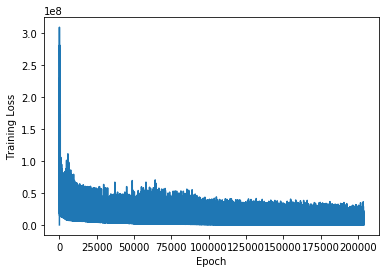

In [12]:
## Plotting training loss
ax = np.arange(len(loss))
plt.plot(ax,loss)
plt.xlabel("Epoch")
plt.ylabel("Training Loss")
plt.show()

In [13]:
## Normalisation of test set
x_test = np.empty(x_test1.shape)
for i in range(0,x_test1.shape[1]):
    x_test[:,i] = x_test1[:,i] - m[i]*np.ones(x_test1[:,i].shape)
    x_test[:,i] = x_test[:,i]/v[i]

In [14]:
# Predicting on test set and finding accuracy
y_pred = func(x_test@w)
tot = 0
for i in range(0,y_test.shape[0]):
    if(y_pred[i]==y_test[i]):
        tot+=1
print("Accuracy on test set =",(tot/y_pred.shape[0])*100,"%")

Accuracy on test set = 76.19047619047619 %
